<a href="https://colab.research.google.com/github/indrad123/imagecaptioning/blob/main/fin_vit_transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install transformers torch pandas  pillow nltk
!pip install datasets
!pip install --upgrade lxml
!pip install openimages
!pip install -U torchtext==0.6
!pip install pycocotools
!pip install torch_summary
!pip install nltk
!pip install torchvision
!pip install rouge_score
!pip install accelerate -U
!pip install transformers[torch]
!pip install torchsummary

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

# NEW CODE FROM SCRATCH


In [ ]:
import os
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from torchtext.data import Field
from sklearn.model_selection import train_test_split
from datasets import load_dataset
from PIL import Image
from torchvision import transforms
import io
from transformers import VisionEncoderDecoderModel, AutoFeatureExtractor, AutoTokenizer, Seq2SeqTrainer, Seq2SeqTrainingArguments
import nltk
import numpy as np
from datasets import load_metric

# Download NLTK data if not present
nltk.download('punkt')

# Load dataset
dataset = load_dataset("indrad123/flickr30k-google-translate-id")

# Prepare the dataset
data = pd.DataFrame({
    "image": dataset["test"]["image"],
    "caption": dataset["test"]["original_alt_text_id"]
})

# Split the dataset
train_data, val_data = train_test_split(data, test_size=0.05, random_state=42)

# Define the custom dataset
class CustomImageCaptionDataset(Dataset):
    def __init__(self, data, img_transform=None):
        self.data = data
        self.img_transform = img_transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_bytes = self.data.iloc[idx]['image']['bytes']
        captions_list = self.data.iloc[idx]['caption']

        image = Image.open(io.BytesIO(img_bytes)).convert('RGB')
        if self.img_transform:
            image = self.img_transform(image)

        # Ensure the caption is in a list format
        if not isinstance(captions_list, list):
            captions_list = [captions_list]

        return image, captions_list


# Define image transformations
img_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Initialize datasets
train_dataset = CustomImageCaptionDataset(train_data, img_transform)
val_dataset = CustomImageCaptionDataset(val_data, img_transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, pin_memory=True)

# Define model names
image_encoder_model = "google/vit-base-patch16-224-in21k"
text_decoder_model = "gpt2"

# Load the Vision-Encoder-Decoder model
model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(image_encoder_model, text_decoder_model)

# Initialize the feature extractor and tokenizer
feature_extractor = AutoFeatureExtractor.from_pretrained(image_encoder_model)
tokenizer = AutoTokenizer.from_pretrained(text_decoder_model)

# Configure the tokenizer and model
tokenizer.pad_token = tokenizer.eos_token
model.config.eos_token_id = tokenizer.eos_token_id
model.config.decoder_start_token_id = tokenizer.bos_token_id
model.config.pad_token_id = tokenizer.pad_token_id

# Define metrics
bleu = load_metric("bleu")
rouge = load_metric("rouge")
meteor = load_metric("meteor")
ignore_pad_token_for_loss = True

def postprocess_text(preds, labels):
    preds = [pred.strip() for pred in preds]
    labels = [label.strip() for label in labels]

    # Check if labels are empty after stripping and handle accordingly
    processed_labels = []
    for label in labels:
        if label:  # Check if label is not empty
            processed_labels.append("\n".join(nltk.sent_tokenize(label)))
        else:
            processed_labels.append(label)  # Keep empty labels as is

    preds = ["\n".join(nltk.sent_tokenize(pred)) for pred in preds]
    return preds, processed_labels  # Return processed labels

def compute_metrics(eval_preds):
    preds, labels = eval_preds
    if isinstance(preds, tuple):
        preds = preds[0]
    decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)
    if ignore_pad_token_for_loss:
        labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)
    decoded_preds, decoded_labels = postprocess_text(decoded_preds, decoded_labels)

    # Handle cases where all reference captions are empty
    if all(len(label.split()) == 0 for label in decoded_labels):
        print("Warning: All reference captions are empty. Returning zero metrics.")
        return {
            "bleu": 0,
            "meteor": 0,
            "rouge1": {"fmeasure": 0},
            "rouge2": {"fmeasure": 0},
            "rougeL": {"fmeasure": 0},
            "rougeLsum": {"fmeasure": 0},
            "gen_len": 0
        }

    # Compute BLEU
    bleu_result = bleu.compute(predictions=[pred.split() for pred in decoded_preds], references=[[label.split()] for label in decoded_labels])
    bleu_score = bleu_result["bleu"]

    # Compute ROUGE
    rouge_result = rouge.compute(predictions=decoded_preds, references=decoded_labels)
    rouge_score = {key: value.mid.fmeasure * 100 for key, value in rouge_result.items()}

    # Compute METEOR
    meteor_result = meteor.compute(predictions=decoded_preds, references=decoded_labels)
    meteor_score = meteor_result["meteor"]

    result = {
        "bleu": bleu_score,
        "meteor": meteor_score,
    }
    result.update(rouge_score)

    prediction_lens = [np.count_nonzero(pred != tokenizer.pad_token_id) for pred in preds]
    result["gen_len"] = np.mean(prediction_lens)
    return result




[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of GPT2LMHeadModel were not initialized from the model checkpoint at gpt2 and are newly initialized: ['h.0.crossattention.c_attn.bias', 'h.0.crossattention.c_attn.weight', 'h.0.crossattention.c_proj.bias', 'h.0.crossattention.c_proj.weight', 'h.0.crossattention.q_attn.bias', 'h.0.crossattention.q_attn.weight', 'h.0.ln_cross_attn.bias', 'h.0.ln_cross_attn.weight', 'h.1.crossattention.c_attn.bias', 'h.1.crossattention.c_attn.weight', 'h.1.crossattention.c_proj.bias', 'h.1.crossattention.c_proj.weight', 'h.1.crossattention.q_attn.bias', 'h.1.crossattention.q_attn.weight', 'h.1.ln_cross_at

In [ ]:
data

,image,caption
0,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,['Dua pemuda berambut lusuh memandangi tangan ...
1,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,['Beberapa pria bertopi keras mengoperasikan s...
2,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,['Seorang anak berpakaian merah muda sedang me...
3,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,['Seseorang dengan kemeja dan topi biru sedang...
4,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,"['Dua pria, satu berkemeja abu-abu, satu lagi ..."
...,...,...
31009,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,['Wanita menulis di atas kertas di ruangan den...
31010,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,['Seseorang berbaju merah memanjat permukaan b...
31011,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,"[""Dua pekerja konstruksi laki-laki sedang beke..."
31012,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x...,['Seorang pengamen tua berkacamata memainkan a...


In [ ]:
def data_collator(batch):
    images, captions = zip(*batch)
    pixel_values = torch.stack(images)  # Stack images to form a batch

    # Process captions
    valid_captions = []
    for caption_list in captions:
        if isinstance(caption_list, list) and len(caption_list) > 0:
            valid_captions.append(caption_list[0])  # If list, take the first caption
        elif isinstance(caption_list, str):
            valid_captions.append(caption_list)  # If string, take the whole caption
        else:
            valid_captions.append("")  # Handle other invalid cases

    # Debugging: Print sample captions
    print("Sample captions:", valid_captions[:5])

    captions_encoded = tokenizer(valid_captions, padding='max_length', max_length=64, truncation=True, return_tensors="pt")

    labels = captions_encoded.input_ids
    labels = torch.where(labels != tokenizer.pad_token_id, labels, -100)

    return {
        'pixel_values': pixel_values,
        'labels': labels,
        'decoder_input_ids': captions_encoded.input_ids,  # Add decoder_input_ids
        'decoder_attention_mask': captions_encoded.attention_mask,
    }


In [ ]:
# Define training arguments
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    eval_strategy="epoch",  # Updated argument
    per_device_train_batch_size=4,  # Reduced batch size to handle memory issues
    per_device_eval_batch_size=4,  # Reduced batch size to handle memory issues
    gradient_accumulation_steps=2,  # Accumulate gradients over 2 steps to simulate larger batch size
    output_dir="/content/drive/MyDrive/VitImageCaptioning/checkpoints",
    save_total_limit=3,  # Limit the number of checkpoints
    save_steps=500,  # Save checkpoint every 500 steps
    remove_unused_columns=False,
    fp16=True,  # Enable mixed precision training
    # IMPORTANT CHANGE: Add label smoothing to potentially help with overfitting
    label_smoothing_factor=0.1
)

# Ensure the checkpoint directory exists
if not os.path.exists(training_args.output_dir):
    os.makedirs(training_args.output_dir)

# Initialize Seq2SeqTrainer
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics
)

# Start training
trainer.train()

# Save final model
output_dir = "/content/drive/MyDrive/VitImageCaptioning/model"
model.save_pretrained(output_dir)
tokenizer.save_pretrained(output_dir)
feature_extractor.save_pretrained(output_dir)



pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['"I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say', '"I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say', '"I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say', '"I\'m not going to say that I\'m not going to say that I\'m not going to say th

Epoch,Training Loss,Validation Loss


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['"I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say', '"I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say', '"I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say that I\'m not going to say', '"I\'m not going to say that I\'m not going to say that I\'m not going to say th

KeyboardInterrupt: 

# Use the Model

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of GPT2LMHeadModel were not initialized from the model checkpoint at gpt2 and are newly initialized: ['h.0.crossattention.c_attn.bias', 'h.0.crossattention.c_attn.weight', 'h.0.crossattention.c_proj.bias', 'h.0.crossattention.c_proj.weight', 'h.0.crossattention.q_attn.bias', 'h.0.crossattention.q_attn.weight', 'h.0.ln_cross_attn.bias', 'h.0.ln_cross_attn.weight', 'h.1.crossattention.c_attn.bias', 'h.1.crossattention.c_attn.weight', 'h.1.crossattention.c_proj.bias', 'h.1.crossattention.c_proj.weight', 'h.1.crossattention.q_attn.bias', 'h.1.crossattention.q_attn.weight', 'h.1.ln_cross_attn.bias', 'h.1.ln_cross_attn.weight', 'h.10.crossattention.c_attn.bias', 'h.10.crossattention.c_attn.weight', '

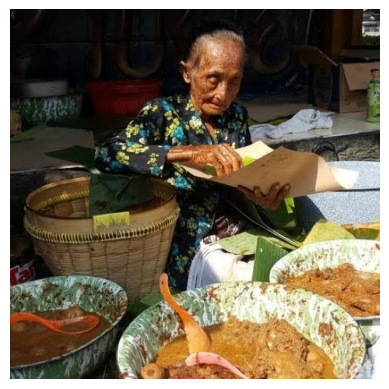

/usr/local/lib/python3.10/dist-packages/transformers/generation/configuration_utils.py:515: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.1` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(


Generated Caption: "I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say


In [ ]:
import torch
from transformers import VisionEncoderDecoderModel, AutoTokenizer, AutoFeatureExtractor
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt

# Define model names
image_encoder_model = "google/vit-base-patch16-224-in21k"
text_decoder_model = "gpt2"

# Load the Vision-Encoder-Decoder model
model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(image_encoder_model, text_decoder_model)

# Initialize the feature extractor and tokenizer
feature_extractor = AutoFeatureExtractor.from_pretrained(image_encoder_model)
tokenizer = AutoTokenizer.from_pretrained(text_decoder_model)

# Paths to the saved model and tokenizer
model_dir = "/content/drive/MyDrive/VitImageCaptioning/model"

# Load the saved model and tokenizer
#model = VisionEncoderDecoderModel.from_pretrained(model_dir)
#tokenizer = AutoTokenizer.from_pretrained(model_dir)
#feature_extractor = AutoFeatureExtractor.from_pretrained(model_dir)
feature_extractor = AutoFeatureExtractor.from_pretrained(image_encoder_model)

# Set the model to evaluation mode
model.eval()

# Function to generate caption for an image
def generate_caption(image_path):
    # Load and preprocess the image
    image = Image.open(image_path).convert("RGB")

    # Display the image
    plt.imshow(image)
    plt.axis('off')  # Hide axes
    plt.show()

    pixel_values = feature_extractor(images=image, return_tensors="pt").pixel_values

    # Generate caption using the model, including attention mask and handling padding
    with torch.no_grad():
        # Create attention mask filled with 1s (all tokens are relevant)
        attention_mask = torch.ones(pixel_values.shape[0], 1, dtype=torch.long)
        output_ids = model.generate(pixel_values,
                                   #attention_mask=attention_mask,
                                   max_length=64,
                                   num_beams=4,
                                   early_stopping=True,
                                   pad_token_id=tokenizer.eos_token_id,
                                   temperature=0.1)
        #,  # Keep temperature for sampling
        #                           do_sample=True)   # Enable sampling

    # Decode the generated caption
    caption = tokenizer.decode(output_ids[0], skip_special_tokens=True)
    return caption

# Example usage
image_path = "/content/drive/MyDrive/Colab Notebooks/Test Data/gudeg.jpeg"  # Replace with the path to your image
caption = generate_caption(image_path)
print("Generated Caption:", caption)


In [ ]:

from transformers import VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer
import torch
from PIL import Image

#google/vit-base-patch16-224-in21k
#model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
#feature_extractor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
#tokenizer = AutoTokenizer.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

#model = VisionEncoderDecoderModel.from_pretrained("google/vit-base-patch16-224-in21k")
#feature_extractor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
#tokenizer = AutoTokenizer.from_pretrained("google/vit-base-patch16-224-in21k")

# Paths to the saved model and tokenizer
#model_dir = "/content/drive/MyDrive/VitImageCaptioning/model"
#mode_dir = "indrad123/VitImageCaptioning/model"
# Load the saved model and tokenizer
#model = VisionEncoderDecoderModel.from_pretrained(model_dir)
#tokenizer = AutoTokenizer.from_pretrained(model_dir)
#feature_extractor = AutoFeatureExtractor.from_pretrained(model_dir)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

max_length = 16
num_beams = 4
gen_kwargs = {"max_length": max_length, "num_beams": num_beams}
def predict_step(image_paths):
  images = []
  for image_path in image_paths:
    i_image = Image.open(image_path)
    if i_image.mode != "RGB":
      i_image = i_image.convert(mode="RGB")

    images.append(i_image)

  pixel_values = feature_extractor(images=images, return_tensors="pt").pixel_values
  pixel_values = pixel_values.to(device)

  output_ids = model.generate(pixel_values, **gen_kwargs)

  preds = tokenizer.batch_decode(output_ids, skip_special_tokens=True)
  preds = [pred.strip() for pred in preds]
  return preds


predict_step(['/content/drive/MyDrive/Colab Notebooks/Test Data/gudeg.jpeg'])


You are using a model of type vit to instantiate a model of type vision-encoder-decoder. This is not supported for all configurations of models and can yield errors.


ValueError: A configuraton of type vit cannot be instantiated because not both `encoder` and `decoder` sub-configurations are passed, but only {'_name_or_path': 'google/vit-base-patch16-224-in21k', 'architectures': ['ViTModel'], 'attention_probs_dropout_prob': 0.0, 'hidden_act': 'gelu', 'hidden_dropout_prob': 0.0, 'hidden_size': 768, 'image_size': 224, 'initializer_range': 0.02, 'intermediate_size': 3072, 'layer_norm_eps': 1e-12, 'model_type': 'vit', 'num_attention_heads': 12, 'num_channels': 3, 'num_hidden_layers': 12, 'patch_size': 16, 'qkv_bias': True, 'transformers_version': '4.13.0.dev0', '_commit_hash': 'b4569560a39a0f1af58e3ddaf17facf20ab919b0', 'attn_implementation': None}

# Get from Hugging Face

In [ ]:
!pip install huggingface_hub
from huggingface_hub import notebook_login

notebook_login()

from transformers import VisionEncoderDecoderModel, AutoTokenizer, AutoFeatureExtractor

# Example to upload a model
from huggingface_hub import notebook_login

# Log in to Hugging Face
notebook_login()

# Paths to the saved model and tokenizer
model_dir = "/content/drive/MyDrive/VitImageCaptioning/model"

# Load the saved model and tokenizer
model = VisionEncoderDecoderModel.from_pretrained(model_dir)
tokenizer = AutoTokenizer.from_pretrained(model_dir)
feature_extractor = AutoFeatureExtractor.from_pretrained(model_dir)

# Specify your repository name
repo_name = "your-username/vit-gpt2-image-captioning"

# Push the model to Hugging Face Hub
model.push_to_hub(repo_name)
tokenizer.push_to_hub(repo_name)
feature_extractor.push_to_hub(repo_name)



In [ ]:
from transformers import VisionEncoderDecoderModel, AutoTokenizer, AutoFeatureExtractor

# Load the model from Hugging Face Hub
model = VisionEncoderDecoderModel.from_pretrained("your-username/vit-gpt2-image-captioning")
tokenizer = AutoTokenizer.from_pretrained("your-username/vit-gpt2-image-captioning")
feature_extractor = AutoFeatureExtractor.from_pretrained("your-username/vit-gpt2-image-captioning")


# FRESH NEW CODE

In [ ]:
import os
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from torchtext.data import Field
from sklearn.model_selection import train_test_split
from datasets import load_dataset
from PIL import Image
from torchvision import transforms
import io
from transformers import VisionEncoderDecoderModel, AutoFeatureExtractor, AutoTokenizer, Seq2SeqTrainer, Seq2SeqTrainingArguments
import nltk
import numpy as np
from datasets import load_metric

# Download NLTK data if not present
nltk.download('punkt')

# Load dataset
dataset = load_dataset("indrad123/flickr30k-google-translate-id")

# Prepare the dataset
data = pd.DataFrame({
    "image": dataset["test"]["image"],
    "caption": dataset["test"]["original_alt_text_id"]
})

# Split the dataset
train_data, val_data = train_test_split(data, test_size=0.05, random_state=42)

class CustomImageCaptionDataset(Dataset):
    def __init__(self, data, img_transform=None):
        self.data = data
        self.img_transform = img_transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_bytes = self.data.iloc[idx]['image']['bytes']
        captions_list = self.data.iloc[idx]['caption']

        image = Image.open(io.BytesIO(img_bytes)).convert('RGB')
        if self.img_transform:
            image = self.img_transform(image)

        # Ensure the caption is in a list format
        if not isinstance(captions_list, list):
            captions_list = [captions_list]

        return image, captions_list

# Define image transformations
img_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Initialize datasets
train_dataset = CustomImageCaptionDataset(train_data, img_transform)
val_dataset = CustomImageCaptionDataset(val_data, img_transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, pin_memory=True)

# Define model names
image_encoder_model = "google/vit-base-patch16-224-in21k"
text_decoder_model = "gpt2"

# Load the Vision-Encoder-Decoder model
model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(image_encoder_model, text_decoder_model)

# Initialize the feature extractor and tokenizer
feature_extractor = AutoFeatureExtractor.from_pretrained(image_encoder_model)
tokenizer = AutoTokenizer.from_pretrained(text_decoder_model)

# Configure the tokenizer and model
tokenizer.pad_token = tokenizer.eos_token
model.config.eos_token_id = tokenizer.eos_token_id
model.config.decoder_start_token_id = tokenizer.bos_token_id
model.config.pad_token_id = tokenizer.pad_token_id

# Define metrics
bleu = load_metric("bleu")
rouge = load_metric("rouge")
meteor = load_metric("meteor")
ignore_pad_token_for_loss = True

def postprocess_text(preds, labels):
    preds = [pred.strip() for pred in preds]
    labels = [label.strip() for label in labels]

    # Check if labels are empty after stripping and handle accordingly
    processed_labels = []
    for label in labels:
        if label:  # Check if label is not empty
            processed_labels.append("\n".join(nltk.sent_tokenize(label)))
        else:
            processed_labels.append(label)  # Keep empty labels as is

    preds = ["\n".join(nltk.sent_tokenize(pred)) for pred in preds]
    return preds, processed_labels  # Return processed labels

def compute_metrics(eval_preds):
    preds, labels = eval_preds
    if isinstance(preds, tuple):
        preds = preds[0]
    decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)
    if ignore_pad_token_for_loss:
        labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)
    decoded_preds, decoded_labels = postprocess_text(decoded_preds, decoded_labels)

    # Handle cases where all reference captions are empty
    if all(len(label.split()) == 0 for label in decoded_labels):
        print("Warning: All reference captions are empty. Returning zero metrics.")
        return {
            "bleu": 0,
            "meteor": 0,
            "rouge1": {"fmeasure": 0},
            "rouge2": {"fmeasure": 0},
            "rougeL": {"fmeasure": 0},
            "rougeLsum": {"fmeasure": 0},
            "gen_len": 0
        }

    # Compute BLEU
    bleu_result = bleu.compute(predictions=[pred.split() for pred in decoded_preds], references=[[label.split()] for label in decoded_labels])
    bleu_score = bleu_result["bleu"]

    # Compute ROUGE
    rouge_result = rouge.compute(predictions=decoded_preds, references=decoded_labels)
    rouge_score = {key: value.mid.fmeasure * 100 for key, value in rouge_result.items()}

    # Compute METEOR
    meteor_result = meteor.compute(predictions=decoded_preds, references=decoded_labels)
    meteor_score = meteor_result["meteor"]

    result = {
        "bleu": bleu_score,
        "meteor": meteor_score,
    }
    result.update(rouge_score)

    prediction_lens = [np.count_nonzero(pred != tokenizer.pad_token_id) for pred in preds]
    result["gen_len"] = np.mean(prediction_lens)
    return result

def data_collator(batch):
    images, captions = zip(*batch)
    pixel_values = torch.stack(images)  # Stack images to form a batch

    valid_captions = []
    for caption_list in captions:
        if isinstance(caption_list, list) and len(caption_list) > 0:
            valid_captions.append(caption_list[0])  # If list, take the first caption
        elif isinstance(caption_list, str):
            valid_captions.append(caption_list)     # If string, take the whole caption
        else:
            valid_captions.append("")               # Handle other invalid cases

    captions_encoded = tokenizer(valid_captions, padding='max_length', max_length=64, truncation=True, return_tensors="pt")

    # Prepare labels
    labels = captions_encoded.input_ids
    labels = torch.where(labels != tokenizer.pad_token_id, labels, -100)

    # Create attention masks
    decoder_attention_mask = captions_encoded.attention_mask

    return {
        'pixel_values': pixel_values,
        'labels': labels,
        'decoder_input_ids': captions_encoded.input_ids,
        'decoder_attention_mask': decoder_attention_mask,
    }


# Define training arguments
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    evaluation_strategy="epoch",
    per_device_train_batch_size=4,  # Reduced batch size to handle memory issues
    per_device_eval_batch_size=4,  # Reduced batch size to handle memory issues
    gradient_accumulation_steps=2,  # Accumulate gradients over 2 steps to simulate larger batch size
    output_dir="/content/drive/MyDrive/VitImageCaptioning/checkpoints",
    save_total_limit=3,  # Limit the number of checkpoints
    save_steps=500,  # Save checkpoint every 500 steps
    remove_unused_columns=False,
    fp16=True,  # Enable mixed precision training
    label_smoothing_factor=0.1
)

# Ensure the checkpoint directory exists
if not os.path.exists(training_args.output_dir):
    os.makedirs(training_args.output_dir)

# Initialize Seq2SeqTrainer
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics
)

# Start training
trainer.train()



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of GPT2LMHeadModel were not initialized from the model checkpoint at gpt2 and are newly initialized: ['h.0.crossattention.c_attn.bias', 'h.0.crossattention.c_attn.weight', 'h.0.crossattention.c_proj.bias', 'h.0.crossattention.c_proj.weight', 'h.0.crossattention.q_attn.bias', 'h.0.crossattention.q_attn.weight', 'h.0.ln_cross_attn.bias', 'h.0.ln_cross_attn.weight', 'h.1.crossattention.c_attn.bias', 'h.1.crossattention.c_attn.weight', 'h.1.crossattention.c_proj.bias', 'h.1.crossattention.c_proj.weight', 'h.1.crossattention.q_attn.bias', 'h.1.crossattention.q_attn.weight', 'h.1.ln_cross_at

pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja biru sedang berdebat dengan pria berjaket hijau dan mulai mengacungkan tinjunya karena marah.'\n 'Seorang pria paruh baya berjaket hijau sedang berbicara dengan pria paruh baya lain yang mengenakan kaos biru muda.'\n 'Orang-orang berjalan-jalan dan berbincang di trotoar depan rumah sakit.'\n 'Pria berkemeja biru sedang ngobrol dengan pria berjaket.'\n 'Sekelompok orang yang duduk di luar sedang mengobrol.']", '[\'Seorang pria berjaket biru bergaris kuning sedang duduk di dalam pesawat yang lepas landas.\'\n \'Seorang pekerja darurat sedang melihat ke luar jendela kendaraan yang bergerak.\'\n \'Seorang petugas pemadam kebakaran botak berseragam mengendarai kendaraan yang bergerak.\'\n "Seorang petugas pemadam kebakaran melihat keluar dari jendela kendaraan."\n \'Seorang 

Epoch,Training Loss,Validation Loss,Bleu,Meteor,Rouge1,Rouge2,Rougel,Rougelsum,Gen Len
1,1.425300,1.429376,0.000000,0.039361,0.000000,0.000000,0.000000,0.000000,19.000000
2,1.417700,1.423187,0.000000,0.039361,0.000000,0.000000,0.000000,0.000000,19.000000
3,1.415400,1.420625,0.000000,0.039361,0.000000,0.000000,0.000000,0.000000,19.000000


Streaming output truncated to the last 5000 lines.
pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Micky Mouse masih membawa senyuman bahkan kepada penggemar terkecilnya seperti pemuda di kursi tinggi ini.\'\n "Seorang bayi sedang duduk di kursi tinggi di sebuah restoran sambil tertawa dan meremas hidung Mickey Mouse!"\n \'Peniru Mickey Mouse yang berkostum sedang bermain dengan seorang anak di kursi tinggi.\'\n \'Seorang bayi memegang hidung Micky Mouse.\'\n \'Seorang anak laki-laki bermain dengan mickey mouse.\']', "['Kios koran yang penuh dengan majalah, permen, dan produk minuman bersoda sehingga wanita tersenyum yang bekerja di belakang konter mudah untuk dilewatkan.'\n 'Seorang penjual majalah duduk di belakang kolase majalah yang sangat berwarna-warni.'\n 'Seorang pegawai kios koran dikelilingi oleh barang dagangannya yang berwarna

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bercelana kulit hitam sedang memegang sesuatu di tangannya di atas air, sambil berdiri di atas jembatan.'\n 'Seorang pria berdiri di depan gerbang mengenakan celana hitam dan kemeja merah.'\n 'Seorang pria Afrika-Amerika berdiri di jembatan mengenakan kemeja merah muda.'\n 'Pria berkemeja merah sedang melihat ke jalan setapak.'\n 'Seorang pria di jembatan memegang benda biru di atas rel.']", "['Pria bercelana pendek kotak-kotak sedang membangun patung pasir besar sementara dua pria lainnya yang terkubur di pasir sedang melihat dari bawah payung biru.'\n 'Seorang pria yang mengenakan celana pendek tapi tanpa kemeja sedang mengerjakan patung pasir di pantai sementara dua orang yang terkubur di pasir menonton di bawah payung biru.'\n 'Seorang pria bertelanjang dada sedang mengerjaka

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1168: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pengantin wanita yang tersenyum duduk di ayunan dengan pengantin prianya yang tersenyum berdiri di belakangnya berpose untuk fotografer pria sementara seorang anak laki-laki memegang botol minuman dan anak laki-laki lainnya yang mengenakan kemeja hijau mengamati.\'\n \'Seorang pengantin laki-laki berfoto di ayunan sementara seorang pria muda sedang minum soda dan seorang anak laki-laki berkemeja hijau dengan sepeda sedang menonton.\'\n \'Pasangan pengantin baru berfoto di taman bermain.\'\n "Pasangan berfoto di taman bermain anak-anak."\n \'Pesta pernikahan berpose untuk berfoto di ayunan.\']', "['Seekor anjing hitam muncul dari air ke pasir, memegang benda putih di mulutnya.'\n 'Seekor anjing hitam berjalan keluar dari air dengan bola putih di mulutnya.'\n 'Seekor anjing hitam muncu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di laboratorium yang penuh dengan peralatan gelas, seorang ilmuwan berjas putih dengan hati-hati menuangkan cairan ke dalam wadah lain sementara yang lain mengawasi dengan penuh perhatian.'\n 'Dua pria berjas putih di laboratorium kimia bersiap menuangkan larutan ke dalam botol.'\n 'Dua orang berjas lab sedang menggunakan materi ilmiah dengan saksama.'\n 'Dua ilmuwan laki-laki sedang mengisi toples berisi sejenis cairan.'\n 'Ilmuwan mengamati cairan mengalir keluar dari gelas kimia di laboratorium.']", "['Seorang pemuda tersenyum berjalan di tepi pantai mengenakan topi baseball, kaos biru, dan celana jins.'\n 'Seorang pria dengan rambut panjang, topi bola, dan kemeja biru tersenyum saat dia berjalan di sepanjang trotoar'\n 'Seorang pria berkemeja dan bertopi biru sedang berjalan di sepanjang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis kecil sedang duduk di konter, menjuntai satu kaki di wastafel sambil memegang mesin cuci piring jet.'\n 'Seorang gadis muda berkacamata merah duduk di dekat wastafel dan memegang keran.'\n 'Seorang gadis kecil yang memakai kacamata hitam memasukkan kakinya ke wastafel dapur.'\n 'Seorang gadis muda bertelanjang kaki dengan kacamata hitam merah sedang bermain di wastafel.'\n 'Seorang gadis kecil bermain dengan keran.']", '[\'Seorang pria dengan kaus bertuliskan GNU berada di depan ruangan di depan sekelompok orang yang sedang duduk.\'\n \'Seorang pria yang mengenakan kaos bertuliskan "gnu" memberikan presentasi teknologi.\'\n \'Seorang pria berkaos putih berbicara kepada orang banyak.\'\n \'Seorang pria sedang berbicara di depan audiensi.\'\n \'Pria berkemeja putih sedang berpidat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang atlet di tim hoki Slough Jets sedang berseluncur di gelanggang es dengan dilengkapi tongkat hoki.'\n 'Pemain hoki Jets yang lamban dengan tenang berbelok untuk menerima puck yang mendekat.'\n 'Seorang pemain hoki dari St Louis Jets sedang berseluncur di atas es.'\n 'Seorang pemain hoki setengah baya yang membelok di atas es'\n 'Tim hoki sedang melakukan pemanasan.']", "['Seseorang dengan papan seluncur salju dan helm berdiri di depan latar belakang pegunungan yang tertutup salju.'\n 'Seseorang berjaket hijau dan topi biru sedang berjalan dengan latar belakang gunung salju.'\n 'Seseorang mengenakan perlengkapan cuaca dingin di dekat gunung yang tertutup salju.'\n 'Ada seorang snowboarder yang membawa papannya di pegunungan.'\n 'Seorang pemain snowboard di puncak gunung dengan jaket hij

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Jalan kota di mana seorang wanita dengan tas coklat dan pakaian putih melewati toko pertunjukan.'\n 'Seorang wanita berdiri di depan pajangan yang menampilkan model dan banyak pasang sepatu.'\n 'Seorang wanita berkemeja putih dan tas coklat di lengannya sedang window shopping.'\n 'Wanita muda membawa dompet coklat sambil melihat ke jendela toko sepatu.'\n 'Seorang wanita sedang berbelanja di etalase dompet di jalan kota yang sibuk.']", "['Seseorang sedang memegang jaring ikan biru di depan batu.'\n 'Seorang pria bertopi biru berdiri dengan jaring besar di tangannya.'\n 'Seorang pria berkemeja ungu sedang memegang jaring ikan besar.'\n 'Seorang pria bertopi biru sedang memegang jaring.'\n 'Seorang pria tua memegang banyak jaring.']", "['Sekelompok kecil orang, mengapung di perahu kecil bertena

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing kecil berwarna hitam dan putih mendayung di air biru jernih.'\n 'Seekor anjing kecil berwarna hitam putih sedang berenang di air.'\n 'Seekor anjing hitam putih sedang berenang di air'\n 'Seekor anjing hitam putih berenang di air biru.'\n 'Seekor anjing hitam putih sedang berenang.']", "['Dua pria sedang duduk di kursi di depan sebuah gedung sementara sekelompok orang menaiki tangga.'\n 'Ada 2 pria berpakaian garis-garis duduk di bawah payung hijau.'\n 'Dua pengemudi gondola beristirahat di bawah naungan payung meja.'\n 'Dua operator gondola duduk di sepanjang jalan di Italia.'\n 'Dua pendayung gondola duduk di Venesia']", "['Seorang wanita tua dengan tas besar di pangkuannya duduk di samping seorang gadis kecil yang mengenakan gaun oranye bergaris.'\n 'Seorang wanita tua sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['3 wanita berlari maraton dengan penonton di latar belakang, satu dengan label Galina dan satu lagi label Inga, dan yang ketiga berlari dekat di belakang mereka dengan warna biru.'\n 'Tiga wanita bercelana pendek dan tank top berlari berdampingan dalam maraton di jalan aspal sementara orang banyak melihatnya.'\n 'Beberapa wanita berlari dalam perlombaan, sementara orang banyak melihatnya.'\n 'Empat wanita sedang berlomba di hari yang cerah.'\n 'Tiga pelari wanita sedang berkompetisi dalam perlombaan.']", '[\'Seorang penduduk asli Amerika dengan gaun merah dan biru duduk dan memetik rumput hijau.\'\n \'Seorang wanita mengenakan pakaian biru cerah dan merah saat dia duduk di rerumputan hijau.\'\n "Wanita bertopi bowler berwarna coklat, kemeja biru, dan kemeja merah duduk di rumput."\n \'Seorang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain ski di udara saat melakukan lompatan berani di lereng ski yang cerah.'\n 'Seorang pemain ski dengan kemeja kuning dan hijau sedang melakukan jungkir balik di udara.'\n 'Seorang pemain ski sedang melakukan trik di udara.'\n 'Seorang pemain ski melakukan lompatan di depan lift kursi yang kosong.'\n 'Ini adalah pemain ski yang melakukan lompatan bagus.']", "['Seorang anak laki-laki menggunakan palu untuk mengeja sesuatu pada lembaran logam tipis dengan baut berukir.'\n 'Seorang anak laki-laki berjaket biru dan hijau sedang menggunakan palu dengan tangan kanannya.'\n 'Seorang anak laki-laki berjaket hijau dan abu-abu hendak memukul sebuah benda.'\n 'Seorang anak laki-laki berkacamata sedang menggunakan palu pada benda logam.'\n 'Seorang anak laki-laki sedang memahat sepotong logam.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang gadis bersandar di bahu wanita sambil duduk di bangku."\n \'Seorang ibu dengan seorang anak duduk di pangkuannya dan keduanya tersenyum.\'\n \'Seorang wanita dan seorang gadis muda duduk berdekatan dan berpose untuk difoto.\'\n \'Seorang wanita dan anak perempuannya tersenyum ke arah kamera.\'\n \'Seorang wanita dan seorang anak duduk bersama dan tersenyum.\']', "['Dua wanita berjalan di depan sebuah bangunan bata membawa ransel dan kantong tidur di punggung mereka.'\n 'Ada dua orang berjalan di jalan membawa banyak barang bawaan di tas mereka.'\n 'Dua orang dengan ransel dan kantong tidur berjalan di luar di trotoar.'\n 'Dua wanita sedang berjalan melewati lingkungan perkotaan dengan peralatan berkemah.'\n 'Dua wanita berjalan di atas semen sambil membawa banyak ransel dan ransel.']"

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Enam orang duduk di bangku pinggir jalan di depan restoran yang sibuk dengan tempat duduk luar ruangan yang tertutup.'\n 'Enam orang duduk di bangku batu di luar restoran sambil memandang ke arah yang berbeda.'\n 'Sekelompok orang duduk di bangku di luar restoran.'\n 'Orang-orang duduk di bangku di depan restoran.'\n 'Wisatawan sedang istirahat dari berbelanja.']", "['Seorang pendaki yang memakai helm putih bertengger di sisi permukaan batu.'\n 'Pria berkemeja biru, memakai helm, bersiap untuk mendaki.'\n 'Seorang pendaki yang mengenakan helm putih sedang memanjat tembok.'\n 'Seorang pria berbaju biru memanjat tebing curam.'\n 'Pemanjat tebing melihat ke bawah dari atas.']", "['Seorang pria berlomba dengan kendaraan kecil sementara pria lain bergelantungan di belakang.'\n 'Seorang pembalap de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bercelana kotor sedang menyapu jalan dengan sapu merah.'\n 'Pria berjins menyapu trotoar yang kotor.'\n 'Kaki seorang pria sedang menyapu trotoar.'\n 'Menyapu jalan dengan sapu merah.'\n 'Seorang pria sedang menyapu tanah semen.']", "['Seorang pemuda bermain skateboard di jalan dengan mengenakan kemeja bergaris hitam putih'\n 'Seorang pria yang mengenakan celana pendek dan tank top mengendarai skateboard.'\n 'Seorang anak dengan tank top bergaris bermain skateboard di jalan'\n 'Seorang anak laki-laki bermain skateboard di jalan.' 'Seorang anak laki-laki dengan tank top sedang bermain skateboard.']", "['Seorang dokter yang memakai scrub biru bersandar di dinding sambil melihat orang lain menangani pasiennya.'\n 'Staf medis melihat prosedur medis berlangsung di monitor video.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak muda bertopi besar dalam suasana permainan bola bocce.'\n 'Seorang anak berjaket sedang duduk di rumput.'\n 'Seorang anak yang sedang duduk sedang bermain dengan palu kroket.'\n 'Seorang anak sedang bermain dengan palu kroket.' 'Orang kecil berjaket merah.']", "['Tiga anak, berusia antara 6 dan 9 tahun, berada di tepian sambil memegang tanaman di tepinya pada hari yang cerah.'\n 'Tiga anak diposisikan pada formasi batuan alami yang menggantungkan batang tanaman panjang ke dalam air.'\n 'Tiga anak kecil Asia memegang tanaman merambat hijau dari tebing batu.'\n 'Tiga anak menggantungkan potongan rumput panjang ke dalam kolam.'\n 'Tiga anak kecil di atas batu, memandangi air.']", "['Beberapa gadis berpakaian renang sedang bermain di air mancur.'\n 'Anak-anak kecil menikmati alat penyiram de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Gadis berkemeja putih dan rok biru menembakkan anak panah dari busur.'\n '5 anak jepang berlatih busur di depan sensei.'\n 'Lima wanita berseragam berada di kelas memanah.'\n 'Sekelompok lima wanita dengan rok biru berlatih memanah.'\n ‘Lima wanita sedang berlatih keterampilan busur dan anak panah di dalam ruangan.’]", "['Anjing itu berguling-guling di rumput dengan mulut terbuka lebar.'\n 'Anjing coklat dan putih berguling-guling di rumput.'\n 'Anjing telentang berguling-guling di rumput.'\n 'Seekor anjing berguling-guling di rerumputan.'\n 'Seekor anjing berbaring terbalik di atas rumput.']", '["Seorang pria dengan helm, kemeja, dan celana jins tukang las biru sedang mengelas kerangka bangunan di atas balok kemerahan."\n \'Seorang pria berjins dan sepatu bot memegang topeng las saat mengerj

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopeng domino membawa amplifier ke atas bukit.'\n 'Seorang pria bertopeng dengan pakaian cerah membawa sebuah kotak besar.'\n 'Orang kulit hitam yang mengangkat kotak hitam diawasi oleh anjing hitam.'\n 'Seorang pria kulit hitam bertopeng merah membawa sebuah kotak.'\n 'Seorang pria bertopeng membawa speaker hitam']", "['Banyak orang berlarian di jalan, tapi seorang pria dengan tank top dan topi kuning tampak menonjol.'\n 'Beberapa orang lari maraton, pelari 721 dan 5132 adalah pemimpinnya.'\n 'Sekelompok besar orang mengikuti perlombaan yang disponsori oleh Adidas.'\n 'Sekelompok orang berlarian di sepanjang jalan.'\n 'Sekelompok pelari berkompetisi di acara musim panas.']", "['Seorang pria membuat isyarat di samping bangunan besar berwarna merah dengan logo burung di atasnya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Beberapa wanita mengenakan pakaian timur tengah berwarna emas, biru, kuning dan merah dan menampilkan tarian.'\n 'Beberapa wanita, mengenakan kostum warna-warni, sedang menampilkan tarian.'\n 'Sekelompok wanita menari gaya Bali dengan pakaian dan riasan warna-warni.'\n 'Penari Thailand dengan gembira melakukan langkah mereka secara serempak.'\n 'Penari etnis tampil serempak.']", "['Seorang wanita tua berpakaian merah jambu dengan tas pinggang hitam berada di luar dengan beberapa pohon dan desain arsitektur yang menarik di sebelahnya.'\n 'Seorang wanita dengan kaos merah muda dan celana pendek berdiri di dekat patung modern berwarna cerah di tempat umum.'\n 'Seorang wanita berbaju merah jambu dan mengenakan tas pinggang berdiri di depan sebuah karya seni di taman setempat.'\n 'Seorang wanita y

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria melukis gambar pohon dan kura-kura dengan topi terbalik.'\n 'Seorang pria muda dengan topi LA melukis kura-kura dengan latar belakang hijau.'\n 'Seorang seniman sedang melukis kura-kura kecil menjadi sebuah lukisan.'\n 'Seseorang sedang melukis gambar pemandangan.'\n 'Seorang pria berkonsentrasi untuk melukis detail.']", "['Sekelompok remaja putra dan putri mengobrol dan mengamati menu di sebuah restoran mewah.'\n 'Sekelompok pria dan wanita berkumpul mengelilingi meja di sebuah restoran.'\n 'Orang-orang duduk mengelilingi meja dengan menu dan gelas anggur.'\n 'Beberapa orang sedang berada di restoran melihat menu berwarna merah.'\n 'Orang-orang berbicara di restoran']", "['Seorang gadis menyelam untuk memukul bola voli melewati net sementara yang lain bergerak ke posisi untuk me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berjaket merah muda, abu-abu dan putih melompat kegirangan di salju, dia membawa tas berwarna cerah di kedua lengannya.'\n 'Seorang wanita dengan jaket poky dot melompat di salju dengan tas belanjaan di kedua pergelangan tangannya sebuah kota.'\n 'Seorang wanita muda, membawa beberapa tas belanjaan melompat ke udara.'\n 'Seorang wanita dengan 5 tas belanja dan kemeja polkadot melompat di atas salju.'\n 'Gadis melompat dan tersenyum di salju dengan banyak tas.']", "['Seorang wanita sedang memegang daging dari kandang daging kaca bening sambil berdiri di depan meja kayu dengan mangkuk logam besar di atasnya.'\n 'Seorang wanita mengenakan pakaian hitam berdiri di depan konter sambil memegang sepotong daging.'\n 'Seorang wanita di toko daging bersandar di konter dan memegang sepoto

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki itu memakai topi dan memegang sandal.'\n 'Seorang anak laki-laki duduk sambil tersenyum melihat foto itu.'\n 'Seorang anak berbaju biru dan bertopi tersenyum.'\n 'Seorang anak laki-laki tersenyum dan memegang sandal.' 'Seorang anak memegang sepatu.']", "['Pria yang memakai tank top putih tampak sementara yang lain sedang membungkuk di dapur.'\n 'Seseorang sedang berusaha memperbaiki wastafel sementara teman-temannya melihatnya.'\n 'Dua teman sekamar sedang mencoba memperbaiki wastafel di dapur.'\n 'Seseorang sedang bersandar di belakang kompor di dapur.'\n 'Seorang pria bersandar ke dalam lubang di konter.']", "['Beberapa laki-laki berkumpul di sekitar celana putih bertelanjang dada dengan lonceng di pergelangan kaki dan kalung mutiara saat dia meniup sesuatu dari mulutnya untu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Gadis cantik di toko kecantikan anak-anak duduk di mobil mainan sambil mengeringkan rambutnya, sementara penata gaya tersenyum dan lengan pria menyentuh mobil."\n \'Seorang anak berambut pirang mendapatkan potongan rambut pertamanya sambil duduk di dalam mobil biru dengan tirai kuning sambil mengeringkan rambutnya.\'\n "Seorang penata rambut mengeringkan rambut seorang anak kecil yang duduk di dalam mobil biru."\n "Seorang wanita sedang mengeringkan rambut seorang anak laki-laki di salon rambut."\n \'Seorang anak kecil sedang potong rambut sambil duduk di kursi biru.\']', "['Seorang anak yang mengenakan jeans biru dengan manset tergulung dan hoodie merah muda menunggu di luar ruangan di kaki tangga dengan kapak.'\n 'Seseorang mengenakan jeans biru dan sweter merah, kami sedang berbelok di sud

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dan seorang wanita sedang berjalan menjauhi sepeda sambil berjalan-jalan dengan dua anjing berwarna coklat dengan latar belakang bangunan toko.'\n 'Seseorang yang mengenakan kemeja hitam dan celana pendek dan yang lain mengenakan atasan abu-abu dan rok jeans sedang berjalan-jalan dengan anjingnya.'\n 'Seorang pria dan seorang wanita yang mengenakan celana pendek sedang berjalan-jalan dengan dua anjing yang diikat di sepanjang trotoar.'\n 'Dua orang masing-masing mengajak seekor anjing berjalan-jalan di jalan.'\n 'Sepasang suami istri sedang mengajak anjing mereka jalan-jalan.']", "['Di lokasi konstruksi, tiga pria berhelm sedang bekerja dengan berjalan kaki, sementara sepertiga terlihat berada di dalam kendaraan konstruksi.'\n 'Pekerja yang mengenakan pakaian berwarna oranye meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang mengibarkan bendera dari berbagai negara.'\n 'Pria bertopi hitam melakukan protes di depan bendera.'\n 'Sekelompok orang dengan bendera warna-warni di pusat kota.'\n 'Orang-orang membawa bendera melewati kota yang sibuk.'\n 'Banyak etnis yang mengibarkan bendera.']", "['Seorang wanita berambut pirang dengan kemeja merah muda dan celana kulit hitam memegang kamera di lintasan lari.'\n 'Seorang gadis dengan celana hitam sedang menurunkan kamera ke lintasan lari.'\n 'Seorang juru kamera bercelana hitam sedang membungkuk membawa kamera.'\n 'Seorang gadis membungkuk dengan kamera video di tangannya.'\n 'Seorang pirang memegang perlengkapan kamera di dekat trek.']", "['Seseorang menunjuk ke danau dengan latar belakang pegunungan - sementara perahu mengapung di sebelah kiri.'\n 'Seorang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Mesin pertanian berwarna biru menarik orang ke dalam barisan vegetasi, sementara empat orang melakukan sesuatu dengan vegetasi di barisan tersebut.'\n 'Seorang pria di dalam traktor diikuti oleh setidaknya dua pria lainnya dan mereka melakukan sesuatu yang melibatkan tanaman.'\n 'Dua orang bekerja di ladang dengan tanaman di belakang traktor memainkan tanaman sambil bergerak.'\n 'Ada sekelompok orang yang mengendarai traktor yang sedang melintasi ladang.'\n 'Beberapa pekerja lapangan memetik sayuran sambil mengendarai traktor kecil.']", "['Seorang pria berambut abu-abu dan mengenakan polo teal bekerja menggunakan perkakas.'\n 'Seorang pria berkemeja biru sedang membersihkan peralatan tembikarnya.'\n 'Seorang lelaki tua berkemeja biru, sedang bekerja di meja kerja.'\n 'Seorang pria yang bekerj

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berpakaian putih, berdiri di atas ring olimpiade, sedang melakukan split.'\n 'Seorang pesenam pria berpakaian putih tergantung di jeruji.'\n 'Seorang pesenam berlatih di atas ring.' 'Olimpiade tampil di atas ring.'\n 'Pesenam pria di atas ring.']", "['Pekerja konstruksi mengoperasikan alat berat di lokasi sebelah rel kereta api dan kereta api.'\n 'Sekelompok orang yang mengenakan rompi oranye sedang bekerja dengan buldoser di dekat kereta api.'\n 'Seorang kru konstruksi dengan rompi oranye bekerja di dekat rel kereta api.'\n 'Pekerjaan konstruksi sedang berlangsung di jalur kereta berkerikil.'\n 'Seorang kru konstruksi yang bekerja di jalur kereta api.']", "['Seorang anak kecil memanjat tembok dengan tali diikatkan dari atas.'\n 'Seorang anak memanjat dinding panjat tebing dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berjas lab putih memeriksa area yang diwarnai pada sekelompok sel menggunakan proyektor.'\n 'Dua wanita berjas putih sedang mengamati gambar di proyektor.'\n 'Dua wanita berjas lab sedang melihat gambar yang diproyeksikan di dinding'\n '2 wanita berjas lab putih melihat proyeksi slide'\n 'Dua wanita sedang melihat layar proyektor.']", "['Sekelompok orang sedang duduk di luar sebuah bangunan batu di atas tanah dan di bawah penutup berwarna krem.'\n 'Orang-orang duduk dan berdiri di semacam pameran luar ruangan.'\n 'Orang-orang duduk di tanah dan di bangku di luar ruangan.'\n 'Sekelompok besar orang berkumpul di luar.'\n ‘Orang-orang ini sedang menunggu pertunjukan.’]", "['Dua anak dengan pakaian kasual sedang berbaring di rumput pada hari yang cerah.'\n 'Dua anak kecil tersenyum saa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki bertopi dan kemeja hitam melihat ke bawah sambil berada di samping seseorang yang mengenakan kemeja polkadot.'\n 'Seorang pria bertopi hitam sedang mengalihkan pandangan dari seorang wanita yang mengenakan pakaian polkadot hitam putih.'\n 'Orang muda berbaju hitam di samping orang tua berbaju polkadot hitam putih.'\n 'Remaja itu mencoba melewati wanita yang berada tepat di sebelahnya.'\n 'Dua pria saling berhadapan di dalam ruangan.']", '[\'Ini adalah pemandangan kota dari sudut pandang salah satu dari 7 orang di tempat kejadian yang berhenti di trotoar di samping kios koran untuk fokus pada bangunan modern berlantai 20-30 di seberang jalan yang di atasnya terdapat antena dan angka "4" hijau besar dengan latar belakang hitam.\'\n \'Sebuah bangunan besar dengan nomor emp

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan kemeja hitam dan celana ungu sedang membungkuk untuk meraih mesin pencuci piring.'\n 'Seorang wanita sedang membersihkan diri dengan memasukkan piring ke dalam mesin pencuci piring setelah membuat makan malam.'\n 'Seorang wanita membungkuk di atas mesin pencuci piring yang penuh di depan konter piring kotor.'\n 'Seorang wanita sedang membungkuk di atas mesin pencuci piring di dapurnya.'\n 'Seorang wanita dengan dapur yang sangat kotor sedang mencuci piring.']", "['Seorang pria dengan kaos kuning sedang melempar frisbee ke bawah kakinya di acara olahraga yang tampaknya terorganisir.'\n 'Seorang laki-laki mengenakan kemeja kuning dan diawasi oleh beberapa orang lainnya.'\n 'Seorang pria berkemeja kuning sedang melemparkan Frisbee kuning neon ke bawah kakinya.'\n 'Seorang p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang peselancar berbaju hitam mencoba melakukan putaran 180 melawan gelombang yang mengalir dengan papan selancar putih.'\n 'Seorang pria dengan pakaian selam hitam mengendarai ombak laut berukuran sedang.'\n 'Seorang peselancar mengendarai ombak yang datang di sepanjang pantai.'\n 'Seorang peselancar meluncur di atas ombak pada hari yang cerah.'\n 'Seorang peselancar menangkap ombak berukuran sedang']", "['Seorang pria berjas kuning berlutut di bagian belakang perahu yang banyak ikannya di geladak.'\n 'Seorang nelayan berhenti sejenak untuk melihat ke kamera saat dia mengerjakan hasil tangkapannya.'\n 'Nelayan ini sedang memeriksa hasil tangkapannya.'\n 'Seorang nelayan sedang memilah-milah ikan yang ditangkap.'\n 'Seorang nelayan dengan perahu penuh ikan.']", '[\'Seorang pemain bola bask

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang dalam kereta bawah tanah dipisahkan oleh tempat duduk'\n 'Seorang pria dan wanita duduk di kereta penumpang'\n 'Orang-orang duduk di kursi dekat tiang oranye'\n 'Seorang wanita dan seorang anak laki-laki duduk di dalam bus.' 'Dua orang naik kereta.']", "['Seorang pria lajang duduk di profil sambil melihat sesuatu di luar kamera dan sebuah mobil berwarna perak berada di kejauhan.'\n 'Seorang pria berkemeja coklat menatap ke kejauhan di sebuah taman.'\n 'Seorang pria sedang melihat-lihat di taman pada sore hari.'\n 'Seorang pria berambut hitam melihat ke seberang jalan masuk.'\n 'Seorang pria dengan rambut coklat dengan putarannya.']", "['Seekor anjing putih sedang berjalan melintasi sungai yang mengalir melalui lanskap berbatu.'\n 'Seekor anjing putih berjalan melewati perairan dangk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berambut panjang dan berkacamata membuat wajah konyol sambil memegang dua topi, satu di siku, dan satu lagi dengan tangan di atas kepala.'\n 'Seorang pria memegang dua topi, satu di tangan dan satu lagi tergantung di sikunya, di depan orang banyak.'\n 'Seorang pria berkemeja coklat memegang topi biru di atas kepalanya dan topi merah di sikunya.'\n 'Seorang pria berambut panjang menampilkan wajah lucu sambil mengenakan dua topi.'\n 'Seorang pria membuat wajah sambil memegang topi warna-warni.']", "['Seorang pria berpakaian serba hitam sedang mendorong kursi malas berwarna biru di jalan yang sibuk.'\n 'Seorang pria mendorong kursi berlengan biru di trotoar saat orang-orang berjalan melewatinya.'\n 'Seorang pria yang sebagian botak mendorong kursi santai berwarna biru di trotoar.'\n

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita bertopi merah muda sedang melihat makanan yang ditempatkan di nampan besar di pinggir jalan.'\n 'Bus sewaan berwarna biru yang dikendarai oleh seorang wanita bertopi merah jambu sedang membuat makanan untuk tokonya.'\n 'Seorang wanita bertopi merah muda bekerja di vendor luar.'\n 'Seorang wanita bekerja di sebuah kedai makanan di kota.'\n 'Penjual yang menjual makanan jahat dan lainnya di jalan']", "['Seekor anjing berlari melintasi pantai berpasir dengan tongkat di mulutnya dan air memercik dari cakarnya.'\n 'Anjing basah berwarna coklat itu memegang tongkat di mulutnya dan berlari di pasir di sebelah air.'\n 'Anjing itu berlari sepanjang pantai di tepi laut dengan tongkat di mulutnya.'\n 'Seekor anjing coklat sedang membawa tongkat basah di tepi laut.'\n 'Seekor anjing basah 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita mengenakan kardigan warna teal dengan syal warna teal dan kacamata hitam di kepalanya.'\n 'Seorang wanita dengan sweter biru dan syal biru di kepalanya.'\n 'Seorang wanita yang mengenakan penutup kepala memalingkan muka dari kamera.'\n 'Seorang wanita mengenakan jilbab biru dan sweter biru.'\n 'Ada seorang wanita dengan syal hijau di kepalanya.']", "['Seorang pria muda dengan kemeja polo bergaris biru tua, celana panjang putih, dan topi baseball putih sedang melakukan pukulan golf dari perangkap pasir saat pasir beterbangan di depannya.'\n 'Seorang pegolf pria yang mengenakan kaos polo biru dan topi putih sedang berusaha mengeluarkan bolanya dari perangkap pasir.'\n 'Seorang pegolf mengenakan celana putih dan kemeja biru serta topi putih sedang berayun di pasir.'\n 'Seorang pri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Dua orang laki-laki berbincang dan mengamati buah-buahan yang dipamerkan dan dijual di pasar buah terbuka, sementara seorang perempuan lain juga sedang mengamati dagangannya."\n \'Beberapa pria berdiri di latar belakang pasar buah yang diterangi lampu merah.\'\n \'Ada dua orang laki-laki berdiri di samping pasar buah-buahan dan sayur-sayuran.\'\n \'Dua orang laki-laki menjual buah di pasar buah.\'\n \'Pedagang dan pelanggan di pasar.\']', "['Dua pria berjas putih dan berdiri di samping sprei berbicara satu sama lain sementara seorang wanita bertopi anyaman dan jas putih berdiri dengan domba memandangi seorang wanita berjas putih dan seorang pria berjas putih dan bertopi putih keduanya berdiri di sebelah domba.'\n 'Lima pria yang semuanya mengenakan jas putih berdiri di samping domba di area t

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut gelap duduk di sofa dengan kepala di atas bantal putih sambil menangis.'\n 'Seorang wanita berbaring tengkurap di atas bantal putih dan menangis.'\n 'Seorang gadis muda latin sedang berduka atas kehilangan kakeknya.'\n 'Seorang wanita kesakitan di kamarnya.' 'Gadis muda itu kesakitan.']", "['Dua pria tua bermantel musim dingin berbicara di luar toko dengan halaman berumput tertutup lapisan salju tipis di depannya.'\n 'Dua lelaki tua sedang bercakap-cakap, dengan latar belakang rumput yang tertutup salju.'\n 'Dua pria berdiri di luar dan salju menutupi tanah.'\n 'Dua lelaki tua bermantel sedang berdiri di luar.'\n 'Dua pria tua sedang berbicara.']", "['Seseorang dengan setelan merah dan putih berlutut di atas skateboardnya dan berkendara di jalan raya.'\n 'Seseorang den

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis muda bersenang-senang di trampolin, salah satunya tampak jatuh telentang sementara yang lain berpose sambil tersenyum di belakangnya.'\n 'Dua gadis melompat di atas trampolin, satu tegak dan yang lainnya mendarat telentang, di halaman belakang.'\n 'Dua gadis remaja berkulit putih sedang melompat di atas trampolin sementara yang satu melakukan back flip.'\n 'Dua gadis muda melompat dan bersenang-senang di atas trampolin di halaman belakang.'\n '2 gadis sedang melompat di atas trampolin di luar rumah mereka.']", "['Seorang pria muda di sebuah festival dengan sepatu bot hitam, rok coklat, rompi dan kebencian sedang menampilkan seni jalanan.'\n 'Pengamen jalanan dengan topi bowler dan sepatu bot tinggi tampil di luar.'\n 'Seorang wanita berpakaian cosplay di luar sedang pamer di depan k

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan kaos hijau melihat bayangannya saat bercukur menggunakan pisau cukur.'\n 'Seorang pria berkemeja hijau sedang bercukur dengan pisau cukur lurus.'\n 'Seseorang menggunakan pisau cukur lurus untuk mencukur lehernya.'\n 'Seorang pria bercukur dengan pisau cukur lurus.' 'Seorang pria bercukur di cermin.']", '[\'Dua pria sedang berbicara di jalan; yang satu menunjuk pada tanda bertuliskan "Yesus atau Neraka" di bawah kotak merah, dan yang lainnya berdiri di sana mendengarkan.\'\n \'Dua pria berdiri di depan tanda protes yang diletakkan di atas kotak listrik berwarna merah.\'\n \'Dua pria berdiri di samping tanda bertuliskan \'Yesus atau Neraka\'.\'\n \'Dua pria mendiskusikan sebuah tanda yang bertuliskan "Yesus atau Neraka".\'\n \'Dua pria berbicara di depan kotak merah dan pos

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria botak dengan kemeja bergaris-garis berjongkok di lantai.'\n 'Seorang pria paruh baya berjongkok di ruangan yang kotor.'\n 'Seseorang sedang membungkuk untuk membersihkan sesuatu.'\n 'Seorang pria tua yang menyentuh lantai.'\n 'Seorang pria berlutut di depan meja.']", '["Seorang pria berjas dengan beberapa tas berdiri di jalan sementara dua orang di latar depan menunjuk dan melihat sesuatu di luar jangkauan foto."\n \'Pemandangan di jalan, yang satu membawa tas belanjaan dan yang lainnya menanyakan arah.\'\n \'Seseorang yang membawa tas di pundaknya melihat ke belakang saat dia menyeberang jalan.\'\n \'Seorang pria berjas dan tas besar sedang berjalan-jalan di kota.\'\n \'Pria berbaju biru tampaknya mendapatkan petunjuk arah.\']', "['Anjing berkerah hijau dan bola berlari di belak

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria yang mengenakan sweter gelap, celana panjang coklat, dan topi coklat sedang memetik senar bass sambil berdiri di trotoar di samping pagar coklat muda, mirip dengan terowongan kereta bawah tanah, dekat gedung tinggi.'\n 'Seorang pria yang mengenakan baret dan berkacamata hitam memetik cellonya dengan gembira di jalanan perkotaan.'\n 'Seorang pria dengan sweter hijau dan topi memainkan bass merah tegak di jalan kota.'\n 'Seorang pria bersweter hitam memainkan bass di depan sebuah gedung.'\n 'Seorang pria dengan sweter hitam memainkan stand up bass di luar ruangan']", "['Seorang wanita berpakaian putih sedang duduk di ayunan dan membaca dari binder hitam.'\n 'Seorang wanita berkostum duduk di ayunan gantung di atas panggung dan membaca dari binder.'\n 'Seorang wanita, mengenakan gaun putih 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anjing coklat besar sedang mengejar anjing coklat kecil.'\n 'Seekor anjing hitam sedang mengejar anjing kecil berwarna coklat di atas rumput.'\n 'Dua anjing berwarna coklat berlari melintasi rumput bersama-sama.'\n 'Seekor anjing besar mengejar anjing kecil di rumput.'\n 'Dua anjing bermain di rumput.']", "['Dua pria, satu mengenakan kemeja hijau, yang lain mengenakan merah sedang bermain sepatu roda.'\n 'Dua pria tampak asyik bermain sepatu roda di trotoar.'\n 'Dua pria sedang bermain sepatu roda di trotoar.'\n 'Dua pria sedang bermain sepatu roda di trotoar' 'Dua anak laki-laki bermain sepatu roda.']", "['Seorang pria botak melangkah keluar dari sinar matahari menuju tempat teduh diikuti oleh pria bertelanjang dada dengan tas kuning di bahunya.'\n 'Seorang pria botak yang mengenakan kemeja 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita tua berjas hujan kuning sedang duduk di dekat gedung putih, memegang papan karton bertuliskan sebuah mobil yang lewat.\'\n \'Wanita tua berjaket kuning, memegang tanda bertuliskan "TURUN DAN KELUAR" di kawasan perkotaan.\'\n \'Seorang pria dengan jas hujan kuning memegang tanda bertuliskan \'turun dan keluar\'.\'\n \'Pria berjas kuning dan papan nama dari karton.\'\n \'Wanita tua dengan jaket parka kuning memegang\']', "['Seorang pria berjaket coklat, kemeja putih, dan celana panjang gelap sedang memegang buku dengan jari di halamannya sambil duduk di lantai kayu, dan bersandar di dinding kuning dengan pintu di satu sisi dan kain di gantungan di sisinya. sisi lain.'\n 'Seorang pria duduk di lantai dengan setelan jas dan membawa map berisi dokumen di pangkuannya, sementara pria

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berpakaian seperti Sinterklas dengan setelan Santa, topi, janggut, dan kacamata.'\n 'Seorang pria mengenakan pakaian Santa lengkap, berjanggut dan berkacamata.'\n 'Seorang pria berpakaian seperti Sinterklas duduk di depan tembok bata.'\n 'Seorang pria yang memainkan Santa Clause dengan kacamata di hidungnya.'\n 'Santa memakai topi dengan rumbai di ujungnya.']", "['Seorang anak kecil dengan celana kotak-kotak dan kemeja coklat sedang mencampur cat merah dalam wadah hitam.'\n 'Seorang anak laki-laki belajar dari ibunya cara mencampur cat untuk membuat warna menjadi merah.'\n 'Seorang anak laki-laki bercelana kotak-kotak memasukkan kemeja merah ke dalam bak mandi hitam.'\n 'Seorang anak laki-laki dalam gaun yang memadukan cat dengan celana berwarna aneh.'\n 'Seorang anak laki-laki m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria berkaos menarik ekor patung singa sementara pria lain duduk dengan tangan di dagu.\'\n \'Seorang remaja laki-laki menarik ekor patung perunggu singa berukuran besar di luar museum.\'\n "Pria berbaju hitam sedang bermain dengan ekor patung singa."\n "Seorang pria berkacamata memegang ekor patung."\n ‘Seorang pria yang memegang ekor patung singa.’]', "['Dua pendaki gunung berjalan melewati celah dengan gunung bersalju di belakang mereka.'\n 'Dua pendaki sedang mendaki melalui jalur berbatu dan bersalju di pegunungan.'\n 'Dua pendaki gunung mendaki jalan berbatu melewati petak-petak salju.'\n 'Dua orang sedang mendaki gunung besar yang bersalju.'\n 'Dua orang sedang berjalan mendaki gunung.']", "['Beberapa anak mengantri di depan truk es krim pada malam hari'\n 'Sekelompok orang me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja merah dengan cepat memoles lantai kayu ringan dengan handuk hijau kecil di sebelah kaleng Sutra Kayu berwarna kuning.'\n 'Seorang pria berjanggut dan berkemeja merah menggunakan Sutra Wol di lantai kayu.'\n 'Seorang pria berjanggut dan berkemeja polo merah sedang melakukan waxing di lantai kayu.'\n 'Seorang pria menggunakan Sutra Kayu untuk membersihkan lantai kayu keras.'\n 'Seorang pria sedang melapisi lantai kayu dengan lilin.']", "['Empat anak berlarian mengelilingi sebuah tiang dengan garis-garis merah putih di atasnya.'\n 'Empat anak sedang menari mengelilingi tiang di jalan kota.'\n 'Anak-anak kecil sedang bermain lari mengelilingi tiang.'\n 'Empat anak bermain-main di sekitar tiang.'\n 'Anak-anak bermain di sekitar tiang jalan']", "['Seorang pria jangkung dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Pria yang duduk berseragam bertuliskan "Polizes" di bahunya memandang ke luar jendela dengan clipboard, beberapa kertas, dan komputer di depannya.\'\n \'Seorang polisi di dalam kendaraan dengan laptop dan catatan, menghadap ke jalan.\'\n \'Seorang petugas polisi pria duduk di dalam kendaraan dengan komputer menyala.\'\n \'Seorang polisi sedang duduk di dalam van sambil memandang ke luar jendela.\'\n \'Seorang pengatur lalu lintas sedang mengawasi kameranya.\']', "['Kelompok peserta balap, perempuan mengenakan kemeja hijau putih dan jam tangan, laki-laki di sebelah kanannya berbaju merah'\n 'Pria dan wanita yang tampak kelelahan sedang menyelesaikan lari maraton.'\n 'Beberapa orang menunggu di luar pada acara komunitas lokal.'\n 'Sekelompok pelari tampak bernapas berat di luar.'\n 'Pelari mar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berjanggut dengan mantel dan topi berdiri di jalan terang pada malam hari.'\n 'Seorang lelaki tua berjaket sedang berjalan di jalan.'\n 'Seorang tunawisma sedang berkeliaran di jalan-jalan kota.'\n 'Seorang lelaki tua berdiri di luar pada malam hari.'\n 'Seorang pria berdiri sendirian dalam kegelapan.']", "['Gadis kecil itu memiliki sayap berbentuk hati yang terbuat dari balon panjang yang dipilin dan berpakaian merah jambu dari ujung kepala sampai ujung kaki.'\n 'Seorang wanita berkemeja biru dan seorang gadis berpakaian merah muda duduk di kursi lipat di jalan.'\n 'Seorang wanita duduk bersama seorang anak yang mengenakan balon dan melihat ponsel'\n 'Seorang ibu dan putrinya duduk di kursi di trotoar.'\n 'Seorang gadis muda dengan sayap balon duduk bersama ibunya.']", "['Seorang pria d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing pitbull hitam sedang berlari melewati tanah.'\n 'Seekor anjing hitam putih berlari melintasi tanah merah.'\n 'Anjing hitam dengan cakar putih berlari di ladang tandus'\n 'Seekor anjing hitam berlari melintasi medan tandus.'\n 'Seekor anjing hitam putih berlari di atas pasir.']", "['Seorang pria sedang memercikkan air dari ember ke sekelompok tanaman dan dedaunan.'\n 'Seorang pria Asia mencoba memadamkan api dengan ember kayu kecil.'\n 'Seorang pria meniup api dengan ember kayu berisi air.'\n 'Seorang pria mencoba memadamkan api dengan menggunakan ember berisi air.'\n 'Seorang pria mati-matian berusaha memadamkan api.']", "['Seorang lelaki tua, berpakaian profesional, berdiri di depan papan tulis sambil memegang selembar kertas.'\n 'Seorang lelaki tua berjanggut berbicara di depa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain dengan kemeja oranye dan celana pendek melambai ke penonton dari lapangan atletik, sementara juru kamera mengikuti seorang pria berjas melintasi lapangan.'\n 'Seorang pria yang mengenakan pakaian oranye dan topi rusa sedang berjalan keluar dari lapangan hijau dengan petugas dan juru kamera di belakangnya.'\n 'Foto yang diambil dari tribun pada acara olahraga memperlihatkan seorang pria melambai dan seorang pria bertopi rusa.'\n 'Seorang pria penting bersama krunya berjalan di lapangan pada acara olahraga.'\n 'Lima orang berjalan melintasi lapangan olah raga, satu orang memakai topi rusa.']", "['Seorang pria berkemeja berkerah sedang bekerja di samping lampu kecil.'\n 'Seorang pria berkacamata melihat ke bawah pada sesuatu di tangannya.'\n 'Seorang lelaki tua yang bekerja dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lelaki tua duduk di sepanjang dinding bata bercat kuning yang ditutupi selendang abu-abu dan mengenakan sorban merah.'\n 'Seorang pria yang terbungkus kain abu-abu sedang membungkuk di tanah.'\n 'Seorang lelaki tua terbungkus kain abu-abu duduk di dinding.'\n 'Orang tua dengan selimut abu-abu berjongkok di dinding'\n 'Seorang lelaki tua duduk di samping tembok kuning.']", "['Seorang pria paruh baya berseragam militer duduk di depan meja di depan bendera kecil dan mikrofon.'\n 'Seorang pria di militer sedang duduk di meja sambil berbicara melalui mikrofon.'\n 'Seorang anggota berseragam militer AS berbicara melalui mikrofon.'\n 'Seorang pria berseragam tentara berbicara melalui mikrofon.'\n 'Seorang prajurit berbicara melalui mikrofon.']", "['Seorang tentara menahan warga sipil dalam s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita tampil dengan hula hoop mengenakan gaun merah di depan penonton.'\n 'Seorang gadis berkostum merah melakukan rutinitas hula-hoop di depan penonton.'\n 'Seorang wanita dengan dua hula hoop tampil di depan orang banyak.'\n 'Seorang wanita tampil dengan dua hula hoop di depan penonton.'\n 'Hula hoop wanita di depan orang banyak.']", "['Seorang wanita bertopi putih, mantel panjang berwarna hijau muda, celana hitam, dan sepatu putih ada di peta yang memutuskan ke mana harus pergi.'\n 'Seorang wanita bermantel abu-abu mencari informasi dari papan tanda.'\n 'Seorang gadis menunjuk ke suatu tempat di peta di taman.'\n 'Wanita menunjuk ke tengah papan tanda di taman.'\n 'Wanita melihat peta kota.']", "['Seorang anak laki-laki yang masih sangat muda dengan jaket hitam, celana jins, dan sepatu te

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria Vietnam mengendarai traktor melewati jurang tanah sementara seorang wanita mengendarai di belakang.'\n 'Seorang pria dan seorang wanita berada di atas traktor yang dikendarai oleh pria, sementara wanita berada di belakang.'\n 'Dua orang mengendarai kendaraan di antara gubuk-gubuk lumpur, dengan latar belakang sawah.'\n 'Pasangan Asia Tenggara mengendarai traktor melintasi lanskap pantai.'\n 'Dua wanita sedang mengangkut keranjang ke atas bukit.']", "['Gadis itu mengenakan kemeja putih dan celana merah, dan melompat ke dalam air.'\n 'Seorang gadis berlari melewati alat penyiram yang mengeluarkan air dari tanah.'\n 'Seorang gadis kecil berambut coklat sedang melompati semburan air.'\n 'Gadis kecil melompat ke dalam alat penyiram dan basah kuyup.'\n 'Seorang gadis muda bercelana mer

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang penjaga gawang dalam permainan hoki menyelam untuk menangkap keping saat tim lawan menyerang ke arah gawang.'\n 'Tim putih melakukan pukulan, tetapi kiper dari tim ungu melakukan penyelamatan.'\n 'Gambar tim hoki saat gol sedang dicetak.'\n 'Dua tim pemain hoki sedang bermain.'\n 'Pertandingan hoki sedang berlangsung.']", "['Seorang pria bertelanjang dada mengudara di atas skateboard di depan sebuah gedung putih.'\n 'Seorang pemuda melompat menuruni tangga dengan skateboardnya'\n 'Seorang pria sedang terbang menuruni tangga dengan skateboard-nya.'\n 'Seorang anak laki-laki bertelanjang dada mengendarai skateboardnya melewati tangga.'\n 'Anak laki-laki melompat dengan skateboard']", "['Seorang balita memperhatikan merpati di seberang jalan.'\n 'Seorang anak laki-laki berjalan di jalan.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Para pengunjuk rasa berada di latar belakang foto ini sedangkan tampilan majalah berada di latar depan.'\n 'Sebuah jendela dengan enam majalah yang sangat berbeda dengan beberapa orang di latar belakang.'\n 'Orang-orang berjalan di jalan di belakang jendela mengiklankan majalah.'\n 'Sekelompok orang berdiri di luar kios koran.'\n 'Seorang pria berjaket berwarna unta.']", "['Di tengah-tengah pusat perbelanjaan, ada seorang pria bercat emas dengan sepeda emas.'\n 'Seorang pria berpakaian emas dengan sepeda emasnya berhenti untuk melihat kota.'\n 'Seorang pria mengenakan pakaian emas sambil berdiri dengan sepeda emasnya.'\n 'Seorang pria bercat emas dengan sepeda berdiri di jalan.'\n 'Seorang pria bermantel emas memiliki sepeda emas di kota.']", "['Dua wanita dan dua gadis kecil sedang melihat-l

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkemeja kotak-kotak sedang melihat mikroskop di mejanya.'\n 'Seorang wanita sedang melihat sesuatu di bawah mikroskop di laboratorium.'\n 'Seorang wanita menganalisis suatu objek menggunakan mikroskop.'\n 'Seorang wanita memeriksa sampel di bawah mikroskop.'\n 'Seorang ilmuwan sedang melihat ke dalam mikroskopnya.']", "['Sekelompok anak-anak mengenakan kaos merah dengan gambar hati putih duduk di samping bus besar yang diparkir di depan toko Toys R Us.'\n 'Sejumlah anak-anak yang mengenakan kemeja merah dengan hati putih berdiri di luar bus, diawasi oleh dua pria, menerima mainan.'\n 'Sekelompok sukarelawan bekerja dengan anak-anak untuk melakukan pengumpulan mainan di luar gudang mainan untuk anak-anak yang membutuhkan.'\n 'Beberapa pria sedang mengawasi sekelompok anak-anak

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat orang berjalan menuju semacam menara konstruksi besar di kawasan hutan ringan.'\n 'Orang-orang berjalan dalam barisan melalui padang rumput dan tanah.'\n 'Sekelompok orang berjalan dalam antrean menuju area konstruksi.'\n 'Sekelompok orang sedang berjalan dekat dengan beberapa pohon.'\n 'Empat orang sedang berjalan melewati hutan belantara.']", "['Seorang anak berkemeja biru sedang memegang sesuatu di tangannya di tepi danau.'\n 'Anak kecil itu di tepi sungai sedang melempar batu.'\n 'Seorang anak kecil siap melempar batu ke dalam air.'\n 'Seorang anak laki-laki berdiri di dekat air dengan sebuah batu di tangannya.'\n 'Seorang anak laki-laki melompati batu di dekat jembatan.']", "['Seorang pria mengenakan blazer tipis duduk di bangku beton di samping gadis kecil dengan kemeja ungu dan c

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Keluarga di garis sakit melihat perahu di air dan ada anjing di sampingnya.'\n 'Dua laki-laki, dua perempuan dan seekor anjing mengawasi perahu dari pantai.'\n 'Orang-orang yang duduk di pantai menonton perahu layar di atas air.'\n 'Empat orang dan seekor anjing berada di tepi pantai.'\n 'Orang-orang duduk di tepi danau.']", "['Sekelompok atlet berbaju merah sedang berlari untuk menyelesaikan perlombaannya.'\n 'Pria dan wanita mengenakan pakaian berwarna merah di jalan.'\n 'Seorang pria berlari dengan kemeja merah dan celana pendek hitam.'\n 'Sekelompok pelari dalam perlombaan menempati jalan.'\n 'Pria dan wanita berkompetisi dalam maraton.']", "['Seorang pria berkemeja biru dan celana jins biru menunggangi kuda coklat tua berkaki putih di rodeo.'\n 'Seorang pria yang mengenakan topi koboi da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Banyak sepeda dan kendaraan anak-anak tergeletak di jalan dengan latar belakang trailer hijau."\n \'Banyak sepeda tergeletak di tanah sementara seseorang membuka pintu.\'\n \'Sepeda berserakan di jalan saat anak laki-laki menarik pintu.\'\n \'Tempat parkir yang dipenuhi sepeda dan sepeda roda tiga.\'\n \'Seorang anak berdiri dikelilingi sepeda.\']', "['Seorang pria bertelanjang dada dan mengenakan celana hitam sedang menghirup api di malam hari di depan gedung dan jalan.'\n 'Naga bernapas dengan manusia? Pemadam api yang merupakan pengamen jalanan'\n 'Seorang pria menembakkan api dari mulutnya sambil memegang obor.'\n 'Seorang pria bertelanjang dada sedang menghirup api di kota.'\n 'Seorang pria bertelanjang dada menghembuskan api.']", "['Seorang pria kulit hitam yang tampaknya tunawisma deng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang penari pita yang mengenakan pakaian berwarna merah jambu dan hijau neon dengan hanya satu lengan putih yang tersisa melompat tinggi ke udara sambil melemparkan pitanya ke hadapannya dalam bentuk "c".\'\n \'Seorang pesenam perempuan dengan kostum merah muda dan hijau cerah melompat dan memutar tongkat dengan pita panjang berwarna merah muda\'\n \'Seorang pesenam difoto di udara dengan kostum merah jambu, menari dengan iringan pita.\'\n \'Gadis yang melakukan lompatan di udara menggunakan pita sutra.\'\n \'Olimpiade, putri, melakukan pertunjukan rutin di lantai.\']', '[\'Dua pemain sepak bola perguruan tinggi bertarung di luar ruangan di lapangan selama hari pertandingan, di mana salah satunya adalah quarterback yang mencoba melempar bola, dan pemain lainnya sedang beraksi untuk memeca

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pekerja konstruksi menunggu perintah dari insinyurnya di hari musim panas di kota Long Beach.'\n 'Seorang pria yang bekerja pada konstruksi jalan mengenakan topi putih, rompi kuning, dan celana jins.'\n 'Jalan kota di depan sebuah bisnis dengan pekerja konstruksi dan kerucut jalan.'\n 'Seorang pekerja konstruksi, di tengah jalan.'\n 'Seorang pekerja konstruksi yang bekerja di lokasi kerja.']", "['Kerumunan besar menghadap patung besar dan banyak yang memegang kamera.'\n 'Kerumunan besar orang sedang memotret sebuah monumen.'\n 'Orang-orang melihat ke monumen tempat kecepatan diberikan.'\n 'Orang-orang di sekitar alun-alun sedang berfoto di monumen.'\n 'Kerumunan berkumpul di Trafalgar Square di London.']", "['Seorang peselancar sendirian berselancar di ombak besar yang runtuh di lauta

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis sedang memegang kuas di dalam gelas plastik dan mengecat tanah.'\n 'Seorang gadis membungkuk untuk melukis sesuatu di bawahnya.'\n 'Seorang gadis kecil mengecat tanah di luar dengan warna putih.'\n 'Seorang gadis kecil mengecat trotoar dengan warna putih.' 'Seorang gadis mengecat jalan.']", "['Seorang wanita berpakaian putih sedang menari di tengah lapangan.'\n 'Seorang gadis berpakaian putih berpose sebagai balerina.'\n 'Seorang penari muda berpose di lapangan terbuka.'\n 'Seorang gadis berpakaian putih menari di lapangan.'\n 'Seorang gadis sedang menari di lembah.']", '[\'Seorang anak yang mengenakan jaket pelampung melompat ke dalam kolam dengan bantuan seorang pria berkacamata.\'\n \'Seorang gadis kecil melompat ke dalam kolam sementara seorang pria membantu menangkapnya.\'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita oriental dengan tinjunya terangkat ke udara, orang-orang oriental lainnya di sekitarnya, dan sebuah Moped hitam di sampingnya.'\n 'Seorang wanita dengan kaos putih sedang melihat ke arah orang yang tangannya terangkat ke atas.'\n 'Seorang wanita yang mengenakan kaos putih mengulurkan tangan kanannya dengan kepalan tangan tertutup.'\n 'Gadis-gadis Asia dengan kaos putih berdiri mengelilingi sepeda motor.'\n 'Dua gadis muda di jalan.']", "['Seorang pria berkemeja biru sedang duduk di depan pintu sambil berbicara di ponselnya.'\n 'Seorang pria berkemeja biru duduk di tangga dan berbicara di telepon.'\n 'Seorang pria sedang berbicara di ponselnya di luar stasiun kereta bawah tanah.'\n 'Seorang pria berbicara di ponselnya sambil duduk di beranda.'\n 'Seorang pria yang duduk sambil b

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan kemeja bermotif Hawaii berjalan di belakang seorang wanita dengan kemeja merah muda di trotoar di Allen Street di samping dinding bata dengan coretan di atasnya.'\n 'Dua sosok berjalan di depan pasar buah dan sayur Asia.'\n 'Orang-orang berjalan melewati dinding dengan Grafit dan menulis di dinding.'\n 'Toko produk HO King yang menawarkan kacang polong, brokoli, dan napa.'\n 'Pejalan kaki berjalan melewati toko makanan Asia yang tutup.']", "['Seorang pria mengenakan jubah hitam di tempat parkir sebuah gedung yang bagian luarnya menampilkan karya seni.'\n 'Seorang pria yang mengenakan celana renang dan jubah hitam sedang bergerak ke depan secara miring.'\n 'Pemuda yang mengenakan jubah dan celana pendek hitam di bawah terik matahari.'\n 'Seorang pria berdiri di luar mengena

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang melompat di atas papan seluncur salju di bukit bersalju dengan beberapa pohon di latar belakang'\n 'Seorang peselancar salju mencari udara segar dengan melompat di gunung yang tertutup salju.'\n 'Seorang pemain snowboard sepertinya melayang di udara.'\n 'Seseorang sedang bermain seluncur salju di hari yang cerah.'\n 'Seorang pemain snowboard melakukan lompatan dari bukit.']", "['Jalan berbatu membelah pegunungan, memperlihatkan langit terbuka di atas.'\n 'Pemandangan lanskap kaparal yang tidak ada tempat tinggal manusia.'\n 'Gambar modern tentang gunung dan pemandangannya.'\n 'Bebatuan dan rumput di bawah langit kering.'\n 'Jalan setapak melewati pegunungan.']", "['Sekelompok anak melipat kertas warna-warni sambil duduk di atas selimut di luar.'\n 'Sekelompok anak-anak duduk bersebe

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan T-shirt biru dan celana kargo abu-abu sedang mengerjakan lampu neon di atas kepala.'\n 'Seorang pria, mengenakan kemeja biru dan celana abu-abu, sedang mengerjakan lampu neon.'\n 'Seorang pria berkemeja biru sedang menyambungkan kawat ke lampu.'\n 'Pria berkemeja biru sedang menyalakan lampu.'\n 'Seseorang sedang memasang perlengkapan pencahayaan.']", "['Wanita tua dengan sweter putih dan syal berdiri di sebuah pusat perbelanjaan di London.'\n 'Seorang wanita berdiri di depan sebuah gedung saat orang lain menjalani hari mereka.'\n 'Seorang wanita dengan tas belanjaan berdiri di depan beberapa toko.'\n 'Wanita dengan sweter berjalan di trotoar.'\n 'Seorang pria bersila di jalan London.']", "['Beberapa anak muda berjalan melintasi air dengan serangkaian batu loncata

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing besar berwarna coklat, putih, dan abu-abu sedang berlari melalui hutan yang tertutup dedaunan.'\n 'Anjing coklat dan putih berlari melewati dedaunan musim gugur di tanah.'\n 'Anjing coklat itu melompati dedaunan dan semak-semak.'\n 'Seekor anjing berwarna coklat dan putih sedang berlari melewati hutan.'\n 'Seekor anjing berambut panjang berwarna coklat sedang berlari di hutan']", "['Seorang gadis muda dengan rambut keriting tersenyum saat dia mengayunkan ayunan.'\n 'Seorang gadis muda berayun di ayunan yang terletak di depan rumput dan pepohonan.'\n 'Seorang gadis muda sedang berada di ayunan dengan halaman rumput dan pepohonan di belakangnya.'\n 'Seorang gadis kecil berkemeja hijau sedang bermain ayunan.'\n 'Anak yang gembira menikmati ayunan.']", "['Dua pria bertopi dan selend

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang tukang daging yang mengenakan jas daging kotor sedang memotong daging di atas lempengan di etalase toko tempat dia bekerja."\n \'Seorang pria berkulit gelap mengenakan baju putih dan memotong daging.\'\n \'Seorang pria berjas putih sedang memotong daging dengan parang yang sangat tajam.\'\n \'Seorang pria berambut gelap berdiri dengan jaket putih panjang.\'\n \'Seorang pria berambut gelap memotong daging.\']', "['Pria berjas dan helm hitam, dengan bintik-bintik hijau di sana-sini, mengendarai skateboard mengelilingi arena pacuan kuda.'\n 'Seorang pria dengan helm dan berseragam jalanan mengendarai skateboard.'\n 'Seorang pria yang bermain skateboard dengan bodysuit dan helm.'\n 'Pembalap skateboard berkompetisi dalam perlombaan.'\n 'Pria bermain sepatu roda dan menyukainya']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lelaki tua yang mengenakan celana panjang abu-abu dan kemeja berkancing putih sedang duduk di tangga bundar di samping tas penuh.'\n 'Seorang lelaki tua Asia sedang duduk di tangga batu di tempat yang tampak seperti lingkungan bisnis di pusat kota.'\n 'Seorang lelaki tua sedang duduk di tangga sambil membawa tas.'\n 'Seorang pria sedang duduk di tangga di luar.' 'Seorang pria sedang duduk di bangku abu-abu.']", "['2 turis sedang difoto di depan objek wisata.'\n 'Wisatawan berfoto di depan sebuah gedung.'\n 'Seorang pria memotret seorang wanita dan anak laki-laki.'\n 'Wisatawan mengunjungi suatu landmark, mengambil foto.'\n 'Wisatawan di kuil Islam pada hari yang cerah.']", "['Seorang anak laki-laki yang mengenakan jaket dan topi biru tua sedang menggendong seekor anjing emas dan putih

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki sedang menggali pasir dengan tangan mereka.'\n 'Dua anak di pantai sedang menggali lubang di pasir.'\n 'Dua anak laki-laki menggali pasir di pantai.' 'Anak-anak sedang bermain di pasir.'\n 'Dua anak laki-laki bermain di pasir.']", "['Seekor pudel hitam dan seekor anjing lain dengan sesuatu di mulutnya sedang bermain di rumput kering.'\n 'Seekor pudel hitam bermain dengan anjing lain di ladang kering.'\n 'Seekor anjing hitam melihat melalui pagar ke arah anjing lain.'\n 'Dua anjing bermain di rumput kuning dengan bola.'\n 'Seekor anjing hitam sedang bermain di dalam pagar.']", "['Seorang anak kecil berkostum membunyikan bel pintu sebuah rumah abu-abu.'\n 'Seorang anak berpakaian Spiderman membunyikan bel pintu.'\n 'Saat Halloween, manusia laba-laba kecil ini menunggu untuk m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis duduk di atas batu menghadap ke air menjelang matahari terbenam.'\n 'Seorang gadis mengenakan atasan biru duduk di bebatuan dekat air.'\n 'Seorang wanita sedang duduk di tepi air saat senja.'\n 'Seorang gadis duduk di atas batu sambil memandangi danau.'\n 'Seorang gadis sedang duduk di bawah batu.']", "['Seorang gadis muda mengenakan baju renang bermotif biru, topi renang hitam kuning, dan kacamata renang biru di kepalanya.'\n 'Seorang wanita muda yang mengenakan baju renang, kacamata, dan topi renang memandang ke depannya dengan mulut terbuka.'\n 'Seorang gadis mengenakan topi renang dan kacamata di kepalanya saat pertemuan renang'\n 'Seorang gadis yang mengenakan pakaian renang, topi renang, dan kacamata.'\n 'Seorang gadis muda duduk dengan perlengkapan renang']", "['Seorang p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang mengenakan pakaian merah berdiri di luar bangunan oriental yang indah.'\n 'Bangunan oriental yang indah sedang ditempati.'\n 'Seorang pria di kejauhan dekat kuil Buddha.'\n 'Foto rumah berstruktur Asia yang indah.'\n 'Dua orang berdiri di luar Kuil.']", "['Rekan kerja di restoran beristirahat sejenak untuk tersenyum ke arah kamera sambil melipat serbet di meja.'\n 'Tiga wanita beristirahat di meja dengan serbet biru dan kendi berisi air.'\n 'Tiga wanita sedang istirahat dari tugasnya di sebuah restoran.'\n 'Wanita berkacamata sedang beristirahat di dapur restoran.'\n 'Server duduk di meja menunggu.']", "['Seorang pria dengan bir di tangannya dan orang-orang di belakangnya.'\n 'Seorang pria berambut coklat mengenakan kemeja berkancing.'\n 'Seorang pria tersenyum ke arah kamera sambil

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berpakaian berlapis sedang berbicara dengan seorang wanita berjaket coklat.'\n 'Seorang pria dan wanita kulit putih sedang berbicara, sementara pria kulit hitam memperhatikan mereka.'\n 'Dua pria berbicara dengan seorang wanita yang mengenakan mantel kulit berwarna coklat.'\n 'Dua pria sedang ngobrol dengan seorang wanita.'\n 'Dua pria sedang mengobrol dengan seorang wanita.']", "['Dua wanita duduk di bawah tenda, satu dengan kemeja berambut merah, pakaian gelap sambil minum dan yang lainnya berbaring bermain gitar dengan atasan hijau dan celana jeans peddle, keduanya bertelanjang kaki.'\n '2 orang duduk tanpa alas kaki di tenda, satu dengan bir dan satu lagi bersantai bermain gitar.'\n 'Dua remaja putri minum bir dan bermain gitar di tenda pada acara luar ruangan.'\n 'Orang-orang di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita tua dengan seorang gadis muda sedang duduk, dikelilingi oleh koran, rokok dan permen.'\n 'Seorang wanita tua dan cucunya bekerja di sebuah toko serba ada.'\n 'Seorang wanita tua dan seorang gadis muda sedang duduk-duduk sambil tampak bosan.'\n 'Seorang wanita tua dan seorang anak kecil sedang duduk di sebuah toko'\n 'Dua wanita duduk membaca koran.']", "['Seorang balita dengan setelan krem \u200b\u200b\u200b\u200bsedang tersenyum sambil bermain di salju.'\n 'Seorang gadis kecil tersenyum dalam pakaian saljunya sambil bermain di salju.'\n 'Seorang bayi perempuan dengan pakaian salju coklat sedang bermain di salju.'\n 'Seorang anak kecil berdiri di salju dan tersenyum.'\n 'Anak yang tersenyum berdiri di salju.']", "['Kedua gadis itu berpegangan tangan satu sama lain saat mereka m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis kecil mengendarai Cadillac merah mudanya dengan anjingnya di belakangnya.'\n 'Gadis muda dan pudel mengendarai cadillac merah muda mini.'\n 'Gadis dan anjing hitam sama-sama menyukai mobil Cadillac merah muda.'\n 'Seorang gadis muda sedang mengendarai mobil Cadillac mainan berwarna merah muda.'\n 'Seorang anak di dalam truk mainan berwarna merah muda.']", "['Seorang wanita tua dengan sepatu merah, syal merah muda, topi abu-abu, dan memegang tas, sedang mengobrol dengan pria tua bercelana merah, jas hijau, dan topi hijau.'\n 'Seorang wanita tua yang mengenakan jas hitam dan baret rajutan putih berbicara dengan pria tua yang mengenakan topi skuter berwarna cokelat dan mantel hijau di trotoar dekat etalase toko.'\n 'Seorang pria dan wanita, keduanya mengenakan mantel, saling berhad

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket hujan kuning sedang memainkan alat musik di tengah burung hitam putih.'\n 'Seseorang menjual hotdog di jalan setapak, dan ada banyak sekali merpati.'\n 'Seorang pria sedang duduk di kursi di bawah payung dikelilingi merpati.'\n 'Seorang pria di bawah payung sedang mengamati merpati.'\n 'Sekelompok burung di luar gedung.']", "['Kerumunan besar menonton sesuatu sementara beberapa orang menari bersama di depan panggung biru.'\n 'Kerumunan orang menari saat festival jalanan.'\n 'Penonton menyaksikan pasangan menari di acara luar ruangan.'\n 'Sekelompok besar orang menari di depan umum.'\n 'Kerumunan orang menari di luar.']", "['Seorang wanita di sungai mengibaskan rambutnya sehingga menyebabkan air muncrat ke mana-mana.'\n 'Seorang gadis mengibaskan air dari rambutnya.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di pasar terbuka yang penuh dengan persediaan hewan peliharaan berwarna-warni, dua pria berjins berjongkok, mengamati anak anjing yang berada di luar kandang yang dipenuhi teman-temannya.'\n 'Pria Asia memeriksa beberapa hewan peliharaan di toko dan berpikir untuk membawanya pulang.'\n 'Dua pria berlutut di samping kandang anak anjing di tengah meja kandang dan perlengkapan hewan peliharaan.'\n 'Dua pria berjongkok di lantai dan melihat 4 anjing bermain di dalam kandang.'\n 'Dua orang, satu mengenakan kaos putih, melihat binatang yang dikurung.']", "['Seorang anak kecil melihat ke dalam mobil sambil berdiri di depan tali jemuran.'\n 'Seorang anak laki-laki mendandani dirinya sendiri di bawah pantulan mobil.'\n 'Seorang anak laki-laki sedang menyisir rambutnya menggunakan jendela mobil sebagai

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berpakaian serba hitam berdiri di depan gambar berwarna-warni sedang bermain biola.'\n 'Seorang wanita berpakaian hitam sedang bermain biola di depan beberapa karya seni.'\n 'Seorang wanita berpakaian hitam memainkan alat musik di peron kereta bawah tanah.'\n 'Seorang wanita di jalan terang sedang bermain biola.'\n 'Seorang wanita tampil di stasiun kereta bawah tanah']", "['Seorang wanita dengan rambut coklat panjang mengenakan jaket coklat muda dan celana jeans biru.'\n 'Sekelompok kecil orang berjalan menyusuri terowongan kereta bawah tanah yang panjang.'\n 'Tiga orang berjalan menyusuri lorong di stasiun kereta.'\n 'Orang-orang berjalan menuruni jalan di terowongan bawah tanah.'\n 'Orang-orang berjalan di lorong kereta bawah tanah.']", "['Anjing itu memperhatikan benda berwa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja ungu hendak berbicara dengan pria berkemeja putih dengan bretel.'\n 'Seorang pria berdiri di samping pintu merah.'\n 'Dua pria sedang berdiri di dekat pintu merah.' 'Seorang pria sedang berjalan memasuki sebuah gedung.'\n 'Seorang pria sedang melihat pria lain.']", "['Seekor anjing hitam sedang bermain dengan boneka biru di karpet putih.'\n 'Anjing itu bermain dengan mainan ungu di dekat kucing.'\n 'Seekor anjing hitam bermain dengan mainan ungu.'\n 'Seekor anjing bermain dengan boneka binatang.' 'Seekor kucing mengawasi anjing dengan mainan.']", '["Seorang pria dengan hati-hati mencukur rambut dagu pria lain dengan pisau cukur dan krim cukur."\n \'Seorang anak laki-laki dengan hati-hati mencukur seorang pria di tempat pangkas rambut.\'\n \'Seorang pria mencukur pria la

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria membantu seorang gadis turun dari truk berwarna-warni sementara seorang wanita dan tiga anak menonton.'\n 'Sebuah bus yang sangat berwarna-warni berhenti di pinggir jalan saat penumpangnya memuat barang.'\n 'Seorang gadis turun dari sisi truk berwarna biru cerah sementara yang lain menonton.'\n 'Dua wanita dan empat anak berdiri di samping truk yang dicat cerah.'\n 'Sebuah keluarga berkumpul di sebuah van yang dicat']", '[\'Seorang lelaki tua yang sepatunya sedang disemir oleh pedagang pinggir jalan di jalan yang sibuk.\'\n "Seorang pria botak sedang menyemir sepatu hitam seorang pria di pinggir jalan yang sibuk."\n \'Seorang penyemir sepatu bekerja ketika orang lain lewat di trotoar yang sibuk.\'\n \'Sebuah keluarga berhenti di jalan yang sibuk untuk membeli minuman.\'\n \'Orang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda memainkan permainan berhadiah dengan senapan mainan.'\n 'Seorang pria sedang bermain tembak-menembak di stand karnaval.'\n 'Pria itu membidik sasarannya.'\n 'Seorang pria sedang memegang pistol di arcade' 'Seorang pria sedang berlatih menembak.']", "['Dua pria dan satu wanita dengan tank top putih dan celana olahraga hitam, berjalan di sepanjang persimpangan yang sibuk.'\n 'Tiga orang, yang di tengah membawa tas, sedang menyeberang jalan yang sibuk.'\n 'Dua pria dan seorang wanita sedang berjalan menuju jalan dengan kantong plastik putih.'\n 'Dua laki-laki, satu membawa tas, dan satu perempuan sedang berjalan di jalan.'\n 'Tiga orang menyeberang jalan, satu membawa tas belanjaan.']", '[\'Wanita yang berdiri sedang memandangi rambut wanita yang sedang duduk.\'\n "Seorang penata 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok anak-anak dari berbagai ras berdiri di air mancur alun-alun yang sibuk.'\n 'Anak-anak kecil sedang bermain di air mancur di depan banyak orang.'\n 'Anak-anak berlarian melalui sumber air di tengah kerumunan.'\n 'Anak-anak bermain di air mancur yang menyemprotkan air dari tanah.'\n 'Beberapa anak sedang bermain di air mancur.']", "['Dengan latar belakang panorama pegunungan, seorang wanita difoto mengenakan helm bersepeda dan kacamata hitam.'\n 'Seorang wanita yang mengenakan helm bersepeda, kacamata hitam, dan jaket merah berdiri dengan tangan terentang di atas lembah.'\n 'Seorang wanita, mengenakan helm sepeda, berdiri, tangan terentang dengan lembah pegunungan di belakangnya.'\n 'Seorang wanita sedang berdiri di atas tebing dengan pemandangan indah di belakangnya.'\n 'Seorang wan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua rakit tiup berwarna biru terlibat tabrakan di perairan putih.'\n 'Sebuah rakit berisi sekelompok orang terbalik setelah terhempas ombak.'\n 'Orang-orang diombang-ambingkan dengan rakit biru di sungai berbusa.'\n 'Sekelompok pria di dalam tabung bawah sedang melewati jeram'\n 'Dua rakit terbalik di sungai.']", "['Seorang lelaki tua sedang memotong sayur jeruk di jalan.'\n 'Seorang lelaki tua sedang memotong sayuran di tengah jalan yang sibuk.'\n 'Seorang lelaki tua sedang menyiapkan sayuran di jalan yang sibuk.'\n 'Pria bercelana khaki sedang mencukur wortel.' ‘Seorang pria sedang berjongkok di tanah.’]", "['Seorang pria berkemeja kuning dan abu-abu sedang berjalan di sepanjang jalan berkerikil dengan seekor keledai membawa banyak rumput di belakangnya.'\n 'Seorang lelaki tua dan lelah sed

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang tua yang mengenakan Barret hitam dan berkacamata melihat koran saat dia berjalan melewati gedung tua.'\n 'Seorang pria tua berjanggut, mengenakan baret dan mantel cokelat sedang membaca koran.'\n 'Seorang pria bertopi gelap dan jaket coklat sedang berdiri dan memegang koran.'\n 'Seorang lelaki tua sedang membaca koran sambil berdiri.'\n 'Seorang pria bertopi hitam membuka koran.']", "['Seorang pria berkemeja putih berdiri dengan seorang pria berkemeja coklat menghadap ke laut.'\n 'Dua pria, satu mengenakan pakaian resmi, berdiri di atas perahu.'\n 'Dua orang sedang berdiri di atas bangunan di dekat air.'\n 'Dua awak kapal ada di dek kapal.'\n 'Dua pria berdiri di atas perahu.']", "['Seorang pria berkemeja oranye melakukan lompatan di bukit pasir di gurun.'\n 'Seorang anak laki-laki seda

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Biplan merah melesat melintasi langit meninggalkan jejak putih di belakangnya.'\n 'Bi-pesawat merah meninggalkan jejak putih di langit biru.'\n 'Sebuah biplan merah di langit, dengan jejak asap.'\n 'Pesawat merah meninggalkan asap putih di belakangnya.'\n 'Pesawat merah yang meninggalkan jejak.']", "['Pandangan dari sudut rendah seorang wanita dengan celana hitam tipis dan sweter dalam pose baru saja melempar bola bowling.'\n 'Seorang wanita berjins sedang bersiap melempar bola bowling ke arena bowling.'\n 'Seorang wanita menyaksikan bola bowlingnya menggelinding ke arah pin.'\n 'Seorang wanita yang sedang bermain bowling bersiap untuk mengirim bolanya ke jalan setapak.'\n 'Seorang wanita sedang bermain bowling, dengan kaki kanannya mengarah ke punggungnya.']", "['Dua pria sedang memanggang d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria merogoh jendela di sebuah restoran untuk mengambil setengah gulungan sandwich kapal selam.'\n 'Seorang pria memajang makanannya di konter luar restorannya.'\n 'Seorang pria di toko sandwich sedang meletakkan roti di etalase tokonya.'\n 'Pekerja penjual limun sedang menyiapkan toko untuk hari ini.'\n 'Manusia bekerja di tempat konsesi']", "['Orang yang melakukan trik dengan sepeda di taman skate.'\n 'Seorang pria melakukan trik sepeda di tanjakan.'\n 'Seorang pengendara sepeda melakukan trik di udara.'\n 'Pengendara BMX ekstrem yang menentang gravitasi' 'Seorang pengendara sepeda mengendarai jalan landai.']", "['Seorang pria yang mengenakan kemeja gelap dan celana jeans berdiri dengan tangan di pinggul dan tangan lainnya bersandar pada sebuah peralatan.'\n 'Seorang pria berkemeja 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi hitam dan celana pendek sedang mengatur tenda jaring di luar ruangan.'\n 'Seorang pria dengan celana pendek kamuflase sedang mengatur kelambu.'\n 'Seorang pria berkemeja coklat sedang memasang tenda jaring putih.'\n 'Seorang pria bercelana pendek dan tank top sedang memasang kelambu.'\n 'Seorang pria sedang mengatur kelambu.']", "['Seorang pekerja sedang mencuci trotoar di luar perkebunan yang dikelilingi pagar besi.'\n 'Seorang pria sedang mencuci tekanan di depan pagar dan sebuah bangunan besar.'\n 'Seseorang berkuasa mencuci trotoar di luar Gedung Putih.'\n 'Seorang pria membersihkan jalan di depan sebuah rumah berpagar.'\n 'Seseorang menekan untuk mencuci trotoar.']", "['Seorang anak laki-laki berkemeja biru melompat mundur melewati kolam horizontal.'\n 'Anak itu diga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan tank top hitam berpegangan pada batang baja dengan tangga di latar belakang.'\n 'Seorang pria dengan tank-top berwarna gelap memegang batang besi sambil melihat ke kanan.'\n 'Seorang pria berkemeja abu-abu lengan pendek memegang sepotong logam panjang.'\n 'Seorang pria yang mengenakan tank top memegang batang logam di dinding.'\n 'Seorang pria berkemeja abu-abu sedang memegang pipa logam.']", "['Seorang pria berjaket biru membuka lebar mata birunya yang besar saat pria di belakangnya menutup matanya sambil menutup mulutnya.'\n 'Seorang pria bermata lebar berjaket biru sedang memegang bir dan berdiri di samping pria yang memegang hidungnya.'\n 'Seorang pria terkejut yang mengenakan jaket biru sedang melihat ke arah kamera.'\n 'Seorang pria berjaket biru melihat ke arah kame

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pemain sepak bola dengan seragam "Rams" biru berlari dengan bola di lapangan, sementara pemain lain dengan seragam putih terjatuh saat mencoba menjegalnya.\'\n \'Seorang pemain sepak bola sedang mencoba menjegal pemain di tim lawan yang sedang berlari membawa bola.\'\n \'Seorang pemain sepak bola berlari dengan bola di lapangan sementara pemain lain masuk untuk melakukan tekel.\'\n \'Seorang anak laki-laki mencoba melepaskan diri dari tekel sambil berlari dengan bola selama pertandingan.\'\n \'Yang satu melakukan tekel terhadap yang lainnya sambil bermain sepak bola.\']', "['Dua orang sedang menunggangi sepasang kuda, mengejar seekor binatang berwarna putih.'\n 'Dua orang penunggang kuda bersaing untuk melihat siapa yang dapat mengikat anak sapi terlebih dahulu.'\n 'Kedua pria itu se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang gadis kecil berambut pirang yang tersenyum memegang dudukan di struktur permainan dan memegang mainan hijau.\'\n \'Seorang gadis kecil dengan kuncir kuda tertawa di dekat mainan kastil plastik.\'\n "Seorang gadis kecil bermain di taman bermain Tikes kecil."\n \'Seorang gadis kecil tertawa saat bermain di rumah bermain.\'\n \'Seorang gadis muda tersenyum dalam struktur permainan plastik.\']', "['Sekelompok orang dewasa sedang berjalan naik dan turun tangga menuju stasiun kereta bawah tanah.'\n 'Seorang wanita keluar dari stasiun metro sambil mendengarkan musik.'\n 'Orang-orang bermunculan dari kereta bawah tanah di bawah kota.'\n 'Seorang wanita yang memakai earphone berjalan menaiki tangga yang ramai.'\n 'Orang-orang berjalan naik dan turun tangga.']", "['Seekor anjing coklat dan hit

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tidur di bangku halte bus di sebelah papan tanda film tim A.'\n 'Seorang pria sedang tidur di bangku di samping iklan A-team.'\n 'Seorang pria berjas sedang berbaring di bangku di halte bus.'\n 'Pria yang sedang bersantai di bangku di halte bus.' 'Seorang pria tidur di bangku.']", "['Seseorang yang mengenakan kaus berkerudung putih ditutupi selimut duduk di bangku sambil membaca'\n 'Orang yang mengenakan sprei putih dan hoodie putih duduk di bangku sambil membaca.'\n 'Wanita terbungkus selimut duduk di bangku dan membaca di taman.'\n 'Seorang wanita duduk di bangku sambil membaca koran.'\n 'Seorang wanita membaca koran di bangku taman.']", "['Seorang wanita muda berambut pirang mengenakan kemeja hitam tanpa lengan sedang memegang gitar yang dilapisi stiker.'\n 'Seorang wanita men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis Asia Tenggara duduk di ember logam darurat sebagai perahu, memegang seekor ular, memberikan senyuman garang saat dia mengapung di atas air berlumpur.'\n 'Seorang gadis muda yang mengenakan kemeja flora sedang duduk di bak mandi dalam air berwarna coklat dengan sisa-sisa ular.'\n 'Seorang gadis muda mengambang di air dengan perahu yang sangat tidak biasa, terlihat seperti mangkuk logam bundar yang besar.'\n 'Seorang gadis muda mengambang di bak logam di perairan sambil memegang seekor ular.'\n 'Seorang gadis duduk di tempat cucian di sungai sambil menangkap ikan.']", "['Seorang pria sedang berdiri dengan tangannya di atas mesin yang memiliki beberapa roda gigi.'\n 'Seorang pria berpakaian gelap berdiri di antara roda gigi.'\n 'Seorang pria sedang berdiri di belakang roda gigi men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis muda Asia sedang membeli barang dari mesin penjual otomatis.'\n 'Seorang gadis muda membungkuk menghadap mesin penjual mainan.'\n 'Seorang gadis kecil sedang melihat mesin penjual mainan otomatis.'\n 'Seorang anak yang mengenakan kaus dan rok jean sedang berjongkok.'\n 'Seorang gadis cilik mengenakan mantel']", "['Seseorang dengan ransel biru dan helm ungu mengendarai sepeda melewati jembatan sempit.'\n 'Seorang wanita mengendarai sepedanya melintasi trotoar berpagar, dan mendekati seorang gadis di dekatnya.'\n 'Seorang remaja menikmati bersepeda melintasi jembatan pada hari yang cerah.'\n 'Seorang pengendara sepeda dengan ransel biru menjajakan sepedanya melintasi jembatan.'\n 'Seseorang yang memakai ransel biru sedang mengendarai sepeda.']", "['Seorang anak laki-laki berkemeja

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di taman hiburan, seorang wanita muda mencoba memenangkan boneka binatang dengan memainkan salah satu permainan.'\n 'Seorang anak sedang melihat tempat penyimpanan bundar tempat menyimpan boneka mainan.'\n 'Seorang gadis sedang memainkan permainan interaktif di taman hiburan.'\n 'Seorang gadis berkemeja hitam sedang memainkan permainan karnaval.'\n 'Seorang gadis sedang memainkan permainan karnaval']", "['Dua wanita duduk sangat berdekatan dan berpose untuk difoto.'\n 'Dua remaja putri berpose dan tersenyum di tempat yang remang-remang.'\n 'Dua teman wanita berpose untuk berfoto di malam hari.'\n 'Dua wanita tersenyum berpose untuk difoto.' 'Dua gadis tersenyum ke arah kamera.']", "['Seorang pria muda dengan rambut hitam panjang mengenakan jas merah dengan kerah bergaya Mandarin dan memainkan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria memegang sebotol Mountain Dew ke mulutnya dengan ekspresi lucu saat seekor laba-laba mainan duduk di keyboardnya.'\n 'Pria paruh baya meminum embun gunung dan makan permen di depan komputer, dengan kata-kata culun di latar belakang.'\n 'Seorang pria sedang bersandar di kursi sambil minum soda dan makan.'\n 'Seorang pria bersikap konyol di kantor sambil makan siang.'\n 'Seorang pria meminum embun gunung di sebelah dua keyboard.']", "['Sebuah mobil reli berwarna putih melemparkan lumpur ke udara saat mendekati tikungan di lintasan.'\n 'Sebuah mobil balap putih menerobos genangan air di jalan tanah'\n 'Mobil balap putih meluncur di trek basah.'\n 'Sebuah mobil balap putih melewati genangan air.'\n 'Mobil putih melaju di tanah dan air']", "['Tiga anjing hitam besar sedang bermain di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan celana jins biru dan kemeja biru duduk di ayunan cuci jendela sedang mencuci jendela.'\n 'Seorang pria berjins biru dan kemeja biru sedang mencuci bagian luar jendela.'\n 'Pria berkemeja biru memakai tali pengaman saat membersihkan jendela.'\n 'Seorang pria berkemeja biru sedang membersihkan jendela dari tali pengaman.'\n 'Seorang pria sedang duduk di tali kekang dan mencuci jendela.']", "['Seorang pria sedang menaiki sepeda pijakan yang tidak biasa di luar di depan truk pemadam kebakaran.'\n 'Pria mengendarai skuter biru di depan mobil pemadam kebakaran di tempat parkir.'\n 'Seorang pria mengendarai sepeda yang tampak menarik di depan truk pemadam kebakaran.'\n 'Seorang pria mengendarai sepeda yang telah diubah menuju truk pemadam kebakaran.'\n 'Seorang pria meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Kebanyakan orang duduk di meja sambil membaca, tetapi ada satu orang yang tampak seperti sedang tidur."\n \'Seorang pria tertidur dengan kepala di atas meja sambil mendengarkan headphone.\'\n \'Seorang pria tertidur di meja di ruang baca perpustakaan.\'\n \'Seorang siswa tertidur di perpustakaan yang padat penduduknya.\' \'Seorang pria tidur di meja.\']', "['Sebuah keluarga dengan seorang ibu berbaju ungu, seorang ayah dengan kemeja hijau dan celana pendek khaki, serta kedua anaknya sedang membawa barang bawaan ke suatu tempat.'\n 'Sebuah keluarga dengan anak kecil membawa koper berjalan di area beraspal.'\n 'Seorang pria bercelana pendek kargo sedang menarik dua kotak bergulir.'\n 'Sebuah keluarga berjalan dengan tiga buah koper.'\n 'Sebuah keluarga berjalan di jalan membawa barang bawaan.']

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki melompat dari papan loncat di kolam renang umum pada hari yang cerah.'\n 'Seorang pemuda bercelana pendek melompat dari tempat tinggi ke kolam di bawah.'\n 'Anak laki-laki melompat dari papan loncat tinggi di kolam renang umum.'\n 'Seorang anak laki-laki melompat dari papan loncat ke dalam kolam.'\n 'Seorang anak laki-laki melompat dari papan loncat yang tinggi.']", "['Seseorang sedang duduk dengan kepala menghadap ke bawah, sedangkan orang lain melihat ke arahnya.'\n 'Seorang pria tampaknya sedang memasak makanan untuk pelanggan di jalan.'\n 'Seorang pria berkemeja putih sedang memasak makanan di atas panggangan kecil.'\n 'Empat pria berdiri mengelilingi panggangan kecil menyiapkan makanan.'\n 'Penjual makanan menyiapkan makanan ringan untuk pelanggan yang menunggu.']"

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria berjalan di jalan dengan tangan di saku, dan seorang wanita tua berdiri di dekat tangga dengan tangan di tasnya.\'\n \'Seorang wanita dengan tas selempang hitam sedang berjalan di dekat tangga dengan pagar perak.\'\n "Seorang wanita berdiri di dekat pagar dan bayangan seorang pria."\n \'Seorang wanita berdiri mengenakan pakaian abu-abu sambil memegang tas hitam.\'\n \'Seorang wanita berdiri dengan jaket abu-abu.\']', "['Dua orang dewasa berdiri bersama lima anak kecil tepat di luar gedung.'\n 'Beberapa anak keluar untuk bermain di halaman.'\n 'Anak-anak kecil berdiri di luar di atas permukaan tanah.'\n 'Beberapa anak berkumpul di sekitar pintu.'\n 'Desa miskin di Meksiko.']", "['Dua masyarakat adat mengenakan kostum tradisional berupa topi dan kalung buluh.'\n 'Dua wanita memaka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang menunggang kuda dalam sebuah kompetisi dengan orang lain menunggang kuda di latar belakang.'\n 'Dua orang sedang menunggang kuda di sebuah lapangan dengan sekelompok orang jauh di belakang mereka.'\n 'Dua orang, masing-masing menunggang kuda, mengendarai gaya Inggris dalam sebuah kompetisi.'\n 'Dua orang berpakaian joki sedang menunggang kuda di padang rumput.'\n 'Dua pemuda menunggang kuda di ladang.']", "['Seorang anak laki-laki mengenakan kemeja oranye dan helm sedang mengendarai sepeda motor trail di hutan.'\n 'Seorang anak berpose di atas sepeda gunungnya dan mengenakan helm.'\n 'Seorang anak laki-laki berhelm bersepeda gunung melintasi hutan.'\n 'Seorang anak laki-laki yang memakai helm saat bersepeda di kawasan hutan.'\n 'Anak laki-laki pengendara sepeda berhelm di jalan seta

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan rambut coklat sebahu sedang mengangkangi langkan.'\n 'Seorang wanita mengangkangi tembok, sambil membaca buku.'\n 'Seorang wanita duduk di dinding pada hari musim panas yang cerah.'\n 'Wanita yang duduk di tembok putih yang tinggi.' 'Seorang wanita sedang mengangkangi tembok.']", "['Seorang pria Afrika-Amerika mengendarai sepeda hijau sementara orang lain melakukan ollie dengan skateboard sebagai latar belakang.'\n 'Seorang pria mengendarai sepeda dan di latar belakang ada seorang pria yang sedang melakukan trik dengan skateboard.'\n 'Anak yang melakukan trik skateboard dan anak yang lebih tua sedang mengendarai sepeda.'\n 'Seorang anak sedang bermain skateboard sementara seorang pria mengendarai sepedanya.'\n 'Seorang pria bermain skateboard, sementara pria lainnya meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berambut gelap duduk di luar di atas bangunan berwarna krem.'\n 'Seorang anak laki-laki berkemeja biru sedang menuruni perosotan.'\n 'Seorang anak laki-laki berjaket biru sedang menuruni perosotan.'\n 'Seorang anak laki-laki berbaju biru meluncur ke bawah perosotan berwarna coklat.' 'Seorang anak laki-laki sedang menuruni perosotan.']", "['Seorang pemain bola voli pria berbaju merah mencoba melakukan pukulan terhadap dua pemblokir berbaju biru dan putih, selama pertandingan bola voli dalam ruangan Olimpiade.'\n 'Seorang pria yang akan melakukan pukulan voli melawan tim lawan di Olimpiade.'\n 'Seorang pria berkaki berotot sedang memukul bola voli melewati jaring.'\n 'Orang itu melompati tim lawan untuk melakukan spike.'\n 'Pria bermain bola voli di olimpiade.']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Saat perlombaan, seorang wanita muda bercelana pendek merah berlari di depan dua orang lainnya.'\n 'Tiga wanita berlari dengan nomor di dada mereka.'\n '3 wanita dengan nomor di bajunya berjalan.'\n 'Tiga gadis berlomba di lumpur.' 'Tiga pelari berlari menuruni bukit.']", "['Seekor anjing bersembunyi di rerumputan tinggi di sepanjang pantai berbatu'\n 'Seekor hewan berbulu coklat berdiri di belakang beberapa tanaman.'\n 'Seekor anjing berhasil melewati rumput liar yang tinggi.'\n 'Berang-berang di tepi sungai.' 'Seekor anjing bersembunyi di semak-semak.']", "['Seorang anak laki-laki sedang melihat papan catur dengan satu kepalan tangan bersandar di kepalanya saat seorang dewasa yang terlihat sebagian duduk di seberang meja darinya, di ruangan yang penuh dengan orang-orang yang duduk di kursi 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pengendara sepeda motor sedang mencoba melompat bersama pengendara sepeda motor lain di dekatnya serta orang-orang yang melihatnya.'\n 'Seseorang dengan jumpsuit merah, putih dan biru terbang di udara dengan sepeda motor kuning.'\n 'Seseorang dengan sepeda motor trail kuning sedang melompat.'\n 'Seorang pengendara sepeda dengan sepeda kuning neon sedang mengudara.'\n 'Seseorang di udara mengendarai sepeda motor kuning.']", "['Dua pria yang tampaknya melakukan hal yang sama, tetapi dalam skala lukisan yang berbeda.'\n 'Dua pria sedang mengerjakan beberapa tembikar di sebuah ruangan dengan tembikar di semua dindingnya.'\n 'Pria India melukis kreasi seni di fasilitas melukis.'\n 'Dua seniman sedang melukis piring hias.'\n 'Dua pria sedang melukis tembikar.']", "['Seorang wanita dengan ja

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang polisi berdiri di sudut gedung perkantoran sambil berjaga di hidran pemadam kebakaran merah.'\n 'Seorang petugas polisi berdiri di luar, bersandar pada dinding, dengan kepala dimiringkan ke samping.'\n 'Seorang petugas polisi sedang berpatroli di sudut dekat hidran pemadam kebakaran merah.'\n 'Seorang Petugas Polisi sedang melihat retakan di tanah di sudut kota.'\n 'Seorang petugas polisi berdiri di samping gedung sambil memandang ke arah tanah.']", "['Pasangan pengantin sedang difoto di sudut jalan di tengah orang yang lewat dan lalu lintas.'\n 'Seorang wanita dengan kemeja abu-abu dan celana jins biru menyeberang jalan di penyeberangan.'\n 'Seseorang sedang menyeberang jalan dengan banyak orang lain di latar belakang.'\n 'Beberapa orang berjalan melintasi persimpangan.'\n 'Beberapa 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita berkemeja baby blue menunjuk ke arah boneka teddy'\n 'Orang-orang melihat rak berisi boneka binatang di jalan.'\n 'Dua orang sedang berjalan dan melihat boneka binatang.'\n 'Orang-orang mencari penjual yang menjual banyak boneka mainan.'\n 'Orang-orang yang lewat berdiri boneka binatang.']", "['Seorang instruktur tari memberikan instruksi kepada sekelompok orang di lautan busa.'\n 'Sekelompok anak muda sedang mandi busa bersenang-senang.'\n 'Sekelompok anak muda dengan pakaian renang menghadiri pesta busa.'\n 'Banyak orang yang senang berada di kolam busa yang besar.'\n ‘Banyak orang di lautan busa bersenang-senang.’]", "['Seorang pria yang memegang rantai yang menandai area bertali mengamati dengan cermat seorang penari yang mengenakan tutu merah muda dan sarung tinju merah tampil di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan sweter hijau zaitun dan celana jeans biru sedang bermain dengan balita berambut pirang di halaman menggunakan mainan tongkat golf.'\n 'Seorang pria yang mengenakan celana jeans biru dan seorang anak laki-laki yang mengenakan kemeja coklat sedang bermain di halaman belakang.'\n 'Seorang pria berjins dan kaus hijau lengan panjang sedang bermain golf dengan balita berambut pirang.'\n 'Seorang pria bermain hoki lapangan dengan balita di rumput.'\n 'Balita dan orang dewasa bermain dengan mainan tongkat hoki']", "['Seorang wanita berambut pirang berpakaian hitam sedang bernyanyi melalui mikrofon.'\n 'Wanita berkacamata hitam yang mengenakan pakaian hitam sedang bernyanyi.'\n 'Seorang wanita berambut pirang sedang bernyanyi di depan sebuah band.'\n 'Penyanyi berambut pirang di de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang berpakaian hangat dan memakai topi bulu berada di luar ruangan di meja yang dihiasi berbagai barang di depan sebuah bangunan oranye dengan saluran yang menonjol.'\n 'Seorang pria dan wanita yang mengenakan pakaian musim dingin mencoba menjual berbagai barang di meja di luar.'\n 'Dua orang sedang menjaga meja produk mereka di pasar jalanan.'\n 'Sepasang suami istri lanjut usia sedang menyiapkan barang-barang mereka untuk dijual.'\n 'Seorang wanita tua sedang menjual barang di jalan.']", "['Seorang pegolf wanita dengan celana merah, jaket hitam putih, dan topi putih melakukan putt pada hari yang cerah di lapangan hijau.'\n 'Seorang wanita berjaket hitam dan cokelat, topi cokelat, dan celana merah baru saja memasukkan bola golf.'\n 'Seorang remaja putri bermain golf di lapangan berumpu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pertemuan keagamaan yang terdiri dari banyak orang tua dan muda, bersama dengan beberapa pendeta.'\n 'Sekelompok orang berdiri di luar sambil berbicara selama pertemuan.'\n 'Seorang wanita tua yang mengenakan mantel Burberry sedang makan.'\n 'Seorang wanita tua sedang makan di sebuah pertemuan.'\n 'Perkumpulan orang-orang yang sedang makan.']", "['Festival yang melibatkan orang Tionghoa atau Jepang di jalan menyalakan obor besar.'\n 'Sekelompok orang di luar pada malam hari di kota atau lingkungan di Asia.'\n 'Seorang pria oriental memegang obor raksasa saat sedang dinyalakan.'\n 'Kerusuhan terjadi di jalan-jalan kota di Asia.'\n 'Orang-orang di jalan merayakan sesuatu.']", "['Seorang seniman berambut coklat yang mengenakan alat bantu pernapasan sedang mengukir seorang kesatria yang tampak se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria dengan banyak tato dan kemeja hitam dengan tulisan putih bertuliskan "stheart" sedang mengadakan konser rock.\'\n \'Penyanyi punk bertato berteriak ke mikrofon sambil mengenakan tank top.\'\n \'Seorang musisi yang bernyanyi di atas panggung berteriak ke mikrofon dan bersimbah keringat.\'\n \'Seorang pria muda bertato memegang mikrofon di wajahnya.\'\n \'Seorang pria bertato dengan tank top berteriak ke mikrofon.\']', "['Seorang wanita dan anaknya yang masih kecil memainkan permainan papan yang memiliki pasak warna-warni.'\n 'Seorang wanita dan seorang anak kecil bersenang-senang sambil bermain permainan papan.'\n 'Seorang wanita dan seorang anak laki-laki sedang bermain permainan papan di meja.'\n 'Dua anak sedang bermain permainan papan di atas meja.'\n 'Dua orang sedang memain

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang berlari di pantai dengan ember merah di tangannya.'\n 'Seorang anak laki-laki dengan tank top kuning lari dari deburan ombak.'\n 'Seorang anak lari dari gelombang yang mendekat.'\n 'Seorang anak dengan ember berlari dari ombak' 'Pembelian dengan pucat di pantai.']", "['Dua orang berkemeja putih sedang memegang palang, satu jongkok dan satu lagi berdiri.'\n 'Pria kulit putih berkemeja putih melompati pagar dengan wanita di belakangnya.'\n 'Seorang pria muda berambut coklat melompati pagar besi sambil tersenyum.'\n 'Seorang pria berkemeja putih melompati barikade pipa logam.'\n 'Anak muda memanjat pegangan tangan.']", "['Seorang wanita berdiri di lapangan dikelilingi oleh tiga anjing abu-abu yang penuh perhatian.'\n 'Tiga anjing berwarna coklat melompat ke arah wanita 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja putih biru dengan benda bulat emas di bagian depan sedang menyeimbangkan bola berwarna perak di bagian belakang ujung jarinya.'\n 'Seorang pria berkemeja kuning, putih dan biru mempraktikkan seni juggling kontak.'\n 'Seorang pria berkemeja biru, putih, dan kuning sedang menyeimbangkan bola.'\n 'Seorang pria berjanggut menyeimbangkan bola perak dengan satu tangan.'\n 'Pria yang melakukan olahraga bola cermin yang aneh.']", "['Sekelompok pengendara sepeda menyusuri jalan raya dalam perlombaan off road.'\n 'Sekelompok orang sedang mengendarai sepeda dalam perlombaan.'\n 'Sekelompok pengendara motor berkendara melintasi hutan'\n 'Banyak pengendara sepeda berlomba di jalan tanah.'\n 'Pengendara motor berlomba melewati hutan.']", "['Seseorang menerjang bola sepak di dekat jar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok anak-anak di taman menyaksikan seorang gadis muda dengan kemeja ungu dan rok jeans biru membuat gelembung besar.'\n 'Beberapa anak perempuan berada di luar menyaksikan seorang laki-laki berbaju merah dan bertopi membuat gelembung sabun besar dengan beberapa tongkat.'\n 'Beberapa anak sedang bermain dengan pria berkemeja merah dengan gelembung-gelembung itu.'\n 'Gadis-gadis muda berkumpul di sekitar seorang pria yang meniup gelembung besar.'\n 'Anak-anak menonton seorang pria membuat gelembung besar.']", "['Pemuda itu terbang di udara dengan papan seluncur hijaunya.'\n 'Sekelompok orang sedang naik kereta luncur menuruni bukit yang tertutup salju.'\n 'Seorang anak meluncur di atas gundukan salju sementara orang lain mengawasinya.'\n 'Seorang anak laki-laki mengendarai tobaggan menur

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki yang mengenakan topi bermotif kertas, jaket biru, dan cat wajah biru dan hitam memegang tangan di dekat mulut'\n 'Anak itu memakai cat wajah berwarna biru dan hitam, dan memakai mahkota kertas.'\n 'Seorang balita, dengan topi kertas dan cat wajah, sedang menghisap jempolnya.'\n 'Seorang anak laki-laki dengan wajah dicat sedang menghisap jempolnya.'\n 'Seorang anak laki-laki dengan cat wajah biru menghisap jempolnya.']", '["Dua anjing duduk di tempat teduh dan saling menjilat wajah."\n \'Dua anjing asyik bergulat di lingkungan berbatu.\'\n \'Dua anjing bermain di tanah kering.\' \'Dua anjing bermain di dekat batu.\'\n \'Dua anjing berkelahi di dekat batu\']', "['Seorang anak laki-laki berkulit putih dengan kemeja oranye dan topi putih dan hitam duduk di samping bola baja hitam d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita berpakaian panjang sedang berjalan di luar dengan keranjang cucian hijau di tangannya di depan sebuah bangunan bata dengan tanda "apartemen disewakan".\'\n \'Seorang wanita berpakaian sedang bersiap mencuci pakaian dan berdiri di depan kompleks apartemen batu bata yang ditumbuhi tanaman ivy di pagarnya.\'\n \'Seorang wanita berpakaian hitam putih sedang membawa keranjang cucian plastik hijau di depan sebuah gedung apartemen.\'\n \'Seorang wanita memegang keranjang pakaian berdiri di depan sebuah gedung yang menyewakan apartemen.\'\n \'Seorang wanita muda tampaknya sedang dalam perjalanan untuk mencuci pakaian.\']', "['Dua orang, mengenakan kemeja dan rok, duduk dan tersenyum.'\n 'Dua orang duduk di sofa menghadap pemandangan kota.'\n 'Dua wanita berpelukan dan menikmati tawa y

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat wanita berbaju merah sedang melakukan tarian hula sementara beberapa orang di belakang menonton.'\n 'Dua wanita dengan rok merah menari di depan penonton.'\n 'Para wanita menari di lapangan sementara orang-orang menonton.'\n 'Wanita berbaju putih dan merah menari secara berkelompok.' 'Tarian tradisional Tiongkok.']", '[\'Seorang ibu menggendong bayinya di bahunya di dapur.\'\n \'Seorang wanita dengan rambut coklat panjang sedang menggendong bayi yang terjaga.\'\n "Seorang bayi berambut coklat bersandar di bahu seorang wanita."\n \'Seorang wanita menggendong seorang anak kecil.\' \'Seorang wanita menggendong bayi kecil.\']', "['Seorang anak laki-laki berkemeja hijau sedang membungkuk menghadap melalui teleskop yang bertengger di atas rumput.'\n 'Seorang anak laki-laki dengan kaos hijau m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang menonton anak kecil lainnya menaiki perosotan biru.'\n 'Dua anak laki-laki kecil berambut pirang sedang bermain perosotan di halaman belakang.'\n 'Seorang anak meluncur ke bawah perosotan sementara anak lain melihatnya'\n 'Seorang anak kecil sedang menuruni perosotan biru.'\n 'Seorang anak laki-laki menuruni perosotan kecil berwarna biru.']", "['Dua wanita yang mengenakan tank top dan celana hitam melakukan lunge dan membungkuk ke belakang di atas meja yang dilapisi kain putih.'\n 'Dua orang yang mengenakan pakaian hitam bersandar di depan dinding biru.'\n 'Dua wanita berpakaian hitam sedang bersandar di meja putih.'\n 'Dua penari dengan bodysuit hitam bersandar pada tumpukan kain berbulu.'\n 'Dua wanita berbaju hitam sedang tampil.']", "['Seorang wanita dengan sekun

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pekerja konstruksi berdiri di luar kendaraan mereka di pinggir jalan raya.'\n 'Dua pekerja konstruksi berjalan di sepanjang jalan raya.'\n 'Dua pekerja konstruksi sedang melakukan pekerjaannya.'\n 'Pekerja konstruksi sedang memeriksa suatu masalah.'\n 'Pekerja jalan raya memeriksa perbaikan jalan.']", '[\'Dapur yang sibuk mempersiapkan kesibukan sore hari.\'\n \'Pria berbaju putih sedang bekerja di dapur.\'\n \'Koki sedang bekerja di dapur.\' \'Lima pria bekerja di dapur.\'\n "Koki sedang bekerja di dapur."]', "['Dua pria sedang bertarung pedang di dalam gedung.'\n 'Dua pria saling bertarung dalam permainan anggar.'\n 'Dua lawan melakukan pagar untuk sebuah kompetisi.'\n 'Dua orang berbaju putih sedang bermain anggar.' 'Dua pemain anggar bersaing dalam pertandingan.']", "['Dua pria, satu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kaus berwarna cokelat dan celana jins sedang mengangkut furnitur kayu dalam wadah biru dengan roda di seberang jalan.'\n 'Seorang pria dengan mesin pemotong rumput sedang memegang beberapa perabot kayu di dalam bak plastik di sudut jalan.'\n 'Seorang pria di trotoar berpegangan pada kursi yang berada di atas wadah berwarna biru.'\n 'Seorang pria sedang meletakkan berbagai kursi di dalam sebuah wadah di jalan.'\n 'Seorang pria mencoba mengangkut beberapa barang ke dalam wadah bergulir.']", "['Pertandingan sepak bola dengan tim kaos bergaris biru berusaha mencetak gol melawan tim kaos merah saat tim kaos merah bertahan.'\n 'Pertandingan sepak bola sedang berlangsung antara tim merah dan hijau, dan tim biru.'\n 'Gambar pertandingan sepak bola dari Olimpiade London 20

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi, berkacamata, dan berkumis, berdiri di tengah kerumunan orang Asia sambil memegang tongkat.'\n 'Seorang pria Tionghoa mempunyai cat putih di wajahnya, kumis, janggut, dan kacamata yang dicat hitam.'\n 'Orang-orang berdiri di dekat seorang pria dengan wajah dicat.'\n 'Seorang pria Asia sedang tampil dengan cat wajah.'\n 'Seorang pria Asia sedang mengecat wajahnya.']", "['Seorang pemain sepak bola berkemeja biru menggunakan punggungnya untuk memainkan bola saat pemain berkemeja putih mencoba menguasai bola.'\n 'Dua tim yang terdiri dari anak laki-laki bermain sepak bola dan satu anak laki-laki berada di udara dengan bola di belakangnya.'\n 'Dua tim sedang bermain sepak bola di lapangan yang sangat hijau.'\n 'Seorang pemain sepak bola yang mengenakan pakaian biru melompat ke

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki dengan lencana nama di jaket hitamnya bermain dengan palu dan gergaji bundar di samping gulungan karpet.'\n 'Seorang anak laki-laki sedang bermain dengan peralatan mainan dan memakai label nama.'\n 'Seorang balita sedang bermain dengan dereknya di lantai kayu.'\n 'Seorang anak laki-laki yang masih sangat kecil sedang melihat satu set peralatan mainan.'\n 'Seorang anak sedang bermain dengan mainan bangunannya.']", "['Dua biksu dengan toga oranye terang berdiri di bawah pohon di depan sebuah rumah dengan patung Tibet di kedua sisi pintu masuk.'\n 'Dua biksu berjubah oranye berbicara di luar sebuah rumah di mana seorang pria berpakaian normal sedang berjalan keluar.'\n 'Dua biksu Buddha berdiri di luar rumah dengan patung di depannya.'\n 'Seorang pria keluar dari rumah saa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki berpakaian formal berkelahi sambil duduk di tangga karpet merah.'\n 'Dua anak lelaki kecil mengenakan tuksedo duduk di lantai berkarpet merah.'\n 'Anak-anak yang berpakaian bagus bermain di karpet.'\n 'Dua pemuda berjas sedang bergulat.' 'Dua anak laki-laki mengenakan tuksedo.']", "['Sebuah perahu balap berkecepatan tinggi berwarna merah melintasi air.'\n 'Perahu merah menandai balapan GRAHAM melintasi air.'\n 'Perahu berselimut merah melaju melintasi air'\n 'Sebuah perahu melaju kencang di air.'\n 'Sebuah speed boat merah melintasi air.']", "['Sekelompok pengunjung karnaval berbaur di sekitar stan dengan alat besar berwarna putih.'\n 'Sekelompok orang di acara luar, ada yang menuangkan bir, ada yang ngobrol.'\n 'Sekelompok orang berkumpul di sekitar stan yang menjual bir k

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda dengan rambut pirang panjang kotor yang mengenakan jaket denim dan celana jins melihat ke arah ban berjalan bahan makanan sambil menunggu di antrean kasir.'\n 'Anak laki-laki sedang mengantri di toko kelontong dengan barang-barangnya di ban berjalan.'\n 'Seorang gadis muda dan seorang pria tua sedang check-out di toko makanan.'\n 'Seorang ayah dan anak di kasir supermarket.'\n 'Anak laki-laki dan seorang pria tua menunggu untuk check out.']", '[\'Seorang anak laki-laki mengenakan kemeja putih dengan tulisan "Katak!" dicetak dengan warna merah, membalik halaman buku yang dipegangnya.\'\n \'Seorang anak laki-laki dengan kaos bertuliskan FROG! berdiri membolak-balik halaman buku.\'\n \'Seorang anak laki-laki yang mengenakan kaos dengan bekas luka di lengannya, sedang melihat-lihat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak yang berlumuran cat duduk di tengah nampan berisi cat warna-warni di atas permukaan yang seluruhnya jenuh dengan cat.'\n 'Seorang gadis kecil berkemeja putih sedang bermain cat dan menutupi dirinya serta kamarnya.'\n 'Seorang anak kecil duduk di tengah tumpukan cat yang tumpah ke mana-mana.'\n 'Seorang anak kecil duduk di atas cat yang berantakan.' 'Seorang anak bermain cat.']", "['Tiga wanita di dalam bar semuanya memegang minuman di tangan mereka.'\n 'Tiga gadis atau teman sedang minum-minum di bar sambil tertawa.'\n 'Tiga wanita berambut pirang sedang duduk di bar sambil minum.'\n 'Tiga wanita berambut pirang sedang bersosialisasi di bar.'\n 'Seorang wanita berambut pirang memegang minumannya di bar.']", "['Seorang wanita mengenakan bikini dan rok dengan pedang penyeimbang di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkemeja putih dan Capri putih sedang berjalan bersama seorang pria bercelana balon merah dan kemeja biru yang membawa pistol.'\n 'Seorang pria muda mengenakan pakaian bajak laut berwarna cerah sambil membawa senapan.'\n 'Beberapa penembak berwarna-warni sedang berjalan dalam parade.'\n 'Pria dan wanita dalam parade militer.' 'Seorang pria berkostum.']", "['Sekelompok pria Asia berpose mengelilingi meja besar setelah menikmati makan bersama.'\n 'Enam pria keturunan Asia bergabung bersama di sebuah meja untuk minum-minum.'\n 'Enam pria mengelilingi meja di ruangan yang berdinding kuning dan hijau.'\n 'Enam pria Asia dewasa Tersenyum ke arah kamera di kursi mereka.'\n 'Sebuah keluarga berkumpul di restoran.']", "['Seekor anjing yang mulai memutih sedang mendorong bola sepak biru

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Kuda-kuda menarik kereta, menahan orang dan seekor anjing, menembus hujan.'\n 'Kuda hitam dan putih membawa kereta bersama orang-orang melewati hujan.'\n 'Sebuah gerobak berisi dua pria yang ditarik kuda di tengah hujan.'\n 'Orang-orang menikmati kereta kuda terbuka di tengah hujan.'\n ‘Kereta kuda berlari melewati hujan badai.’]", "['Seorang wanita muda yang mengenakan kemeja merah berdiri di depan gawang sepak bola dan menendang bola.'\n 'Seorang kiper berseragam merah menendang bola untuk melindungi gawang.'\n 'Seorang wanita menendang bola di depan gawang sepak bola.'\n 'Wanita muda itu melakukan tendangan kiper saat pertandingan sepak bola.'\n 'Seorang pemain sepak bola berseragam merah baru saja menendang bola.']", "['Sepasang burung berleher panjang sedang berenang.'\n 'Dua angsa beren

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja bergaris oranye dan putih duduk di atas perahu sambil memegang ponsel di dekat kepalanya.'\n 'Pria berkemeja oranye dan putih duduk di perahu sambil berbicara di telepon.'\n 'Seorang pria Hispanik dengan kemeja putih dan coklat sedang menggunakan ponsel.'\n 'Seorang nelayan menggunakan ponsel di atas kapal.'\n 'Seorang lelaki tua di atas perahu biru.']", "['Seorang gadis kecil mengenakan gaun kuning sedang duduk di atas batu putih.'\n 'Seorang gadis kecil berpakaian kuning duduk di atas tumpukan batu abu-abu.'\n 'Seorang gadis kecil berpakaian kuning sedang duduk di atas batu.'\n 'Seorang anak lucu sedang duduk di bebatuan dengan rok kuning.'\n 'Seorang anak berpakaian kuning duduk di atas batu.']", "['Dua pria tua berbincang-bincang berdiri di gang kuno beraspal yang d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki dengan kemeja bergaris putih dan ikat kepala memegang raket tenis.'\n 'Ada seorang anak kecil yang siap memukul bola tenis sambil memegang raket.'\n 'Anak kecil bermain tenis dengan raket hitam dan kuning.'\n 'Seorang anak kecil dengan kemeja polo bergaris sedang bermain tenis.'\n 'Seorang anak laki-laki sedang memegang raket tenis.']", "['Seorang pria bertopi merah sedang bermain catur dengan seorang anak laki-laki'\n 'Seorang pria yang lebih tua sedang bermain catur dengan seorang anak laki-laki.'\n 'Pria dan anak laki-laki bermain catur di konter.'\n 'Seorang pria sedang bermain catur dengan seorang anak laki-laki.'\n 'Seorang pria dan anak laki-laki sedang bermain catur.']", "['Ketiga anak laki-laki ini berpose di perairan.'\n 'Tiga anak sedang bermain air bersama.'\n 'Tiga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sepasang suami istri berpelukan dan berciuman di trotoar di depan limusin yang diparkir saat pejalan kaki melewati mereka.'\n 'Dua orang sedang berciuman di trotoar di depan sebuah limusin sementara orang-orang lewat.'\n 'Pasangan berciuman di depan limusin Mercedes Benz hitam'\n 'Pria dan wanita berciuman di trotoar di samping mobil yang diparkir.'\n 'Seorang wanita kelas atas mencium seorang pria.']", "['Tiga pria semuanya memakai topi keras di depan semacam gerbang logam.'\n 'Tiga pria berdiri di trotoar mengenakan topi konstruksi.'\n 'Tiga pria bertopi keras sedang berjalan di trotoar.'\n 'Pekerja konstruksi saling berpapasan di trotoar.'\n 'Tiga pria berjalan memakai topi keras.']", "['Seorang pria berambut pirang dengan kuncir kuda dan topi jerami sedang berjalan di jalan yang sibuk di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang yang mengenakan celana pendek melihat ke landasan di atas tong kayu.'\n 'Orang yang bekerja dengan landasan kuno yang diletakkan di atas tong.'\n 'Dengan menggunakan landasan, seorang pekerja membentuk sepotong logam.'\n 'Pandai Besi sedang bekerja di luar ruangan.' 'Seseorang sedang memukul landasan.']", "['Sekelompok orang dewasa yang semuanya mengenakan topi baseball merah putih berpose dengan mengangkat jari telunjuk, tengah, dan manis ke atas.'\n 'Sekelompok orang dengan topi merah putih serasi tersenyum ke arah kamera dan mengacungkan tiga jari.'\n 'Empat orang, tiga orang mengenakan ponco dan semuanya mengangkat ketiga jari mereka.'\n 'Sekelompok orang mengacungkan tiga jari.'\n 'Sekelompok turis berpose untuk difoto.']", "['Seorang wanita membuat benang pada gelendong sement

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil berkemeja kuning dan celana pendek hijau melompat ke atas sofa.'\n 'Seorang anak laki-laki berkemeja kuning sedang melompat dari kursi ke sofa.'\n 'Anak laki-laki berkemeja kuning melompat ke sofa coklat.'\n 'Seorang anak laki-laki di ruang tamu mewah melompat dari sofa ke sofa lainnya.'\n 'Seorang anak laki-laki melompat dari satu sofa ke sofa lainnya.']", "['Pasangan pengantin baru berpose untuk foto formal di depan air mancur yang indah.'\n 'Seorang pria dan seorang wanita sedang berfoto di depan bangunan berbasis air.'\n 'Dua orang yang berpakaian bagus sedang berdiri di dekat air mancur.'\n 'Pasangan pengantin berpose di depan air mancur'\n 'Pasangan itu sedang mengambil foto']", "['Seorang wanita melambaikan tangannya di jalan saat sebuah bus lewat.'\n 'Seorang wanita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkemeja merah dan rok putih bermain tenis dengan raket biru.'\n 'Pemain tenis wanita muda berbaju merah sedang memukul bola.'\n 'Seorang wanita melompat ketika dia mencoba untuk memukul bola tenis.'\n 'Seorang gadis berkemeja merah melompat untuk memukul bola tenis.'\n 'Seorang gadis berbaju merah sedang bermain tenis.']", "['Dua pria, yang satu memakai topi jerami, kemeja biru, berbicara dengan pria bertopi matahari cokelat, kemeja kotak-kotak merah, keduanya dengan keranjang di depannya, duduk di pinggir jalan tanah.'\n 'Dua pria Asia bertopi keras di atas skuter merah melewati dua orang yang sedang berlutut di jalan dengan dua keranjang di sisinya.'\n 'Dua pria duduk di pinggir jalan menjual barang-barang dari keranjang.'\n 'Dua pria bertopi duduk di pinggir jalan dengan k

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berbaring di bawah payung di luar sementara dua anak laki-laki berlarian mengelilinginya.'\n 'Dua anak berlarian mengelilingi seorang wanita yang sedang tidur di bawah payung.'\n 'Dua anak laki-laki berlarian mengelilingi seorang gadis yang tergeletak di bawah payung.'\n 'Anak muda tertawa saat orang tua tidur di bawah penutup teras'\n 'Seorang wanita sedang berbaring di bawah payung biru besar.']", "['Seseorang berseragam baseball biru putih berdiri dengan satu kaki sambil memegang tongkat pemukul.'\n 'Seorang pemain bisbol memegang tongkat pemukulnya dan bersiap untuk pertandingan.'\n 'Seorang anak laki-laki sedang bersiap-siap untuk bermain bisbol.'\n 'Pemain baseball memegang tongkat pemukul.' 'Seorang anak laki-laki bermain bisbol.']", "['Beberapa musisi yang mengenakan ko

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita sedang melakukan semi split antara rumah perahu dan dek kapal sementara seorang pria yang berdiri di dek membantu menopangnya.'\n 'Seorang wanita yang mengenakan atasan bikini berwarna putih sedang dibantu oleh seorang pria untuk menyeberangi hamparan air.'\n 'Seorang pria mencoba membantu seorang wanita berbikini menyeberang dari satu dermaga ke dermaga lainnya.'\n 'Seorang wanita berbikini tergantung di antara dua dek.'\n 'Seorang wanita membentang untuk mencapai seberang air.']", "['Jalan kota yang sibuk dengan gedung-gedung besar yang memiliki jalan setapak yang menghubungkan satu sama lain dengan banyak kendaraan kerja berwarna oranye di mana-mana.'\n 'Truk konstruksi berwarna oranye menyusuri jalan empat jalur yang berserakan di tengah-tengah pusat kota yang terbuat dari 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang yang memakai celana renang yang menggunakan ayunan tali untuk melompat ke danau.'\n 'Seorang anak laki-laki yang mengenakan celana renang berwarna merah sedang berayun dari tali ke dalam air.'\n 'Pria itu terjatuh dari tali ayun ke sungai yang tenang.'\n 'Seseorang melepaskan tali ayunan di atas sungai.'\n 'Seorang anak laki-laki melompat dari tali ke dalam air.']", "['Dua pria berambut coklat pendek sedang duduk minum bir dari botol hijau.'\n 'Dua pria terlihat sedang minum bir sambil duduk di kursi lipat.'\n 'Dua pria sedang minum bir dan memasang muka serius.'\n 'Dua pria di kursi sedang minum bir.' 'Dua pria sedang minum bir.']", "['Seorang gadis roller derby dengan pakaian lengkap - helm hitam, tank top, bantalan, dan sepatu roda empat - menjaga keseimbangannya saat dia berlari

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Penyanyi utama Green Day bernyanyi melalui mikrofon dan memakai gitarnya dan ada seorang anak laki-laki di belakangnya.\'\n \'Penyanyi utama band "Green Day", Billy Joe, menyanyikan sebuah lagu di atas panggung dengan seorang anak laki-laki sebagai latar belakangnya.\'\n \'Penyanyi utama band Green Day sedang bernyanyi dan seorang anak laki-laki berdiri di belakangnya.\'\n \'Penyanyi band memegang mikrofon di atas panggung dengan seorang anak kecil di latar belakang.\'\n \'Pemimpin Green Day bernyanyi bersama penggemar muda di atas panggung.\']', "['Seorang pria pakaian konstruksi dengan penyangga lantai sedang menuruni eskalator.'\n 'Seorang pria dengan perlengkapan oranye reflektif membawa penyangga menaiki eskalator.'\n 'Seorang pekerja sedang memegang mesin kuning di eskalator.'\n 'Seora

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pedagang kaki lima duduk di bangku, di trotoar dengan dagangannya, membaca korannya.'\n 'Seorang pria duduk di bangku sambil membaca koran di antara tumpukan puing.'\n 'Seorang pria bermantel sedang duduk di bangku di luar sambil membaca koran.'\n 'Seorang pria duduk di bangku dan membaca koran di trotoar.'\n 'Seorang pria duduk di bangku sambil membaca koran.']", "['Seorang pemain sepak bola muda berseragam berlumpur kuning dan biru membawa bola bersama pemain berlumpur lainnya berlari di belakangnya.'\n 'Pesepakbola Amerika berbaju kuning bermain di lapangan yang sangat berlumpur.'\n 'Seorang pemain sepak bola melipat bola saat bermain di lumpur'\n 'Pemain sepak bola bermain di lumpur.' 'Pemain sepak bola bermain di lumpur.']", "['Seorang gadis kecil dengan rambut pirang terbungkus 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis bertato, dengan helaian rambut biru, menggambar seni seperti batang di dinding.'\n 'Artis menghiasi dinding dengan pola biru dan putih yang unik.'\n 'Seorang wanita sedang memegang cangkir dan membuat sketsa di dinding.'\n 'Seorang seniman melukis dinding yang dilapisi bambu.'\n 'Seorang wanita sedang melukis di dindingnya.']", "['Dua gadis kecil dan seorang anak laki-laki berdiri di atas pohon tumbang di hutan belantara.'\n 'Tiga anak sedang berdiri di atas batang pohon yang tumbang.'\n 'Tiga anak kecil sedang berdiri di atas batang kayu yang tumbang.'\n 'Tiga anak di hutan berdiri di atas batang pohon.'\n 'Anak-anak berdiri di atas batang kayu yang menarik.']", "['Dua pria sedang bekerja dalam kegelapan dan hanya memiliki lampu depan truk yang bisa dilihat.'\n 'Dua pria berdir

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita bersandar di dinding di stasiun kereta bawah tanah "Dupont Circle" dengan tempat sampah di sebelah kanan.\'\n \'Seorang wanita sedang menunggu kereta di stasiun kereta yang kosong.\'\n \'Wanita muda berdiri di peron dengan kereta api di sebelah kanan\'\n \'Seorang wanita membaca sambil menunggu kereta.\'\n \'Wanita menunggu kereta.\']', "['Seorang pria berbaju hitam yang mengenakan celana pendek dan kacamata hitam melompat dari satu batu ke batu lainnya.'\n 'Seorang pria berkacamata hitam sedang melompat di udara di lingkungan berbatu.'\n 'Pria berkemeja hitam lengan panjang melompat di atas sesuatu yang tampak seperti tebing.'\n 'Seseorang melompat ke udara di atas batu besar.'\n 'Seorang pria sedang melompati batu.']", "['Seekor anjing kekurangan dan seekor anjing berwarna c

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita yang lebih tua, satu dengan pakaian lebih gelap dan satu lagi dengan pakaian lebih terang, mengumpulkan gandum saat mereka bekerja di ladang.'\n 'Dua wanita berdiri di ladang gandum yang tenang sedang mengumpulkan hasil panen mereka.'\n 'Dua wanita tua dari Timur sedang mengumpulkan padi dari ladang.'\n 'Dua wanita di lanskap pertanian sedang menyortir tanaman.'\n 'Dua orang di ladang sedang mengumpulkan hasil panen']", "['Ada dua orang, seorang pria dan seorang wanita, duduk di dalam bus.'\n 'Seorang wanita sedang melihat ke kamera saat dia dan seorang pria muda.'\n 'Seorang wanita sedang berada di bus umum yang melintasi kota.'\n '2 orang duduk di bus sambil menatap kamera.'\n 'Dua orang sedang duduk di dalam bus.']", "['Seorang wanita dengan rambut hitam dan pakaian ungu berdiri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pemain tenis berkemeja oranye mengudara sambil mengayunkan raketnya.'\n 'Pemain tenis memegang raketnya untuk mempersiapkan bola.'\n 'Seorang pria berkemeja oranye dan celana pendek putih sedang bermain tenis.'\n 'Ada seorang pria berkemeja oranye sedang bermain tenis.'\n 'Seorang pria sedang bermain tenis.']", "['Seorang anak kecil tidur dengan gendongan bayi dan helm, seorang dewasa dengan celana hitam dan sepatu merah duduk di dekatnya.'\n 'Seorang balita yang mengenakan pakaian musim dingin dan helm abu-abu dengan kacamata tidur siang sambil diikatkan ke dalam tas jinjing.'\n 'Seorang anak dibungkus dan dibundel untuk cuaca dingin di dalam gendongan anak yang tergeletak di tanah.'\n 'Seorang anak kecil yang memakai helm berada di dalam gendongan bayi yang tergeletak di lantai.'\n 'Seorang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing Beagle sedang berjalan di garis pantai di pantai.'\n 'Anjing beagle sedang berjalan di pantai dekat garis air.'\n 'Anjing beagle berada di pantai, berjalan di sepanjang garis pantai'\n 'Seekor anjing beagle berjalan di pantai di samping ombak.'\n 'Seekor anjing beagle berjalan di sepanjang pantai yang tenang.']", '[\'Seorang wanita berambut gelap dengan pakaian hitam berkilau bersorak di depan spanduk kuning bertuliskan "Cheer".\'\n \'Seorang pemandu sorak wanita dengan pakaian pemandu sorak berwarna biru cerah melompat melintasi panggung saat tampil.\'\n \'Seorang remaja putri, mengenakan kostum tari biru tua sedang berpartisipasi dalam kompetisi bersorak.\'\n \'Seorang wanita dengan gaun berkilau melompat ke udara di bawah bendera kuning dan biru.\'\n \'Seorang pemandu sorak m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang terbang dengan parasut kuning di atas gedung hijau.'\n 'Pesawat layang gantung tinggi di udara dengan sedikit awan di langit biru.'\n 'Glider gantung melayang di udara di atas banyak pepohonan hijau.'\n 'Layang-layang terbang tinggi di langit bersama sky rider.'\n 'Parasail kuning ada di udara.']", "['Dua pekerja laki-laki sedang mengamati pekerja laki-laki lain yang sedang tersenyum saat dia melakukan pekerjaannya.'\n 'Dua pria sedang mengamati pria lain yang mengenakan topi keras biru sedang bekerja.'\n 'Dua pria menyaksikan seorang pria berbaju biru sedang melakukan perbaikan.'\n 'Tiga pekerja konstruksi sedang mengerjakan sesuatu.'\n 'Pria berdiri di luar.']", "['Sekelompok orang dewasa muda menatap monitor komputer mereka dengan penuh konsentrasi saat mereka bermain game secara

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria Asia dengan kemeja merah dan celana pendek putih melakukan servis atau menyerang pukulan bulutangkis.'\n 'Seorang pria Jepang berbaju merah, di olimpiade sedang bermain tenis.'\n 'Pemain tenis melompat ke udara dengan raket.'\n 'Seseorang sedang bermain tenis sementara orang-orang menonton.'\n 'Pria Asia bermain tenis di sebuah kompetisi.']", "['Sillhouttes orang di depan gunung dan di depan jendela.'\n 'Sebuah jendela besar dengan pegunungan sementara penonton berdiri di depan.'\n 'Sekelompok orang di dalam gedung yang menghadap ke gunung besar'\n 'Orang-orang berdiri dan melihat ke luar jendela untuk melihat gunung.'\n 'Orang-orang melihat ke luar jendela ke pegunungan.']", "['Seekor anjing hitam melompati tiang kuning di jalur rintangan'\n 'Seekor anjing hitam melompati penghalang war

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pemandangan orang-orang di jalan pada siang hari dengan bangunan di sekitarnya.'\n 'Orang-orang berjalan di trotoar di pusat kota pada siang hari.'\n 'Dua wanita mengenakan gaun sedang berdiri di jalan di bawah sinar matahari.'\n 'Dua gadis yang mengenakan gaun sedang berdiri di trotoar bata.'\n 'Beberapa wanita berdiri di trotoar.']", '[\'Mobil merah nomor 96 melaju di jalan tanah dekat barisan pepohonan sambil menendang debu di jalurnya.\'\n \'Mobil ini meninggalkan jejak debu saat melaju di sepanjang jalan tanah di kawasan hutan.\'\n \'Mobil merah model lama dengan nomor balap "96" melaju di jalan tanah.\'\n \'Pembalap itu melaju melewati kawasan hutan meninggalkan awan debu.\'\n \'Mobil melaju di jalan dengan awan debu.\']', "['Arena balap tanah liat dipenuhi oleh para pesaing, stadion in

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing memercikkan air ke udara saat ia berlari melalui padang rumput yang basah.'\n 'Anjing yang membawa tali di mulutnya berjalan melewati rawa.'\n 'Anjing putih dengan tali berjalan di air'\n 'Seekor anjing berukuran sedang berlari melewati genangan air'\n 'Seekor anjing melompati air.']", "['Seorang wanita berbaju biru menguap dan wanita berbaju putih meraih minuman seperti pria berjam tangan hitam sementara ketiganya sedang dalam perjalanan berkemah.'\n 'Dua wanita dan seorang pria berpakaian santai duduk di meja mengelilingi lentera di hutan.'\n 'Seorang wanita berkemeja putih sedang meraih botol soda.'\n 'Beberapa orang duduk mengelilingi meja, salah satunya menguap.'\n 'Seorang pria & 2 wanita sedang duduk di taman.']", "['Seorang pria menyiapkan makanan saat piknik sementara d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis kecil, keduanya berpakaian merah jambu, bermain di gym hutan.'\n 'Kedua gadis itu sedang bermain di gym hutan kuning dan merah.'\n 'Dua gadis muda mengenakan pakaian berwarna pink sedang bermain di taman bermain'\n 'Dua gadis kecil berbaju merah jambu sedang berada di taman bermain.'\n 'Dua gadis bermain di taman.']", "['Seorang pria dengan kemeja berkancing biru berbicara kepada orang banyak, sementara para pria di atas panggung melihatnya.'\n 'Ada band di atas panggung dan orang-orang menunggu untuk mendengarkan musik.'\n 'Seorang pria dengan kamera merah jambu mengambil gambar konser rock.'\n 'Sekelompok orang berdiri di depan panggung.'\n 'Penonton mendengarkan konser.']", "['Seorang penangkap berseragam hitam di tanah dengan sarung tangan terangkat selama pertandingan bisbol, s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang fotografer berdiri di sebelah kiri pohon di lapangan, sementara empat orang lainnya berdiri di sebelah kanan pada hari yang cerah.'\n 'Sekelompok orang berdiri di kejauhan sementara langit memancarkan cahaya yang menarik pada beberapa awan.'\n 'Pria dengan peralatan survei berada di latar belakang lanskap.'\n 'Siluet manusia dan semak di langit nila.'\n 'Semak-semak gelap, siluet manusia, awan.']", "['Seorang pria dengan ransel hijau sedang berjalan melewati hujan di belakang dua pria, salah satunya membawa payung.'\n 'Tiga orang berjalan di jalan batu bata, salah satunya memegang payung kotak-kotak.'\n 'Tiga pria berjalan menyusuri gang sambil berusaha menghindari hujan.'\n 'Beberapa pria berjalan di tengah hujan di bawah payung.'\n 'Orang-orang berjalan di jalan saat hari hujan.']",

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi jerami sedang menggali dengan sekop.'\n 'Seorang pria bertopi putih sedang menyekop tanah.'\n 'Seseorang menggunakan sekop untuk menggali di ladang hijau.'\n 'Seorang lelaki tua sedang menggali lubang.' 'Seorang pria bertopi sedang menggali.']", "['Empat pria bertelanjang dada sedang mendaki ngarai.'\n 'Para pendaki sedang mendaki gunung.'\n 'Empat pria bertelanjang dada mendaki ngarai.'\n 'Pria bertelanjang dada berjalan di jalan berbatu.'\n 'Pria bertelanjang dada berjalan melewati ngarai.']", "['Sekelompok orang sedang berlomba.'\n 'Sekelompok orang sedang berlomba.'\n 'Pelari maraton berlari di kota.'\n 'Pelari berkompetisi dalam maraton.' 'Pelari maraton kota besar.']", "['Seorang pria dan wanita muda berjalan menuju kamera sementara dua pria muda menjauh dari kamera

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Banyak pembeli di tengah hujan sambil memegang payung, di sebelah kiri gambar ada kios pasar.'\n 'Kerumunan orang yang memegang payung menjalankan urusan sehari-hari mereka.'\n 'Sekelompok orang dengan payung berjalan di luar pasar petani.'\n 'Pejalan kaki yang memegang payung berbelanja sayuran di pasar jalanan.'\n 'Banyak orang memenuhi pasar jalanan.']", "['Dua pria mengenakan medali emas olimpiade, jaket kuning, dan celana hitam, satu melompat dan satu lagi berdiri dengan kamera di latar depan.'\n 'Dua atlet berjaket kuning cerah menerima medali dan merayakannya di depan pers.'\n 'Seorang peraih medali emas merayakan kemenangannya di samping rekan setimnya dengan kamera mengelilinginya.'\n 'Dua pria di depan beberapa kamera mengenakan perlengkapan olahraga sedang melakukan semacam latihan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berdiri berjas berkacamata sambil memegang selembar kertas di dalam tenda.'\n 'Seorang pria bertuksedo dan berkacamata sedang membaca dari selembar kertas di depan orang lain.'\n 'Seorang pria berkacamata berdiri mengenakan jas dan dasi kupu-kupu memegang selembar kertas.'\n 'Seorang pria berjas formal dan berkacamata memberikan pidato yang ditulisnya.'\n 'Seorang pembicara sedang memberikan pidato di acara formal.']", "['Orang-orang menari dan diawasi oleh seorang pria berkemeja bertuliskan keamanan.'\n 'Sekelompok besar anak muda berdesakan di sebuah area untuk mencari hiburan.'\n 'Kerumunan anak muda berkumpul di sebuah acara hiburan kecil.'\n 'Sekelompok orang dewasa muda berkerumun di sebuah ruangan kecil di dalam ruangan.'\n 'Semua orang ini sedang menikmati pesta dansa di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang petinju pria berbaju merah sedang meninju lawannya di ring tinju.'\n 'Seorang petinju berbaju merah mendaratkan pukulan sekilas dari petinju berbaju putih.'\n 'Dua pria bertinju di ring sementara satu petinju memukul petinju lainnya.'\n 'Seorang pria bertato sedang bertinju dengan pria berkemeja putih lainnya.'\n 'Dua orang bertinju mengenakan kemeja merah dan kemeja biru.']", "['Seorang wanita dengan kemeja putih dan celana cropped hitam memanjat dinding batu.'\n 'Gadis itu sedang memanjat dinding panjat buatan.'\n 'Si rambut coklat yang bugar menikmati waktu panjat tebing.'\n 'Seorang gadis muda memanjat dinding batu.' 'Seorang gadis berbaju putih sedang panjat tebing.']", "['Seorang tentara menelepon ke markas besar menggunakan sistem radio ranselnya sambil duduk di samping tank.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang berpose untuk berfoto di depan pohon dan bangunan.'\n 'Lima teman Asia berpose bersama untuk berfoto.'\n 'Sekelompok orang berdiri bersama untuk berfoto'\n 'Sekelompok orang berdiri di luar dalam kegelapan.'\n 'Sekelompok teman Asia.']", "['Seorang pria berjas perak cantik sedang memainkan keyboard dan bernyanyi.'\n 'Seorang pria, berpakaian putih, memainkan piano dan bernyanyi di atas panggung.'\n 'Seorang pria berpakaian putih memainkan keyboard saat bandnya tampil.'\n 'Musisi berpakaian putih dan bermain keyboard dengan band.'\n ‘Seorang pria berpakaian putih sedang memainkan keyboard elektrik.’]", "['Sekelompok anak SMA berjalan-jalan di kota.'\n 'Lima anak laki-laki berjalan melalui jalan kota.'\n 'Para remaja berjalan menyusuri jalan kota yang ditumbuhi pepohonan.'\n 'L

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok remaja laki-laki berjalan di sepanjang pinggir jalan dengan kantong sampah.'\n 'Remaja dengan kemeja serasi berdiri di pinggir jalan sambil memegang kantong sampah.'\n “Anak muda memungut sampah di pinggir jalan.”\n 'Anak-anak sekolah melakukan pekerjaan sukarela.' 'Dia berjalan dengan kantong sampah.']", "['Seorang pria berambut abu-abu dan berkacamata bersiap-siap untuk mencukur pria berambut abu-abu.'\n “Seorang tukang cukur mengalungkan handuk ke leher seorang lelaki tua sebelum dia mencukur jenggotnya.”\n 'Seorang lelaki tua sedang bersiap-siap untuk potong rambut di tukang cukur.'\n 'Seseorang hendak potong rambut lagi di tukang cukur.'\n 'Seorang tukang cukur mempersiapkan pelanggan untuk dilayani.']", "['Seorang wanita dengan rambut hitam dan berkacamata duduk sendirian di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang anak sedang bermain dengan sekop plastik kuning di pantai tepi air."\n \'Seorang anak berkemeja putih sedang memegang sekop kuning di pantai.\'\n \'Seorang anak kecil bermain dengan sekop kuning di pantai.\'\n \'Seorang anak laki-laki sedang bermain air di tepi laut.\'\n \'Anak kecil di pantai dengan sekop kuning\']', "['Empat pengendara sepeda yang memakai helm sedang berlomba di sepanjang jalan kota sementara orang-orang mengamati.'\n '4 orang, masing-masing mengenakan pakaian beraneka warna, sedang bersepeda di jalan.'\n 'Sekelompok pengendara motor berkerumun saat balapan di jalanan kota.'\n 'Pengendara sepeda bersepeda melintasi kota dan pejalan kaki melihatnya.'\n 'Pengendara sepeda berlomba di jalan sementara pejalan kaki menonton.']", "['Seorang pria Tionghoa berkacamata duduk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket coklat dengan celana jeans biru berjalan menaiki tangga di kota menuju bar.'\n 'Seorang pria berjaket coklat berjalan sendirian menaiki tangga.'\n 'Ada orang yang memakai jas dan celana jeans menaiki tangga.'\n 'Seorang pria tua menaiki tangga beton.'\n 'Seorang pria berjins menaiki tangga.']", "['Seorang wanita bertopi sedang memilih buah beri di area makanan luar ruangan.'\n 'Seorang wanita sedang duduk dan membuat makanan di trotoar.'\n 'Seorang wanita tua yang menjual beras di sudut jalan.'\n 'Seorang wanita sedang memilah makanan di trotoar.'\n 'Seorang wanita sedang memeriksa produknya.']", "['Sapi jantan itu datang ke jalan dengan orang-orang di sebelah kanannya dan sebuah bangunan di belakang mereka.'\n 'Sekelompok sapi jantan berlarian di jalan sementara orang-o

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing besar berwarna coklat sedang berguling-guling di halaman rumput.'\n 'Anjing kuning besar berguling-guling di halaman hijau.'\n 'Anjing besar berguling-guling di rumput hijau.'\n 'Seekor anjing besar berwarna cokelat sedang berguling-guling di rumput hijau.'\n 'Seekor anjing berguling-guling di rumput.']", "['Beberapa pemain hoki dari tim berbeda dan seorang wasit bersama-sama di atas es.'\n 'Ada pertandingan hoki es, dengan pemain dan wasit di dekat salah satu gawang.'\n 'Sekelompok pemain hoki dan satu ofisial berdiri di atas es selama pertandingan.'\n 'Beberapa pemain hoki berdiri dan berseluncur di dekat gawang.'\n 'Wasit di sebelah kiri menyela pertandingan hoki']", "['Sebuah band bermain di atas panggung dan seorang gadis akan berayun ke kerumunan.'\n 'Sekelompok empat oran

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Para pekerja mengenakan jaket reflektif untuk bekerja di malam hari.'\n 'Lima pria berrompi oranye sedang memperbaiki jalan di malam hari.'\n 'Sekelompok pria berdiri di dekat penghalang jalan.'\n 'Pembangunan di kota pada malam hari.' 'Kerucut oranye dan pekerja lalu lintas.']", "['Sekelompok buruh tani sedang memungut sayuran dari tanah dan menaruhnya di mesin yang mengatur dan membantu mengangkut sayuran tersebut.'\n 'Pekerja pertanian memanen seledri pada hari yang cerah dan cerah.'\n 'Sekelompok orang memanen jagung dengan mesin.'\n 'Sekelompok orang sedang memetik sayuran di luar.'\n 'Petani memetik hasil panen di ladang.']", "['Tim hoki berbaju merah putih di sisi gelanggang es.'\n 'Pemain berseragam merah di bangku cadangan selama pertandingan hoki.'\n 'Pemain hoki es sedang duduk di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil berseragam sepak bola biru berjalan mendekati anggota tim dari tim lawan.'\n 'Seorang anak laki-laki dengan kemeja sepak bola biru dan celana pendek berdiri menyaksikan dua anak lainnya bermain sepak bola.'\n 'Seorang anak kecil dengan celana pendek Adidas dan sepatu sepak bola menunggu dengan sabar.'\n 'Seorang anak sedang berdiri di jalan dan memandangi seorang anak.'\n 'Anak kecil berpakaian biru memakai cleat.']", "['Pria berkemeja bergaris dan pria bertopi berpose di depan kamera.'\n 'Dua pria berpose di depan kamera, satu mengenakan pakaian terusan, di dekat kerumunan orang.'\n 'Pria bertopi dan terusan tanpa kemeja berdiri bersama pria berkemeja bergaris'\n 'Seorang pria bertopi jerami dan terusan sedang bersama temannya di luar ruangan.'\n 'Seorang pria dengan baju 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki yang memegang mainan berdiri di atas bangku di kamar mandi, memandang ke kamera.'\n 'Anak kecil berkemeja merah dan celana cokelat berdiri di bangku kecil saat mandi.'\n 'Seorang anak laki-laki mengenakan kemeja merah, berdiri di atas bangku di kamar mandi.'\n 'Seorang anak laki-laki berkemeja merah berdiri di atas bangku di bak mandi.'\n 'Seorang anak berdiri di kamar mandi dengan mengenakan pakaian.']", "['Pertandingan sepak bola di mana satu tim mengenakan pakaian merah dan tim lainnya mengenakan pakaian hijau.'\n 'Beberapa tubuh bertabrakan dalam pertandingan sepak bola.'\n 'Tujuh orang bermain sepak bola di lapangan.'\n 'Dua tim sedang bermain sepak bola.'\n 'Pemain sepak bola menari di udara.']", "['Dua remaja berada di dekat gerai makanan cepat saji bercat biru, 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga pria berseragam dan bertopi keras, mengendarai perahu, di air berombak, baru saja lewat di bawah jalan raya.'\n 'Tiga pekerja konstruksi sedang bercanda di atas perahu, meninggalkan jembatan yang sedang mereka kerjakan.'\n 'Tiga pria yang mengenakan topi keras dan perlengkapan keselamatan berada di atas perahu dan sebuah jembatan berada di latar belakang.'\n 'Tiga pria bertopi keras dan pakaian berwarna stabilo sedang duduk di perahu sambil tersenyum.'\n 'Sekelompok pria mengenakan pakaian keselamatan berada di perahu dekat jembatan.']", "['Seorang pria berkulit gelap dengan pakaian tradisional Afrika menatap ke kamera, mata kanannya tampak menderita katarak.'\n 'Seorang pria keturunan Afrika yang sebagian besar mengenakan hiasan kepala bermanik-manik berwarna merah.'\n 'Seorang pria dar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria Afrika-Amerika dengan jeans dan kaos putih bertuliskan "Cuido La Playa" mendorong gerobak kayu birunya di pantai berpasir.\'\n \'Seorang pria Afrika-Amerika berdiri dengan kartu kayu biru beroda dua di pantai berpasir.\'\n \'Seorang pria berjalan menyusuri pantai sambil mendorong gerobak di depannya.\'\n \'Seorang pria yang menjual barang di pantai.\'\n \'Seorang pria sedang mendorong gerobak ke pantai.\']', "['Seseorang dengan jas olahraga putih dan kemeja anak anjing duduk sendirian di meja di depan Starbucks.'\n 'Seseorang memegang rokok di tangan kirinya dan tangannya menyentuh kepala.'\n 'Seorang wanita duduk di meja di luar toko yang bertuliskan parkir di jendela.'\n 'Seseorang duduk di luar di meja dan menyandarkan kepalanya di tangan.'\n 'Seseorang sedang duduk dan istir

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria duduk di meja piknik sambil minum bir, sementara yang lain mengambil foto dengan kameranya.'\n 'Tiga pria duduk di meja bersama sambil minum bir dan berfoto.'\n 'Tiga pria di luar ruangan tersenyum, minum bir, dan mengambil foto.'\n 'Tiga pria sedang duduk di bangku sambil minum.'\n 'Tiga laki-laki sedang minum bir.']", "['Seorang lelaki tua sedang mengambil biskuit dari piring yang dipegang oleh seorang gadis muda.'\n 'Seorang gadis muda menawari pria yang lebih tua sepiring biskuit.'\n 'Pria kulit putih tua botak makan biskuit gadis kecil.'\n 'Seorang gadis muda menyajikan biskuit kepada seorang lelaki tua.'\n 'Gadis memberi biskuit kepada seorang pria.']", "['Sambil berdiri di depan beberapa meja kafe, seorang wanita yang mengenakan blus off-white dan rok berwarna gelap berbicara 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengerjakan logam menggunakan alat las atau gerinda.'\n 'Seorang pria berkemeja biru sedang memotong logam.'\n 'Seorang pria memotong logam dengan alat.' 'Percikan api beterbangan saat seseorang mengelas baja.'\n 'Seorang pria yang bekerja di area kotor.']", "['Dua anjing berukuran sedang dan seekor anjing kecil sedang bermain di perairan dangkal.'\n 'Tiga anjing bermain di perairan dangkal dekat pantai berbatu.'\n 'Tiga anjing berada di dalam air di dekat garis pantai berbatu.'\n 'Anjing kehabisan air menuju pantai berbatu.'\n 'Dua anjing besar dan seekor anjing kecil bermain di danau.']", "['Dua anak, laki-laki lebih tua dan perempuan lebih muda, sedang berjalan di trotoar mengenakan mantel musim dingin mereka.'\n 'Seorang anak laki-laki berjaket biru dan seorang gadis mud

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjas sedang melihat peta navigasi.'\n 'Seorang pria berjas hitam sedang menggunakan bilik telepon.'\n 'Seorang pria berjas hitam sedang melihat peta.'\n 'Seorang pria sedang melihat peta kota.' 'Seorang pria berdiri di direktori.']", "['Pembeli berjalan di jalan yang tampak seperti kawasan perbelanjaan dengan beberapa bangunan berwarna cerah.'\n 'Orang-orang di trotoar melihat ke jendela toko sementara orang lain terus berjalan.'\n 'Beberapa orang sedang melihat-lihat dari trotoar.'\n 'Jalan tua dengan beberapa orang yang berbelanja di etalase.'\n 'Orang-orang di jalan kota sedang berbelanja.']", "['Dua sofa yang saling berhadapan dipisahkan oleh sebuah meja kecil yang dipenuhi koran, buku kecil, dan majalah.'\n 'Dua sofa coklat saling berhadapan di seberang meja kopi yang penu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil berpakaian serba merah duduk di belakang truk dengan banyak puing di dalamnya.'\n 'Seorang anak yang mengenakan pakaian merah dan sandal di bak truk pickup yang kotor.'\n 'Seorang anak yang mengenakan kemeja dan celana merah sedang berlutut di belakang kendaraan.'\n 'Seorang bocah lelaki berkulit hitam berjas merah memunguti sampah.'\n 'Seorang anak kecil tersenyum sambil bermain tanah.']", "['Pengemudi mobil balap mengendarai mobilnya di lintasan.'\n 'Sebuah mobil balap sedang melaju di sepanjang arena pacuan kuda.'\n 'Sebuah mobil balap merah melaju kencang di arena pacuan kuda.'\n 'Sebuah mobil balap melaju di arena pacuan kuda.' 'Mobil balap ini melaju kencang.']", "['Sesosok berdiri di depan bangunan beratap seng di mana objek diposisikan sebelum gambar gunung dan awan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Sekelompok besar orang memegang tanda dan seorang lelaki tua dengan jas olahraga merah, dasi warna-warni, dan topi pelaut berbicara dengan seorang gadis muda.\'\n \'Seorang lelaki tua yang mengerutkan kening dan mengenakan topi militer dan pakaian sipil berdiri di antara kerumunan orang di luar ruangan sambil membawa tanda dan balon.\'\n "Seorang lelaki tua berjas, berdasi, dan bertopi kapten berdiri di tengah kerumunan, dengan ekspresi marah di wajahnya."\n \'Pria lanjut usia yang mengenakan topi dan dasi warna-warni berjalan melewati kerumunan orang.\'\n \'Seorang lelaki tua berjas merah berdiri di sebuah pertemuan sosial besar.\']', "['Seorang gadis dalam gaun jean biru polkadot berjalan tanpa alas kaki di atas balok keseimbangan.'\n 'Seorang gadis dengan gaun jean sedang berjalan di sepa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga anjing berwarna coklat dan hitam sedang bermain air.'\n 'Tiga anjing coklat sedang bermain di laut.'\n 'Tiga anjing berwarna coklat ada di dalam air.' 'Empat anjing terciprat ke dalam air'\n 'Tiga anjing bermain air.']", '[\'Seorang anak laki-laki berseragam putih sedang melakukan tendangan melompat sementara anak laki-laki lain berseragam biru tergeletak di lantai.\'\n \'Seorang anak laki-laki mengenakan pakaian putih dan kemeja bertuliskan "85" berada di udara, melakukan tendangan seni bela diri.\'\n \'Empat anak laki-laki di gimnasium, salah satunya berlatih gerakan kickboxing.\'\n \'Anak kecil itu difoto saat dia berada di udara.\'\n \'Seorang pria muda di negara asing menunjukkan tendangan lompatnya.\']', "['Seekor burung besar berwarna abu-abu dan putih mulai terbang.'\n 'Seekor ba

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi bersandar pada struktur kayu yang sebagian dibangun.'\n 'Seorang pria bertopi hitam berdiri di samping bangunan yang belum selesai.'\n 'Seorang pria bersandar pada kerangka sebuah bangunan.'\n 'Seorang pria berdiri di luar rumah yang dia bangun'\n 'Seorang pria Amish berdiri di samping gudang.']", "['Tiga remaja berdiri bersebelahan di ruang kelas dengan papan tulis di belakang mereka.'\n 'Tiga orang muda, dua laki-laki dan satu perempuan berdiri tersenyum ke arah kamera di ruang kelas.'\n '2 siswa laki-laki dan seorang siswa perempuan tersenyum di ruang kelas yang dilengkapi meja dan papan tulis.'\n 'Seorang perempuan dan dua laki-laki di ruang kelas.'\n 'Tiga orang berpose di ruang sekolah.']", "['Tiga pemain sepak bola, yang berbaju biru dan merah menguasai bola dan ya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak berambut gelap yang mengenakan kemeja merah marun dan celana hitam memegang tiga burung kecil di tangannya.'\n 'Seorang anak yang mengenakan kaos merah sedang menggendong dan merawat tiga ekor burung yang baru lahir.'\n 'Seorang anak muda sedang memegang tiga ekor burung yang sangat kecil, berwarna coklat dan putih.'\n 'Seorang anak sedang memegang tiga burung di tangannya.'\n 'Seseorang sedang memegang tiga burung.']", "['Seorang anak kecil yang mengenakan kemeja biru tua dan hijau limau sedang melihat ke atas.'\n 'Seorang anak muda bermata biru dan berambut coklat dengan gembira melihat ke atas'\n 'Anak dalam cahaya dengan ekspresi kagum di wajahnya.'\n 'Seorang anak kecil yang menggemaskan memandang ke arah cahaya.'\n 'Seorang bayi tersenyum dengan sinar matahari di wajahnya.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berambut abu-abu sedang duduk di bangku sambil membaca koran di suasana pasar.'\n 'Seorang pedagang sayur tua di pasar luar ruangan duduk dengan dagangannya dan membaca koran.'\n 'Seorang pria berkemeja putih membaca sambil menunggu penjualan buah.'\n 'Seseorang membaca koran dan menjual hasil panennya.'\n 'Seorang pria membaca korannya sambil menjual buah.']", "['Orang berseragam putih dan mengenakan pelindung lutut sedang bermain dengan raket kayu.'\n 'Pemain kriket yang memegang tongkat pemukul mengenakan jas putih dan helm hitam dengan pelindung wajah.'\n 'Seorang pria mengenakan pakaian putih dan bermain kriket.'\n 'Pemain kriket di lapangan, mengayunkan tongkat pemukulnya.'\n 'Seorang pemain bisbol mengayunkan tongkat pemukulnya']", "['Seorang pria berambut panjang memegang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat pria, dua orang bercelana pendek dan dua orang bercelana sedang berjalan di sepanjang sisi kiri jalan, sementara sebuah kereta atau kereta diparkir di sisi kanan jalan dengan seekor kucing bersantai di kompartemen bawah.'\n 'Seekor kucing sedang berbaring di gerbong kosong di jalan sempit dengan orang-orang lewat.'\n 'Lima orang sedang berjalan di gang dekat becak dengan seekor kucing tidur di atasnya.'\n 'Seekor kucing duduk di troli sementara orang-orang lewat di jalan.'\n 'Beberapa orang berjalan melewati becak berisi kucing yang sedang tidur.']", "['Pasar terbuka tempat orang berbelanja saat cuaca sejuk.'\n 'Orang-orang yang mengenakan mantel hangat sedang membaca dengan teliti produk-produk di pasar tenda luar ruangan.'\n 'Pedagang menjual buah-buahan dan sayuran di pasar terbuka.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita berkemeja putih berdiri di dekat pasangan di depan toko bernama "Concepts."\'\n \'Pasangan Asia saling berpelukan, dan seorang gadis Asia melotot ke luar angkasa.\'\n \'Orang-orang Asia berdiri di luar toko bernama Concepts.\'\n \'Beberapa orang Asia di depan konsep toko.\'\n \'Orang-orang berkumpul di mal.\']', "['Sekelompok kecil orang mendengarkan seorang pria berkemeja biru di depan bangunan batu alam berlantai dua dengan lima anak tangga menuju pintu putih di tingkat bawah.'\n 'Seorang pria berambut pendek dan berkemeja biru berbicara kepada sekelompok orang di luar rumah pueblo yang memiliki pintu putih dan balkon.'\n 'Seorang pria berkemeja biru sedang berbicara kepada sekelompok orang di depan sebuah gedung.'\n 'Sekelompok orang sedang berdiri di depan sebuah gedung ya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berjongkok mencuci panci, wajan, dan mangkuk di sungai, di sepanjang area yang dipenuhi sampah.'\n 'Seorang wanita muda berambut hitam berjongkok di tepi sungai sambil mencuci piring.'\n 'Seorang wanita dengan rambut hitam panjang mencuci piringnya di tepi genangan air yang kotor.'\n 'Seorang wanita mencuci panci dan piring di air yang keruh.'\n 'Seorang wanita membersihkan pot di genangan air.']", "['Seorang bayi sedang dimanjakan untuk menenangkannya saat ia menyelesaikan tangisnya.'\n 'Wanita berbaju polo biru menggendong bayi dan sebuah kotak kecil.'\n 'Orang-orang di taman sedang menonton pertandingan.'\n 'Seorang wanita sedang memberikan makanan kepada bayi laki-laki.'\n 'Seorang anak laki-laki sedang memperhatikan seorang wanita.']", "['Seorang wanita berpakaian coklat b

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga pria bercelana pendek coklat sedang berjalan di atas batu di tepi sungai.'\n 'Tiga orang berjalan di atas bebatuan dekat air.'\n 'Tiga orang berjalan di atas batu dekat sungai'\n 'Tiga anak laki-laki berjalan di atas batu di sepanjang sungai.'\n 'Tiga laki-laki berjalan di atas batu di tepi sungai.']", "['Seorang wanita yang mengenakan celana pendek OP kuning, kaos biru, dan kaus kaki merah setinggi lutut melompat ke atas panggung sambil memegang mikrofon, dengan R2-D2 di latar belakang, bersama dengan boneka dan alat peraga panggung lainnya.'\n 'Seorang gadis berkemeja biru dan celana pendek kuning melompat ke udara dan berteriak ke mikrofon di atas panggung.'\n 'Wanita melompat ke udara sambil bernyanyi melalui mikrofon.'\n 'Seorang gadis bernyanyi sambil melompat di udara.'\n 'Seseora

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tua yang mengenakan jaket biru cerah duduk di kursi roda dengan wadah oksigen.'\n 'Seorang pria berkursi roda sedang duduk di luar sambil memegang minuman dan melihat ke luar jendela.'\n 'Seorang pria duduk di kursi roda di trotoar dengan tangki oksigen portabel di sisinya.'\n 'Seorang lelaki tua berkemeja biru duduk di kursi roda dekat tangki oksigennya.'\n 'Seorang lansia yang mengenakan jaket biru sedang menggunakan kursi roda di jalan.']", "['Seorang wanita Asia jangkung yang mengenakan bikini merah sedang berjalan di pasir lapangan voli di Olimpiade Beijing 2008.'\n 'Seorang pemain bola voli wanita Tiongkok melihat ke arah penonton di Olimpiade 2008.'\n 'Seorang wanita berdiri dengan bikini merah di lapangan voli pasir luar ruangan.'\n 'Pemain bola voli di Olimpiade Beijing 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita di perahu bernama "El Corazon" menjatuhkan beban hitam ke dalam air.\'\n \'Seorang wanita sedang berdiri di dek kapal sambil memegang beban.\'\n \'Seorang pendayung menarik beban pada tali keluar dari air.\'\n \'Seorang wanita sedang mengangkat jangkar di atas perahu.\'\n \'Seorang wanita menurunkan pemberat di atas perahu.\']', "['Seorang wanita India menggendong seorang anak kecil, sambil mengenakan pakaian budaya.'\n 'Seorang wanita Timur Tengah memakai warna Emas dan Merah saat dia menggendong seorang anak.'\n 'Seorang ibu dan anaknya sedang berjalan-jalan.'\n 'Seorang ibu muda India sedang bersama anaknya.' 'Seorang wanita sedang mengandung seorang anak.']", "['Seorang anak laki-laki berkacamata hitam, sweter biru berkerudung, beritsleting, dan celana pendek coklat sedang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang wanita kulit hitam di sebuah gedung sedang menyerahkan kembali sebuah kartu kepada seseorang, dia mengenakan seragam pekerja."\n \'Seorang wanita berdiri di bilik, mengenakan rompi oranye, menawarkan kartu kredit dan tersenyum.\'\n \'Seorang wanita kulit hitam dengan rompi oranye sedang menyerahkan kembali sebuah kartu melalui jendela kasir.\'\n \'Seorang wanita di bilik keamanan sedang menyerahkan kartu kepada fotografer foto ini.\'\n \'Seorang wanita yang mengenakan rompi oranye sedang menyerahkan kembali sebuah kartu.\']', "['Seekor anjing berdiri di pantai sementara anjing lainnya berlari ke laut.'\n 'Dua anjing di pantai, berlari ke dalam air'\n 'Dua anjing lari dari pantai ke dalam air.'\n 'Dua anjing basah berlari ke ombak saat matahari terbenam.' 'Dua anjing bermain di pantai.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tua berpakaian serba putih sedang makan dari mangkuk putih sambil duduk di kursi besar yang empuk.'\n 'Seorang pria berpakaian serba putih duduk di kursi sambil memakan sesuatu dari mangkuk.'\n 'Seorang pria berpakaian putih dan berkacamata sedang makan sesuatu.'\n 'Seorang pria berpakaian putih sedang duduk dan makan dari mangkuk.'\n 'Seorang pria India yang sedang duduk sedang makan dari mangkuk putih.']", "['Seorang gadis berkulit hitam dengan gaun merah muda duduk di luar; dia mempunyai tanaman yang tumbuh di sandal.'\n 'Seorang anak kecil mengenakan gaun merah muda, bermain dengan sandal biru.'\n 'Seorang anak menghiasi sepatu dengan tongkat warna-warni.'\n 'Seorang anak kulit hitam berpose untuk difoto.' 'Seorang anak berpakaian merah muda di luar.']", "['Orang berjaket hit

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lansia melukis tiruan lukisan yang ada di dinding sambil duduk.'\n 'Seorang wanita tua melukis gambar lukisan di dinding galeri seni.'\n 'Dan wanita tua yang duduk di kursi sedang menggandakan sebuah lukisan.'\n 'Seorang wanita tua membandingkan dua salinan lukisan yang sama.'\n 'Wanita tua yang duduk di bangku sedang menyalin lukisan.']", "['Seekor anjing tampak penasaran dengan petualangan yang terbentang di depan salju.'\n 'Seekor anak anjing kuning berjalan melewati salju.'\n 'Seekor anak anjing coklat berjalan melewati salju.'\n 'Seekor anjing coklat berjalan melewati salju.' 'Seekor anjing berjalan di salju']", "['Gadis muda dengan kaos merah jambu dan legging hitam melemparkan bola biru ke area terbuka berumput.'\n 'Seorang wanita muda berambut pirang yang mengenakan pakaian at

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berjalan di jalan kota dengan bus kuning dan dua kendaraan FedEx di latar belakang.'\n 'Tiga pria berjalan di jalan kota di depan sebuah bus kuning dan dua truk FedEx.'\n 'Tiga pria menyeberang jalan, dengan latar belakang truk.'\n 'Tiga pria menyeberang jalan di depan sebuah truk kuning.'\n 'Beberapa pria menyeberang jalan di kota yang sibuk']", "['Seorang lelaki tua yang mengenakan kemeja kotak-kotak, celana jins biru, dan sepatu bot sedang berada di lokasi perkemahan, memandang melalui teleskop ke langit siang hari.'\n 'Seorang pria sedang melihat melalui teleskop dengan celana jins dan sepatu bot koboi sementara ada tenda di belakangnya.'\n 'Seorang lelaki tua dengan kemeja kotak-kotak dan celana biru sedang melihat melalui teleskop di hari yang cerah.'\n 'Seorang pria yang mengenaka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kaus abu-abu memainkan gitar listrik dan seorang pria dengan kemeja hitam tanpa lengan bermain drum sementara kerumunan orang menonton dari belakang mereka.'\n 'Seorang pria sedang bermain gitar sementara pria lainnya bermain drum di depan banyak orang.'\n 'Sosok laki-laki muda bermain gitar di depan seorang penabuh genderang, sementara penonton berkerumun di dekatnya.'\n 'Sebuah band bermain dengan gitar di depan penonton.'\n 'Sebuah band yang bermain di depan banyak orang']", "['Petugas pemadam kebakaran Connett dari Departemen Pemadam Kebakaran Ossian menaiki tangga di tengah asap dan puing-puing.'\n 'Seorang petugas pemadam kebakaran memanjat balok langit-langit yang hangus pada bangunan yang terbakar.'\n 'Seorang petugas pemadam kebakaran berada di tangga ber

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita Asia yang mengenakan blus hitam dan celana selutut sedang berjalan melintasi jalan basah sambil memegang payung yang roboh.'\n 'Seorang wanita Asia sedang berjalan di jalan beraspal dan ada beberapa orang di belakang lalu lintas.'\n 'Seorang wanita Asia sedang berjalan di jalan, mengenakan sepatu hak tinggi berwarna hijau.'\n 'Seorang wanita berpakaian hitam, memegang payung, menyeberang jalan.'\n 'Wanita berpakaian hitam berjalan di jalan.']", "['Seorang pria berdiri di atas perahu layar di dalam air.'\n 'Seseorang sedang selancar angin di dalam air.'\n 'Seseorang sedang berlayar dengan angin di lautan.' 'Seorang peselancar angin di dekat pantai.'\n 'Seorang pria berselancar angin di dekat pantai.']", '[\'Dua siswi SMA menyelesaikan percobaan laboratorium dengan salah satu sis

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjas hitam dengan dasi dan korsase tersenyum pada seorang gadis yang membalas senyumannya, keduanya sedang duduk satu meja di acara semi formal seperti pernikahan atau reuni.'\n 'Pria berjas hitam tersenyum pada wanita bergaun hitam tanpa lengan di acara formal.'\n 'Seorang pria berjas sedang berbicara dengan seorang wanita berpakaian hitam.'\n 'Seorang wanita muda sedang menggoda teman kencannya yang tampan.'\n 'Seorang pria dan wanita menikmati makan malam di sebuah pesta.']", "['Seorang wanita roller derby yang mengenakan helm memiliki tato orang India berkulit putih yang menarik busur.'\n 'Seorang wanita yang mengenakan helm kecelakaan berwarna merah muda mempunyai tato penduduk asli Amerika di bahunya.'\n 'Wanita dengan helm merah dan tato penduduk asli Amerika di lenganny

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria itu berbalik dengan ombak di papan selancarnya.'\n 'Seorang peselancar di papan tulis menangkap ombak.'\n 'Seorang peselancar mengendarai papannya melewati ombak.'\n 'Seorang peselancar di pakaian selam melompati ombak.' 'Seorang pria berselancar di ombak.']", "['Seorang anak laki-laki kecil berambut coklat yang mengenakan kemeja merah dan celana jeans biru sedang membawa truk berwarna hijau.'\n 'Seorang anak laki-laki berlari melewati halaman dengan gembira, membawa traktor mainan john deere.'\n 'Seorang anak laki-laki berkemeja merah memegang mainan traktor hijau sambil berdiri di halaman.'\n 'Seorang anak kecil berkemeja merah sedang berlari.'\n 'Seorang anak yang mengenakan baju merah sedang bermain.']", "['Seorang pria memotong rumput di kebun buah-buahan, dengan hati-hati menghinda

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang yang mengenakan hoodie gelap melakukan jungkir balik ke sisi jejak ban di salju.'\n 'Seseorang yang mengenakan pakaian berwarna gelap sedang melakukan jungkir balik di salju di sepanjang sisi jalan.'\n 'Seorang pemain ski terbalik di atas ski dengan latar belakang pepohonan.'\n 'Seseorang sedang melakukan backflip di lanskap yang tertutup salju.'\n 'Seorang pemuda bermain di pinggir jalan yang tertutup salju.']", "['Tiga anak laki-laki Asia naik kereta berhiaskan bunga merah muda yang ditarik oleh beberapa anjing.'\n 'Tiga anak sedang menaiki kereta berisi bunga yang ditarik oleh anjing.'\n 'Sekelompok kecil anjing menarik gerobak penuh anak-anak yang dipenuhi bunga.'\n 'Tiga anak dalam kereta emas ditarik oleh enam anjing kecil.'\n 'Anak-anak ditarik ke dalam kereta oleh anjing.']"

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang, termasuk tiga petugas polisi, menyaksikan wanita menari mengelilingi tiang.'\n 'Di jalan umum, dua wanita yang mengenakan bikini dan sepatu bot tinggi sedang menari tiang.'\n 'Penari telanjang di tiang bersama polisi dan lainnya berkumpul untuk menonton pertunjukan.'\n 'Dua wanita menari tiang di tengah jalan.'\n 'Seorang gadis bersepatu bot menari di tempat umum.']", "['Seorang pria berkemeja oranye dan topi biru tersenyum.'\n 'Seorang pria yang memakai helm dan kacamata hitam tersenyum.'\n 'Seorang pria dengan helm biru dan kemeja oranye.'\n 'Seorang pria yang mengenakan kemeja oranye dan helm.'\n 'Seorang pria tersenyum dengan helm di kepalanya.']", "['Tim swat dan beberapa orang lainnya, termasuk satu orang berpakaian batman berada di fasilitas bawah tanah.'\n 'Kerumunan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita itu menggunakan teleskop yang kuat untuk melihat beberapa hal di kejauhan yang membuatnya takjub.'\n 'Seorang wanita yang mengenakan kemeja hijau menggunakan teleskop hitam besar di siang hari.'\n 'Seorang wanita bermantel hijau berdiri di dekat teropong yang mengarah ke langit.'\n 'Seorang wanita melihat melalui apa yang tampak seperti teleskop.'\n 'Seorang gadis berambut coklat menyiapkan lampu untuk pertunjukan.']", "['Seorang anak laki-laki dengan kemeja hijau zaitun dan celana hijau tua memegang foto saat protes perdamaian.'\n 'Seorang anak laki-laki berkemeja hijau sedang memegang foto Castro di jalan.'\n 'Sekelompok orang memegang poster dan mungkin melakukan protes.'\n 'Seorang anak laki-laki yang tinggal di Kuba untuk mendukung penguasa.'\n 'Kerusuhan sipil di jalan umum.']", 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tampaknya ada suku atau keluarga Afrika yang berpose untuk berfoto di padang rumput dengan seekor anjing di sudutnya.'\n 'Sekelompok pria, wanita, dan bayi di Afrika berpose di lapangan dengan latar belakang bukit-bukit besar.'\n 'Sekelompok besar orang Afrika sedang berfoto di lapangan terbuka di hutan.'\n 'Suku Afrika sedang berdiri di taman mereka dengan latar belakang hutan.'\n 'Sekelompok pria, wanita dan anak-anak berdiri disekitarnya.']", "['Seorang pria kulit putih dengan mikrofon membiarkan seekor burung besar hinggap di tangannya yang bersarung tangan.'\n 'Seorang pria dengan mikrofon dan mengenakan kemeja hijau sedang mendekati seekor burung.'\n 'Seorang pria dengan mikrofon sedang berinteraksi dengan sejenis burung.'\n 'Ini adalah seorang pemuda yang sedang meraih elang yang sedan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang laki-laki sedang berdiri di dapurnya di depan kompornya sedang memeriksa makanan yang dia coba siapkan menggunakan sendok kayu.'\n 'Seorang pria sedang mengaduk saus dengan spatula kayu dalam wadah baja di atas kompor.'\n 'Pria berkemeja coklat sedang mengaduk sesuatu di dalam panci.'\n 'Seorang mahasiswa laki-laki sedang membuat saus marinara'\n 'Seseorang sedang memasak sesuatu yang tampak seperti saus.']", '[\'Seorang pria memegang spanduk bertuliskan "Umur Menuntut Tindakan" sementara sekelompok besar orang memegang spanduk di belakangnya, seseorang di dalam ransel mengambil foto.\'\n \'Para pengunjuk rasa memprotes diskriminasi usia di jalan-jalan utama setelah menolak sepatah kata pun dari majikan mereka\'\n \'Orang-orang memprotes diskriminasi usia dalam unjuk rasa jalanan yang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita melihat gambar dan alat pembingkaian sambil berdiri di sebuah bangunan jarang dengan lantai kayu dan dinding putih polos.'\n 'Seorang wanita muda sedang melihat foto di atas talenan tikar sementara dua pria muda melihatnya.'\n 'Seorang desainer mengambil gambar di ponselnya di meja kerjanya.'\n 'Seorang wanita sedang melihat sebuah foto.' 'Gadis mengerjakan desain untuk sekolah.']", "['Karyawan di restoran sushi bersiap untuk makan malam terburu-buru.'\n 'Dua pria Asia melihat ke bawah di lantai dekat prasmanan makanan.'\n 'Pasar makanan Asia tempat seorang wanita memilih makanan.'\n 'Banyak orang Asia yang bekerja di belakang meja kasir.'\n ‘Orang-orang ini memasak banyak makanan.’]", "['Seorang wanita dengan kemeja bergaris lengan pendek berdiri di samping sepeda motor berpel

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Untuk orang-orang yang mengenakan celana hitam dan kemeja bela diri putih dengan ikat pinggang berpose dengan kedua tangan terangkat sementara tiga orang berpakaian santai, saya melihat dari pintu di sebelah kiri.'\n 'Beberapa pria mengenakan seragam seni bela diri sambil melakukan beberapa gerakan secara serempak.'\n 'Empat pria melakukan jurus bela diri di depan penonton.'\n 'Orang-orang berada di ruangan berlatih seni bela diri.'\n 'Karate bukan untuk orang yang berhati ringan!']", "['Seorang anak dengan kostum karate keseluruhan hitam dengan bagian depan merah dan burung kuning di atasnya, menyerang.'\n 'Orang itu mengenakan pakaian hitam dan merah dan sedang berlatih bertarung.'\n 'Seorang anak laki-laki mengenakan setelan ninja dan berpose.'\n 'Seseorang berkostum melakukan seni bela di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita melakukan servis di luar jendela mobil Nathans.'\n 'Pegawai toko pizza itu mengenakan sarung tangan putih.'\n 'Seorang karyawan pizza menunggu pelanggan berikutnya'\n 'Seorang pekerja di toko pizza sedang menunggu pelanggan.'\n 'Seorang wanita kulit hitam di restoran pizza.']", "['Seorang pendaki dengan ransel oranye berjalan di jalan setapak melintasi lanskap pegunungan.'\n 'Seseorang dengan ransel coklat menghadap ke daerah pegunungan di kejauhan.'\n 'Seorang pria dengan tongkat dan ransel oranye, berjalan melewati lembah.'\n 'Orang dengan ransel oranye mengawasi perbukitan di sekitarnya.'\n 'Seorang pria mengendarai sepeda motor menghadap ke ngarai.']", "['Orang-orang berkeliaran di luar sebuah kompleks di tempat yang tampak seperti negara Timur Tengah.'\n 'Tiga pria sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat sepeda di dalam ruangan: satu sepeda berwarna merah dipegang oleh perempuan berbaju hitam dan seekor anjing di dalam keranjang, sepeda hitam dengan tas pelana dan laki-laki berkemeja abu-abu memegangnya, sepeda biru dikendarai oleh laki-laki bercelana pendek hitam dan seorang kemeja putih, dan satu lagi yang diblokir tetapi dipegang oleh orang berjaket oranye.'\n 'Empat pengendara sepeda mendekati dinding di dalam ruangan, dan seorang pria berambut abu-abu menjadi pusat foto tersebut.'\n 'Sekelompok orang di depan pintu sambil membawa sepedanya.'\n 'Beberapa orang mengantrekan sepedanya di dinding.'\n 'Sekelompok orang dewasa sedang menyiapkan sepedanya untuk dikendarai']", "['Seorang koki sedang mengukir irisan daging rotisserie raksasa.'\n 'Seorang koki dengan celemek merah dan topi p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berjas merah dengan seorang pria berjas putih dan hitam dan seekor anjing hitam di salju.'\n 'Dua orang sedang berinteraksi dengan seekor anjing yang telah menggigit benda yang dipegang salah satu dari mereka.'\n 'Dua orang sedang berjalan mendaki bukit bersalju dengan seekor anjing.'\n 'Dua orang dan seekor anjing berada di salju.'\n 'Dua orang bermain di bukit bersalju.']", "['Seorang pemain tenis wanita dengan kemeja putih dan rok tenis hitam bersiap untuk mengayun.'\n 'Seorang wanita dengan raket tenis hendak mengayunkan bola.'\n 'Seorang pemain tenis berambut pirang bersiap mengembalikan bola.'\n 'Seorang wanita sedang bermain tenis di lapangan tanah liat.'\n 'Gadis di tengah pertandingan tenis.']", "['Dua orang berjalan berlawanan arah di depan toko yang sama yang menyata

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja kotak-kotak berwarna merah muda, memegang benda berwarna biru, benda berwarna hijau, dan benda berwarna merah yang sering digunakan untuk juggling.'\n 'Bagian belakang topi memakai pemain sulap memegang dua tongkat India di satu tangan dan satu di tangan lainnya.'\n 'Seorang pria yang mengenakan topi dengan rambut gimbal pirang memegang pin juggling di bawah langit biru.'\n 'Pria bertopi bowler dan kemeja flanel merah memegang pin juggling'\n 'Seseorang bertopi hitam sedang memegang pin juggling warna-warni.']", "['Tiga pemuda di dapur berdiri mengelilingi kompor, salah satunya sedang mengaduk sesuatu di dalam panci.'\n 'Seorang pria kulit putih sedang memasak di dapur rumah sementara pria kulit putih lainnya dan pria kulit hitam menonton.'\n 'Seorang pria memasak denga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Banyak orang ikut balap sepeda, termasuk satu orang yang mengendarai sepeda roda tiga.'\n 'Sekelompok orang sedang mengendarai sepeda melalui maraton.'\n 'Sekelompok pengendara sepeda berhelm sedang berkendara di jalan raya.'\n 'Sekelompok pengendara sepeda sedang bersepeda di jalan.'\n 'Seorang pria mengendarai sepeda yang tidak biasa dalam balap sepeda.']", "['Seekor anjing kecil melompat ke tanah di depan air'\n 'Seekor anjing putih berbulu sedang bermain di pasir.'\n 'Seekor anjing berlumpur berlari di samping air.' 'Anjing di atas batu di sebelah air.'\n 'Seekor anjing melompat ke pantai.']", '["Seorang pria tua dengan rompi cokelat dan ransel berdiri di depan etalase toko daging, memesan sesuatu dari pria muda bertopi bola yang berdiri di belakang konter."\n \'Seorang pria yang membawa 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain ski berbaring telentang, tangan terentang, di tanah bersalju.'\n 'Seorang pria berbaring di salju dengan sepasang alat ski dan pakaian salju.'\n 'Seseorang yang memakai sepatu salju dan pakaian musim dingin tergeletak di salju.'\n 'Anak laki-laki berbaju abu-abu sedang berbaring di salju saat dia beristirahat.'\n 'Pria yang tampak lelah terbaring di salju dengan alat skinya masih terpasang.']", "['Dua perempuan berbaju sari merah jambu, seorang perempuan berbaju sari hitam, seorang laki-laki berjilbab kuning, dan seorang laki-laki berjaket biru membeli sayur mayur dari pedagang kaki lima yang mengenakan kemeja berwarna merah muda.'\n “Di India, orang-orang berbelanja di pedagang kaki lima, dan para wanita di Sari mencari sayuran hijau.”\n 'Beberapa pelanggan di India sedang men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat anak berguling dan meluncur menuruni bukit pasir.'\n 'Empat anak sedang meluncur menuruni gunung pasir.'\n 'Empat anak bermain pasir di pantai.'\n 'Empat anak sedang bermain di bukit pasir.'\n 'Empat anak bermain di bukit pasir.']", "['Seorang gadis muda tersenyum saat dia berjalan dalam parade berwarna oranye dan putih.'\n 'Gadis-gadis mengenakan pakaian Merah dan putih dengan bulu di rambutnya.'\n 'Si rambut coklat tersenyum dengan gaun merah berpartisipasi dalam parade.'\n 'Tiga gadis berbaju merah putih berjalan dengan parade.'\n 'Pemandu sorak yang tampak sederhana sedang tampil.']", "['Seorang wanita melihat ke luar pintu dengan kaleng kuning dan tempat sampah hijau di belakangnya.'\n 'Seseorang berdiri di luar rumahnya di dekat kotak kuning.'\n 'Seorang pria berdiri di pinggir ja

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria sedang bermain gitar di samping pria lain yang duduk di belakang gerobak hijau dengan mengenakan topeng.'\n 'Di jalan, seorang pria duduk dan bermain drum sementara seorang pria yang berdiri di sampingnya memainkan gitar.'\n 'Seorang pria bermain gitar sementara pria lain duduk di sebelahnya dengan mengenakan topeng.'\n 'Dua orang sedang bermain gitar dan drum di pinggir jalan.'\n 'Dua pria di samping gedung sedang bermain gitar dan drum.']", "['Seorang pria berkemeja merah muda duduk di tanah, menggambar burung merak dengan kapur.'\n 'Seorang pria duduk di lantai sambil membuat gambar berwarna di sebelahnya.'\n 'Seorang pria berkemeja oranye sedang menggambar burung merak di lantai.'\n 'Seorang pria sedang melukis gambar berwarna-warni di lantai keramik.'\n 'Seorang pria sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria mendaki dengan ransel besar dan dua tiang di dekat kumpulan batu putih runcing.'\n 'Seorang pejalan kaki melewati formasi batu putih di tengah gurun yang kosong.'\n 'Seseorang mendaki lereng berbatu dengan benda putih di depannya.'\n 'Seorang pria dengan ransel melihat benda putih di tanah.'\n 'Seorang pendaki menemukan suatu fitur di lanskap yang tandus.']", "['Saat orang mengatur ruang di belakangnya, seorang pria mengenakan sarung tangan saat dia berdiri di samping genangan air.'\n 'Seorang pria mengenakan sarung tangan kerja saat orang-orang menyiapkan meja untuk sebuah acara.'\n 'Seorang pria berkemeja putih dan celana hitam mengenakan sarung tangan.'\n 'Seorang pria mengosongkan tempat sampah saat acara di luar ruangan.'\n 'Pekerja mengenakan sarung tangannya.']", "['Bebera

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita Timur Tengah yang berpakaian cerah sedang mengobrol di pasar.'\n 'Wanita berjilbab merah di pasar bersama wanita berjilbab coklat.'\n 'Dua wanita mengenakan syal berwarna berbeda menutupi rambut mereka di luar.'\n 'Dua wanita berkerudung saling memandang di tempat umum.'\n 'Kedua orang itu kepalanya ditutupi syal.']", '[\'Lima pria berkemeja merah, berbaris, di lapangan basket, empat orang meletakkan tangan di dada, dan empat orang yang sama memandang ke atas.\'\n "Pelatih tim Bola Basket Putra Olimpiade AS sedang berdiri di lapangan basket dengan tangan menutupi dada."\n \'Lima pria berkemeja merah berdiri berbaris di lapangan basket; empat dari mereka meletakkan tangan kanannya di atas jantung mereka.\'\n \'Lima pria, dengan kemeja merah serasi, berdiri di lantai gimnasium untuk meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan rambut pirang ditarik ke atas dan mengenakan kacamata hitam sedang berdiri di dekat tenda hitam putih.'\n 'Seorang wanita berambut pirang menikmati sinar matahari dengan sandal jepit kemeja bermotif bunga.'\n 'Seorang wanita berambut pirang dengan rok hijau memandangi sesuatu yang sedang terjadi.'\n 'Seorang wanita dengan tank top dan kacamata hitam berdiri di lapangan.'\n 'Seorang wanita berdiri di sebuah acara.']", "['Gadis muda yang mengenakan sweter abu-abu dan merah muda serta sepatu bot kulit melindungi wajahnya dari kamera.'\n 'Seorang wanita yang duduk di tangga dengan rambut hitam meletakkan tangannya di wajahnya.'\n 'Seorang wanita yang mengenakan sepatu bot sedang duduk dan tidak ingin difoto.'\n 'Seorang gadis yang berusaha untuk tidak mengambil fotonya di ka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Perenang muda bertopi renang hijau melakukan gaya dada.'\n 'Seorang wanita dalam kompetisi renang muncul untuk mengudara.'\n 'Seorang wanita dengan topi renang hijau sedang berenang di kolam.'\n 'Seorang anak laki-laki sedang berenang gaya dada di perlombaan renang.'\n 'Seorang anak laki-laki belajar berenang.']", "['Seorang pria bertelanjang dada dengan topi putih dan tanpa sepatu duduk bersilang dengan punggung menempel ke dinding sambil memegang gelas plastik putih.'\n 'Seorang pria tunawisma yang kotor dan bertelanjang dada duduk di trotoar, mengangkat cangkirnya kepada orang yang lewat untuk meminta kembalian.'\n 'Seorang pria berkemeja kuning dan seorang pria berkemeja kotak-kotak berjalan melewati seorang pria tak berkemeja yang sedang memegang cangkir.'\n 'Seorang pengemis bertelanjan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pekerja konstruksi yang memakai topi keras berdiri di atas lubang sementara pekerja konstruksi lainnya berdiri dengan tangan terlipat di dalam lubang.'\n 'Seorang pekerja konstruksi laki-laki dengan rompi keselamatan kuning dan topi keselamatan oranye dengan headphone, memegang platform dari kayu tipis.'\n 'Dua pria bertopi konstruksi dan rompi keselamatan reflektif sedang bekerja.'\n 'Seorang pekerja konstruksi sedang berdiri di samping lubang di tanah.'\n 'Seorang pekerja konstruksi sedang melihat sesuatu di luar layar.']", '["Seorang gadis kecil dengan baju ketat berwarna biru dan merah muda sedang berjalan di sepanjang balok sementara tangan seseorang terulur untuk menopangnya."\n \'Seorang gadis kecil berpakaian biru dan merah muda sedang berjalan di atas balok keseimbangan dengan bantua

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil yang mengenakan kemeja oranye dan celana pendek putih melompat tanpa alas kaki di atas jumper plastik di atas rumput hijau.'\n 'Anak laki-laki berkemeja merah berdiri di atas benda plastik dan memegang sekop mainan berwarna kuning.'\n 'Seorang anak laki-laki berbaju merah bermain trampolin mini di lapangan berumput'\n 'Anak laki-laki dengan mainan kuning di tangan, melompat ke atas mainan di rumput hijau.'\n 'Anak muda yang memantul dari trampolin.']", "['Dua wanita berdiri mengelilingi, satu dengan kemeja kuning dan satu lagi dengan kemeja oranye dengan tulisan di bagian belakang kemeja.'\n 'Seorang wanita berbaju kuning, dan seorang wanita berbaju oranye, keduanya membawa tas tangan, lihatlah air di latar belakang.'\n 'Seorang wanita berbaju oranye sedang memalingkan muka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anjing kecil berwarna putih dan coklat saling mengejar di rumput.'\n 'Dua anjing kecil berwarna putih dengan bintik-bintik coklat sedang berlari di rumput.'\n 'Dua anjing tutul sedang berlari melintasi ladang'\n 'Seekor anjing kecil mengejar anjing lainnya melintasi rumput.' 'Dua anjing berlari di atas rumput.']", '[\'Mengenakan kemeja putih lengan panjang, celana abu-abu, dan sandal, seorang pria berdiri di samping gubuk masak kayu darurat, lengkap dengan silinder berisi asap.\'\n \'Seorang pria yang mengenakan kemeja abu-abu lengan pendek dan celana berwarna gelap sedang menunggu makanan, sementara asap mengepul dari drum.\'\n "Seorang pria berdiri di depan sebuah bangunan kumuh sementara asap mengepul dari tungku kayu dan menutupi wajah pria itu."\n "Ada seorang pria berdiri di luar gu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita mengawasi orang-orang berkemeja putih, salah satunya memegang pedang.'\n 'Anak laki-laki berseragam seni bela diri memegang pedang.'\n 'Seorang wanita sedang adu pedang dengan lawan yang tidak terlihat.'\n 'Seorang gadis berpakaian putih sedang mengayunkan pedang.' 'Seorang wanita menunjukkan pedangnya']", "['Dua pria berjins sedang berjalan di trotoar melewati gerbang bata yang tampak seperti kastil.'\n 'Dua pria sedang berjalan melewati sebuah bangunan yang terlihat seperti kastil.'\n 'Dua orang laki-laki berjalan di depan pekerjaan batu, sementara di trotoar.'\n 'Dua pria berjins sedang berjalan di dekat tembok batu besar.'\n 'Dua pria sedang berjalan melewati kastil.']", "['Seorang pria muda yang mengenakan kaos dan celana pendek sedang duduk di tanah dan memegang sepatu botnya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berjins dan kaos abu-abu sedang menatap tangan yang dia angkat ke arah tulang dadanya.'\n 'Seorang anak laki-laki berkulit hitam yang mengenakan celana jins biru dan kemeja berwarna terang sedang melihat ke bawah ke tangannya.'\n 'Seorang anak laki-laki berkulit hitam dengan kaos abu-abu dan celana jins biru sedang memukuli dadanya dengan tangannya.'\n 'Seorang anak laki-laki dengan panik menatap dan menjabat tangannya.'\n 'Anak laki-laki berkulit hitam dengan kaos abu-abu sedang menjabat tangannya.']", "['Seorang pria yang mengenakan topi baseball hitam dan memegang kaus putih berada di dekat Acura putih.'\n 'Pemuda berkemeja putih berjalan menjauhi kendaraan Acura putih itu.'\n 'Seorang pria yang mengenakan kaus putih, menunggu untuk menyeberang jalan.'\n 'Seorang pri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sebuah band yang terdiri dari minimal 1 drummer, 3 gitaris, dan seorang bassist tampil di atas panggung.'\n 'Sebuah band yang terdiri dari empat gitaris dan seorang drummer tampil di panggung.'\n 'Sebuah band tampil di panggung di bawah cahaya biru.'\n 'Empat gitaris dan seorang drummer di atas panggung.'\n 'Sekelompok pria sedang tampil di atas panggung.']", "['Tiga pria berkumpul di bagian belakang mobil dengan pintu belakang terbuka, dua pria berseragam kuning dan satu pria berseragam biru.'\n 'Tiga pria, dua orang mengenakan jas kuning, sedang melihat ke belakang mobil.'\n 'Petugas darurat memeriksa bagian belakang mobil.'\n 'Beberapa petugas pemadam kebakaran memeriksa kendaraan.' 'Pria berseragam bekerja bersama.']", "['Lima Orang berlutut di antara dua mobil yang parkir, dan satu orang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berbaju merah muda dan eksotis memegang ponsel mereka dan melihat ke arah kamera.'\n 'Dua wanita berpakaian malam memegang ponsel mereka.'\n 'Dua Wanita membawa ponsel dan mengenakan gaun berwarna cerah.'\n 'Dua orang mendandani gadis-gadis sambil mengeluarkan ponselnya.'\n 'Kedua wanita kulit hitam itu sedang mengirim pesan.']", "['Seorang anak memasukkan jaring ke dalam ember berisi air dan seorang anak lainnya mengisi ember.'\n 'Dua anak menyendok air dan kaleng penyiram berwarna biru terletak di belakang mereka.'\n 'Dua anak di luar dekat wadah air dan ember air'\n 'Dua anak kecil sedang mengambil air dari wadah besar.'\n 'Dua anak sedang membersihkan air di desanya.']", "['Seorang pria dan seorang gadis muda berpose di samping mobil merah yang diparkir di jalan masuk.'\n 'Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Kelompok masyarakat ini mempraktikkan keselamatan air dengan memakai pelindung saat berada di rakit di sungai'\n 'Sekelompok besar orang di rakit merah mengenakan jaket pelampung merah di sungai'\n 'Sekelompok orang yang mengenakan jaket pelampung mengendarai rakit melewati perairan yang deras.'\n 'Sekelompok teman mengarungi arus dengan rakit.'\n 'Sekelompok orang melakukan arung jeram.']", "['Seorang pengantin, yang memiliki rambut keriting dan mengenakan rok, sedang memotong kue pernikahan mereka.'\n 'Sepasang suami istri di pesta pernikahan mereka sedang memotong kue bersama.'\n 'Pasangan yang baru menikah sedang memotong kue pernikahan mereka.'\n 'Sepasang pengantin sedang memotong kue mereka.'\n 'Pengantin sedang memotong kuenya.']", "['Seorang pengendara roda empat yang mengenakan helm

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing yang mengenakan jubah sedang berlari melewati salju.'\n 'Anjing berlari melewati salju di balik selimut hijau.'\n 'Anjing yang memakai mantel berlari di lapangan bersalju.'\n 'Seekor anjing yang memakai penutup berlari di salju.'\n 'Anjing berjaket berlari melewati salju']", "['Seorang pria yang mengenakan pakaian hitam dan topi hitam dengan kemeja putih sedang melakukan pengerjaan kayu dengan kapak atau kapak besar.'\n 'Seorang pria berpakaian hitam putih sedang menggunakan alat tajam untuk memotong kayu.'\n 'Seorang pria yang mengenakan pakaian tradisional Amish sedang mengerjakan kayu.'\n 'Seorang pria yang mengenakan rompi dan topi sedang mengerjakan pekerjaan kayu.'\n 'Seorang tukang kayu Swedia sedang mengerjakan sebuah gudang.']", "['Tiga anjing, satu putih dan dua coklat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria duduk di kursinya di sebelah kanan, minum, sambil melihat orang-orang berbaju merah dan putih berjalan-jalan dengan teratur.'\n 'Sekelompok orang yang mengenakan pakaian putih dan ikat pinggang merah berjalan di jalan.'\n 'Orang-orang yang mengenakan kemeja dan celana berjalan di jalan.'\n 'Seorang pria sedang berjalan di jalan dengan mengenakan pakaian putih dan merah.'\n 'Orang-orang berkeliaran di sepanjang jalan.']", "['Dua pria dan seekor anjing sedang bermain bola di depan perahu di laut.'\n 'Dua orang laki-laki melempar bola sambil berdiri di dalam air dan ada seekor anjing bersama mereka.'\n 'Dua pria dan seekor anjing sedang bermain bola di air.'\n 'Dua orang dan seekor anjing sedang bermain bola di air.'\n 'Dua anak laki-laki dan seekor anjing sedang bermain tangkapan d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang sedang berkompetisi dalam perlombaan sepeda sementara pengendara sepeda lainnya berada tepat di belakangnya.'\n 'Pengendara sepeda memberikan segalanya untuk mencoba dan melewati pemimpin dengan kemeja putih dan oranye.'\n 'Empat pengendara sepeda sedang berlomba satu sama lain dan berbaris dalam satu barisan.'\n 'Banyak pria mengendarai sepedanya di ajang kompetitif.'\n 'Sekelompok pria mengendarai sepeda dalam barisan.']", "['Pemain snowboard sedang berjalan di atas rel perak di tengah salju malam hari.'\n 'Orang berjaket abu-abu dan celana biru memegang papan penyeimbang di pegangan'\n 'Seorang pemain snowboard sedang mencoba melakukan trik di pagar luar.'\n 'Perbatasan salju sedang menaiki rel.' 'Seorang pria di atas papan luncur salju sedang menggiling.']", "['Seorang pria seda

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga orang dengan dua sepeda motor terpisah saling berpapasan dalam balapan di Asia.'\n 'Pasangan muda Asia mengendarai moped dan moped kedua membuntuti mereka di jalan.'\n 'Orang-orang ini mengendarai moped di suatu tempat di Asia.'\n 'Orang-orang mengendarai sepeda motor di depan pepohonan.'\n 'Orang-orang mengendarai sepeda motor di jalan.']", "['Seorang anak laki-laki berkacamata hitam bermain di tepi pantai'\n 'Anak laki-laki berkacamata hitam berjalan di laut.'\n 'Seorang anak laki-laki berlari melintasi ombak di pantai.' 'Orang-orang berdiri di tengah ombak.'\n 'Seorang anak laki-laki bermain ombak.']", "['Seorang pria berkemeja hitam sedang menyedot rumput.'\n 'Seseorang sedang menyedot rumput di halaman rumahnya.'\n 'Seorang pria berkacamata sedang menyedot debu di halaman rumahnya.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing berwarna hitam putih melompat-lompat di perairan.'\n 'Seekor anjing berwarna coklat dan putih sedang berlari melintasi sungai.'\n 'Seekor anjing berlari melewati sungai kecil dan memercikkan air.'\n 'Seekor anjing berlari melewati air.' 'Seekor anjing muncul dari danau.']", "['Seorang pria di truk pengangkut sedang mengerjakan obor pada balok baja yang berkarat.'\n 'Seorang pekerja logam di lift sedang memotong balok yang berkarat.'\n 'Seorang pekerja sedang memperbaiki jembatan.'\n 'Seseorang ditinggikan memotong balok baja.'\n 'Seorang pria dalam ember pengangkat boom sedang mengelas.']", "['Seorang wanita mengibarkan bendera sambil bersandar pada barikade sementara tentara berdiri di dekatnya di depan sebuah gedung.'\n 'Seorang wanita dengan bendera kuning berdiri di depan pe

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berjaket hitam duduk di bangku putih pada malam hari di halaman berbatu.'\n 'Dua pria berjas hitam sedang duduk di atas benda putih di tengah jalan.'\n 'Dua pria sedang ngobrol di tengah jalan.'\n 'Dua pria berjaket hitam duduk di objek sambil mengobrol.'\n 'Dua pria duduk di malam hari.']", "['Seorang anak laki-laki yang mengenakan kemeja hitam dan sepatu inline menyeimbangkan diri di atas rel hitam.'\n 'Seorang pria yang mengenakan kemeja hitam dan celana jins putih sedang bermain sepatu roda di atas balok baja.'\n 'Seorang pria bermain sepatu roda di atas pegangan tangan, mengenakan kaos hitam dan celana jins pudar.'\n 'Seseorang sedang bermain sepatu roda di pagar.' 'Seorang pria bermain sepatu roda di atas rel.']", "['Sebuah mobil balap berwarna merah, putih, dan hitam sedang di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ini gambar pria botak berjanggut dan kacamata hitam, sedang mencuci tangan di mata air atau air terjun.'\n 'Seorang pria berkacamata hitam dan atasan biru basah kuyup karena air mancur'\n 'Pria botak yang memakai sabuk perkakas sedang mengerjakan air mancur.'\n 'Seorang pekerja yang menangani penyemprotan air ke mana-mana.'\n 'Seorang pria botak berlumuran serbuk gergaji.']", "['Seekor anjing besar sedang berlari di atas rumput dengan tali di mulutnya.'\n 'Seekor anjing dengan mainan tali di mulutnya berlari di atas rumput.'\n 'Seekor anjing berwarna hitam dan coklat mempunyai tali di mulutnya.'\n 'Anjing itu berlari membawa mainan tali.' 'Seekor anjing melompat untuk menangkap mainan tali.']", "['Dua pria di perahu kayu, satu mengenakan pakaian kuning dan satu lagi mengenakan pakaian hitam, 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan rok hitam dan seorang wanita berjilbab berjalan di jalan sambil membawa tas.'\n 'Dua wanita berjalan di sepanjang trotoar abu-abu.'\n 'Orang-orang berjalan di trotoar.'\n 'Orang-orang berjalan di jalan kota.' 'Wanita berjalan di jalan.']", "['Dua pria duduk di luar dan melihat foto seorang wanita berbikini di majalah.'\n 'Dua pria berkemeja merah duduk di kursi di pinggir jalan di belakang trailer terbuka'\n 'Melihat ke bawah, seorang pria dan wanita duduk di dekat trailer sambil melihat materi yang provokatif.'\n 'Dua orang berkemeja merah duduk di kursi di luar sebuah trailer kecil.'\n 'Dua orang sedang melihat majalah bersama di luar.']", "['Tiga orang, satu berjaket merah, satu berjaket hijau, dan satu lagi berjaket hitam, mengenakan tudung jaket menutupi kepala dan 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak-anak Asia berpakaian merah dan kuning, dan mengenakan bantalan lutut hitam, bermain sepatu roda di luar ruangan di atas ubin yang luas dan berkilau.'\n 'Tiga anak kecil berkemeja kuning dan satu anak berkemeja merah sedang bermain sepatu roda di halaman marmer yang mengilap.'\n 'Empat anak, satu mengenakan kemeja merah dan tiga mengenakan kuning, bermain sepatu roda melintasi kotak.'\n 'Beberapa anak sedang bermain sepatu roda melintasi lintasan, tampak saling berkejaran.'\n 'Anak-anak sedang bermain sepatu roda di halaman.']", "['Orang mengendarai ombak tengkurap di papan selancar biru.'\n 'Seorang peselancar laki-laki tengkurap dan mengendarai ombak.'\n 'Seorang peselancar bersiap menangkap ombak.'\n 'Seorang pria di papan selancar biru sedang berada di atas ombak.' 'Seorang peselancar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria kulit hitam dan wanita kulit putih, keduanya mengenakan kemeja merah marun, memegang sebuah tanda di antara mereka yang bertuliskan "Pekerja maritim mengatakan hentikan kematian orang kulit hitam di dalam tahanan" dalam huruf kapital semua.\'\n \'Seorang pria kulit berwarna dan seorang pemuda berambut pirang, keduanya mengenakan jeans dan kaos merah marun, membawa spanduk bertuliskan, "Pekerja maritim mengatakan hentikan kematian orang kulit hitam di dalam tahanan."\'\n \'Sekelompok pemuda memprotes tanda untuk melindungi orang Afrika-Amerika dari kematian, atau dibunuh saat berada di bawah tahanan Pemerintah Amerika Serikat.\'\n \'Sekelompok orang memegang tanda bertuliskan "Pekerja maritim mengatakan hentikan kematian orang kulit hitam di dalam tahanan".\'\n \'Mereka memprotes

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berbaju biru dan memakai sandal menendang kakinya ke udara.'\n 'Seorang pria berpakaian biru muda sedang melakukan seni bela diri di pantai.'\n 'Seorang pria di kamar biru menendang kakinya.'\n 'Seorang remaja berbaju biru muda sedang melakukan karate.' 'Seorang pria berbaju biru sedang melakukan kung fu.']", "['Seorang gadis berambut pirang sedang berdiri dalam posisi bermain di depan jalur bowling.'\n 'Pemain dengan hati-hati melempar bola ingin melakukan pukulan dalam permainan bowling.'\n 'Seorang pemain bowling wanita melakukan tindak lanjut setelah melemparkan bola bowlingnya ke jalan.'\n 'Bentuk latihan bowler wanita profesional untuk melepaskan bola.'\n 'Seorang wanita baru saja menyelesaikan pelepasannya dalam permainan bowling.']", "['Sekelompok orang yang bersuka ria m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dokter bedah yang mengenakan pakaian lulur biru dan sarung tangan putih sedang memotong sesuatu pada pasien dan menyeka darah pada kain kasa agar guntingnya tetap bersih.'\n 'Seorang ahli bedah sedang menangani pasien menggunakan alat bedah.'\n 'Seorang ahli bedah sedang melakukan prosedur medis.'\n 'Seorang dokter sedang melakukan operasi.' 'Seorang dokter sedang melakukan operasi.']", "['Anak laki-laki ini, yang mengenakan kemeja merah dan celana pendek biru, sedang berlari.'\n 'Seorang anak laki-laki dengan kemeja dinosaurus berlari di taman bermain.'\n 'Seorang anak laki-laki berkemeja merah berlari di sepanjang jalan berkerikil.'\n 'Anak laki-laki yang mengenakan atasan merah sedang berlari di jalan berkerikil.'\n 'Anak kecil itu berlari melintasi kerikil.']", "['Seorang pria berjaket ku

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lelaki tua membaca koran di samping tong sampah dan dinding yang dipenuhi grafiti.'\n 'Seorang pria yang sedang membaca koran sedang bersandar di dinding ungu dengan coretan grafiti.'\n 'Seorang pria berdiri membaca koran di dekat gedung dengan coretan dan tong sampah.'\n 'Pria bertopi dan bermantel membaca koran di dekat tong sampah dan coretan.'\n 'Seorang pria sedang membaca koran di luar, di samping tempat sampah.']", "['Empat wanita berdiri bersama, berpose untuk berfoto.'\n 'Empat wanita yang mengenakan gaun formal berpose bersama dan tersenyum.'\n 'Empat gadis berpakaian malam sedang berpose untuk difoto.'\n 'Empat gadis berpakaian malam berpose untuk difoto.'\n 'Empat wanita berpakaian berpose bersama.']", "['Seorang lelaki tua dengan pakaian kotor mengendarai sepeda yang penu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga pria mengenakan pakaian kulit tampil dalam sebuah konser, dua orang bernyanyi dengan mikrofon dan artis tengah memainkan gitar listrik, dengan lampu menyinari mereka, dengan gambar layar besar di belakang mereka dan satu set drum di latar belakang.'\n 'Ketiga bintang rock tersebut adalah anggota band yang bermain di konser yang menonjolkan warna merah dan hitam.'\n 'Tiga musisi yang mengenakan pakaian kulit tampil di atas panggung, termasuk seorang pria dengan gitar, dan dua penyanyi.'\n 'Tiga anggota band tampil di panggung dengan lampu berkedip dan satu set drum di latar belakang.'\n 'Boy band menyanyikan sebuah lagu di atas panggung.']", '[\'Seorang pria berjanggut memainkan gambang untuk sekelompok orang di jalan, sebuah peti di depannya menunggu sumbangan.\'\n "Seorang pria berjangg

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kemeja berwarna terang dan celana pendek di pasar buah dan sayur luar ruangan.'\n 'Seseorang sedang mempertimbangkan untuk membeli buah-buahan dari kios.'\n 'Seorang lelaki tua mengambil buah untuk dibeli dari penjual buah.'\n 'Seorang pria menyentuh buah dari pedagang buah pinggir jalan.'\n 'Seorang pria di pasar buah sedang mencari buah.']", "['Ansambel musik lokal ini menampilkan penampilan terakhir mereka hari ini. di gazebo di taman.'\n 'Kerumunan orang menonton band yang mengenakan pakaian merah tampil di luar ruangan.'\n 'Kerumunan menikmati pertunjukan band musikal di luar ruangan pada hari yang indah.'\n 'Penonton menyaksikan band yang mengenakan kaos merah tampil di luar.'\n 'Sebuah band bermain di taman.']", "['Ada antrean piket di luar pabrik kue keju 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Banyak orang dan mobil duduk di bawah pohon besar tak berdaun dengan latar belakang air dan pemandangan.'\n 'Ada orang-orang yang duduk di luar di bawah pohon besar yang tidak berbunga.'\n 'Orang-orang yang duduk di bangku, berbicara satu sama lain di tepi air.'\n 'Beberapa orang duduk di bangku sebelum matahari terbenam.'\n 'Mereka parkir di bawah pohon yang indah.']", "['Tiga betina sedang berjalan di sepanjang jalan, salah satunya sedang berjalan dengan seekor anjing hitam berukuran sedang.'\n 'Seorang gadis dengan seekor anjing dan dua wanita lainnya berjalan di jalan.'\n 'Seorang wanita dengan celana cokelat dan kaos biru sedang berjalan-jalan dengan seekor anjing.'\n 'Seorang wanita yang memakai sepatu kets merah sedang berjalan-jalan dengan anjing hitam.'\n 'Seorang wanita muda dengan 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak memajang sebuah batu dengan dialek di atasnya sementara orang-orang di latar belakang sedang membaca.'\n 'Dua anak laki-laki bercelana pendek sedang duduk dengan tablet dengan orang lain di latar belakang.'\n 'Dua anak kecil sedang duduk, satu di belakang yang lain, menghadap kamera.'\n 'Dua pemuda kulit hitam, Yang satu memegang gulungan kebudayaan mereka.'\n 'Dua anak kecil duduk di tanah dengan tablet batu.']", "['Pria yang bermain golf mini mengenakan celana coklat, mantel tebal, dan syal merah.'\n 'Seorang pria mengenakan pakaian berwarna coklat dan merah sedang bermain golf di dalam ruangan.'\n 'Seseorang melakukan putt sambil bermain golf mini.'\n 'Pria yang bermain golf di dalam ruangan sambil mengenakan mantel.'\n 'Seorang pria bermantel sedang bermain golf di dalam ruangan.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan sweter biru dan topi baseball sedang mengerjakan kayu.'\n 'Seorang pria bertopi kuning dan biru sedang mengerjakan kayu.'\n 'Seorang pria sedang membentuk kayu dengan mesin bubut di ruang kerjanya.'\n 'Pria yang menggunakan mesin pertukangan kayu yang dipenuhi debu gergaji.'\n 'Seorang pria dengan jeans biru dan sweter sedang bekerja']", "['Seorang gadis Asia tersenyum sambil berdiri di tengah semak-semak hijau.'\n 'Seorang wanita berambut coklat tersenyum ke arah kamera di depan pepohonan.'\n 'Seorang wanita Asia dengan rambut coklat mengenakan jaket hijau.'\n 'Wanita muda berambut coklat tersenyum di depan semak-semak.'\n 'Seorang wanita muda berdiri di depan semak-semak.']", "['Tiga anak berseragam hijau, kuning, dan biru, sedang duduk dan berdiri di dekat dua wanita.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria di dalam air melemparkan seorang anak kecil ke udara dan menunggunya turun agar dia dapat menangkapnya.'\n 'Seorang pria dengan pakaian selam melemparkan balita ke udara dan siap menangkapnya.'\n 'Seorang pria yang mengenakan pakaian selam melemparkan bayi yang mengenakan pakaian selam ke udara.'\n 'Saat tetesan air beterbangan, seorang pria melemparkan seorang anak kecil ke udara.'\n 'Pria itu ada di dalam kolam dan melemparkan seorang anak kecil ke udara.']", "['Seorang pria bertopi putih dan kemeja biru sedang memilah-milah bagian-bagian boneka.'\n 'Seorang lelaki tua mengambil potongan-potongan boneka barbie yang rusak.'\n 'Seorang pria membuat boneka dari beberapa bagian yang berbeda.'\n 'Seorang pria sedang memilah-milah bagian-bagian boneka barbie.'\n 'Seorang lelaki tua s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita bermain petak umpet dengan syal kotak-kotak sambil duduk bersama seorang pria berjaket berwarna gelap.'\n 'Seseorang sedang memegang sepotong kain kotak-kotak berwarna coklat di wajahnya, sambil duduk membeli seorang pria.'\n 'Seorang laki-laki melihat sementara pasangan perempuannya menutupi wajahnya dengan serbet.'\n 'Seorang pria dengan minuman duduk di dekat seorang wanita yang memegang handuk di dekat wajahnya.'\n 'Wanita itu menutupi wajahnya saat berbicara dengan pria.']", "['Seorang wanita berpakaian alternatif berdiri di atas panggung kayu kecil dengan akordeon dan menyaksikan wanita berpakaian kreatif lainnya bermain biola bersama beberapa orang lain di jalan di belakang mereka.'\n 'Dua musisi wanita dengan pakaian yang tidak biasa, satu pemain biola dan satu lagi pem

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita muda dengan rambut lurus panjang berwarna coklat muda berpelukan, dan mendekatkan wajah mereka seolah-olah ingin berciuman.'\n 'Dua wanita muda berpelukan mesra dengan wajah saling bersentuhan, sambil tersenyum satu sama lain.'\n 'Dua wanita, satu berambut cokelat dan satu lagi berambut pirang, saling berpelukan erat, menyentuh wajah mereka.'\n 'Dua wanita, keduanya berambut pirang, berbagi momen penuh kasih sayang.'\n 'Dua wanita sedang berpelukan.']", "['Orang yang mengenakan anorak berwarna netral dan kepalanya menebang pohon pinus di hutan.'\n 'Seorang pria mengenakan pakaian musim dingin menebang pohon di ladang yang dipenuhi salju.'\n 'Seseorang di musim dingin menebang pohon.'\n 'Menebang pohon Natal yang sempurna.'\n 'Seorang pria menebang pohon selama musim dingin.']", "['

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ini adalah seorang ibu yang menggendong anaknya yang baru lahir di rumah sakit untuk pertama kalinya.'\n 'Seorang wanita muda menggendong bayinya yang baru lahir di ranjang rumah sakit.'\n 'Seorang ibu berambut pirang sedang menggendong bayinya yang baru lahir.'\n 'Seorang wanita di ranjang rumah sakit sedang menggendong bayi.'\n 'Seorang ibu menggendong bayinya yang baru lahir.']", "['Sekelompok anjing berlari menyusuri jalan setapak melewati rumput kering dan semak-semak.'\n 'Lima anjing berwarna coklat sedang berjalan di jalan berumput.'\n 'Banyak anjing berlari dengan cara yang sama di lapangan.'\n 'Sekelompok anjing lari menyusuri jalan setapak.'\n 'Anjing coklat sedang berlari di jalan setapak']", "['Pria berlari mengenakan kemeja biru dengan nomor yang ditempel di sana.'\n 'Seorang pem

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang berdiri di depan pemanggang melingkar panas dan sekeranjang telur, yang satu memasak telur sementara yang lain menunggu sampai matang'\n 'Seorang pria bercelemek putih sedang memasak sesuatu dengan telur di wajan di luar untuk seorang wanita berjaket cokelat.'\n 'Seorang pria dengan celemek putih dan kemeja biru sedang memasak telur di luar untuk seorang wanita bermantel cokelat.'\n 'Seorang pria Asia sedang memasak telur di wajan di luar sementara seorang wanita mengawasinya.'\n 'Seorang pria sedang memasak di luar ruangan dengan seorang wanita mengawasi.']", "['Seorang pria berkemeja hijau berusaha menghibur anaknya yang menangis dengan menggendong anak tersebut dan mencium pipinya.'\n 'Seorang pria berkemeja hijau sedang mencium balita yang menangis sambil menonton pelari dalam l

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Musisi yang duduk di tanah memainkan gitarnya ketika kerumunan orang berjalan di sekelilingnya tanpa menghiraukan tanda di kotaknya yang menyatakan "beri tahu saya mengapa musik saya jelek".\'\n \'Seorang musisi jalanan duduk bermain gitar dengan kotak terbuka dan papan bertuliskan "KATAKAN KENAPA MUSIK SAYA SUCKS".\'\n \'Musisi jalanan duduk di tanah ketika orang-orang yang lewat menjalankan bisnis mereka.\'\n \'2 anak muda di tengah keramaian sedang bermain musik.\'\n \'Seorang musisi jalanan memainkan gitarnya di jalan.\']', '[\'Dua orang berpose untuk foto sambil memegang kartu bertuliskan "tahu apa ini?"\'\n \'Dua gadis remaja memegang kartu yang mengacu pada periode saat mereka tersenyum.\'\n \'Dua gadis memegang kartu bertuliskan \'tahu apa ini\'?\'\n \'Dua orang tersenyum ke arah kam

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berseragam hijau sedang menendang bola dalam suatu permainan sementara dua orang lainnya berdiri di belakangnya.'\n 'Beberapa anak sedang bermain sepak bola di lapangan olah raga dekat gawang.'\n 'Anak kecil itu bersiap-siap untuk menendang bola sepak.'\n 'Anak laki-laki bermain sepak bola di dekat tiang gawang.' 'Tiga anak laki-laki bermain sepak bola.']", "['Tiga pria mengobrol sambil duduk dan berdiri di atas tank militer.'\n 'Tiga orang beristirahat di menara tank.'\n 'Tiga pria duduk di atas tangki hijau.'\n 'Tiga orang duduk di atas menara tank.' 'Pria yang duduk di tank tentara.']", '[\'Seorang pemain sepak bola dengan jersey biru #44 dengan celana emas membawa sepak bola sementara rekan satu timnya dan tim lawan, yang mengenakan pakaian oranye dan putih, berlari

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut panjang dan sweter oranye menggantungkan kain merah di tali jemuran.'\n 'Seorang wanita berkemeja oranye sedang menjemur pakaian di tali jemuran di luar.'\n 'Seorang wanita Hispanik menggantung cucian berwarna cerah di tali jemuran.'\n 'Seorang wanita berambut hitam panjang sedang menjemur pakaian di tali jemuran.'\n 'Seorang wanita sedang menggantung pakaiannya di tali jemuran.']", "['Lampu berwarna menerangi tiga penari bertelanjang kaki dalam nuansa merah jambu, merah, dan biru saat mereka mengangkat kaki kanan dan membuat lingkaran dengan lengan.'\n 'Empat gadis sedang menyinkronkan pertunjukan tari di mana mereka mengenakan pakaian biru dan ungu.'\n 'Empat penari yang mengenakan pakaian warna-warni sedang berlatih rutin.'\n 'Wanita muda yang sedang menari produksi

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita memberikan bayi kepada seorang anak kecil untuk digendong saat mereka berdiri di depan patung sapi.'\n 'Seorang wanita, seorang anak laki-laki, dan seorang bayi mungil berdiri di depan patung sapi.'\n 'Seorang wanita dan dua anak kecil berpose di depan patung sapi besar.'\n 'Wanita dan anak-anak itu berdiri di samping patung sapi.'\n 'Seorang wanita berdiri bersama dua anaknya di dekat patung banteng yang dihias.']", "['Seorang pria muda dengan kemeja bergaris hitam sedang bermain skateboard di dinding.'\n 'Seorang remaja sedang mengendarai skateboard di sepanjang pagar besi.'\n 'Seorang anak laki-laki mengendarai skateboardnya di tanjakan di samping pagar.'\n 'Seorang remaja laki-laki bermain skateboard di dekat pagar.' 'Anak laki-laki bermain skateboard di langkan']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda berkemeja hijau berdiri di pinggir jalan di samping kendaraan dengan seorang anak di dalamnya.'\n 'Seorang pria berkemeja hijau mendekati truk putih dan seorang anak laki-laki berkemeja biru duduk di dalamnya'\n 'Seorang pria muda berdiri di dekat mobil dengan seorang anak laki-laki di dalamnya memandang ke kamera.'\n 'Seorang pria berkemeja hijau berdiri di samping mobil di jalan.'\n 'Seorang pria berdiri di dekat mobil putih.']", "['Anak-anak memanjat bangunan tinggi dan berkumpul di puncak dalam tantangan rintangan.'\n 'Anak-anak berseragam olahraga kuning memanjat menara.'\n 'Beberapa orang yang antusias memanjat menara untuk melihat lebih baik.'\n 'Beberapa orang sedang memanjat struktur logam.'\n 'Beberapa anak memanjat struktur logam.']", "['Seorang pria paruh baya, meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang yang mengenakan tutup kepala hitam dan bantalan tangan putih sedang mengikuti pameran seni bela diri dengan banyak orang menonton di latar belakang.'\n 'Dua orang sedang berlatih pertarungan kung fu sementara pelatih mereka mengawasi.'\n 'Dua atlet sedang bermain di hadapan banyak penonton.'\n 'Dua pria terlibat dalam kompetisi seni bela diri campuran.'\n 'Pria saling bertanding di gym.']", "['Seseorang dengan kaus hitam dan celana jeans melompat ke udara di pantai sementara orang yang sedang berlutut dengan celana jeans dan jaket hitam mengambil foto.'\n 'Dua orang yang mengenakan kaus hitam sedang menikmati aktivitas atletik di pantai yang sepi.'\n 'Seseorang berpakaian hitam sedang melompat ke pantai.'\n 'Seorang pria berkerudung hitam sedang melompati batang kayu.'\n 'Dua orang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria mengenakan headphone pelindung berwarna kuning sambil menggunakan gergaji bundar untuk mengukir potongan dari patung batu berwarna cokelat.'\n 'Seorang pria berkemeja putih dan memakai penutup telinga berwarna kuning sedang menggunakan alat untuk memotong suatu bentuk.'\n 'Pria yang mengerjakan ukiran berwarna krem \u200b\u200bsambil mengenakan pelindung telinga berwarna kuning.'\n 'Ada seorang seniman yang menyelesaikan sebuah karya besar.'\n 'Seorang pria mengukir patung dengan gergaji bundar.']", "['Ada seorang penari tua yang mengenakan kostum berwarna ungu dan emas, berkulit coklat muda dan rambut keriting gelap.'\n 'Seorang wanita berpakaian serba pink dan emas sedang menatap sesuatu.'\n 'Seseorang berbaju merah jambu menari dan berputar-putar.'\n 'Seorang wanita yang menge

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita duduk di dekorasi luar ruangan yang berwarna-warni dengan karangan bunga di tangannya.'\n 'Wanita dengan bunga duduk di kursi berlengan besar.'\n 'Seorang wanita sedang duduk di atas semacam patung.'\n 'Seorang wanita yang memegang bunga matahari duduk di atas patung.'\n 'Seorang wanita duduk di atas sebuah perabot seni.']", "['Seorang wanita berambut pirang dan berkemeja putih memberikan manikur kepada seorang wanita berambut panjang berkemeja merah.'\n 'Dua wanita berpegangan tangan di atas meja dan tersenyum ke arah kamera.'\n 'Dua wanita duduk di meja sambil menyatukan tangan.'\n 'Dua wanita sedang tersenyum sambil duduk di meja.'\n 'Dua wanita sedang duduk di meja.']", "['Seorang wanita mengenakan helm merah dan kemeja biru saat dia bersepeda di tempat teduh.'\n 'Seorang g

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak sedang berbaring di atas permadani dengan beberapa batu bata kayu diletakkan berbentuk persegi di antara mereka.'\n 'Dua anak tergeletak di lantai dengan sekelompok balok kayu di atas kepala mereka.'\n 'Dua gadis kecil berbaring di atas karpet di sebelah huruf O yang terbuat dari balok kayu.'\n 'Dua gadis muda berbaring di karpet di samping balok kayu.'\n 'Dua anak berbaring di permadani dekat balok kayu dan tersenyum.']", "['Sekelompok anjing balap yang mengenakan seragam bergaris dengan nomor berlari di lintasan.'\n 'Empat anjing greyhound sedang berpacu satu sama lain dalam sebuah kompetisi.'\n 'Sekelompok anjing greyhound berlomba dengan moncong menutupi hidungnya.'\n 'Sekelompok anjing greyhound berlomba dengan kaus dan moncong.'\n 'Anjing balap, mengenakan kaus bernomor, berlar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi hitam dan kemeja hitam sedang berbicara di ponsel dan minum bir di luar.'\n 'Dua pria duduk di meja di samping seorang pria yang memegang bir dan berbicara di ponsel.'\n 'Seorang pria bertopi kulit sedang berbicara melalui ponselnya di kursi di jalan.'\n 'Tiga pria sedang duduk di luar di kursi dengan kursi berwarna merah.'\n 'Beberapa orang sedang duduk di luar gedung.']", "['Anak-anak berseragam putih dan biru sedang duduk di meja merah di ruang kelas hijau.'\n 'Siswa duduk di ruang kelas dengan dinding hijau dan meja merah, melambai ke arah kamera.'\n 'Anak-anak Afrika duduk melambai di ruang kelas berwarna biru kehijauan dengan bangku dan meja merah.'\n 'Anak-anak di ruang kelas hijau sedang mengangkat tangan.'\n 'Anak-anak di gedung sekolah Afrika.']", "['Seorang wan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang bertopi merah dan bersepatu melakukan aksi akrobat dengan sepeda merah sementara orang bertopi kuning menonton.'\n 'Seseorang sedang melakukan trik di udara dengan sepeda sementara temannya mengambil gambar.'\n 'Sepeda merah melompat ke arah orang berbaju kuning.' 'Orang yang melakukan lompat sepeda'\n 'Anak laki-laki di udara naik sepeda']", "['Seorang lelaki tua berdiri di depan bagian depan gedung yang dipenuhi tanda-tanda pemilu.'\n 'Orang tua, di belakangnya ada banyak iklan politik.'\n 'Seorang pria berkeliaran di jalanan pada malam hari.'\n 'Seorang lelaki tua berjalan melewati kantor pusat Bloomberg.'\n 'Pria berjas biru menunggu.']", '["Pemandangan dari dasar jembatan penyeberangan, dengan beberapa pejalan kaki di atasnya, dan pemandangan kaki seorang pria di tengah latar d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Penonton menyaksikan sekelompok individu duduk di sebuah struktur tipis di dekat sebuah bangunan besar.'\n 'Sekelompok orang sedang mengerjakan gambar diam di samping sebuah bangunan besar sambil diawasi.'\n 'Beberapa pria sedang mengerjakan perancah di depan sebuah gedung.'\n 'Pekerja tersebar di antara perancah di gedung tua.'\n 'Orang-orang sedang duduk di atas perancah di sebuah gedung besar berwarna putih.']", "['Seorang polisi dari Madrid dan seorang wanita tua mengalihkan pandangan dari kamera.'\n 'Seorang polisi berseragam biru dengan huruf kuning dan seorang wanita sedang berbicara.'\n 'Seorang petugas polisi di Madrid, Spanyol berhenti untuk berbicara dengan seorang wanita lanjut usia.'\n 'Seorang wanita tua sedang berbicara dengan polisi di dalam gedung.'\n 'Seorang wanita yang leb

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang anak berambut pirang sedang bermain bola dan mengulurkan tangan untuk meraih tangan seseorang."\n \'Seorang anak laki-laki berambut pirang yang menggemaskan sedang tersenyum dan ditarik keluar dari lubang bola oleh orang dewasa.\'\n \'Seorang anak yang bahagia mendapat bantuan dari kotak bola nerf.\'\n \'Seorang anak laki-laki sedang bermain di ruangan yang penuh dengan bola.\'\n \'Anak kecil bermain di lubang bola.\']', "['Seseorang yang memakai helm sedang melakukan trik dengan sepedanya setelah melompat dari tanjakan.'\n 'Seorang pengendara sepeda gunung menangkap beberapa setelah keluar dari jalan setapak.'\n 'Seorang pengendara BMX mendapatkan udara segar dari jalan di hutan ini.'\n 'Seorang pengendara sepeda motor yang memakai helm terbang dari jalur landai di dalam hutan.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan tas merah berjalan di trotoar dekat bangunan tua dan jalan berbatu.'\n 'Seorang lansia berjalan di samping gedung kota sambil menarik gerobak di belakang mereka.'\n 'Orang tua berjalan di trotoar di samping gedung putih.'\n 'Seseorang sedang berjalan di depan gedung putih.'\n 'Seorang wanita berjalan di samping gedung.']", "['Seekor sapi berwarna coklat melompat ke dekat sapi hitam saat seekor anjing menggiringnya.'\n 'Seekor banteng berwarna coklat dan hitam lari dari seekor anjing hitam kecil.'\n 'Sapi hitam dan sapi coklat dikejar anjing'\n 'Sapi hitam dan sapi coklat dikejar anjing'\n 'Anjing mengejar sapi coklat dan sapi hitam']", "['Seseorang sedang duduk dengan kucing di pangkuannya, memakai topi berbulu halus, kacamata hitam, kemeja putih, menyalakan rokok.'\n 'G

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tua yang mengenakan kemeja putih dengan dasi hitam dan topi hitam sedang berdiri di jalan.'\n 'Seorang pria lanjut usia berjalan di jalan mengenakan kemeja putih, dasi hitam, dan topi hitam.'\n 'Pria tua yang mengenakan kemeja putih dan dasi hitam mengenakan baret hitam dan berjalan di jalan.'\n 'Larangan lama dengan topi hitam dan dasi berjalan di jalan kota.'\n 'Seorang pria bertopi hitam mengenakan dasi hitam.']", "['Seorang anak laki-laki Asia memegang sekop kecil, ada banyak mainan di latar belakang.'\n 'Seorang anak laki-laki Asia kecil mengenakan kemeja hijau, sambil memegang sekop kecil berwarna hijau.'\n 'Seorang anak kecil berkemeja hijau memegang sekop hijau.'\n 'Seorang anak kecil sedang memegang sekop.' 'Seorang anak laki-laki memegang sekop hijau.']", "['Seorang pet

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Gadis yang mengenakan jas biru sedang berdiri di atas mainan goyang kayu di taman bermain.'\n 'Seorang gadis kecil bermantel biru sedang bergoyang-goyang di atas mainan taman bermain berwarna merah.'\n 'Seorang gadis kecil sedang mengendarai mainan sepeda roda tiga di atas pegas.'\n 'Seorang gadis kecil sedang bermain mainan di luar ruangan.'\n 'Seorang gadis sedang bermain mainan merah.']", "['Seekor anjing coklat besar mengejar anjing putih kecil di rumput.'\n 'Anjing putih dan coklat sedang bermain di rumput mati.'\n 'Anjing terrier dan anjing ras campuran sedang bermain.'\n 'Dua anjing saling memperhatikan.'\n 'Anjing putih dan anjing coklat berkelahi.']", "['Seorang pria berjas lab melihat ke dalam mikroskop dengan wadah di latar belakang.'\n 'Seorang pria berjas lab sedang melihat melal

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berkacamata sedang berbicara satu sama lain di lapangan.'\n 'Dua wanita berbincang di lapangan yang dipenuhi orang lain.'\n 'Dua wanita berdiri berhadapan dan berbicara.'\n 'Dua wanita berbicara satu sama lain di luar.'\n 'Wanita mengobrol di sebuah acara di luar.']", "['Sekelompok orang melihat ke arah kanan dengan seorang gadis di bagian depan bingkai memakai cat wajah.'\n 'Orang-orang merespons kegembiraan yang tak terlihat pada pertemuan di luar ruangan.'\n 'Seorang wanita muda berpakaian hitam bersorak di sebuah acara.'\n 'Orang-orang berdiri di sana-sini mengawasi sesuatu.'\n 'Sekelompok orang menonton sesuatu.']", "['Sederet mangkuk ikan di sisinya dengan isinya di atas meja dengan taplak meja merah muda.'\n 'Seorang wanita oriental sedang memandangi pajangan kecil kosmetik 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pameran mobil sport baru di hari pameran dunia kota Angeles di Los Angeles, California.'\n 'Sekelompok pria berdiri mengelilingi mobil lucu berwarna merah putih di drag race.'\n 'Pria-pria berdiri sambil memandangi mobil balap merah putih.'\n 'Beberapa orang berdiri di samping mobil balap drag.'\n 'Beberapa pria berdiri di dekat mobil balap.']", "['Seorang wanita bertopi abu-abu mengarahkan kameranya ke salju untuk mengambil gambar.'\n 'Wanita bertopi hitam sedang mengambil foto saat salju turun.'\n 'Seseorang yang memakai topi mengambil gambar saat salju turun.'\n 'Seseorang yang memakai topi biru mengambil foto di salju.'\n 'Seorang wanita mengambil foto saat salju turun.']", "['Seorang anak berdiri di atas bukit di atas desa sambil memegang selembar kain dan kertas.'\n 'Seorang anak kecil 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki dengan alat pelampung di danau dengan perahu di dekatnya.'\n 'Seorang anak laki-laki mendayung melintasi air dengan perahu darurat.'\n 'Seorang anak laki-laki sedang duduk di perahu di atas air.'\n 'Seorang anak laki-laki sedang mengambang di air.'\n 'Seorang anak laki-laki naik perahu kecil.']", "['Seorang pria berkemeja denim sedang memutar Fender Telecaster dengan lampu di belakangnya.'\n 'Bule memegang gitar, Mengenakan kemeja berkancing jean.'\n 'Seorang pria yang mengenakan jaket jean menyetel gitar listrik.'\n 'Seseorang bermain gitar di bawah cahaya terang.'\n 'Pria berbaju denim menyetel gitar']", "['Seorang pria bertelanjang dada duduk di samping stan makanan Asia, sementara seorang wanita berkemeja merah menyiapkan makanan di dalam stan.'\n 'Seorang pria dan seorang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang dewasa berdiri di kamar mandi sambil memandangi seorang anak kecil yang sedang mandi.'\n 'Empat orang dewasa berdiri mengelilingi bak mandi sementara seorang balita sedang mandi.'\n 'Beberapa orang berdiri di sekitar sambil memperhatikan bayi sedang mandi.'\n 'Sekelompok orang mengawasi seorang anak di bak mandi.'\n 'Seorang bayi mandi sementara orang dewasa menonton.']", "['Pasangan jongkok di luar ruangan, bertunangan dengan pengamen jalanan yang sedang berlutut atau pedagang yang sedang membaca buku manga.'\n 'Seorang pengamen jalanan membacakan bagian yang berisi kemarahan dari bukunya kepada dua penerima yang penuh perhatian.'\n 'Seorang pria yang menjual barang-barang di dekat pinggir jalan menuju gunung besar Canyon.'\n 'Seorang pria berbaju biru dengan balutan putih d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing putih tinggi duduk dan melihat seekor anjing hitam kecil berlari mengelilinginya di salju.'\n 'Seekor anjing putih besar memperhatikan seekor anjing hitam kecil berlarian di salju.'\n 'Seekor anjing putih besar dan seekor anjing hitam kecil duduk di salju.'\n 'Seekor anjing putih melihat anak anjing hitam di salju.'\n 'Seekor anjing kecil dan seekor anjing besar di salju.']", "['Seorang pria berseragam merah hitam putih sedang mengejar bola di lapangan berumput.'\n 'Seorang pemain sepak bola berseragam merah hendak menendang bola.'\n 'Seorang pemain sepak bola profesional hendak menendang bola sepak.'\n 'Seorang pemain sepak bola sedang bersiap untuk menendang bola.'\n 'Pemain sepak bola, berbaju merah, hendak menendang bola.']", "['Seorang pria dengan pelindung telinga kuning m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang sedang menari bersama di teras kayu, ada banyak orang di dekatnya.'\n 'Seorang pria berjins biru menari bersama pacarnya yang mengenakan kemeja putih.'\n 'Seorang anak perempuan dan laki-laki berpakaian santai sedang menari di luar pada sebuah pertemuan.'\n 'Pasangan dengan mata tertutup menari saat orang-orang menonton.'\n 'Dua orang menari di piknik luar.']", "['Seorang pria bertopi berwarna karat dan kemeja coklat, berbicara melalui mikrofon.'\n 'Seorang pria berkemeja dan bertopi coklat, bernyanyi di luar dengan mikrofon.'\n 'Pria Hitam Berkemeja Coklat ini sedang menyanyikan sebuah lagu.'\n 'Seorang pria bertopi sedang tampil dengan mikrofon.'\n 'Seorang pria bertopi merah bernyanyi melalui mikrofon.']", "['Sebuah sepeda diparkir di depan jendela sebuah toko bernama Winter Spor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berseragam merah putih sedang memukul pria berseragam biru putih saat pertandingan hoki lapangan.'\n 'Seorang pria berseragam merah mengayun sementara seorang pria berseragam biru melompat dan yang lainnya melihat.'\n 'Dua pria mencoba untuk memukul bola di lapangan olahraga dengan anggota tim mereka berdiri di dekatnya.'\n 'Seorang pemain lacross memukul tongkat lawan.'\n 'Dua pemain hoki lapangan bertabrakan.']", '[\'Seorang wanita berkacamata meletakkan tangannya di bahu seorang anak kecil yang duduk di permukaan kayu datar.\'\n \'Seorang wanita berkacamata merangkul seorang anak kecil yang sedang makan sesuatu.\'\n \'Seorang wanita merangkul seorang anak ketika anak tersebut sedang makan\'\n \'Seorang wanita berambut coklat melihat bayi sedang makan sesuatu.\'\n "Seorang wani

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil yang mengenakan kemeja hijau dan putih dengan celana oranye sedang membantu anak kecil lainnya menyapu dedaunan di jalan sementara dua orang dewasa yang menonton berdiri di dekatnya.'\n 'Dua anak laki-laki sedang menyapu dedaunan di pinggir jalan dengan dua orang yang lebih tua mengawasi dengan latar belakang hutan yang dipenuhi.'\n 'Dua anak laki-laki sedang membantu membersihkan dedaunan di pinggir jalan.'\n 'Dua anak laki-laki sedang membersihkan dedaunan di tempat parkir.'\n 'Dua anak laki-laki sedang membersihkan daun-daun yang berguguran.']", "['Ada dua anak laki-laki di lapangan basket dan satu sedang memegang bola basket.'\n 'Anak laki-laki itu sedang memegang bola basket di lapangan basket kayu.'\n 'Seorang anak laki-laki dengan bola basket menatap tajam ke arah ka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria membawa muatan kotak langsung segar di dalam mobil beroda di jalan-jalan kota, saat seorang wanita berjalan ke arahnya.'\n 'Di persimpangan, seorang pria sedang mendorong brankar berisi kotak-kotak di depan seorang wanita yang mengenakan sepatu bot coklat.'\n 'Seorang pria bertopi hitam sedang mendorong gerobak penuh kotak di jalan sementara seorang wanita bersepatu bot coklat lewat.'\n 'Seorang pria mendorong gerobak berisi produk segar langsung saat seorang wanita melintasi jalannya.'\n 'Seorang pria mendorong gerobak penuh kotak sementara seorang wanita berjalan di dekatnya.']", "['Seorang anak yang mengenakan kemeja sox putih terkena cipratan air dan terlihat tertekan.'\n 'Seorang anak laki-laki berkemeja hitam basah kuyup oleh hujan.'\n 'Seorang anak laki-laki basah kuyup da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok besar orang menunggang kuda coklat dan putih.'\n 'Sekelompok orang menunggang kuda melintasi kawasan hutan.'\n 'Sekelompok orang menunggang kuda di padang rumput.'\n 'Sekelompok orang menunggang kuda.' 'Sekelompok menunggang kuda.']", "['Seorang pria dengan kemeja berkancing sedang mencolokkan kabel ke perangkat elektronik.'\n 'Pria berkemeja abu-abu sedang mencoba memperbaiki pemanggang roti.'\n 'Seorang pria berkemeja abu-abu sedang mengerjakan mesin.'\n 'Seorang pria dengan kemeja berkancing yang bekerja dengan kawat.'\n 'Anak muda mencoba memperbaiki pekerjaan pemasangan kabel.']", "['Seekor anjing putih dan seekor anjing coklat berlari berdampingan di pantai.'\n 'Dua anjing, satu putih dan satu coklat berlari bersama di pantai.'\n 'Seekor anjing coklat dan seekor anjing putih 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria gemuk dengan rambut coklat pendek berjanggut sedang berbaring di bak mandi dengan tangan terlipat di belakang kepala.'\n 'Seorang pria sedang berbaring di bak mandi dengan mata tertutup dan tangan di belakang kepala.'\n 'Pria yang sedang mandi dengan mata tertutup dan kepala hampir terendam seluruhnya.'\n 'Seorang pria berjanggut sedang menikmati mandi air panas.' 'Seorang pria sedang bersantai di bak mandi.']", "['Seorang pria memegang sekantong daun koka di bahunya dengan satu tangan sambil merokok dengan tangan lainnya.'\n 'Seseorang berdiri di luar di depan lapangan dengan karung kuning besar di bahunya.'\n 'Pria yang memegang karung besar berisi sesuatu di bahunya.'\n 'Seseorang mengangkat tas berisi daun-daun hasil panen.'\n 'Pekerja tanaman sedang istirahat merokok.']", "[

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki sedang memegang wadah plastik kuning dan bermain dengan mainan peralatan berkebun.'\n 'Seorang bayi sedang memegang cangkir dan bermain dengan mainan kaleng penyiram.'\n 'Seorang anak kecil sedang menuangkan air dari kaleng penyiram.'\n 'Anak laki-laki kecil menuangkan air dari kaleng penyiram.'\n 'Seorang anak kecil bermain di luar dengan mainan.']", "['Seorang pria di jalan dengan sepeda terbalik berdiri di luar bagian belakang mobil dengan pintu terbuka.'\n 'Seorang lelaki botak merakit sepeda dengan bagian-bagiannya dikumpulkan dari bagian belakang kendaraan.'\n “Seorang pria bekerja dengan sepeda yang diletakkan terbalik di depan dua mobil.”\n 'Seorang pria memperbaiki sepeda yang terbalik di belakang mobil yang bagasinya terbuka'\n 'Seorang pria bercelana merah se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Anak kecil yang menutup mulutnya sedang duduk di antara penutup mata dan anak laki-laki lain yang menutup telinganya.\'\n \'Tiga anak laki-laki yang bermain tidak mendengar kejahatan, tidak berbicara jahat, tidak melihat kejahatan\'\n \'Tiga anak laki-laki melakukan, "Jangan mendengar yang jahat, jangan melihat yang jahat, jangan mengucapkan yang jahat."\'\n \'Tiga anak laki-laki duduk dan membuat isyarat dengan tangan mereka.\'\n \'Tiga anak laki-laki duduk bersama sambil memasang wajah.\']', "['Tiga anjing bermain bersama di rumput hijau.'\n 'Ketiga anjing itu sedang bermain satu sama lain.'\n 'Tiga anjing bermain di rumput.' 'Tiga anjing bermain di rumput.'\n 'Tiga anjing bermain di luar.']", "['Seorang anak laki-laki berkemeja putih bergelantungan di jeruji monyet.'\n 'Anak-anak bermain 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut pirang dengan topi krem \u200b\u200b\u200b\u200bdan kemeja hitam, melihat ke belakang, tersenyum ke arah kamera, dengan sekelompok orang berbicara di latar belakang jalan.'\n 'Seorang wanita muda berambut pirang yang mengenakan kemeja hitam dan topi khaki melihat ke arah kamera, dan orang lain berdiri di sekitar area trotoar di belakangnya.'\n 'Orang-orang berkumpul di luar untuk melakukan protes, dan seorang wanita di depan tersenyum ke arah kamera.'\n 'Seorang wanita muda berambut pirang, mengenakan topi cokelat dan kemeja hitam, tersenyum ke arah kamera.'\n 'Seorang gadis pirang dengan topi funky berbalik untuk melihat ke kamera dalam adegan trotoar.']", "['Seorang laki-laki muda yang mengenakan pakaian renang merah sedang melakukan gerakan mundur dari dermaga dan m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang sedang berenang di kolam besar yang dikelilingi kursi pantai.'\n 'Dua orang berenang sendirian di kolam yang dikelilingi kursi santai yang kosong.'\n 'Dua orang berenang di kolam, dikelilingi kursi pantai.'\n 'Kolam besar dengan 2 orang dilihat dari atas.'\n 'Dua orang berenang sendirian di kolam besar.']", "['Seorang wanita sedang duduk di bangku angkat beban dalam posisi melakukan latihan pull-down dengan palang gantung.'\n 'Seorang wanita kuat berkemeja biru sedang mengangkat beban dengan mesin.'\n 'Seorang wanita dengan tato di kedua lengannya, sedang berolahraga.'\n 'Wanita berbaju biru berolahraga di gym.' 'Wanita bertato sedang mengangkat beban.']", "['Seorang pelompat galah melewati atas mistar dengan latar belakang penonton menonton.'\n 'Seorang pria melakukan lompat galah 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang berjalan melalui jalan beraspal sempit di sepanjang pertokoan sampingan.'\n 'Orang-orang menelusuri barang-barang di pasar terbuka.'\n 'Gadis muda melihat kartu pos di gang yang penuh dengan toko.'\n 'Seorang gadis muda melihat benda-benda di sebuah gapura.'\n 'Seorang anak sedang melihat kartu pos di pasar.']", '[\'Di lintasan, pria berpengendara roda 4 kuning dan berhelm hitam itu sedang memutari jalan tanah.\'\n \'Orang-orang di kendaraan ATV bersaing satu sama lain.\'\n "Beberapa orang sedang mengendarai ATV di jalur tanah."\n "Orang-orang berlomba dengan ATV dengan pakaian pelindung lengkap"\n \'Pembalap ATV akan segera tiba.\']', "['Seorang gadis remaja yang mengenakan kemeja kotak-kotak melompat kegirangan tepat di luar area taman tertutup.'\n 'Seorang remaja sedang melompa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Dua pria sedang duduk di atas tumpukan jaring ikan di dermaga di samping kapal penangkap ikan yang dirancang dengan rumit.\'\n \'Satu orang mencoba memasang jaring perahu di pantai sementara yang lain menghadapnya.\'\n \'Dua pria sedang mengerjakan jaring dengan latar belakang perahu layar besar yang dekoratif.\'\n \'Dua orang duduk sejajar di belakang kapal yang sedang berlabuh\'\n "Dua orang sedang memperbaiki jaring nelayan di dekat kapal."]', "['Seorang remaja Asia berjaket merah mengacungkan jempol dan lidahnya menjulur.'\n 'Pria berjaket merah mengacungkan jempol dengan satu tangan memegang tiket di tangan lainnya.'\n 'Seorang pria Asia mengacungkan jempol dengan mata tertutup dan lidah terjulur.'\n 'Seorang pria berjaket merah sedang memegang selembar kertas sambil berpose.'\n 'Pria A

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria di tepi air sedang mempersiapkan kameranya untuk mengambil foto jembatan gantung.'\n 'Seorang fotografer menyiapkan peralatan di samping sungai biru saat matahari terbenam.'\n 'Seorang fotografer menggunakan tripod untuk mengambil gambar matahari terbenam.'\n 'Seorang pria mengambil foto jembatan di sungai saat matahari terbenam.'\n 'Seorang fotografer memotret matahari terbenam di pantai.']", "['Seorang pria memotret pria lain di area terbuka tak jauh dari jalan yang ramai.'\n 'Seorang pria berpakaian hitam sedang mengambil foto seorang pria berjaket merah.'\n 'Seorang pria berjaket hitam sedang mengambil foto seorang pria berjaket merah.'\n 'Pemuda memotret pemuda lain di depan gereja.'\n 'Seorang pria muda memotret pria muda lainnya di luar ruangan.']", "['Gadis bercelana hita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki dengan sweter hijau dengan garis putih di lengan berdiri di atas lantai papan kayu dengan latar belakang perairan.'\n 'Seorang anak berkemeja hitam berdiri di dermaga kayu dekat meja piknik.'\n 'Seorang anak kecil berdiri di dermaga kayu di sebelah air.'\n 'Seorang anak kecil tersenyum ke arah kamera di taman bermain'\n 'Seorang anak laki-laki memegang pegangan biru di dermaga.']", "['Pertandingan sepak bola antara tim emas dan tim putih, salah satu anggota tim dari tim emas menandatangani batas waktu.'\n 'Dua tim sepak bola berjongkok siap bermain dengan satu tim yang sering meminta timeout dengan tangannya.'\n 'Seorang pemain sepak bola meminta waktu istirahat sementara rekan satu timnya bersiap untuk bermain sepak bola.'\n 'Quarterback meminta waktu tunggu selama pertandinga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing greyhound coklat mengenakan moncong biru dan kerah biru.'\n 'Seekor anjing coklat dengan moncong biru sedang berlari di atas rumput hijau.'\n 'Seekor anjing coklat memakai moncong biru saat berlari di rumput.'\n 'Seekor anjing besar berwarna cokelat yang memakai moncong berlari di rumput hijau.'\n 'Anjing coklat dengan moncong biru ada di lapangan.']", "['Seorang pria berkemeja bergaris pin biru sedang menunggu makanan yang dipesannya.'\n 'Seorang pria sedang memperhatikan seorang pekerja restoran menyiapkan raviolis dalam piring logam.'\n 'Seorang pria berkemeja putih menunggu seseorang menyiapkan makanan.'\n 'Seorang pria berdiri di depan konter sedang mencari makanan yang sudah disiapkan.'\n 'Seorang pelanggan lama menunggu makanannya dari penjual.']", "['Wanita itu mengenaka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan gaun putih panjang dan sepatu bot putih sedang berjalan di sepanjang bangunan batu dengan tiang batu putih.'\n 'Seorang wanita dengan dompet biru dan sepatu bot pendek putih sedang berjalan di luar ruangan dekat beberapa tiang.'\n 'Seorang wanita dengan gaun putih bergaris dan sepatu bot putih, berjalan di sepanjang platform marmer.'\n 'Seorang wanita berjalan di trotoar mengenakan gaun putih bermotif kotak-kotak biru.'\n 'Seorang gadis berpakaian kotak-kotak sedang berjalan di trotoar di samping bangunan batu.']", "['Seorang pria dan wanita oriental mengendarai sepeda dua tempat duduk di jalan.'\n 'Seorang pria dan seorang wanita mengendarai sepeda ganda bersama-sama.'\n 'Seorang pria dan seorang wanita mengendarai sepeda di jalan.'\n 'Sepasang suami istri sedang mengen

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain skateboard sedang berjalan di atas rel di taman skate.'\n 'Seorang pria melakukan trik skateboard di taman skate.'\n 'Seorang pemuda sedang melakukan ollie di taman skateboard.'\n 'Seorang pria yang memakai topi baseball sedang bermain skateboard.'\n 'Pria yang memakai topi berseluncur dengan skateboard']", "['Manusia mempelajari musik sambil belajar cara memainkan ukulele.'\n 'Seorang pria berkaos putih sedang melihat lembaran musik.'\n 'Seorang pria berkonsentrasi pada musiknya, memegang biolanya.'\n 'Seorang pria memainkan alat musik gesek di meja.'\n 'Seorang pria memetik biola hingga lembaran musik.']", "['Sebuah keluarga duduk di dekat toko tas tangan di alun-alun yang ramai saat kedua gadis itu membaca majalah.'\n 'Dua pria, dua anak-anak, dan seorang wanita semuanya dud

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua petugas pemadam kebakaran memegang selang pemadam kebakaran, menyemprotkan air ke atas.'\n 'Dua petugas pemadam kebakaran menyemprotkan air dari selang hitam.'\n 'Dua petugas pemadam kebakaran sedang menembakkan air dari selang.'\n 'Dua petugas pemadam kebakaran sedang menyemprotkan sesuatu.'\n 'Petugas pemadam kebakaran menyemprotkan selang ke sana.']", "['Seorang pria dengan wajah dicat dan topi di atas panggung tersenyum bersama dua orang lainnya.'\n 'Seorang wanita, seorang pria, dan seorang badut tertawa di atas panggung di depan mikrofon.'\n 'Seorang pria dan wanita tertawa saat mereka memegang penghargaan.'\n 'Seorang pria dan wanita menerima penghargaan di atas panggung.'\n 'Pemain tersenyum di atas panggung dengan penghargaan.']", "['Dua lelaki tua berada di balkon dan yang satu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Si juru masak sedang mengiris bawang sebelum memasaknya dalam wajan merah besar.'\n 'Seseorang memotong sayuran di atas talenan kayu.'\n 'Orang dewasa sedang memotong bawang di dapur.'\n 'Seseorang sedang memotong bawang dengan pemotong.' 'Seseorang sedang memotong bawang']", "['Seorang pria bercelana pendek, kaos abu-abu, dan topi baseball terbalik bersandar di depan api unggun sementara seorang anak laki-laki berbaju biru dan gadis kecil berbaju merah muda duduk makan di dekatnya.'\n 'Seorang laki-laki berkemeja abu-abu, seorang anak laki-laki berkemeja biru, dan seorang gadis muda berbaju merah muda, semuanya duduk di depan tenda sambil menyalakan api.'\n 'Seorang pria paruh baya sedang duduk di perkemahannya sementara dua anak sedang makan makanan ringan di dekat api unggun.'\n 'Seorang p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua polisi berbaju hitam dan neon mengawasi gerbong kereta api ringan lewat.'\n 'Dua petugas polisi berdiri di sudut jalan yang sibuk.'\n 'Dua polisi berdiri di sudut jalan.'\n 'Dua pekerja mengawasi di jalan-jalan kota.'\n 'Dua penjaga penyeberangan menunggu di sudut jalan.']", "['Sebuah kotak logam yang diikatkan pada sebuah tiang terbuka dengan kunci masih terkunci.'\n 'Satu set kunci di gembok kotak terbuka di tiang luar.'\n 'Seseorang meninggalkan kuncinya di dalam kotak kunci hijau di tiang lampu.'\n 'Ada kunci di dalam kotak yang terbuka.'\n 'Kotak kunci di tiang dengan kunci di dalamnya.']", "['Seorang wanita dengan atasan warna-warni sedang berjalan di jalan dan memegang dompet hitam sambil berbicara di teleponnya.'\n 'Seorang wanita Afrika-Amerika berjalan di jalan sambil berbicara 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pertandingan bisbol di mana tim merah baru saja mengeluarkan pelari putih dengan penjaga base menangkap bola.'\n 'Seorang baseman mengulurkan sarung tangannya untuk menangkap bola dan menandai lawannya.'\n 'Seorang pelari akan ditandai di base pertama dengan lemparan yang tepat sasaran.'\n 'Tiga orang bermain bisbol dalam satu tim dan satu orang keluar.'\n 'Dua tim bisbol sedang bermain di lapangan.']", "['Seorang pemain muda di atas panggung dengan kemeja berkancing dan kacamata hitam bergaya vintage menyanyikan lagunya.'\n 'Seorang pria berambut coklat dengan kacamata hitam dan kemeja lengan pendek berwarna biru muda bernyanyi di depan mikrofon.'\n 'Seorang pria muda, dengan kemeja biru muda, berbicara atau bernyanyi melalui mikrofon.'\n 'Seorang pria kulit putih berkacamata sedang bernyany

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak kecil bermain juggling bola oranye di taman dengan taman bermain di belakangnya.'\n 'Seorang anak kecil berkemeja ungu dan celana pendek biru sedang bermain bola oranye.'\n 'Seorang anak laki-laki berkemeja ungu melempar bola oranye ke halaman.'\n 'Seorang anak laki-laki di taman bermain dengan dua bola oranye.'\n 'Anak laki-laki bermain di rumput dengan bola oranye.']", "['Gadis dengan tangan bersilang berdiri di koridor batu, sosok duduk di latar belakang.'\n 'Seorang wanita yang mengenakan hoodie hitam dan celana jeans biru berdiri di trotoar'\n 'Seorang wanita berjins biru sedang berdiri di area tertutup dengan tangan terlipat.'\n 'Gadis berdiri di kereta bawah tanah menunggu sesuatu.'\n 'Seorang gadis berdiri di tempat yang remang-remang.']", "['Seorang wanita Asia dan seorang anak 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sebuah kendaraan roda empat sedang dipacu di jalan tanah oleh seseorang yang mengenakan jas dan helm berwarna biru yang serasi.'\n 'Seseorang mengenakan helm dan pakaian pelindung saat mengendarai kendaraan roda empat.'\n 'Seseorang dengan pakaian terusan biru mengendarai ATV biru melalui jalur tanah.'\n 'Seorang pria mengendarai sepeda motor trail roda empatnya saat berkompetisi.'\n 'Seorang pria mengendarai ATV di jalan yang kotor.']", "['Seorang anak kecil dengan kemeja hitam dan celana bergaris sedang bermain dengan kontrol di atas kompor.'\n 'Seorang balita dengan celana bergaris-garis sedang meraih kompor putih di dapur berlantai merah.'\n 'Seorang anak berkemeja hitam meraih kompor dapur berwarna putih'\n 'Seorang balita sedang mengulurkan tangan untuk menyentuh kompor.'\n 'Balita itu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ada seorang pria yang duduk di dalam bus sambil memegangi kepala di tangannya.'\n 'Seorang pria di dalam bus melewati pria lain di jalan.'\n 'Seorang pria yang mengendarai bus berpapasan dengan seorang pria di trotoar.'\n 'Seorang pria sedang menunggu bus di halte'\n 'Seorang pengamat melihat sebuah bus lewat.']", "['Seorang wanita yang mengenakan beberapa gelang memegang foto kanon untuk mengambil foto.'\n 'Wanita berambut hitam mengambil foto dengan kamera canon yang memiliki zoom besar.'\n 'Seorang wanita memfokuskan Canon DLP-nya, dikelilingi oleh pepohonan dan rumput hijau.'\n 'Seorang wanita sedang mengambil foto dengan kamera canon'\n 'Seorang wanita sedang mengambil foto menggunakan kamera kanon.']", "['Seorang pria dengan jaket abu-abu dua warna dan celana jins biru sedang menyentuhk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berdiri di pasir di samping patung piramida yang terbuat dari pasir.'\n 'Seorang anak laki-laki sedang berdiri di samping patung pasir berbentuk piramida.'\n 'Seorang anak kecil sedang berdiri di dekat istana pasir.'\n 'Seorang anak laki-laki berdiri di dekat piramida pasir.'\n 'Seorang anak berdiri di dekat piramida pasir']", "['Empat orang mengenakan pakaian merah, biru, putih & hitam, menaiki tangga putih menghadap marina di kota tua.'\n 'Orang-orang berdiri di tangga sambil memandangi air.'\n 'Beberapa orang sedang menaiki tangga dekat air.'\n 'Tiga orang menaiki tangga dekat marina perahu.'\n 'Empat orang sedang menaiki tangga luar ruangan.']", "['Seorang pria dengan rambut di wajah dan bertopi berdiri di samping seorang wanita bertopi merah di depan tangga.'\n 'Pr

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita tua yang mengenakan kemeja putih sedang mencoba topi sambil melirik ke cermin sementara wanita tua lainnya yang mengenakan kemeja bermotif keras melihatnya.'\n 'Seorang wanita tua mencoba topi hitam sambil bercermin di butik pakaian, dengan asisten penjualan di sebelah kanannya.'\n 'Seorang wanita yang lebih tua melihat ke arah kamera, sementara wanita yang lebih tua lainnya mencoba topi di dalam toko.'\n 'Seorang wanita sedang mencoba topi di cermin sementara wanita lain membantunya.'\n 'Seorang wanita berkemeja putih mencoba topi di depan cermin.']", "['Seorang wanita tua di bengkel yang dikelilingi vas dan gelas sedang menempa sesuatu.'\n 'Sebuah peniup kaca menyalakan tungkunya saat dia mulai membuat sebuah mahakarya.'\n 'Seorang peniup kaca mengumpulkan kaca panas pada bat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ada seorang perempuan, beberapa laki-laki, dan beberapa anak di trotoar tempat hasil bumi dijual.'\n 'Dua gadis kecil berdiri di depan kios buah dan sekelompok orang tua berdiri di dekatnya.'\n 'Ada dua pria yang duduk di lantai sementara seorang wanita mengawasi mereka.'\n 'Ada beberapa orang berdiri di pasar.'\n 'Anak-anak berdiri di kios buah di pasar.']", "['Seorang pria yang mengendarai Rollerblade, meluncur melintasi rel.'\n 'Pemain skateboard meluncur melintasi rel di koridor.'\n 'Seorang skater melompat di udara dekat pagar'\n 'Seseorang sedang bermain sepatu roda di atas rel.' 'Seorang pemain sepatu roda menaiki pegangan tangan.']", '[\'Tiga pasang pakaian dalam dengan warna berbeda tergantung di tali jemuran dengan latar belakang orang dan mobil\'\n "Tiga pasang pakaian dalam wanita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di pedesaan luar ruangan, wanita berambut pirang duduk di atap kendaraan BMW kuning, dua orang di dalamnya.'\n 'Dua orang mengendarai Jeep sementara seorang wanita duduk di atasnya.'\n 'Seorang gadis yang mengenakan celana kamuflase duduk di atas Hummer.'\n 'Kendaraan roda empat sedang melaju di jalur tanah.'\n 'Gadis di atap jip sedang dibawa ke jalan']", "['Seorang pria di dapur mencoba mengeluarkan daging yang telah dimasaknya dari piring kertas.'\n 'Pria berambut gelap yang memakai jam tangan dan sarung tangan oven hendak memasak daging di dapur.'\n 'Di dapur, seorang pria dengan sungguh-sungguh mencoba memasukkan sepotong daging ke dalam kantong logam.'\n 'Seorang pria yang bekerja di dapur sedang menyiapkan makanan untuk seseorang.'\n 'Dua orang di dapur sedang memasak sosis.']", "['Seo

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan ransel dan tongkat berjalan menjelajahi daerah pegunungan.'\n 'Seorang pria memegang tongkatnya saat dia mendaki medan yang kasar.'\n 'Manusia mendaki sendirian dengan latar belakang gunung-gunung besar.'\n 'Seseorang sedang mendaki dengan bantuan tongkat.'\n 'Seorang pria sedang berjalan di sepanjang jalan setapak.']", "['Seorang wanita menggali tong sampah dan ingin menambahkannya ke keranjang belanja di sampingnya.'\n 'Seorang wanita mencari kaleng di tempat sampah untuk dimasukkan ke dalam keranjang belanjaannya.'\n 'Seorang wanita dengan kereta belanja sedang mengobrak-abrik tempat sampah.'\n 'Seorang wanita lanjut usia mengumpulkan sampah yang dapat didaur ulang.'\n 'Wanita tas sedang memilah-milah tempat sampah.']", "['Dua wanita muda berambut pirang yang mengenakan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing putih yang mengenakan ikat kepala rusa Natal bermain dengan anjing coklat di rumput di antara beberapa boneka binatang.'\n 'Seekor anjing putih dengan tanduk palsu di kepalanya dan seekor anjing coklat bermain bersama di luar ruangan.'\n 'Anjing putih di sebelah anjing coklat mengenakan ikat kepala Natal.'\n 'Dua anjing, yang satu memakai tanduk Natal, bergumul di rumput.'\n 'Anjing putih yang memakai telinga rusa berada di sebelah anjing coklat.']", "['Seorang pria berseragam militer sedang bersandar di dinding yang tampaknya memiliki banyak dudukan kain di atasnya.'\n 'Seorang pria mengenakan pakaian militer dan membawa senapan berdiri di gang dan melihat telepon'\n 'Seorang perwira tentara memeriksa teleponnya di dekat permadani pasar.'\n 'Pria dengan senjata tergeletak di di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja hijau, memegang sepeda di depannya, memandang ke arah seorang petugas yang sedang berbicara dengan beberapa pemuda.'\n 'Seorang penjaga keamanan sedang berbicara dengan dua pemain snowboard, di belakangnya ada seorang lelaki tua dengan sepeda yang dimodifikasi.'\n 'Seorang pria berkemeja hijau sedang menyaksikan seorang polisi berbicara dengan menyeret pria lain yang membawa skateboard.'\n 'Seorang pria berkemeja hijau menunggu sementara polisi menanyai beberapa pemain snowboard.'\n 'Seorang pria dengan sepeda aneh mengawasi seorang polisi dan beberapa pemain skateboard.']", "['Sekelompok besar orang duduk bersama di tempat kecil yang ramai.'\n 'Sekelompok orang Asia berkerumun di lantai untuk beristirahat.'\n 'Sekelompok besar orang Asia bersantai di trotoar.'\n 'Sekel

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing beagle melihat dari balik bahunya saat dia berdiri di lereng berpasir.'\n 'Anjing coklat, hitam dan putih berdiri di lereng berpasir.'\n 'Seekor anjing beagle berdiri di pasir dan rumput.'\n 'Anjing berdiri di gundukan pasir berumput.' 'Seekor anjing berdiri di ladang.']", "['Seekor anjing tutul berdiri dengan kaki belakangnya untuk menangkap bola di pantai.'\n 'Seekor anjing hitam dan abu-abu menangkap bola tenis di pantai'\n 'Seekor anjing sedang menangkap bola tenis kuning di pantai.'\n 'Seekor anjing melompat mencari bola tenis di dekat laut'\n 'Seekor anjing melompat untuk menangkap bola di ombak.']", "['Seorang anak sedang menarik seorang pria yang mencoba membuatnya melakukan sesuatu di depan banyak orang.'\n 'Kerumunan besar orang mengelilingi seorang anak bertopi dan se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Beberapa orang berkemeja biru berdiri di sebuah acara dengan huruf besar bertuliskan kata "KRUNCH".\'\n \'Kerumunan berdiri sambil mengangkat huruf "K", "R", "U", "N", dan "C".\'\n \'Sekelompok penggemar di sebuah acara, mengacungkan huruf besar berwarna biru.\'\n \'Sekelompok orang berkemeja biru di sebuah acara olahraga.\'\n \'Pria dan wanita di tengah kerumunan memegang tanda.\']', "['Seseorang sedang bermain ski menuruni bukit bersalju.'\n 'Seorang pemain ski melakukan perjalanan menuruni bukit di tengah salju tebal.'\n 'Seseorang bermain ski menuruni bukit di tengah salju.'\n 'Seorang pemain ski mengepulkan awan salju.' 'Pemain ski terkubur di salju.']", "['Dua anak laki-laki yang bermain sepatu seluncur es berlomba di gelanggang es luar ruangan.'\n 'Anak-anak berseluncur sementara oran

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anjing coklat dengan bandana biru diikatkan di lehernya sedang berbaring di rumput dekat air.'\n 'Seekor anjing sedang berbaring di rumput dengan genangan air di sampingnya.'\n 'Seekor anjing coklat berkerah biru sedang berlari di atas rumput.'\n 'Seekor anjing coklat di rumput sebelah kolam.'\n 'Seekor anjing coklat berlari melintasi padang rumput']", "['Seorang pekerja secara aktif terlibat dalam mengelas dua bagian pagar menjadi satu.'\n 'Seorang pria berjaket cokelat sedang mengelas sambil memakai masker.'\n 'Seorang pria berambut coklat sedang mengelas rel tangga.'\n 'Pria yang memakai jaket saat mengelas.' 'Seorang pria bekerja mengelas pagar.']", "['Sekelompok siswa, semuanya mengenakan kemeja putih, dasi, dan celana merah marun, berjalan di jalan.'\n 'Sekelompok orang berseragam sekol

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang penjual berdiri di depan monitor yang menunjukkan kepada pelanggan cara menggunakan perangkat di toko.'\n 'Seorang pria yang mengendarai sepeda olahraga yang terpasang pada layar video.'\n 'Beberapa orang berkumpul untuk bermain video game bersama.'\n 'Orang-orang terlibat dalam mencoba teknologi baru.'\n 'Pria berkumpul di sekitar komputer.']", '[\'Seorang wanita sedang menulis sesuatu di kertas tempel yang digantung di papan buletin bersama banyak kertas tempel lainnya.\'\n \'Seorang wanita sedang menulis di kertas tempel yang ada di papan yang penuh dengan kertas tempel berwarna cerah.\'\n "Wanita membuat berbagai catatan dan tugas dan menempelkannya di papan memo yang penuh."\n \'Seorang wanita sedang menulis pada kertas tempel yang ditempelkan pada grafik.\'\n \'Seorang wanita me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang berbicara satu sama lain di dekat area tempat duduk di luar.'\n 'Tiga orang muda berdiri di jalan sambil bercakap-cakap.'\n 'Tiga orang berdiri bersama dan berbicara.'\n 'Tiga orang sedang berbicara.' 'Tiga teman sedang berbicara.']", "['Lapangan bisbol dengan dua laki-laki, satu laki-laki Afrika-Amerika yang meluncur ke pangkalan sementara laki-laki kulit putih melompat ke arahnya untuk menandainya dengan bola, seperti yang dilihat oleh wasit berpakaian hitam.'\n 'Seorang pemain baseball meluncur ke base sementara pemain dari tim lain mencoba menangkap bola.'\n 'Seorang pemain baseball menerjang pemain lain ketika dia mencoba meluncur ke base.'\n 'Seorang penjaga base menandai seorang pelari yang mencoba meluncur ke base.'\n 'Seorang pemain bisbol meluncur ke base saat pemain lai

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak kecil sedang memakan sisa es krim dari bawah ke atas.'\n 'Seorang anak laki-laki sedang memasukkan ujung es krim yang meleleh ke dalam mulutnya.'\n 'Seorang anak laki-laki dengan mata tertutup memakan bagian bawah es krim.'\n 'Seorang anak laki-laki yang memakai jam tangan besar sedang makan es krim.'\n 'Seorang anak laki-laki sedang makan es krim.']", '[\'Seorang gadis kecil Asia dengan kemeja kuning dan kemeja biru berdiri di depan seorang anak laki-laki dengan kemeja tanpa lengan dan celana pendek.\'\n "Seorang anak laki-laki dan perempuan, keduanya mengenakan celana pendek berdiri menghadap jalan sementara lengan orang dewasa terlihat di dekatnya."\n \'Seorang anak laki-laki dan perempuan kecil berbicara dan memegang barang-barang yang baru saja mereka dapatkan dari gerobak makanan t

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang berambut hitam berdiri di trotoar di depan truk oranye dan putih.'\n 'Seorang pria berjas hijau dan hitam sedang bersandar di tempat sampah.'\n 'Seorang pria berjas biru berdiri di jalan dekat bus.'\n 'Orang berdiri di trotoar di samping tumpukan sampah.'\n 'Seseorang bersandar pada sebuah kotak.']", "['Di lapangan tenis, seorang pria melompat untuk memukul bola tenis dengan raketnya.'\n 'Pemain tenis di udara mencoba mengayunkan raket tenisnya.'\n 'Seorang pemain tenis sedang melakukan servis bola di lapangan rumput.'\n 'Pemain tenis mengembalikan servis tinggi di lapangan tenis.'\n ‘Dia hanya tinggal beberapa pertandingan lagi dari final turnamen.’]", "['Seorang pria yang mengenakan seragam seni bela diri menendang pria lain yang mengenakan seragam yang sama di selangkangan sement

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis muda dengan ransel sedang mengendarai sepeda, melewati sebuah gedung yang tampak terlantar.'\n 'Dua gadis muda mengendarai sepeda dengan keranjang di siang hari.'\n 'Dua gadis Asia mengendarai sepeda di jalan yang kotor.'\n 'Dua gadis kecil sedang mengendarai satu sepeda.' 'Dua orang teman mengendarai sepeda.']", "['Gadis dengan bikini berwarna salmon berdiri di samping dua orang muda; yang satu mengenakan pakaian hitam dan yang lainnya sedang minum pop.'\n 'Dua orang muda didekati oleh seorang wanita muda flamboyan yang mengenakan bikini merah dan hiasan kepala berbulu merah.'\n 'Seorang wanita yang mengenakan kostum merah memandangi dua orang yang berdiri di jalan.'\n 'Seorang wanita muda dengan kostum berpayet merah dan bulu berdiri di trotoar.'\n 'Seorang wanita berkostum merah 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing coklat yang sangat besar sedang bermain dengan anjing kecil berbulu keriting.'\n 'Seekor anjing besar berwarna coklat hendak menyerang anjing berbulu halus berukuran sedang.'\n 'Dua anjing saling mengejar di jalan berkerikil.'\n 'Anjing bermain di jalan tanah.' 'Dua anjing basah.']", "['Seorang pemain untuk tim sepak bola Oklahoma Sooners menyepak bola selama pertandingan.'\n 'Seorang pemain sepak bola Oklahoma mencoba menendang bola.'\n 'Penendang Universitas Oklahoma, menendang bola'\n 'Pemain sepak bola berbaju merah menendang bola.'\n 'Seorang pemain sepak bola menendang bola.']", "['Tiga orang di dalam menyiapkan makanan dengan berbagai wadah dan sumber makanan di atas alas meja kotak-kotak berwarna merah putih.'\n 'Pekerja dapur sedang menyiapkan makanan di dapur yang sibu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berkemeja kuning menyeberang jalan dengan latar belakang bangunan besar.'\n 'Seorang pria berkemeja polo kuning sedang berjalan di penyeberangan.'\n 'Orang-orang sibuk di kota yang berkilauan saat senja.'\n 'Orang-orang berjalan melalui jalan kota pada malam hari.'\n 'Berjalan di jalan kota besar saat matahari terbenam.']", "['Seseorang yang mengenakan pakaian yang biasanya tidak ditemukan di bisbol AS akan memukul bola masuk.'\n 'Seorang pria bertopi putih, berdiri di lapangan dengan tongkat pemukul, hendak mengayunkan bola.'\n 'Seorang anak laki-laki hendak memukul bola dengan tongkat tebal.'\n 'Seorang pria berseragam putih sedang bermain kriket.'\n 'Seorang pemuda bermain kriket di lapangan.']", "['Seorang wanita dengan pakaian renang biru berbaring di atas handuk di pasir memandang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang membuka hadiah dikelilingi oleh sekelompok anak-anak dan orang dewasa.'\n 'Ada sekelompok anak-anak yang berfoto sambil membawa hadiah.'\n 'Seorang anak menunjukkan mainannya yang masih dikemas kepada anak-anak lain.'\n 'Sekelompok anak-anak sedang menghadiri pesta ulang tahun.'\n 'Anak laki-laki di pesta ulang tahun memamerkan mainannya.']", "['Sekelompok orang dewasa sedang mengantri di luar The Cheap Tab Shop.'\n 'Antrean mulai terbentuk di The Cheap Tab Shop.'\n 'Tujuh orang sedang mengantri, di TOKO TAB MURAH.'\n 'Orang-orang mengantri di Toko Tab Murah.'\n 'Orang-orang sedang mengantri di toko.']", "['Pria berjaket biru dan celana khaki bersepeda di trotoar sebelah pohon.'\n 'Seorang pria berjaket biru sedang mengendarai sepeda di taman kosong.'\n 'Seorang pria

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan jaket biru tua dan celana jeans denim duduk dengan canggung di bangku merah di luar.'\n 'Pria berjaket biru, sedang tidur atau pingsan di bangku umum berwarna merah.'\n 'Seorang pria pingsan di bangku taman.'\n 'Seorang pria sedang tidur di bangku merah.' 'Seorang pria tertidur di bangku merah']", "['Di tepi danau, seorang gadis melompat kegirangan di dedaunan musim gugur.'\n 'Seseorang yang mengenakan kaos putih sedang melompat di depan danau.'\n 'Remaja itu melompat tinggi di depan sungai.'\n 'Seorang wanita hanya melompat untuk menunjukkan kebahagiaannya.'\n 'Seorang gadis di tepi danau melompat di udara.']", "['Selama pertandingan rugby, pemain dari kedua belah pihak berlomba untuk mendapatkan bola lepas saat rekan satu tim melihatnya.'\n 'Pertandingan sepak bola antar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berkemeja hitam dengan arloji sedang memanggang banyak hotdog di atas panggangan baja tahan karat.'\n 'Seorang pria memanggang sosis di atas panggangan baja besar.'\n 'Seorang pria sedang memanggang hotdog di pemanggang gas.'\n 'Seorang pria sedang memanggang hotdog dan sosis.' 'Seorang pria sedang memanggang sosis.']", "['Seorang pria bercelana hitam mengenakan topi keras berwarna kuning saat dia mengendarai zipline.'\n 'Seorang pria terikat pada zipline dan turun dari platform'\n 'Seseorang yang tergantung di zip line dengan helm kuning.'\n 'Seorang wanita yang memakai helm kuning sedang menggunakan zipline.'\n 'Pengrajin tergantung di tali.']", "['Seorang wanita muda dengan rambut coklat dan tank top sedang mengambil gambar dengan kamera.'\n 'Seorang wanita dengan rambut pendek dan ta

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkacamata dengan rambut disanggul sedang menggunakan bor listrik dan memasukkannya ke dinding.'\n 'Seorang wanita berkemeja merah dan berkacamata pengaman sedang mengebor ubin dengan bor listrik tanpa kabel berwarna oranye'\n 'Seorang wanita mengenakan kacamata pengaman dan kemeja merah, menggunakan bor listrik di ubin.'\n 'Wanita itu menggunakan bor tanpa kabel berwarna oranye dan hitam di dinding.'\n 'Seorang wanita berkemeja merah dan berkacamata mengoperasikan bor oranye.']", "['Seekor anjing hitam besar sedang berlari di pasir di pantai.'\n 'Seekor anjing hitam sedang berlari di sepanjang pantai.'\n 'Seekor anjing berjalan pergi ke pantai.' 'Seekor anjing hitam berlari di pantai'\n 'Seekor anjing hitam berlari di pantai.']", "['Seorang wanita tua dengan mantel cokelat da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Selusin pekerja yang mengenakan seragam & topi sanitasi sedang bekerja di jalur perakitan di sebuah pabrik.'\n 'Orang-orang bekerja di lantai pabrik sementara tumpukan kertas kuning lewat.'\n 'Pemandangan dari atas pekerja pabrik yang sedang mengemas produk.'\n 'Pekerja pabrik terus menyelesaikan pekerjaannya.'\n 'Pekerja pabrik bekerja dengan paket kuning.']", "['Seekor anjing melompati tiang lompat tinggi di pertunjukan.'\n 'Seekor anjing hitam dan putih melompati rintangan.'\n 'Seekor anjing kecil melompati gerbang bergaris.'\n 'Seekor anjing melompati rintangan di luar.' 'Seekor anjing kecil melompati penghalang.']", "['Seekor kuda dan penunggangnya melompati rintangan yang dihiasi bendera internasional warna-warni.'\n 'Seorang joki kecil sedang di udara melompati seekor kuda melewati beb

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang di depan tenda berwarna cokelat dari asosiasi penyakit Parkinson Amerika.'\n 'Kerumunan orang berdiri di depan tenda American Parkinsons Disease Association.'\n 'Pejalan kaki berhenti di stan yang diselenggarakan oleh American Parkinson Disease Association di sebuah pameran.'\n 'Banyak orang berkumpul untuk mendapatkan nasihat dan informasi gratis.'\n 'Orang-orang di sekitar stan Parkinson Amerika.']", "['Seorang wanita yang baru saja memukul bola tenis sambil mengenakan pakaian tenis berwarna putih.'\n 'Seorang gadis dengan rok putih sedang bermain tenis di lapangan rumput.'\n 'Seorang pemain tenis di lapangan tenis membungkuk dan berlari.'\n 'Seorang pemain tenis berambut pirang sedang beraksi di lapangan rumput.'\n 'Seorang pemain tenis menyelesaikan ayunannya.']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berjaket hitam berdiri di perahu kecil di dalam air.'\n 'Dua pria berada di perahu penyelamat polisi di dalam air.'\n 'Dua pria sedang berdiri di dalam perahu penyelamat polisi.'\n 'Dua orang berada di perahu di dalam air.' 'Dua pria berada di kapal polisi.']", "['Ada kerumunan orang dan banyak wanita muda India cantik yang mengenakan jubah biru dan membentangkan banyak kain biru transparan di halaman kepada pasangan mereka.'\n 'Gadis-gadis yang mengenakan gaun biru memegang kain tipis dan panjang berwarna biru sementara seorang gadis tersenyum dan menunjuk ke kamera.'\n 'Wanita India tampil dengan pita biru, dengan kostum biru yang indah.'\n 'Seorang gadis muda India dengan gaun biru menunjuk dan tersenyum ke arah kamera.'\n 'Gadis berbaju biru memegang kain biru besar.']", "['Seeko

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Beberapa orang sedang menyeberang jalan dekat tanda hasil.'\n 'Orang-orang berjalan melintasi penyeberangan.' 'Orang-orang berjalan melintasi penyeberangan.'\n 'Orang-orang menyeberang jalan kota.' 'Orang-orang menyeberang jalan kota.']", "['Seorang pria yang berdiri di atas perahu bertiang panjang sedang mendorong perahu itu ke laut.'\n 'Di kejauhan, seseorang sedang menggunakan tongkat besar untuk mendayung sampan.'\n 'Seseorang berdiri di kejauhan di lautan sementara dia berdiri di atas perahu kecil.'\n 'Seorang pria sedang bermain kano di lokasi tropis.'\n 'Orang di perahu kecil di laut dekat pantai.']", "['Seorang anak kecil sedang jongkok memandangi potongan kertas berwarna-warni sementara orang dewasa melihatnya.'\n 'Seorang anak sedang menyusun peta teka-teki dunia yang besar sementar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang, satu mengenakan jersey oranye dan sabuk putih, dan satu lagi mengenakan jersey biru dan sabuk merah sedang bermain sepak bola bendera.'\n 'Seorang wanita berseragam oranye sedang memegang bola dan dikejar oleh seorang wanita berkaos biru di lapangan.'\n 'Seorang pria berkemeja biru mengejar pria berkemeja oranye saat pertandingan sepak bola bendera.'\n 'Seorang pemain sepak bola berseragam merah sedang dikejar oleh seorang pemain berseragam biru.'\n 'Seorang pria sedang mengejar pria lain dengan membawa bola dalam pertandingan sepak bola bendera.']", "['Seorang anak kecil memanjat tiang dengan bantuan anak laki-laki lainnya di tanah'\n 'Seorang anak laki-laki sedang membantu anak laki-laki lainnya memanjat tiang hijau di jalan.'\n 'Anak kecil mendorong anak kecil lainnya ke atas ti

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Balita siap memanjat peralatan berwarna merah.'\n 'Seorang bayi dengan kaus berkerudung merah sedang memanjat tikar merah.'\n 'Seorang bayi yang mengenakan jaket merah memanjat meja merah.'\n 'Seorang anak kecil memanjat tikar merah di atas karpet pesta.'\n 'Anak berjas merah dibaringkan di tikar merah.']", "['Dua orang sedang berolahraga di gym, satu di treadmill dan yang lainnya sedang berolahraga untuk lengannya.'\n 'Seorang pria muda sedang mengangkat beban di gym sementara seorang wanita muda sedang berjalan di atas treadmill di latar belakang.'\n 'Seorang pria di latar depan sedang berolahraga dengan alat angkat beban dan seorang wanita di latar belakang sedang berolahraga di treadmill.'\n 'Seorang pria berkemeja hitam sedang berolahraga di gym, sementara wanita di belakangnya sedang be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi merah sedang duduk di mimbar di bawah naungan dan bendera hijau.'\n 'Seorang pria mengenakan pakaian merah duduk di udara pada sebuah platform.'\n 'Seorang penjaga pantai berpakaian merah duduk di pos mereka.'\n 'Seorang penjaga pantai berpakaian merah duduk di bilik.'\n 'Penjaga pantai berbaju merah duduk di kursi.']", "['Seorang pedagang yang mengenakan celemek di pasar terbuka sedang memegang tangannya di belakang punggung dengan sebatang rokok di antara jari-jarinya.'\n 'Pemilik kios pasar luar negeri berkeliaran, menunggu pelanggan berikutnya.'\n 'Seseorang sedang berdiri mengawasi orang-orang di jalan.'\n 'Seseorang yang memakai celemek sedang merokok di belakang kios pasarnya.'\n 'Pria berkemeja coklat memakai celemek putih.']", "['Anjing coklat dan hitam di atas s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil dengan rambut hitam dan ciri khas Asia tersenyum keluar dari kereta dorongnya di toko sepatu.'\n 'Seorang anak kecil di toko sepatu duduk di kereta dorong pemadam kebakaran.'\n 'Seorang gadis muda dengan truk pemadam kebakaran plastik merah di toko sepatu mewah.'\n 'Seorang gadis muda bermain di truk pemadam kebakaran mainan di dalam toko sepatu.'\n 'Anak di dalam mobil mainan tersenyum ke arah kamera.']", "['Anjing coklat berlari melintasi rumput dengan mainan kuning di mulutnya.'\n 'Seekor anjing berlari sambil memegang mainan anjing berwarna kuning di musim gugur, dengan bangku di latar belakang.'\n 'Seekor anjing berkulit coklat berlari melintasi rumput dengan mainan di mulutnya.'\n 'Anjing berwarna coklat itu mempunyai mainan kuning di mulutnya.'\n 'Seekor anjing berla

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki mengisi panci berisi air sambil mengenakan seragam pramuka.'\n 'Satu anak memegang mangkuk sementara anak lainnya menyemprotkan air ke dalamnya.'\n 'Dua anak sedang berada di wastafel dan menuangkan air ke dalam mangkuk.'\n 'Anak-anak mencuci dan bermain di wastafel dengan semprotan air.'\n 'Dua pramuka mengisi ember dengan air dari wastafel']", "['Seorang gadis mengenakan jumpsuit hijau dan kacamata dengan latar belakang matahari terbenam yang indah'\n 'Seorang wanita yang mengenakan kacamata warna-warni memandang ke samping saat matahari terbenam di belakangnya.'\n 'Seorang wanita snowboarder mengambil foto profil dirinya saat matahari terbenam.'\n 'Seorang snowboarder dengan jumpsuit hijau melihat ke belakang.'\n 'Seorang snowboarder wanita sedang bersantai saat hari ber

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Kedua wanita itu sedang melihat keledai hitam dan putih.'\n 'Dua wanita melihat tiga ekor keledai dengan pelana.'\n 'Dua wanita sedang berbicara dengan keledai di pantai.'\n 'Dua wanita sedang melihat keledai di pantai.'\n 'Dua wanita berinteraksi dengan 3 keledai.']", "['Enam orang sedang menaiki rakit di atas air putih sedangkan orang ketujuh telah terlempar keluar dari perahu ke udara.'\n 'Enam orang itu berada di rakit biru di dalam air dan satu orang terbang keluar dari rakit.'\n 'Seseorang terbang mundur dari rakit biru dekat jeram.'\n 'Orang itu terlempar keluar dari rakit di tengah jeram.'\n 'Sekelompok orang pergi arung jeram.']", "['Seorang pria yang mengenakan topi baseball dan jaket membaca sambil duduk di sebuah restoran Italia.'\n 'Seorang pria dengan sweter dan topi hitam melih

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria dengan anak kucing remang-remang sedang memotong meja di samping kompor'\n 'Seseorang mengiris makanan di samping oven gas di dapur yang remang-remang.'\n 'Seseorang sedang menyiapkan makanan di dapurnya yang gelap.'\n 'Seseorang sedang memotong di samping kompor.' 'Seorang pria sedang makan di dapur yang berantakan.']", "['Sekelompok musisi muda sedang memainkan konser intim di hadapan sekelompok kecil orang di halaman luar ruangan.'\n 'Ada sebuah band di taman yang akan memainkan musik dengan beberapa penonton yang siap untuk menikmati musiknya.'\n 'Sekelompok pria bermain dan menyanyikan musik sementara orang banyak menonton.'\n 'Sebuah grup musik tampil di halaman di depan penonton.'\n 'Band live di halaman sedang bermain-main.']", "['Seorang pria yang mengenakan celana hitam, leggin

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Para penumpang meninggalkan pesawat melalui tangga.'\n 'Beberapa orang keluar dari pesawat jet komersial.'\n 'Orang-orang keluar dari pesawat Ryanair.'\n 'Sekelompok penumpang keluar dari pesawat.' 'Orang-orang sedang menaiki pesawat.']", "['Seorang gitaris akustik dan vokalis utama, gitaris elektrik, dan pemain keyboard tampil di tempat yang megah.'\n 'Tiga wanita, dua gitaris dan seorang keyboardist, berada di panggung menampilkan musik.'\n 'Tiga orang memainkan alat musik dan bernyanyi di atas panggung.'\n 'Tiga musisi yang bermain di hadapan penonton yang duduk.'\n 'Tiga orang sedang menampilkan musik.']", "['Di bawah terik matahari, seorang pria berkacamata hitam dan wanita bertopi baseball berpelukan dalam sebuah tarian.'\n 'Seorang pria dan wanita dengan tank top biru dan topi baseball

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak berkemeja merah mengendarai zip-line sementara seorang anak bertelanjang dada menunggu di peron.'\n 'Seorang anak laki-laki mengendarai zip line dan seorang lagi di belakangnya menunggu gilirannya.'\n 'Dua anak laki-laki diikat ke sebuah pohon dan diayunkan melintasi kawat.'\n 'Dua anak yang memakai tali pengaman sedang menaiki zip line.'\n 'Dua anak laki-laki sedang menaiki zipline di antara pepohonan.']", "['Dua anjing berlari melewati air sambil membawa tali dan pelampung merah di mulutnya.'\n 'Dua anjing berlari melewati air dan keduanya memegang mainan yang sama di mulutnya.'\n 'Dua anjing membawa mainan merah di mulutnya dan berlari di air.'\n 'Dua anjing membawa satu benda saat mengarungi lautan.'\n 'Dua anjing membawa mainan keluar dari laut.']", "['Seorang pesenam wanita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis muda berkemeja merah muda dan rambut coklat sedang bermain dengan boneka barbie, dengan latar belakang rumah boneka besar.'\n 'Seorang gadis muda berkemeja merah muda sedang bermain dengan barbie-nya.'\n 'Seorang gadis muda berbaju merah muda sedang gembira bermain dengan boneka.'\n 'Seorang gadis muda yang memegang boneka sedang tersenyum.'\n 'Seorang gadis muda memegang boneka barbienya.']", "['Seorang anak laki-laki berkemeja bergaris sedang bermain-main dengan anjingnya, sedang membaca buku.'\n 'Seorang anak berambut pirang sedang membaca buku di samping seekor anjing.'\n 'Seekor anjing berbaring telentang di dekat seorang anak yang sedang membaca buku.'\n 'Anak laki-laki membaca buku ditemani seekor anjing yang terguling.'\n 'Seorang anak kecil sedang membaca sementara anji

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga wanita bekerja bersama di meja yang penuh dengan botol dan mangkuk.'\n 'Tiga wanita yang mengenakan kemeja tanpa lengan sedang sibuk mengerjakan sesuatu.'\n 'Para wanita berkumpul mengelilingi meja dengan barang-barang yang berhubungan dengan makanan di atasnya.'\n 'Tiga wanita berkumpul mengelilingi meja sambil melihat-lihat barang.'\n 'Tiga wanita berdiri mengelilingi meja.']", "['Tiga orang sedang berjalan di area hijau di jalan setapak di antara hutan pepohonan.'\n 'Tiga orang berjalan di sepanjang jalan setapak di jalur hijau di dalam hutan.'\n 'Orang-orang berjalan menyusuri jalan setapak di padang rumput di antara hutan pinus.'\n 'Para pendaki menyusuri jalan setapak yang dikelilingi pepohonan.'\n 'Sekelompok orang berjalan di jalan setapak.']", "['Foto seorang anak laki-laki berk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pertandingan sepak bola dengan 5 orang dalam gambar tetapi tiga di antaranya akan dimulai dengan tendangan tiga arah.'\n 'Sekelompok rekan satu tim sepak bola berebut bola saat berada di stadion yang penuh dengan pendukung.'\n 'Lima pemuda, tiga berbaju kuning, satu berbaju merah, dan satu berbaju putih sedang bermain sepak bola.'\n 'Seorang pemain sepak bola sedang berusaha mencetak gol.'\n 'Teman-teman sedang bermain sepak bola di lapangan.']", "['Dua wanita berjalan berdampingan di jalan berpapasan dengan seorang pria di trotoar di samping mereka yang berjalan berlawanan arah.'\n 'Sekelompok orang sedang berjalan di jalan kota di luar gedung.'\n 'Gambar sebuah tiang yang menghasilkan bayangan seorang wanita.'\n 'Orang-orang berjalan di depan grafiti.' 'Orang-orang berjalan melewati grafiti

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat orang berada di luar di teras, seorang pria mengangkat bajunya menutupi kepala dan yang lainnya memegang telepon seluler.'\n 'Dua pria Afrika-Amerika berdiri di luar, satu dengan kemeja menutupi kepala dan yang lainnya tersenyum.'\n 'Seorang pria membungkus kepalanya dengan kemeja berkerah abu-abu sementara seorang temannya memegang perangkat seluler.'\n 'Seorang pria berdiri di dekat kolam dengan kemeja abu-abu menutupi sebagian kepalanya.'\n 'Anak laki-laki berkemeja putih dan merah sedang memegang telepon.']", "['Seorang pemain tenis wanita berpakaian biru muda bersiap untuk memukul bola tenis yang mendekat.'\n 'Pemain tenis muda sedang beraksi memukul bola tenis dengan raketnya.'\n 'Seorang wanita dengan pakaian olahraga berwarna biru hendak memukul bola tenis.'\n 'Seorang wanita be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok besar pengunjuk rasa mengenakan jaket dan membawa tanda-tanda.'\n 'Sekelompok orang berkumpul di luar sambil memegang tanda.'\n 'Para pengunjuk rasa berkumpul dengan membawa tanda-tanda mereka.'\n 'Sekelompok besar orang melakukan protes.'\n 'Orang-orang berkumpul di luar dengan tanda-tanda.']", "['Kedua anjing ini berada di luar, satu di tanah dan satu lagi melompat di udara untuk mengambil bola.'\n 'Anjing melompat tinggi untuk mengambil bola kuning sementara anjing lain menunggu di bawah, di atas rumput.'\n 'Dua anjing bermain bola sementara yang satu melakukan lompatan besar'\n 'Dua anjing bermain dengan bola tenis di lapangan.'\n 'Dua anjing bermain dengan bola di lapangan.']", "['Seorang seniman yang mengenakan masker pernapasan ungu berdiri di samping dinding batu, melukis d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki mendayung di atas air dengan perahu tua yang sudah rusak sementara, di latar belakang, sebuah kapal pesiar besar dan mahal menampung seorang pria yang sedang memancing.'\n 'Dua anak laki-laki berada di dalam kano di lautan yang sangat tenang atau danau besar, sementara di belakang mereka ada perahu motor yang lebih besar dengan seorang dewasa berdiri di geladak.'\n 'Dua anak sedang berada di perahu kecil di lautan dengan perahu yang lebih besar di latar belakang.'\n 'Dua pria muda di dalam perahu menjauh dari perahu yang lebih besar dengan seorang pria di dalamnya.'\n 'Dua anak laki-laki di kano di depan perahu yang lebih besar saat badai datang.']", "['Seorang pria yang berdiri di perairan dangkal dengan mengenakan pakaian menendang kakinya ke atas untuk memercikkan air.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing coklat berenang kembali ke pantai setelah mengambil bola tenis kuning.'\n 'Ada seekor anjing coklat berenang di luar dengan bola tenis di mulutnya.'\n 'Seekor anjing coklat berenang di air dengan bola tenis di mulutnya.'\n 'Seekor labradoodle coklat mengambil bola tenis di danau'\n 'Anjing coklat sedang berenang.']", "['Pria itu melemparkan dayungnya ke udara dan jatuh dari perahu dan masuk ke dalam air.'\n 'Pria itu jatuh ke dalam air sementara dayungnya terbang dan kayaknya terbalik.'\n 'Orang yang bermain kayak kehilangan dayungnya dan terjatuh dari perahu.'\n 'Seseorang terjatuh dari kayaknya saat dayungnya melayang.'\n 'Seseorang terjatuh dari kayaknya.']", "['Seorang anak berpakaian kuning dan hijau duduk di antara penonton lain di stadion besar sementara tim olahraga berk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria di atas panggung bermain gitar sementara pria ketiga yang mengenakan topi baseball bernyanyi melalui mikrofon.'\n 'Tiga pria di konser, dua pria bermain gitar, dan satu pria bernyanyi.'\n 'Seorang penyanyi dan dua gitaris sedang bermain di panggung yang terang benderang.'\n '3 pria memainkan lagu dengan gitar di atas panggung di hadapan penonton.'\n 'Trio band tampil memukau di atas panggung.']", "['Sekelompok petugas berseragam di jalan mengenakan campuran masker gas dan pelindung wajah.'\n 'Pria bertopeng gas berlutut di depan banyak orang.'\n 'Polisi yang memakai masker gas berlutut di depan tanah.'\n 'Sekelompok orang berseragam mengenakan masker gas.'\n 'Polisi anti huru hara memakai masker gas.']", "['Satu orang di latar depan dan dua orang di latar belakang bermain layang-laya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pengendara motor dalam uji coba sepeda motor berlari melewati lumpur sirkuit, mata terfokus pada jalan di depan.'\n 'Pesaing motor cross dengan nomor 89 fokus'\n 'Sepeda pembalapnya seluruhnya tertutup tanah.'\n 'Pengendara sepeda motor trail fokus pada rintangan berikutnya.'\n 'Seorang pria mengendarai motorcross di tanah.']", "['Seekor anjing berwarna coklat muda melompati lingkaran api sementara dua orang menonton.'\n 'Seekor anjing pertunjukan melompati rintangan yang menyala-nyala.'\n 'Seekor anjing melompati rintangan yang berapi-api.'\n 'Seekor anjing melompati lingkaran api.'\n 'Seekor anjing berkulit coklat melompati lingkaran api']", "['Saat hujan, di dekat sungai, banyak orang berdiri dengan payung dan jas hujan di dekat air mancur yang memiliki patung batu di tengahnya sem

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berbaju merah memainkan harpa sambil melihat musiknya di stand musik.'\n 'Seorang wanita berkemeja merah sedang membaca lembaran musik dan memainkan harpa.'\n 'Wanita yang digambarkan dalam blus merah sedang memainkan harpa.'\n 'Seorang wanita muda yang cantik sedang memainkan harpa.'\n 'Seorang gadis muda sedang bermain harpa.']", "['Dua anak laki-laki dengan celana bermotif bunga berdiri di samping seekor anjing coklat basah.'\n 'Dua anak laki-laki dengan celana renang sedang memandikan seekor anjing besar berwarna coklat.'\n 'Dua anak laki-laki memandikan anjing hitam besar mereka.'\n 'Dua anak sedang memandikan anjingnya.'\n 'Dua anak bermain dengan seekor anjing.']", "['Seorang pria berkemeja oranye dan topi keras putih berdiri di depan sebuah kendaraan konstruksi berwarna

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok besar pengendara sepeda mengayuh sepedanya di jalan yang dipenuhi pepohonan.'\n 'Pengendara sepeda berlomba untuk mencoba dan berpapasan di jalan pedesaan.'\n 'Ada banyak orang yang mengendarai sepeda.'\n 'Pengendara sepeda berbagi jalan dan tujuan.'\n 'Mereka bersepeda di jalanan.']", '[\'Seorang wanita berambut pirang mengoleskan cat kuku hitam di atas cat kuku abu-abu yang sudah ada di kukunya, tangannya bertumpu pada meja berlapis emas.\'\n "Tangan seorang wanita diperlihatkan sedang mengaplikasikan cat kuku berwarna hitam di atas lapisan cat kuku berwarna abu-abu."\n \'Seorang wanita kulit putih dengan cermat mengecat kuku jarinya dengan cat kuku hitam.\'\n \'Seorang wanita sedang mengoleskan kuku hitam di meja rias.\'\n \'Seorang wanita mengecat kuku jarinya dengan warna abu-

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pekerja konstruksi yang mengenakan perlengkapan keselamatan berdiri di jalan layang di lokasi konstruksi sambil memandang ke bawah.'\n 'Seorang pekerja yang mengenakan pakaian keselamatan sedang berdiri di tepi hutan konstruksi.'\n 'Seorang pria bertopi keras dan perlengkapan keselamatan berdiri di atas platform di lokasi konstruksi.'\n 'Seorang pekerja konstruksi berdiri di atas balok kayu dan melihat ke bawah.'\n 'Pekerja konstruksi memperhatikan papan yang bengkok.']", "['Dua orang berada di ladang sedang memanen tanaman sementara yang lain berjalan menjauh dari mereka.'\n 'Beberapa pekerja sedang memetik tanaman di lahan pertanian sementara orang lain mengawasinya.'\n 'Sejumlah kecil orang bekerja di ladang tanaman.'\n 'Ini adalah tiga orang yang sedang memetik tanaman dari ladang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berdasi, seorang gadis berpakaian hitam, dan seorang pria yang duduk di kursi semuanya menempati ruangan dengan meja yang penuh dengan makanan.'\n 'Seorang gadis berpakaian hitam dengan dompet di lengannya sedang tersenyum pada seorang pria di sebuah ruangan dengan banyak makanan penutup di atas meja.'\n 'Seorang wanita pirang yang tersenyum melambai ketika dia berdiri di depan meja yang penuh dengan makanan .a.'\n 'Seorang wanita berpakaian hitam tampak melambai saat dompetnya terayun dari lengan kanannya.'\n 'Tiga orang sedang makan di dapur.']", "['Dua pria tua, keduanya mengenakan mantel cokelat, berdiri di sudut jalan.'\n 'Dua pria berjaket cokelat bertukar pandang di trotoar kota.'\n 'Dua warga senior sedang berbicara di jalan umum.'\n 'Dua pria bermantel coklat di jalan.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kaos hitam dengan tulisan adidas di bagian depan dan seorang wanita yang mengenakan kaos putih dan gelang perak di pergelangan tangan kirinya duduk di samping sepeda mereka di tanah di taman sambil makan es krim orang-orang bersenang-senang di sekitar mereka'\n 'Pasangan muda duduk sambil makan es krim sementara anak-anak bermain dan orang lain bersenang-senang di sekitar mereka.'\n 'Pasangan di taman sedang makan es krim dengan tiga orang dewasa lainnya dan dua anak di latar belakang.'\n 'Pasangan menikmati es krim di luar pada hari yang cerah'\n 'Sepasang suami istri sedang makan es krim di taman.']", "['Seorang pemain snowboard berjaket biru dan putih melakukan gerakan tangan dengan papan seluncur salju di udara.'\n 'Seorang pemain snowboard sedang melakukan ha

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Toko jendela remaja putri Jepang di depan toko memajang papan bertuliskan "Cash and Wrap" dalam bahasa Inggris, dan menampilkan kedai makanan cepat saji McDonald\'s.\'\n \'Dua wanita Tionghoa di kasir dan toko rap wanita ketiga menghitung uangnya untuk pembeliannya.\'\n \'Dua wanita sedang melihat-lihat sebuah barang di sebuah toko serba ada di Cina.\'\n \'Dua wanita berbelanja di toko serba ada Asia.\'\n \'Dua wanita berdiri di "Cash & Wrap."\']', "['Seorang pria paruh baya menggunakan palu dan paku logam serta membelah batang kayu.'\n 'Sebuah tangan yang bersarung memegang sesuatu yang tampak seperti paku besar pada batang kayu.'\n 'Seorang lelaki berkumis bersiap menancapkan paku ke sebatang pohon.'\n 'Seorang pria kulit putih sedang membelah kayu di dalam ruangan'\n 'Seseorang menancapka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita kulit putih dengan rambut pirang panjang, kemeja hitam dengan slogan bajak laut dan celana jins biru, menarik gerobak dorong hitam di hutan.'\n 'Seorang gadis berambut pirang dengan kaos bergambar sedang mendorong gerobak dorong melintasi halaman.'\n 'Gadis remaja dengan sukarela membantu pekerjaan kotor.'\n 'Seorang gadis berambut pirang yang mengenakan sarung tangan kerja sedang menaiki gerobak dorong.'\n 'Wanita pirang dengan kaos hitam mendorong gerobak dorong.']", "['Seorang pria berkemeja abu-abu dan celana abu-abu sedang tidur di luar di kursi kayu.'\n 'Seorang lelaki tua mengenakan pakaian abu-abu tidur di kursi kecil.'\n 'Orang tua gendut itu tertidur di kursi.'\n 'Seorang lelaki tua berbaju abu-abu sedang tidur di kursi.'\n 'Seorang pria tua yang duduk di kursi sedang tidur.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berlutut di jalan di depan mobil yang dipenuhi grafiti dan beberapa papan poster dengan karya seni di atasnya.'\n 'Seorang pria sedang berlutut di luar di trotoar sambil melukis gambar abstrak di atas kanvas.'\n 'Seorang seniman sedang mengerjakan kanvas di samping mobil yang dilukis dengan tangan.'\n 'Seorang seniman yang tersenyum sedang berlutut di trotoar.'\n 'Manusia menghiasi mobil dengan lukisan.']", "['Gambar dua pria bermain dalam sebuah band, satu bermain drum dan satu lagi memainkan alat musik jenis gambang, di ruangan gelap dengan dua orang tak dikenal sedang menonton di latar belakang.'\n 'Seorang musisi berpakaian gelap memberikan pandangan terfokus saat dia melihat instrumennya.'\n 'Seorang pria memainkan sesuatu pada keyboard sementara pria lain memainkan drum.'\n

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok 15 pria dan wanita dengan pakaian ringan berkumpul di dekat sudut jalan di persimpangan kota dengan gedung-gedung besar dan pepohonan.'\n 'Sekelompok orang, yang terlihat seperti turis, berdiri di sekitar kota yang hendak menyeberang jalan.'\n 'Sekelompok orang berkumpul di sudut jalan.'\n 'Sekelompok orang sedang mendengarkan seseorang berbicara.'\n 'Orang-orang melintasi trotoar di kota Eropa.']", "['Tiga gadis berambut pirang dan dua wanita berambut pirang sedang bermain lompat tali di tanah.'\n 'Tiga gadis muda dan dua wanita berambut pirang sedang lompat tali di pohon beech.'\n 'Seorang wanita dan keempat anaknya melakukan handstand di atas pasir.'\n 'Anak-anak bermain lompat tali di pantai.'\n 'Wanita bermain lompat tali dengan anak-anak.']", "['Dua wanita berambut panjang da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anjing itu mengarungi perairan dangkal sambil memegang sesuatu di mulutnya.'\n 'Seekor anjing putih basah sedang mencipratkan air dengan tongkat di mulutnya.'\n 'Seekor anjing putih menginjak air dengan tongkat di mulutnya.'\n 'Seekor anjing putih berkerah merah tercebur ke dalam air.'\n 'Seekor anjing putih ada di dalam air.']", "['Berbagai orang sedang makan di meja merah di restoran yang ramai dengan lampu ungu.'\n 'Sekelompok besar orang Asia sedang makan di restoran.'\n 'Pengunjung duduk di meja di restoran ramai yang diterangi lampu biru.'\n 'Banyak orang makan di restoran yang ramai.'\n 'Banyak orang duduk di banyak meja.']", "['Seorang pria Asia memainkan alat musik pipa jenis Yamaha dengan tongkat berlapis busa di depan tanda merah bertuliskan bahasa Mandarin.'\n 'Seorang pemuda berp

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang duduk di jalan sementara orang-orang lewat.'\n 'Seorang anak berjaket biru duduk di trotoar.'\n 'Seorang balita yang tidak bahagia duduk di trotoar.'\n 'Anak laki-laki itu sedang duduk di jalanan.'\n 'Seorang anak duduk di tanah.']", "['Sekelompok pria yang memegang sekop dan memakai topi sedang membersihkan kekacauan di trotoar.'\n 'Pekerja kota membersihkan tumpukan sampah di tengah jalan.'\n 'Orang-orang yang menggunakan sekop bekerja memungut tumpukan tanah dari jalan.'\n 'Para insinyur sedang sibuk bekerja, memperbaiki jalan.'\n 'Awak tongkat, beranggotakan lima orang, sedang memperbaiki jalan.']", "['Seekor anjing dengan beberapa tali pengikat dan rompi menarik sesuatu dengan mulutnya.'\n 'Seekor anjing kecil berwarna hitam dan putih dengan tali kekang sedang m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang dengan wakeboard sedang menyelam di atas permukaan yang bukan air.'\n 'Seorang pria bercelana merah terbang di udara dengan papan boogie.'\n 'Seorang pria dengan celana renang merah sedang melompat ke atas bodyboard.'\n 'Manusia sedang menyelam ke papan bangunnya.' 'Seorang pria bertelanjang dada sedang melakukan bodysurfing.']", '[\'Seorang pria berpakaian serba hitam menggunakan sepeda hijau untuk mengelabui papan bertuliskan, "Makan Malam Gratis".\'\n "Seseorang melompat dengan sepeda hijau melewati papan bertuliskan \'makan malam gratis\'."\n \'Seorang pria bersepeda melompati papan bertuliskan \'makan malam gratis\'.\'\n \'Seorang pria melompati papan tanda di sepedanya.\' \'Anak laki-laki bersepeda melompati papan tanda\']', "['Seekor anjing abu-abu di samping anjing hitam put

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang duduk, menghadap ke belakang, dengan rambut gimbal.'\n 'Dua orang berambut gimbal duduk di bangku kayu.'\n 'Pasangan itu makan di luar.' 'Dua orang berambut gimbal.'\n 'Dua orang duduk di bangku.']", "['Seorang pramugari di pesawat mendorong kereta ke tengah pulau, memperhatikan dengan hati-hati agar tidak menabrak penumpang mana pun.'\n 'Seorang pramugari berambut coklat berseragam merah sedang mendorong gerobak makanan di pesawat.'\n 'Seorang pramugari sedang mendorong gerobak minuman melewati pulau-pulau pesawat.'\n 'Seorang pramugari sebuah maskapai penerbangan dengan hati-hati mendorong gerobak minumannya ke lorong.'\n 'Pramugari berbaju merah mendorong gerobak minuman melewati lorong pesawat.']", "['Sebuah perahu dengan nama hotel di sisinya dan beberapa orang di dalamnya mena

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita muda yang mengenakan jas biru dan legging coklat bersiap memasuki sebuah gedung, setelah mengendarai sepedanya.'\n 'Seorang wanita berjaket biru berdiri di luar di samping sepeda.'\n 'Sepeda dengan keranjang ada di trotoar.'\n 'Sepeda diparkir di depan metro.'\n 'Seorang gadis Asia memarkir sepedanya.']", "['Seorang gadis muda bercelana merah muda sedang memegang semangkuk rumput di kepalanya dan berdiri di depan dinding biru.'\n 'Seorang gadis, mengenakan kemeja coklat dan celana pendek merah muda sedang memegang semangkuk penuh rumput di atas kepalanya.'\n 'Seorang gadis kecil dengan atasan coklat dan celana merah muda sedang menyeimbangkan mangkuk dengan tanaman di kepalanya.'\n 'Seorang gadis India membawa sekeranjang barang di kepalanya.'\n 'Seorang gadis muda membawa mang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki dengan dot di mulutnya berdiri di taman bersama seekor angsa.'\n 'Seorang anak kecil bertopi merah dan seekor bebek ada di rumput.'\n 'Seorang anak melihat kamera dan burung di latar belakang'\n 'Anak kecil itu ada di taman dekat bebek.'\n 'Seorang anak laki-laki sedang memperhatikan seekor angsa.']", "['Seorang pria berdiri di platform transportasi dengan earphone dan perangkat elektronik genggam.'\n 'Seorang pria berkemeja merah muda sedang mendengarkan iPad-nya sambil menunggu kereta.'\n 'Seorang pria yang memakai headphone dan kemeja merah muda sedang melihat buku catatannya.'\n 'Pemuda profesional menggunakan telepon notebooknya di peron kereta bawah tanah.'\n 'Seorang pria berkemeja merah muda memakai headphone.']", "['Seorang pria yang mengenakan atasan bergaris 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria sedang menggendong seorang anak laki-laki di lantai.\'\n \'Seorang pria bergulat dengan seorang anak di lantai.\'\n "Seorang anak laki-laki bermain di punggung orang lain"\n \'Seorang pria dan seorang anak laki-laki bergulat di dalam rumah.\'\n "Seorang anak sedang menunggangi punggung seorang pria."]', "['Seorang pemain sepak bola berseragam garis hitam merah bersiap menendang bola'\n 'Seorang pria berseragam hitam dan merah mendekati bola sepak di lapangan'\n 'Seorang pria di lapangan sepak bola, berseragam, hendak menendang bola sepak.'\n 'Pemain sedang menendang bola di lapangan rumput.'\n 'Pemain David Beckham bermain sepak bola di lapangan']", "['Seorang pengendara sepeda berkeliling di dalam ruangan sementara sekelompok pengendara sepeda bersepeda di latar belakang.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berpakaian merah dengan tombak dan perisai merah dan seorang lainnya dengan perlengkapan dan pakaian aqua melakukan kompetisi tombak tombak tombak untuk penonton zaman modern.'\n 'Dua orang berkelahi dengan tombak dan perisai di atas kuda sementara orang-orang menonton dari bawah tenda dan di luar tenda.'\n 'Ini adalah pekan raya renaisans dengan dua pria menunggang kuda berduel.'\n 'Dua pria sedang adu jotos di atas kuda.' 'Dua ksatria berkuda berkelahi.']", "['Anak kecil Tionghoa sedang bermain kembang api dan kagum dengan cahayanya.'\n 'Seorang anak Asia sedang menonton kembang api di malam hari.'\n 'Seorang anak laki-laki Asia sedang melambaikan kembang api di malam hari.'\n 'Seorang anak kecil bermain kembang api dalam kesenangan murni.'\n 'Seorang anak Asia bermain kembang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang berlari maraton mengambil sebotol air dari seseorang yang mengenakan kemeja oranye.'\n 'Lima pria berpakaian atletik sedang jogging berada di sepanjang jalan di samping lapangan luas'\n 'Seorang pria yang sedang berlari menerima sebotol air sambil berlari melewati sekelompok pria.'\n 'Tiga orang yang menonton menyaksikan seorang pelari lewat saat salah satu dari mereka memberinya minuman.'\n ‘Seorang pria berlari dan melakukan tos pada saat yang bersamaan.’]", "['Seorang bayi berkemeja sutra biru sedang meraih sebuah apel di dalam semangkuk buah campur.'\n 'Bayi duduk di dekat mangkuk buah sambil memegang buah anggur di tangan kecilnya.'\n 'Bayi mengenakan pakaian biru Asia, mengambil buah dari mangkuk.'\n 'Seorang bayi kecil yang mengenakan pakaian biru sedang mengambil bua

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berpelukan dalam adegan yang agak seram dan terlihat tertawa dan bersenang-senang.'\n 'Dua wanita berpakaian hitam dan biru tertawa dan bersenang-senang.'\n 'Seorang wanita tersenyum saat dia bermain-main dengan wanita lain.'\n 'Dua wanita bermain-main dan tersenyum.' 'Dua wanita bersenang-senang di luar ruangan.']", "['Bus yang penuh sesak melaju di jalan dengan orang-orang bergelantungan di belakangnya.'\n 'Sekelompok besar orang sedang naik di atas bus dan bergelantungan di sampingnya.'\n 'Bus yang penuh penumpang di luar negeri.'\n 'Bus kuning penuh dengan orang di jalan pedesaan.'\n 'Orang-orang berpegangan pada bus yang bergerak']", "['Seorang pria sedang memanjat tali sebagai bagian dari latihan Crossfit.'\n 'Seseorang dengan kemeja merah muda dan celana pendek hitam sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan kalung manik-manik pria menatap gadis yang duduk di sebelahnya.'\n 'Seorang wanita yang memakai banyak kalung manik-manik memandangi seorang anak yang hanya memiliki satu kalung.'\n 'Wanita suku dan anak-anak saling menatap di hutan.'\n 'Seorang anak-anak dan orang dewasa saling memandang.'\n 'Seorang pria dan seorang anak laki-laki sedang duduk']", "['Sesosok tubuh sedang memanjat batu sementara orang-orang di bawah menonton.'\n 'Seseorang memanjat tebing di hutan sementara yang lain menonton.'\n 'Orang-orang memperhatikan seorang pria yang sedang memanjat permukaan batu.'\n 'Seorang pendaki memanjat tebing sementara yang lain menonton.' 'Seorang wanita sedang panjat tebing']", "['Seorang gadis mengenakan tank top oranye dan kacamata hitam tersenyum ke arah kamera di sa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita berjaket hitam dan celana biru mengendarai sepeda di bahu melewati area konstruksi.'\n 'Seorang pengendara sepeda yang berkendara di jalan mengenakan helm dan jaket hitam.'\n 'Seseorang mengendarai sepeda dengan tanda oranye terang.'\n 'Seorang wanita sedang mengendarai sepeda menuju lampu merah.'\n 'Seorang wanita sedang mengendarai sepeda.']", "['Sekelompok pria berdiri di atas panggung memainkan beberapa instrumen berbeda.'\n 'Delapan pria memainkan alat musik di atas panggung, dengan seorang gitaris disorot dalam lampu.'\n 'Musisi memainkan gitar dan alat musik tiup di bawah atap putih.'\n 'Delapan pria berdiri di atas panggung memainkan alat musik.'\n 'Band di atas panggung dengan gitar dan alat musik tiup']", "['Seorang prajurit di tangga duduk bersila di kursi dengan senapan ter

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berhelm kuning mengendarai sepeda motor berwarna merah kuning di arena motocross.'\n 'Seorang pengendara motorcross sedang berdiri dan mengendarai sepeda motor kuning dan merahnya.'\n 'Pria berhelm kuning mengendarai Sepeda Motor di arena tanah.'\n 'Seorang pengendara berdiri sejenak di atas sepeda motornya.'\n 'Seorang pengendara motor kompetitif berhenti sejenak di lintasan.']", "['Seekor anjing coklat yang memegang benda di mulutnya sedang bergerak melalui rumput tinggi yang tertutup salju di luar ruangan.'\n 'Seekor anjing hitam berlari melewati area yang tertutup salju sambil memegang sesuatu yang berwarna hijau di mulutnya.'\n 'Seekor anjing hitam dengan boneka binatang di mulutnya sedang berlari dan melompat melintasi lapangan bersalju.'\n 'Seekor anjing hitam sedang berge

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita muda dengan pendengaran merah dan mengenakan atasan bikini berdiri dengan tangan rapat di atas kepalanya, sementara tiga orang lainnya berdiri tepat di belakangnya dengan posisi lengan berbeda, membuat wanita di depan terlihat seolah-olah memiliki banyak lengan. .'\n 'Seorang penari di atas panggung sedang melakukan gerakan yang melibatkan sesama penari yang berdiri di belakangnya dan menjulurkan tangan sehingga terlihat seperti dia memiliki banyak lengan.'\n 'Penari sejajar di depan satu sama lain sehingga hanya lengan yang terlihat di belakang wanita depan, tampil di luar ruangan.'\n 'Gadis lokal di kelas tari perut Penari'\n 'Seorang wanita memimpin tarian budaya.']", "['Pria berjanggut abu-abu duduk di trotoar dengan tas di kedua sisinya.'\n 'Seorang pria duduk di tangga de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan kemeja biru lengan panjang dan celana jeans biru telah menyiapkan beberapa kereta nama di lapangan untuk menjual dagangannya.'\n 'Seseorang berdiri di samping ukiran kayu yang sangat kecil.'\n 'Seorang pria yang mengagumi pemandangan di lokasi asing.'\n 'Seorang pria berdiri di belakang nampan berisi mainan kecil.'\n ‘Seorang pria yang menghadap ke kota.’]", "['Seorang gadis kecil mengintip dari balik dinding biru.'\n 'Seorang gadis kecil yang bersembunyi di balik penghalang biru.'\n 'Seorang gadis kecil sedang mengintip dari balik dinding.'\n 'Seorang anak berdiri di balik tembok biru.'\n 'Seorang gadis kecil mengintip dari balik dinding biru.']", '["Dua koki, satu mengenakan pakaian koki tradisional, yang lain berjas, memasak makanan Asia dalam wajan."\n "Dua pria, satu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pedagang terlihat dalam gambar ini mendorong gerobak berisi soda di jalan.'\n 'Seorang pria bertopi hijau dan kaos putih sedang mendorong gerobak makanan di jalan.'\n 'Seorang pria berkemeja putih sedang mendorong tempat konsesi.'\n 'Penjual makanan berjalan dengan gerobak makanannya di jalan.'\n 'Seorang pria mendorong gerobak di jalan kota.']", "['Sekelompok nelayan mengintip kota di seberang sungai sambil menunggu ikan menggigit.'\n 'Lima orang duduk di dekat air sambil memandang ke arah jembatan.'\n 'Orang-orang yang duduk di atap memandang ke air.'\n 'Lima orang sedang memandangi gedung-gedung di seberang danau.'\n 'Sekelompok pria menikmati hari memancing.']", "['Seorang pria berambut coklat sedang duduk di trotoar di samping barang bawaannya sambil membaca koran.'\n 'Seorang le

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Terminal hampir kosong, hanya sedikit orang yang sampai ke tujuan.'\n 'Orang-orang berkerumun di stasiun kereta bawah tanah sebelum kereta lewat.'\n 'Orang-orang menunggu kereta di stasiun kereta yang kosong.'\n 'Orang-orang berdiri di peron kereta bawah tanah.'\n 'Terminal kereta bawah tanah yang hampir kosong.']", "['Seorang anak laki-laki dengan kaos biru sedang mengendarai sepeda oranye sambil melompat di jalan.'\n 'Seorang anak laki-laki berkemeja biru dan celana pendek melompati sepeda dengan tanjakan.'\n 'Anak laki-laki bersepeda melompat dari tanjakan.'\n 'Anak berkemeja biru sedang melakukan trik dengan sepeda'\n 'Anak kecil berbaju biru sedang melakukan lompat sepeda.']", "['Seorang wanita kulit hitam tua yang mengenakan gaun bermotif warna-warni menatap langsung ke kamera.'\n 'Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak-anak menghindari air saat mereka bermain di taman dengan orang tua mereka mengawasi.'\n 'Sekelompok anak kecil tertawa dan bermain di tengah gelembung besar.'\n 'Tiga anak bermain di trotoar dengan gelembung besar.'\n '3 anak sedang bermain gelembung di luar.'\n 'Tiga anak sedang bermain gelembung.']", "['Empat orang di dekat perairan, satu duduk dan tiga berdiri, sementara dua orang berjalan di trotoar terdekat.'\n 'Orang-orang berdiri di dekat air dengan perahu menuju ke arah mereka'\n 'Orang-orang sedang memancing dan berjalan-jalan di tepi air.'\n 'Beberapa orang memancing di hari berawan.' 'Pria memancing di atas lempengan beton.']", "['Groupe Air France menyiapkan salah satu pesawat untuk penerbangan.'\n 'Mekanik mempersiapkan pesawat untuk berangkat.'\n 'Pekerja maskapai penerbang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok wanita berkemeja putih dan wig merah muda berdiri di dekat beberapa bangunan.'\n 'Beberapa wanita dengan kaos putih dan wig pendek berwarna merah muda cerah berdiri di luar kota.'\n 'Sekelompok remaja putri mengenakan wig merah muda, kemeja putih, dan kacamata hitam.'\n 'Sekelompok wanita dengan rambut merah muda berkumpul di taman.'\n 'Tujuh gadis semuanya mengenakan wig berwarna merah muda neon.']", "['Seseorang terbang di udara dengan bangunan di sebelah kirinya.'\n 'Seseorang digantung pada tali yang tinggi di udara di samping sebuah gedung.'\n 'Seseorang yang digantung dengan tali bungee melompat dari gedung.'\n 'Seorang penerjun payung terbang di udara dekat gedung tinggi.'\n 'Pelompat bungee melompat dari gedung tinggi.']", "['Seorang pemain hoki berseragam putih mendorong s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut pirang dengan ikat kepala merah muda dan celana pendek merah muda duduk di sebelah pria berambut gelap dengan kemeja hitam sambil melihat-lihat tas zip lock berisi barang-barang kecil.'\n 'Seorang pria dan seorang wanita duduk di lantai bersila dengan tas ziplock penuh.'\n 'Seorang pria dan seorang wanita sedang duduk di lantai, mengerjakan barang-barang kerajinan.'\n 'Dua orang sedang duduk di lantai sambil melihat-lihat tas zip lock.'\n 'Seorang pria dan wanita sedang duduk di lantai sambil melihat-lihat tas.']", "['Seorang pria berkemeja merah terjatuh, sementara pria lain berkemeja biru menonton pertandingan sepak bola.'\n 'Seorang pemain sepak bola berbaju merah berlari di depan pemain sepak bola berbaju biru.'\n 'Dua pria sedang bermain sepak bola di lapangan ber

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga orang dewasa mengenakan perlengkapan cuaca dingin.'\n 'Dua orang mengenakan pakaian tebal.'\n 'Seorang wanita dan pria dengan perlengkapan musim dingin berdiri.'\n 'Dua wanita berkumpul di hari bersalju' 'Dua orang mengenakan pakaian musim dingin.']", '[\'Sebelum pasangan memesan makanan mereka di restoran, mereka memutuskan untuk menjadi badut untuk pasangan lain yang duduk bersama mereka.\'\n \'Seorang wanita, dengan gigi terkatup, memegang garpunya seolah dia akan menusuk pria yang duduk di meja bersamanya.\'\n \'Seorang wanita dan pria menjadi konyol saat duduk di meja ruang makan.\'\n "Seorang wanita menempelkan garpu ke tenggorokan seorang pria yang duduk satu meja bersamanya."\n \'Seorang wanita tua dan pria berpose untuk difoto.\']', "['Dua anjing hitam, coklat dan putih berlari 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berambut pirang dengan jaket coklat duduk di ayunan ban.'\n 'Seorang anak berambut pirang sedang berayun di ayunan ban.'\n 'Seorang balita berambut pirang sedang berayun di ayunan ban.'\n 'Anak kecil berayun cepat dalam ayunan ban.'\n 'Seorang anak berambut pirang mengendarai ayunan ban.']", "['Seorang pria berkemeja hijau dan celana jeans membungkuk di atas gawang hoki merah dengan bor di atasnya.'\n 'Seorang pria sedang memperbaiki jaring hoki sambil membungkuk dan memperlihatkan celana dalamnya.'\n 'Seorang pria berkemeja hijau membungkuk, memperlihatkan celana dalamnya.'\n 'Seorang pria berjins dan kemeja hijau bekerja di arena hoki.'\n 'Seorang pria membungkuk di dekat gawang hoki.']", "['Orang dengan setelan biru dan hitam sedang berselancar.'\n 'Seorang peselanca

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang berdiri di sepanjang trotoar menyaksikan bus datang ke arah mereka.'\n 'Sederet orang berdiri di pinggir jalan.'\n 'Sekelompok orang sedang menunggu di halte bus.'\n 'Orang-orang yang mengantri bersiap-siap untuk naik bus.'\n 'Orang-orang mengantri di halte bus.']", "['Seorang bayi yang ketakutan (dan menakutkan) menangis sambil berdiri di atas alat bantu jalannya.'\n 'Seorang bayi menangis sambil dikelilingi mainan berwarna hijau, kuning, dan oranye.'\n 'Seorang bayi dengan penjaga berwarna ungu dan kuning sedang menangis.'\n 'Seorang bayi menangis di kursi bermain anak-anak yang berwarna-warni.'\n 'Bayi menangis berdiri di dalam kandang mainan plastik.']", "['Seorang pria dan seorang wanita duduk bersebelahan di depan Al Gondolieri'\n 'Sepasang suami istri duduk di tangga dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pekerja yang mengenakan rompi keselamatan berpatroli di jalanan dengan kuda besar.'\n 'Sekelompok orang menunggang kuda dengan rompi hijau.'\n 'Gambar laki-laki menunggang kuda di jalan.'\n 'Petugas polisi ditempatkan di jalan.'\n 'Orang-orang berkuda menjaga gedung.']", "['Kota yang sibuk dengan orang-orang yang terburu-buru mencapai tempat yang mereka inginkan.'\n 'Seorang pejalan kaki memadati jalan di depan kastil batu.'\n 'Banyak orang berjalan di dekat bangunan besar seperti kastil.'\n 'Sekelompok orang berada di luar gedung bata.'\n 'Orang-orang mengunjungi kastil atau benteng tua.']", "['Seorang wanita yang mengenakan kemeja biru dan menggendong bayi melihat ke bawah ke arah seorang gadis kecil yang mengenakan kemeja hijau limau dan sepatu merah muda.'\n 'Seorang ibu menggendong bayin

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis kecil berkemeja merah sedang duduk di meja di depan piring buah.'\n 'Seorang anak duduk sambil tersenyum di depan sepiring semangka dan stroberi.'\n 'Seorang gadis tersenyum, mengenakan atasan merah, duduk di depan piring buahnya.'\n 'Seorang gadis kecil yang mengenakan kaus kue stroberi yang sangat cantik.'\n 'Seorang anak kecil makan buah dan minum segelas jus.']", "['Seekor anjing berwarna coklat muda melompati rintangan yang memiliki api di setiap ujungnya.'\n 'Seekor anjing berkulit coklat melompati rintangan yang ujungnya terbakar'\n 'Seekor anjing coklat sedang melompati tiang dengan api di ujungnya.'\n 'Seekor anjing coklat melompati rintangan dengan api di setiap ujungnya.'\n 'Seekor anjing kuning melompati rintangan yang menyala-nyala.']", "['Sekelompok besar perempuan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Saat para pemain di garis depan tim sepak bola berbaur, seorang penendang yang mengenakan seragam putih dan kuning menendang bola.'\n 'Seorang pemain sepak bola melihat ke bawah ke arah sepak bola saat bermain.'\n 'Pemain sepak bola di lapangan berebut sesuatu.'\n 'Sepak bola perguruan tinggi dan cal sedang mencetak gol di lapangan.'\n 'Seseorang menendang gawang dalam pertandingan sepak bola']", '["Dua wanita lanjut usia berbincang di dekat dinding terlihat dari kursi pengemudi kendaraan yang diparkir."\n \'Dua wanita berambut abu-abu memegang tas berbicara di trotoar dekat jalan.\'\n \'Dua wanita lanjut usia terlihat dari dalam mobil berbicara di samping tembok.\'\n \'Dua wanita lanjut usia berdiri di luar ruangan sambil membawa tas mereka dan mengobrol.\'\n \'Dua wanita membawa tas berdiri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan handuk melilit pinggangnya duduk di sauna dengan lampu menyala.'\n 'Seorang pria terbungkus handuk sedang duduk di sauna.'\n 'Seorang pria sedang bersantai di sauna berbalut handuk.'\n 'Seorang pria yang hanya mengenakan handuk sedang berada di sauna.'\n 'Seorang pria bersantai di sauna.']", "['Mobil merah yang indah di antara banyak mobil di pameran mobil yang penuh dengan penggemar mobil yang bersemangat yang diadakan di jalan yang dibatasi pepohonan.'\n 'Sebuah mobil convertible merah sedang melaju di jalan dan dihentikan oleh seorang penonton.'\n 'Mobil kumbang merah tanpa atap yang bagus dikendarai oleh seorang lelaki tua.'\n 'Seorang pria bertopi putih sedang menunjuk dengan tangan kanannya.'\n ‘Sekelompok orang mengagumi mobil antik.’]", "['Seorang wanita sedang men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain sepak bola Amerika baru saja akan menendang bola ke tim penerima dengan anggota tim lainnya berlari di belakangnya.'\n 'Seorang pemain sepak bola dengan jersey putih dan merah yang hendak melakukan tendangan dan rekan satu timnya mengejar bola.'\n 'Pemain sepak bola berseragam putih, merah, dan hitam berlari menyusuri lapangan pada garis 30 yard.'\n 'Sebuah tim sepak bola berlari di lapangan dengan gelandang yang melakukan kickoff.'\n 'Sebuah tim sepak bola sedang berlari saat penendang menyentuh sepak bola dengan kakinya.']", "['Penumpang menunggu untuk naik kereta lain sementara saksi mengambil foto.'\n 'Sekelompok orang di stasiun kereta api menjelang kedatangan kereta api.'\n 'Sekelompok pria sedang menunggu di peron stasiun kereta.'\n 'Seorang pria jangkung berjas abu-abu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Lima orang menaiki seekor harimau yang ada di depan huruf Cina.'\n 'Orang-orang berkumpul di luar untuk melihat tampilan yang menampilkan seekor harimau.'\n 'Sekelompok orang menempati area yang didekorasi dengan budaya Asia.'\n 'Orang-orang melihat mainan harimau yang tergantung di dudukannya.'\n ‘Beberapa orang sedang menatap sesuatu.’]", "['Seorang wanita sedang menggendong seorang anak kecil dengan seorang lagi berdiri di sampingnya sementara seorang pria sedang duduk di dekat api unggun kecil.'\n 'Sebuah keluarga Afrika berkumpul di luar menyiapkan sesuatu dalam panci di atas api.'\n 'Sebuah keluarga miskin, tiga orang dewasa dan satu anak-anak, berpose untuk difoto.'\n 'Sebuah keluarga penduduk desa berkulit hitam yang miskin berkumpul di sekitar api unggun.'\n 'Lima orang berdiri di lu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita tua sedang memegang erat seekor anjing putih besar sambil duduk di kursi besar berwarna merah di depan beberapa barang elektronik.'\n 'Seseorang tua sedang duduk di kursi mewah dengan seekor anjing putih besar berbaring di atasnya.'\n 'Seorang lansia memegang doge putih dan mencium pipinya.'\n 'Seseorang sedang memeluk seekor anjing putih besar dan di atas kursi malas berwarna merah.'\n 'Seorang wanita bertubuh besar, seekor anjing putih berbulu halus.']", "['Tiga anak dengan hewan menghadapi kesakitan di acara luar ruangan.'\n 'Tiga anak memakai cat wajah dan tersenyum.'\n 'Tiga anak yang memakai cat wajah berpose bersama.'\n 'Tiga anak yang wajahnya dilukis'\n 'Anak-anak tersenyum dengan lukisan wajah']", '[\'Seorang pengendara rodeo muda yang mengenakan kemeja putih dan cela

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok gadis sedang menunggu untuk menangkap gadis lain yang sedang melakukan jungkir balik di udara.'\n 'Seorang gadis sedang melakukan jungkir balik di udara sementara beberapa gadis lainnya menunggu untuk menangkapnya.'\n 'Sekelompok pemandu sorak melemparkan seorang gadis ke udara dan dia melakukan jungkir balik.'\n 'Pemandu sorak di lapangan sedang berlatih gerakan.'\n 'Pemandu sorak menunggu untuk menangkap rekan satu timnya.']", "['Tiga gadis kecil berbaju hijau bermain sepak bola melawan seorang gadis kecil berbaju biru.'\n 'Empat gadis muda berseragam hijau dan biru bermain sepak bola bersama.'\n 'Gadis-gadis muda bermain sepak bola di lapangan.'\n 'Empat gadis kecil sedang bermain sepak bola.' 'Beberapa gadis bermain sepak bola.']", "['Telepon di telinganya, seorang wanita membu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis Asia memakai sepatu bot, gadis di sebelah kanan mengenakan kemeja biru.'\n 'Dua wanita Asia berdiri di jalan dengan dompet, kacamata hitam, dan topi.'\n 'Dua wanita berpakaian sangat bagus berdiri bersebelahan.'\n 'Dua wanita berdiri diam ketika seorang pria berbicara di ponselnya.'\n 'Dua gadis berdiri, satu merokok, satu berbicara, keduanya mengenakan sepatu bot']", "['Seorang pria duduk di lantai sambil menampar sesuatu sementara wanita lain menonton dan seorang pria berdiri di dapur sambil berbicara.'\n 'Seorang pria berbicara di latar depan sementara seorang wanita berbicara di belakang.'\n 'Seorang pria duduk di latar depan, dan seorang wanita dengan minuman di belakang.'\n 'Seorang pria berkemeja abu-abu duduk di dekat seorang wanita.'\n 'Orang-orang yang duduk dan berdiri be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang menunggang unta di daerah seperti gurun dengan semak dan pepohonan.'\n 'Beberapa orang menunggang unta sambil berjalan-jalan santai di jalan tanah.'\n 'Wisatawan menikmati akting cemerlang di negara asing.'\n 'Sekelompok orang bepergian dengan menunggang unta.'\n 'Sekelompok orang menunggang unta.']", "['Pemandangan pegunungan yang indah dengan pasangan di kejauhan memandang ke tepian.'\n 'Dua orang berdiri di dekat tepi air terjun dengan kabut membubung darinya.'\n 'Dua orang berdiri di depan pemandangan air terjun.'\n 'Sepasang suami istri sedang berdiri di tepian dekat air terjun.'\n 'Dua orang berdiri bersama melihat pemandangan.']", "['Dua wanita sedang duduk di bangku dengan patung pria yang sedang duduk, sedangkan orang ketiga yang berdiri melihat ke depan.'\n 'Wanita 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket seragam oranye mendekatkan ponsel ke telinga wanita berkemeja putih.'\n 'Seorang pria memeriksa suhu seorang wanita dengan termometer telinga.'\n 'Pria Asia berjas oranye dan berkacamata mengamati seorang gadis muda.'\n 'Seorang gadis tersenyum saat berinteraksi dengan petugas medis.'\n 'Seorang pekerja medis memeriksa seorang gadis muda.']", "['Seorang anak laki-laki yang sedang berjalan dengan sepedanya di jalan diikuti oleh sekelompok orang.'\n 'Orang-orang berdiri dan berjalan di jalan bersama anak-anak mereka'\n 'Sekelompok orang dan anak-anak sedang berjalan di sepanjang jalan setapak.'\n 'Sebuah keluarga sedang berjalan di trotoar.'\n 'Beberapa orang berjalan di trotoar abu-abu.']", "['Anak-anak asing bermain di beberapa jenis patung atau monumen.'\n 'Tiga anak be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang sedang memotong kue dengan kemeja kuning, saat berada di tengah kerumunan orang.'\n 'Seseorang berkemeja kuning hendak memotong kue dengan orang-orang duduk di sampingnya.'\n 'Seseorang tampak sedang memotong piring kue sementara yang lain berada di sisinya.'\n 'Kelompok orang ini sedang makan dan minum dalam lingkaran.'\n 'Seorang pria berkemeja kuning sedang memotong kue ulang tahunnya.']", "['Pedagang yang menjual bunga dan barang lainnya di pasar luar ruangan'\n 'Seorang wanita di bawah payung merah berdiri di belakang gerobak pedagang.'\n 'Wanita menjual bunga dari gerobak dengan payung merah besar.'\n 'Pedagang menjual berbagai barang di bawah payung besar berwarna-warni.'\n 'Wanita di pasar di belakang stand bunga.']", "['Balerina kecil semuanya mengenakan pita putih, gaun, d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat orang bargemen di atas kapal, dua orang sedang memperbaiki sesuatu sementara dua lainnya berdiri, salah satu dari mereka mengenakan walkie talkie atau telepon.'\n 'Pria dengan alat pelindung bekerja sementara dua orang meluangkan waktu untuk berpose di depan kamera.'\n 'Lima orang sedang mengerjakan sebuah gedung, hanya dua yang melihat ke kamera.'\n 'Para pekerja memakai topi keras mereka saat berada di langkan.'\n 'Pekerja konstruksi sedang bekerja keras.']", "['Tiga orang berdiri berdekatan mengenakan mantel dengan orang lain di latar belakang'\n 'Tiga orang dewasa muda berbicara di tengah kerumunan orang, wanita itu terlihat kesal.'\n 'Tiga orang sedang berbicara di depan bandara'\n 'Orang-orang muda mengobrol di luar dekat jalan ramai.'\n 'Tiga orang berbicara di jalan kota.']", "[

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket biru tertidur sambil duduk di kursi lipat, dengan alat pancing dan payung hijau.'\n 'Seorang lelaki, berjaket biru, sedang duduk di tengah hujan di bawah payung hijau.'\n 'Seorang pria sedang memancing di dermaga meskipun cuaca suram.'\n 'Seorang pria bersantai di kursi sambil memancing di hari hujan.'\n ‘Seorang pria sedang mencoba mencari perlindungan dari hujan.’]", "['Anak laki-laki yang memakai sepatu penyeberang berdiri di dermaga sedang memancing, ada orang lain di belakang.'\n 'Anak laki-laki yang berdiri di tepi air melemparkan pancingnya bersama orang lain di sebelahnya.'\n 'Seorang anak laki-laki melemparkan tali pancingnya ke dermaga'\n 'Orang-orang memancing di balik pagar putih' 'Anak-anak memancing di jembatan']", "['Seorang pria berseragam merah dan emas 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis sedang duduk di bangku taman sambil makan es krim.'\n 'Dua wanita muda duduk di bangku sambil makan es krim.'\n 'Dua wanita duduk di bangku sambil makan es krim vanilla.'\n 'Dua orang teman menikmati es krim di hari yang cerah.'\n 'Dua remaja putri sedang menikmati es krim.']", "['Sekelompok orang sedang duduk atau berdiri mengelilingi meja bundar hitam dengan laptop dan botol air.'\n 'Banyak orang dalam pertemuan dengan seorang pria di belakang berdiri dengan kemeja hitam dan topi hitam.'\n 'Orang-orang bertemu dan mendiskusikan ide-ide yang berbeda sementara beberapa orang menggunakan komputer mereka.'\n 'Beberapa orang bertemu dalam satu sesi, beberapa dengan komputer, beberapa memerlukan dukungan.'\n 'Beberapa orang duduk mengelilingi meja di sebuah ruangan besar.']", "['Seorang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dan pria saling menatap mata, dengan kostum Meksiko yang meriah dan tampak sedang berbaris dalam parade.'\n 'Beberapa penari menampilkan tarian tradisional di jalan di hadapan penonton.'\n 'Seorang pria dan wanita termasuk di antara mereka yang menari saat parade jalanan.'\n 'Seorang wanita dan pria Hispanik yang mengenakan pakaian upacara menari di jalan.'\n 'Perayaan di jalan dengan orang-orang menari dan bermain musik.']", "['Dua gadis dengan tangan menggendong seorang gadis dengan kemeja biru dan ikat pinggang hitam di bagian atas tubuhnya.'\n 'Tiga gadis sedang ribut dan menjadi gila di restoran sementara seorang gadis menonton dengan kesal.'\n 'Seorang gadis berkemeja putih dan ikat pinggang hitam sedang menari liar bersama dua teman wanitanya.'\n 'Gadis-gadis berpesta da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berpakaian putih dengan topi kertas menyiapkan pizza di dapur dekat oven besar.'\n 'Dua pria sedang bekerja di dapur menyiapkan pizza untuk dimasak di oven di belakang mereka.'\n 'Dua pria berseragam putih, bertopi dan celemek sedang membuat pizza.'\n 'Dua pria yang mengenakan kemeja putih dan celemek menyiapkan pizza.'\n 'Masak dengan celemek putih untuk membuat pizza.']", "['Seorang pria berkemeja merah duduk sambil bersandar pada alat bantu jalan dan memegang botol air.'\n 'Seorang pria lanjut usia yang cacat sedang duduk di kursi sambil memegang sebotol air.'\n 'Seorang lelaki tua dengan alat bantu jalan sedang duduk di kursi di rumput.'\n 'Seorang pria dengan alat bantu jalan sedang duduk di kursi taman di bawah sinar matahari.'\n 'Orang tua dengan alat bantu jalan duduk sendiri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda sedang berkomunikasi dengan seorang lelaki tua yang berdiri di samping sepeda yang dipegang secara vertikal pada sebuah penyangga.'\n 'Seorang pria tua sedang mengendarai sepeda jalan raya sambil berbicara dengan pria yang lebih muda.'\n 'Seorang pria muda dengan ransel mengawasi sepeda yang digantung untuk diperbaiki.'\n “Seorang lelaki tua sedang memperbaiki sepeda seorang pemuda.”\n 'Dua pria dengan sepeda di stand.']", "['Seorang pria berdiri di depan toko yang tutup mengenakan tas dan memakan es loli kuning sambil berbicara di ponselnya.'\n 'Seorang pria berkemeja abu-abu berdiri di luar etalase sambil makan makanan ringan dan mendengarkan ponselnya.'\n 'Pria berkemeja abu-abu dan celana hitam berdiri di depan etalase toko.'\n 'Seorang pria sedang makan es krim di depan et

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan setengah topeng menutupi wajahnya sedang memegang helikopter mainan di tangan kirinya dan pengontrol di tangan kanannya.'\n 'Seorang pria duduk di kursi hitam dengan mainan helikopter di tangan kirinya dan tongkat di tangan kanannya.'\n 'Seorang pria bertopi konyol memegang tongkat dan mainan helikopter duduk di kursi.'\n 'Dua orang sedang mabuk dan jalan-jalan.'\n 'Seorang pria yang mengenakan kostum serangga betina.']", "['Dua pria berseragam kamuflase dan kemeja coklat memegang sepotong kayu dengan penjepit di samping gergaji bundar merah.'\n 'Dua pria dengan celana kamuflase, kemeja cokelat, dan topi keras bersiap untuk melihat sepotong logam panjang.'\n 'Dua pria berseragam tentara sedang menggergaji sepotong kayu di lokasi konstruksi.'\n 'Pekerja konstruksi memotong 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok lima orang sedang duduk di trotoar atau halaman sementara seorang pria lain, di tempat yang lebih tinggi, berdiri di atas mereka.'\n 'Orang-orang duduk di tingkat yang lebih rendah di jalan setapak, sementara orang lain berjalan di atasnya di antara pepohonan.'\n '3 wanita dan 2 pria menunggu di dekat tembok taman sambil mengobrol'\n 'Sekelompok orang berpose untuk berfoto di sepanjang dinding.'\n 'Sekelompok orang duduk di bangku.']", "['Beberapa orang dengan pakaian formal berdiri di depan altar di tempat suci gereja.'\n 'Seorang anak laki-laki dan orang tuanya sedang berfoto bersama di sebuah gereja.'\n 'Seorang pria berdiri di gereja bersama pasangan yang lebih tua.'\n 'Tujuh orang berpakaian bagus berdiri di sebuah gereja.'\n 'Keluarga bersiap-siap untuk pernikahan.']", "['Dua

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Foto close-up seekor anjing kecil dengan bola berlubang di mulutnya.'\n 'Anjing itu membawa bola whiffle di luar'\n 'Seekor anjing berlari dengan bola di mulutnya.'\n 'Seekor anjing mengambil bola di lapangan.' 'Seekor anjing membawa bola putih.']", "['Dua pria bertelanjang dada dan seorang wanita mengenakan gaun sedang memercikkan air sedingin es setinggi pinggang; pepohonan di latar belakang tidak berdaun dan tanah tertutup salju.'\n 'Seorang wanita sedang memegang bingkai kayu di genangan air, yang berada di tempat bersalju, dan ada 2 pria setengah telanjang lagi di belakangnya di dalam kolam.'\n 'Seorang wanita berdiri di dasar tangga setinggi pinggang di dalam air sementara dua pria bertelanjang dada sedang bermain air di latar belakang.'\n 'Dua pria bertelanjang dada dan seorang wanita 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang memakai headphone sedang melihat layar komputer sambil duduk di meja.'\n 'Seorang pria muda dengan headphone sedang melihat komputer laptop Macintosh.'\n 'Seorang pria duduk di meja di depan komputer dengan memakai headphone.'\n 'Seorang pria muda sedang duduk di meja dengan laptop dan earphone.'\n 'Pria yang duduk dengan headphone di depan laptop.']", "['Seorang pria dan wanita sedang membaca papan tanda sementara wanita lain berjalan dengan tas belanjaannya.'\n 'Sepasang suami istri membaca petunjuk arah meteran parkir di kota.'\n 'Sepasang suami istri sedang berusaha mencari tempat yang ingin mereka tuju.'\n 'Trotoar yang hampir terbengkalai di kawasan pusat kota.'\n 'Beberapa orang di jalan kota.']", "['Seorang pria berjanggut dengan helm kerja biru berlutut di zona kons

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dan seorang wanita di dalam terowongan, beberapa orang lagi di latar belakang dan di latar depan adalah alat pemadam kebakaran.'\n 'Beberapa orang berdiri di peron kereta bawah tanah.'\n 'Sekelompok orang menunggu kereta bawah tanah.'\n 'Beberapa orang berdiri di terowongan kereta bawah tanah.'\n 'Orang-orang berdiri, menunggu kereta bawah tanah.']", "['Saat dua pria berbincang, pria di sebelah kanan memberi isyarat, dan yang lainnya menghisap rokok.'\n 'Satu laki-laki sedang merokok dan laki-laki lainnya menatap ke arahnya.'\n 'Seseorang merokok di hadapan pria lain di malam hari.'\n 'Dua pria berbicara di malam hari, yang satu sedang merokok.'\n 'Dua pria di jalan pada malam hari, satu merokok.']", "['Gadis dengan sweter merah muda sedang bermain dengan kamera sambil diawasi ol

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berambut gelap mengenakan jilbab merah berpose dengan senapan mesin di depan pintu masuk museum lilin, wanita di belakang meja tampak tidak tertarik ke arah yang berlawanan.'\n 'Ada seorang wanita yang duduk di meja depan Museum Lilin Hollywood dengan patung berdiri di samping meja tempat dia duduk.'\n 'Model Sylvester Stallone berdiri di depan loket tiket dan petugas di Museum Lilin Hollywood.'\n 'Interior jaringan restoran: Planet Hollywood, berbagai memorabilia film menghiasi ruangan.'\n 'Seorang pria berpakaian seperti karakter film memegang pistol di lobi bioskop.']", "['Seorang kru konstruksi menarik gulungan besar garis merah di kereta bawah tanah London.'\n 'Seorang pria dengan rompi oranye sedang mengerjakan kabel di kereta bawah tanah.'\n 'Seorang pekerja melepaskan gul

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita muda yang memegang payung oriental mengambil foto di atap sebuah gedung.'\n 'Seorang wanita, memegang payung merah, mengambil foto sambil melihat dari balik dinding.'\n 'Wanita dengan payung merah cerah sedang mengambil foto.'\n 'Wanita memegang payung matahari merah Asia, mengambil foto.'\n 'Seorang wanita berambut coklat berfoto dengan payung merah.']", "['Seorang wanita cantik berambut merah dengan tato di dada melewati jendela toko dengan mengenakan pakaian dan pantulan menunjukkan gaun dan jaketnya yang sangat serasi.'\n 'Seorang wanita dengan gaun bermotif bunga berjalan di jalan melewati bayangannya.'\n 'Seorang wanita dengan gaun bermotif bunga sedang berjalan di trotoar batu bata.'\n 'Seorang wanita dengan gaun bermotif sedang berjalan di jalan.'\n 'Seorang wanita yang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki yang mengenakan kaos merah dan celana pendek biru sedang berdiri di jalan tanah.'\n 'Seorang laki-laki muda mengenakan celana pendek biru di tepi area yang teduh.'\n 'Seorang anak laki-laki yang mengenakan kemeja merah dan celana pendek biru sedang berjalan di luar.'\n 'Seorang anak laki-laki berkemeja merah berjalan di jalan yang tidak beraspal.'\n 'Seorang anak laki-laki sedang bermain di jalan.']", "['Seorang pria bertelanjang dada dengan lengan bertato berjalan menuju truk pickup hitam.'\n 'Seorang pria tanpa kemeja dan tato di bahunya sedang berjalan di dekat truk.'\n 'Seorang pria yang tidak mengenakan kemeja sedang berjalan di samping truk pick up berwarna hitam.'\n 'Pria tak berkemeja berjalan di belakang truk.'\n 'Seorang pria bertato sedang berjalan di jalan.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor burung dengan bulu biru dan putih serta paruh panjang dan runcing terbang di udara.'\n 'Seekor burung putih terbang dengan latar belakang dedaunan hijau.'\n 'Seekor burung berparuh panjang di tengah penerbangan.' 'Seekor burung terbang dengan sayap terbentang.'\n 'Seekor burung putih terbang di atas pepohonan']", "['Seorang gitaris di depan mikrofon memeluk dan mencium kepala seorang anak sambil memegang gitarnya di pangkuannya.'\n 'Seorang pemain gitar wanita bertato yang mengenakan gaun ungu memeluk dan mencium seorang gadis muda dalam gaun merah muda.'\n 'Seorang wanita yang tampil di atas panggung dengan mikrofon dan gitar berhenti sejenak untuk mencium kepala seorang anak.'\n 'Seorang wanita berbaju ungu mencium seorang anak kecil setelah penampilannya.'\n 'Seorang wanita pemain g

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang anak laki-laki berseragam bola basket hitam bertuliskan "Anderson" berpose untuk menembak sementara pemain "Anderson" lainnya dan pemain "Mavs" berpakaian putih mengawasinya.\'\n \'Pemain muda Anderson mencoba menembak sementara lawan dan rekan setimnya melihatnya.\'\n \'Seorang anak laki-laki sedang menembak bola basket sementara beberapa orang di tribun terlihat tidak tertarik.\'\n \'Seorang pemain bola basket bersiap melempar bola dalam permainan di gedung olahraga sekolah.\'\n \'Seorang anak laki-laki berseragam hitam sedang menembak bola basket.\']', "['Dua anak kecil berpakaian hitam dan bantalan melakukan pertandingan seni bela diri di mana mereka bersaing satu sama lain.'\n 'Dua anak laki-laki dengan perlengkapan karate, yang satu sabuk hijau, yang lain sabuk ungu, bertanding

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki terjatuh dengan mulut terbuka ketika pasir menimpanya.'\n 'Seorang anak laki-laki tersentak karena hantaman pasir ke dadanya yang telanjang.'\n 'Seorang anak laki-laki dilempari pasir ke dadanya.'\n 'Seorang anak laki-laki tampak kaget saat dia jatuh ke pasir.'\n 'Anak laki-laki itu sedang bermain pasir.']", "['Pemain bola berseragam biru di udara dengan kaki terentang.'\n 'Pelompat kompetitif tertangkap kamera di udara.'\n 'Seorang pria memutarbalikkan tubuhnya saat dia bermain bisbol.'\n 'Pria berlari dan hampir jatuh.' 'Pemain kriket sedang beraksi.']", "['Sekelompok orang berjalan melintasi jalan bersalju sambil mengenakan topi keras.'\n 'Enam pekerja berhelm sedang berjalan di balkon melewati salju.'\n 'Enam orang bertopi putih berjalan di jalan yang tertutup salju

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang di pantai berdiri di atas pasir sambil memegang jaring, sedangkan sekelompok orang lainnya berdiri di laut sambil memegang sisa jaring.'\n 'Nelayan di pantai berpasir berdampingan melemparkan jaring ke laut.'\n 'Sekelompok pria menarik jaring ikan ke pantai.'\n 'Beberapa orang menebarkan jaring ke laut.'\n 'Nelayan menebarkan jaring besar ke laut.']", "['Seorang wanita dengan gaun hitam, sepatu bot hitam, dan jaket hitam berjalan di depan orang-orang yang kabur.'\n 'Seorang wanita muda yang menarik di depan umum sedang melirik sesuatu di luar kamera.'\n 'Seorang wanita cantik berpakaian hitam sedang berjalan di jalan.'\n 'Seorang wanita berpakaian hitam sedang berjalan di jalan.'\n 'Seorang gadis berambut coklat yang mengenakan gaun hitam kecil sedang berjalan.']", "['Perjala

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria muda bertelanjang dada yang mengenakan kacamata hitam dan celana pendek sedang memegang bola.'\n 'Seorang pria tanpa kemeja dan berkacamata sedang memegang bola.'\n 'Seorang pria tanpa baju sedang memegang bola.'\n 'Seorang pria bertelanjang dada sedang bermain sepak bola di halaman.'\n 'Seorang pria bertelanjang dada menangkap bola']", "['Dua pria tua sedang berdiskusi di luar ruangan di area berdinding dan berlantai batu.'\n 'Dua pria duduk santai di kursi lipat, memberi isyarat, dan berbicara satu sama lain.'\n 'Dua pria duduk dan mengobrol di beranda batu yang dikelilingi tanaman.'\n 'Dua pria duduk mengobrol di dekat sebuah bangunan batu.'\n 'Dua lelaki tua sedang ngobrol.']", "['Foto close-up seekor anjing hitam duduk di atas boneka dan mainan di samping perapian.'\n 'Seeko

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria memegang wajahnya di tangannya dan sedang duduk di bangku.'\n 'Pria berkemeja putih dan celana khaki menyandarkan kepala di tangan.'\n 'Pria memegang wajahnya di telapak tangannya sambil duduk di bangku.'\n 'Seorang pria mendengarkan musik di bangku taman.'\n 'Seorang pria duduk di bangku sambil mendengarkan iPod-nya']", "['Pria berseragam nomor sebelas melakukan penyelaman dan kehilangan bola saat pertandingan bisbol.'\n 'Seorang pemain bisbol, mengenakan pakaian merah, menyelam untuk menangkap bola.'\n 'Seorang pemain bisbol menyelam untuk menangkap ikan, tetapi terlambat.'\n 'Seorang pemain baseball berbaju merah melompat untuk menangkap bola.'\n 'Seorang pemain bisbol mencoba melakukan tangkapan selam.']", "['Seorang anak kecil dengan kemeja lengan panjang dan celana dalam se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita sedang mengikuti perlombaan di mana dia memakai nomor 40 dan tampak sedang minum sebotol air.'\n 'Seorang wanita sedang berlari dalam perlombaan kompetitif sambil memegang sebotol air.'\n 'Seorang wanita paruh baya berbaju merah dan hitam sedang berlomba.'\n 'Seorang wanita berkemeja merah berkompetisi dalam olahraga ketahanan.'\n 'Seorang wanita berbaju merah sedang berlomba.']", '[\'Seorang wanita Asia berjalan melewati kerumunan dengan dua cangkir kopi di masing-masing tangannya.\'\n "Wanita meninggalkan kopi Peet dengan kopi dan cangkir perjalanan."\n \'Wanita berjalan sambil membawa mug dan cangkir kopi.\'\n \'Wanita Asia paruh baya membawa dua cangkir kopi.\'\n \'Seorang wanita berjaket hitam mengambil secangkir kopi.\']', "['Seorang penduduk asli Amerika yang lebih tua m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita mengendarai sepeda bersama sambil melewati lukisan di dinding.'\n 'Dua wanita mengendarai sepeda dua tempat duduk berwarna merah melihat lukisan di dinding'\n 'Kedua gadis itu bersepeda bersama sambil jalan-jalan.'\n 'Dua wanita mengendarai sepeda tandem melewati lukisan dinding.'\n 'Dua gadis mengendarai sepeda tandem, melihat seni dinding.']", "['Seorang pria berpakaian serba hitam baru saja melempar bola bowling ke jalan menuju tengah pin bowling.'\n 'Seorang pria berpakaian serba hitam di arena bowling berdiri di depan sebuah jalur dengan bola bowling hitam di dalamnya.'\n 'Seorang pria sedang bermain bowling di sebuah gang dengan gambaran kosmik termasuk bola bowling dan pin di atas jalur tersebut.'\n 'Seorang pria berdiri di sana setelah menggelindingkan bola bowling di jalan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([3, 3, 224, 224])
input_ids shape: torch.Size([3, 64])
labels shape: torch.Size([3, 64])
decoder_attention_mask shape: torch.Size([3, 64])
Sample valid captions: ["['Seorang anak kecil dengan karakter kartun di bajunya sedang memegang pistol mainan dengan peluru emas dan pegangan di depannya.'\n 'Mengenal keahliannya sebagai pembuat senjata anak-anak di Filipina.'\n 'Seorang anak kecil, di luar, memegang senjata palsu.'\n 'Seorang anak kecil sedang bermain dengan pistol mainan.'\n 'Anak kecil sedang bermain pistol.']", "['Seorang gadis muda mengenakan gaun biru muda dan seorang anak laki-laki mengenakan celana biru tua dan kemeja kuning berjalan menaiki tangga menuju kokpit pesawat yang terletak di lapangan museum penerbangan.'\n 'Dua anak kecil sedang menaiki beberapa anak tangga untuk masuk ke dalam pesawat terbang.'\n 'Dua anak sedang menaiki tangga menuju pesawat terbang.'\n 'Dua anak sedang menaiki tangga menuju pesawat terbang.'\n 'Dua anak kecil me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Streaming output truncated to the last 5000 lines.
pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita berjalan melewati pintu garasi yang bertuliskan "dilarang parkir kapan pun."\'\n \'Seorang wanita muda dalam sandiwara denim terbangun di depan garasi.\'\n \'Wanita berpakaian hitam berjalan melewati zona larangan parkir.\'\n \'Seorang wanita berpakaian pendek berdiri di dekat tanda Dilarang Parkir.\'\n \'Seorang wanita muda berjalan melewati pintu putar.\']', "['Di dalam rumah, seorang lelaki tua sedang melihat kertas yang sampulnya bergambar wanita bertelanjang dada.'\n 'Seorang lelaki tua sedang duduk di kursi sambil melihat majalah.'\n 'Orang tua sedang membaca koran dengan sampul wanita yang hampir telanjang.'\n 'Seorang pria sedang membaca koran sambil duduk di kursi.'\n 'Orang tua berkacamata sedang membaca koran.']", "

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bercelana kulit hitam sedang memegang sesuatu di tangannya di atas air, sambil berdiri di atas jembatan.'\n 'Seorang pria berdiri di depan gerbang mengenakan celana hitam dan kemeja merah.'\n 'Seorang pria Afrika-Amerika berdiri di jembatan mengenakan kemeja merah muda.'\n 'Pria berkemeja merah sedang melihat ke jalan setapak.'\n 'Seorang pria di jembatan memegang benda biru di atas rel.']", "['Pria bercelana pendek kotak-kotak sedang membangun patung pasir besar sementara dua pria lainnya yang terkubur di pasir sedang melihat dari bawah payung biru.'\n 'Seorang pria yang mengenakan celana pendek tapi tanpa kemeja sedang mengerjakan patung pasir di pantai sementara dua orang yang terkubur di pasir menonton di bawah payung biru.'\n 'Seorang pria bertelanjang dada sedang mengerjaka

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1168: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pengantin wanita yang tersenyum duduk di ayunan dengan pengantin prianya yang tersenyum berdiri di belakangnya berpose untuk fotografer pria sementara seorang anak laki-laki memegang botol minuman dan anak laki-laki lainnya yang mengenakan kemeja hijau mengamati.\'\n \'Seorang pengantin laki-laki berfoto di ayunan sementara seorang pria muda sedang minum soda dan seorang anak laki-laki berkemeja hijau dengan sepeda sedang menonton.\'\n \'Pasangan pengantin baru berfoto di taman bermain.\'\n "Pasangan berfoto di taman bermain anak-anak."\n \'Pesta pernikahan berpose untuk berfoto di ayunan.\']', "['Seekor anjing hitam muncul dari air ke pasir, memegang benda putih di mulutnya.'\n 'Seekor anjing hitam berjalan keluar dari air dengan bola putih di mulutnya.'\n 'Seekor anjing hitam muncu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di laboratorium yang penuh dengan peralatan gelas, seorang ilmuwan berjas putih dengan hati-hati menuangkan cairan ke dalam wadah lain sementara yang lain mengawasi dengan penuh perhatian.'\n 'Dua pria berjas putih di laboratorium kimia bersiap menuangkan larutan ke dalam botol.'\n 'Dua orang berjas lab sedang menggunakan materi ilmiah dengan saksama.'\n 'Dua ilmuwan laki-laki sedang mengisi toples berisi sejenis cairan.'\n 'Ilmuwan mengamati cairan mengalir keluar dari gelas kimia di laboratorium.']", "['Seorang pemuda tersenyum berjalan di tepi pantai mengenakan topi baseball, kaos biru, dan celana jins.'\n 'Seorang pria dengan rambut panjang, topi bola, dan kemeja biru tersenyum saat dia berjalan di sepanjang trotoar'\n 'Seorang pria berkemeja dan bertopi biru sedang berjalan di sepanjang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis kecil sedang duduk di konter, menjuntai satu kaki di wastafel sambil memegang mesin cuci piring jet.'\n 'Seorang gadis muda berkacamata merah duduk di dekat wastafel dan memegang keran.'\n 'Seorang gadis kecil yang memakai kacamata hitam memasukkan kakinya ke wastafel dapur.'\n 'Seorang gadis muda bertelanjang kaki dengan kacamata hitam merah sedang bermain di wastafel.'\n 'Seorang gadis kecil bermain dengan keran.']", '[\'Seorang pria dengan kaus bertuliskan GNU berada di depan ruangan di depan sekelompok orang yang sedang duduk.\'\n \'Seorang pria yang mengenakan kaos bertuliskan "gnu" memberikan presentasi teknologi.\'\n \'Seorang pria berkaos putih berbicara kepada orang banyak.\'\n \'Seorang pria sedang berbicara di depan audiensi.\'\n \'Pria berkemeja putih sedang berpidat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang atlet di tim hoki Slough Jets sedang berseluncur di gelanggang es dengan dilengkapi tongkat hoki.'\n 'Pemain hoki Jets yang lamban dengan tenang berbelok untuk menerima puck yang mendekat.'\n 'Seorang pemain hoki dari St Louis Jets sedang berseluncur di atas es.'\n 'Seorang pemain hoki setengah baya yang membelok di atas es'\n 'Tim hoki sedang melakukan pemanasan.']", "['Seseorang dengan papan seluncur salju dan helm berdiri di depan latar belakang pegunungan yang tertutup salju.'\n 'Seseorang berjaket hijau dan topi biru sedang berjalan dengan latar belakang gunung salju.'\n 'Seseorang mengenakan perlengkapan cuaca dingin di dekat gunung yang tertutup salju.'\n 'Ada seorang snowboarder yang membawa papannya di pegunungan.'\n 'Seorang pemain snowboard di puncak gunung dengan jaket hij

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Jalan kota di mana seorang wanita dengan tas coklat dan pakaian putih melewati toko pertunjukan.'\n 'Seorang wanita berdiri di depan pajangan yang menampilkan model dan banyak pasang sepatu.'\n 'Seorang wanita berkemeja putih dan tas coklat di lengannya sedang window shopping.'\n 'Wanita muda membawa dompet coklat sambil melihat ke jendela toko sepatu.'\n 'Seorang wanita sedang berbelanja di etalase dompet di jalan kota yang sibuk.']", "['Seseorang sedang memegang jaring ikan biru di depan batu.'\n 'Seorang pria bertopi biru berdiri dengan jaring besar di tangannya.'\n 'Seorang pria berkemeja ungu sedang memegang jaring ikan besar.'\n 'Seorang pria bertopi biru sedang memegang jaring.'\n 'Seorang pria tua memegang banyak jaring.']", "['Sekelompok kecil orang, mengapung di perahu kecil bertena

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing kecil berwarna hitam dan putih mendayung di air biru jernih.'\n 'Seekor anjing kecil berwarna hitam putih sedang berenang di air.'\n 'Seekor anjing hitam putih sedang berenang di air'\n 'Seekor anjing hitam putih berenang di air biru.'\n 'Seekor anjing hitam putih sedang berenang.']", "['Dua pria sedang duduk di kursi di depan sebuah gedung sementara sekelompok orang menaiki tangga.'\n 'Ada 2 pria berpakaian garis-garis duduk di bawah payung hijau.'\n 'Dua pengemudi gondola beristirahat di bawah naungan payung meja.'\n 'Dua operator gondola duduk di sepanjang jalan di Italia.'\n 'Dua pendayung gondola duduk di Venesia']", "['Seorang wanita tua dengan tas besar di pangkuannya duduk di samping seorang gadis kecil yang mengenakan gaun oranye bergaris.'\n 'Seorang wanita tua sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['3 wanita berlari maraton dengan penonton di latar belakang, satu dengan label Galina dan satu lagi label Inga, dan yang ketiga berlari dekat di belakang mereka dengan warna biru.'\n 'Tiga wanita bercelana pendek dan tank top berlari berdampingan dalam maraton di jalan aspal sementara orang banyak melihatnya.'\n 'Beberapa wanita berlari dalam perlombaan, sementara orang banyak melihatnya.'\n 'Empat wanita sedang berlomba di hari yang cerah.'\n 'Tiga pelari wanita sedang berkompetisi dalam perlombaan.']", '[\'Seorang penduduk asli Amerika dengan gaun merah dan biru duduk dan memetik rumput hijau.\'\n \'Seorang wanita mengenakan pakaian biru cerah dan merah saat dia duduk di rerumputan hijau.\'\n "Wanita bertopi bowler berwarna coklat, kemeja biru, dan kemeja merah duduk di rumput."\n \'Seorang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain ski di udara saat melakukan lompatan berani di lereng ski yang cerah.'\n 'Seorang pemain ski dengan kemeja kuning dan hijau sedang melakukan jungkir balik di udara.'\n 'Seorang pemain ski sedang melakukan trik di udara.'\n 'Seorang pemain ski melakukan lompatan di depan lift kursi yang kosong.'\n 'Ini adalah pemain ski yang melakukan lompatan bagus.']", "['Seorang anak laki-laki menggunakan palu untuk mengeja sesuatu pada lembaran logam tipis dengan baut berukir.'\n 'Seorang anak laki-laki berjaket biru dan hijau sedang menggunakan palu dengan tangan kanannya.'\n 'Seorang anak laki-laki berjaket hijau dan abu-abu hendak memukul sebuah benda.'\n 'Seorang anak laki-laki berkacamata sedang menggunakan palu pada benda logam.'\n 'Seorang anak laki-laki sedang memahat sepotong logam.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang gadis bersandar di bahu wanita sambil duduk di bangku."\n \'Seorang ibu dengan seorang anak duduk di pangkuannya dan keduanya tersenyum.\'\n \'Seorang wanita dan seorang gadis muda duduk berdekatan dan berpose untuk difoto.\'\n \'Seorang wanita dan anak perempuannya tersenyum ke arah kamera.\'\n \'Seorang wanita dan seorang anak duduk bersama dan tersenyum.\']', "['Dua wanita berjalan di depan sebuah bangunan bata membawa ransel dan kantong tidur di punggung mereka.'\n 'Ada dua orang berjalan di jalan membawa banyak barang bawaan di tas mereka.'\n 'Dua orang dengan ransel dan kantong tidur berjalan di luar di trotoar.'\n 'Dua wanita sedang berjalan melewati lingkungan perkotaan dengan peralatan berkemah.'\n 'Dua wanita berjalan di atas semen sambil membawa banyak ransel dan ransel.']"

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Enam orang duduk di bangku pinggir jalan di depan restoran yang sibuk dengan tempat duduk luar ruangan yang tertutup.'\n 'Enam orang duduk di bangku batu di luar restoran sambil memandang ke arah yang berbeda.'\n 'Sekelompok orang duduk di bangku di luar restoran.'\n 'Orang-orang duduk di bangku di depan restoran.'\n 'Wisatawan sedang istirahat dari berbelanja.']", "['Seorang pendaki yang memakai helm putih bertengger di sisi permukaan batu.'\n 'Pria berkemeja biru, memakai helm, bersiap untuk mendaki.'\n 'Seorang pendaki yang mengenakan helm putih sedang memanjat tembok.'\n 'Seorang pria berbaju biru memanjat tebing curam.'\n 'Pemanjat tebing melihat ke bawah dari atas.']", "['Seorang pria berlomba dengan kendaraan kecil sementara pria lain bergelantungan di belakang.'\n 'Seorang pembalap de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bercelana kotor sedang menyapu jalan dengan sapu merah.'\n 'Pria berjins menyapu trotoar yang kotor.'\n 'Kaki seorang pria sedang menyapu trotoar.'\n 'Menyapu jalan dengan sapu merah.'\n 'Seorang pria sedang menyapu tanah semen.']", "['Seorang pemuda bermain skateboard di jalan dengan mengenakan kemeja bergaris hitam putih'\n 'Seorang pria yang mengenakan celana pendek dan tank top mengendarai skateboard.'\n 'Seorang anak dengan tank top bergaris bermain skateboard di jalan'\n 'Seorang anak laki-laki bermain skateboard di jalan.' 'Seorang anak laki-laki dengan tank top sedang bermain skateboard.']", "['Seorang dokter yang memakai scrub biru bersandar di dinding sambil melihat orang lain menangani pasiennya.'\n 'Staf medis melihat prosedur medis berlangsung di monitor video.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak muda bertopi besar dalam suasana permainan bola bocce.'\n 'Seorang anak berjaket sedang duduk di rumput.'\n 'Seorang anak yang sedang duduk sedang bermain dengan palu kroket.'\n 'Seorang anak sedang bermain dengan palu kroket.' 'Orang kecil berjaket merah.']", "['Tiga anak, berusia antara 6 dan 9 tahun, berada di tepian sambil memegang tanaman di tepinya pada hari yang cerah.'\n 'Tiga anak diposisikan pada formasi batuan alami yang menggantungkan batang tanaman panjang ke dalam air.'\n 'Tiga anak kecil Asia memegang tanaman merambat hijau dari tebing batu.'\n 'Tiga anak menggantungkan potongan rumput panjang ke dalam kolam.'\n 'Tiga anak kecil di atas batu, memandangi air.']", "['Beberapa gadis berpakaian renang sedang bermain di air mancur.'\n 'Anak-anak kecil menikmati alat penyiram de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Gadis berkemeja putih dan rok biru menembakkan anak panah dari busur.'\n '5 anak jepang berlatih busur di depan sensei.'\n 'Lima wanita berseragam berada di kelas memanah.'\n 'Sekelompok lima wanita dengan rok biru berlatih memanah.'\n ‘Lima wanita sedang berlatih keterampilan busur dan anak panah di dalam ruangan.’]", "['Anjing itu berguling-guling di rumput dengan mulut terbuka lebar.'\n 'Anjing coklat dan putih berguling-guling di rumput.'\n 'Anjing telentang berguling-guling di rumput.'\n 'Seekor anjing berguling-guling di rerumputan.'\n 'Seekor anjing berbaring terbalik di atas rumput.']", '["Seorang pria dengan helm, kemeja, dan celana jins tukang las biru sedang mengelas kerangka bangunan di atas balok kemerahan."\n \'Seorang pria berjins dan sepatu bot memegang topeng las saat mengerj

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopeng domino membawa amplifier ke atas bukit.'\n 'Seorang pria bertopeng dengan pakaian cerah membawa sebuah kotak besar.'\n 'Orang kulit hitam yang mengangkat kotak hitam diawasi oleh anjing hitam.'\n 'Seorang pria kulit hitam bertopeng merah membawa sebuah kotak.'\n 'Seorang pria bertopeng membawa speaker hitam']", "['Banyak orang berlarian di jalan, tapi seorang pria dengan tank top dan topi kuning tampak menonjol.'\n 'Beberapa orang lari maraton, pelari 721 dan 5132 adalah pemimpinnya.'\n 'Sekelompok besar orang mengikuti perlombaan yang disponsori oleh Adidas.'\n 'Sekelompok orang berlarian di sepanjang jalan.'\n 'Sekelompok pelari berkompetisi di acara musim panas.']", "['Seorang pria membuat isyarat di samping bangunan besar berwarna merah dengan logo burung di atasnya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Beberapa wanita mengenakan pakaian timur tengah berwarna emas, biru, kuning dan merah dan menampilkan tarian.'\n 'Beberapa wanita, mengenakan kostum warna-warni, sedang menampilkan tarian.'\n 'Sekelompok wanita menari gaya Bali dengan pakaian dan riasan warna-warni.'\n 'Penari Thailand dengan gembira melakukan langkah mereka secara serempak.'\n 'Penari etnis tampil serempak.']", "['Seorang wanita tua berpakaian merah jambu dengan tas pinggang hitam berada di luar dengan beberapa pohon dan desain arsitektur yang menarik di sebelahnya.'\n 'Seorang wanita dengan kaos merah muda dan celana pendek berdiri di dekat patung modern berwarna cerah di tempat umum.'\n 'Seorang wanita berbaju merah jambu dan mengenakan tas pinggang berdiri di depan sebuah karya seni di taman setempat.'\n 'Seorang wanita y

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria melukis gambar pohon dan kura-kura dengan topi terbalik.'\n 'Seorang pria muda dengan topi LA melukis kura-kura dengan latar belakang hijau.'\n 'Seorang seniman sedang melukis kura-kura kecil menjadi sebuah lukisan.'\n 'Seseorang sedang melukis gambar pemandangan.'\n 'Seorang pria berkonsentrasi untuk melukis detail.']", "['Sekelompok remaja putra dan putri mengobrol dan mengamati menu di sebuah restoran mewah.'\n 'Sekelompok pria dan wanita berkumpul mengelilingi meja di sebuah restoran.'\n 'Orang-orang duduk mengelilingi meja dengan menu dan gelas anggur.'\n 'Beberapa orang sedang berada di restoran melihat menu berwarna merah.'\n 'Orang-orang berbicara di restoran']", "['Seorang gadis menyelam untuk memukul bola voli melewati net sementara yang lain bergerak ke posisi untuk me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berjaket merah muda, abu-abu dan putih melompat kegirangan di salju, dia membawa tas berwarna cerah di kedua lengannya.'\n 'Seorang wanita dengan jaket poky dot melompat di salju dengan tas belanjaan di kedua pergelangan tangannya sebuah kota.'\n 'Seorang wanita muda, membawa beberapa tas belanjaan melompat ke udara.'\n 'Seorang wanita dengan 5 tas belanja dan kemeja polkadot melompat di atas salju.'\n 'Gadis melompat dan tersenyum di salju dengan banyak tas.']", "['Seorang wanita sedang memegang daging dari kandang daging kaca bening sambil berdiri di depan meja kayu dengan mangkuk logam besar di atasnya.'\n 'Seorang wanita mengenakan pakaian hitam berdiri di depan konter sambil memegang sepotong daging.'\n 'Seorang wanita di toko daging bersandar di konter dan memegang sepoto

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki itu memakai topi dan memegang sandal.'\n 'Seorang anak laki-laki duduk sambil tersenyum melihat foto itu.'\n 'Seorang anak berbaju biru dan bertopi tersenyum.'\n 'Seorang anak laki-laki tersenyum dan memegang sandal.' 'Seorang anak memegang sepatu.']", "['Pria yang memakai tank top putih tampak sementara yang lain sedang membungkuk di dapur.'\n 'Seseorang sedang berusaha memperbaiki wastafel sementara teman-temannya melihatnya.'\n 'Dua teman sekamar sedang mencoba memperbaiki wastafel di dapur.'\n 'Seseorang sedang bersandar di belakang kompor di dapur.'\n 'Seorang pria bersandar ke dalam lubang di konter.']", "['Beberapa laki-laki berkumpul di sekitar celana putih bertelanjang dada dengan lonceng di pergelangan kaki dan kalung mutiara saat dia meniup sesuatu dari mulutnya untu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Gadis cantik di toko kecantikan anak-anak duduk di mobil mainan sambil mengeringkan rambutnya, sementara penata gaya tersenyum dan lengan pria menyentuh mobil."\n \'Seorang anak berambut pirang mendapatkan potongan rambut pertamanya sambil duduk di dalam mobil biru dengan tirai kuning sambil mengeringkan rambutnya.\'\n "Seorang penata rambut mengeringkan rambut seorang anak kecil yang duduk di dalam mobil biru."\n "Seorang wanita sedang mengeringkan rambut seorang anak laki-laki di salon rambut."\n \'Seorang anak kecil sedang potong rambut sambil duduk di kursi biru.\']', "['Seorang anak yang mengenakan jeans biru dengan manset tergulung dan hoodie merah muda menunggu di luar ruangan di kaki tangga dengan kapak.'\n 'Seseorang mengenakan jeans biru dan sweter merah, kami sedang berbelok di sud

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dan seorang wanita sedang berjalan menjauhi sepeda sambil berjalan-jalan dengan dua anjing berwarna coklat dengan latar belakang bangunan toko.'\n 'Seseorang yang mengenakan kemeja hitam dan celana pendek dan yang lain mengenakan atasan abu-abu dan rok jeans sedang berjalan-jalan dengan anjingnya.'\n 'Seorang pria dan seorang wanita yang mengenakan celana pendek sedang berjalan-jalan dengan dua anjing yang diikat di sepanjang trotoar.'\n 'Dua orang masing-masing mengajak seekor anjing berjalan-jalan di jalan.'\n 'Sepasang suami istri sedang mengajak anjing mereka jalan-jalan.']", "['Di lokasi konstruksi, tiga pria berhelm sedang bekerja dengan berjalan kaki, sementara sepertiga terlihat berada di dalam kendaraan konstruksi.'\n 'Pekerja yang mengenakan pakaian berwarna oranye meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang mengibarkan bendera dari berbagai negara.'\n 'Pria bertopi hitam melakukan protes di depan bendera.'\n 'Sekelompok orang dengan bendera warna-warni di pusat kota.'\n 'Orang-orang membawa bendera melewati kota yang sibuk.'\n 'Banyak etnis yang mengibarkan bendera.']", "['Seorang wanita berambut pirang dengan kemeja merah muda dan celana kulit hitam memegang kamera di lintasan lari.'\n 'Seorang gadis dengan celana hitam sedang menurunkan kamera ke lintasan lari.'\n 'Seorang juru kamera bercelana hitam sedang membungkuk membawa kamera.'\n 'Seorang gadis membungkuk dengan kamera video di tangannya.'\n 'Seorang pirang memegang perlengkapan kamera di dekat trek.']", "['Seseorang menunjuk ke danau dengan latar belakang pegunungan - sementara perahu mengapung di sebelah kiri.'\n 'Seorang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Mesin pertanian berwarna biru menarik orang ke dalam barisan vegetasi, sementara empat orang melakukan sesuatu dengan vegetasi di barisan tersebut.'\n 'Seorang pria di dalam traktor diikuti oleh setidaknya dua pria lainnya dan mereka melakukan sesuatu yang melibatkan tanaman.'\n 'Dua orang bekerja di ladang dengan tanaman di belakang traktor memainkan tanaman sambil bergerak.'\n 'Ada sekelompok orang yang mengendarai traktor yang sedang melintasi ladang.'\n 'Beberapa pekerja lapangan memetik sayuran sambil mengendarai traktor kecil.']", "['Seorang pria berambut abu-abu dan mengenakan polo teal bekerja menggunakan perkakas.'\n 'Seorang pria berkemeja biru sedang membersihkan peralatan tembikarnya.'\n 'Seorang lelaki tua berkemeja biru, sedang bekerja di meja kerja.'\n 'Seorang pria yang bekerj

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berpakaian putih, berdiri di atas ring olimpiade, sedang melakukan split.'\n 'Seorang pesenam pria berpakaian putih tergantung di jeruji.'\n 'Seorang pesenam berlatih di atas ring.' 'Olimpiade tampil di atas ring.'\n 'Pesenam pria di atas ring.']", "['Pekerja konstruksi mengoperasikan alat berat di lokasi sebelah rel kereta api dan kereta api.'\n 'Sekelompok orang yang mengenakan rompi oranye sedang bekerja dengan buldoser di dekat kereta api.'\n 'Seorang kru konstruksi dengan rompi oranye bekerja di dekat rel kereta api.'\n 'Pekerjaan konstruksi sedang berlangsung di jalur kereta berkerikil.'\n 'Seorang kru konstruksi yang bekerja di jalur kereta api.']", "['Seorang anak kecil memanjat tembok dengan tali diikatkan dari atas.'\n 'Seorang anak memanjat dinding panjat tebing dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berjas lab putih memeriksa area yang diwarnai pada sekelompok sel menggunakan proyektor.'\n 'Dua wanita berjas putih sedang mengamati gambar di proyektor.'\n 'Dua wanita berjas lab sedang melihat gambar yang diproyeksikan di dinding'\n '2 wanita berjas lab putih melihat proyeksi slide'\n 'Dua wanita sedang melihat layar proyektor.']", "['Sekelompok orang sedang duduk di luar sebuah bangunan batu di atas tanah dan di bawah penutup berwarna krem.'\n 'Orang-orang duduk dan berdiri di semacam pameran luar ruangan.'\n 'Orang-orang duduk di tanah dan di bangku di luar ruangan.'\n 'Sekelompok besar orang berkumpul di luar.'\n ‘Orang-orang ini sedang menunggu pertunjukan.’]", "['Dua anak dengan pakaian kasual sedang berbaring di rumput pada hari yang cerah.'\n 'Dua anak kecil tersenyum saa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki bertopi dan kemeja hitam melihat ke bawah sambil berada di samping seseorang yang mengenakan kemeja polkadot.'\n 'Seorang pria bertopi hitam sedang mengalihkan pandangan dari seorang wanita yang mengenakan pakaian polkadot hitam putih.'\n 'Orang muda berbaju hitam di samping orang tua berbaju polkadot hitam putih.'\n 'Remaja itu mencoba melewati wanita yang berada tepat di sebelahnya.'\n 'Dua pria saling berhadapan di dalam ruangan.']", '[\'Ini adalah pemandangan kota dari sudut pandang salah satu dari 7 orang di tempat kejadian yang berhenti di trotoar di samping kios koran untuk fokus pada bangunan modern berlantai 20-30 di seberang jalan yang di atasnya terdapat antena dan angka "4" hijau besar dengan latar belakang hitam.\'\n \'Sebuah bangunan besar dengan nomor emp

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan kemeja hitam dan celana ungu sedang membungkuk untuk meraih mesin pencuci piring.'\n 'Seorang wanita sedang membersihkan diri dengan memasukkan piring ke dalam mesin pencuci piring setelah membuat makan malam.'\n 'Seorang wanita membungkuk di atas mesin pencuci piring yang penuh di depan konter piring kotor.'\n 'Seorang wanita sedang membungkuk di atas mesin pencuci piring di dapurnya.'\n 'Seorang wanita dengan dapur yang sangat kotor sedang mencuci piring.']", "['Seorang pria dengan kaos kuning sedang melempar frisbee ke bawah kakinya di acara olahraga yang tampaknya terorganisir.'\n 'Seorang laki-laki mengenakan kemeja kuning dan diawasi oleh beberapa orang lainnya.'\n 'Seorang pria berkemeja kuning sedang melemparkan Frisbee kuning neon ke bawah kakinya.'\n 'Seorang p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang peselancar berbaju hitam mencoba melakukan putaran 180 melawan gelombang yang mengalir dengan papan selancar putih.'\n 'Seorang pria dengan pakaian selam hitam mengendarai ombak laut berukuran sedang.'\n 'Seorang peselancar mengendarai ombak yang datang di sepanjang pantai.'\n 'Seorang peselancar meluncur di atas ombak pada hari yang cerah.'\n 'Seorang peselancar menangkap ombak berukuran sedang']", "['Seorang pria berjas kuning berlutut di bagian belakang perahu yang banyak ikannya di geladak.'\n 'Seorang nelayan berhenti sejenak untuk melihat ke kamera saat dia mengerjakan hasil tangkapannya.'\n 'Nelayan ini sedang memeriksa hasil tangkapannya.'\n 'Seorang nelayan sedang memilah-milah ikan yang ditangkap.'\n 'Seorang nelayan dengan perahu penuh ikan.']", '[\'Seorang pemain bola bask

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang dalam kereta bawah tanah dipisahkan oleh tempat duduk'\n 'Seorang pria dan wanita duduk di kereta penumpang'\n 'Orang-orang duduk di kursi dekat tiang oranye'\n 'Seorang wanita dan seorang anak laki-laki duduk di dalam bus.' 'Dua orang naik kereta.']", "['Seorang pria lajang duduk di profil sambil melihat sesuatu di luar kamera dan sebuah mobil berwarna perak berada di kejauhan.'\n 'Seorang pria berkemeja coklat menatap ke kejauhan di sebuah taman.'\n 'Seorang pria sedang melihat-lihat di taman pada sore hari.'\n 'Seorang pria berambut hitam melihat ke seberang jalan masuk.'\n 'Seorang pria dengan rambut coklat dengan putarannya.']", "['Seekor anjing putih sedang berjalan melintasi sungai yang mengalir melalui lanskap berbatu.'\n 'Seekor anjing putih berjalan melewati perairan dangk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berambut panjang dan berkacamata membuat wajah konyol sambil memegang dua topi, satu di siku, dan satu lagi dengan tangan di atas kepala.'\n 'Seorang pria memegang dua topi, satu di tangan dan satu lagi tergantung di sikunya, di depan orang banyak.'\n 'Seorang pria berkemeja coklat memegang topi biru di atas kepalanya dan topi merah di sikunya.'\n 'Seorang pria berambut panjang menampilkan wajah lucu sambil mengenakan dua topi.'\n 'Seorang pria membuat wajah sambil memegang topi warna-warni.']", "['Seorang pria berpakaian serba hitam sedang mendorong kursi malas berwarna biru di jalan yang sibuk.'\n 'Seorang pria mendorong kursi berlengan biru di trotoar saat orang-orang berjalan melewatinya.'\n 'Seorang pria yang sebagian botak mendorong kursi santai berwarna biru di trotoar.'\n

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita bertopi merah muda sedang melihat makanan yang ditempatkan di nampan besar di pinggir jalan.'\n 'Bus sewaan berwarna biru yang dikendarai oleh seorang wanita bertopi merah jambu sedang membuat makanan untuk tokonya.'\n 'Seorang wanita bertopi merah muda bekerja di vendor luar.'\n 'Seorang wanita bekerja di sebuah kedai makanan di kota.'\n 'Penjual yang menjual makanan jahat dan lainnya di jalan']", "['Seekor anjing berlari melintasi pantai berpasir dengan tongkat di mulutnya dan air memercik dari cakarnya.'\n 'Anjing basah berwarna coklat itu memegang tongkat di mulutnya dan berlari di pasir di sebelah air.'\n 'Anjing itu berlari sepanjang pantai di tepi laut dengan tongkat di mulutnya.'\n 'Seekor anjing coklat sedang membawa tongkat basah di tepi laut.'\n 'Seekor anjing basah 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita mengenakan kardigan warna teal dengan syal warna teal dan kacamata hitam di kepalanya.'\n 'Seorang wanita dengan sweter biru dan syal biru di kepalanya.'\n 'Seorang wanita yang mengenakan penutup kepala memalingkan muka dari kamera.'\n 'Seorang wanita mengenakan jilbab biru dan sweter biru.'\n 'Ada seorang wanita dengan syal hijau di kepalanya.']", "['Seorang pria muda dengan kemeja polo bergaris biru tua, celana panjang putih, dan topi baseball putih sedang melakukan pukulan golf dari perangkap pasir saat pasir beterbangan di depannya.'\n 'Seorang pegolf pria yang mengenakan kaos polo biru dan topi putih sedang berusaha mengeluarkan bolanya dari perangkap pasir.'\n 'Seorang pegolf mengenakan celana putih dan kemeja biru serta topi putih sedang berayun di pasir.'\n 'Seorang pri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Dua orang laki-laki berbincang dan mengamati buah-buahan yang dipamerkan dan dijual di pasar buah terbuka, sementara seorang perempuan lain juga sedang mengamati dagangannya."\n \'Beberapa pria berdiri di latar belakang pasar buah yang diterangi lampu merah.\'\n \'Ada dua orang laki-laki berdiri di samping pasar buah-buahan dan sayur-sayuran.\'\n \'Dua orang laki-laki menjual buah di pasar buah.\'\n \'Pedagang dan pelanggan di pasar.\']', "['Dua pria berjas putih dan berdiri di samping sprei berbicara satu sama lain sementara seorang wanita bertopi anyaman dan jas putih berdiri dengan domba memandangi seorang wanita berjas putih dan seorang pria berjas putih dan bertopi putih keduanya berdiri di sebelah domba.'\n 'Lima pria yang semuanya mengenakan jas putih berdiri di samping domba di area t

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut gelap duduk di sofa dengan kepala di atas bantal putih sambil menangis.'\n 'Seorang wanita berbaring tengkurap di atas bantal putih dan menangis.'\n 'Seorang gadis muda latin sedang berduka atas kehilangan kakeknya.'\n 'Seorang wanita kesakitan di kamarnya.' 'Gadis muda itu kesakitan.']", "['Dua pria tua bermantel musim dingin berbicara di luar toko dengan halaman berumput tertutup lapisan salju tipis di depannya.'\n 'Dua lelaki tua sedang bercakap-cakap, dengan latar belakang rumput yang tertutup salju.'\n 'Dua pria berdiri di luar dan salju menutupi tanah.'\n 'Dua lelaki tua bermantel sedang berdiri di luar.'\n 'Dua pria tua sedang berbicara.']", "['Seseorang dengan setelan merah dan putih berlutut di atas skateboardnya dan berkendara di jalan raya.'\n 'Seseorang den

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis muda bersenang-senang di trampolin, salah satunya tampak jatuh telentang sementara yang lain berpose sambil tersenyum di belakangnya.'\n 'Dua gadis melompat di atas trampolin, satu tegak dan yang lainnya mendarat telentang, di halaman belakang.'\n 'Dua gadis remaja berkulit putih sedang melompat di atas trampolin sementara yang satu melakukan back flip.'\n 'Dua gadis muda melompat dan bersenang-senang di atas trampolin di halaman belakang.'\n '2 gadis sedang melompat di atas trampolin di luar rumah mereka.']", "['Seorang pria muda di sebuah festival dengan sepatu bot hitam, rok coklat, rompi dan kebencian sedang menampilkan seni jalanan.'\n 'Pengamen jalanan dengan topi bowler dan sepatu bot tinggi tampil di luar.'\n 'Seorang wanita berpakaian cosplay di luar sedang pamer di depan k

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan kaos hijau melihat bayangannya saat bercukur menggunakan pisau cukur.'\n 'Seorang pria berkemeja hijau sedang bercukur dengan pisau cukur lurus.'\n 'Seseorang menggunakan pisau cukur lurus untuk mencukur lehernya.'\n 'Seorang pria bercukur dengan pisau cukur lurus.' 'Seorang pria bercukur di cermin.']", '[\'Dua pria sedang berbicara di jalan; yang satu menunjuk pada tanda bertuliskan "Yesus atau Neraka" di bawah kotak merah, dan yang lainnya berdiri di sana mendengarkan.\'\n \'Dua pria berdiri di depan tanda protes yang diletakkan di atas kotak listrik berwarna merah.\'\n \'Dua pria berdiri di samping tanda bertuliskan \'Yesus atau Neraka\'.\'\n \'Dua pria mendiskusikan sebuah tanda yang bertuliskan "Yesus atau Neraka".\'\n \'Dua pria berbicara di depan kotak merah dan pos

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria botak dengan kemeja bergaris-garis berjongkok di lantai.'\n 'Seorang pria paruh baya berjongkok di ruangan yang kotor.'\n 'Seseorang sedang membungkuk untuk membersihkan sesuatu.'\n 'Seorang pria tua yang menyentuh lantai.'\n 'Seorang pria berlutut di depan meja.']", '["Seorang pria berjas dengan beberapa tas berdiri di jalan sementara dua orang di latar depan menunjuk dan melihat sesuatu di luar jangkauan foto."\n \'Pemandangan di jalan, yang satu membawa tas belanjaan dan yang lainnya menanyakan arah.\'\n \'Seseorang yang membawa tas di pundaknya melihat ke belakang saat dia menyeberang jalan.\'\n \'Seorang pria berjas dan tas besar sedang berjalan-jalan di kota.\'\n \'Pria berbaju biru tampaknya mendapatkan petunjuk arah.\']', "['Anjing berkerah hijau dan bola berlari di belak

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria yang mengenakan sweter gelap, celana panjang coklat, dan topi coklat sedang memetik senar bass sambil berdiri di trotoar di samping pagar coklat muda, mirip dengan terowongan kereta bawah tanah, dekat gedung tinggi.'\n 'Seorang pria yang mengenakan baret dan berkacamata hitam memetik cellonya dengan gembira di jalanan perkotaan.'\n 'Seorang pria dengan sweter hijau dan topi memainkan bass merah tegak di jalan kota.'\n 'Seorang pria bersweter hitam memainkan bass di depan sebuah gedung.'\n 'Seorang pria dengan sweter hitam memainkan stand up bass di luar ruangan']", "['Seorang wanita berpakaian putih sedang duduk di ayunan dan membaca dari binder hitam.'\n 'Seorang wanita berkostum duduk di ayunan gantung di atas panggung dan membaca dari binder.'\n 'Seorang wanita, mengenakan gaun putih 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anjing coklat besar sedang mengejar anjing coklat kecil.'\n 'Seekor anjing hitam sedang mengejar anjing kecil berwarna coklat di atas rumput.'\n 'Dua anjing berwarna coklat berlari melintasi rumput bersama-sama.'\n 'Seekor anjing besar mengejar anjing kecil di rumput.'\n 'Dua anjing bermain di rumput.']", "['Dua pria, satu mengenakan kemeja hijau, yang lain mengenakan merah sedang bermain sepatu roda.'\n 'Dua pria tampak asyik bermain sepatu roda di trotoar.'\n 'Dua pria sedang bermain sepatu roda di trotoar.'\n 'Dua pria sedang bermain sepatu roda di trotoar' 'Dua anak laki-laki bermain sepatu roda.']", "['Seorang pria botak melangkah keluar dari sinar matahari menuju tempat teduh diikuti oleh pria bertelanjang dada dengan tas kuning di bahunya.'\n 'Seorang pria botak yang mengenakan kemeja 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita tua berjas hujan kuning sedang duduk di dekat gedung putih, memegang papan karton bertuliskan sebuah mobil yang lewat.\'\n \'Wanita tua berjaket kuning, memegang tanda bertuliskan "TURUN DAN KELUAR" di kawasan perkotaan.\'\n \'Seorang pria dengan jas hujan kuning memegang tanda bertuliskan \'turun dan keluar\'.\'\n \'Pria berjas kuning dan papan nama dari karton.\'\n \'Wanita tua dengan jaket parka kuning memegang\']', "['Seorang pria berjaket coklat, kemeja putih, dan celana panjang gelap sedang memegang buku dengan jari di halamannya sambil duduk di lantai kayu, dan bersandar di dinding kuning dengan pintu di satu sisi dan kain di gantungan di sisinya. sisi lain.'\n 'Seorang pria duduk di lantai dengan setelan jas dan membawa map berisi dokumen di pangkuannya, sementara pria

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berpakaian seperti Sinterklas dengan setelan Santa, topi, janggut, dan kacamata.'\n 'Seorang pria mengenakan pakaian Santa lengkap, berjanggut dan berkacamata.'\n 'Seorang pria berpakaian seperti Sinterklas duduk di depan tembok bata.'\n 'Seorang pria yang memainkan Santa Clause dengan kacamata di hidungnya.'\n 'Santa memakai topi dengan rumbai di ujungnya.']", "['Seorang anak kecil dengan celana kotak-kotak dan kemeja coklat sedang mencampur cat merah dalam wadah hitam.'\n 'Seorang anak laki-laki belajar dari ibunya cara mencampur cat untuk membuat warna menjadi merah.'\n 'Seorang anak laki-laki bercelana kotak-kotak memasukkan kemeja merah ke dalam bak mandi hitam.'\n 'Seorang anak laki-laki dalam gaun yang memadukan cat dengan celana berwarna aneh.'\n 'Seorang anak laki-laki m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria berkaos menarik ekor patung singa sementara pria lain duduk dengan tangan di dagu.\'\n \'Seorang remaja laki-laki menarik ekor patung perunggu singa berukuran besar di luar museum.\'\n "Pria berbaju hitam sedang bermain dengan ekor patung singa."\n "Seorang pria berkacamata memegang ekor patung."\n ‘Seorang pria yang memegang ekor patung singa.’]', "['Dua pendaki gunung berjalan melewati celah dengan gunung bersalju di belakang mereka.'\n 'Dua pendaki sedang mendaki melalui jalur berbatu dan bersalju di pegunungan.'\n 'Dua pendaki gunung mendaki jalan berbatu melewati petak-petak salju.'\n 'Dua orang sedang mendaki gunung besar yang bersalju.'\n 'Dua orang sedang berjalan mendaki gunung.']", "['Beberapa anak mengantri di depan truk es krim pada malam hari'\n 'Sekelompok orang me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja merah dengan cepat memoles lantai kayu ringan dengan handuk hijau kecil di sebelah kaleng Sutra Kayu berwarna kuning.'\n 'Seorang pria berjanggut dan berkemeja merah menggunakan Sutra Wol di lantai kayu.'\n 'Seorang pria berjanggut dan berkemeja polo merah sedang melakukan waxing di lantai kayu.'\n 'Seorang pria menggunakan Sutra Kayu untuk membersihkan lantai kayu keras.'\n 'Seorang pria sedang melapisi lantai kayu dengan lilin.']", "['Empat anak berlarian mengelilingi sebuah tiang dengan garis-garis merah putih di atasnya.'\n 'Empat anak sedang menari mengelilingi tiang di jalan kota.'\n 'Anak-anak kecil sedang bermain lari mengelilingi tiang.'\n 'Empat anak bermain-main di sekitar tiang.'\n 'Anak-anak bermain di sekitar tiang jalan']", "['Seorang pria jangkung dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Pria yang duduk berseragam bertuliskan "Polizes" di bahunya memandang ke luar jendela dengan clipboard, beberapa kertas, dan komputer di depannya.\'\n \'Seorang polisi di dalam kendaraan dengan laptop dan catatan, menghadap ke jalan.\'\n \'Seorang petugas polisi pria duduk di dalam kendaraan dengan komputer menyala.\'\n \'Seorang polisi sedang duduk di dalam van sambil memandang ke luar jendela.\'\n \'Seorang pengatur lalu lintas sedang mengawasi kameranya.\']', "['Kelompok peserta balap, perempuan mengenakan kemeja hijau putih dan jam tangan, laki-laki di sebelah kanannya berbaju merah'\n 'Pria dan wanita yang tampak kelelahan sedang menyelesaikan lari maraton.'\n 'Beberapa orang menunggu di luar pada acara komunitas lokal.'\n 'Sekelompok pelari tampak bernapas berat di luar.'\n 'Pelari mar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berjanggut dengan mantel dan topi berdiri di jalan terang pada malam hari.'\n 'Seorang lelaki tua berjaket sedang berjalan di jalan.'\n 'Seorang tunawisma sedang berkeliaran di jalan-jalan kota.'\n 'Seorang lelaki tua berdiri di luar pada malam hari.'\n 'Seorang pria berdiri sendirian dalam kegelapan.']", "['Gadis kecil itu memiliki sayap berbentuk hati yang terbuat dari balon panjang yang dipilin dan berpakaian merah jambu dari ujung kepala sampai ujung kaki.'\n 'Seorang wanita berkemeja biru dan seorang gadis berpakaian merah muda duduk di kursi lipat di jalan.'\n 'Seorang wanita duduk bersama seorang anak yang mengenakan balon dan melihat ponsel'\n 'Seorang ibu dan putrinya duduk di kursi di trotoar.'\n 'Seorang gadis muda dengan sayap balon duduk bersama ibunya.']", "['Seorang pria d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing pitbull hitam sedang berlari melewati tanah.'\n 'Seekor anjing hitam putih berlari melintasi tanah merah.'\n 'Anjing hitam dengan cakar putih berlari di ladang tandus'\n 'Seekor anjing hitam berlari melintasi medan tandus.'\n 'Seekor anjing hitam putih berlari di atas pasir.']", "['Seorang pria sedang memercikkan air dari ember ke sekelompok tanaman dan dedaunan.'\n 'Seorang pria Asia mencoba memadamkan api dengan ember kayu kecil.'\n 'Seorang pria meniup api dengan ember kayu berisi air.'\n 'Seorang pria mencoba memadamkan api dengan menggunakan ember berisi air.'\n 'Seorang pria mati-matian berusaha memadamkan api.']", "['Seorang lelaki tua, berpakaian profesional, berdiri di depan papan tulis sambil memegang selembar kertas.'\n 'Seorang lelaki tua berjanggut berbicara di depa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain dengan kemeja oranye dan celana pendek melambai ke penonton dari lapangan atletik, sementara juru kamera mengikuti seorang pria berjas melintasi lapangan.'\n 'Seorang pria yang mengenakan pakaian oranye dan topi rusa sedang berjalan keluar dari lapangan hijau dengan petugas dan juru kamera di belakangnya.'\n 'Foto yang diambil dari tribun pada acara olahraga memperlihatkan seorang pria melambai dan seorang pria bertopi rusa.'\n 'Seorang pria penting bersama krunya berjalan di lapangan pada acara olahraga.'\n 'Lima orang berjalan melintasi lapangan olah raga, satu orang memakai topi rusa.']", "['Seorang pria berkemeja berkerah sedang bekerja di samping lampu kecil.'\n 'Seorang pria berkacamata melihat ke bawah pada sesuatu di tangannya.'\n 'Seorang lelaki tua yang bekerja dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lelaki tua duduk di sepanjang dinding bata bercat kuning yang ditutupi selendang abu-abu dan mengenakan sorban merah.'\n 'Seorang pria yang terbungkus kain abu-abu sedang membungkuk di tanah.'\n 'Seorang lelaki tua terbungkus kain abu-abu duduk di dinding.'\n 'Orang tua dengan selimut abu-abu berjongkok di dinding'\n 'Seorang lelaki tua duduk di samping tembok kuning.']", "['Seorang pria paruh baya berseragam militer duduk di depan meja di depan bendera kecil dan mikrofon.'\n 'Seorang pria di militer sedang duduk di meja sambil berbicara melalui mikrofon.'\n 'Seorang anggota berseragam militer AS berbicara melalui mikrofon.'\n 'Seorang pria berseragam tentara berbicara melalui mikrofon.'\n 'Seorang prajurit berbicara melalui mikrofon.']", "['Seorang tentara menahan warga sipil dalam s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita tampil dengan hula hoop mengenakan gaun merah di depan penonton.'\n 'Seorang gadis berkostum merah melakukan rutinitas hula-hoop di depan penonton.'\n 'Seorang wanita dengan dua hula hoop tampil di depan orang banyak.'\n 'Seorang wanita tampil dengan dua hula hoop di depan penonton.'\n 'Hula hoop wanita di depan orang banyak.']", "['Seorang wanita bertopi putih, mantel panjang berwarna hijau muda, celana hitam, dan sepatu putih ada di peta yang memutuskan ke mana harus pergi.'\n 'Seorang wanita bermantel abu-abu mencari informasi dari papan tanda.'\n 'Seorang gadis menunjuk ke suatu tempat di peta di taman.'\n 'Wanita menunjuk ke tengah papan tanda di taman.'\n 'Wanita melihat peta kota.']", "['Seorang anak laki-laki yang masih sangat muda dengan jaket hitam, celana jins, dan sepatu te

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria Vietnam mengendarai traktor melewati jurang tanah sementara seorang wanita mengendarai di belakang.'\n 'Seorang pria dan seorang wanita berada di atas traktor yang dikendarai oleh pria, sementara wanita berada di belakang.'\n 'Dua orang mengendarai kendaraan di antara gubuk-gubuk lumpur, dengan latar belakang sawah.'\n 'Pasangan Asia Tenggara mengendarai traktor melintasi lanskap pantai.'\n 'Dua wanita sedang mengangkut keranjang ke atas bukit.']", "['Gadis itu mengenakan kemeja putih dan celana merah, dan melompat ke dalam air.'\n 'Seorang gadis berlari melewati alat penyiram yang mengeluarkan air dari tanah.'\n 'Seorang gadis kecil berambut coklat sedang melompati semburan air.'\n 'Gadis kecil melompat ke dalam alat penyiram dan basah kuyup.'\n 'Seorang gadis muda bercelana mer

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang penjaga gawang dalam permainan hoki menyelam untuk menangkap keping saat tim lawan menyerang ke arah gawang.'\n 'Tim putih melakukan pukulan, tetapi kiper dari tim ungu melakukan penyelamatan.'\n 'Gambar tim hoki saat gol sedang dicetak.'\n 'Dua tim pemain hoki sedang bermain.'\n 'Pertandingan hoki sedang berlangsung.']", "['Seorang pria bertelanjang dada mengudara di atas skateboard di depan sebuah gedung putih.'\n 'Seorang pemuda melompat menuruni tangga dengan skateboardnya'\n 'Seorang pria sedang terbang menuruni tangga dengan skateboard-nya.'\n 'Seorang anak laki-laki bertelanjang dada mengendarai skateboardnya melewati tangga.'\n 'Anak laki-laki melompat dengan skateboard']", "['Seorang balita memperhatikan merpati di seberang jalan.'\n 'Seorang anak laki-laki berjalan di jalan.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Para pengunjuk rasa berada di latar belakang foto ini sedangkan tampilan majalah berada di latar depan.'\n 'Sebuah jendela dengan enam majalah yang sangat berbeda dengan beberapa orang di latar belakang.'\n 'Orang-orang berjalan di jalan di belakang jendela mengiklankan majalah.'\n 'Sekelompok orang berdiri di luar kios koran.'\n 'Seorang pria berjaket berwarna unta.']", "['Di tengah-tengah pusat perbelanjaan, ada seorang pria bercat emas dengan sepeda emas.'\n 'Seorang pria berpakaian emas dengan sepeda emasnya berhenti untuk melihat kota.'\n 'Seorang pria mengenakan pakaian emas sambil berdiri dengan sepeda emasnya.'\n 'Seorang pria bercat emas dengan sepeda berdiri di jalan.'\n 'Seorang pria bermantel emas memiliki sepeda emas di kota.']", "['Dua wanita dan dua gadis kecil sedang melihat-l

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkemeja kotak-kotak sedang melihat mikroskop di mejanya.'\n 'Seorang wanita sedang melihat sesuatu di bawah mikroskop di laboratorium.'\n 'Seorang wanita menganalisis suatu objek menggunakan mikroskop.'\n 'Seorang wanita memeriksa sampel di bawah mikroskop.'\n 'Seorang ilmuwan sedang melihat ke dalam mikroskopnya.']", "['Sekelompok anak-anak mengenakan kaos merah dengan gambar hati putih duduk di samping bus besar yang diparkir di depan toko Toys R Us.'\n 'Sejumlah anak-anak yang mengenakan kemeja merah dengan hati putih berdiri di luar bus, diawasi oleh dua pria, menerima mainan.'\n 'Sekelompok sukarelawan bekerja dengan anak-anak untuk melakukan pengumpulan mainan di luar gudang mainan untuk anak-anak yang membutuhkan.'\n 'Beberapa pria sedang mengawasi sekelompok anak-anak

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat orang berjalan menuju semacam menara konstruksi besar di kawasan hutan ringan.'\n 'Orang-orang berjalan dalam barisan melalui padang rumput dan tanah.'\n 'Sekelompok orang berjalan dalam antrean menuju area konstruksi.'\n 'Sekelompok orang sedang berjalan dekat dengan beberapa pohon.'\n 'Empat orang sedang berjalan melewati hutan belantara.']", "['Seorang anak berkemeja biru sedang memegang sesuatu di tangannya di tepi danau.'\n 'Anak kecil itu di tepi sungai sedang melempar batu.'\n 'Seorang anak kecil siap melempar batu ke dalam air.'\n 'Seorang anak laki-laki berdiri di dekat air dengan sebuah batu di tangannya.'\n 'Seorang anak laki-laki melompati batu di dekat jembatan.']", "['Seorang pria mengenakan blazer tipis duduk di bangku beton di samping gadis kecil dengan kemeja ungu dan c

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Keluarga di garis sakit melihat perahu di air dan ada anjing di sampingnya.'\n 'Dua laki-laki, dua perempuan dan seekor anjing mengawasi perahu dari pantai.'\n 'Orang-orang yang duduk di pantai menonton perahu layar di atas air.'\n 'Empat orang dan seekor anjing berada di tepi pantai.'\n 'Orang-orang duduk di tepi danau.']", "['Sekelompok atlet berbaju merah sedang berlari untuk menyelesaikan perlombaannya.'\n 'Pria dan wanita mengenakan pakaian berwarna merah di jalan.'\n 'Seorang pria berlari dengan kemeja merah dan celana pendek hitam.'\n 'Sekelompok pelari dalam perlombaan menempati jalan.'\n 'Pria dan wanita berkompetisi dalam maraton.']", "['Seorang pria berkemeja biru dan celana jins biru menunggangi kuda coklat tua berkaki putih di rodeo.'\n 'Seorang pria yang mengenakan topi koboi da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Banyak sepeda dan kendaraan anak-anak tergeletak di jalan dengan latar belakang trailer hijau."\n \'Banyak sepeda tergeletak di tanah sementara seseorang membuka pintu.\'\n \'Sepeda berserakan di jalan saat anak laki-laki menarik pintu.\'\n \'Tempat parkir yang dipenuhi sepeda dan sepeda roda tiga.\'\n \'Seorang anak berdiri dikelilingi sepeda.\']', "['Seorang pria bertelanjang dada dan mengenakan celana hitam sedang menghirup api di malam hari di depan gedung dan jalan.'\n 'Naga bernapas dengan manusia? Pemadam api yang merupakan pengamen jalanan'\n 'Seorang pria menembakkan api dari mulutnya sambil memegang obor.'\n 'Seorang pria bertelanjang dada sedang menghirup api di kota.'\n 'Seorang pria bertelanjang dada menghembuskan api.']", "['Seorang pria kulit hitam yang tampaknya tunawisma deng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang penari pita yang mengenakan pakaian berwarna merah jambu dan hijau neon dengan hanya satu lengan putih yang tersisa melompat tinggi ke udara sambil melemparkan pitanya ke hadapannya dalam bentuk "c".\'\n \'Seorang pesenam perempuan dengan kostum merah muda dan hijau cerah melompat dan memutar tongkat dengan pita panjang berwarna merah muda\'\n \'Seorang pesenam difoto di udara dengan kostum merah jambu, menari dengan iringan pita.\'\n \'Gadis yang melakukan lompatan di udara menggunakan pita sutra.\'\n \'Olimpiade, putri, melakukan pertunjukan rutin di lantai.\']', '[\'Dua pemain sepak bola perguruan tinggi bertarung di luar ruangan di lapangan selama hari pertandingan, di mana salah satunya adalah quarterback yang mencoba melempar bola, dan pemain lainnya sedang beraksi untuk memeca

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pekerja konstruksi menunggu perintah dari insinyurnya di hari musim panas di kota Long Beach.'\n 'Seorang pria yang bekerja pada konstruksi jalan mengenakan topi putih, rompi kuning, dan celana jins.'\n 'Jalan kota di depan sebuah bisnis dengan pekerja konstruksi dan kerucut jalan.'\n 'Seorang pekerja konstruksi, di tengah jalan.'\n 'Seorang pekerja konstruksi yang bekerja di lokasi kerja.']", "['Kerumunan besar menghadap patung besar dan banyak yang memegang kamera.'\n 'Kerumunan besar orang sedang memotret sebuah monumen.'\n 'Orang-orang melihat ke monumen tempat kecepatan diberikan.'\n 'Orang-orang di sekitar alun-alun sedang berfoto di monumen.'\n 'Kerumunan berkumpul di Trafalgar Square di London.']", "['Seorang peselancar sendirian berselancar di ombak besar yang runtuh di lauta

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis sedang memegang kuas di dalam gelas plastik dan mengecat tanah.'\n 'Seorang gadis membungkuk untuk melukis sesuatu di bawahnya.'\n 'Seorang gadis kecil mengecat tanah di luar dengan warna putih.'\n 'Seorang gadis kecil mengecat trotoar dengan warna putih.' 'Seorang gadis mengecat jalan.']", "['Seorang wanita berpakaian putih sedang menari di tengah lapangan.'\n 'Seorang gadis berpakaian putih berpose sebagai balerina.'\n 'Seorang penari muda berpose di lapangan terbuka.'\n 'Seorang gadis berpakaian putih menari di lapangan.'\n 'Seorang gadis sedang menari di lembah.']", '[\'Seorang anak yang mengenakan jaket pelampung melompat ke dalam kolam dengan bantuan seorang pria berkacamata.\'\n \'Seorang gadis kecil melompat ke dalam kolam sementara seorang pria membantu menangkapnya.\'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita oriental dengan tinjunya terangkat ke udara, orang-orang oriental lainnya di sekitarnya, dan sebuah Moped hitam di sampingnya.'\n 'Seorang wanita dengan kaos putih sedang melihat ke arah orang yang tangannya terangkat ke atas.'\n 'Seorang wanita yang mengenakan kaos putih mengulurkan tangan kanannya dengan kepalan tangan tertutup.'\n 'Gadis-gadis Asia dengan kaos putih berdiri mengelilingi sepeda motor.'\n 'Dua gadis muda di jalan.']", "['Seorang pria berkemeja biru sedang duduk di depan pintu sambil berbicara di ponselnya.'\n 'Seorang pria berkemeja biru duduk di tangga dan berbicara di telepon.'\n 'Seorang pria sedang berbicara di ponselnya di luar stasiun kereta bawah tanah.'\n 'Seorang pria berbicara di ponselnya sambil duduk di beranda.'\n 'Seorang pria yang duduk sambil b

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan kemeja bermotif Hawaii berjalan di belakang seorang wanita dengan kemeja merah muda di trotoar di Allen Street di samping dinding bata dengan coretan di atasnya.'\n 'Dua sosok berjalan di depan pasar buah dan sayur Asia.'\n 'Orang-orang berjalan melewati dinding dengan Grafit dan menulis di dinding.'\n 'Toko produk HO King yang menawarkan kacang polong, brokoli, dan napa.'\n 'Pejalan kaki berjalan melewati toko makanan Asia yang tutup.']", "['Seorang pria mengenakan jubah hitam di tempat parkir sebuah gedung yang bagian luarnya menampilkan karya seni.'\n 'Seorang pria yang mengenakan celana renang dan jubah hitam sedang bergerak ke depan secara miring.'\n 'Pemuda yang mengenakan jubah dan celana pendek hitam di bawah terik matahari.'\n 'Seorang pria berdiri di luar mengena

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang melompat di atas papan seluncur salju di bukit bersalju dengan beberapa pohon di latar belakang'\n 'Seorang peselancar salju mencari udara segar dengan melompat di gunung yang tertutup salju.'\n 'Seorang pemain snowboard sepertinya melayang di udara.'\n 'Seseorang sedang bermain seluncur salju di hari yang cerah.'\n 'Seorang pemain snowboard melakukan lompatan dari bukit.']", "['Jalan berbatu membelah pegunungan, memperlihatkan langit terbuka di atas.'\n 'Pemandangan lanskap kaparal yang tidak ada tempat tinggal manusia.'\n 'Gambar modern tentang gunung dan pemandangannya.'\n 'Bebatuan dan rumput di bawah langit kering.'\n 'Jalan setapak melewati pegunungan.']", "['Sekelompok anak melipat kertas warna-warni sambil duduk di atas selimut di luar.'\n 'Sekelompok anak-anak duduk bersebe

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan T-shirt biru dan celana kargo abu-abu sedang mengerjakan lampu neon di atas kepala.'\n 'Seorang pria, mengenakan kemeja biru dan celana abu-abu, sedang mengerjakan lampu neon.'\n 'Seorang pria berkemeja biru sedang menyambungkan kawat ke lampu.'\n 'Pria berkemeja biru sedang menyalakan lampu.'\n 'Seseorang sedang memasang perlengkapan pencahayaan.']", "['Wanita tua dengan sweter putih dan syal berdiri di sebuah pusat perbelanjaan di London.'\n 'Seorang wanita berdiri di depan sebuah gedung saat orang lain menjalani hari mereka.'\n 'Seorang wanita dengan tas belanjaan berdiri di depan beberapa toko.'\n 'Wanita dengan sweter berjalan di trotoar.'\n 'Seorang pria bersila di jalan London.']", "['Beberapa anak muda berjalan melintasi air dengan serangkaian batu loncata

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing besar berwarna coklat, putih, dan abu-abu sedang berlari melalui hutan yang tertutup dedaunan.'\n 'Anjing coklat dan putih berlari melewati dedaunan musim gugur di tanah.'\n 'Anjing coklat itu melompati dedaunan dan semak-semak.'\n 'Seekor anjing berwarna coklat dan putih sedang berlari melewati hutan.'\n 'Seekor anjing berambut panjang berwarna coklat sedang berlari di hutan']", "['Seorang gadis muda dengan rambut keriting tersenyum saat dia mengayunkan ayunan.'\n 'Seorang gadis muda berayun di ayunan yang terletak di depan rumput dan pepohonan.'\n 'Seorang gadis muda sedang berada di ayunan dengan halaman rumput dan pepohonan di belakangnya.'\n 'Seorang gadis kecil berkemeja hijau sedang bermain ayunan.'\n 'Anak yang gembira menikmati ayunan.']", "['Dua pria bertopi dan selend

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang tukang daging yang mengenakan jas daging kotor sedang memotong daging di atas lempengan di etalase toko tempat dia bekerja."\n \'Seorang pria berkulit gelap mengenakan baju putih dan memotong daging.\'\n \'Seorang pria berjas putih sedang memotong daging dengan parang yang sangat tajam.\'\n \'Seorang pria berambut gelap berdiri dengan jaket putih panjang.\'\n \'Seorang pria berambut gelap memotong daging.\']', "['Pria berjas dan helm hitam, dengan bintik-bintik hijau di sana-sini, mengendarai skateboard mengelilingi arena pacuan kuda.'\n 'Seorang pria dengan helm dan berseragam jalanan mengendarai skateboard.'\n 'Seorang pria yang bermain skateboard dengan bodysuit dan helm.'\n 'Pembalap skateboard berkompetisi dalam perlombaan.'\n 'Pria bermain sepatu roda dan menyukainya']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lelaki tua yang mengenakan celana panjang abu-abu dan kemeja berkancing putih sedang duduk di tangga bundar di samping tas penuh.'\n 'Seorang lelaki tua Asia sedang duduk di tangga batu di tempat yang tampak seperti lingkungan bisnis di pusat kota.'\n 'Seorang lelaki tua sedang duduk di tangga sambil membawa tas.'\n 'Seorang pria sedang duduk di tangga di luar.' 'Seorang pria sedang duduk di bangku abu-abu.']", "['2 turis sedang difoto di depan objek wisata.'\n 'Wisatawan berfoto di depan sebuah gedung.'\n 'Seorang pria memotret seorang wanita dan anak laki-laki.'\n 'Wisatawan mengunjungi suatu landmark, mengambil foto.'\n 'Wisatawan di kuil Islam pada hari yang cerah.']", "['Seorang anak laki-laki yang mengenakan jaket dan topi biru tua sedang menggendong seekor anjing emas dan putih

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki sedang menggali pasir dengan tangan mereka.'\n 'Dua anak di pantai sedang menggali lubang di pasir.'\n 'Dua anak laki-laki menggali pasir di pantai.' 'Anak-anak sedang bermain di pasir.'\n 'Dua anak laki-laki bermain di pasir.']", "['Seekor pudel hitam dan seekor anjing lain dengan sesuatu di mulutnya sedang bermain di rumput kering.'\n 'Seekor pudel hitam bermain dengan anjing lain di ladang kering.'\n 'Seekor anjing hitam melihat melalui pagar ke arah anjing lain.'\n 'Dua anjing bermain di rumput kuning dengan bola.'\n 'Seekor anjing hitam sedang bermain di dalam pagar.']", "['Seorang anak kecil berkostum membunyikan bel pintu sebuah rumah abu-abu.'\n 'Seorang anak berpakaian Spiderman membunyikan bel pintu.'\n 'Saat Halloween, manusia laba-laba kecil ini menunggu untuk m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis duduk di atas batu menghadap ke air menjelang matahari terbenam.'\n 'Seorang gadis mengenakan atasan biru duduk di bebatuan dekat air.'\n 'Seorang wanita sedang duduk di tepi air saat senja.'\n 'Seorang gadis duduk di atas batu sambil memandangi danau.'\n 'Seorang gadis sedang duduk di bawah batu.']", "['Seorang gadis muda mengenakan baju renang bermotif biru, topi renang hitam kuning, dan kacamata renang biru di kepalanya.'\n 'Seorang wanita muda yang mengenakan baju renang, kacamata, dan topi renang memandang ke depannya dengan mulut terbuka.'\n 'Seorang gadis mengenakan topi renang dan kacamata di kepalanya saat pertemuan renang'\n 'Seorang gadis yang mengenakan pakaian renang, topi renang, dan kacamata.'\n 'Seorang gadis muda duduk dengan perlengkapan renang']", "['Seorang p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang mengenakan pakaian merah berdiri di luar bangunan oriental yang indah.'\n 'Bangunan oriental yang indah sedang ditempati.'\n 'Seorang pria di kejauhan dekat kuil Buddha.'\n 'Foto rumah berstruktur Asia yang indah.'\n 'Dua orang berdiri di luar Kuil.']", "['Rekan kerja di restoran beristirahat sejenak untuk tersenyum ke arah kamera sambil melipat serbet di meja.'\n 'Tiga wanita beristirahat di meja dengan serbet biru dan kendi berisi air.'\n 'Tiga wanita sedang istirahat dari tugasnya di sebuah restoran.'\n 'Wanita berkacamata sedang beristirahat di dapur restoran.'\n 'Server duduk di meja menunggu.']", "['Seorang pria dengan bir di tangannya dan orang-orang di belakangnya.'\n 'Seorang pria berambut coklat mengenakan kemeja berkancing.'\n 'Seorang pria tersenyum ke arah kamera sambil

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berpakaian berlapis sedang berbicara dengan seorang wanita berjaket coklat.'\n 'Seorang pria dan wanita kulit putih sedang berbicara, sementara pria kulit hitam memperhatikan mereka.'\n 'Dua pria berbicara dengan seorang wanita yang mengenakan mantel kulit berwarna coklat.'\n 'Dua pria sedang ngobrol dengan seorang wanita.'\n 'Dua pria sedang mengobrol dengan seorang wanita.']", "['Dua wanita duduk di bawah tenda, satu dengan kemeja berambut merah, pakaian gelap sambil minum dan yang lainnya berbaring bermain gitar dengan atasan hijau dan celana jeans peddle, keduanya bertelanjang kaki.'\n '2 orang duduk tanpa alas kaki di tenda, satu dengan bir dan satu lagi bersantai bermain gitar.'\n 'Dua remaja putri minum bir dan bermain gitar di tenda pada acara luar ruangan.'\n 'Orang-orang di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita tua dengan seorang gadis muda sedang duduk, dikelilingi oleh koran, rokok dan permen.'\n 'Seorang wanita tua dan cucunya bekerja di sebuah toko serba ada.'\n 'Seorang wanita tua dan seorang gadis muda sedang duduk-duduk sambil tampak bosan.'\n 'Seorang wanita tua dan seorang anak kecil sedang duduk di sebuah toko'\n 'Dua wanita duduk membaca koran.']", "['Seorang balita dengan setelan krem \u200b\u200b\u200b\u200bsedang tersenyum sambil bermain di salju.'\n 'Seorang gadis kecil tersenyum dalam pakaian saljunya sambil bermain di salju.'\n 'Seorang bayi perempuan dengan pakaian salju coklat sedang bermain di salju.'\n 'Seorang anak kecil berdiri di salju dan tersenyum.'\n 'Anak yang tersenyum berdiri di salju.']", "['Kedua gadis itu berpegangan tangan satu sama lain saat mereka m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis kecil mengendarai Cadillac merah mudanya dengan anjingnya di belakangnya.'\n 'Gadis muda dan pudel mengendarai cadillac merah muda mini.'\n 'Gadis dan anjing hitam sama-sama menyukai mobil Cadillac merah muda.'\n 'Seorang gadis muda sedang mengendarai mobil Cadillac mainan berwarna merah muda.'\n 'Seorang anak di dalam truk mainan berwarna merah muda.']", "['Seorang wanita tua dengan sepatu merah, syal merah muda, topi abu-abu, dan memegang tas, sedang mengobrol dengan pria tua bercelana merah, jas hijau, dan topi hijau.'\n 'Seorang wanita tua yang mengenakan jas hitam dan baret rajutan putih berbicara dengan pria tua yang mengenakan topi skuter berwarna cokelat dan mantel hijau di trotoar dekat etalase toko.'\n 'Seorang pria dan wanita, keduanya mengenakan mantel, saling berhad

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket hujan kuning sedang memainkan alat musik di tengah burung hitam putih.'\n 'Seseorang menjual hotdog di jalan setapak, dan ada banyak sekali merpati.'\n 'Seorang pria sedang duduk di kursi di bawah payung dikelilingi merpati.'\n 'Seorang pria di bawah payung sedang mengamati merpati.'\n 'Sekelompok burung di luar gedung.']", "['Kerumunan besar menonton sesuatu sementara beberapa orang menari bersama di depan panggung biru.'\n 'Kerumunan orang menari saat festival jalanan.'\n 'Penonton menyaksikan pasangan menari di acara luar ruangan.'\n 'Sekelompok besar orang menari di depan umum.'\n 'Kerumunan orang menari di luar.']", "['Seorang wanita di sungai mengibaskan rambutnya sehingga menyebabkan air muncrat ke mana-mana.'\n 'Seorang gadis mengibaskan air dari rambutnya.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di pasar terbuka yang penuh dengan persediaan hewan peliharaan berwarna-warni, dua pria berjins berjongkok, mengamati anak anjing yang berada di luar kandang yang dipenuhi teman-temannya.'\n 'Pria Asia memeriksa beberapa hewan peliharaan di toko dan berpikir untuk membawanya pulang.'\n 'Dua pria berlutut di samping kandang anak anjing di tengah meja kandang dan perlengkapan hewan peliharaan.'\n 'Dua pria berjongkok di lantai dan melihat 4 anjing bermain di dalam kandang.'\n 'Dua orang, satu mengenakan kaos putih, melihat binatang yang dikurung.']", "['Seorang anak kecil melihat ke dalam mobil sambil berdiri di depan tali jemuran.'\n 'Seorang anak laki-laki mendandani dirinya sendiri di bawah pantulan mobil.'\n 'Seorang anak laki-laki sedang menyisir rambutnya menggunakan jendela mobil sebagai

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berpakaian serba hitam berdiri di depan gambar berwarna-warni sedang bermain biola.'\n 'Seorang wanita berpakaian hitam sedang bermain biola di depan beberapa karya seni.'\n 'Seorang wanita berpakaian hitam memainkan alat musik di peron kereta bawah tanah.'\n 'Seorang wanita di jalan terang sedang bermain biola.'\n 'Seorang wanita tampil di stasiun kereta bawah tanah']", "['Seorang wanita dengan rambut coklat panjang mengenakan jaket coklat muda dan celana jeans biru.'\n 'Sekelompok kecil orang berjalan menyusuri terowongan kereta bawah tanah yang panjang.'\n 'Tiga orang berjalan menyusuri lorong di stasiun kereta.'\n 'Orang-orang berjalan menuruni jalan di terowongan bawah tanah.'\n 'Orang-orang berjalan di lorong kereta bawah tanah.']", "['Anjing itu memperhatikan benda berwa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja ungu hendak berbicara dengan pria berkemeja putih dengan bretel.'\n 'Seorang pria berdiri di samping pintu merah.'\n 'Dua pria sedang berdiri di dekat pintu merah.' 'Seorang pria sedang berjalan memasuki sebuah gedung.'\n 'Seorang pria sedang melihat pria lain.']", "['Seekor anjing hitam sedang bermain dengan boneka biru di karpet putih.'\n 'Anjing itu bermain dengan mainan ungu di dekat kucing.'\n 'Seekor anjing hitam bermain dengan mainan ungu.'\n 'Seekor anjing bermain dengan boneka binatang.' 'Seekor kucing mengawasi anjing dengan mainan.']", '["Seorang pria dengan hati-hati mencukur rambut dagu pria lain dengan pisau cukur dan krim cukur."\n \'Seorang anak laki-laki dengan hati-hati mencukur seorang pria di tempat pangkas rambut.\'\n \'Seorang pria mencukur pria la

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria membantu seorang gadis turun dari truk berwarna-warni sementara seorang wanita dan tiga anak menonton.'\n 'Sebuah bus yang sangat berwarna-warni berhenti di pinggir jalan saat penumpangnya memuat barang.'\n 'Seorang gadis turun dari sisi truk berwarna biru cerah sementara yang lain menonton.'\n 'Dua wanita dan empat anak berdiri di samping truk yang dicat cerah.'\n 'Sebuah keluarga berkumpul di sebuah van yang dicat']", '[\'Seorang lelaki tua yang sepatunya sedang disemir oleh pedagang pinggir jalan di jalan yang sibuk.\'\n "Seorang pria botak sedang menyemir sepatu hitam seorang pria di pinggir jalan yang sibuk."\n \'Seorang penyemir sepatu bekerja ketika orang lain lewat di trotoar yang sibuk.\'\n \'Sebuah keluarga berhenti di jalan yang sibuk untuk membeli minuman.\'\n \'Orang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda memainkan permainan berhadiah dengan senapan mainan.'\n 'Seorang pria sedang bermain tembak-menembak di stand karnaval.'\n 'Pria itu membidik sasarannya.'\n 'Seorang pria sedang memegang pistol di arcade' 'Seorang pria sedang berlatih menembak.']", "['Dua pria dan satu wanita dengan tank top putih dan celana olahraga hitam, berjalan di sepanjang persimpangan yang sibuk.'\n 'Tiga orang, yang di tengah membawa tas, sedang menyeberang jalan yang sibuk.'\n 'Dua pria dan seorang wanita sedang berjalan menuju jalan dengan kantong plastik putih.'\n 'Dua laki-laki, satu membawa tas, dan satu perempuan sedang berjalan di jalan.'\n 'Tiga orang menyeberang jalan, satu membawa tas belanjaan.']", '[\'Wanita yang berdiri sedang memandangi rambut wanita yang sedang duduk.\'\n "Seorang penata 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok anak-anak dari berbagai ras berdiri di air mancur alun-alun yang sibuk.'\n 'Anak-anak kecil sedang bermain di air mancur di depan banyak orang.'\n 'Anak-anak berlarian melalui sumber air di tengah kerumunan.'\n 'Anak-anak bermain di air mancur yang menyemprotkan air dari tanah.'\n 'Beberapa anak sedang bermain di air mancur.']", "['Dengan latar belakang panorama pegunungan, seorang wanita difoto mengenakan helm bersepeda dan kacamata hitam.'\n 'Seorang wanita yang mengenakan helm bersepeda, kacamata hitam, dan jaket merah berdiri dengan tangan terentang di atas lembah.'\n 'Seorang wanita, mengenakan helm sepeda, berdiri, tangan terentang dengan lembah pegunungan di belakangnya.'\n 'Seorang wanita sedang berdiri di atas tebing dengan pemandangan indah di belakangnya.'\n 'Seorang wan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua rakit tiup berwarna biru terlibat tabrakan di perairan putih.'\n 'Sebuah rakit berisi sekelompok orang terbalik setelah terhempas ombak.'\n 'Orang-orang diombang-ambingkan dengan rakit biru di sungai berbusa.'\n 'Sekelompok pria di dalam tabung bawah sedang melewati jeram'\n 'Dua rakit terbalik di sungai.']", "['Seorang lelaki tua sedang memotong sayur jeruk di jalan.'\n 'Seorang lelaki tua sedang memotong sayuran di tengah jalan yang sibuk.'\n 'Seorang lelaki tua sedang menyiapkan sayuran di jalan yang sibuk.'\n 'Pria bercelana khaki sedang mencukur wortel.' ‘Seorang pria sedang berjongkok di tanah.’]", "['Seorang pria berkemeja kuning dan abu-abu sedang berjalan di sepanjang jalan berkerikil dengan seekor keledai membawa banyak rumput di belakangnya.'\n 'Seorang lelaki tua dan lelah sed

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang tua yang mengenakan Barret hitam dan berkacamata melihat koran saat dia berjalan melewati gedung tua.'\n 'Seorang pria tua berjanggut, mengenakan baret dan mantel cokelat sedang membaca koran.'\n 'Seorang pria bertopi gelap dan jaket coklat sedang berdiri dan memegang koran.'\n 'Seorang lelaki tua sedang membaca koran sambil berdiri.'\n 'Seorang pria bertopi hitam membuka koran.']", "['Seorang pria berkemeja putih berdiri dengan seorang pria berkemeja coklat menghadap ke laut.'\n 'Dua pria, satu mengenakan pakaian resmi, berdiri di atas perahu.'\n 'Dua orang sedang berdiri di atas bangunan di dekat air.'\n 'Dua awak kapal ada di dek kapal.'\n 'Dua pria berdiri di atas perahu.']", "['Seorang pria berkemeja oranye melakukan lompatan di bukit pasir di gurun.'\n 'Seorang anak laki-laki seda

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Biplan merah melesat melintasi langit meninggalkan jejak putih di belakangnya.'\n 'Bi-pesawat merah meninggalkan jejak putih di langit biru.'\n 'Sebuah biplan merah di langit, dengan jejak asap.'\n 'Pesawat merah meninggalkan asap putih di belakangnya.'\n 'Pesawat merah yang meninggalkan jejak.']", "['Pandangan dari sudut rendah seorang wanita dengan celana hitam tipis dan sweter dalam pose baru saja melempar bola bowling.'\n 'Seorang wanita berjins sedang bersiap melempar bola bowling ke arena bowling.'\n 'Seorang wanita menyaksikan bola bowlingnya menggelinding ke arah pin.'\n 'Seorang wanita yang sedang bermain bowling bersiap untuk mengirim bolanya ke jalan setapak.'\n 'Seorang wanita sedang bermain bowling, dengan kaki kanannya mengarah ke punggungnya.']", "['Dua pria sedang memanggang d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria merogoh jendela di sebuah restoran untuk mengambil setengah gulungan sandwich kapal selam.'\n 'Seorang pria memajang makanannya di konter luar restorannya.'\n 'Seorang pria di toko sandwich sedang meletakkan roti di etalase tokonya.'\n 'Pekerja penjual limun sedang menyiapkan toko untuk hari ini.'\n 'Manusia bekerja di tempat konsesi']", "['Orang yang melakukan trik dengan sepeda di taman skate.'\n 'Seorang pria melakukan trik sepeda di tanjakan.'\n 'Seorang pengendara sepeda melakukan trik di udara.'\n 'Pengendara BMX ekstrem yang menentang gravitasi' 'Seorang pengendara sepeda mengendarai jalan landai.']", "['Seorang pria yang mengenakan kemeja gelap dan celana jeans berdiri dengan tangan di pinggul dan tangan lainnya bersandar pada sebuah peralatan.'\n 'Seorang pria berkemeja 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi hitam dan celana pendek sedang mengatur tenda jaring di luar ruangan.'\n 'Seorang pria dengan celana pendek kamuflase sedang mengatur kelambu.'\n 'Seorang pria berkemeja coklat sedang memasang tenda jaring putih.'\n 'Seorang pria bercelana pendek dan tank top sedang memasang kelambu.'\n 'Seorang pria sedang mengatur kelambu.']", "['Seorang pekerja sedang mencuci trotoar di luar perkebunan yang dikelilingi pagar besi.'\n 'Seorang pria sedang mencuci tekanan di depan pagar dan sebuah bangunan besar.'\n 'Seseorang berkuasa mencuci trotoar di luar Gedung Putih.'\n 'Seorang pria membersihkan jalan di depan sebuah rumah berpagar.'\n 'Seseorang menekan untuk mencuci trotoar.']", "['Seorang anak laki-laki berkemeja biru melompat mundur melewati kolam horizontal.'\n 'Anak itu diga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan tank top hitam berpegangan pada batang baja dengan tangga di latar belakang.'\n 'Seorang pria dengan tank-top berwarna gelap memegang batang besi sambil melihat ke kanan.'\n 'Seorang pria berkemeja abu-abu lengan pendek memegang sepotong logam panjang.'\n 'Seorang pria yang mengenakan tank top memegang batang logam di dinding.'\n 'Seorang pria berkemeja abu-abu sedang memegang pipa logam.']", "['Seorang pria berjaket biru membuka lebar mata birunya yang besar saat pria di belakangnya menutup matanya sambil menutup mulutnya.'\n 'Seorang pria bermata lebar berjaket biru sedang memegang bir dan berdiri di samping pria yang memegang hidungnya.'\n 'Seorang pria terkejut yang mengenakan jaket biru sedang melihat ke arah kamera.'\n 'Seorang pria berjaket biru melihat ke arah kame

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pemain sepak bola dengan seragam "Rams" biru berlari dengan bola di lapangan, sementara pemain lain dengan seragam putih terjatuh saat mencoba menjegalnya.\'\n \'Seorang pemain sepak bola sedang mencoba menjegal pemain di tim lawan yang sedang berlari membawa bola.\'\n \'Seorang pemain sepak bola berlari dengan bola di lapangan sementara pemain lain masuk untuk melakukan tekel.\'\n \'Seorang anak laki-laki mencoba melepaskan diri dari tekel sambil berlari dengan bola selama pertandingan.\'\n \'Yang satu melakukan tekel terhadap yang lainnya sambil bermain sepak bola.\']', "['Dua orang sedang menunggangi sepasang kuda, mengejar seekor binatang berwarna putih.'\n 'Dua orang penunggang kuda bersaing untuk melihat siapa yang dapat mengikat anak sapi terlebih dahulu.'\n 'Kedua pria itu se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang gadis kecil berambut pirang yang tersenyum memegang dudukan di struktur permainan dan memegang mainan hijau.\'\n \'Seorang gadis kecil dengan kuncir kuda tertawa di dekat mainan kastil plastik.\'\n "Seorang gadis kecil bermain di taman bermain Tikes kecil."\n \'Seorang gadis kecil tertawa saat bermain di rumah bermain.\'\n \'Seorang gadis muda tersenyum dalam struktur permainan plastik.\']', "['Sekelompok orang dewasa sedang berjalan naik dan turun tangga menuju stasiun kereta bawah tanah.'\n 'Seorang wanita keluar dari stasiun metro sambil mendengarkan musik.'\n 'Orang-orang bermunculan dari kereta bawah tanah di bawah kota.'\n 'Seorang wanita yang memakai earphone berjalan menaiki tangga yang ramai.'\n 'Orang-orang berjalan naik dan turun tangga.']", "['Seekor anjing coklat dan hit

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tidur di bangku halte bus di sebelah papan tanda film tim A.'\n 'Seorang pria sedang tidur di bangku di samping iklan A-team.'\n 'Seorang pria berjas sedang berbaring di bangku di halte bus.'\n 'Pria yang sedang bersantai di bangku di halte bus.' 'Seorang pria tidur di bangku.']", "['Seseorang yang mengenakan kaus berkerudung putih ditutupi selimut duduk di bangku sambil membaca'\n 'Orang yang mengenakan sprei putih dan hoodie putih duduk di bangku sambil membaca.'\n 'Wanita terbungkus selimut duduk di bangku dan membaca di taman.'\n 'Seorang wanita duduk di bangku sambil membaca koran.'\n 'Seorang wanita membaca koran di bangku taman.']", "['Seorang wanita muda berambut pirang mengenakan kemeja hitam tanpa lengan sedang memegang gitar yang dilapisi stiker.'\n 'Seorang wanita men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis Asia Tenggara duduk di ember logam darurat sebagai perahu, memegang seekor ular, memberikan senyuman garang saat dia mengapung di atas air berlumpur.'\n 'Seorang gadis muda yang mengenakan kemeja flora sedang duduk di bak mandi dalam air berwarna coklat dengan sisa-sisa ular.'\n 'Seorang gadis muda mengambang di air dengan perahu yang sangat tidak biasa, terlihat seperti mangkuk logam bundar yang besar.'\n 'Seorang gadis muda mengambang di bak logam di perairan sambil memegang seekor ular.'\n 'Seorang gadis duduk di tempat cucian di sungai sambil menangkap ikan.']", "['Seorang pria sedang berdiri dengan tangannya di atas mesin yang memiliki beberapa roda gigi.'\n 'Seorang pria berpakaian gelap berdiri di antara roda gigi.'\n 'Seorang pria sedang berdiri di belakang roda gigi men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis muda Asia sedang membeli barang dari mesin penjual otomatis.'\n 'Seorang gadis muda membungkuk menghadap mesin penjual mainan.'\n 'Seorang gadis kecil sedang melihat mesin penjual mainan otomatis.'\n 'Seorang anak yang mengenakan kaus dan rok jean sedang berjongkok.'\n 'Seorang gadis cilik mengenakan mantel']", "['Seseorang dengan ransel biru dan helm ungu mengendarai sepeda melewati jembatan sempit.'\n 'Seorang wanita mengendarai sepedanya melintasi trotoar berpagar, dan mendekati seorang gadis di dekatnya.'\n 'Seorang remaja menikmati bersepeda melintasi jembatan pada hari yang cerah.'\n 'Seorang pengendara sepeda dengan ransel biru menjajakan sepedanya melintasi jembatan.'\n 'Seseorang yang memakai ransel biru sedang mengendarai sepeda.']", "['Seorang anak laki-laki berkemeja

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di taman hiburan, seorang wanita muda mencoba memenangkan boneka binatang dengan memainkan salah satu permainan.'\n 'Seorang anak sedang melihat tempat penyimpanan bundar tempat menyimpan boneka mainan.'\n 'Seorang gadis sedang memainkan permainan interaktif di taman hiburan.'\n 'Seorang gadis berkemeja hitam sedang memainkan permainan karnaval.'\n 'Seorang gadis sedang memainkan permainan karnaval']", "['Dua wanita duduk sangat berdekatan dan berpose untuk difoto.'\n 'Dua remaja putri berpose dan tersenyum di tempat yang remang-remang.'\n 'Dua teman wanita berpose untuk berfoto di malam hari.'\n 'Dua wanita tersenyum berpose untuk difoto.' 'Dua gadis tersenyum ke arah kamera.']", "['Seorang pria muda dengan rambut hitam panjang mengenakan jas merah dengan kerah bergaya Mandarin dan memainkan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria memegang sebotol Mountain Dew ke mulutnya dengan ekspresi lucu saat seekor laba-laba mainan duduk di keyboardnya.'\n 'Pria paruh baya meminum embun gunung dan makan permen di depan komputer, dengan kata-kata culun di latar belakang.'\n 'Seorang pria sedang bersandar di kursi sambil minum soda dan makan.'\n 'Seorang pria bersikap konyol di kantor sambil makan siang.'\n 'Seorang pria meminum embun gunung di sebelah dua keyboard.']", "['Sebuah mobil reli berwarna putih melemparkan lumpur ke udara saat mendekati tikungan di lintasan.'\n 'Sebuah mobil balap putih menerobos genangan air di jalan tanah'\n 'Mobil balap putih meluncur di trek basah.'\n 'Sebuah mobil balap putih melewati genangan air.'\n 'Mobil putih melaju di tanah dan air']", "['Tiga anjing hitam besar sedang bermain di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan celana jins biru dan kemeja biru duduk di ayunan cuci jendela sedang mencuci jendela.'\n 'Seorang pria berjins biru dan kemeja biru sedang mencuci bagian luar jendela.'\n 'Pria berkemeja biru memakai tali pengaman saat membersihkan jendela.'\n 'Seorang pria berkemeja biru sedang membersihkan jendela dari tali pengaman.'\n 'Seorang pria sedang duduk di tali kekang dan mencuci jendela.']", "['Seorang pria sedang menaiki sepeda pijakan yang tidak biasa di luar di depan truk pemadam kebakaran.'\n 'Pria mengendarai skuter biru di depan mobil pemadam kebakaran di tempat parkir.'\n 'Seorang pria mengendarai sepeda yang tampak menarik di depan truk pemadam kebakaran.'\n 'Seorang pria mengendarai sepeda yang telah diubah menuju truk pemadam kebakaran.'\n 'Seorang pria meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Kebanyakan orang duduk di meja sambil membaca, tetapi ada satu orang yang tampak seperti sedang tidur."\n \'Seorang pria tertidur dengan kepala di atas meja sambil mendengarkan headphone.\'\n \'Seorang pria tertidur di meja di ruang baca perpustakaan.\'\n \'Seorang siswa tertidur di perpustakaan yang padat penduduknya.\' \'Seorang pria tidur di meja.\']', "['Sebuah keluarga dengan seorang ibu berbaju ungu, seorang ayah dengan kemeja hijau dan celana pendek khaki, serta kedua anaknya sedang membawa barang bawaan ke suatu tempat.'\n 'Sebuah keluarga dengan anak kecil membawa koper berjalan di area beraspal.'\n 'Seorang pria bercelana pendek kargo sedang menarik dua kotak bergulir.'\n 'Sebuah keluarga berjalan dengan tiga buah koper.'\n 'Sebuah keluarga berjalan di jalan membawa barang bawaan.']

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki melompat dari papan loncat di kolam renang umum pada hari yang cerah.'\n 'Seorang pemuda bercelana pendek melompat dari tempat tinggi ke kolam di bawah.'\n 'Anak laki-laki melompat dari papan loncat tinggi di kolam renang umum.'\n 'Seorang anak laki-laki melompat dari papan loncat ke dalam kolam.'\n 'Seorang anak laki-laki melompat dari papan loncat yang tinggi.']", "['Seseorang sedang duduk dengan kepala menghadap ke bawah, sedangkan orang lain melihat ke arahnya.'\n 'Seorang pria tampaknya sedang memasak makanan untuk pelanggan di jalan.'\n 'Seorang pria berkemeja putih sedang memasak makanan di atas panggangan kecil.'\n 'Empat pria berdiri mengelilingi panggangan kecil menyiapkan makanan.'\n 'Penjual makanan menyiapkan makanan ringan untuk pelanggan yang menunggu.']"

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria berjalan di jalan dengan tangan di saku, dan seorang wanita tua berdiri di dekat tangga dengan tangan di tasnya.\'\n \'Seorang wanita dengan tas selempang hitam sedang berjalan di dekat tangga dengan pagar perak.\'\n "Seorang wanita berdiri di dekat pagar dan bayangan seorang pria."\n \'Seorang wanita berdiri mengenakan pakaian abu-abu sambil memegang tas hitam.\'\n \'Seorang wanita berdiri dengan jaket abu-abu.\']', "['Dua orang dewasa berdiri bersama lima anak kecil tepat di luar gedung.'\n 'Beberapa anak keluar untuk bermain di halaman.'\n 'Anak-anak kecil berdiri di luar di atas permukaan tanah.'\n 'Beberapa anak berkumpul di sekitar pintu.'\n 'Desa miskin di Meksiko.']", "['Dua masyarakat adat mengenakan kostum tradisional berupa topi dan kalung buluh.'\n 'Dua wanita memaka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang menunggang kuda dalam sebuah kompetisi dengan orang lain menunggang kuda di latar belakang.'\n 'Dua orang sedang menunggang kuda di sebuah lapangan dengan sekelompok orang jauh di belakang mereka.'\n 'Dua orang, masing-masing menunggang kuda, mengendarai gaya Inggris dalam sebuah kompetisi.'\n 'Dua orang berpakaian joki sedang menunggang kuda di padang rumput.'\n 'Dua pemuda menunggang kuda di ladang.']", "['Seorang anak laki-laki mengenakan kemeja oranye dan helm sedang mengendarai sepeda motor trail di hutan.'\n 'Seorang anak berpose di atas sepeda gunungnya dan mengenakan helm.'\n 'Seorang anak laki-laki berhelm bersepeda gunung melintasi hutan.'\n 'Seorang anak laki-laki yang memakai helm saat bersepeda di kawasan hutan.'\n 'Anak laki-laki pengendara sepeda berhelm di jalan seta

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan rambut coklat sebahu sedang mengangkangi langkan.'\n 'Seorang wanita mengangkangi tembok, sambil membaca buku.'\n 'Seorang wanita duduk di dinding pada hari musim panas yang cerah.'\n 'Wanita yang duduk di tembok putih yang tinggi.' 'Seorang wanita sedang mengangkangi tembok.']", "['Seorang pria Afrika-Amerika mengendarai sepeda hijau sementara orang lain melakukan ollie dengan skateboard sebagai latar belakang.'\n 'Seorang pria mengendarai sepeda dan di latar belakang ada seorang pria yang sedang melakukan trik dengan skateboard.'\n 'Anak yang melakukan trik skateboard dan anak yang lebih tua sedang mengendarai sepeda.'\n 'Seorang anak sedang bermain skateboard sementara seorang pria mengendarai sepedanya.'\n 'Seorang pria bermain skateboard, sementara pria lainnya meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berambut gelap duduk di luar di atas bangunan berwarna krem.'\n 'Seorang anak laki-laki berkemeja biru sedang menuruni perosotan.'\n 'Seorang anak laki-laki berjaket biru sedang menuruni perosotan.'\n 'Seorang anak laki-laki berbaju biru meluncur ke bawah perosotan berwarna coklat.' 'Seorang anak laki-laki sedang menuruni perosotan.']", "['Seorang pemain bola voli pria berbaju merah mencoba melakukan pukulan terhadap dua pemblokir berbaju biru dan putih, selama pertandingan bola voli dalam ruangan Olimpiade.'\n 'Seorang pria yang akan melakukan pukulan voli melawan tim lawan di Olimpiade.'\n 'Seorang pria berkaki berotot sedang memukul bola voli melewati jaring.'\n 'Orang itu melompati tim lawan untuk melakukan spike.'\n 'Pria bermain bola voli di olimpiade.']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Saat perlombaan, seorang wanita muda bercelana pendek merah berlari di depan dua orang lainnya.'\n 'Tiga wanita berlari dengan nomor di dada mereka.'\n '3 wanita dengan nomor di bajunya berjalan.'\n 'Tiga gadis berlomba di lumpur.' 'Tiga pelari berlari menuruni bukit.']", "['Seekor anjing bersembunyi di rerumputan tinggi di sepanjang pantai berbatu'\n 'Seekor hewan berbulu coklat berdiri di belakang beberapa tanaman.'\n 'Seekor anjing berhasil melewati rumput liar yang tinggi.'\n 'Berang-berang di tepi sungai.' 'Seekor anjing bersembunyi di semak-semak.']", "['Seorang anak laki-laki sedang melihat papan catur dengan satu kepalan tangan bersandar di kepalanya saat seorang dewasa yang terlihat sebagian duduk di seberang meja darinya, di ruangan yang penuh dengan orang-orang yang duduk di kursi 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pengendara sepeda motor sedang mencoba melompat bersama pengendara sepeda motor lain di dekatnya serta orang-orang yang melihatnya.'\n 'Seseorang dengan jumpsuit merah, putih dan biru terbang di udara dengan sepeda motor kuning.'\n 'Seseorang dengan sepeda motor trail kuning sedang melompat.'\n 'Seorang pengendara sepeda dengan sepeda kuning neon sedang mengudara.'\n 'Seseorang di udara mengendarai sepeda motor kuning.']", "['Dua pria yang tampaknya melakukan hal yang sama, tetapi dalam skala lukisan yang berbeda.'\n 'Dua pria sedang mengerjakan beberapa tembikar di sebuah ruangan dengan tembikar di semua dindingnya.'\n 'Pria India melukis kreasi seni di fasilitas melukis.'\n 'Dua seniman sedang melukis piring hias.'\n 'Dua pria sedang melukis tembikar.']", "['Seorang wanita dengan ja

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang polisi berdiri di sudut gedung perkantoran sambil berjaga di hidran pemadam kebakaran merah.'\n 'Seorang petugas polisi berdiri di luar, bersandar pada dinding, dengan kepala dimiringkan ke samping.'\n 'Seorang petugas polisi sedang berpatroli di sudut dekat hidran pemadam kebakaran merah.'\n 'Seorang Petugas Polisi sedang melihat retakan di tanah di sudut kota.'\n 'Seorang petugas polisi berdiri di samping gedung sambil memandang ke arah tanah.']", "['Pasangan pengantin sedang difoto di sudut jalan di tengah orang yang lewat dan lalu lintas.'\n 'Seorang wanita dengan kemeja abu-abu dan celana jins biru menyeberang jalan di penyeberangan.'\n 'Seseorang sedang menyeberang jalan dengan banyak orang lain di latar belakang.'\n 'Beberapa orang berjalan melintasi persimpangan.'\n 'Beberapa 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita berkemeja baby blue menunjuk ke arah boneka teddy'\n 'Orang-orang melihat rak berisi boneka binatang di jalan.'\n 'Dua orang sedang berjalan dan melihat boneka binatang.'\n 'Orang-orang mencari penjual yang menjual banyak boneka mainan.'\n 'Orang-orang yang lewat berdiri boneka binatang.']", "['Seorang instruktur tari memberikan instruksi kepada sekelompok orang di lautan busa.'\n 'Sekelompok anak muda sedang mandi busa bersenang-senang.'\n 'Sekelompok anak muda dengan pakaian renang menghadiri pesta busa.'\n 'Banyak orang yang senang berada di kolam busa yang besar.'\n ‘Banyak orang di lautan busa bersenang-senang.’]", "['Seorang pria yang memegang rantai yang menandai area bertali mengamati dengan cermat seorang penari yang mengenakan tutu merah muda dan sarung tinju merah tampil di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan sweter hijau zaitun dan celana jeans biru sedang bermain dengan balita berambut pirang di halaman menggunakan mainan tongkat golf.'\n 'Seorang pria yang mengenakan celana jeans biru dan seorang anak laki-laki yang mengenakan kemeja coklat sedang bermain di halaman belakang.'\n 'Seorang pria berjins dan kaus hijau lengan panjang sedang bermain golf dengan balita berambut pirang.'\n 'Seorang pria bermain hoki lapangan dengan balita di rumput.'\n 'Balita dan orang dewasa bermain dengan mainan tongkat hoki']", "['Seorang wanita berambut pirang berpakaian hitam sedang bernyanyi melalui mikrofon.'\n 'Wanita berkacamata hitam yang mengenakan pakaian hitam sedang bernyanyi.'\n 'Seorang wanita berambut pirang sedang bernyanyi di depan sebuah band.'\n 'Penyanyi berambut pirang di de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang berpakaian hangat dan memakai topi bulu berada di luar ruangan di meja yang dihiasi berbagai barang di depan sebuah bangunan oranye dengan saluran yang menonjol.'\n 'Seorang pria dan wanita yang mengenakan pakaian musim dingin mencoba menjual berbagai barang di meja di luar.'\n 'Dua orang sedang menjaga meja produk mereka di pasar jalanan.'\n 'Sepasang suami istri lanjut usia sedang menyiapkan barang-barang mereka untuk dijual.'\n 'Seorang wanita tua sedang menjual barang di jalan.']", "['Seorang pegolf wanita dengan celana merah, jaket hitam putih, dan topi putih melakukan putt pada hari yang cerah di lapangan hijau.'\n 'Seorang wanita berjaket hitam dan cokelat, topi cokelat, dan celana merah baru saja memasukkan bola golf.'\n 'Seorang remaja putri bermain golf di lapangan berumpu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pertemuan keagamaan yang terdiri dari banyak orang tua dan muda, bersama dengan beberapa pendeta.'\n 'Sekelompok orang berdiri di luar sambil berbicara selama pertemuan.'\n 'Seorang wanita tua yang mengenakan mantel Burberry sedang makan.'\n 'Seorang wanita tua sedang makan di sebuah pertemuan.'\n 'Perkumpulan orang-orang yang sedang makan.']", "['Festival yang melibatkan orang Tionghoa atau Jepang di jalan menyalakan obor besar.'\n 'Sekelompok orang di luar pada malam hari di kota atau lingkungan di Asia.'\n 'Seorang pria oriental memegang obor raksasa saat sedang dinyalakan.'\n 'Kerusuhan terjadi di jalan-jalan kota di Asia.'\n 'Orang-orang di jalan merayakan sesuatu.']", "['Seorang seniman berambut coklat yang mengenakan alat bantu pernapasan sedang mengukir seorang kesatria yang tampak se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria dengan banyak tato dan kemeja hitam dengan tulisan putih bertuliskan "stheart" sedang mengadakan konser rock.\'\n \'Penyanyi punk bertato berteriak ke mikrofon sambil mengenakan tank top.\'\n \'Seorang musisi yang bernyanyi di atas panggung berteriak ke mikrofon dan bersimbah keringat.\'\n \'Seorang pria muda bertato memegang mikrofon di wajahnya.\'\n \'Seorang pria bertato dengan tank top berteriak ke mikrofon.\']', "['Seorang wanita dan anaknya yang masih kecil memainkan permainan papan yang memiliki pasak warna-warni.'\n 'Seorang wanita dan seorang anak kecil bersenang-senang sambil bermain permainan papan.'\n 'Seorang wanita dan seorang anak laki-laki sedang bermain permainan papan di meja.'\n 'Dua anak sedang bermain permainan papan di atas meja.'\n 'Dua orang sedang memain

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang berlari di pantai dengan ember merah di tangannya.'\n 'Seorang anak laki-laki dengan tank top kuning lari dari deburan ombak.'\n 'Seorang anak lari dari gelombang yang mendekat.'\n 'Seorang anak dengan ember berlari dari ombak' 'Pembelian dengan pucat di pantai.']", "['Dua orang berkemeja putih sedang memegang palang, satu jongkok dan satu lagi berdiri.'\n 'Pria kulit putih berkemeja putih melompati pagar dengan wanita di belakangnya.'\n 'Seorang pria muda berambut coklat melompati pagar besi sambil tersenyum.'\n 'Seorang pria berkemeja putih melompati barikade pipa logam.'\n 'Anak muda memanjat pegangan tangan.']", "['Seorang wanita berdiri di lapangan dikelilingi oleh tiga anjing abu-abu yang penuh perhatian.'\n 'Tiga anjing berwarna coklat melompat ke arah wanita 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja putih biru dengan benda bulat emas di bagian depan sedang menyeimbangkan bola berwarna perak di bagian belakang ujung jarinya.'\n 'Seorang pria berkemeja kuning, putih dan biru mempraktikkan seni juggling kontak.'\n 'Seorang pria berkemeja biru, putih, dan kuning sedang menyeimbangkan bola.'\n 'Seorang pria berjanggut menyeimbangkan bola perak dengan satu tangan.'\n 'Pria yang melakukan olahraga bola cermin yang aneh.']", "['Sekelompok pengendara sepeda menyusuri jalan raya dalam perlombaan off road.'\n 'Sekelompok orang sedang mengendarai sepeda dalam perlombaan.'\n 'Sekelompok pengendara motor berkendara melintasi hutan'\n 'Banyak pengendara sepeda berlomba di jalan tanah.'\n 'Pengendara motor berlomba melewati hutan.']", "['Seseorang menerjang bola sepak di dekat jar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok anak-anak di taman menyaksikan seorang gadis muda dengan kemeja ungu dan rok jeans biru membuat gelembung besar.'\n 'Beberapa anak perempuan berada di luar menyaksikan seorang laki-laki berbaju merah dan bertopi membuat gelembung sabun besar dengan beberapa tongkat.'\n 'Beberapa anak sedang bermain dengan pria berkemeja merah dengan gelembung-gelembung itu.'\n 'Gadis-gadis muda berkumpul di sekitar seorang pria yang meniup gelembung besar.'\n 'Anak-anak menonton seorang pria membuat gelembung besar.']", "['Pemuda itu terbang di udara dengan papan seluncur hijaunya.'\n 'Sekelompok orang sedang naik kereta luncur menuruni bukit yang tertutup salju.'\n 'Seorang anak meluncur di atas gundukan salju sementara orang lain mengawasinya.'\n 'Seorang anak laki-laki mengendarai tobaggan menur

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki yang mengenakan topi bermotif kertas, jaket biru, dan cat wajah biru dan hitam memegang tangan di dekat mulut'\n 'Anak itu memakai cat wajah berwarna biru dan hitam, dan memakai mahkota kertas.'\n 'Seorang balita, dengan topi kertas dan cat wajah, sedang menghisap jempolnya.'\n 'Seorang anak laki-laki dengan wajah dicat sedang menghisap jempolnya.'\n 'Seorang anak laki-laki dengan cat wajah biru menghisap jempolnya.']", '["Dua anjing duduk di tempat teduh dan saling menjilat wajah."\n \'Dua anjing asyik bergulat di lingkungan berbatu.\'\n \'Dua anjing bermain di tanah kering.\' \'Dua anjing bermain di dekat batu.\'\n \'Dua anjing berkelahi di dekat batu\']', "['Seorang anak laki-laki berkulit putih dengan kemeja oranye dan topi putih dan hitam duduk di samping bola baja hitam d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita berpakaian panjang sedang berjalan di luar dengan keranjang cucian hijau di tangannya di depan sebuah bangunan bata dengan tanda "apartemen disewakan".\'\n \'Seorang wanita berpakaian sedang bersiap mencuci pakaian dan berdiri di depan kompleks apartemen batu bata yang ditumbuhi tanaman ivy di pagarnya.\'\n \'Seorang wanita berpakaian hitam putih sedang membawa keranjang cucian plastik hijau di depan sebuah gedung apartemen.\'\n \'Seorang wanita memegang keranjang pakaian berdiri di depan sebuah gedung yang menyewakan apartemen.\'\n \'Seorang wanita muda tampaknya sedang dalam perjalanan untuk mencuci pakaian.\']', "['Dua orang, mengenakan kemeja dan rok, duduk dan tersenyum.'\n 'Dua orang duduk di sofa menghadap pemandangan kota.'\n 'Dua wanita berpelukan dan menikmati tawa y

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat wanita berbaju merah sedang melakukan tarian hula sementara beberapa orang di belakang menonton.'\n 'Dua wanita dengan rok merah menari di depan penonton.'\n 'Para wanita menari di lapangan sementara orang-orang menonton.'\n 'Wanita berbaju putih dan merah menari secara berkelompok.' 'Tarian tradisional Tiongkok.']", '[\'Seorang ibu menggendong bayinya di bahunya di dapur.\'\n \'Seorang wanita dengan rambut coklat panjang sedang menggendong bayi yang terjaga.\'\n "Seorang bayi berambut coklat bersandar di bahu seorang wanita."\n \'Seorang wanita menggendong seorang anak kecil.\' \'Seorang wanita menggendong bayi kecil.\']', "['Seorang anak laki-laki berkemeja hijau sedang membungkuk menghadap melalui teleskop yang bertengger di atas rumput.'\n 'Seorang anak laki-laki dengan kaos hijau m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang menonton anak kecil lainnya menaiki perosotan biru.'\n 'Dua anak laki-laki kecil berambut pirang sedang bermain perosotan di halaman belakang.'\n 'Seorang anak meluncur ke bawah perosotan sementara anak lain melihatnya'\n 'Seorang anak kecil sedang menuruni perosotan biru.'\n 'Seorang anak laki-laki menuruni perosotan kecil berwarna biru.']", "['Dua wanita yang mengenakan tank top dan celana hitam melakukan lunge dan membungkuk ke belakang di atas meja yang dilapisi kain putih.'\n 'Dua orang yang mengenakan pakaian hitam bersandar di depan dinding biru.'\n 'Dua wanita berpakaian hitam sedang bersandar di meja putih.'\n 'Dua penari dengan bodysuit hitam bersandar pada tumpukan kain berbulu.'\n 'Dua wanita berbaju hitam sedang tampil.']", "['Seorang wanita dengan sekun

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pekerja konstruksi berdiri di luar kendaraan mereka di pinggir jalan raya.'\n 'Dua pekerja konstruksi berjalan di sepanjang jalan raya.'\n 'Dua pekerja konstruksi sedang melakukan pekerjaannya.'\n 'Pekerja konstruksi sedang memeriksa suatu masalah.'\n 'Pekerja jalan raya memeriksa perbaikan jalan.']", '[\'Dapur yang sibuk mempersiapkan kesibukan sore hari.\'\n \'Pria berbaju putih sedang bekerja di dapur.\'\n \'Koki sedang bekerja di dapur.\' \'Lima pria bekerja di dapur.\'\n "Koki sedang bekerja di dapur."]', "['Dua pria sedang bertarung pedang di dalam gedung.'\n 'Dua pria saling bertarung dalam permainan anggar.'\n 'Dua lawan melakukan pagar untuk sebuah kompetisi.'\n 'Dua orang berbaju putih sedang bermain anggar.' 'Dua pemain anggar bersaing dalam pertandingan.']", "['Dua pria, satu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kaus berwarna cokelat dan celana jins sedang mengangkut furnitur kayu dalam wadah biru dengan roda di seberang jalan.'\n 'Seorang pria dengan mesin pemotong rumput sedang memegang beberapa perabot kayu di dalam bak plastik di sudut jalan.'\n 'Seorang pria di trotoar berpegangan pada kursi yang berada di atas wadah berwarna biru.'\n 'Seorang pria sedang meletakkan berbagai kursi di dalam sebuah wadah di jalan.'\n 'Seorang pria mencoba mengangkut beberapa barang ke dalam wadah bergulir.']", "['Pertandingan sepak bola dengan tim kaos bergaris biru berusaha mencetak gol melawan tim kaos merah saat tim kaos merah bertahan.'\n 'Pertandingan sepak bola sedang berlangsung antara tim merah dan hijau, dan tim biru.'\n 'Gambar pertandingan sepak bola dari Olimpiade London 20

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi, berkacamata, dan berkumis, berdiri di tengah kerumunan orang Asia sambil memegang tongkat.'\n 'Seorang pria Tionghoa mempunyai cat putih di wajahnya, kumis, janggut, dan kacamata yang dicat hitam.'\n 'Orang-orang berdiri di dekat seorang pria dengan wajah dicat.'\n 'Seorang pria Asia sedang tampil dengan cat wajah.'\n 'Seorang pria Asia sedang mengecat wajahnya.']", "['Seorang pemain sepak bola berkemeja biru menggunakan punggungnya untuk memainkan bola saat pemain berkemeja putih mencoba menguasai bola.'\n 'Dua tim yang terdiri dari anak laki-laki bermain sepak bola dan satu anak laki-laki berada di udara dengan bola di belakangnya.'\n 'Dua tim sedang bermain sepak bola di lapangan yang sangat hijau.'\n 'Seorang pemain sepak bola yang mengenakan pakaian biru melompat ke

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki dengan lencana nama di jaket hitamnya bermain dengan palu dan gergaji bundar di samping gulungan karpet.'\n 'Seorang anak laki-laki sedang bermain dengan peralatan mainan dan memakai label nama.'\n 'Seorang balita sedang bermain dengan dereknya di lantai kayu.'\n 'Seorang anak laki-laki yang masih sangat kecil sedang melihat satu set peralatan mainan.'\n 'Seorang anak sedang bermain dengan mainan bangunannya.']", "['Dua biksu dengan toga oranye terang berdiri di bawah pohon di depan sebuah rumah dengan patung Tibet di kedua sisi pintu masuk.'\n 'Dua biksu berjubah oranye berbicara di luar sebuah rumah di mana seorang pria berpakaian normal sedang berjalan keluar.'\n 'Dua biksu Buddha berdiri di luar rumah dengan patung di depannya.'\n 'Seorang pria keluar dari rumah saa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki berpakaian formal berkelahi sambil duduk di tangga karpet merah.'\n 'Dua anak lelaki kecil mengenakan tuksedo duduk di lantai berkarpet merah.'\n 'Anak-anak yang berpakaian bagus bermain di karpet.'\n 'Dua pemuda berjas sedang bergulat.' 'Dua anak laki-laki mengenakan tuksedo.']", "['Sebuah perahu balap berkecepatan tinggi berwarna merah melintasi air.'\n 'Perahu merah menandai balapan GRAHAM melintasi air.'\n 'Perahu berselimut merah melaju melintasi air'\n 'Sebuah perahu melaju kencang di air.'\n 'Sebuah speed boat merah melintasi air.']", "['Sekelompok pengunjung karnaval berbaur di sekitar stan dengan alat besar berwarna putih.'\n 'Sekelompok orang di acara luar, ada yang menuangkan bir, ada yang ngobrol.'\n 'Sekelompok orang berkumpul di sekitar stan yang menjual bir k

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda dengan rambut pirang panjang kotor yang mengenakan jaket denim dan celana jins melihat ke arah ban berjalan bahan makanan sambil menunggu di antrean kasir.'\n 'Anak laki-laki sedang mengantri di toko kelontong dengan barang-barangnya di ban berjalan.'\n 'Seorang gadis muda dan seorang pria tua sedang check-out di toko makanan.'\n 'Seorang ayah dan anak di kasir supermarket.'\n 'Anak laki-laki dan seorang pria tua menunggu untuk check out.']", '[\'Seorang anak laki-laki mengenakan kemeja putih dengan tulisan "Katak!" dicetak dengan warna merah, membalik halaman buku yang dipegangnya.\'\n \'Seorang anak laki-laki dengan kaos bertuliskan FROG! berdiri membolak-balik halaman buku.\'\n \'Seorang anak laki-laki yang mengenakan kaos dengan bekas luka di lengannya, sedang melihat-lihat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak yang berlumuran cat duduk di tengah nampan berisi cat warna-warni di atas permukaan yang seluruhnya jenuh dengan cat.'\n 'Seorang gadis kecil berkemeja putih sedang bermain cat dan menutupi dirinya serta kamarnya.'\n 'Seorang anak kecil duduk di tengah tumpukan cat yang tumpah ke mana-mana.'\n 'Seorang anak kecil duduk di atas cat yang berantakan.' 'Seorang anak bermain cat.']", "['Tiga wanita di dalam bar semuanya memegang minuman di tangan mereka.'\n 'Tiga gadis atau teman sedang minum-minum di bar sambil tertawa.'\n 'Tiga wanita berambut pirang sedang duduk di bar sambil minum.'\n 'Tiga wanita berambut pirang sedang bersosialisasi di bar.'\n 'Seorang wanita berambut pirang memegang minumannya di bar.']", "['Seorang wanita mengenakan bikini dan rok dengan pedang penyeimbang di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkemeja putih dan Capri putih sedang berjalan bersama seorang pria bercelana balon merah dan kemeja biru yang membawa pistol.'\n 'Seorang pria muda mengenakan pakaian bajak laut berwarna cerah sambil membawa senapan.'\n 'Beberapa penembak berwarna-warni sedang berjalan dalam parade.'\n 'Pria dan wanita dalam parade militer.' 'Seorang pria berkostum.']", "['Sekelompok pria Asia berpose mengelilingi meja besar setelah menikmati makan bersama.'\n 'Enam pria keturunan Asia bergabung bersama di sebuah meja untuk minum-minum.'\n 'Enam pria mengelilingi meja di ruangan yang berdinding kuning dan hijau.'\n 'Enam pria Asia dewasa Tersenyum ke arah kamera di kursi mereka.'\n 'Sebuah keluarga berkumpul di restoran.']", "['Seekor anjing yang mulai memutih sedang mendorong bola sepak biru

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Kuda-kuda menarik kereta, menahan orang dan seekor anjing, menembus hujan.'\n 'Kuda hitam dan putih membawa kereta bersama orang-orang melewati hujan.'\n 'Sebuah gerobak berisi dua pria yang ditarik kuda di tengah hujan.'\n 'Orang-orang menikmati kereta kuda terbuka di tengah hujan.'\n ‘Kereta kuda berlari melewati hujan badai.’]", "['Seorang wanita muda yang mengenakan kemeja merah berdiri di depan gawang sepak bola dan menendang bola.'\n 'Seorang kiper berseragam merah menendang bola untuk melindungi gawang.'\n 'Seorang wanita menendang bola di depan gawang sepak bola.'\n 'Wanita muda itu melakukan tendangan kiper saat pertandingan sepak bola.'\n 'Seorang pemain sepak bola berseragam merah baru saja menendang bola.']", "['Sepasang burung berleher panjang sedang berenang.'\n 'Dua angsa beren

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja bergaris oranye dan putih duduk di atas perahu sambil memegang ponsel di dekat kepalanya.'\n 'Pria berkemeja oranye dan putih duduk di perahu sambil berbicara di telepon.'\n 'Seorang pria Hispanik dengan kemeja putih dan coklat sedang menggunakan ponsel.'\n 'Seorang nelayan menggunakan ponsel di atas kapal.'\n 'Seorang lelaki tua di atas perahu biru.']", "['Seorang gadis kecil mengenakan gaun kuning sedang duduk di atas batu putih.'\n 'Seorang gadis kecil berpakaian kuning duduk di atas tumpukan batu abu-abu.'\n 'Seorang gadis kecil berpakaian kuning sedang duduk di atas batu.'\n 'Seorang anak lucu sedang duduk di bebatuan dengan rok kuning.'\n 'Seorang anak berpakaian kuning duduk di atas batu.']", "['Dua pria tua berbincang-bincang berdiri di gang kuno beraspal yang d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki dengan kemeja bergaris putih dan ikat kepala memegang raket tenis.'\n 'Ada seorang anak kecil yang siap memukul bola tenis sambil memegang raket.'\n 'Anak kecil bermain tenis dengan raket hitam dan kuning.'\n 'Seorang anak kecil dengan kemeja polo bergaris sedang bermain tenis.'\n 'Seorang anak laki-laki sedang memegang raket tenis.']", "['Seorang pria bertopi merah sedang bermain catur dengan seorang anak laki-laki'\n 'Seorang pria yang lebih tua sedang bermain catur dengan seorang anak laki-laki.'\n 'Pria dan anak laki-laki bermain catur di konter.'\n 'Seorang pria sedang bermain catur dengan seorang anak laki-laki.'\n 'Seorang pria dan anak laki-laki sedang bermain catur.']", "['Ketiga anak laki-laki ini berpose di perairan.'\n 'Tiga anak sedang bermain air bersama.'\n 'Tiga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sepasang suami istri berpelukan dan berciuman di trotoar di depan limusin yang diparkir saat pejalan kaki melewati mereka.'\n 'Dua orang sedang berciuman di trotoar di depan sebuah limusin sementara orang-orang lewat.'\n 'Pasangan berciuman di depan limusin Mercedes Benz hitam'\n 'Pria dan wanita berciuman di trotoar di samping mobil yang diparkir.'\n 'Seorang wanita kelas atas mencium seorang pria.']", "['Tiga pria semuanya memakai topi keras di depan semacam gerbang logam.'\n 'Tiga pria berdiri di trotoar mengenakan topi konstruksi.'\n 'Tiga pria bertopi keras sedang berjalan di trotoar.'\n 'Pekerja konstruksi saling berpapasan di trotoar.'\n 'Tiga pria berjalan memakai topi keras.']", "['Seorang pria berambut pirang dengan kuncir kuda dan topi jerami sedang berjalan di jalan yang sibuk di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang yang mengenakan celana pendek melihat ke landasan di atas tong kayu.'\n 'Orang yang bekerja dengan landasan kuno yang diletakkan di atas tong.'\n 'Dengan menggunakan landasan, seorang pekerja membentuk sepotong logam.'\n 'Pandai Besi sedang bekerja di luar ruangan.' 'Seseorang sedang memukul landasan.']", "['Sekelompok orang dewasa yang semuanya mengenakan topi baseball merah putih berpose dengan mengangkat jari telunjuk, tengah, dan manis ke atas.'\n 'Sekelompok orang dengan topi merah putih serasi tersenyum ke arah kamera dan mengacungkan tiga jari.'\n 'Empat orang, tiga orang mengenakan ponco dan semuanya mengangkat ketiga jari mereka.'\n 'Sekelompok orang mengacungkan tiga jari.'\n 'Sekelompok turis berpose untuk difoto.']", "['Seorang wanita membuat benang pada gelendong sement

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil berkemeja kuning dan celana pendek hijau melompat ke atas sofa.'\n 'Seorang anak laki-laki berkemeja kuning sedang melompat dari kursi ke sofa.'\n 'Anak laki-laki berkemeja kuning melompat ke sofa coklat.'\n 'Seorang anak laki-laki di ruang tamu mewah melompat dari sofa ke sofa lainnya.'\n 'Seorang anak laki-laki melompat dari satu sofa ke sofa lainnya.']", "['Pasangan pengantin baru berpose untuk foto formal di depan air mancur yang indah.'\n 'Seorang pria dan seorang wanita sedang berfoto di depan bangunan berbasis air.'\n 'Dua orang yang berpakaian bagus sedang berdiri di dekat air mancur.'\n 'Pasangan pengantin berpose di depan air mancur'\n 'Pasangan itu sedang mengambil foto']", "['Seorang wanita melambaikan tangannya di jalan saat sebuah bus lewat.'\n 'Seorang wanita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkemeja merah dan rok putih bermain tenis dengan raket biru.'\n 'Pemain tenis wanita muda berbaju merah sedang memukul bola.'\n 'Seorang wanita melompat ketika dia mencoba untuk memukul bola tenis.'\n 'Seorang gadis berkemeja merah melompat untuk memukul bola tenis.'\n 'Seorang gadis berbaju merah sedang bermain tenis.']", "['Dua pria, yang satu memakai topi jerami, kemeja biru, berbicara dengan pria bertopi matahari cokelat, kemeja kotak-kotak merah, keduanya dengan keranjang di depannya, duduk di pinggir jalan tanah.'\n 'Dua pria Asia bertopi keras di atas skuter merah melewati dua orang yang sedang berlutut di jalan dengan dua keranjang di sisinya.'\n 'Dua pria duduk di pinggir jalan menjual barang-barang dari keranjang.'\n 'Dua pria bertopi duduk di pinggir jalan dengan k

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berbaring di bawah payung di luar sementara dua anak laki-laki berlarian mengelilinginya.'\n 'Dua anak berlarian mengelilingi seorang wanita yang sedang tidur di bawah payung.'\n 'Dua anak laki-laki berlarian mengelilingi seorang gadis yang tergeletak di bawah payung.'\n 'Anak muda tertawa saat orang tua tidur di bawah penutup teras'\n 'Seorang wanita sedang berbaring di bawah payung biru besar.']", "['Seseorang berseragam baseball biru putih berdiri dengan satu kaki sambil memegang tongkat pemukul.'\n 'Seorang pemain bisbol memegang tongkat pemukulnya dan bersiap untuk pertandingan.'\n 'Seorang anak laki-laki sedang bersiap-siap untuk bermain bisbol.'\n 'Pemain baseball memegang tongkat pemukul.' 'Seorang anak laki-laki bermain bisbol.']", "['Beberapa musisi yang mengenakan ko

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita sedang melakukan semi split antara rumah perahu dan dek kapal sementara seorang pria yang berdiri di dek membantu menopangnya.'\n 'Seorang wanita yang mengenakan atasan bikini berwarna putih sedang dibantu oleh seorang pria untuk menyeberangi hamparan air.'\n 'Seorang pria mencoba membantu seorang wanita berbikini menyeberang dari satu dermaga ke dermaga lainnya.'\n 'Seorang wanita berbikini tergantung di antara dua dek.'\n 'Seorang wanita membentang untuk mencapai seberang air.']", "['Jalan kota yang sibuk dengan gedung-gedung besar yang memiliki jalan setapak yang menghubungkan satu sama lain dengan banyak kendaraan kerja berwarna oranye di mana-mana.'\n 'Truk konstruksi berwarna oranye menyusuri jalan empat jalur yang berserakan di tengah-tengah pusat kota yang terbuat dari 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang yang memakai celana renang yang menggunakan ayunan tali untuk melompat ke danau.'\n 'Seorang anak laki-laki yang mengenakan celana renang berwarna merah sedang berayun dari tali ke dalam air.'\n 'Pria itu terjatuh dari tali ayun ke sungai yang tenang.'\n 'Seseorang melepaskan tali ayunan di atas sungai.'\n 'Seorang anak laki-laki melompat dari tali ke dalam air.']", "['Dua pria berambut coklat pendek sedang duduk minum bir dari botol hijau.'\n 'Dua pria terlihat sedang minum bir sambil duduk di kursi lipat.'\n 'Dua pria sedang minum bir dan memasang muka serius.'\n 'Dua pria di kursi sedang minum bir.' 'Dua pria sedang minum bir.']", "['Seorang gadis roller derby dengan pakaian lengkap - helm hitam, tank top, bantalan, dan sepatu roda empat - menjaga keseimbangannya saat dia berlari

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Penyanyi utama Green Day bernyanyi melalui mikrofon dan memakai gitarnya dan ada seorang anak laki-laki di belakangnya.\'\n \'Penyanyi utama band "Green Day", Billy Joe, menyanyikan sebuah lagu di atas panggung dengan seorang anak laki-laki sebagai latar belakangnya.\'\n \'Penyanyi utama band Green Day sedang bernyanyi dan seorang anak laki-laki berdiri di belakangnya.\'\n \'Penyanyi band memegang mikrofon di atas panggung dengan seorang anak kecil di latar belakang.\'\n \'Pemimpin Green Day bernyanyi bersama penggemar muda di atas panggung.\']', "['Seorang pria pakaian konstruksi dengan penyangga lantai sedang menuruni eskalator.'\n 'Seorang pria dengan perlengkapan oranye reflektif membawa penyangga menaiki eskalator.'\n 'Seorang pekerja sedang memegang mesin kuning di eskalator.'\n 'Seora

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pedagang kaki lima duduk di bangku, di trotoar dengan dagangannya, membaca korannya.'\n 'Seorang pria duduk di bangku sambil membaca koran di antara tumpukan puing.'\n 'Seorang pria bermantel sedang duduk di bangku di luar sambil membaca koran.'\n 'Seorang pria duduk di bangku dan membaca koran di trotoar.'\n 'Seorang pria duduk di bangku sambil membaca koran.']", "['Seorang pemain sepak bola muda berseragam berlumpur kuning dan biru membawa bola bersama pemain berlumpur lainnya berlari di belakangnya.'\n 'Pesepakbola Amerika berbaju kuning bermain di lapangan yang sangat berlumpur.'\n 'Seorang pemain sepak bola melipat bola saat bermain di lumpur'\n 'Pemain sepak bola bermain di lumpur.' 'Pemain sepak bola bermain di lumpur.']", "['Seorang gadis kecil dengan rambut pirang terbungkus 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis bertato, dengan helaian rambut biru, menggambar seni seperti batang di dinding.'\n 'Artis menghiasi dinding dengan pola biru dan putih yang unik.'\n 'Seorang wanita sedang memegang cangkir dan membuat sketsa di dinding.'\n 'Seorang seniman melukis dinding yang dilapisi bambu.'\n 'Seorang wanita sedang melukis di dindingnya.']", "['Dua gadis kecil dan seorang anak laki-laki berdiri di atas pohon tumbang di hutan belantara.'\n 'Tiga anak sedang berdiri di atas batang pohon yang tumbang.'\n 'Tiga anak kecil sedang berdiri di atas batang kayu yang tumbang.'\n 'Tiga anak di hutan berdiri di atas batang pohon.'\n 'Anak-anak berdiri di atas batang kayu yang menarik.']", "['Dua pria sedang bekerja dalam kegelapan dan hanya memiliki lampu depan truk yang bisa dilihat.'\n 'Dua pria berdir

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita bersandar di dinding di stasiun kereta bawah tanah "Dupont Circle" dengan tempat sampah di sebelah kanan.\'\n \'Seorang wanita sedang menunggu kereta di stasiun kereta yang kosong.\'\n \'Wanita muda berdiri di peron dengan kereta api di sebelah kanan\'\n \'Seorang wanita membaca sambil menunggu kereta.\'\n \'Wanita menunggu kereta.\']', "['Seorang pria berbaju hitam yang mengenakan celana pendek dan kacamata hitam melompat dari satu batu ke batu lainnya.'\n 'Seorang pria berkacamata hitam sedang melompat di udara di lingkungan berbatu.'\n 'Pria berkemeja hitam lengan panjang melompat di atas sesuatu yang tampak seperti tebing.'\n 'Seseorang melompat ke udara di atas batu besar.'\n 'Seorang pria sedang melompati batu.']", "['Seekor anjing kekurangan dan seekor anjing berwarna c

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita yang lebih tua, satu dengan pakaian lebih gelap dan satu lagi dengan pakaian lebih terang, mengumpulkan gandum saat mereka bekerja di ladang.'\n 'Dua wanita berdiri di ladang gandum yang tenang sedang mengumpulkan hasil panen mereka.'\n 'Dua wanita tua dari Timur sedang mengumpulkan padi dari ladang.'\n 'Dua wanita di lanskap pertanian sedang menyortir tanaman.'\n 'Dua orang di ladang sedang mengumpulkan hasil panen']", "['Ada dua orang, seorang pria dan seorang wanita, duduk di dalam bus.'\n 'Seorang wanita sedang melihat ke kamera saat dia dan seorang pria muda.'\n 'Seorang wanita sedang berada di bus umum yang melintasi kota.'\n '2 orang duduk di bus sambil menatap kamera.'\n 'Dua orang sedang duduk di dalam bus.']", "['Seorang wanita dengan rambut hitam dan pakaian ungu berdiri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pemain tenis berkemeja oranye mengudara sambil mengayunkan raketnya.'\n 'Pemain tenis memegang raketnya untuk mempersiapkan bola.'\n 'Seorang pria berkemeja oranye dan celana pendek putih sedang bermain tenis.'\n 'Ada seorang pria berkemeja oranye sedang bermain tenis.'\n 'Seorang pria sedang bermain tenis.']", "['Seorang anak kecil tidur dengan gendongan bayi dan helm, seorang dewasa dengan celana hitam dan sepatu merah duduk di dekatnya.'\n 'Seorang balita yang mengenakan pakaian musim dingin dan helm abu-abu dengan kacamata tidur siang sambil diikatkan ke dalam tas jinjing.'\n 'Seorang anak dibungkus dan dibundel untuk cuaca dingin di dalam gendongan anak yang tergeletak di tanah.'\n 'Seorang anak kecil yang memakai helm berada di dalam gendongan bayi yang tergeletak di lantai.'\n 'Seorang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing Beagle sedang berjalan di garis pantai di pantai.'\n 'Anjing beagle sedang berjalan di pantai dekat garis air.'\n 'Anjing beagle berada di pantai, berjalan di sepanjang garis pantai'\n 'Seekor anjing beagle berjalan di pantai di samping ombak.'\n 'Seekor anjing beagle berjalan di sepanjang pantai yang tenang.']", '[\'Seorang wanita berambut gelap dengan pakaian hitam berkilau bersorak di depan spanduk kuning bertuliskan "Cheer".\'\n \'Seorang pemandu sorak wanita dengan pakaian pemandu sorak berwarna biru cerah melompat melintasi panggung saat tampil.\'\n \'Seorang remaja putri, mengenakan kostum tari biru tua sedang berpartisipasi dalam kompetisi bersorak.\'\n \'Seorang wanita dengan gaun berkilau melompat ke udara di bawah bendera kuning dan biru.\'\n \'Seorang pemandu sorak m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang terbang dengan parasut kuning di atas gedung hijau.'\n 'Pesawat layang gantung tinggi di udara dengan sedikit awan di langit biru.'\n 'Glider gantung melayang di udara di atas banyak pepohonan hijau.'\n 'Layang-layang terbang tinggi di langit bersama sky rider.'\n 'Parasail kuning ada di udara.']", "['Dua pekerja laki-laki sedang mengamati pekerja laki-laki lain yang sedang tersenyum saat dia melakukan pekerjaannya.'\n 'Dua pria sedang mengamati pria lain yang mengenakan topi keras biru sedang bekerja.'\n 'Dua pria menyaksikan seorang pria berbaju biru sedang melakukan perbaikan.'\n 'Tiga pekerja konstruksi sedang mengerjakan sesuatu.'\n 'Pria berdiri di luar.']", "['Sekelompok orang dewasa muda menatap monitor komputer mereka dengan penuh konsentrasi saat mereka bermain game secara

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria Asia dengan kemeja merah dan celana pendek putih melakukan servis atau menyerang pukulan bulutangkis.'\n 'Seorang pria Jepang berbaju merah, di olimpiade sedang bermain tenis.'\n 'Pemain tenis melompat ke udara dengan raket.'\n 'Seseorang sedang bermain tenis sementara orang-orang menonton.'\n 'Pria Asia bermain tenis di sebuah kompetisi.']", "['Sillhouttes orang di depan gunung dan di depan jendela.'\n 'Sebuah jendela besar dengan pegunungan sementara penonton berdiri di depan.'\n 'Sekelompok orang di dalam gedung yang menghadap ke gunung besar'\n 'Orang-orang berdiri dan melihat ke luar jendela untuk melihat gunung.'\n 'Orang-orang melihat ke luar jendela ke pegunungan.']", "['Seekor anjing hitam melompati tiang kuning di jalur rintangan'\n 'Seekor anjing hitam melompati penghalang war

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pemandangan orang-orang di jalan pada siang hari dengan bangunan di sekitarnya.'\n 'Orang-orang berjalan di trotoar di pusat kota pada siang hari.'\n 'Dua wanita mengenakan gaun sedang berdiri di jalan di bawah sinar matahari.'\n 'Dua gadis yang mengenakan gaun sedang berdiri di trotoar bata.'\n 'Beberapa wanita berdiri di trotoar.']", '[\'Mobil merah nomor 96 melaju di jalan tanah dekat barisan pepohonan sambil menendang debu di jalurnya.\'\n \'Mobil ini meninggalkan jejak debu saat melaju di sepanjang jalan tanah di kawasan hutan.\'\n \'Mobil merah model lama dengan nomor balap "96" melaju di jalan tanah.\'\n \'Pembalap itu melaju melewati kawasan hutan meninggalkan awan debu.\'\n \'Mobil melaju di jalan dengan awan debu.\']', "['Arena balap tanah liat dipenuhi oleh para pesaing, stadion in

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing memercikkan air ke udara saat ia berlari melalui padang rumput yang basah.'\n 'Anjing yang membawa tali di mulutnya berjalan melewati rawa.'\n 'Anjing putih dengan tali berjalan di air'\n 'Seekor anjing berukuran sedang berlari melewati genangan air'\n 'Seekor anjing melompati air.']", "['Seorang wanita berbaju biru menguap dan wanita berbaju putih meraih minuman seperti pria berjam tangan hitam sementara ketiganya sedang dalam perjalanan berkemah.'\n 'Dua wanita dan seorang pria berpakaian santai duduk di meja mengelilingi lentera di hutan.'\n 'Seorang wanita berkemeja putih sedang meraih botol soda.'\n 'Beberapa orang duduk mengelilingi meja, salah satunya menguap.'\n 'Seorang pria & 2 wanita sedang duduk di taman.']", "['Seorang pria menyiapkan makanan saat piknik sementara d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis kecil, keduanya berpakaian merah jambu, bermain di gym hutan.'\n 'Kedua gadis itu sedang bermain di gym hutan kuning dan merah.'\n 'Dua gadis muda mengenakan pakaian berwarna pink sedang bermain di taman bermain'\n 'Dua gadis kecil berbaju merah jambu sedang berada di taman bermain.'\n 'Dua gadis bermain di taman.']", "['Seorang pria dengan kemeja berkancing biru berbicara kepada orang banyak, sementara para pria di atas panggung melihatnya.'\n 'Ada band di atas panggung dan orang-orang menunggu untuk mendengarkan musik.'\n 'Seorang pria dengan kamera merah jambu mengambil gambar konser rock.'\n 'Sekelompok orang berdiri di depan panggung.'\n 'Penonton mendengarkan konser.']", "['Seorang penangkap berseragam hitam di tanah dengan sarung tangan terangkat selama pertandingan bisbol, s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang fotografer berdiri di sebelah kiri pohon di lapangan, sementara empat orang lainnya berdiri di sebelah kanan pada hari yang cerah.'\n 'Sekelompok orang berdiri di kejauhan sementara langit memancarkan cahaya yang menarik pada beberapa awan.'\n 'Pria dengan peralatan survei berada di latar belakang lanskap.'\n 'Siluet manusia dan semak di langit nila.'\n 'Semak-semak gelap, siluet manusia, awan.']", "['Seorang pria dengan ransel hijau sedang berjalan melewati hujan di belakang dua pria, salah satunya membawa payung.'\n 'Tiga orang berjalan di jalan batu bata, salah satunya memegang payung kotak-kotak.'\n 'Tiga pria berjalan menyusuri gang sambil berusaha menghindari hujan.'\n 'Beberapa pria berjalan di tengah hujan di bawah payung.'\n 'Orang-orang berjalan di jalan saat hari hujan.']",

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi jerami sedang menggali dengan sekop.'\n 'Seorang pria bertopi putih sedang menyekop tanah.'\n 'Seseorang menggunakan sekop untuk menggali di ladang hijau.'\n 'Seorang lelaki tua sedang menggali lubang.' 'Seorang pria bertopi sedang menggali.']", "['Empat pria bertelanjang dada sedang mendaki ngarai.'\n 'Para pendaki sedang mendaki gunung.'\n 'Empat pria bertelanjang dada mendaki ngarai.'\n 'Pria bertelanjang dada berjalan di jalan berbatu.'\n 'Pria bertelanjang dada berjalan melewati ngarai.']", "['Sekelompok orang sedang berlomba.'\n 'Sekelompok orang sedang berlomba.'\n 'Pelari maraton berlari di kota.'\n 'Pelari berkompetisi dalam maraton.' 'Pelari maraton kota besar.']", "['Seorang pria dan wanita muda berjalan menuju kamera sementara dua pria muda menjauh dari kamera

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Banyak pembeli di tengah hujan sambil memegang payung, di sebelah kiri gambar ada kios pasar.'\n 'Kerumunan orang yang memegang payung menjalankan urusan sehari-hari mereka.'\n 'Sekelompok orang dengan payung berjalan di luar pasar petani.'\n 'Pejalan kaki yang memegang payung berbelanja sayuran di pasar jalanan.'\n 'Banyak orang memenuhi pasar jalanan.']", "['Dua pria mengenakan medali emas olimpiade, jaket kuning, dan celana hitam, satu melompat dan satu lagi berdiri dengan kamera di latar depan.'\n 'Dua atlet berjaket kuning cerah menerima medali dan merayakannya di depan pers.'\n 'Seorang peraih medali emas merayakan kemenangannya di samping rekan setimnya dengan kamera mengelilinginya.'\n 'Dua pria di depan beberapa kamera mengenakan perlengkapan olahraga sedang melakukan semacam latihan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berdiri berjas berkacamata sambil memegang selembar kertas di dalam tenda.'\n 'Seorang pria bertuksedo dan berkacamata sedang membaca dari selembar kertas di depan orang lain.'\n 'Seorang pria berkacamata berdiri mengenakan jas dan dasi kupu-kupu memegang selembar kertas.'\n 'Seorang pria berjas formal dan berkacamata memberikan pidato yang ditulisnya.'\n 'Seorang pembicara sedang memberikan pidato di acara formal.']", "['Orang-orang menari dan diawasi oleh seorang pria berkemeja bertuliskan keamanan.'\n 'Sekelompok besar anak muda berdesakan di sebuah area untuk mencari hiburan.'\n 'Kerumunan anak muda berkumpul di sebuah acara hiburan kecil.'\n 'Sekelompok orang dewasa muda berkerumun di sebuah ruangan kecil di dalam ruangan.'\n 'Semua orang ini sedang menikmati pesta dansa di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang petinju pria berbaju merah sedang meninju lawannya di ring tinju.'\n 'Seorang petinju berbaju merah mendaratkan pukulan sekilas dari petinju berbaju putih.'\n 'Dua pria bertinju di ring sementara satu petinju memukul petinju lainnya.'\n 'Seorang pria bertato sedang bertinju dengan pria berkemeja putih lainnya.'\n 'Dua orang bertinju mengenakan kemeja merah dan kemeja biru.']", "['Seorang wanita dengan kemeja putih dan celana cropped hitam memanjat dinding batu.'\n 'Gadis itu sedang memanjat dinding panjat buatan.'\n 'Si rambut coklat yang bugar menikmati waktu panjat tebing.'\n 'Seorang gadis muda memanjat dinding batu.' 'Seorang gadis berbaju putih sedang panjat tebing.']", "['Seorang tentara menelepon ke markas besar menggunakan sistem radio ranselnya sambil duduk di samping tank.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang berpose untuk berfoto di depan pohon dan bangunan.'\n 'Lima teman Asia berpose bersama untuk berfoto.'\n 'Sekelompok orang berdiri bersama untuk berfoto'\n 'Sekelompok orang berdiri di luar dalam kegelapan.'\n 'Sekelompok teman Asia.']", "['Seorang pria berjas perak cantik sedang memainkan keyboard dan bernyanyi.'\n 'Seorang pria, berpakaian putih, memainkan piano dan bernyanyi di atas panggung.'\n 'Seorang pria berpakaian putih memainkan keyboard saat bandnya tampil.'\n 'Musisi berpakaian putih dan bermain keyboard dengan band.'\n ‘Seorang pria berpakaian putih sedang memainkan keyboard elektrik.’]", "['Sekelompok anak SMA berjalan-jalan di kota.'\n 'Lima anak laki-laki berjalan melalui jalan kota.'\n 'Para remaja berjalan menyusuri jalan kota yang ditumbuhi pepohonan.'\n 'L

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok remaja laki-laki berjalan di sepanjang pinggir jalan dengan kantong sampah.'\n 'Remaja dengan kemeja serasi berdiri di pinggir jalan sambil memegang kantong sampah.'\n “Anak muda memungut sampah di pinggir jalan.”\n 'Anak-anak sekolah melakukan pekerjaan sukarela.' 'Dia berjalan dengan kantong sampah.']", "['Seorang pria berambut abu-abu dan berkacamata bersiap-siap untuk mencukur pria berambut abu-abu.'\n “Seorang tukang cukur mengalungkan handuk ke leher seorang lelaki tua sebelum dia mencukur jenggotnya.”\n 'Seorang lelaki tua sedang bersiap-siap untuk potong rambut di tukang cukur.'\n 'Seseorang hendak potong rambut lagi di tukang cukur.'\n 'Seorang tukang cukur mempersiapkan pelanggan untuk dilayani.']", "['Seorang wanita dengan rambut hitam dan berkacamata duduk sendirian di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang anak sedang bermain dengan sekop plastik kuning di pantai tepi air."\n \'Seorang anak berkemeja putih sedang memegang sekop kuning di pantai.\'\n \'Seorang anak kecil bermain dengan sekop kuning di pantai.\'\n \'Seorang anak laki-laki sedang bermain air di tepi laut.\'\n \'Anak kecil di pantai dengan sekop kuning\']', "['Empat pengendara sepeda yang memakai helm sedang berlomba di sepanjang jalan kota sementara orang-orang mengamati.'\n '4 orang, masing-masing mengenakan pakaian beraneka warna, sedang bersepeda di jalan.'\n 'Sekelompok pengendara motor berkerumun saat balapan di jalanan kota.'\n 'Pengendara sepeda bersepeda melintasi kota dan pejalan kaki melihatnya.'\n 'Pengendara sepeda berlomba di jalan sementara pejalan kaki menonton.']", "['Seorang pria Tionghoa berkacamata duduk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket coklat dengan celana jeans biru berjalan menaiki tangga di kota menuju bar.'\n 'Seorang pria berjaket coklat berjalan sendirian menaiki tangga.'\n 'Ada orang yang memakai jas dan celana jeans menaiki tangga.'\n 'Seorang pria tua menaiki tangga beton.'\n 'Seorang pria berjins menaiki tangga.']", "['Seorang wanita bertopi sedang memilih buah beri di area makanan luar ruangan.'\n 'Seorang wanita sedang duduk dan membuat makanan di trotoar.'\n 'Seorang wanita tua yang menjual beras di sudut jalan.'\n 'Seorang wanita sedang memilah makanan di trotoar.'\n 'Seorang wanita sedang memeriksa produknya.']", "['Sapi jantan itu datang ke jalan dengan orang-orang di sebelah kanannya dan sebuah bangunan di belakang mereka.'\n 'Sekelompok sapi jantan berlarian di jalan sementara orang-o

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing besar berwarna coklat sedang berguling-guling di halaman rumput.'\n 'Anjing kuning besar berguling-guling di halaman hijau.'\n 'Anjing besar berguling-guling di rumput hijau.'\n 'Seekor anjing besar berwarna cokelat sedang berguling-guling di rumput hijau.'\n 'Seekor anjing berguling-guling di rumput.']", "['Beberapa pemain hoki dari tim berbeda dan seorang wasit bersama-sama di atas es.'\n 'Ada pertandingan hoki es, dengan pemain dan wasit di dekat salah satu gawang.'\n 'Sekelompok pemain hoki dan satu ofisial berdiri di atas es selama pertandingan.'\n 'Beberapa pemain hoki berdiri dan berseluncur di dekat gawang.'\n 'Wasit di sebelah kiri menyela pertandingan hoki']", "['Sebuah band bermain di atas panggung dan seorang gadis akan berayun ke kerumunan.'\n 'Sekelompok empat oran

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Para pekerja mengenakan jaket reflektif untuk bekerja di malam hari.'\n 'Lima pria berrompi oranye sedang memperbaiki jalan di malam hari.'\n 'Sekelompok pria berdiri di dekat penghalang jalan.'\n 'Pembangunan di kota pada malam hari.' 'Kerucut oranye dan pekerja lalu lintas.']", "['Sekelompok buruh tani sedang memungut sayuran dari tanah dan menaruhnya di mesin yang mengatur dan membantu mengangkut sayuran tersebut.'\n 'Pekerja pertanian memanen seledri pada hari yang cerah dan cerah.'\n 'Sekelompok orang memanen jagung dengan mesin.'\n 'Sekelompok orang sedang memetik sayuran di luar.'\n 'Petani memetik hasil panen di ladang.']", "['Tim hoki berbaju merah putih di sisi gelanggang es.'\n 'Pemain berseragam merah di bangku cadangan selama pertandingan hoki.'\n 'Pemain hoki es sedang duduk di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil berseragam sepak bola biru berjalan mendekati anggota tim dari tim lawan.'\n 'Seorang anak laki-laki dengan kemeja sepak bola biru dan celana pendek berdiri menyaksikan dua anak lainnya bermain sepak bola.'\n 'Seorang anak kecil dengan celana pendek Adidas dan sepatu sepak bola menunggu dengan sabar.'\n 'Seorang anak sedang berdiri di jalan dan memandangi seorang anak.'\n 'Anak kecil berpakaian biru memakai cleat.']", "['Pria berkemeja bergaris dan pria bertopi berpose di depan kamera.'\n 'Dua pria berpose di depan kamera, satu mengenakan pakaian terusan, di dekat kerumunan orang.'\n 'Pria bertopi dan terusan tanpa kemeja berdiri bersama pria berkemeja bergaris'\n 'Seorang pria bertopi jerami dan terusan sedang bersama temannya di luar ruangan.'\n 'Seorang pria dengan baju 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki yang memegang mainan berdiri di atas bangku di kamar mandi, memandang ke kamera.'\n 'Anak kecil berkemeja merah dan celana cokelat berdiri di bangku kecil saat mandi.'\n 'Seorang anak laki-laki mengenakan kemeja merah, berdiri di atas bangku di kamar mandi.'\n 'Seorang anak laki-laki berkemeja merah berdiri di atas bangku di bak mandi.'\n 'Seorang anak berdiri di kamar mandi dengan mengenakan pakaian.']", "['Pertandingan sepak bola di mana satu tim mengenakan pakaian merah dan tim lainnya mengenakan pakaian hijau.'\n 'Beberapa tubuh bertabrakan dalam pertandingan sepak bola.'\n 'Tujuh orang bermain sepak bola di lapangan.'\n 'Dua tim sedang bermain sepak bola.'\n 'Pemain sepak bola menari di udara.']", "['Dua remaja berada di dekat gerai makanan cepat saji bercat biru, 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga pria berseragam dan bertopi keras, mengendarai perahu, di air berombak, baru saja lewat di bawah jalan raya.'\n 'Tiga pekerja konstruksi sedang bercanda di atas perahu, meninggalkan jembatan yang sedang mereka kerjakan.'\n 'Tiga pria yang mengenakan topi keras dan perlengkapan keselamatan berada di atas perahu dan sebuah jembatan berada di latar belakang.'\n 'Tiga pria bertopi keras dan pakaian berwarna stabilo sedang duduk di perahu sambil tersenyum.'\n 'Sekelompok pria mengenakan pakaian keselamatan berada di perahu dekat jembatan.']", "['Seorang pria berkulit gelap dengan pakaian tradisional Afrika menatap ke kamera, mata kanannya tampak menderita katarak.'\n 'Seorang pria keturunan Afrika yang sebagian besar mengenakan hiasan kepala bermanik-manik berwarna merah.'\n 'Seorang pria dar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria Afrika-Amerika dengan jeans dan kaos putih bertuliskan "Cuido La Playa" mendorong gerobak kayu birunya di pantai berpasir.\'\n \'Seorang pria Afrika-Amerika berdiri dengan kartu kayu biru beroda dua di pantai berpasir.\'\n \'Seorang pria berjalan menyusuri pantai sambil mendorong gerobak di depannya.\'\n \'Seorang pria yang menjual barang di pantai.\'\n \'Seorang pria sedang mendorong gerobak ke pantai.\']', "['Seseorang dengan jas olahraga putih dan kemeja anak anjing duduk sendirian di meja di depan Starbucks.'\n 'Seseorang memegang rokok di tangan kirinya dan tangannya menyentuh kepala.'\n 'Seorang wanita duduk di meja di luar toko yang bertuliskan parkir di jendela.'\n 'Seseorang duduk di luar di meja dan menyandarkan kepalanya di tangan.'\n 'Seseorang sedang duduk dan istir

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria duduk di meja piknik sambil minum bir, sementara yang lain mengambil foto dengan kameranya.'\n 'Tiga pria duduk di meja bersama sambil minum bir dan berfoto.'\n 'Tiga pria di luar ruangan tersenyum, minum bir, dan mengambil foto.'\n 'Tiga pria sedang duduk di bangku sambil minum.'\n 'Tiga laki-laki sedang minum bir.']", "['Seorang lelaki tua sedang mengambil biskuit dari piring yang dipegang oleh seorang gadis muda.'\n 'Seorang gadis muda menawari pria yang lebih tua sepiring biskuit.'\n 'Pria kulit putih tua botak makan biskuit gadis kecil.'\n 'Seorang gadis muda menyajikan biskuit kepada seorang lelaki tua.'\n 'Gadis memberi biskuit kepada seorang pria.']", "['Sambil berdiri di depan beberapa meja kafe, seorang wanita yang mengenakan blus off-white dan rok berwarna gelap berbicara 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengerjakan logam menggunakan alat las atau gerinda.'\n 'Seorang pria berkemeja biru sedang memotong logam.'\n 'Seorang pria memotong logam dengan alat.' 'Percikan api beterbangan saat seseorang mengelas baja.'\n 'Seorang pria yang bekerja di area kotor.']", "['Dua anjing berukuran sedang dan seekor anjing kecil sedang bermain di perairan dangkal.'\n 'Tiga anjing bermain di perairan dangkal dekat pantai berbatu.'\n 'Tiga anjing berada di dalam air di dekat garis pantai berbatu.'\n 'Anjing kehabisan air menuju pantai berbatu.'\n 'Dua anjing besar dan seekor anjing kecil bermain di danau.']", "['Dua anak, laki-laki lebih tua dan perempuan lebih muda, sedang berjalan di trotoar mengenakan mantel musim dingin mereka.'\n 'Seorang anak laki-laki berjaket biru dan seorang gadis mud

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjas sedang melihat peta navigasi.'\n 'Seorang pria berjas hitam sedang menggunakan bilik telepon.'\n 'Seorang pria berjas hitam sedang melihat peta.'\n 'Seorang pria sedang melihat peta kota.' 'Seorang pria berdiri di direktori.']", "['Pembeli berjalan di jalan yang tampak seperti kawasan perbelanjaan dengan beberapa bangunan berwarna cerah.'\n 'Orang-orang di trotoar melihat ke jendela toko sementara orang lain terus berjalan.'\n 'Beberapa orang sedang melihat-lihat dari trotoar.'\n 'Jalan tua dengan beberapa orang yang berbelanja di etalase.'\n 'Orang-orang di jalan kota sedang berbelanja.']", "['Dua sofa yang saling berhadapan dipisahkan oleh sebuah meja kecil yang dipenuhi koran, buku kecil, dan majalah.'\n 'Dua sofa coklat saling berhadapan di seberang meja kopi yang penu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil berpakaian serba merah duduk di belakang truk dengan banyak puing di dalamnya.'\n 'Seorang anak yang mengenakan pakaian merah dan sandal di bak truk pickup yang kotor.'\n 'Seorang anak yang mengenakan kemeja dan celana merah sedang berlutut di belakang kendaraan.'\n 'Seorang bocah lelaki berkulit hitam berjas merah memunguti sampah.'\n 'Seorang anak kecil tersenyum sambil bermain tanah.']", "['Pengemudi mobil balap mengendarai mobilnya di lintasan.'\n 'Sebuah mobil balap sedang melaju di sepanjang arena pacuan kuda.'\n 'Sebuah mobil balap merah melaju kencang di arena pacuan kuda.'\n 'Sebuah mobil balap melaju di arena pacuan kuda.' 'Mobil balap ini melaju kencang.']", "['Sesosok berdiri di depan bangunan beratap seng di mana objek diposisikan sebelum gambar gunung dan awan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Sekelompok besar orang memegang tanda dan seorang lelaki tua dengan jas olahraga merah, dasi warna-warni, dan topi pelaut berbicara dengan seorang gadis muda.\'\n \'Seorang lelaki tua yang mengerutkan kening dan mengenakan topi militer dan pakaian sipil berdiri di antara kerumunan orang di luar ruangan sambil membawa tanda dan balon.\'\n "Seorang lelaki tua berjas, berdasi, dan bertopi kapten berdiri di tengah kerumunan, dengan ekspresi marah di wajahnya."\n \'Pria lanjut usia yang mengenakan topi dan dasi warna-warni berjalan melewati kerumunan orang.\'\n \'Seorang lelaki tua berjas merah berdiri di sebuah pertemuan sosial besar.\']', "['Seorang gadis dalam gaun jean biru polkadot berjalan tanpa alas kaki di atas balok keseimbangan.'\n 'Seorang gadis dengan gaun jean sedang berjalan di sepa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga anjing berwarna coklat dan hitam sedang bermain air.'\n 'Tiga anjing coklat sedang bermain di laut.'\n 'Tiga anjing berwarna coklat ada di dalam air.' 'Empat anjing terciprat ke dalam air'\n 'Tiga anjing bermain air.']", '[\'Seorang anak laki-laki berseragam putih sedang melakukan tendangan melompat sementara anak laki-laki lain berseragam biru tergeletak di lantai.\'\n \'Seorang anak laki-laki mengenakan pakaian putih dan kemeja bertuliskan "85" berada di udara, melakukan tendangan seni bela diri.\'\n \'Empat anak laki-laki di gimnasium, salah satunya berlatih gerakan kickboxing.\'\n \'Anak kecil itu difoto saat dia berada di udara.\'\n \'Seorang pria muda di negara asing menunjukkan tendangan lompatnya.\']', "['Seekor burung besar berwarna abu-abu dan putih mulai terbang.'\n 'Seekor ba

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi bersandar pada struktur kayu yang sebagian dibangun.'\n 'Seorang pria bertopi hitam berdiri di samping bangunan yang belum selesai.'\n 'Seorang pria bersandar pada kerangka sebuah bangunan.'\n 'Seorang pria berdiri di luar rumah yang dia bangun'\n 'Seorang pria Amish berdiri di samping gudang.']", "['Tiga remaja berdiri bersebelahan di ruang kelas dengan papan tulis di belakang mereka.'\n 'Tiga orang muda, dua laki-laki dan satu perempuan berdiri tersenyum ke arah kamera di ruang kelas.'\n '2 siswa laki-laki dan seorang siswa perempuan tersenyum di ruang kelas yang dilengkapi meja dan papan tulis.'\n 'Seorang perempuan dan dua laki-laki di ruang kelas.'\n 'Tiga orang berpose di ruang sekolah.']", "['Tiga pemain sepak bola, yang berbaju biru dan merah menguasai bola dan ya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak berambut gelap yang mengenakan kemeja merah marun dan celana hitam memegang tiga burung kecil di tangannya.'\n 'Seorang anak yang mengenakan kaos merah sedang menggendong dan merawat tiga ekor burung yang baru lahir.'\n 'Seorang anak muda sedang memegang tiga ekor burung yang sangat kecil, berwarna coklat dan putih.'\n 'Seorang anak sedang memegang tiga burung di tangannya.'\n 'Seseorang sedang memegang tiga burung.']", "['Seorang anak kecil yang mengenakan kemeja biru tua dan hijau limau sedang melihat ke atas.'\n 'Seorang anak muda bermata biru dan berambut coklat dengan gembira melihat ke atas'\n 'Anak dalam cahaya dengan ekspresi kagum di wajahnya.'\n 'Seorang anak kecil yang menggemaskan memandang ke arah cahaya.'\n 'Seorang bayi tersenyum dengan sinar matahari di wajahnya.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berambut abu-abu sedang duduk di bangku sambil membaca koran di suasana pasar.'\n 'Seorang pedagang sayur tua di pasar luar ruangan duduk dengan dagangannya dan membaca koran.'\n 'Seorang pria berkemeja putih membaca sambil menunggu penjualan buah.'\n 'Seseorang membaca koran dan menjual hasil panennya.'\n 'Seorang pria membaca korannya sambil menjual buah.']", "['Orang berseragam putih dan mengenakan pelindung lutut sedang bermain dengan raket kayu.'\n 'Pemain kriket yang memegang tongkat pemukul mengenakan jas putih dan helm hitam dengan pelindung wajah.'\n 'Seorang pria mengenakan pakaian putih dan bermain kriket.'\n 'Pemain kriket di lapangan, mengayunkan tongkat pemukulnya.'\n 'Seorang pemain bisbol mengayunkan tongkat pemukulnya']", "['Seorang pria berambut panjang memegang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat pria, dua orang bercelana pendek dan dua orang bercelana sedang berjalan di sepanjang sisi kiri jalan, sementara sebuah kereta atau kereta diparkir di sisi kanan jalan dengan seekor kucing bersantai di kompartemen bawah.'\n 'Seekor kucing sedang berbaring di gerbong kosong di jalan sempit dengan orang-orang lewat.'\n 'Lima orang sedang berjalan di gang dekat becak dengan seekor kucing tidur di atasnya.'\n 'Seekor kucing duduk di troli sementara orang-orang lewat di jalan.'\n 'Beberapa orang berjalan melewati becak berisi kucing yang sedang tidur.']", "['Pasar terbuka tempat orang berbelanja saat cuaca sejuk.'\n 'Orang-orang yang mengenakan mantel hangat sedang membaca dengan teliti produk-produk di pasar tenda luar ruangan.'\n 'Pedagang menjual buah-buahan dan sayuran di pasar terbuka.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita berkemeja putih berdiri di dekat pasangan di depan toko bernama "Concepts."\'\n \'Pasangan Asia saling berpelukan, dan seorang gadis Asia melotot ke luar angkasa.\'\n \'Orang-orang Asia berdiri di luar toko bernama Concepts.\'\n \'Beberapa orang Asia di depan konsep toko.\'\n \'Orang-orang berkumpul di mal.\']', "['Sekelompok kecil orang mendengarkan seorang pria berkemeja biru di depan bangunan batu alam berlantai dua dengan lima anak tangga menuju pintu putih di tingkat bawah.'\n 'Seorang pria berambut pendek dan berkemeja biru berbicara kepada sekelompok orang di luar rumah pueblo yang memiliki pintu putih dan balkon.'\n 'Seorang pria berkemeja biru sedang berbicara kepada sekelompok orang di depan sebuah gedung.'\n 'Sekelompok orang sedang berdiri di depan sebuah gedung ya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berjongkok mencuci panci, wajan, dan mangkuk di sungai, di sepanjang area yang dipenuhi sampah.'\n 'Seorang wanita muda berambut hitam berjongkok di tepi sungai sambil mencuci piring.'\n 'Seorang wanita dengan rambut hitam panjang mencuci piringnya di tepi genangan air yang kotor.'\n 'Seorang wanita mencuci panci dan piring di air yang keruh.'\n 'Seorang wanita membersihkan pot di genangan air.']", "['Seorang bayi sedang dimanjakan untuk menenangkannya saat ia menyelesaikan tangisnya.'\n 'Wanita berbaju polo biru menggendong bayi dan sebuah kotak kecil.'\n 'Orang-orang di taman sedang menonton pertandingan.'\n 'Seorang wanita sedang memberikan makanan kepada bayi laki-laki.'\n 'Seorang anak laki-laki sedang memperhatikan seorang wanita.']", "['Seorang wanita berpakaian coklat b

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga pria bercelana pendek coklat sedang berjalan di atas batu di tepi sungai.'\n 'Tiga orang berjalan di atas bebatuan dekat air.'\n 'Tiga orang berjalan di atas batu dekat sungai'\n 'Tiga anak laki-laki berjalan di atas batu di sepanjang sungai.'\n 'Tiga laki-laki berjalan di atas batu di tepi sungai.']", "['Seorang wanita yang mengenakan celana pendek OP kuning, kaos biru, dan kaus kaki merah setinggi lutut melompat ke atas panggung sambil memegang mikrofon, dengan R2-D2 di latar belakang, bersama dengan boneka dan alat peraga panggung lainnya.'\n 'Seorang gadis berkemeja biru dan celana pendek kuning melompat ke udara dan berteriak ke mikrofon di atas panggung.'\n 'Wanita melompat ke udara sambil bernyanyi melalui mikrofon.'\n 'Seorang gadis bernyanyi sambil melompat di udara.'\n 'Seseora

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tua yang mengenakan jaket biru cerah duduk di kursi roda dengan wadah oksigen.'\n 'Seorang pria berkursi roda sedang duduk di luar sambil memegang minuman dan melihat ke luar jendela.'\n 'Seorang pria duduk di kursi roda di trotoar dengan tangki oksigen portabel di sisinya.'\n 'Seorang lelaki tua berkemeja biru duduk di kursi roda dekat tangki oksigennya.'\n 'Seorang lansia yang mengenakan jaket biru sedang menggunakan kursi roda di jalan.']", "['Seorang wanita Asia jangkung yang mengenakan bikini merah sedang berjalan di pasir lapangan voli di Olimpiade Beijing 2008.'\n 'Seorang pemain bola voli wanita Tiongkok melihat ke arah penonton di Olimpiade 2008.'\n 'Seorang wanita berdiri dengan bikini merah di lapangan voli pasir luar ruangan.'\n 'Pemain bola voli di Olimpiade Beijing 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita di perahu bernama "El Corazon" menjatuhkan beban hitam ke dalam air.\'\n \'Seorang wanita sedang berdiri di dek kapal sambil memegang beban.\'\n \'Seorang pendayung menarik beban pada tali keluar dari air.\'\n \'Seorang wanita sedang mengangkat jangkar di atas perahu.\'\n \'Seorang wanita menurunkan pemberat di atas perahu.\']', "['Seorang wanita India menggendong seorang anak kecil, sambil mengenakan pakaian budaya.'\n 'Seorang wanita Timur Tengah memakai warna Emas dan Merah saat dia menggendong seorang anak.'\n 'Seorang ibu dan anaknya sedang berjalan-jalan.'\n 'Seorang ibu muda India sedang bersama anaknya.' 'Seorang wanita sedang mengandung seorang anak.']", "['Seorang anak laki-laki berkacamata hitam, sweter biru berkerudung, beritsleting, dan celana pendek coklat sedang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang wanita kulit hitam di sebuah gedung sedang menyerahkan kembali sebuah kartu kepada seseorang, dia mengenakan seragam pekerja."\n \'Seorang wanita berdiri di bilik, mengenakan rompi oranye, menawarkan kartu kredit dan tersenyum.\'\n \'Seorang wanita kulit hitam dengan rompi oranye sedang menyerahkan kembali sebuah kartu melalui jendela kasir.\'\n \'Seorang wanita di bilik keamanan sedang menyerahkan kartu kepada fotografer foto ini.\'\n \'Seorang wanita yang mengenakan rompi oranye sedang menyerahkan kembali sebuah kartu.\']', "['Seekor anjing berdiri di pantai sementara anjing lainnya berlari ke laut.'\n 'Dua anjing di pantai, berlari ke dalam air'\n 'Dua anjing lari dari pantai ke dalam air.'\n 'Dua anjing basah berlari ke ombak saat matahari terbenam.' 'Dua anjing bermain di pantai.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tua berpakaian serba putih sedang makan dari mangkuk putih sambil duduk di kursi besar yang empuk.'\n 'Seorang pria berpakaian serba putih duduk di kursi sambil memakan sesuatu dari mangkuk.'\n 'Seorang pria berpakaian putih dan berkacamata sedang makan sesuatu.'\n 'Seorang pria berpakaian putih sedang duduk dan makan dari mangkuk.'\n 'Seorang pria India yang sedang duduk sedang makan dari mangkuk putih.']", "['Seorang gadis berkulit hitam dengan gaun merah muda duduk di luar; dia mempunyai tanaman yang tumbuh di sandal.'\n 'Seorang anak kecil mengenakan gaun merah muda, bermain dengan sandal biru.'\n 'Seorang anak menghiasi sepatu dengan tongkat warna-warni.'\n 'Seorang anak kulit hitam berpose untuk difoto.' 'Seorang anak berpakaian merah muda di luar.']", "['Orang berjaket hit

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lansia melukis tiruan lukisan yang ada di dinding sambil duduk.'\n 'Seorang wanita tua melukis gambar lukisan di dinding galeri seni.'\n 'Dan wanita tua yang duduk di kursi sedang menggandakan sebuah lukisan.'\n 'Seorang wanita tua membandingkan dua salinan lukisan yang sama.'\n 'Wanita tua yang duduk di bangku sedang menyalin lukisan.']", "['Seekor anjing tampak penasaran dengan petualangan yang terbentang di depan salju.'\n 'Seekor anak anjing kuning berjalan melewati salju.'\n 'Seekor anak anjing coklat berjalan melewati salju.'\n 'Seekor anjing coklat berjalan melewati salju.' 'Seekor anjing berjalan di salju']", "['Gadis muda dengan kaos merah jambu dan legging hitam melemparkan bola biru ke area terbuka berumput.'\n 'Seorang wanita muda berambut pirang yang mengenakan pakaian at

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berjalan di jalan kota dengan bus kuning dan dua kendaraan FedEx di latar belakang.'\n 'Tiga pria berjalan di jalan kota di depan sebuah bus kuning dan dua truk FedEx.'\n 'Tiga pria menyeberang jalan, dengan latar belakang truk.'\n 'Tiga pria menyeberang jalan di depan sebuah truk kuning.'\n 'Beberapa pria menyeberang jalan di kota yang sibuk']", "['Seorang lelaki tua yang mengenakan kemeja kotak-kotak, celana jins biru, dan sepatu bot sedang berada di lokasi perkemahan, memandang melalui teleskop ke langit siang hari.'\n 'Seorang pria sedang melihat melalui teleskop dengan celana jins dan sepatu bot koboi sementara ada tenda di belakangnya.'\n 'Seorang lelaki tua dengan kemeja kotak-kotak dan celana biru sedang melihat melalui teleskop di hari yang cerah.'\n 'Seorang pria yang mengenaka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kaus abu-abu memainkan gitar listrik dan seorang pria dengan kemeja hitam tanpa lengan bermain drum sementara kerumunan orang menonton dari belakang mereka.'\n 'Seorang pria sedang bermain gitar sementara pria lainnya bermain drum di depan banyak orang.'\n 'Sosok laki-laki muda bermain gitar di depan seorang penabuh genderang, sementara penonton berkerumun di dekatnya.'\n 'Sebuah band bermain dengan gitar di depan penonton.'\n 'Sebuah band yang bermain di depan banyak orang']", "['Petugas pemadam kebakaran Connett dari Departemen Pemadam Kebakaran Ossian menaiki tangga di tengah asap dan puing-puing.'\n 'Seorang petugas pemadam kebakaran memanjat balok langit-langit yang hangus pada bangunan yang terbakar.'\n 'Seorang petugas pemadam kebakaran berada di tangga ber

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita Asia yang mengenakan blus hitam dan celana selutut sedang berjalan melintasi jalan basah sambil memegang payung yang roboh.'\n 'Seorang wanita Asia sedang berjalan di jalan beraspal dan ada beberapa orang di belakang lalu lintas.'\n 'Seorang wanita Asia sedang berjalan di jalan, mengenakan sepatu hak tinggi berwarna hijau.'\n 'Seorang wanita berpakaian hitam, memegang payung, menyeberang jalan.'\n 'Wanita berpakaian hitam berjalan di jalan.']", "['Seorang pria berdiri di atas perahu layar di dalam air.'\n 'Seseorang sedang selancar angin di dalam air.'\n 'Seseorang sedang berlayar dengan angin di lautan.' 'Seorang peselancar angin di dekat pantai.'\n 'Seorang pria berselancar angin di dekat pantai.']", '[\'Dua siswi SMA menyelesaikan percobaan laboratorium dengan salah satu sis

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjas hitam dengan dasi dan korsase tersenyum pada seorang gadis yang membalas senyumannya, keduanya sedang duduk satu meja di acara semi formal seperti pernikahan atau reuni.'\n 'Pria berjas hitam tersenyum pada wanita bergaun hitam tanpa lengan di acara formal.'\n 'Seorang pria berjas sedang berbicara dengan seorang wanita berpakaian hitam.'\n 'Seorang wanita muda sedang menggoda teman kencannya yang tampan.'\n 'Seorang pria dan wanita menikmati makan malam di sebuah pesta.']", "['Seorang wanita roller derby yang mengenakan helm memiliki tato orang India berkulit putih yang menarik busur.'\n 'Seorang wanita yang mengenakan helm kecelakaan berwarna merah muda mempunyai tato penduduk asli Amerika di bahunya.'\n 'Wanita dengan helm merah dan tato penduduk asli Amerika di lenganny

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria itu berbalik dengan ombak di papan selancarnya.'\n 'Seorang peselancar di papan tulis menangkap ombak.'\n 'Seorang peselancar mengendarai papannya melewati ombak.'\n 'Seorang peselancar di pakaian selam melompati ombak.' 'Seorang pria berselancar di ombak.']", "['Seorang anak laki-laki kecil berambut coklat yang mengenakan kemeja merah dan celana jeans biru sedang membawa truk berwarna hijau.'\n 'Seorang anak laki-laki berlari melewati halaman dengan gembira, membawa traktor mainan john deere.'\n 'Seorang anak laki-laki berkemeja merah memegang mainan traktor hijau sambil berdiri di halaman.'\n 'Seorang anak kecil berkemeja merah sedang berlari.'\n 'Seorang anak yang mengenakan baju merah sedang bermain.']", "['Seorang pria memotong rumput di kebun buah-buahan, dengan hati-hati menghinda

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang yang mengenakan hoodie gelap melakukan jungkir balik ke sisi jejak ban di salju.'\n 'Seseorang yang mengenakan pakaian berwarna gelap sedang melakukan jungkir balik di salju di sepanjang sisi jalan.'\n 'Seorang pemain ski terbalik di atas ski dengan latar belakang pepohonan.'\n 'Seseorang sedang melakukan backflip di lanskap yang tertutup salju.'\n 'Seorang pemuda bermain di pinggir jalan yang tertutup salju.']", "['Tiga anak laki-laki Asia naik kereta berhiaskan bunga merah muda yang ditarik oleh beberapa anjing.'\n 'Tiga anak sedang menaiki kereta berisi bunga yang ditarik oleh anjing.'\n 'Sekelompok kecil anjing menarik gerobak penuh anak-anak yang dipenuhi bunga.'\n 'Tiga anak dalam kereta emas ditarik oleh enam anjing kecil.'\n 'Anak-anak ditarik ke dalam kereta oleh anjing.']"

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang, termasuk tiga petugas polisi, menyaksikan wanita menari mengelilingi tiang.'\n 'Di jalan umum, dua wanita yang mengenakan bikini dan sepatu bot tinggi sedang menari tiang.'\n 'Penari telanjang di tiang bersama polisi dan lainnya berkumpul untuk menonton pertunjukan.'\n 'Dua wanita menari tiang di tengah jalan.'\n 'Seorang gadis bersepatu bot menari di tempat umum.']", "['Seorang pria berkemeja oranye dan topi biru tersenyum.'\n 'Seorang pria yang memakai helm dan kacamata hitam tersenyum.'\n 'Seorang pria dengan helm biru dan kemeja oranye.'\n 'Seorang pria yang mengenakan kemeja oranye dan helm.'\n 'Seorang pria tersenyum dengan helm di kepalanya.']", "['Tim swat dan beberapa orang lainnya, termasuk satu orang berpakaian batman berada di fasilitas bawah tanah.'\n 'Kerumunan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita itu menggunakan teleskop yang kuat untuk melihat beberapa hal di kejauhan yang membuatnya takjub.'\n 'Seorang wanita yang mengenakan kemeja hijau menggunakan teleskop hitam besar di siang hari.'\n 'Seorang wanita bermantel hijau berdiri di dekat teropong yang mengarah ke langit.'\n 'Seorang wanita melihat melalui apa yang tampak seperti teleskop.'\n 'Seorang gadis berambut coklat menyiapkan lampu untuk pertunjukan.']", "['Seorang anak laki-laki dengan kemeja hijau zaitun dan celana hijau tua memegang foto saat protes perdamaian.'\n 'Seorang anak laki-laki berkemeja hijau sedang memegang foto Castro di jalan.'\n 'Sekelompok orang memegang poster dan mungkin melakukan protes.'\n 'Seorang anak laki-laki yang tinggal di Kuba untuk mendukung penguasa.'\n 'Kerusuhan sipil di jalan umum.']", 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tampaknya ada suku atau keluarga Afrika yang berpose untuk berfoto di padang rumput dengan seekor anjing di sudutnya.'\n 'Sekelompok pria, wanita, dan bayi di Afrika berpose di lapangan dengan latar belakang bukit-bukit besar.'\n 'Sekelompok besar orang Afrika sedang berfoto di lapangan terbuka di hutan.'\n 'Suku Afrika sedang berdiri di taman mereka dengan latar belakang hutan.'\n 'Sekelompok pria, wanita dan anak-anak berdiri disekitarnya.']", "['Seorang pria kulit putih dengan mikrofon membiarkan seekor burung besar hinggap di tangannya yang bersarung tangan.'\n 'Seorang pria dengan mikrofon dan mengenakan kemeja hijau sedang mendekati seekor burung.'\n 'Seorang pria dengan mikrofon sedang berinteraksi dengan sejenis burung.'\n 'Ini adalah seorang pemuda yang sedang meraih elang yang sedan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang laki-laki sedang berdiri di dapurnya di depan kompornya sedang memeriksa makanan yang dia coba siapkan menggunakan sendok kayu.'\n 'Seorang pria sedang mengaduk saus dengan spatula kayu dalam wadah baja di atas kompor.'\n 'Pria berkemeja coklat sedang mengaduk sesuatu di dalam panci.'\n 'Seorang mahasiswa laki-laki sedang membuat saus marinara'\n 'Seseorang sedang memasak sesuatu yang tampak seperti saus.']", '[\'Seorang pria memegang spanduk bertuliskan "Umur Menuntut Tindakan" sementara sekelompok besar orang memegang spanduk di belakangnya, seseorang di dalam ransel mengambil foto.\'\n \'Para pengunjuk rasa memprotes diskriminasi usia di jalan-jalan utama setelah menolak sepatah kata pun dari majikan mereka\'\n \'Orang-orang memprotes diskriminasi usia dalam unjuk rasa jalanan yang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita melihat gambar dan alat pembingkaian sambil berdiri di sebuah bangunan jarang dengan lantai kayu dan dinding putih polos.'\n 'Seorang wanita muda sedang melihat foto di atas talenan tikar sementara dua pria muda melihatnya.'\n 'Seorang desainer mengambil gambar di ponselnya di meja kerjanya.'\n 'Seorang wanita sedang melihat sebuah foto.' 'Gadis mengerjakan desain untuk sekolah.']", "['Karyawan di restoran sushi bersiap untuk makan malam terburu-buru.'\n 'Dua pria Asia melihat ke bawah di lantai dekat prasmanan makanan.'\n 'Pasar makanan Asia tempat seorang wanita memilih makanan.'\n 'Banyak orang Asia yang bekerja di belakang meja kasir.'\n ‘Orang-orang ini memasak banyak makanan.’]", "['Seorang wanita dengan kemeja bergaris lengan pendek berdiri di samping sepeda motor berpel

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Untuk orang-orang yang mengenakan celana hitam dan kemeja bela diri putih dengan ikat pinggang berpose dengan kedua tangan terangkat sementara tiga orang berpakaian santai, saya melihat dari pintu di sebelah kiri.'\n 'Beberapa pria mengenakan seragam seni bela diri sambil melakukan beberapa gerakan secara serempak.'\n 'Empat pria melakukan jurus bela diri di depan penonton.'\n 'Orang-orang berada di ruangan berlatih seni bela diri.'\n 'Karate bukan untuk orang yang berhati ringan!']", "['Seorang anak dengan kostum karate keseluruhan hitam dengan bagian depan merah dan burung kuning di atasnya, menyerang.'\n 'Orang itu mengenakan pakaian hitam dan merah dan sedang berlatih bertarung.'\n 'Seorang anak laki-laki mengenakan setelan ninja dan berpose.'\n 'Seseorang berkostum melakukan seni bela di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita melakukan servis di luar jendela mobil Nathans.'\n 'Pegawai toko pizza itu mengenakan sarung tangan putih.'\n 'Seorang karyawan pizza menunggu pelanggan berikutnya'\n 'Seorang pekerja di toko pizza sedang menunggu pelanggan.'\n 'Seorang wanita kulit hitam di restoran pizza.']", "['Seorang pendaki dengan ransel oranye berjalan di jalan setapak melintasi lanskap pegunungan.'\n 'Seseorang dengan ransel coklat menghadap ke daerah pegunungan di kejauhan.'\n 'Seorang pria dengan tongkat dan ransel oranye, berjalan melewati lembah.'\n 'Orang dengan ransel oranye mengawasi perbukitan di sekitarnya.'\n 'Seorang pria mengendarai sepeda motor menghadap ke ngarai.']", "['Orang-orang berkeliaran di luar sebuah kompleks di tempat yang tampak seperti negara Timur Tengah.'\n 'Tiga pria sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat sepeda di dalam ruangan: satu sepeda berwarna merah dipegang oleh perempuan berbaju hitam dan seekor anjing di dalam keranjang, sepeda hitam dengan tas pelana dan laki-laki berkemeja abu-abu memegangnya, sepeda biru dikendarai oleh laki-laki bercelana pendek hitam dan seorang kemeja putih, dan satu lagi yang diblokir tetapi dipegang oleh orang berjaket oranye.'\n 'Empat pengendara sepeda mendekati dinding di dalam ruangan, dan seorang pria berambut abu-abu menjadi pusat foto tersebut.'\n 'Sekelompok orang di depan pintu sambil membawa sepedanya.'\n 'Beberapa orang mengantrekan sepedanya di dinding.'\n 'Sekelompok orang dewasa sedang menyiapkan sepedanya untuk dikendarai']", "['Seorang koki sedang mengukir irisan daging rotisserie raksasa.'\n 'Seorang koki dengan celemek merah dan topi p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berjas merah dengan seorang pria berjas putih dan hitam dan seekor anjing hitam di salju.'\n 'Dua orang sedang berinteraksi dengan seekor anjing yang telah menggigit benda yang dipegang salah satu dari mereka.'\n 'Dua orang sedang berjalan mendaki bukit bersalju dengan seekor anjing.'\n 'Dua orang dan seekor anjing berada di salju.'\n 'Dua orang bermain di bukit bersalju.']", "['Seorang pemain tenis wanita dengan kemeja putih dan rok tenis hitam bersiap untuk mengayun.'\n 'Seorang wanita dengan raket tenis hendak mengayunkan bola.'\n 'Seorang pemain tenis berambut pirang bersiap mengembalikan bola.'\n 'Seorang wanita sedang bermain tenis di lapangan tanah liat.'\n 'Gadis di tengah pertandingan tenis.']", "['Dua orang berjalan berlawanan arah di depan toko yang sama yang menyata

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja kotak-kotak berwarna merah muda, memegang benda berwarna biru, benda berwarna hijau, dan benda berwarna merah yang sering digunakan untuk juggling.'\n 'Bagian belakang topi memakai pemain sulap memegang dua tongkat India di satu tangan dan satu di tangan lainnya.'\n 'Seorang pria yang mengenakan topi dengan rambut gimbal pirang memegang pin juggling di bawah langit biru.'\n 'Pria bertopi bowler dan kemeja flanel merah memegang pin juggling'\n 'Seseorang bertopi hitam sedang memegang pin juggling warna-warni.']", "['Tiga pemuda di dapur berdiri mengelilingi kompor, salah satunya sedang mengaduk sesuatu di dalam panci.'\n 'Seorang pria kulit putih sedang memasak di dapur rumah sementara pria kulit putih lainnya dan pria kulit hitam menonton.'\n 'Seorang pria memasak denga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Banyak orang ikut balap sepeda, termasuk satu orang yang mengendarai sepeda roda tiga.'\n 'Sekelompok orang sedang mengendarai sepeda melalui maraton.'\n 'Sekelompok pengendara sepeda berhelm sedang berkendara di jalan raya.'\n 'Sekelompok pengendara sepeda sedang bersepeda di jalan.'\n 'Seorang pria mengendarai sepeda yang tidak biasa dalam balap sepeda.']", "['Seekor anjing kecil melompat ke tanah di depan air'\n 'Seekor anjing putih berbulu sedang bermain di pasir.'\n 'Seekor anjing berlumpur berlari di samping air.' 'Anjing di atas batu di sebelah air.'\n 'Seekor anjing melompat ke pantai.']", '["Seorang pria tua dengan rompi cokelat dan ransel berdiri di depan etalase toko daging, memesan sesuatu dari pria muda bertopi bola yang berdiri di belakang konter."\n \'Seorang pria yang membawa 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain ski berbaring telentang, tangan terentang, di tanah bersalju.'\n 'Seorang pria berbaring di salju dengan sepasang alat ski dan pakaian salju.'\n 'Seseorang yang memakai sepatu salju dan pakaian musim dingin tergeletak di salju.'\n 'Anak laki-laki berbaju abu-abu sedang berbaring di salju saat dia beristirahat.'\n 'Pria yang tampak lelah terbaring di salju dengan alat skinya masih terpasang.']", "['Dua perempuan berbaju sari merah jambu, seorang perempuan berbaju sari hitam, seorang laki-laki berjilbab kuning, dan seorang laki-laki berjaket biru membeli sayur mayur dari pedagang kaki lima yang mengenakan kemeja berwarna merah muda.'\n “Di India, orang-orang berbelanja di pedagang kaki lima, dan para wanita di Sari mencari sayuran hijau.”\n 'Beberapa pelanggan di India sedang men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat anak berguling dan meluncur menuruni bukit pasir.'\n 'Empat anak sedang meluncur menuruni gunung pasir.'\n 'Empat anak bermain pasir di pantai.'\n 'Empat anak sedang bermain di bukit pasir.'\n 'Empat anak bermain di bukit pasir.']", "['Seorang gadis muda tersenyum saat dia berjalan dalam parade berwarna oranye dan putih.'\n 'Gadis-gadis mengenakan pakaian Merah dan putih dengan bulu di rambutnya.'\n 'Si rambut coklat tersenyum dengan gaun merah berpartisipasi dalam parade.'\n 'Tiga gadis berbaju merah putih berjalan dengan parade.'\n 'Pemandu sorak yang tampak sederhana sedang tampil.']", "['Seorang wanita melihat ke luar pintu dengan kaleng kuning dan tempat sampah hijau di belakangnya.'\n 'Seseorang berdiri di luar rumahnya di dekat kotak kuning.'\n 'Seorang pria berdiri di pinggir ja

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria sedang bermain gitar di samping pria lain yang duduk di belakang gerobak hijau dengan mengenakan topeng.'\n 'Di jalan, seorang pria duduk dan bermain drum sementara seorang pria yang berdiri di sampingnya memainkan gitar.'\n 'Seorang pria bermain gitar sementara pria lain duduk di sebelahnya dengan mengenakan topeng.'\n 'Dua orang sedang bermain gitar dan drum di pinggir jalan.'\n 'Dua pria di samping gedung sedang bermain gitar dan drum.']", "['Seorang pria berkemeja merah muda duduk di tanah, menggambar burung merak dengan kapur.'\n 'Seorang pria duduk di lantai sambil membuat gambar berwarna di sebelahnya.'\n 'Seorang pria berkemeja oranye sedang menggambar burung merak di lantai.'\n 'Seorang pria sedang melukis gambar berwarna-warni di lantai keramik.'\n 'Seorang pria sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria mendaki dengan ransel besar dan dua tiang di dekat kumpulan batu putih runcing.'\n 'Seorang pejalan kaki melewati formasi batu putih di tengah gurun yang kosong.'\n 'Seseorang mendaki lereng berbatu dengan benda putih di depannya.'\n 'Seorang pria dengan ransel melihat benda putih di tanah.'\n 'Seorang pendaki menemukan suatu fitur di lanskap yang tandus.']", "['Saat orang mengatur ruang di belakangnya, seorang pria mengenakan sarung tangan saat dia berdiri di samping genangan air.'\n 'Seorang pria mengenakan sarung tangan kerja saat orang-orang menyiapkan meja untuk sebuah acara.'\n 'Seorang pria berkemeja putih dan celana hitam mengenakan sarung tangan.'\n 'Seorang pria mengosongkan tempat sampah saat acara di luar ruangan.'\n 'Pekerja mengenakan sarung tangannya.']", "['Bebera

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita Timur Tengah yang berpakaian cerah sedang mengobrol di pasar.'\n 'Wanita berjilbab merah di pasar bersama wanita berjilbab coklat.'\n 'Dua wanita mengenakan syal berwarna berbeda menutupi rambut mereka di luar.'\n 'Dua wanita berkerudung saling memandang di tempat umum.'\n 'Kedua orang itu kepalanya ditutupi syal.']", '[\'Lima pria berkemeja merah, berbaris, di lapangan basket, empat orang meletakkan tangan di dada, dan empat orang yang sama memandang ke atas.\'\n "Pelatih tim Bola Basket Putra Olimpiade AS sedang berdiri di lapangan basket dengan tangan menutupi dada."\n \'Lima pria berkemeja merah berdiri berbaris di lapangan basket; empat dari mereka meletakkan tangan kanannya di atas jantung mereka.\'\n \'Lima pria, dengan kemeja merah serasi, berdiri di lantai gimnasium untuk meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan rambut pirang ditarik ke atas dan mengenakan kacamata hitam sedang berdiri di dekat tenda hitam putih.'\n 'Seorang wanita berambut pirang menikmati sinar matahari dengan sandal jepit kemeja bermotif bunga.'\n 'Seorang wanita berambut pirang dengan rok hijau memandangi sesuatu yang sedang terjadi.'\n 'Seorang wanita dengan tank top dan kacamata hitam berdiri di lapangan.'\n 'Seorang wanita berdiri di sebuah acara.']", "['Gadis muda yang mengenakan sweter abu-abu dan merah muda serta sepatu bot kulit melindungi wajahnya dari kamera.'\n 'Seorang wanita yang duduk di tangga dengan rambut hitam meletakkan tangannya di wajahnya.'\n 'Seorang wanita yang mengenakan sepatu bot sedang duduk dan tidak ingin difoto.'\n 'Seorang gadis yang berusaha untuk tidak mengambil fotonya di ka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Perenang muda bertopi renang hijau melakukan gaya dada.'\n 'Seorang wanita dalam kompetisi renang muncul untuk mengudara.'\n 'Seorang wanita dengan topi renang hijau sedang berenang di kolam.'\n 'Seorang anak laki-laki sedang berenang gaya dada di perlombaan renang.'\n 'Seorang anak laki-laki belajar berenang.']", "['Seorang pria bertelanjang dada dengan topi putih dan tanpa sepatu duduk bersilang dengan punggung menempel ke dinding sambil memegang gelas plastik putih.'\n 'Seorang pria tunawisma yang kotor dan bertelanjang dada duduk di trotoar, mengangkat cangkirnya kepada orang yang lewat untuk meminta kembalian.'\n 'Seorang pria berkemeja kuning dan seorang pria berkemeja kotak-kotak berjalan melewati seorang pria tak berkemeja yang sedang memegang cangkir.'\n 'Seorang pengemis bertelanjan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pekerja konstruksi yang memakai topi keras berdiri di atas lubang sementara pekerja konstruksi lainnya berdiri dengan tangan terlipat di dalam lubang.'\n 'Seorang pekerja konstruksi laki-laki dengan rompi keselamatan kuning dan topi keselamatan oranye dengan headphone, memegang platform dari kayu tipis.'\n 'Dua pria bertopi konstruksi dan rompi keselamatan reflektif sedang bekerja.'\n 'Seorang pekerja konstruksi sedang berdiri di samping lubang di tanah.'\n 'Seorang pekerja konstruksi sedang melihat sesuatu di luar layar.']", '["Seorang gadis kecil dengan baju ketat berwarna biru dan merah muda sedang berjalan di sepanjang balok sementara tangan seseorang terulur untuk menopangnya."\n \'Seorang gadis kecil berpakaian biru dan merah muda sedang berjalan di atas balok keseimbangan dengan bantua

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil yang mengenakan kemeja oranye dan celana pendek putih melompat tanpa alas kaki di atas jumper plastik di atas rumput hijau.'\n 'Anak laki-laki berkemeja merah berdiri di atas benda plastik dan memegang sekop mainan berwarna kuning.'\n 'Seorang anak laki-laki berbaju merah bermain trampolin mini di lapangan berumput'\n 'Anak laki-laki dengan mainan kuning di tangan, melompat ke atas mainan di rumput hijau.'\n 'Anak muda yang memantul dari trampolin.']", "['Dua wanita berdiri mengelilingi, satu dengan kemeja kuning dan satu lagi dengan kemeja oranye dengan tulisan di bagian belakang kemeja.'\n 'Seorang wanita berbaju kuning, dan seorang wanita berbaju oranye, keduanya membawa tas tangan, lihatlah air di latar belakang.'\n 'Seorang wanita berbaju oranye sedang memalingkan muka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anjing kecil berwarna putih dan coklat saling mengejar di rumput.'\n 'Dua anjing kecil berwarna putih dengan bintik-bintik coklat sedang berlari di rumput.'\n 'Dua anjing tutul sedang berlari melintasi ladang'\n 'Seekor anjing kecil mengejar anjing lainnya melintasi rumput.' 'Dua anjing berlari di atas rumput.']", '[\'Mengenakan kemeja putih lengan panjang, celana abu-abu, dan sandal, seorang pria berdiri di samping gubuk masak kayu darurat, lengkap dengan silinder berisi asap.\'\n \'Seorang pria yang mengenakan kemeja abu-abu lengan pendek dan celana berwarna gelap sedang menunggu makanan, sementara asap mengepul dari drum.\'\n "Seorang pria berdiri di depan sebuah bangunan kumuh sementara asap mengepul dari tungku kayu dan menutupi wajah pria itu."\n "Ada seorang pria berdiri di luar gu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita mengawasi orang-orang berkemeja putih, salah satunya memegang pedang.'\n 'Anak laki-laki berseragam seni bela diri memegang pedang.'\n 'Seorang wanita sedang adu pedang dengan lawan yang tidak terlihat.'\n 'Seorang gadis berpakaian putih sedang mengayunkan pedang.' 'Seorang wanita menunjukkan pedangnya']", "['Dua pria berjins sedang berjalan di trotoar melewati gerbang bata yang tampak seperti kastil.'\n 'Dua pria sedang berjalan melewati sebuah bangunan yang terlihat seperti kastil.'\n 'Dua orang laki-laki berjalan di depan pekerjaan batu, sementara di trotoar.'\n 'Dua pria berjins sedang berjalan di dekat tembok batu besar.'\n 'Dua pria sedang berjalan melewati kastil.']", "['Seorang pria muda yang mengenakan kaos dan celana pendek sedang duduk di tanah dan memegang sepatu botnya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berjins dan kaos abu-abu sedang menatap tangan yang dia angkat ke arah tulang dadanya.'\n 'Seorang anak laki-laki berkulit hitam yang mengenakan celana jins biru dan kemeja berwarna terang sedang melihat ke bawah ke tangannya.'\n 'Seorang anak laki-laki berkulit hitam dengan kaos abu-abu dan celana jins biru sedang memukuli dadanya dengan tangannya.'\n 'Seorang anak laki-laki dengan panik menatap dan menjabat tangannya.'\n 'Anak laki-laki berkulit hitam dengan kaos abu-abu sedang menjabat tangannya.']", "['Seorang pria yang mengenakan topi baseball hitam dan memegang kaus putih berada di dekat Acura putih.'\n 'Pemuda berkemeja putih berjalan menjauhi kendaraan Acura putih itu.'\n 'Seorang pria yang mengenakan kaus putih, menunggu untuk menyeberang jalan.'\n 'Seorang pri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sebuah band yang terdiri dari minimal 1 drummer, 3 gitaris, dan seorang bassist tampil di atas panggung.'\n 'Sebuah band yang terdiri dari empat gitaris dan seorang drummer tampil di panggung.'\n 'Sebuah band tampil di panggung di bawah cahaya biru.'\n 'Empat gitaris dan seorang drummer di atas panggung.'\n 'Sekelompok pria sedang tampil di atas panggung.']", "['Tiga pria berkumpul di bagian belakang mobil dengan pintu belakang terbuka, dua pria berseragam kuning dan satu pria berseragam biru.'\n 'Tiga pria, dua orang mengenakan jas kuning, sedang melihat ke belakang mobil.'\n 'Petugas darurat memeriksa bagian belakang mobil.'\n 'Beberapa petugas pemadam kebakaran memeriksa kendaraan.' 'Pria berseragam bekerja bersama.']", "['Lima Orang berlutut di antara dua mobil yang parkir, dan satu orang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berbaju merah muda dan eksotis memegang ponsel mereka dan melihat ke arah kamera.'\n 'Dua wanita berpakaian malam memegang ponsel mereka.'\n 'Dua Wanita membawa ponsel dan mengenakan gaun berwarna cerah.'\n 'Dua orang mendandani gadis-gadis sambil mengeluarkan ponselnya.'\n 'Kedua wanita kulit hitam itu sedang mengirim pesan.']", "['Seorang anak memasukkan jaring ke dalam ember berisi air dan seorang anak lainnya mengisi ember.'\n 'Dua anak menyendok air dan kaleng penyiram berwarna biru terletak di belakang mereka.'\n 'Dua anak di luar dekat wadah air dan ember air'\n 'Dua anak kecil sedang mengambil air dari wadah besar.'\n 'Dua anak sedang membersihkan air di desanya.']", "['Seorang pria dan seorang gadis muda berpose di samping mobil merah yang diparkir di jalan masuk.'\n 'Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Kelompok masyarakat ini mempraktikkan keselamatan air dengan memakai pelindung saat berada di rakit di sungai'\n 'Sekelompok besar orang di rakit merah mengenakan jaket pelampung merah di sungai'\n 'Sekelompok orang yang mengenakan jaket pelampung mengendarai rakit melewati perairan yang deras.'\n 'Sekelompok teman mengarungi arus dengan rakit.'\n 'Sekelompok orang melakukan arung jeram.']", "['Seorang pengantin, yang memiliki rambut keriting dan mengenakan rok, sedang memotong kue pernikahan mereka.'\n 'Sepasang suami istri di pesta pernikahan mereka sedang memotong kue bersama.'\n 'Pasangan yang baru menikah sedang memotong kue pernikahan mereka.'\n 'Sepasang pengantin sedang memotong kue mereka.'\n 'Pengantin sedang memotong kuenya.']", "['Seorang pengendara roda empat yang mengenakan helm

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing yang mengenakan jubah sedang berlari melewati salju.'\n 'Anjing berlari melewati salju di balik selimut hijau.'\n 'Anjing yang memakai mantel berlari di lapangan bersalju.'\n 'Seekor anjing yang memakai penutup berlari di salju.'\n 'Anjing berjaket berlari melewati salju']", "['Seorang pria yang mengenakan pakaian hitam dan topi hitam dengan kemeja putih sedang melakukan pengerjaan kayu dengan kapak atau kapak besar.'\n 'Seorang pria berpakaian hitam putih sedang menggunakan alat tajam untuk memotong kayu.'\n 'Seorang pria yang mengenakan pakaian tradisional Amish sedang mengerjakan kayu.'\n 'Seorang pria yang mengenakan rompi dan topi sedang mengerjakan pekerjaan kayu.'\n 'Seorang tukang kayu Swedia sedang mengerjakan sebuah gudang.']", "['Tiga anjing, satu putih dan dua coklat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria duduk di kursinya di sebelah kanan, minum, sambil melihat orang-orang berbaju merah dan putih berjalan-jalan dengan teratur.'\n 'Sekelompok orang yang mengenakan pakaian putih dan ikat pinggang merah berjalan di jalan.'\n 'Orang-orang yang mengenakan kemeja dan celana berjalan di jalan.'\n 'Seorang pria sedang berjalan di jalan dengan mengenakan pakaian putih dan merah.'\n 'Orang-orang berkeliaran di sepanjang jalan.']", "['Dua pria dan seekor anjing sedang bermain bola di depan perahu di laut.'\n 'Dua orang laki-laki melempar bola sambil berdiri di dalam air dan ada seekor anjing bersama mereka.'\n 'Dua pria dan seekor anjing sedang bermain bola di air.'\n 'Dua orang dan seekor anjing sedang bermain bola di air.'\n 'Dua anak laki-laki dan seekor anjing sedang bermain tangkapan d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang sedang berkompetisi dalam perlombaan sepeda sementara pengendara sepeda lainnya berada tepat di belakangnya.'\n 'Pengendara sepeda memberikan segalanya untuk mencoba dan melewati pemimpin dengan kemeja putih dan oranye.'\n 'Empat pengendara sepeda sedang berlomba satu sama lain dan berbaris dalam satu barisan.'\n 'Banyak pria mengendarai sepedanya di ajang kompetitif.'\n 'Sekelompok pria mengendarai sepeda dalam barisan.']", "['Pemain snowboard sedang berjalan di atas rel perak di tengah salju malam hari.'\n 'Orang berjaket abu-abu dan celana biru memegang papan penyeimbang di pegangan'\n 'Seorang pemain snowboard sedang mencoba melakukan trik di pagar luar.'\n 'Perbatasan salju sedang menaiki rel.' 'Seorang pria di atas papan luncur salju sedang menggiling.']", "['Seorang pria seda

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga orang dengan dua sepeda motor terpisah saling berpapasan dalam balapan di Asia.'\n 'Pasangan muda Asia mengendarai moped dan moped kedua membuntuti mereka di jalan.'\n 'Orang-orang ini mengendarai moped di suatu tempat di Asia.'\n 'Orang-orang mengendarai sepeda motor di depan pepohonan.'\n 'Orang-orang mengendarai sepeda motor di jalan.']", "['Seorang anak laki-laki berkacamata hitam bermain di tepi pantai'\n 'Anak laki-laki berkacamata hitam berjalan di laut.'\n 'Seorang anak laki-laki berlari melintasi ombak di pantai.' 'Orang-orang berdiri di tengah ombak.'\n 'Seorang anak laki-laki bermain ombak.']", "['Seorang pria berkemeja hitam sedang menyedot rumput.'\n 'Seseorang sedang menyedot rumput di halaman rumahnya.'\n 'Seorang pria berkacamata sedang menyedot debu di halaman rumahnya.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing berwarna hitam putih melompat-lompat di perairan.'\n 'Seekor anjing berwarna coklat dan putih sedang berlari melintasi sungai.'\n 'Seekor anjing berlari melewati sungai kecil dan memercikkan air.'\n 'Seekor anjing berlari melewati air.' 'Seekor anjing muncul dari danau.']", "['Seorang pria di truk pengangkut sedang mengerjakan obor pada balok baja yang berkarat.'\n 'Seorang pekerja logam di lift sedang memotong balok yang berkarat.'\n 'Seorang pekerja sedang memperbaiki jembatan.'\n 'Seseorang ditinggikan memotong balok baja.'\n 'Seorang pria dalam ember pengangkat boom sedang mengelas.']", "['Seorang wanita mengibarkan bendera sambil bersandar pada barikade sementara tentara berdiri di dekatnya di depan sebuah gedung.'\n 'Seorang wanita dengan bendera kuning berdiri di depan pe

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berjaket hitam duduk di bangku putih pada malam hari di halaman berbatu.'\n 'Dua pria berjas hitam sedang duduk di atas benda putih di tengah jalan.'\n 'Dua pria sedang ngobrol di tengah jalan.'\n 'Dua pria berjaket hitam duduk di objek sambil mengobrol.'\n 'Dua pria duduk di malam hari.']", "['Seorang anak laki-laki yang mengenakan kemeja hitam dan sepatu inline menyeimbangkan diri di atas rel hitam.'\n 'Seorang pria yang mengenakan kemeja hitam dan celana jins putih sedang bermain sepatu roda di atas balok baja.'\n 'Seorang pria bermain sepatu roda di atas pegangan tangan, mengenakan kaos hitam dan celana jins pudar.'\n 'Seseorang sedang bermain sepatu roda di pagar.' 'Seorang pria bermain sepatu roda di atas rel.']", "['Sebuah mobil balap berwarna merah, putih, dan hitam sedang di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ini gambar pria botak berjanggut dan kacamata hitam, sedang mencuci tangan di mata air atau air terjun.'\n 'Seorang pria berkacamata hitam dan atasan biru basah kuyup karena air mancur'\n 'Pria botak yang memakai sabuk perkakas sedang mengerjakan air mancur.'\n 'Seorang pekerja yang menangani penyemprotan air ke mana-mana.'\n 'Seorang pria botak berlumuran serbuk gergaji.']", "['Seekor anjing besar sedang berlari di atas rumput dengan tali di mulutnya.'\n 'Seekor anjing dengan mainan tali di mulutnya berlari di atas rumput.'\n 'Seekor anjing berwarna hitam dan coklat mempunyai tali di mulutnya.'\n 'Anjing itu berlari membawa mainan tali.' 'Seekor anjing melompat untuk menangkap mainan tali.']", "['Dua pria di perahu kayu, satu mengenakan pakaian kuning dan satu lagi mengenakan pakaian hitam, 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan rok hitam dan seorang wanita berjilbab berjalan di jalan sambil membawa tas.'\n 'Dua wanita berjalan di sepanjang trotoar abu-abu.'\n 'Orang-orang berjalan di trotoar.'\n 'Orang-orang berjalan di jalan kota.' 'Wanita berjalan di jalan.']", "['Dua pria duduk di luar dan melihat foto seorang wanita berbikini di majalah.'\n 'Dua pria berkemeja merah duduk di kursi di pinggir jalan di belakang trailer terbuka'\n 'Melihat ke bawah, seorang pria dan wanita duduk di dekat trailer sambil melihat materi yang provokatif.'\n 'Dua orang berkemeja merah duduk di kursi di luar sebuah trailer kecil.'\n 'Dua orang sedang melihat majalah bersama di luar.']", "['Tiga orang, satu berjaket merah, satu berjaket hijau, dan satu lagi berjaket hitam, mengenakan tudung jaket menutupi kepala dan 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak-anak Asia berpakaian merah dan kuning, dan mengenakan bantalan lutut hitam, bermain sepatu roda di luar ruangan di atas ubin yang luas dan berkilau.'\n 'Tiga anak kecil berkemeja kuning dan satu anak berkemeja merah sedang bermain sepatu roda di halaman marmer yang mengilap.'\n 'Empat anak, satu mengenakan kemeja merah dan tiga mengenakan kuning, bermain sepatu roda melintasi kotak.'\n 'Beberapa anak sedang bermain sepatu roda melintasi lintasan, tampak saling berkejaran.'\n 'Anak-anak sedang bermain sepatu roda di halaman.']", "['Orang mengendarai ombak tengkurap di papan selancar biru.'\n 'Seorang peselancar laki-laki tengkurap dan mengendarai ombak.'\n 'Seorang peselancar bersiap menangkap ombak.'\n 'Seorang pria di papan selancar biru sedang berada di atas ombak.' 'Seorang peselancar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria kulit hitam dan wanita kulit putih, keduanya mengenakan kemeja merah marun, memegang sebuah tanda di antara mereka yang bertuliskan "Pekerja maritim mengatakan hentikan kematian orang kulit hitam di dalam tahanan" dalam huruf kapital semua.\'\n \'Seorang pria kulit berwarna dan seorang pemuda berambut pirang, keduanya mengenakan jeans dan kaos merah marun, membawa spanduk bertuliskan, "Pekerja maritim mengatakan hentikan kematian orang kulit hitam di dalam tahanan."\'\n \'Sekelompok pemuda memprotes tanda untuk melindungi orang Afrika-Amerika dari kematian, atau dibunuh saat berada di bawah tahanan Pemerintah Amerika Serikat.\'\n \'Sekelompok orang memegang tanda bertuliskan "Pekerja maritim mengatakan hentikan kematian orang kulit hitam di dalam tahanan".\'\n \'Mereka memprotes

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berbaju biru dan memakai sandal menendang kakinya ke udara.'\n 'Seorang pria berpakaian biru muda sedang melakukan seni bela diri di pantai.'\n 'Seorang pria di kamar biru menendang kakinya.'\n 'Seorang remaja berbaju biru muda sedang melakukan karate.' 'Seorang pria berbaju biru sedang melakukan kung fu.']", "['Seorang gadis berambut pirang sedang berdiri dalam posisi bermain di depan jalur bowling.'\n 'Pemain dengan hati-hati melempar bola ingin melakukan pukulan dalam permainan bowling.'\n 'Seorang pemain bowling wanita melakukan tindak lanjut setelah melemparkan bola bowlingnya ke jalan.'\n 'Bentuk latihan bowler wanita profesional untuk melepaskan bola.'\n 'Seorang wanita baru saja menyelesaikan pelepasannya dalam permainan bowling.']", "['Sekelompok orang yang bersuka ria m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dokter bedah yang mengenakan pakaian lulur biru dan sarung tangan putih sedang memotong sesuatu pada pasien dan menyeka darah pada kain kasa agar guntingnya tetap bersih.'\n 'Seorang ahli bedah sedang menangani pasien menggunakan alat bedah.'\n 'Seorang ahli bedah sedang melakukan prosedur medis.'\n 'Seorang dokter sedang melakukan operasi.' 'Seorang dokter sedang melakukan operasi.']", "['Anak laki-laki ini, yang mengenakan kemeja merah dan celana pendek biru, sedang berlari.'\n 'Seorang anak laki-laki dengan kemeja dinosaurus berlari di taman bermain.'\n 'Seorang anak laki-laki berkemeja merah berlari di sepanjang jalan berkerikil.'\n 'Anak laki-laki yang mengenakan atasan merah sedang berlari di jalan berkerikil.'\n 'Anak kecil itu berlari melintasi kerikil.']", "['Seorang pria berjaket ku

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lelaki tua membaca koran di samping tong sampah dan dinding yang dipenuhi grafiti.'\n 'Seorang pria yang sedang membaca koran sedang bersandar di dinding ungu dengan coretan grafiti.'\n 'Seorang pria berdiri membaca koran di dekat gedung dengan coretan dan tong sampah.'\n 'Pria bertopi dan bermantel membaca koran di dekat tong sampah dan coretan.'\n 'Seorang pria sedang membaca koran di luar, di samping tempat sampah.']", "['Empat wanita berdiri bersama, berpose untuk berfoto.'\n 'Empat wanita yang mengenakan gaun formal berpose bersama dan tersenyum.'\n 'Empat gadis berpakaian malam sedang berpose untuk difoto.'\n 'Empat gadis berpakaian malam berpose untuk difoto.'\n 'Empat wanita berpakaian berpose bersama.']", "['Seorang lelaki tua dengan pakaian kotor mengendarai sepeda yang penu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga pria mengenakan pakaian kulit tampil dalam sebuah konser, dua orang bernyanyi dengan mikrofon dan artis tengah memainkan gitar listrik, dengan lampu menyinari mereka, dengan gambar layar besar di belakang mereka dan satu set drum di latar belakang.'\n 'Ketiga bintang rock tersebut adalah anggota band yang bermain di konser yang menonjolkan warna merah dan hitam.'\n 'Tiga musisi yang mengenakan pakaian kulit tampil di atas panggung, termasuk seorang pria dengan gitar, dan dua penyanyi.'\n 'Tiga anggota band tampil di panggung dengan lampu berkedip dan satu set drum di latar belakang.'\n 'Boy band menyanyikan sebuah lagu di atas panggung.']", '[\'Seorang pria berjanggut memainkan gambang untuk sekelompok orang di jalan, sebuah peti di depannya menunggu sumbangan.\'\n "Seorang pria berjangg

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kemeja berwarna terang dan celana pendek di pasar buah dan sayur luar ruangan.'\n 'Seseorang sedang mempertimbangkan untuk membeli buah-buahan dari kios.'\n 'Seorang lelaki tua mengambil buah untuk dibeli dari penjual buah.'\n 'Seorang pria menyentuh buah dari pedagang buah pinggir jalan.'\n 'Seorang pria di pasar buah sedang mencari buah.']", "['Ansambel musik lokal ini menampilkan penampilan terakhir mereka hari ini. di gazebo di taman.'\n 'Kerumunan orang menonton band yang mengenakan pakaian merah tampil di luar ruangan.'\n 'Kerumunan menikmati pertunjukan band musikal di luar ruangan pada hari yang indah.'\n 'Penonton menyaksikan band yang mengenakan kaos merah tampil di luar.'\n 'Sebuah band bermain di taman.']", "['Ada antrean piket di luar pabrik kue keju 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Banyak orang dan mobil duduk di bawah pohon besar tak berdaun dengan latar belakang air dan pemandangan.'\n 'Ada orang-orang yang duduk di luar di bawah pohon besar yang tidak berbunga.'\n 'Orang-orang yang duduk di bangku, berbicara satu sama lain di tepi air.'\n 'Beberapa orang duduk di bangku sebelum matahari terbenam.'\n 'Mereka parkir di bawah pohon yang indah.']", "['Tiga betina sedang berjalan di sepanjang jalan, salah satunya sedang berjalan dengan seekor anjing hitam berukuran sedang.'\n 'Seorang gadis dengan seekor anjing dan dua wanita lainnya berjalan di jalan.'\n 'Seorang wanita dengan celana cokelat dan kaos biru sedang berjalan-jalan dengan seekor anjing.'\n 'Seorang wanita yang memakai sepatu kets merah sedang berjalan-jalan dengan anjing hitam.'\n 'Seorang wanita muda dengan 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak memajang sebuah batu dengan dialek di atasnya sementara orang-orang di latar belakang sedang membaca.'\n 'Dua anak laki-laki bercelana pendek sedang duduk dengan tablet dengan orang lain di latar belakang.'\n 'Dua anak kecil sedang duduk, satu di belakang yang lain, menghadap kamera.'\n 'Dua pemuda kulit hitam, Yang satu memegang gulungan kebudayaan mereka.'\n 'Dua anak kecil duduk di tanah dengan tablet batu.']", "['Pria yang bermain golf mini mengenakan celana coklat, mantel tebal, dan syal merah.'\n 'Seorang pria mengenakan pakaian berwarna coklat dan merah sedang bermain golf di dalam ruangan.'\n 'Seseorang melakukan putt sambil bermain golf mini.'\n 'Pria yang bermain golf di dalam ruangan sambil mengenakan mantel.'\n 'Seorang pria bermantel sedang bermain golf di dalam ruangan.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan sweter biru dan topi baseball sedang mengerjakan kayu.'\n 'Seorang pria bertopi kuning dan biru sedang mengerjakan kayu.'\n 'Seorang pria sedang membentuk kayu dengan mesin bubut di ruang kerjanya.'\n 'Pria yang menggunakan mesin pertukangan kayu yang dipenuhi debu gergaji.'\n 'Seorang pria dengan jeans biru dan sweter sedang bekerja']", "['Seorang gadis Asia tersenyum sambil berdiri di tengah semak-semak hijau.'\n 'Seorang wanita berambut coklat tersenyum ke arah kamera di depan pepohonan.'\n 'Seorang wanita Asia dengan rambut coklat mengenakan jaket hijau.'\n 'Wanita muda berambut coklat tersenyum di depan semak-semak.'\n 'Seorang wanita muda berdiri di depan semak-semak.']", "['Tiga anak berseragam hijau, kuning, dan biru, sedang duduk dan berdiri di dekat dua wanita.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria di dalam air melemparkan seorang anak kecil ke udara dan menunggunya turun agar dia dapat menangkapnya.'\n 'Seorang pria dengan pakaian selam melemparkan balita ke udara dan siap menangkapnya.'\n 'Seorang pria yang mengenakan pakaian selam melemparkan bayi yang mengenakan pakaian selam ke udara.'\n 'Saat tetesan air beterbangan, seorang pria melemparkan seorang anak kecil ke udara.'\n 'Pria itu ada di dalam kolam dan melemparkan seorang anak kecil ke udara.']", "['Seorang pria bertopi putih dan kemeja biru sedang memilah-milah bagian-bagian boneka.'\n 'Seorang lelaki tua mengambil potongan-potongan boneka barbie yang rusak.'\n 'Seorang pria membuat boneka dari beberapa bagian yang berbeda.'\n 'Seorang pria sedang memilah-milah bagian-bagian boneka barbie.'\n 'Seorang lelaki tua s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita bermain petak umpet dengan syal kotak-kotak sambil duduk bersama seorang pria berjaket berwarna gelap.'\n 'Seseorang sedang memegang sepotong kain kotak-kotak berwarna coklat di wajahnya, sambil duduk membeli seorang pria.'\n 'Seorang laki-laki melihat sementara pasangan perempuannya menutupi wajahnya dengan serbet.'\n 'Seorang pria dengan minuman duduk di dekat seorang wanita yang memegang handuk di dekat wajahnya.'\n 'Wanita itu menutupi wajahnya saat berbicara dengan pria.']", "['Seorang wanita berpakaian alternatif berdiri di atas panggung kayu kecil dengan akordeon dan menyaksikan wanita berpakaian kreatif lainnya bermain biola bersama beberapa orang lain di jalan di belakang mereka.'\n 'Dua musisi wanita dengan pakaian yang tidak biasa, satu pemain biola dan satu lagi pem

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita muda dengan rambut lurus panjang berwarna coklat muda berpelukan, dan mendekatkan wajah mereka seolah-olah ingin berciuman.'\n 'Dua wanita muda berpelukan mesra dengan wajah saling bersentuhan, sambil tersenyum satu sama lain.'\n 'Dua wanita, satu berambut cokelat dan satu lagi berambut pirang, saling berpelukan erat, menyentuh wajah mereka.'\n 'Dua wanita, keduanya berambut pirang, berbagi momen penuh kasih sayang.'\n 'Dua wanita sedang berpelukan.']", "['Orang yang mengenakan anorak berwarna netral dan kepalanya menebang pohon pinus di hutan.'\n 'Seorang pria mengenakan pakaian musim dingin menebang pohon di ladang yang dipenuhi salju.'\n 'Seseorang di musim dingin menebang pohon.'\n 'Menebang pohon Natal yang sempurna.'\n 'Seorang pria menebang pohon selama musim dingin.']", "['

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ini adalah seorang ibu yang menggendong anaknya yang baru lahir di rumah sakit untuk pertama kalinya.'\n 'Seorang wanita muda menggendong bayinya yang baru lahir di ranjang rumah sakit.'\n 'Seorang ibu berambut pirang sedang menggendong bayinya yang baru lahir.'\n 'Seorang wanita di ranjang rumah sakit sedang menggendong bayi.'\n 'Seorang ibu menggendong bayinya yang baru lahir.']", "['Sekelompok anjing berlari menyusuri jalan setapak melewati rumput kering dan semak-semak.'\n 'Lima anjing berwarna coklat sedang berjalan di jalan berumput.'\n 'Banyak anjing berlari dengan cara yang sama di lapangan.'\n 'Sekelompok anjing lari menyusuri jalan setapak.'\n 'Anjing coklat sedang berlari di jalan setapak']", "['Pria berlari mengenakan kemeja biru dengan nomor yang ditempel di sana.'\n 'Seorang pem

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang berdiri di depan pemanggang melingkar panas dan sekeranjang telur, yang satu memasak telur sementara yang lain menunggu sampai matang'\n 'Seorang pria bercelemek putih sedang memasak sesuatu dengan telur di wajan di luar untuk seorang wanita berjaket cokelat.'\n 'Seorang pria dengan celemek putih dan kemeja biru sedang memasak telur di luar untuk seorang wanita bermantel cokelat.'\n 'Seorang pria Asia sedang memasak telur di wajan di luar sementara seorang wanita mengawasinya.'\n 'Seorang pria sedang memasak di luar ruangan dengan seorang wanita mengawasi.']", "['Seorang pria berkemeja hijau berusaha menghibur anaknya yang menangis dengan menggendong anak tersebut dan mencium pipinya.'\n 'Seorang pria berkemeja hijau sedang mencium balita yang menangis sambil menonton pelari dalam l

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Musisi yang duduk di tanah memainkan gitarnya ketika kerumunan orang berjalan di sekelilingnya tanpa menghiraukan tanda di kotaknya yang menyatakan "beri tahu saya mengapa musik saya jelek".\'\n \'Seorang musisi jalanan duduk bermain gitar dengan kotak terbuka dan papan bertuliskan "KATAKAN KENAPA MUSIK SAYA SUCKS".\'\n \'Musisi jalanan duduk di tanah ketika orang-orang yang lewat menjalankan bisnis mereka.\'\n \'2 anak muda di tengah keramaian sedang bermain musik.\'\n \'Seorang musisi jalanan memainkan gitarnya di jalan.\']', '[\'Dua orang berpose untuk foto sambil memegang kartu bertuliskan "tahu apa ini?"\'\n \'Dua gadis remaja memegang kartu yang mengacu pada periode saat mereka tersenyum.\'\n \'Dua gadis memegang kartu bertuliskan \'tahu apa ini\'?\'\n \'Dua orang tersenyum ke arah kam

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berseragam hijau sedang menendang bola dalam suatu permainan sementara dua orang lainnya berdiri di belakangnya.'\n 'Beberapa anak sedang bermain sepak bola di lapangan olah raga dekat gawang.'\n 'Anak kecil itu bersiap-siap untuk menendang bola sepak.'\n 'Anak laki-laki bermain sepak bola di dekat tiang gawang.' 'Tiga anak laki-laki bermain sepak bola.']", "['Tiga pria mengobrol sambil duduk dan berdiri di atas tank militer.'\n 'Tiga orang beristirahat di menara tank.'\n 'Tiga pria duduk di atas tangki hijau.'\n 'Tiga orang duduk di atas menara tank.' 'Pria yang duduk di tank tentara.']", '[\'Seorang pemain sepak bola dengan jersey biru #44 dengan celana emas membawa sepak bola sementara rekan satu timnya dan tim lawan, yang mengenakan pakaian oranye dan putih, berlari

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut panjang dan sweter oranye menggantungkan kain merah di tali jemuran.'\n 'Seorang wanita berkemeja oranye sedang menjemur pakaian di tali jemuran di luar.'\n 'Seorang wanita Hispanik menggantung cucian berwarna cerah di tali jemuran.'\n 'Seorang wanita berambut hitam panjang sedang menjemur pakaian di tali jemuran.'\n 'Seorang wanita sedang menggantung pakaiannya di tali jemuran.']", "['Lampu berwarna menerangi tiga penari bertelanjang kaki dalam nuansa merah jambu, merah, dan biru saat mereka mengangkat kaki kanan dan membuat lingkaran dengan lengan.'\n 'Empat gadis sedang menyinkronkan pertunjukan tari di mana mereka mengenakan pakaian biru dan ungu.'\n 'Empat penari yang mengenakan pakaian warna-warni sedang berlatih rutin.'\n 'Wanita muda yang sedang menari produksi

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita memberikan bayi kepada seorang anak kecil untuk digendong saat mereka berdiri di depan patung sapi.'\n 'Seorang wanita, seorang anak laki-laki, dan seorang bayi mungil berdiri di depan patung sapi.'\n 'Seorang wanita dan dua anak kecil berpose di depan patung sapi besar.'\n 'Wanita dan anak-anak itu berdiri di samping patung sapi.'\n 'Seorang wanita berdiri bersama dua anaknya di dekat patung banteng yang dihias.']", "['Seorang pria muda dengan kemeja bergaris hitam sedang bermain skateboard di dinding.'\n 'Seorang remaja sedang mengendarai skateboard di sepanjang pagar besi.'\n 'Seorang anak laki-laki mengendarai skateboardnya di tanjakan di samping pagar.'\n 'Seorang remaja laki-laki bermain skateboard di dekat pagar.' 'Anak laki-laki bermain skateboard di langkan']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda berkemeja hijau berdiri di pinggir jalan di samping kendaraan dengan seorang anak di dalamnya.'\n 'Seorang pria berkemeja hijau mendekati truk putih dan seorang anak laki-laki berkemeja biru duduk di dalamnya'\n 'Seorang pria muda berdiri di dekat mobil dengan seorang anak laki-laki di dalamnya memandang ke kamera.'\n 'Seorang pria berkemeja hijau berdiri di samping mobil di jalan.'\n 'Seorang pria berdiri di dekat mobil putih.']", "['Anak-anak memanjat bangunan tinggi dan berkumpul di puncak dalam tantangan rintangan.'\n 'Anak-anak berseragam olahraga kuning memanjat menara.'\n 'Beberapa orang yang antusias memanjat menara untuk melihat lebih baik.'\n 'Beberapa orang sedang memanjat struktur logam.'\n 'Beberapa anak memanjat struktur logam.']", "['Seorang pria paruh baya, meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang yang mengenakan tutup kepala hitam dan bantalan tangan putih sedang mengikuti pameran seni bela diri dengan banyak orang menonton di latar belakang.'\n 'Dua orang sedang berlatih pertarungan kung fu sementara pelatih mereka mengawasi.'\n 'Dua atlet sedang bermain di hadapan banyak penonton.'\n 'Dua pria terlibat dalam kompetisi seni bela diri campuran.'\n 'Pria saling bertanding di gym.']", "['Seseorang dengan kaus hitam dan celana jeans melompat ke udara di pantai sementara orang yang sedang berlutut dengan celana jeans dan jaket hitam mengambil foto.'\n 'Dua orang yang mengenakan kaus hitam sedang menikmati aktivitas atletik di pantai yang sepi.'\n 'Seseorang berpakaian hitam sedang melompat ke pantai.'\n 'Seorang pria berkerudung hitam sedang melompati batang kayu.'\n 'Dua orang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria mengenakan headphone pelindung berwarna kuning sambil menggunakan gergaji bundar untuk mengukir potongan dari patung batu berwarna cokelat.'\n 'Seorang pria berkemeja putih dan memakai penutup telinga berwarna kuning sedang menggunakan alat untuk memotong suatu bentuk.'\n 'Pria yang mengerjakan ukiran berwarna krem \u200b\u200bsambil mengenakan pelindung telinga berwarna kuning.'\n 'Ada seorang seniman yang menyelesaikan sebuah karya besar.'\n 'Seorang pria mengukir patung dengan gergaji bundar.']", "['Ada seorang penari tua yang mengenakan kostum berwarna ungu dan emas, berkulit coklat muda dan rambut keriting gelap.'\n 'Seorang wanita berpakaian serba pink dan emas sedang menatap sesuatu.'\n 'Seseorang berbaju merah jambu menari dan berputar-putar.'\n 'Seorang wanita yang menge

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita duduk di dekorasi luar ruangan yang berwarna-warni dengan karangan bunga di tangannya.'\n 'Wanita dengan bunga duduk di kursi berlengan besar.'\n 'Seorang wanita sedang duduk di atas semacam patung.'\n 'Seorang wanita yang memegang bunga matahari duduk di atas patung.'\n 'Seorang wanita duduk di atas sebuah perabot seni.']", "['Seorang wanita berambut pirang dan berkemeja putih memberikan manikur kepada seorang wanita berambut panjang berkemeja merah.'\n 'Dua wanita berpegangan tangan di atas meja dan tersenyum ke arah kamera.'\n 'Dua wanita duduk di meja sambil menyatukan tangan.'\n 'Dua wanita sedang tersenyum sambil duduk di meja.'\n 'Dua wanita sedang duduk di meja.']", "['Seorang wanita mengenakan helm merah dan kemeja biru saat dia bersepeda di tempat teduh.'\n 'Seorang g

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak sedang berbaring di atas permadani dengan beberapa batu bata kayu diletakkan berbentuk persegi di antara mereka.'\n 'Dua anak tergeletak di lantai dengan sekelompok balok kayu di atas kepala mereka.'\n 'Dua gadis kecil berbaring di atas karpet di sebelah huruf O yang terbuat dari balok kayu.'\n 'Dua gadis muda berbaring di karpet di samping balok kayu.'\n 'Dua anak berbaring di permadani dekat balok kayu dan tersenyum.']", "['Sekelompok anjing balap yang mengenakan seragam bergaris dengan nomor berlari di lintasan.'\n 'Empat anjing greyhound sedang berpacu satu sama lain dalam sebuah kompetisi.'\n 'Sekelompok anjing greyhound berlomba dengan moncong menutupi hidungnya.'\n 'Sekelompok anjing greyhound berlomba dengan kaus dan moncong.'\n 'Anjing balap, mengenakan kaus bernomor, berlar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi hitam dan kemeja hitam sedang berbicara di ponsel dan minum bir di luar.'\n 'Dua pria duduk di meja di samping seorang pria yang memegang bir dan berbicara di ponsel.'\n 'Seorang pria bertopi kulit sedang berbicara melalui ponselnya di kursi di jalan.'\n 'Tiga pria sedang duduk di luar di kursi dengan kursi berwarna merah.'\n 'Beberapa orang sedang duduk di luar gedung.']", "['Anak-anak berseragam putih dan biru sedang duduk di meja merah di ruang kelas hijau.'\n 'Siswa duduk di ruang kelas dengan dinding hijau dan meja merah, melambai ke arah kamera.'\n 'Anak-anak Afrika duduk melambai di ruang kelas berwarna biru kehijauan dengan bangku dan meja merah.'\n 'Anak-anak di ruang kelas hijau sedang mengangkat tangan.'\n 'Anak-anak di gedung sekolah Afrika.']", "['Seorang wan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang bertopi merah dan bersepatu melakukan aksi akrobat dengan sepeda merah sementara orang bertopi kuning menonton.'\n 'Seseorang sedang melakukan trik di udara dengan sepeda sementara temannya mengambil gambar.'\n 'Sepeda merah melompat ke arah orang berbaju kuning.' 'Orang yang melakukan lompat sepeda'\n 'Anak laki-laki di udara naik sepeda']", "['Seorang lelaki tua berdiri di depan bagian depan gedung yang dipenuhi tanda-tanda pemilu.'\n 'Orang tua, di belakangnya ada banyak iklan politik.'\n 'Seorang pria berkeliaran di jalanan pada malam hari.'\n 'Seorang lelaki tua berjalan melewati kantor pusat Bloomberg.'\n 'Pria berjas biru menunggu.']", '["Pemandangan dari dasar jembatan penyeberangan, dengan beberapa pejalan kaki di atasnya, dan pemandangan kaki seorang pria di tengah latar d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Penonton menyaksikan sekelompok individu duduk di sebuah struktur tipis di dekat sebuah bangunan besar.'\n 'Sekelompok orang sedang mengerjakan gambar diam di samping sebuah bangunan besar sambil diawasi.'\n 'Beberapa pria sedang mengerjakan perancah di depan sebuah gedung.'\n 'Pekerja tersebar di antara perancah di gedung tua.'\n 'Orang-orang sedang duduk di atas perancah di sebuah gedung besar berwarna putih.']", "['Seorang polisi dari Madrid dan seorang wanita tua mengalihkan pandangan dari kamera.'\n 'Seorang polisi berseragam biru dengan huruf kuning dan seorang wanita sedang berbicara.'\n 'Seorang petugas polisi di Madrid, Spanyol berhenti untuk berbicara dengan seorang wanita lanjut usia.'\n 'Seorang wanita tua sedang berbicara dengan polisi di dalam gedung.'\n 'Seorang wanita yang leb

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang anak berambut pirang sedang bermain bola dan mengulurkan tangan untuk meraih tangan seseorang."\n \'Seorang anak laki-laki berambut pirang yang menggemaskan sedang tersenyum dan ditarik keluar dari lubang bola oleh orang dewasa.\'\n \'Seorang anak yang bahagia mendapat bantuan dari kotak bola nerf.\'\n \'Seorang anak laki-laki sedang bermain di ruangan yang penuh dengan bola.\'\n \'Anak kecil bermain di lubang bola.\']', "['Seseorang yang memakai helm sedang melakukan trik dengan sepedanya setelah melompat dari tanjakan.'\n 'Seorang pengendara sepeda gunung menangkap beberapa setelah keluar dari jalan setapak.'\n 'Seorang pengendara BMX mendapatkan udara segar dari jalan di hutan ini.'\n 'Seorang pengendara sepeda motor yang memakai helm terbang dari jalur landai di dalam hutan.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan tas merah berjalan di trotoar dekat bangunan tua dan jalan berbatu.'\n 'Seorang lansia berjalan di samping gedung kota sambil menarik gerobak di belakang mereka.'\n 'Orang tua berjalan di trotoar di samping gedung putih.'\n 'Seseorang sedang berjalan di depan gedung putih.'\n 'Seorang wanita berjalan di samping gedung.']", "['Seekor sapi berwarna coklat melompat ke dekat sapi hitam saat seekor anjing menggiringnya.'\n 'Seekor banteng berwarna coklat dan hitam lari dari seekor anjing hitam kecil.'\n 'Sapi hitam dan sapi coklat dikejar anjing'\n 'Sapi hitam dan sapi coklat dikejar anjing'\n 'Anjing mengejar sapi coklat dan sapi hitam']", "['Seseorang sedang duduk dengan kucing di pangkuannya, memakai topi berbulu halus, kacamata hitam, kemeja putih, menyalakan rokok.'\n 'G

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tua yang mengenakan kemeja putih dengan dasi hitam dan topi hitam sedang berdiri di jalan.'\n 'Seorang pria lanjut usia berjalan di jalan mengenakan kemeja putih, dasi hitam, dan topi hitam.'\n 'Pria tua yang mengenakan kemeja putih dan dasi hitam mengenakan baret hitam dan berjalan di jalan.'\n 'Larangan lama dengan topi hitam dan dasi berjalan di jalan kota.'\n 'Seorang pria bertopi hitam mengenakan dasi hitam.']", "['Seorang anak laki-laki Asia memegang sekop kecil, ada banyak mainan di latar belakang.'\n 'Seorang anak laki-laki Asia kecil mengenakan kemeja hijau, sambil memegang sekop kecil berwarna hijau.'\n 'Seorang anak kecil berkemeja hijau memegang sekop hijau.'\n 'Seorang anak kecil sedang memegang sekop.' 'Seorang anak laki-laki memegang sekop hijau.']", "['Seorang pet

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Gadis yang mengenakan jas biru sedang berdiri di atas mainan goyang kayu di taman bermain.'\n 'Seorang gadis kecil bermantel biru sedang bergoyang-goyang di atas mainan taman bermain berwarna merah.'\n 'Seorang gadis kecil sedang mengendarai mainan sepeda roda tiga di atas pegas.'\n 'Seorang gadis kecil sedang bermain mainan di luar ruangan.'\n 'Seorang gadis sedang bermain mainan merah.']", "['Seekor anjing coklat besar mengejar anjing putih kecil di rumput.'\n 'Anjing putih dan coklat sedang bermain di rumput mati.'\n 'Anjing terrier dan anjing ras campuran sedang bermain.'\n 'Dua anjing saling memperhatikan.'\n 'Anjing putih dan anjing coklat berkelahi.']", "['Seorang pria berjas lab melihat ke dalam mikroskop dengan wadah di latar belakang.'\n 'Seorang pria berjas lab sedang melihat melal

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berkacamata sedang berbicara satu sama lain di lapangan.'\n 'Dua wanita berbincang di lapangan yang dipenuhi orang lain.'\n 'Dua wanita berdiri berhadapan dan berbicara.'\n 'Dua wanita berbicara satu sama lain di luar.'\n 'Wanita mengobrol di sebuah acara di luar.']", "['Sekelompok orang melihat ke arah kanan dengan seorang gadis di bagian depan bingkai memakai cat wajah.'\n 'Orang-orang merespons kegembiraan yang tak terlihat pada pertemuan di luar ruangan.'\n 'Seorang wanita muda berpakaian hitam bersorak di sebuah acara.'\n 'Orang-orang berdiri di sana-sini mengawasi sesuatu.'\n 'Sekelompok orang menonton sesuatu.']", "['Sederet mangkuk ikan di sisinya dengan isinya di atas meja dengan taplak meja merah muda.'\n 'Seorang wanita oriental sedang memandangi pajangan kecil kosmetik 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pameran mobil sport baru di hari pameran dunia kota Angeles di Los Angeles, California.'\n 'Sekelompok pria berdiri mengelilingi mobil lucu berwarna merah putih di drag race.'\n 'Pria-pria berdiri sambil memandangi mobil balap merah putih.'\n 'Beberapa orang berdiri di samping mobil balap drag.'\n 'Beberapa pria berdiri di dekat mobil balap.']", "['Seorang wanita bertopi abu-abu mengarahkan kameranya ke salju untuk mengambil gambar.'\n 'Wanita bertopi hitam sedang mengambil foto saat salju turun.'\n 'Seseorang yang memakai topi mengambil gambar saat salju turun.'\n 'Seseorang yang memakai topi biru mengambil foto di salju.'\n 'Seorang wanita mengambil foto saat salju turun.']", "['Seorang anak berdiri di atas bukit di atas desa sambil memegang selembar kain dan kertas.'\n 'Seorang anak kecil 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki dengan alat pelampung di danau dengan perahu di dekatnya.'\n 'Seorang anak laki-laki mendayung melintasi air dengan perahu darurat.'\n 'Seorang anak laki-laki sedang duduk di perahu di atas air.'\n 'Seorang anak laki-laki sedang mengambang di air.'\n 'Seorang anak laki-laki naik perahu kecil.']", "['Seorang pria berkemeja denim sedang memutar Fender Telecaster dengan lampu di belakangnya.'\n 'Bule memegang gitar, Mengenakan kemeja berkancing jean.'\n 'Seorang pria yang mengenakan jaket jean menyetel gitar listrik.'\n 'Seseorang bermain gitar di bawah cahaya terang.'\n 'Pria berbaju denim menyetel gitar']", "['Seorang pria bertelanjang dada duduk di samping stan makanan Asia, sementara seorang wanita berkemeja merah menyiapkan makanan di dalam stan.'\n 'Seorang pria dan seorang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang dewasa berdiri di kamar mandi sambil memandangi seorang anak kecil yang sedang mandi.'\n 'Empat orang dewasa berdiri mengelilingi bak mandi sementara seorang balita sedang mandi.'\n 'Beberapa orang berdiri di sekitar sambil memperhatikan bayi sedang mandi.'\n 'Sekelompok orang mengawasi seorang anak di bak mandi.'\n 'Seorang bayi mandi sementara orang dewasa menonton.']", "['Pasangan jongkok di luar ruangan, bertunangan dengan pengamen jalanan yang sedang berlutut atau pedagang yang sedang membaca buku manga.'\n 'Seorang pengamen jalanan membacakan bagian yang berisi kemarahan dari bukunya kepada dua penerima yang penuh perhatian.'\n 'Seorang pria yang menjual barang-barang di dekat pinggir jalan menuju gunung besar Canyon.'\n 'Seorang pria berbaju biru dengan balutan putih d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing putih tinggi duduk dan melihat seekor anjing hitam kecil berlari mengelilinginya di salju.'\n 'Seekor anjing putih besar memperhatikan seekor anjing hitam kecil berlarian di salju.'\n 'Seekor anjing putih besar dan seekor anjing hitam kecil duduk di salju.'\n 'Seekor anjing putih melihat anak anjing hitam di salju.'\n 'Seekor anjing kecil dan seekor anjing besar di salju.']", "['Seorang pria berseragam merah hitam putih sedang mengejar bola di lapangan berumput.'\n 'Seorang pemain sepak bola berseragam merah hendak menendang bola.'\n 'Seorang pemain sepak bola profesional hendak menendang bola sepak.'\n 'Seorang pemain sepak bola sedang bersiap untuk menendang bola.'\n 'Pemain sepak bola, berbaju merah, hendak menendang bola.']", "['Seorang pria dengan pelindung telinga kuning m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang sedang menari bersama di teras kayu, ada banyak orang di dekatnya.'\n 'Seorang pria berjins biru menari bersama pacarnya yang mengenakan kemeja putih.'\n 'Seorang anak perempuan dan laki-laki berpakaian santai sedang menari di luar pada sebuah pertemuan.'\n 'Pasangan dengan mata tertutup menari saat orang-orang menonton.'\n 'Dua orang menari di piknik luar.']", "['Seorang pria bertopi berwarna karat dan kemeja coklat, berbicara melalui mikrofon.'\n 'Seorang pria berkemeja dan bertopi coklat, bernyanyi di luar dengan mikrofon.'\n 'Pria Hitam Berkemeja Coklat ini sedang menyanyikan sebuah lagu.'\n 'Seorang pria bertopi sedang tampil dengan mikrofon.'\n 'Seorang pria bertopi merah bernyanyi melalui mikrofon.']", "['Sebuah sepeda diparkir di depan jendela sebuah toko bernama Winter Spor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berseragam merah putih sedang memukul pria berseragam biru putih saat pertandingan hoki lapangan.'\n 'Seorang pria berseragam merah mengayun sementara seorang pria berseragam biru melompat dan yang lainnya melihat.'\n 'Dua pria mencoba untuk memukul bola di lapangan olahraga dengan anggota tim mereka berdiri di dekatnya.'\n 'Seorang pemain lacross memukul tongkat lawan.'\n 'Dua pemain hoki lapangan bertabrakan.']", '[\'Seorang wanita berkacamata meletakkan tangannya di bahu seorang anak kecil yang duduk di permukaan kayu datar.\'\n \'Seorang wanita berkacamata merangkul seorang anak kecil yang sedang makan sesuatu.\'\n \'Seorang wanita merangkul seorang anak ketika anak tersebut sedang makan\'\n \'Seorang wanita berambut coklat melihat bayi sedang makan sesuatu.\'\n "Seorang wani

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil yang mengenakan kemeja hijau dan putih dengan celana oranye sedang membantu anak kecil lainnya menyapu dedaunan di jalan sementara dua orang dewasa yang menonton berdiri di dekatnya.'\n 'Dua anak laki-laki sedang menyapu dedaunan di pinggir jalan dengan dua orang yang lebih tua mengawasi dengan latar belakang hutan yang dipenuhi.'\n 'Dua anak laki-laki sedang membantu membersihkan dedaunan di pinggir jalan.'\n 'Dua anak laki-laki sedang membersihkan dedaunan di tempat parkir.'\n 'Dua anak laki-laki sedang membersihkan daun-daun yang berguguran.']", "['Ada dua anak laki-laki di lapangan basket dan satu sedang memegang bola basket.'\n 'Anak laki-laki itu sedang memegang bola basket di lapangan basket kayu.'\n 'Seorang anak laki-laki dengan bola basket menatap tajam ke arah ka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria membawa muatan kotak langsung segar di dalam mobil beroda di jalan-jalan kota, saat seorang wanita berjalan ke arahnya.'\n 'Di persimpangan, seorang pria sedang mendorong brankar berisi kotak-kotak di depan seorang wanita yang mengenakan sepatu bot coklat.'\n 'Seorang pria bertopi hitam sedang mendorong gerobak penuh kotak di jalan sementara seorang wanita bersepatu bot coklat lewat.'\n 'Seorang pria mendorong gerobak berisi produk segar langsung saat seorang wanita melintasi jalannya.'\n 'Seorang pria mendorong gerobak penuh kotak sementara seorang wanita berjalan di dekatnya.']", "['Seorang anak yang mengenakan kemeja sox putih terkena cipratan air dan terlihat tertekan.'\n 'Seorang anak laki-laki berkemeja hitam basah kuyup oleh hujan.'\n 'Seorang anak laki-laki basah kuyup da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok besar orang menunggang kuda coklat dan putih.'\n 'Sekelompok orang menunggang kuda melintasi kawasan hutan.'\n 'Sekelompok orang menunggang kuda di padang rumput.'\n 'Sekelompok orang menunggang kuda.' 'Sekelompok menunggang kuda.']", "['Seorang pria dengan kemeja berkancing sedang mencolokkan kabel ke perangkat elektronik.'\n 'Pria berkemeja abu-abu sedang mencoba memperbaiki pemanggang roti.'\n 'Seorang pria berkemeja abu-abu sedang mengerjakan mesin.'\n 'Seorang pria dengan kemeja berkancing yang bekerja dengan kawat.'\n 'Anak muda mencoba memperbaiki pekerjaan pemasangan kabel.']", "['Seekor anjing putih dan seekor anjing coklat berlari berdampingan di pantai.'\n 'Dua anjing, satu putih dan satu coklat berlari bersama di pantai.'\n 'Seekor anjing coklat dan seekor anjing putih 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria gemuk dengan rambut coklat pendek berjanggut sedang berbaring di bak mandi dengan tangan terlipat di belakang kepala.'\n 'Seorang pria sedang berbaring di bak mandi dengan mata tertutup dan tangan di belakang kepala.'\n 'Pria yang sedang mandi dengan mata tertutup dan kepala hampir terendam seluruhnya.'\n 'Seorang pria berjanggut sedang menikmati mandi air panas.' 'Seorang pria sedang bersantai di bak mandi.']", "['Seorang pria memegang sekantong daun koka di bahunya dengan satu tangan sambil merokok dengan tangan lainnya.'\n 'Seseorang berdiri di luar di depan lapangan dengan karung kuning besar di bahunya.'\n 'Pria yang memegang karung besar berisi sesuatu di bahunya.'\n 'Seseorang mengangkat tas berisi daun-daun hasil panen.'\n 'Pekerja tanaman sedang istirahat merokok.']", "[

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki sedang memegang wadah plastik kuning dan bermain dengan mainan peralatan berkebun.'\n 'Seorang bayi sedang memegang cangkir dan bermain dengan mainan kaleng penyiram.'\n 'Seorang anak kecil sedang menuangkan air dari kaleng penyiram.'\n 'Anak laki-laki kecil menuangkan air dari kaleng penyiram.'\n 'Seorang anak kecil bermain di luar dengan mainan.']", "['Seorang pria di jalan dengan sepeda terbalik berdiri di luar bagian belakang mobil dengan pintu terbuka.'\n 'Seorang lelaki botak merakit sepeda dengan bagian-bagiannya dikumpulkan dari bagian belakang kendaraan.'\n “Seorang pria bekerja dengan sepeda yang diletakkan terbalik di depan dua mobil.”\n 'Seorang pria memperbaiki sepeda yang terbalik di belakang mobil yang bagasinya terbuka'\n 'Seorang pria bercelana merah se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Anak kecil yang menutup mulutnya sedang duduk di antara penutup mata dan anak laki-laki lain yang menutup telinganya.\'\n \'Tiga anak laki-laki yang bermain tidak mendengar kejahatan, tidak berbicara jahat, tidak melihat kejahatan\'\n \'Tiga anak laki-laki melakukan, "Jangan mendengar yang jahat, jangan melihat yang jahat, jangan mengucapkan yang jahat."\'\n \'Tiga anak laki-laki duduk dan membuat isyarat dengan tangan mereka.\'\n \'Tiga anak laki-laki duduk bersama sambil memasang wajah.\']', "['Tiga anjing bermain bersama di rumput hijau.'\n 'Ketiga anjing itu sedang bermain satu sama lain.'\n 'Tiga anjing bermain di rumput.' 'Tiga anjing bermain di rumput.'\n 'Tiga anjing bermain di luar.']", "['Seorang anak laki-laki berkemeja putih bergelantungan di jeruji monyet.'\n 'Anak-anak bermain 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut pirang dengan topi krem \u200b\u200b\u200b\u200bdan kemeja hitam, melihat ke belakang, tersenyum ke arah kamera, dengan sekelompok orang berbicara di latar belakang jalan.'\n 'Seorang wanita muda berambut pirang yang mengenakan kemeja hitam dan topi khaki melihat ke arah kamera, dan orang lain berdiri di sekitar area trotoar di belakangnya.'\n 'Orang-orang berkumpul di luar untuk melakukan protes, dan seorang wanita di depan tersenyum ke arah kamera.'\n 'Seorang wanita muda berambut pirang, mengenakan topi cokelat dan kemeja hitam, tersenyum ke arah kamera.'\n 'Seorang gadis pirang dengan topi funky berbalik untuk melihat ke kamera dalam adegan trotoar.']", "['Seorang laki-laki muda yang mengenakan pakaian renang merah sedang melakukan gerakan mundur dari dermaga dan m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang sedang berenang di kolam besar yang dikelilingi kursi pantai.'\n 'Dua orang berenang sendirian di kolam yang dikelilingi kursi santai yang kosong.'\n 'Dua orang berenang di kolam, dikelilingi kursi pantai.'\n 'Kolam besar dengan 2 orang dilihat dari atas.'\n 'Dua orang berenang sendirian di kolam besar.']", "['Seorang wanita sedang duduk di bangku angkat beban dalam posisi melakukan latihan pull-down dengan palang gantung.'\n 'Seorang wanita kuat berkemeja biru sedang mengangkat beban dengan mesin.'\n 'Seorang wanita dengan tato di kedua lengannya, sedang berolahraga.'\n 'Wanita berbaju biru berolahraga di gym.' 'Wanita bertato sedang mengangkat beban.']", "['Seorang pelompat galah melewati atas mistar dengan latar belakang penonton menonton.'\n 'Seorang pria melakukan lompat galah 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang berjalan melalui jalan beraspal sempit di sepanjang pertokoan sampingan.'\n 'Orang-orang menelusuri barang-barang di pasar terbuka.'\n 'Gadis muda melihat kartu pos di gang yang penuh dengan toko.'\n 'Seorang gadis muda melihat benda-benda di sebuah gapura.'\n 'Seorang anak sedang melihat kartu pos di pasar.']", '[\'Di lintasan, pria berpengendara roda 4 kuning dan berhelm hitam itu sedang memutari jalan tanah.\'\n \'Orang-orang di kendaraan ATV bersaing satu sama lain.\'\n "Beberapa orang sedang mengendarai ATV di jalur tanah."\n "Orang-orang berlomba dengan ATV dengan pakaian pelindung lengkap"\n \'Pembalap ATV akan segera tiba.\']', "['Seorang gadis remaja yang mengenakan kemeja kotak-kotak melompat kegirangan tepat di luar area taman tertutup.'\n 'Seorang remaja sedang melompa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Dua pria sedang duduk di atas tumpukan jaring ikan di dermaga di samping kapal penangkap ikan yang dirancang dengan rumit.\'\n \'Satu orang mencoba memasang jaring perahu di pantai sementara yang lain menghadapnya.\'\n \'Dua pria sedang mengerjakan jaring dengan latar belakang perahu layar besar yang dekoratif.\'\n \'Dua orang duduk sejajar di belakang kapal yang sedang berlabuh\'\n "Dua orang sedang memperbaiki jaring nelayan di dekat kapal."]', "['Seorang remaja Asia berjaket merah mengacungkan jempol dan lidahnya menjulur.'\n 'Pria berjaket merah mengacungkan jempol dengan satu tangan memegang tiket di tangan lainnya.'\n 'Seorang pria Asia mengacungkan jempol dengan mata tertutup dan lidah terjulur.'\n 'Seorang pria berjaket merah sedang memegang selembar kertas sambil berpose.'\n 'Pria A

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria di tepi air sedang mempersiapkan kameranya untuk mengambil foto jembatan gantung.'\n 'Seorang fotografer menyiapkan peralatan di samping sungai biru saat matahari terbenam.'\n 'Seorang fotografer menggunakan tripod untuk mengambil gambar matahari terbenam.'\n 'Seorang pria mengambil foto jembatan di sungai saat matahari terbenam.'\n 'Seorang fotografer memotret matahari terbenam di pantai.']", "['Seorang pria memotret pria lain di area terbuka tak jauh dari jalan yang ramai.'\n 'Seorang pria berpakaian hitam sedang mengambil foto seorang pria berjaket merah.'\n 'Seorang pria berjaket hitam sedang mengambil foto seorang pria berjaket merah.'\n 'Pemuda memotret pemuda lain di depan gereja.'\n 'Seorang pria muda memotret pria muda lainnya di luar ruangan.']", "['Gadis bercelana hita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki dengan sweter hijau dengan garis putih di lengan berdiri di atas lantai papan kayu dengan latar belakang perairan.'\n 'Seorang anak berkemeja hitam berdiri di dermaga kayu dekat meja piknik.'\n 'Seorang anak kecil berdiri di dermaga kayu di sebelah air.'\n 'Seorang anak kecil tersenyum ke arah kamera di taman bermain'\n 'Seorang anak laki-laki memegang pegangan biru di dermaga.']", "['Pertandingan sepak bola antara tim emas dan tim putih, salah satu anggota tim dari tim emas menandatangani batas waktu.'\n 'Dua tim sepak bola berjongkok siap bermain dengan satu tim yang sering meminta timeout dengan tangannya.'\n 'Seorang pemain sepak bola meminta waktu istirahat sementara rekan satu timnya bersiap untuk bermain sepak bola.'\n 'Quarterback meminta waktu tunggu selama pertandinga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing greyhound coklat mengenakan moncong biru dan kerah biru.'\n 'Seekor anjing coklat dengan moncong biru sedang berlari di atas rumput hijau.'\n 'Seekor anjing coklat memakai moncong biru saat berlari di rumput.'\n 'Seekor anjing besar berwarna cokelat yang memakai moncong berlari di rumput hijau.'\n 'Anjing coklat dengan moncong biru ada di lapangan.']", "['Seorang pria berkemeja bergaris pin biru sedang menunggu makanan yang dipesannya.'\n 'Seorang pria sedang memperhatikan seorang pekerja restoran menyiapkan raviolis dalam piring logam.'\n 'Seorang pria berkemeja putih menunggu seseorang menyiapkan makanan.'\n 'Seorang pria berdiri di depan konter sedang mencari makanan yang sudah disiapkan.'\n 'Seorang pelanggan lama menunggu makanannya dari penjual.']", "['Wanita itu mengenaka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan gaun putih panjang dan sepatu bot putih sedang berjalan di sepanjang bangunan batu dengan tiang batu putih.'\n 'Seorang wanita dengan dompet biru dan sepatu bot pendek putih sedang berjalan di luar ruangan dekat beberapa tiang.'\n 'Seorang wanita dengan gaun putih bergaris dan sepatu bot putih, berjalan di sepanjang platform marmer.'\n 'Seorang wanita berjalan di trotoar mengenakan gaun putih bermotif kotak-kotak biru.'\n 'Seorang gadis berpakaian kotak-kotak sedang berjalan di trotoar di samping bangunan batu.']", "['Seorang pria dan wanita oriental mengendarai sepeda dua tempat duduk di jalan.'\n 'Seorang pria dan seorang wanita mengendarai sepeda ganda bersama-sama.'\n 'Seorang pria dan seorang wanita mengendarai sepeda di jalan.'\n 'Sepasang suami istri sedang mengen

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain skateboard sedang berjalan di atas rel di taman skate.'\n 'Seorang pria melakukan trik skateboard di taman skate.'\n 'Seorang pemuda sedang melakukan ollie di taman skateboard.'\n 'Seorang pria yang memakai topi baseball sedang bermain skateboard.'\n 'Pria yang memakai topi berseluncur dengan skateboard']", "['Manusia mempelajari musik sambil belajar cara memainkan ukulele.'\n 'Seorang pria berkaos putih sedang melihat lembaran musik.'\n 'Seorang pria berkonsentrasi pada musiknya, memegang biolanya.'\n 'Seorang pria memainkan alat musik gesek di meja.'\n 'Seorang pria memetik biola hingga lembaran musik.']", "['Sebuah keluarga duduk di dekat toko tas tangan di alun-alun yang ramai saat kedua gadis itu membaca majalah.'\n 'Dua pria, dua anak-anak, dan seorang wanita semuanya dud

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua petugas pemadam kebakaran memegang selang pemadam kebakaran, menyemprotkan air ke atas.'\n 'Dua petugas pemadam kebakaran menyemprotkan air dari selang hitam.'\n 'Dua petugas pemadam kebakaran sedang menembakkan air dari selang.'\n 'Dua petugas pemadam kebakaran sedang menyemprotkan sesuatu.'\n 'Petugas pemadam kebakaran menyemprotkan selang ke sana.']", "['Seorang pria dengan wajah dicat dan topi di atas panggung tersenyum bersama dua orang lainnya.'\n 'Seorang wanita, seorang pria, dan seorang badut tertawa di atas panggung di depan mikrofon.'\n 'Seorang pria dan wanita tertawa saat mereka memegang penghargaan.'\n 'Seorang pria dan wanita menerima penghargaan di atas panggung.'\n 'Pemain tersenyum di atas panggung dengan penghargaan.']", "['Dua lelaki tua berada di balkon dan yang satu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Si juru masak sedang mengiris bawang sebelum memasaknya dalam wajan merah besar.'\n 'Seseorang memotong sayuran di atas talenan kayu.'\n 'Orang dewasa sedang memotong bawang di dapur.'\n 'Seseorang sedang memotong bawang dengan pemotong.' 'Seseorang sedang memotong bawang']", "['Seorang pria bercelana pendek, kaos abu-abu, dan topi baseball terbalik bersandar di depan api unggun sementara seorang anak laki-laki berbaju biru dan gadis kecil berbaju merah muda duduk makan di dekatnya.'\n 'Seorang laki-laki berkemeja abu-abu, seorang anak laki-laki berkemeja biru, dan seorang gadis muda berbaju merah muda, semuanya duduk di depan tenda sambil menyalakan api.'\n 'Seorang pria paruh baya sedang duduk di perkemahannya sementara dua anak sedang makan makanan ringan di dekat api unggun.'\n 'Seorang p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua polisi berbaju hitam dan neon mengawasi gerbong kereta api ringan lewat.'\n 'Dua petugas polisi berdiri di sudut jalan yang sibuk.'\n 'Dua polisi berdiri di sudut jalan.'\n 'Dua pekerja mengawasi di jalan-jalan kota.'\n 'Dua penjaga penyeberangan menunggu di sudut jalan.']", "['Sebuah kotak logam yang diikatkan pada sebuah tiang terbuka dengan kunci masih terkunci.'\n 'Satu set kunci di gembok kotak terbuka di tiang luar.'\n 'Seseorang meninggalkan kuncinya di dalam kotak kunci hijau di tiang lampu.'\n 'Ada kunci di dalam kotak yang terbuka.'\n 'Kotak kunci di tiang dengan kunci di dalamnya.']", "['Seorang wanita dengan atasan warna-warni sedang berjalan di jalan dan memegang dompet hitam sambil berbicara di teleponnya.'\n 'Seorang wanita Afrika-Amerika berjalan di jalan sambil berbicara 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pertandingan bisbol di mana tim merah baru saja mengeluarkan pelari putih dengan penjaga base menangkap bola.'\n 'Seorang baseman mengulurkan sarung tangannya untuk menangkap bola dan menandai lawannya.'\n 'Seorang pelari akan ditandai di base pertama dengan lemparan yang tepat sasaran.'\n 'Tiga orang bermain bisbol dalam satu tim dan satu orang keluar.'\n 'Dua tim bisbol sedang bermain di lapangan.']", "['Seorang pemain muda di atas panggung dengan kemeja berkancing dan kacamata hitam bergaya vintage menyanyikan lagunya.'\n 'Seorang pria berambut coklat dengan kacamata hitam dan kemeja lengan pendek berwarna biru muda bernyanyi di depan mikrofon.'\n 'Seorang pria muda, dengan kemeja biru muda, berbicara atau bernyanyi melalui mikrofon.'\n 'Seorang pria kulit putih berkacamata sedang bernyany

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak kecil bermain juggling bola oranye di taman dengan taman bermain di belakangnya.'\n 'Seorang anak kecil berkemeja ungu dan celana pendek biru sedang bermain bola oranye.'\n 'Seorang anak laki-laki berkemeja ungu melempar bola oranye ke halaman.'\n 'Seorang anak laki-laki di taman bermain dengan dua bola oranye.'\n 'Anak laki-laki bermain di rumput dengan bola oranye.']", "['Gadis dengan tangan bersilang berdiri di koridor batu, sosok duduk di latar belakang.'\n 'Seorang wanita yang mengenakan hoodie hitam dan celana jeans biru berdiri di trotoar'\n 'Seorang wanita berjins biru sedang berdiri di area tertutup dengan tangan terlipat.'\n 'Gadis berdiri di kereta bawah tanah menunggu sesuatu.'\n 'Seorang gadis berdiri di tempat yang remang-remang.']", "['Seorang wanita Asia dan seorang anak 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sebuah kendaraan roda empat sedang dipacu di jalan tanah oleh seseorang yang mengenakan jas dan helm berwarna biru yang serasi.'\n 'Seseorang mengenakan helm dan pakaian pelindung saat mengendarai kendaraan roda empat.'\n 'Seseorang dengan pakaian terusan biru mengendarai ATV biru melalui jalur tanah.'\n 'Seorang pria mengendarai sepeda motor trail roda empatnya saat berkompetisi.'\n 'Seorang pria mengendarai ATV di jalan yang kotor.']", "['Seorang anak kecil dengan kemeja hitam dan celana bergaris sedang bermain dengan kontrol di atas kompor.'\n 'Seorang balita dengan celana bergaris-garis sedang meraih kompor putih di dapur berlantai merah.'\n 'Seorang anak berkemeja hitam meraih kompor dapur berwarna putih'\n 'Seorang balita sedang mengulurkan tangan untuk menyentuh kompor.'\n 'Balita itu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ada seorang pria yang duduk di dalam bus sambil memegangi kepala di tangannya.'\n 'Seorang pria di dalam bus melewati pria lain di jalan.'\n 'Seorang pria yang mengendarai bus berpapasan dengan seorang pria di trotoar.'\n 'Seorang pria sedang menunggu bus di halte'\n 'Seorang pengamat melihat sebuah bus lewat.']", "['Seorang wanita yang mengenakan beberapa gelang memegang foto kanon untuk mengambil foto.'\n 'Wanita berambut hitam mengambil foto dengan kamera canon yang memiliki zoom besar.'\n 'Seorang wanita memfokuskan Canon DLP-nya, dikelilingi oleh pepohonan dan rumput hijau.'\n 'Seorang wanita sedang mengambil foto dengan kamera canon'\n 'Seorang wanita sedang mengambil foto menggunakan kamera kanon.']", "['Seorang pria dengan jaket abu-abu dua warna dan celana jins biru sedang menyentuhk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berdiri di pasir di samping patung piramida yang terbuat dari pasir.'\n 'Seorang anak laki-laki sedang berdiri di samping patung pasir berbentuk piramida.'\n 'Seorang anak kecil sedang berdiri di dekat istana pasir.'\n 'Seorang anak laki-laki berdiri di dekat piramida pasir.'\n 'Seorang anak berdiri di dekat piramida pasir']", "['Empat orang mengenakan pakaian merah, biru, putih & hitam, menaiki tangga putih menghadap marina di kota tua.'\n 'Orang-orang berdiri di tangga sambil memandangi air.'\n 'Beberapa orang sedang menaiki tangga dekat air.'\n 'Tiga orang menaiki tangga dekat marina perahu.'\n 'Empat orang sedang menaiki tangga luar ruangan.']", "['Seorang pria dengan rambut di wajah dan bertopi berdiri di samping seorang wanita bertopi merah di depan tangga.'\n 'Pr

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita tua yang mengenakan kemeja putih sedang mencoba topi sambil melirik ke cermin sementara wanita tua lainnya yang mengenakan kemeja bermotif keras melihatnya.'\n 'Seorang wanita tua mencoba topi hitam sambil bercermin di butik pakaian, dengan asisten penjualan di sebelah kanannya.'\n 'Seorang wanita yang lebih tua melihat ke arah kamera, sementara wanita yang lebih tua lainnya mencoba topi di dalam toko.'\n 'Seorang wanita sedang mencoba topi di cermin sementara wanita lain membantunya.'\n 'Seorang wanita berkemeja putih mencoba topi di depan cermin.']", "['Seorang wanita tua di bengkel yang dikelilingi vas dan gelas sedang menempa sesuatu.'\n 'Sebuah peniup kaca menyalakan tungkunya saat dia mulai membuat sebuah mahakarya.'\n 'Seorang peniup kaca mengumpulkan kaca panas pada bat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ada seorang perempuan, beberapa laki-laki, dan beberapa anak di trotoar tempat hasil bumi dijual.'\n 'Dua gadis kecil berdiri di depan kios buah dan sekelompok orang tua berdiri di dekatnya.'\n 'Ada dua pria yang duduk di lantai sementara seorang wanita mengawasi mereka.'\n 'Ada beberapa orang berdiri di pasar.'\n 'Anak-anak berdiri di kios buah di pasar.']", "['Seorang pria yang mengendarai Rollerblade, meluncur melintasi rel.'\n 'Pemain skateboard meluncur melintasi rel di koridor.'\n 'Seorang skater melompat di udara dekat pagar'\n 'Seseorang sedang bermain sepatu roda di atas rel.' 'Seorang pemain sepatu roda menaiki pegangan tangan.']", '[\'Tiga pasang pakaian dalam dengan warna berbeda tergantung di tali jemuran dengan latar belakang orang dan mobil\'\n "Tiga pasang pakaian dalam wanita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di pedesaan luar ruangan, wanita berambut pirang duduk di atap kendaraan BMW kuning, dua orang di dalamnya.'\n 'Dua orang mengendarai Jeep sementara seorang wanita duduk di atasnya.'\n 'Seorang gadis yang mengenakan celana kamuflase duduk di atas Hummer.'\n 'Kendaraan roda empat sedang melaju di jalur tanah.'\n 'Gadis di atap jip sedang dibawa ke jalan']", "['Seorang pria di dapur mencoba mengeluarkan daging yang telah dimasaknya dari piring kertas.'\n 'Pria berambut gelap yang memakai jam tangan dan sarung tangan oven hendak memasak daging di dapur.'\n 'Di dapur, seorang pria dengan sungguh-sungguh mencoba memasukkan sepotong daging ke dalam kantong logam.'\n 'Seorang pria yang bekerja di dapur sedang menyiapkan makanan untuk seseorang.'\n 'Dua orang di dapur sedang memasak sosis.']", "['Seo

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan ransel dan tongkat berjalan menjelajahi daerah pegunungan.'\n 'Seorang pria memegang tongkatnya saat dia mendaki medan yang kasar.'\n 'Manusia mendaki sendirian dengan latar belakang gunung-gunung besar.'\n 'Seseorang sedang mendaki dengan bantuan tongkat.'\n 'Seorang pria sedang berjalan di sepanjang jalan setapak.']", "['Seorang wanita menggali tong sampah dan ingin menambahkannya ke keranjang belanja di sampingnya.'\n 'Seorang wanita mencari kaleng di tempat sampah untuk dimasukkan ke dalam keranjang belanjaannya.'\n 'Seorang wanita dengan kereta belanja sedang mengobrak-abrik tempat sampah.'\n 'Seorang wanita lanjut usia mengumpulkan sampah yang dapat didaur ulang.'\n 'Wanita tas sedang memilah-milah tempat sampah.']", "['Dua wanita muda berambut pirang yang mengenakan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing putih yang mengenakan ikat kepala rusa Natal bermain dengan anjing coklat di rumput di antara beberapa boneka binatang.'\n 'Seekor anjing putih dengan tanduk palsu di kepalanya dan seekor anjing coklat bermain bersama di luar ruangan.'\n 'Anjing putih di sebelah anjing coklat mengenakan ikat kepala Natal.'\n 'Dua anjing, yang satu memakai tanduk Natal, bergumul di rumput.'\n 'Anjing putih yang memakai telinga rusa berada di sebelah anjing coklat.']", "['Seorang pria berseragam militer sedang bersandar di dinding yang tampaknya memiliki banyak dudukan kain di atasnya.'\n 'Seorang pria mengenakan pakaian militer dan membawa senapan berdiri di gang dan melihat telepon'\n 'Seorang perwira tentara memeriksa teleponnya di dekat permadani pasar.'\n 'Pria dengan senjata tergeletak di di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja hijau, memegang sepeda di depannya, memandang ke arah seorang petugas yang sedang berbicara dengan beberapa pemuda.'\n 'Seorang penjaga keamanan sedang berbicara dengan dua pemain snowboard, di belakangnya ada seorang lelaki tua dengan sepeda yang dimodifikasi.'\n 'Seorang pria berkemeja hijau sedang menyaksikan seorang polisi berbicara dengan menyeret pria lain yang membawa skateboard.'\n 'Seorang pria berkemeja hijau menunggu sementara polisi menanyai beberapa pemain snowboard.'\n 'Seorang pria dengan sepeda aneh mengawasi seorang polisi dan beberapa pemain skateboard.']", "['Sekelompok besar orang duduk bersama di tempat kecil yang ramai.'\n 'Sekelompok orang Asia berkerumun di lantai untuk beristirahat.'\n 'Sekelompok besar orang Asia bersantai di trotoar.'\n 'Sekel

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing beagle melihat dari balik bahunya saat dia berdiri di lereng berpasir.'\n 'Anjing coklat, hitam dan putih berdiri di lereng berpasir.'\n 'Seekor anjing beagle berdiri di pasir dan rumput.'\n 'Anjing berdiri di gundukan pasir berumput.' 'Seekor anjing berdiri di ladang.']", "['Seekor anjing tutul berdiri dengan kaki belakangnya untuk menangkap bola di pantai.'\n 'Seekor anjing hitam dan abu-abu menangkap bola tenis di pantai'\n 'Seekor anjing sedang menangkap bola tenis kuning di pantai.'\n 'Seekor anjing melompat mencari bola tenis di dekat laut'\n 'Seekor anjing melompat untuk menangkap bola di ombak.']", "['Seorang anak sedang menarik seorang pria yang mencoba membuatnya melakukan sesuatu di depan banyak orang.'\n 'Kerumunan besar orang mengelilingi seorang anak bertopi dan se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Beberapa orang berkemeja biru berdiri di sebuah acara dengan huruf besar bertuliskan kata "KRUNCH".\'\n \'Kerumunan berdiri sambil mengangkat huruf "K", "R", "U", "N", dan "C".\'\n \'Sekelompok penggemar di sebuah acara, mengacungkan huruf besar berwarna biru.\'\n \'Sekelompok orang berkemeja biru di sebuah acara olahraga.\'\n \'Pria dan wanita di tengah kerumunan memegang tanda.\']', "['Seseorang sedang bermain ski menuruni bukit bersalju.'\n 'Seorang pemain ski melakukan perjalanan menuruni bukit di tengah salju tebal.'\n 'Seseorang bermain ski menuruni bukit di tengah salju.'\n 'Seorang pemain ski mengepulkan awan salju.' 'Pemain ski terkubur di salju.']", "['Dua anak laki-laki yang bermain sepatu seluncur es berlomba di gelanggang es luar ruangan.'\n 'Anak-anak berseluncur sementara oran

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anjing coklat dengan bandana biru diikatkan di lehernya sedang berbaring di rumput dekat air.'\n 'Seekor anjing sedang berbaring di rumput dengan genangan air di sampingnya.'\n 'Seekor anjing coklat berkerah biru sedang berlari di atas rumput.'\n 'Seekor anjing coklat di rumput sebelah kolam.'\n 'Seekor anjing coklat berlari melintasi padang rumput']", "['Seorang pekerja secara aktif terlibat dalam mengelas dua bagian pagar menjadi satu.'\n 'Seorang pria berjaket cokelat sedang mengelas sambil memakai masker.'\n 'Seorang pria berambut coklat sedang mengelas rel tangga.'\n 'Pria yang memakai jaket saat mengelas.' 'Seorang pria bekerja mengelas pagar.']", "['Sekelompok siswa, semuanya mengenakan kemeja putih, dasi, dan celana merah marun, berjalan di jalan.'\n 'Sekelompok orang berseragam sekol

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang penjual berdiri di depan monitor yang menunjukkan kepada pelanggan cara menggunakan perangkat di toko.'\n 'Seorang pria yang mengendarai sepeda olahraga yang terpasang pada layar video.'\n 'Beberapa orang berkumpul untuk bermain video game bersama.'\n 'Orang-orang terlibat dalam mencoba teknologi baru.'\n 'Pria berkumpul di sekitar komputer.']", '[\'Seorang wanita sedang menulis sesuatu di kertas tempel yang digantung di papan buletin bersama banyak kertas tempel lainnya.\'\n \'Seorang wanita sedang menulis di kertas tempel yang ada di papan yang penuh dengan kertas tempel berwarna cerah.\'\n "Wanita membuat berbagai catatan dan tugas dan menempelkannya di papan memo yang penuh."\n \'Seorang wanita sedang menulis pada kertas tempel yang ditempelkan pada grafik.\'\n \'Seorang wanita me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang berbicara satu sama lain di dekat area tempat duduk di luar.'\n 'Tiga orang muda berdiri di jalan sambil bercakap-cakap.'\n 'Tiga orang berdiri bersama dan berbicara.'\n 'Tiga orang sedang berbicara.' 'Tiga teman sedang berbicara.']", "['Lapangan bisbol dengan dua laki-laki, satu laki-laki Afrika-Amerika yang meluncur ke pangkalan sementara laki-laki kulit putih melompat ke arahnya untuk menandainya dengan bola, seperti yang dilihat oleh wasit berpakaian hitam.'\n 'Seorang pemain baseball meluncur ke base sementara pemain dari tim lain mencoba menangkap bola.'\n 'Seorang pemain baseball menerjang pemain lain ketika dia mencoba meluncur ke base.'\n 'Seorang penjaga base menandai seorang pelari yang mencoba meluncur ke base.'\n 'Seorang pemain bisbol meluncur ke base saat pemain lai

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak kecil sedang memakan sisa es krim dari bawah ke atas.'\n 'Seorang anak laki-laki sedang memasukkan ujung es krim yang meleleh ke dalam mulutnya.'\n 'Seorang anak laki-laki dengan mata tertutup memakan bagian bawah es krim.'\n 'Seorang anak laki-laki yang memakai jam tangan besar sedang makan es krim.'\n 'Seorang anak laki-laki sedang makan es krim.']", '[\'Seorang gadis kecil Asia dengan kemeja kuning dan kemeja biru berdiri di depan seorang anak laki-laki dengan kemeja tanpa lengan dan celana pendek.\'\n "Seorang anak laki-laki dan perempuan, keduanya mengenakan celana pendek berdiri menghadap jalan sementara lengan orang dewasa terlihat di dekatnya."\n \'Seorang anak laki-laki dan perempuan kecil berbicara dan memegang barang-barang yang baru saja mereka dapatkan dari gerobak makanan t

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang berambut hitam berdiri di trotoar di depan truk oranye dan putih.'\n 'Seorang pria berjas hijau dan hitam sedang bersandar di tempat sampah.'\n 'Seorang pria berjas biru berdiri di jalan dekat bus.'\n 'Orang berdiri di trotoar di samping tumpukan sampah.'\n 'Seseorang bersandar pada sebuah kotak.']", "['Di lapangan tenis, seorang pria melompat untuk memukul bola tenis dengan raketnya.'\n 'Pemain tenis di udara mencoba mengayunkan raket tenisnya.'\n 'Seorang pemain tenis sedang melakukan servis bola di lapangan rumput.'\n 'Pemain tenis mengembalikan servis tinggi di lapangan tenis.'\n ‘Dia hanya tinggal beberapa pertandingan lagi dari final turnamen.’]", "['Seorang pria yang mengenakan seragam seni bela diri menendang pria lain yang mengenakan seragam yang sama di selangkangan sement

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis muda dengan ransel sedang mengendarai sepeda, melewati sebuah gedung yang tampak terlantar.'\n 'Dua gadis muda mengendarai sepeda dengan keranjang di siang hari.'\n 'Dua gadis Asia mengendarai sepeda di jalan yang kotor.'\n 'Dua gadis kecil sedang mengendarai satu sepeda.' 'Dua orang teman mengendarai sepeda.']", "['Gadis dengan bikini berwarna salmon berdiri di samping dua orang muda; yang satu mengenakan pakaian hitam dan yang lainnya sedang minum pop.'\n 'Dua orang muda didekati oleh seorang wanita muda flamboyan yang mengenakan bikini merah dan hiasan kepala berbulu merah.'\n 'Seorang wanita yang mengenakan kostum merah memandangi dua orang yang berdiri di jalan.'\n 'Seorang wanita muda dengan kostum berpayet merah dan bulu berdiri di trotoar.'\n 'Seorang wanita berkostum merah 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing coklat yang sangat besar sedang bermain dengan anjing kecil berbulu keriting.'\n 'Seekor anjing besar berwarna coklat hendak menyerang anjing berbulu halus berukuran sedang.'\n 'Dua anjing saling mengejar di jalan berkerikil.'\n 'Anjing bermain di jalan tanah.' 'Dua anjing basah.']", "['Seorang pemain untuk tim sepak bola Oklahoma Sooners menyepak bola selama pertandingan.'\n 'Seorang pemain sepak bola Oklahoma mencoba menendang bola.'\n 'Penendang Universitas Oklahoma, menendang bola'\n 'Pemain sepak bola berbaju merah menendang bola.'\n 'Seorang pemain sepak bola menendang bola.']", "['Tiga orang di dalam menyiapkan makanan dengan berbagai wadah dan sumber makanan di atas alas meja kotak-kotak berwarna merah putih.'\n 'Pekerja dapur sedang menyiapkan makanan di dapur yang sibu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berkemeja kuning menyeberang jalan dengan latar belakang bangunan besar.'\n 'Seorang pria berkemeja polo kuning sedang berjalan di penyeberangan.'\n 'Orang-orang sibuk di kota yang berkilauan saat senja.'\n 'Orang-orang berjalan melalui jalan kota pada malam hari.'\n 'Berjalan di jalan kota besar saat matahari terbenam.']", "['Seseorang yang mengenakan pakaian yang biasanya tidak ditemukan di bisbol AS akan memukul bola masuk.'\n 'Seorang pria bertopi putih, berdiri di lapangan dengan tongkat pemukul, hendak mengayunkan bola.'\n 'Seorang anak laki-laki hendak memukul bola dengan tongkat tebal.'\n 'Seorang pria berseragam putih sedang bermain kriket.'\n 'Seorang pemuda bermain kriket di lapangan.']", "['Seorang wanita dengan pakaian renang biru berbaring di atas handuk di pasir memandang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang membuka hadiah dikelilingi oleh sekelompok anak-anak dan orang dewasa.'\n 'Ada sekelompok anak-anak yang berfoto sambil membawa hadiah.'\n 'Seorang anak menunjukkan mainannya yang masih dikemas kepada anak-anak lain.'\n 'Sekelompok anak-anak sedang menghadiri pesta ulang tahun.'\n 'Anak laki-laki di pesta ulang tahun memamerkan mainannya.']", "['Sekelompok orang dewasa sedang mengantri di luar The Cheap Tab Shop.'\n 'Antrean mulai terbentuk di The Cheap Tab Shop.'\n 'Tujuh orang sedang mengantri, di TOKO TAB MURAH.'\n 'Orang-orang mengantri di Toko Tab Murah.'\n 'Orang-orang sedang mengantri di toko.']", "['Pria berjaket biru dan celana khaki bersepeda di trotoar sebelah pohon.'\n 'Seorang pria berjaket biru sedang mengendarai sepeda di taman kosong.'\n 'Seorang pria

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan jaket biru tua dan celana jeans denim duduk dengan canggung di bangku merah di luar.'\n 'Pria berjaket biru, sedang tidur atau pingsan di bangku umum berwarna merah.'\n 'Seorang pria pingsan di bangku taman.'\n 'Seorang pria sedang tidur di bangku merah.' 'Seorang pria tertidur di bangku merah']", "['Di tepi danau, seorang gadis melompat kegirangan di dedaunan musim gugur.'\n 'Seseorang yang mengenakan kaos putih sedang melompat di depan danau.'\n 'Remaja itu melompat tinggi di depan sungai.'\n 'Seorang wanita hanya melompat untuk menunjukkan kebahagiaannya.'\n 'Seorang gadis di tepi danau melompat di udara.']", "['Selama pertandingan rugby, pemain dari kedua belah pihak berlomba untuk mendapatkan bola lepas saat rekan satu tim melihatnya.'\n 'Pertandingan sepak bola antar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berkemeja hitam dengan arloji sedang memanggang banyak hotdog di atas panggangan baja tahan karat.'\n 'Seorang pria memanggang sosis di atas panggangan baja besar.'\n 'Seorang pria sedang memanggang hotdog di pemanggang gas.'\n 'Seorang pria sedang memanggang hotdog dan sosis.' 'Seorang pria sedang memanggang sosis.']", "['Seorang pria bercelana hitam mengenakan topi keras berwarna kuning saat dia mengendarai zipline.'\n 'Seorang pria terikat pada zipline dan turun dari platform'\n 'Seseorang yang tergantung di zip line dengan helm kuning.'\n 'Seorang wanita yang memakai helm kuning sedang menggunakan zipline.'\n 'Pengrajin tergantung di tali.']", "['Seorang wanita muda dengan rambut coklat dan tank top sedang mengambil gambar dengan kamera.'\n 'Seorang wanita dengan rambut pendek dan ta

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkacamata dengan rambut disanggul sedang menggunakan bor listrik dan memasukkannya ke dinding.'\n 'Seorang wanita berkemeja merah dan berkacamata pengaman sedang mengebor ubin dengan bor listrik tanpa kabel berwarna oranye'\n 'Seorang wanita mengenakan kacamata pengaman dan kemeja merah, menggunakan bor listrik di ubin.'\n 'Wanita itu menggunakan bor tanpa kabel berwarna oranye dan hitam di dinding.'\n 'Seorang wanita berkemeja merah dan berkacamata mengoperasikan bor oranye.']", "['Seekor anjing hitam besar sedang berlari di pasir di pantai.'\n 'Seekor anjing hitam sedang berlari di sepanjang pantai.'\n 'Seekor anjing berjalan pergi ke pantai.' 'Seekor anjing hitam berlari di pantai'\n 'Seekor anjing hitam berlari di pantai.']", "['Seorang wanita tua dengan mantel cokelat da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Selusin pekerja yang mengenakan seragam & topi sanitasi sedang bekerja di jalur perakitan di sebuah pabrik.'\n 'Orang-orang bekerja di lantai pabrik sementara tumpukan kertas kuning lewat.'\n 'Pemandangan dari atas pekerja pabrik yang sedang mengemas produk.'\n 'Pekerja pabrik terus menyelesaikan pekerjaannya.'\n 'Pekerja pabrik bekerja dengan paket kuning.']", "['Seekor anjing melompati tiang lompat tinggi di pertunjukan.'\n 'Seekor anjing hitam dan putih melompati rintangan.'\n 'Seekor anjing kecil melompati gerbang bergaris.'\n 'Seekor anjing melompati rintangan di luar.' 'Seekor anjing kecil melompati penghalang.']", "['Seekor kuda dan penunggangnya melompati rintangan yang dihiasi bendera internasional warna-warni.'\n 'Seorang joki kecil sedang di udara melompati seekor kuda melewati beb

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang di depan tenda berwarna cokelat dari asosiasi penyakit Parkinson Amerika.'\n 'Kerumunan orang berdiri di depan tenda American Parkinsons Disease Association.'\n 'Pejalan kaki berhenti di stan yang diselenggarakan oleh American Parkinson Disease Association di sebuah pameran.'\n 'Banyak orang berkumpul untuk mendapatkan nasihat dan informasi gratis.'\n 'Orang-orang di sekitar stan Parkinson Amerika.']", "['Seorang wanita yang baru saja memukul bola tenis sambil mengenakan pakaian tenis berwarna putih.'\n 'Seorang gadis dengan rok putih sedang bermain tenis di lapangan rumput.'\n 'Seorang pemain tenis di lapangan tenis membungkuk dan berlari.'\n 'Seorang pemain tenis berambut pirang sedang beraksi di lapangan rumput.'\n 'Seorang pemain tenis menyelesaikan ayunannya.']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berjaket hitam berdiri di perahu kecil di dalam air.'\n 'Dua pria berada di perahu penyelamat polisi di dalam air.'\n 'Dua pria sedang berdiri di dalam perahu penyelamat polisi.'\n 'Dua orang berada di perahu di dalam air.' 'Dua pria berada di kapal polisi.']", "['Ada kerumunan orang dan banyak wanita muda India cantik yang mengenakan jubah biru dan membentangkan banyak kain biru transparan di halaman kepada pasangan mereka.'\n 'Gadis-gadis yang mengenakan gaun biru memegang kain tipis dan panjang berwarna biru sementara seorang gadis tersenyum dan menunjuk ke kamera.'\n 'Wanita India tampil dengan pita biru, dengan kostum biru yang indah.'\n 'Seorang gadis muda India dengan gaun biru menunjuk dan tersenyum ke arah kamera.'\n 'Gadis berbaju biru memegang kain biru besar.']", "['Seeko

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Beberapa orang sedang menyeberang jalan dekat tanda hasil.'\n 'Orang-orang berjalan melintasi penyeberangan.' 'Orang-orang berjalan melintasi penyeberangan.'\n 'Orang-orang menyeberang jalan kota.' 'Orang-orang menyeberang jalan kota.']", "['Seorang pria yang berdiri di atas perahu bertiang panjang sedang mendorong perahu itu ke laut.'\n 'Di kejauhan, seseorang sedang menggunakan tongkat besar untuk mendayung sampan.'\n 'Seseorang berdiri di kejauhan di lautan sementara dia berdiri di atas perahu kecil.'\n 'Seorang pria sedang bermain kano di lokasi tropis.'\n 'Orang di perahu kecil di laut dekat pantai.']", "['Seorang anak kecil sedang jongkok memandangi potongan kertas berwarna-warni sementara orang dewasa melihatnya.'\n 'Seorang anak sedang menyusun peta teka-teki dunia yang besar sementar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang, satu mengenakan jersey oranye dan sabuk putih, dan satu lagi mengenakan jersey biru dan sabuk merah sedang bermain sepak bola bendera.'\n 'Seorang wanita berseragam oranye sedang memegang bola dan dikejar oleh seorang wanita berkaos biru di lapangan.'\n 'Seorang pria berkemeja biru mengejar pria berkemeja oranye saat pertandingan sepak bola bendera.'\n 'Seorang pemain sepak bola berseragam merah sedang dikejar oleh seorang pemain berseragam biru.'\n 'Seorang pria sedang mengejar pria lain dengan membawa bola dalam pertandingan sepak bola bendera.']", "['Seorang anak kecil memanjat tiang dengan bantuan anak laki-laki lainnya di tanah'\n 'Seorang anak laki-laki sedang membantu anak laki-laki lainnya memanjat tiang hijau di jalan.'\n 'Anak kecil mendorong anak kecil lainnya ke atas ti

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Balita siap memanjat peralatan berwarna merah.'\n 'Seorang bayi dengan kaus berkerudung merah sedang memanjat tikar merah.'\n 'Seorang bayi yang mengenakan jaket merah memanjat meja merah.'\n 'Seorang anak kecil memanjat tikar merah di atas karpet pesta.'\n 'Anak berjas merah dibaringkan di tikar merah.']", "['Dua orang sedang berolahraga di gym, satu di treadmill dan yang lainnya sedang berolahraga untuk lengannya.'\n 'Seorang pria muda sedang mengangkat beban di gym sementara seorang wanita muda sedang berjalan di atas treadmill di latar belakang.'\n 'Seorang pria di latar depan sedang berolahraga dengan alat angkat beban dan seorang wanita di latar belakang sedang berolahraga di treadmill.'\n 'Seorang pria berkemeja hitam sedang berolahraga di gym, sementara wanita di belakangnya sedang be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi merah sedang duduk di mimbar di bawah naungan dan bendera hijau.'\n 'Seorang pria mengenakan pakaian merah duduk di udara pada sebuah platform.'\n 'Seorang penjaga pantai berpakaian merah duduk di pos mereka.'\n 'Seorang penjaga pantai berpakaian merah duduk di bilik.'\n 'Penjaga pantai berbaju merah duduk di kursi.']", "['Seorang pedagang yang mengenakan celemek di pasar terbuka sedang memegang tangannya di belakang punggung dengan sebatang rokok di antara jari-jarinya.'\n 'Pemilik kios pasar luar negeri berkeliaran, menunggu pelanggan berikutnya.'\n 'Seseorang sedang berdiri mengawasi orang-orang di jalan.'\n 'Seseorang yang memakai celemek sedang merokok di belakang kios pasarnya.'\n 'Pria berkemeja coklat memakai celemek putih.']", "['Anjing coklat dan hitam di atas s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil dengan rambut hitam dan ciri khas Asia tersenyum keluar dari kereta dorongnya di toko sepatu.'\n 'Seorang anak kecil di toko sepatu duduk di kereta dorong pemadam kebakaran.'\n 'Seorang gadis muda dengan truk pemadam kebakaran plastik merah di toko sepatu mewah.'\n 'Seorang gadis muda bermain di truk pemadam kebakaran mainan di dalam toko sepatu.'\n 'Anak di dalam mobil mainan tersenyum ke arah kamera.']", "['Anjing coklat berlari melintasi rumput dengan mainan kuning di mulutnya.'\n 'Seekor anjing berlari sambil memegang mainan anjing berwarna kuning di musim gugur, dengan bangku di latar belakang.'\n 'Seekor anjing berkulit coklat berlari melintasi rumput dengan mainan di mulutnya.'\n 'Anjing berwarna coklat itu mempunyai mainan kuning di mulutnya.'\n 'Seekor anjing berla

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki mengisi panci berisi air sambil mengenakan seragam pramuka.'\n 'Satu anak memegang mangkuk sementara anak lainnya menyemprotkan air ke dalamnya.'\n 'Dua anak sedang berada di wastafel dan menuangkan air ke dalam mangkuk.'\n 'Anak-anak mencuci dan bermain di wastafel dengan semprotan air.'\n 'Dua pramuka mengisi ember dengan air dari wastafel']", "['Seorang gadis mengenakan jumpsuit hijau dan kacamata dengan latar belakang matahari terbenam yang indah'\n 'Seorang wanita yang mengenakan kacamata warna-warni memandang ke samping saat matahari terbenam di belakangnya.'\n 'Seorang wanita snowboarder mengambil foto profil dirinya saat matahari terbenam.'\n 'Seorang snowboarder dengan jumpsuit hijau melihat ke belakang.'\n 'Seorang snowboarder wanita sedang bersantai saat hari ber

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Kedua wanita itu sedang melihat keledai hitam dan putih.'\n 'Dua wanita melihat tiga ekor keledai dengan pelana.'\n 'Dua wanita sedang berbicara dengan keledai di pantai.'\n 'Dua wanita sedang melihat keledai di pantai.'\n 'Dua wanita berinteraksi dengan 3 keledai.']", "['Enam orang sedang menaiki rakit di atas air putih sedangkan orang ketujuh telah terlempar keluar dari perahu ke udara.'\n 'Enam orang itu berada di rakit biru di dalam air dan satu orang terbang keluar dari rakit.'\n 'Seseorang terbang mundur dari rakit biru dekat jeram.'\n 'Orang itu terlempar keluar dari rakit di tengah jeram.'\n 'Sekelompok orang pergi arung jeram.']", "['Seorang pria yang mengenakan topi baseball dan jaket membaca sambil duduk di sebuah restoran Italia.'\n 'Seorang pria dengan sweter dan topi hitam melih

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria dengan anak kucing remang-remang sedang memotong meja di samping kompor'\n 'Seseorang mengiris makanan di samping oven gas di dapur yang remang-remang.'\n 'Seseorang sedang menyiapkan makanan di dapurnya yang gelap.'\n 'Seseorang sedang memotong di samping kompor.' 'Seorang pria sedang makan di dapur yang berantakan.']", "['Sekelompok musisi muda sedang memainkan konser intim di hadapan sekelompok kecil orang di halaman luar ruangan.'\n 'Ada sebuah band di taman yang akan memainkan musik dengan beberapa penonton yang siap untuk menikmati musiknya.'\n 'Sekelompok pria bermain dan menyanyikan musik sementara orang banyak menonton.'\n 'Sebuah grup musik tampil di halaman di depan penonton.'\n 'Band live di halaman sedang bermain-main.']", "['Seorang pria yang mengenakan celana hitam, leggin

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Para penumpang meninggalkan pesawat melalui tangga.'\n 'Beberapa orang keluar dari pesawat jet komersial.'\n 'Orang-orang keluar dari pesawat Ryanair.'\n 'Sekelompok penumpang keluar dari pesawat.' 'Orang-orang sedang menaiki pesawat.']", "['Seorang gitaris akustik dan vokalis utama, gitaris elektrik, dan pemain keyboard tampil di tempat yang megah.'\n 'Tiga wanita, dua gitaris dan seorang keyboardist, berada di panggung menampilkan musik.'\n 'Tiga orang memainkan alat musik dan bernyanyi di atas panggung.'\n 'Tiga musisi yang bermain di hadapan penonton yang duduk.'\n 'Tiga orang sedang menampilkan musik.']", "['Di bawah terik matahari, seorang pria berkacamata hitam dan wanita bertopi baseball berpelukan dalam sebuah tarian.'\n 'Seorang pria dan wanita dengan tank top biru dan topi baseball

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak berkemeja merah mengendarai zip-line sementara seorang anak bertelanjang dada menunggu di peron.'\n 'Seorang anak laki-laki mengendarai zip line dan seorang lagi di belakangnya menunggu gilirannya.'\n 'Dua anak laki-laki diikat ke sebuah pohon dan diayunkan melintasi kawat.'\n 'Dua anak yang memakai tali pengaman sedang menaiki zip line.'\n 'Dua anak laki-laki sedang menaiki zipline di antara pepohonan.']", "['Dua anjing berlari melewati air sambil membawa tali dan pelampung merah di mulutnya.'\n 'Dua anjing berlari melewati air dan keduanya memegang mainan yang sama di mulutnya.'\n 'Dua anjing membawa mainan merah di mulutnya dan berlari di air.'\n 'Dua anjing membawa satu benda saat mengarungi lautan.'\n 'Dua anjing membawa mainan keluar dari laut.']", "['Seorang pesenam wanita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis muda berkemeja merah muda dan rambut coklat sedang bermain dengan boneka barbie, dengan latar belakang rumah boneka besar.'\n 'Seorang gadis muda berkemeja merah muda sedang bermain dengan barbie-nya.'\n 'Seorang gadis muda berbaju merah muda sedang gembira bermain dengan boneka.'\n 'Seorang gadis muda yang memegang boneka sedang tersenyum.'\n 'Seorang gadis muda memegang boneka barbienya.']", "['Seorang anak laki-laki berkemeja bergaris sedang bermain-main dengan anjingnya, sedang membaca buku.'\n 'Seorang anak berambut pirang sedang membaca buku di samping seekor anjing.'\n 'Seekor anjing berbaring telentang di dekat seorang anak yang sedang membaca buku.'\n 'Anak laki-laki membaca buku ditemani seekor anjing yang terguling.'\n 'Seorang anak kecil sedang membaca sementara anji

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga wanita bekerja bersama di meja yang penuh dengan botol dan mangkuk.'\n 'Tiga wanita yang mengenakan kemeja tanpa lengan sedang sibuk mengerjakan sesuatu.'\n 'Para wanita berkumpul mengelilingi meja dengan barang-barang yang berhubungan dengan makanan di atasnya.'\n 'Tiga wanita berkumpul mengelilingi meja sambil melihat-lihat barang.'\n 'Tiga wanita berdiri mengelilingi meja.']", "['Tiga orang sedang berjalan di area hijau di jalan setapak di antara hutan pepohonan.'\n 'Tiga orang berjalan di sepanjang jalan setapak di jalur hijau di dalam hutan.'\n 'Orang-orang berjalan menyusuri jalan setapak di padang rumput di antara hutan pinus.'\n 'Para pendaki menyusuri jalan setapak yang dikelilingi pepohonan.'\n 'Sekelompok orang berjalan di jalan setapak.']", "['Foto seorang anak laki-laki berk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pertandingan sepak bola dengan 5 orang dalam gambar tetapi tiga di antaranya akan dimulai dengan tendangan tiga arah.'\n 'Sekelompok rekan satu tim sepak bola berebut bola saat berada di stadion yang penuh dengan pendukung.'\n 'Lima pemuda, tiga berbaju kuning, satu berbaju merah, dan satu berbaju putih sedang bermain sepak bola.'\n 'Seorang pemain sepak bola sedang berusaha mencetak gol.'\n 'Teman-teman sedang bermain sepak bola di lapangan.']", "['Dua wanita berjalan berdampingan di jalan berpapasan dengan seorang pria di trotoar di samping mereka yang berjalan berlawanan arah.'\n 'Sekelompok orang sedang berjalan di jalan kota di luar gedung.'\n 'Gambar sebuah tiang yang menghasilkan bayangan seorang wanita.'\n 'Orang-orang berjalan di depan grafiti.' 'Orang-orang berjalan melewati grafiti

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat orang berada di luar di teras, seorang pria mengangkat bajunya menutupi kepala dan yang lainnya memegang telepon seluler.'\n 'Dua pria Afrika-Amerika berdiri di luar, satu dengan kemeja menutupi kepala dan yang lainnya tersenyum.'\n 'Seorang pria membungkus kepalanya dengan kemeja berkerah abu-abu sementara seorang temannya memegang perangkat seluler.'\n 'Seorang pria berdiri di dekat kolam dengan kemeja abu-abu menutupi sebagian kepalanya.'\n 'Anak laki-laki berkemeja putih dan merah sedang memegang telepon.']", "['Seorang pemain tenis wanita berpakaian biru muda bersiap untuk memukul bola tenis yang mendekat.'\n 'Pemain tenis muda sedang beraksi memukul bola tenis dengan raketnya.'\n 'Seorang wanita dengan pakaian olahraga berwarna biru hendak memukul bola tenis.'\n 'Seorang wanita be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok besar pengunjuk rasa mengenakan jaket dan membawa tanda-tanda.'\n 'Sekelompok orang berkumpul di luar sambil memegang tanda.'\n 'Para pengunjuk rasa berkumpul dengan membawa tanda-tanda mereka.'\n 'Sekelompok besar orang melakukan protes.'\n 'Orang-orang berkumpul di luar dengan tanda-tanda.']", "['Kedua anjing ini berada di luar, satu di tanah dan satu lagi melompat di udara untuk mengambil bola.'\n 'Anjing melompat tinggi untuk mengambil bola kuning sementara anjing lain menunggu di bawah, di atas rumput.'\n 'Dua anjing bermain bola sementara yang satu melakukan lompatan besar'\n 'Dua anjing bermain dengan bola tenis di lapangan.'\n 'Dua anjing bermain dengan bola di lapangan.']", "['Seorang seniman yang mengenakan masker pernapasan ungu berdiri di samping dinding batu, melukis d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki mendayung di atas air dengan perahu tua yang sudah rusak sementara, di latar belakang, sebuah kapal pesiar besar dan mahal menampung seorang pria yang sedang memancing.'\n 'Dua anak laki-laki berada di dalam kano di lautan yang sangat tenang atau danau besar, sementara di belakang mereka ada perahu motor yang lebih besar dengan seorang dewasa berdiri di geladak.'\n 'Dua anak sedang berada di perahu kecil di lautan dengan perahu yang lebih besar di latar belakang.'\n 'Dua pria muda di dalam perahu menjauh dari perahu yang lebih besar dengan seorang pria di dalamnya.'\n 'Dua anak laki-laki di kano di depan perahu yang lebih besar saat badai datang.']", "['Seorang pria yang berdiri di perairan dangkal dengan mengenakan pakaian menendang kakinya ke atas untuk memercikkan air.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing coklat berenang kembali ke pantai setelah mengambil bola tenis kuning.'\n 'Ada seekor anjing coklat berenang di luar dengan bola tenis di mulutnya.'\n 'Seekor anjing coklat berenang di air dengan bola tenis di mulutnya.'\n 'Seekor labradoodle coklat mengambil bola tenis di danau'\n 'Anjing coklat sedang berenang.']", "['Pria itu melemparkan dayungnya ke udara dan jatuh dari perahu dan masuk ke dalam air.'\n 'Pria itu jatuh ke dalam air sementara dayungnya terbang dan kayaknya terbalik.'\n 'Orang yang bermain kayak kehilangan dayungnya dan terjatuh dari perahu.'\n 'Seseorang terjatuh dari kayaknya saat dayungnya melayang.'\n 'Seseorang terjatuh dari kayaknya.']", "['Seorang anak berpakaian kuning dan hijau duduk di antara penonton lain di stadion besar sementara tim olahraga berk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria di atas panggung bermain gitar sementara pria ketiga yang mengenakan topi baseball bernyanyi melalui mikrofon.'\n 'Tiga pria di konser, dua pria bermain gitar, dan satu pria bernyanyi.'\n 'Seorang penyanyi dan dua gitaris sedang bermain di panggung yang terang benderang.'\n '3 pria memainkan lagu dengan gitar di atas panggung di hadapan penonton.'\n 'Trio band tampil memukau di atas panggung.']", "['Sekelompok petugas berseragam di jalan mengenakan campuran masker gas dan pelindung wajah.'\n 'Pria bertopeng gas berlutut di depan banyak orang.'\n 'Polisi yang memakai masker gas berlutut di depan tanah.'\n 'Sekelompok orang berseragam mengenakan masker gas.'\n 'Polisi anti huru hara memakai masker gas.']", "['Satu orang di latar depan dan dua orang di latar belakang bermain layang-laya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pengendara motor dalam uji coba sepeda motor berlari melewati lumpur sirkuit, mata terfokus pada jalan di depan.'\n 'Pesaing motor cross dengan nomor 89 fokus'\n 'Sepeda pembalapnya seluruhnya tertutup tanah.'\n 'Pengendara sepeda motor trail fokus pada rintangan berikutnya.'\n 'Seorang pria mengendarai motorcross di tanah.']", "['Seekor anjing berwarna coklat muda melompati lingkaran api sementara dua orang menonton.'\n 'Seekor anjing pertunjukan melompati rintangan yang menyala-nyala.'\n 'Seekor anjing melompati rintangan yang berapi-api.'\n 'Seekor anjing melompati lingkaran api.'\n 'Seekor anjing berkulit coklat melompati lingkaran api']", "['Saat hujan, di dekat sungai, banyak orang berdiri dengan payung dan jas hujan di dekat air mancur yang memiliki patung batu di tengahnya sem

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berbaju merah memainkan harpa sambil melihat musiknya di stand musik.'\n 'Seorang wanita berkemeja merah sedang membaca lembaran musik dan memainkan harpa.'\n 'Wanita yang digambarkan dalam blus merah sedang memainkan harpa.'\n 'Seorang wanita muda yang cantik sedang memainkan harpa.'\n 'Seorang gadis muda sedang bermain harpa.']", "['Dua anak laki-laki dengan celana bermotif bunga berdiri di samping seekor anjing coklat basah.'\n 'Dua anak laki-laki dengan celana renang sedang memandikan seekor anjing besar berwarna coklat.'\n 'Dua anak laki-laki memandikan anjing hitam besar mereka.'\n 'Dua anak sedang memandikan anjingnya.'\n 'Dua anak bermain dengan seekor anjing.']", "['Seorang pria berkemeja oranye dan topi keras putih berdiri di depan sebuah kendaraan konstruksi berwarna

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok besar pengendara sepeda mengayuh sepedanya di jalan yang dipenuhi pepohonan.'\n 'Pengendara sepeda berlomba untuk mencoba dan berpapasan di jalan pedesaan.'\n 'Ada banyak orang yang mengendarai sepeda.'\n 'Pengendara sepeda berbagi jalan dan tujuan.'\n 'Mereka bersepeda di jalanan.']", '[\'Seorang wanita berambut pirang mengoleskan cat kuku hitam di atas cat kuku abu-abu yang sudah ada di kukunya, tangannya bertumpu pada meja berlapis emas.\'\n "Tangan seorang wanita diperlihatkan sedang mengaplikasikan cat kuku berwarna hitam di atas lapisan cat kuku berwarna abu-abu."\n \'Seorang wanita kulit putih dengan cermat mengecat kuku jarinya dengan cat kuku hitam.\'\n \'Seorang wanita sedang mengoleskan kuku hitam di meja rias.\'\n \'Seorang wanita mengecat kuku jarinya dengan warna abu-

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pekerja konstruksi yang mengenakan perlengkapan keselamatan berdiri di jalan layang di lokasi konstruksi sambil memandang ke bawah.'\n 'Seorang pekerja yang mengenakan pakaian keselamatan sedang berdiri di tepi hutan konstruksi.'\n 'Seorang pria bertopi keras dan perlengkapan keselamatan berdiri di atas platform di lokasi konstruksi.'\n 'Seorang pekerja konstruksi berdiri di atas balok kayu dan melihat ke bawah.'\n 'Pekerja konstruksi memperhatikan papan yang bengkok.']", "['Dua orang berada di ladang sedang memanen tanaman sementara yang lain berjalan menjauh dari mereka.'\n 'Beberapa pekerja sedang memetik tanaman di lahan pertanian sementara orang lain mengawasinya.'\n 'Sejumlah kecil orang bekerja di ladang tanaman.'\n 'Ini adalah tiga orang yang sedang memetik tanaman dari ladang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berdasi, seorang gadis berpakaian hitam, dan seorang pria yang duduk di kursi semuanya menempati ruangan dengan meja yang penuh dengan makanan.'\n 'Seorang gadis berpakaian hitam dengan dompet di lengannya sedang tersenyum pada seorang pria di sebuah ruangan dengan banyak makanan penutup di atas meja.'\n 'Seorang wanita pirang yang tersenyum melambai ketika dia berdiri di depan meja yang penuh dengan makanan .a.'\n 'Seorang wanita berpakaian hitam tampak melambai saat dompetnya terayun dari lengan kanannya.'\n 'Tiga orang sedang makan di dapur.']", "['Dua pria tua, keduanya mengenakan mantel cokelat, berdiri di sudut jalan.'\n 'Dua pria berjaket cokelat bertukar pandang di trotoar kota.'\n 'Dua warga senior sedang berbicara di jalan umum.'\n 'Dua pria bermantel coklat di jalan.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kaos hitam dengan tulisan adidas di bagian depan dan seorang wanita yang mengenakan kaos putih dan gelang perak di pergelangan tangan kirinya duduk di samping sepeda mereka di tanah di taman sambil makan es krim orang-orang bersenang-senang di sekitar mereka'\n 'Pasangan muda duduk sambil makan es krim sementara anak-anak bermain dan orang lain bersenang-senang di sekitar mereka.'\n 'Pasangan di taman sedang makan es krim dengan tiga orang dewasa lainnya dan dua anak di latar belakang.'\n 'Pasangan menikmati es krim di luar pada hari yang cerah'\n 'Sepasang suami istri sedang makan es krim di taman.']", "['Seorang pemain snowboard berjaket biru dan putih melakukan gerakan tangan dengan papan seluncur salju di udara.'\n 'Seorang pemain snowboard sedang melakukan ha

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Toko jendela remaja putri Jepang di depan toko memajang papan bertuliskan "Cash and Wrap" dalam bahasa Inggris, dan menampilkan kedai makanan cepat saji McDonald\'s.\'\n \'Dua wanita Tionghoa di kasir dan toko rap wanita ketiga menghitung uangnya untuk pembeliannya.\'\n \'Dua wanita sedang melihat-lihat sebuah barang di sebuah toko serba ada di Cina.\'\n \'Dua wanita berbelanja di toko serba ada Asia.\'\n \'Dua wanita berdiri di "Cash & Wrap."\']', "['Seorang pria paruh baya menggunakan palu dan paku logam serta membelah batang kayu.'\n 'Sebuah tangan yang bersarung memegang sesuatu yang tampak seperti paku besar pada batang kayu.'\n 'Seorang lelaki berkumis bersiap menancapkan paku ke sebatang pohon.'\n 'Seorang pria kulit putih sedang membelah kayu di dalam ruangan'\n 'Seseorang menancapka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita kulit putih dengan rambut pirang panjang, kemeja hitam dengan slogan bajak laut dan celana jins biru, menarik gerobak dorong hitam di hutan.'\n 'Seorang gadis berambut pirang dengan kaos bergambar sedang mendorong gerobak dorong melintasi halaman.'\n 'Gadis remaja dengan sukarela membantu pekerjaan kotor.'\n 'Seorang gadis berambut pirang yang mengenakan sarung tangan kerja sedang menaiki gerobak dorong.'\n 'Wanita pirang dengan kaos hitam mendorong gerobak dorong.']", "['Seorang pria berkemeja abu-abu dan celana abu-abu sedang tidur di luar di kursi kayu.'\n 'Seorang lelaki tua mengenakan pakaian abu-abu tidur di kursi kecil.'\n 'Orang tua gendut itu tertidur di kursi.'\n 'Seorang lelaki tua berbaju abu-abu sedang tidur di kursi.'\n 'Seorang pria tua yang duduk di kursi sedang tidur.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berlutut di jalan di depan mobil yang dipenuhi grafiti dan beberapa papan poster dengan karya seni di atasnya.'\n 'Seorang pria sedang berlutut di luar di trotoar sambil melukis gambar abstrak di atas kanvas.'\n 'Seorang seniman sedang mengerjakan kanvas di samping mobil yang dilukis dengan tangan.'\n 'Seorang seniman yang tersenyum sedang berlutut di trotoar.'\n 'Manusia menghiasi mobil dengan lukisan.']", "['Gambar dua pria bermain dalam sebuah band, satu bermain drum dan satu lagi memainkan alat musik jenis gambang, di ruangan gelap dengan dua orang tak dikenal sedang menonton di latar belakang.'\n 'Seorang musisi berpakaian gelap memberikan pandangan terfokus saat dia melihat instrumennya.'\n 'Seorang pria memainkan sesuatu pada keyboard sementara pria lain memainkan drum.'\n

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok 15 pria dan wanita dengan pakaian ringan berkumpul di dekat sudut jalan di persimpangan kota dengan gedung-gedung besar dan pepohonan.'\n 'Sekelompok orang, yang terlihat seperti turis, berdiri di sekitar kota yang hendak menyeberang jalan.'\n 'Sekelompok orang berkumpul di sudut jalan.'\n 'Sekelompok orang sedang mendengarkan seseorang berbicara.'\n 'Orang-orang melintasi trotoar di kota Eropa.']", "['Tiga gadis berambut pirang dan dua wanita berambut pirang sedang bermain lompat tali di tanah.'\n 'Tiga gadis muda dan dua wanita berambut pirang sedang lompat tali di pohon beech.'\n 'Seorang wanita dan keempat anaknya melakukan handstand di atas pasir.'\n 'Anak-anak bermain lompat tali di pantai.'\n 'Wanita bermain lompat tali dengan anak-anak.']", "['Dua wanita berambut panjang da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anjing itu mengarungi perairan dangkal sambil memegang sesuatu di mulutnya.'\n 'Seekor anjing putih basah sedang mencipratkan air dengan tongkat di mulutnya.'\n 'Seekor anjing putih menginjak air dengan tongkat di mulutnya.'\n 'Seekor anjing putih berkerah merah tercebur ke dalam air.'\n 'Seekor anjing putih ada di dalam air.']", "['Berbagai orang sedang makan di meja merah di restoran yang ramai dengan lampu ungu.'\n 'Sekelompok besar orang Asia sedang makan di restoran.'\n 'Pengunjung duduk di meja di restoran ramai yang diterangi lampu biru.'\n 'Banyak orang makan di restoran yang ramai.'\n 'Banyak orang duduk di banyak meja.']", "['Seorang pria Asia memainkan alat musik pipa jenis Yamaha dengan tongkat berlapis busa di depan tanda merah bertuliskan bahasa Mandarin.'\n 'Seorang pemuda berp

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang duduk di jalan sementara orang-orang lewat.'\n 'Seorang anak berjaket biru duduk di trotoar.'\n 'Seorang balita yang tidak bahagia duduk di trotoar.'\n 'Anak laki-laki itu sedang duduk di jalanan.'\n 'Seorang anak duduk di tanah.']", "['Sekelompok pria yang memegang sekop dan memakai topi sedang membersihkan kekacauan di trotoar.'\n 'Pekerja kota membersihkan tumpukan sampah di tengah jalan.'\n 'Orang-orang yang menggunakan sekop bekerja memungut tumpukan tanah dari jalan.'\n 'Para insinyur sedang sibuk bekerja, memperbaiki jalan.'\n 'Awak tongkat, beranggotakan lima orang, sedang memperbaiki jalan.']", "['Seekor anjing dengan beberapa tali pengikat dan rompi menarik sesuatu dengan mulutnya.'\n 'Seekor anjing kecil berwarna hitam dan putih dengan tali kekang sedang m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang dengan wakeboard sedang menyelam di atas permukaan yang bukan air.'\n 'Seorang pria bercelana merah terbang di udara dengan papan boogie.'\n 'Seorang pria dengan celana renang merah sedang melompat ke atas bodyboard.'\n 'Manusia sedang menyelam ke papan bangunnya.' 'Seorang pria bertelanjang dada sedang melakukan bodysurfing.']", '[\'Seorang pria berpakaian serba hitam menggunakan sepeda hijau untuk mengelabui papan bertuliskan, "Makan Malam Gratis".\'\n "Seseorang melompat dengan sepeda hijau melewati papan bertuliskan \'makan malam gratis\'."\n \'Seorang pria bersepeda melompati papan bertuliskan \'makan malam gratis\'.\'\n \'Seorang pria melompati papan tanda di sepedanya.\' \'Anak laki-laki bersepeda melompati papan tanda\']', "['Seekor anjing abu-abu di samping anjing hitam put

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang duduk, menghadap ke belakang, dengan rambut gimbal.'\n 'Dua orang berambut gimbal duduk di bangku kayu.'\n 'Pasangan itu makan di luar.' 'Dua orang berambut gimbal.'\n 'Dua orang duduk di bangku.']", "['Seorang pramugari di pesawat mendorong kereta ke tengah pulau, memperhatikan dengan hati-hati agar tidak menabrak penumpang mana pun.'\n 'Seorang pramugari berambut coklat berseragam merah sedang mendorong gerobak makanan di pesawat.'\n 'Seorang pramugari sedang mendorong gerobak minuman melewati pulau-pulau pesawat.'\n 'Seorang pramugari sebuah maskapai penerbangan dengan hati-hati mendorong gerobak minumannya ke lorong.'\n 'Pramugari berbaju merah mendorong gerobak minuman melewati lorong pesawat.']", "['Sebuah perahu dengan nama hotel di sisinya dan beberapa orang di dalamnya mena

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita muda yang mengenakan jas biru dan legging coklat bersiap memasuki sebuah gedung, setelah mengendarai sepedanya.'\n 'Seorang wanita berjaket biru berdiri di luar di samping sepeda.'\n 'Sepeda dengan keranjang ada di trotoar.'\n 'Sepeda diparkir di depan metro.'\n 'Seorang gadis Asia memarkir sepedanya.']", "['Seorang gadis muda bercelana merah muda sedang memegang semangkuk rumput di kepalanya dan berdiri di depan dinding biru.'\n 'Seorang gadis, mengenakan kemeja coklat dan celana pendek merah muda sedang memegang semangkuk penuh rumput di atas kepalanya.'\n 'Seorang gadis kecil dengan atasan coklat dan celana merah muda sedang menyeimbangkan mangkuk dengan tanaman di kepalanya.'\n 'Seorang gadis India membawa sekeranjang barang di kepalanya.'\n 'Seorang gadis muda membawa mang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki dengan dot di mulutnya berdiri di taman bersama seekor angsa.'\n 'Seorang anak kecil bertopi merah dan seekor bebek ada di rumput.'\n 'Seorang anak melihat kamera dan burung di latar belakang'\n 'Anak kecil itu ada di taman dekat bebek.'\n 'Seorang anak laki-laki sedang memperhatikan seekor angsa.']", "['Seorang pria berdiri di platform transportasi dengan earphone dan perangkat elektronik genggam.'\n 'Seorang pria berkemeja merah muda sedang mendengarkan iPad-nya sambil menunggu kereta.'\n 'Seorang pria yang memakai headphone dan kemeja merah muda sedang melihat buku catatannya.'\n 'Pemuda profesional menggunakan telepon notebooknya di peron kereta bawah tanah.'\n 'Seorang pria berkemeja merah muda memakai headphone.']", "['Seorang pria yang mengenakan atasan bergaris 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria sedang menggendong seorang anak laki-laki di lantai.\'\n \'Seorang pria bergulat dengan seorang anak di lantai.\'\n "Seorang anak laki-laki bermain di punggung orang lain"\n \'Seorang pria dan seorang anak laki-laki bergulat di dalam rumah.\'\n "Seorang anak sedang menunggangi punggung seorang pria."]', "['Seorang pemain sepak bola berseragam garis hitam merah bersiap menendang bola'\n 'Seorang pria berseragam hitam dan merah mendekati bola sepak di lapangan'\n 'Seorang pria di lapangan sepak bola, berseragam, hendak menendang bola sepak.'\n 'Pemain sedang menendang bola di lapangan rumput.'\n 'Pemain David Beckham bermain sepak bola di lapangan']", "['Seorang pengendara sepeda berkeliling di dalam ruangan sementara sekelompok pengendara sepeda bersepeda di latar belakang.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berpakaian merah dengan tombak dan perisai merah dan seorang lainnya dengan perlengkapan dan pakaian aqua melakukan kompetisi tombak tombak tombak untuk penonton zaman modern.'\n 'Dua orang berkelahi dengan tombak dan perisai di atas kuda sementara orang-orang menonton dari bawah tenda dan di luar tenda.'\n 'Ini adalah pekan raya renaisans dengan dua pria menunggang kuda berduel.'\n 'Dua pria sedang adu jotos di atas kuda.' 'Dua ksatria berkuda berkelahi.']", "['Anak kecil Tionghoa sedang bermain kembang api dan kagum dengan cahayanya.'\n 'Seorang anak Asia sedang menonton kembang api di malam hari.'\n 'Seorang anak laki-laki Asia sedang melambaikan kembang api di malam hari.'\n 'Seorang anak kecil bermain kembang api dalam kesenangan murni.'\n 'Seorang anak Asia bermain kembang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang berlari maraton mengambil sebotol air dari seseorang yang mengenakan kemeja oranye.'\n 'Lima pria berpakaian atletik sedang jogging berada di sepanjang jalan di samping lapangan luas'\n 'Seorang pria yang sedang berlari menerima sebotol air sambil berlari melewati sekelompok pria.'\n 'Tiga orang yang menonton menyaksikan seorang pelari lewat saat salah satu dari mereka memberinya minuman.'\n ‘Seorang pria berlari dan melakukan tos pada saat yang bersamaan.’]", "['Seorang bayi berkemeja sutra biru sedang meraih sebuah apel di dalam semangkuk buah campur.'\n 'Bayi duduk di dekat mangkuk buah sambil memegang buah anggur di tangan kecilnya.'\n 'Bayi mengenakan pakaian biru Asia, mengambil buah dari mangkuk.'\n 'Seorang bayi kecil yang mengenakan pakaian biru sedang mengambil bua

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berpelukan dalam adegan yang agak seram dan terlihat tertawa dan bersenang-senang.'\n 'Dua wanita berpakaian hitam dan biru tertawa dan bersenang-senang.'\n 'Seorang wanita tersenyum saat dia bermain-main dengan wanita lain.'\n 'Dua wanita bermain-main dan tersenyum.' 'Dua wanita bersenang-senang di luar ruangan.']", "['Bus yang penuh sesak melaju di jalan dengan orang-orang bergelantungan di belakangnya.'\n 'Sekelompok besar orang sedang naik di atas bus dan bergelantungan di sampingnya.'\n 'Bus yang penuh penumpang di luar negeri.'\n 'Bus kuning penuh dengan orang di jalan pedesaan.'\n 'Orang-orang berpegangan pada bus yang bergerak']", "['Seorang pria sedang memanjat tali sebagai bagian dari latihan Crossfit.'\n 'Seseorang dengan kemeja merah muda dan celana pendek hitam sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan kalung manik-manik pria menatap gadis yang duduk di sebelahnya.'\n 'Seorang wanita yang memakai banyak kalung manik-manik memandangi seorang anak yang hanya memiliki satu kalung.'\n 'Wanita suku dan anak-anak saling menatap di hutan.'\n 'Seorang anak-anak dan orang dewasa saling memandang.'\n 'Seorang pria dan seorang anak laki-laki sedang duduk']", "['Sesosok tubuh sedang memanjat batu sementara orang-orang di bawah menonton.'\n 'Seseorang memanjat tebing di hutan sementara yang lain menonton.'\n 'Orang-orang memperhatikan seorang pria yang sedang memanjat permukaan batu.'\n 'Seorang pendaki memanjat tebing sementara yang lain menonton.' 'Seorang wanita sedang panjat tebing']", "['Seorang gadis mengenakan tank top oranye dan kacamata hitam tersenyum ke arah kamera di sa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita berjaket hitam dan celana biru mengendarai sepeda di bahu melewati area konstruksi.'\n 'Seorang pengendara sepeda yang berkendara di jalan mengenakan helm dan jaket hitam.'\n 'Seseorang mengendarai sepeda dengan tanda oranye terang.'\n 'Seorang wanita sedang mengendarai sepeda menuju lampu merah.'\n 'Seorang wanita sedang mengendarai sepeda.']", "['Sekelompok pria berdiri di atas panggung memainkan beberapa instrumen berbeda.'\n 'Delapan pria memainkan alat musik di atas panggung, dengan seorang gitaris disorot dalam lampu.'\n 'Musisi memainkan gitar dan alat musik tiup di bawah atap putih.'\n 'Delapan pria berdiri di atas panggung memainkan alat musik.'\n 'Band di atas panggung dengan gitar dan alat musik tiup']", "['Seorang prajurit di tangga duduk bersila di kursi dengan senapan ter

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berhelm kuning mengendarai sepeda motor berwarna merah kuning di arena motocross.'\n 'Seorang pengendara motorcross sedang berdiri dan mengendarai sepeda motor kuning dan merahnya.'\n 'Pria berhelm kuning mengendarai Sepeda Motor di arena tanah.'\n 'Seorang pengendara berdiri sejenak di atas sepeda motornya.'\n 'Seorang pengendara motor kompetitif berhenti sejenak di lintasan.']", "['Seekor anjing coklat yang memegang benda di mulutnya sedang bergerak melalui rumput tinggi yang tertutup salju di luar ruangan.'\n 'Seekor anjing hitam berlari melewati area yang tertutup salju sambil memegang sesuatu yang berwarna hijau di mulutnya.'\n 'Seekor anjing hitam dengan boneka binatang di mulutnya sedang berlari dan melompat melintasi lapangan bersalju.'\n 'Seekor anjing hitam sedang berge

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita muda dengan pendengaran merah dan mengenakan atasan bikini berdiri dengan tangan rapat di atas kepalanya, sementara tiga orang lainnya berdiri tepat di belakangnya dengan posisi lengan berbeda, membuat wanita di depan terlihat seolah-olah memiliki banyak lengan. .'\n 'Seorang penari di atas panggung sedang melakukan gerakan yang melibatkan sesama penari yang berdiri di belakangnya dan menjulurkan tangan sehingga terlihat seperti dia memiliki banyak lengan.'\n 'Penari sejajar di depan satu sama lain sehingga hanya lengan yang terlihat di belakang wanita depan, tampil di luar ruangan.'\n 'Gadis lokal di kelas tari perut Penari'\n 'Seorang wanita memimpin tarian budaya.']", "['Pria berjanggut abu-abu duduk di trotoar dengan tas di kedua sisinya.'\n 'Seorang pria duduk di tangga de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan kemeja biru lengan panjang dan celana jeans biru telah menyiapkan beberapa kereta nama di lapangan untuk menjual dagangannya.'\n 'Seseorang berdiri di samping ukiran kayu yang sangat kecil.'\n 'Seorang pria yang mengagumi pemandangan di lokasi asing.'\n 'Seorang pria berdiri di belakang nampan berisi mainan kecil.'\n ‘Seorang pria yang menghadap ke kota.’]", "['Seorang gadis kecil mengintip dari balik dinding biru.'\n 'Seorang gadis kecil yang bersembunyi di balik penghalang biru.'\n 'Seorang gadis kecil sedang mengintip dari balik dinding.'\n 'Seorang anak berdiri di balik tembok biru.'\n 'Seorang gadis kecil mengintip dari balik dinding biru.']", '["Dua koki, satu mengenakan pakaian koki tradisional, yang lain berjas, memasak makanan Asia dalam wajan."\n "Dua pria, satu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pedagang terlihat dalam gambar ini mendorong gerobak berisi soda di jalan.'\n 'Seorang pria bertopi hijau dan kaos putih sedang mendorong gerobak makanan di jalan.'\n 'Seorang pria berkemeja putih sedang mendorong tempat konsesi.'\n 'Penjual makanan berjalan dengan gerobak makanannya di jalan.'\n 'Seorang pria mendorong gerobak di jalan kota.']", "['Sekelompok nelayan mengintip kota di seberang sungai sambil menunggu ikan menggigit.'\n 'Lima orang duduk di dekat air sambil memandang ke arah jembatan.'\n 'Orang-orang yang duduk di atap memandang ke air.'\n 'Lima orang sedang memandangi gedung-gedung di seberang danau.'\n 'Sekelompok pria menikmati hari memancing.']", "['Seorang pria berambut coklat sedang duduk di trotoar di samping barang bawaannya sambil membaca koran.'\n 'Seorang le

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Terminal hampir kosong, hanya sedikit orang yang sampai ke tujuan.'\n 'Orang-orang berkerumun di stasiun kereta bawah tanah sebelum kereta lewat.'\n 'Orang-orang menunggu kereta di stasiun kereta yang kosong.'\n 'Orang-orang berdiri di peron kereta bawah tanah.'\n 'Terminal kereta bawah tanah yang hampir kosong.']", "['Seorang anak laki-laki dengan kaos biru sedang mengendarai sepeda oranye sambil melompat di jalan.'\n 'Seorang anak laki-laki berkemeja biru dan celana pendek melompati sepeda dengan tanjakan.'\n 'Anak laki-laki bersepeda melompat dari tanjakan.'\n 'Anak berkemeja biru sedang melakukan trik dengan sepeda'\n 'Anak kecil berbaju biru sedang melakukan lompat sepeda.']", "['Seorang wanita kulit hitam tua yang mengenakan gaun bermotif warna-warni menatap langsung ke kamera.'\n 'Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak-anak menghindari air saat mereka bermain di taman dengan orang tua mereka mengawasi.'\n 'Sekelompok anak kecil tertawa dan bermain di tengah gelembung besar.'\n 'Tiga anak bermain di trotoar dengan gelembung besar.'\n '3 anak sedang bermain gelembung di luar.'\n 'Tiga anak sedang bermain gelembung.']", "['Empat orang di dekat perairan, satu duduk dan tiga berdiri, sementara dua orang berjalan di trotoar terdekat.'\n 'Orang-orang berdiri di dekat air dengan perahu menuju ke arah mereka'\n 'Orang-orang sedang memancing dan berjalan-jalan di tepi air.'\n 'Beberapa orang memancing di hari berawan.' 'Pria memancing di atas lempengan beton.']", "['Groupe Air France menyiapkan salah satu pesawat untuk penerbangan.'\n 'Mekanik mempersiapkan pesawat untuk berangkat.'\n 'Pekerja maskapai penerbang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok wanita berkemeja putih dan wig merah muda berdiri di dekat beberapa bangunan.'\n 'Beberapa wanita dengan kaos putih dan wig pendek berwarna merah muda cerah berdiri di luar kota.'\n 'Sekelompok remaja putri mengenakan wig merah muda, kemeja putih, dan kacamata hitam.'\n 'Sekelompok wanita dengan rambut merah muda berkumpul di taman.'\n 'Tujuh gadis semuanya mengenakan wig berwarna merah muda neon.']", "['Seseorang terbang di udara dengan bangunan di sebelah kirinya.'\n 'Seseorang digantung pada tali yang tinggi di udara di samping sebuah gedung.'\n 'Seseorang yang digantung dengan tali bungee melompat dari gedung.'\n 'Seorang penerjun payung terbang di udara dekat gedung tinggi.'\n 'Pelompat bungee melompat dari gedung tinggi.']", "['Seorang pemain hoki berseragam putih mendorong s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut pirang dengan ikat kepala merah muda dan celana pendek merah muda duduk di sebelah pria berambut gelap dengan kemeja hitam sambil melihat-lihat tas zip lock berisi barang-barang kecil.'\n 'Seorang pria dan seorang wanita duduk di lantai bersila dengan tas ziplock penuh.'\n 'Seorang pria dan seorang wanita sedang duduk di lantai, mengerjakan barang-barang kerajinan.'\n 'Dua orang sedang duduk di lantai sambil melihat-lihat tas zip lock.'\n 'Seorang pria dan wanita sedang duduk di lantai sambil melihat-lihat tas.']", "['Seorang pria berkemeja merah terjatuh, sementara pria lain berkemeja biru menonton pertandingan sepak bola.'\n 'Seorang pemain sepak bola berbaju merah berlari di depan pemain sepak bola berbaju biru.'\n 'Dua pria sedang bermain sepak bola di lapangan ber

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga orang dewasa mengenakan perlengkapan cuaca dingin.'\n 'Dua orang mengenakan pakaian tebal.'\n 'Seorang wanita dan pria dengan perlengkapan musim dingin berdiri.'\n 'Dua wanita berkumpul di hari bersalju' 'Dua orang mengenakan pakaian musim dingin.']", '[\'Sebelum pasangan memesan makanan mereka di restoran, mereka memutuskan untuk menjadi badut untuk pasangan lain yang duduk bersama mereka.\'\n \'Seorang wanita, dengan gigi terkatup, memegang garpunya seolah dia akan menusuk pria yang duduk di meja bersamanya.\'\n \'Seorang wanita dan pria menjadi konyol saat duduk di meja ruang makan.\'\n "Seorang wanita menempelkan garpu ke tenggorokan seorang pria yang duduk satu meja bersamanya."\n \'Seorang wanita tua dan pria berpose untuk difoto.\']', "['Dua anjing hitam, coklat dan putih berlari 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berambut pirang dengan jaket coklat duduk di ayunan ban.'\n 'Seorang anak berambut pirang sedang berayun di ayunan ban.'\n 'Seorang balita berambut pirang sedang berayun di ayunan ban.'\n 'Anak kecil berayun cepat dalam ayunan ban.'\n 'Seorang anak berambut pirang mengendarai ayunan ban.']", "['Seorang pria berkemeja hijau dan celana jeans membungkuk di atas gawang hoki merah dengan bor di atasnya.'\n 'Seorang pria sedang memperbaiki jaring hoki sambil membungkuk dan memperlihatkan celana dalamnya.'\n 'Seorang pria berkemeja hijau membungkuk, memperlihatkan celana dalamnya.'\n 'Seorang pria berjins dan kemeja hijau bekerja di arena hoki.'\n 'Seorang pria membungkuk di dekat gawang hoki.']", "['Orang dengan setelan biru dan hitam sedang berselancar.'\n 'Seorang peselanca

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang berdiri di sepanjang trotoar menyaksikan bus datang ke arah mereka.'\n 'Sederet orang berdiri di pinggir jalan.'\n 'Sekelompok orang sedang menunggu di halte bus.'\n 'Orang-orang yang mengantri bersiap-siap untuk naik bus.'\n 'Orang-orang mengantri di halte bus.']", "['Seorang bayi yang ketakutan (dan menakutkan) menangis sambil berdiri di atas alat bantu jalannya.'\n 'Seorang bayi menangis sambil dikelilingi mainan berwarna hijau, kuning, dan oranye.'\n 'Seorang bayi dengan penjaga berwarna ungu dan kuning sedang menangis.'\n 'Seorang bayi menangis di kursi bermain anak-anak yang berwarna-warni.'\n 'Bayi menangis berdiri di dalam kandang mainan plastik.']", "['Seorang pria dan seorang wanita duduk bersebelahan di depan Al Gondolieri'\n 'Sepasang suami istri duduk di tangga dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pekerja yang mengenakan rompi keselamatan berpatroli di jalanan dengan kuda besar.'\n 'Sekelompok orang menunggang kuda dengan rompi hijau.'\n 'Gambar laki-laki menunggang kuda di jalan.'\n 'Petugas polisi ditempatkan di jalan.'\n 'Orang-orang berkuda menjaga gedung.']", "['Kota yang sibuk dengan orang-orang yang terburu-buru mencapai tempat yang mereka inginkan.'\n 'Seorang pejalan kaki memadati jalan di depan kastil batu.'\n 'Banyak orang berjalan di dekat bangunan besar seperti kastil.'\n 'Sekelompok orang berada di luar gedung bata.'\n 'Orang-orang mengunjungi kastil atau benteng tua.']", "['Seorang wanita yang mengenakan kemeja biru dan menggendong bayi melihat ke bawah ke arah seorang gadis kecil yang mengenakan kemeja hijau limau dan sepatu merah muda.'\n 'Seorang ibu menggendong bayin

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis kecil berkemeja merah sedang duduk di meja di depan piring buah.'\n 'Seorang anak duduk sambil tersenyum di depan sepiring semangka dan stroberi.'\n 'Seorang gadis tersenyum, mengenakan atasan merah, duduk di depan piring buahnya.'\n 'Seorang gadis kecil yang mengenakan kaus kue stroberi yang sangat cantik.'\n 'Seorang anak kecil makan buah dan minum segelas jus.']", "['Seekor anjing berwarna coklat muda melompati rintangan yang memiliki api di setiap ujungnya.'\n 'Seekor anjing berkulit coklat melompati rintangan yang ujungnya terbakar'\n 'Seekor anjing coklat sedang melompati tiang dengan api di ujungnya.'\n 'Seekor anjing coklat melompati rintangan dengan api di setiap ujungnya.'\n 'Seekor anjing kuning melompati rintangan yang menyala-nyala.']", "['Sekelompok besar perempuan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Saat para pemain di garis depan tim sepak bola berbaur, seorang penendang yang mengenakan seragam putih dan kuning menendang bola.'\n 'Seorang pemain sepak bola melihat ke bawah ke arah sepak bola saat bermain.'\n 'Pemain sepak bola di lapangan berebut sesuatu.'\n 'Sepak bola perguruan tinggi dan cal sedang mencetak gol di lapangan.'\n 'Seseorang menendang gawang dalam pertandingan sepak bola']", '["Dua wanita lanjut usia berbincang di dekat dinding terlihat dari kursi pengemudi kendaraan yang diparkir."\n \'Dua wanita berambut abu-abu memegang tas berbicara di trotoar dekat jalan.\'\n \'Dua wanita lanjut usia terlihat dari dalam mobil berbicara di samping tembok.\'\n \'Dua wanita lanjut usia berdiri di luar ruangan sambil membawa tas mereka dan mengobrol.\'\n \'Dua wanita membawa tas berdiri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan handuk melilit pinggangnya duduk di sauna dengan lampu menyala.'\n 'Seorang pria terbungkus handuk sedang duduk di sauna.'\n 'Seorang pria sedang bersantai di sauna berbalut handuk.'\n 'Seorang pria yang hanya mengenakan handuk sedang berada di sauna.'\n 'Seorang pria bersantai di sauna.']", "['Mobil merah yang indah di antara banyak mobil di pameran mobil yang penuh dengan penggemar mobil yang bersemangat yang diadakan di jalan yang dibatasi pepohonan.'\n 'Sebuah mobil convertible merah sedang melaju di jalan dan dihentikan oleh seorang penonton.'\n 'Mobil kumbang merah tanpa atap yang bagus dikendarai oleh seorang lelaki tua.'\n 'Seorang pria bertopi putih sedang menunjuk dengan tangan kanannya.'\n ‘Sekelompok orang mengagumi mobil antik.’]", "['Seorang wanita sedang men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain sepak bola Amerika baru saja akan menendang bola ke tim penerima dengan anggota tim lainnya berlari di belakangnya.'\n 'Seorang pemain sepak bola dengan jersey putih dan merah yang hendak melakukan tendangan dan rekan satu timnya mengejar bola.'\n 'Pemain sepak bola berseragam putih, merah, dan hitam berlari menyusuri lapangan pada garis 30 yard.'\n 'Sebuah tim sepak bola berlari di lapangan dengan gelandang yang melakukan kickoff.'\n 'Sebuah tim sepak bola sedang berlari saat penendang menyentuh sepak bola dengan kakinya.']", "['Penumpang menunggu untuk naik kereta lain sementara saksi mengambil foto.'\n 'Sekelompok orang di stasiun kereta api menjelang kedatangan kereta api.'\n 'Sekelompok pria sedang menunggu di peron stasiun kereta.'\n 'Seorang pria jangkung berjas abu-abu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Lima orang menaiki seekor harimau yang ada di depan huruf Cina.'\n 'Orang-orang berkumpul di luar untuk melihat tampilan yang menampilkan seekor harimau.'\n 'Sekelompok orang menempati area yang didekorasi dengan budaya Asia.'\n 'Orang-orang melihat mainan harimau yang tergantung di dudukannya.'\n ‘Beberapa orang sedang menatap sesuatu.’]", "['Seorang wanita sedang menggendong seorang anak kecil dengan seorang lagi berdiri di sampingnya sementara seorang pria sedang duduk di dekat api unggun kecil.'\n 'Sebuah keluarga Afrika berkumpul di luar menyiapkan sesuatu dalam panci di atas api.'\n 'Sebuah keluarga miskin, tiga orang dewasa dan satu anak-anak, berpose untuk difoto.'\n 'Sebuah keluarga penduduk desa berkulit hitam yang miskin berkumpul di sekitar api unggun.'\n 'Lima orang berdiri di lu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita tua sedang memegang erat seekor anjing putih besar sambil duduk di kursi besar berwarna merah di depan beberapa barang elektronik.'\n 'Seseorang tua sedang duduk di kursi mewah dengan seekor anjing putih besar berbaring di atasnya.'\n 'Seorang lansia memegang doge putih dan mencium pipinya.'\n 'Seseorang sedang memeluk seekor anjing putih besar dan di atas kursi malas berwarna merah.'\n 'Seorang wanita bertubuh besar, seekor anjing putih berbulu halus.']", "['Tiga anak dengan hewan menghadapi kesakitan di acara luar ruangan.'\n 'Tiga anak memakai cat wajah dan tersenyum.'\n 'Tiga anak yang memakai cat wajah berpose bersama.'\n 'Tiga anak yang wajahnya dilukis'\n 'Anak-anak tersenyum dengan lukisan wajah']", '[\'Seorang pengendara rodeo muda yang mengenakan kemeja putih dan cela

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok gadis sedang menunggu untuk menangkap gadis lain yang sedang melakukan jungkir balik di udara.'\n 'Seorang gadis sedang melakukan jungkir balik di udara sementara beberapa gadis lainnya menunggu untuk menangkapnya.'\n 'Sekelompok pemandu sorak melemparkan seorang gadis ke udara dan dia melakukan jungkir balik.'\n 'Pemandu sorak di lapangan sedang berlatih gerakan.'\n 'Pemandu sorak menunggu untuk menangkap rekan satu timnya.']", "['Tiga gadis kecil berbaju hijau bermain sepak bola melawan seorang gadis kecil berbaju biru.'\n 'Empat gadis muda berseragam hijau dan biru bermain sepak bola bersama.'\n 'Gadis-gadis muda bermain sepak bola di lapangan.'\n 'Empat gadis kecil sedang bermain sepak bola.' 'Beberapa gadis bermain sepak bola.']", "['Telepon di telinganya, seorang wanita membu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis Asia memakai sepatu bot, gadis di sebelah kanan mengenakan kemeja biru.'\n 'Dua wanita Asia berdiri di jalan dengan dompet, kacamata hitam, dan topi.'\n 'Dua wanita berpakaian sangat bagus berdiri bersebelahan.'\n 'Dua wanita berdiri diam ketika seorang pria berbicara di ponselnya.'\n 'Dua gadis berdiri, satu merokok, satu berbicara, keduanya mengenakan sepatu bot']", "['Seorang pria duduk di lantai sambil menampar sesuatu sementara wanita lain menonton dan seorang pria berdiri di dapur sambil berbicara.'\n 'Seorang pria berbicara di latar depan sementara seorang wanita berbicara di belakang.'\n 'Seorang pria duduk di latar depan, dan seorang wanita dengan minuman di belakang.'\n 'Seorang pria berkemeja abu-abu duduk di dekat seorang wanita.'\n 'Orang-orang yang duduk dan berdiri be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang menunggang unta di daerah seperti gurun dengan semak dan pepohonan.'\n 'Beberapa orang menunggang unta sambil berjalan-jalan santai di jalan tanah.'\n 'Wisatawan menikmati akting cemerlang di negara asing.'\n 'Sekelompok orang bepergian dengan menunggang unta.'\n 'Sekelompok orang menunggang unta.']", "['Pemandangan pegunungan yang indah dengan pasangan di kejauhan memandang ke tepian.'\n 'Dua orang berdiri di dekat tepi air terjun dengan kabut membubung darinya.'\n 'Dua orang berdiri di depan pemandangan air terjun.'\n 'Sepasang suami istri sedang berdiri di tepian dekat air terjun.'\n 'Dua orang berdiri bersama melihat pemandangan.']", "['Dua wanita sedang duduk di bangku dengan patung pria yang sedang duduk, sedangkan orang ketiga yang berdiri melihat ke depan.'\n 'Wanita 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket seragam oranye mendekatkan ponsel ke telinga wanita berkemeja putih.'\n 'Seorang pria memeriksa suhu seorang wanita dengan termometer telinga.'\n 'Pria Asia berjas oranye dan berkacamata mengamati seorang gadis muda.'\n 'Seorang gadis tersenyum saat berinteraksi dengan petugas medis.'\n 'Seorang pekerja medis memeriksa seorang gadis muda.']", "['Seorang anak laki-laki yang sedang berjalan dengan sepedanya di jalan diikuti oleh sekelompok orang.'\n 'Orang-orang berdiri dan berjalan di jalan bersama anak-anak mereka'\n 'Sekelompok orang dan anak-anak sedang berjalan di sepanjang jalan setapak.'\n 'Sebuah keluarga sedang berjalan di trotoar.'\n 'Beberapa orang berjalan di trotoar abu-abu.']", "['Anak-anak asing bermain di beberapa jenis patung atau monumen.'\n 'Tiga anak be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang sedang memotong kue dengan kemeja kuning, saat berada di tengah kerumunan orang.'\n 'Seseorang berkemeja kuning hendak memotong kue dengan orang-orang duduk di sampingnya.'\n 'Seseorang tampak sedang memotong piring kue sementara yang lain berada di sisinya.'\n 'Kelompok orang ini sedang makan dan minum dalam lingkaran.'\n 'Seorang pria berkemeja kuning sedang memotong kue ulang tahunnya.']", "['Pedagang yang menjual bunga dan barang lainnya di pasar luar ruangan'\n 'Seorang wanita di bawah payung merah berdiri di belakang gerobak pedagang.'\n 'Wanita menjual bunga dari gerobak dengan payung merah besar.'\n 'Pedagang menjual berbagai barang di bawah payung besar berwarna-warni.'\n 'Wanita di pasar di belakang stand bunga.']", "['Balerina kecil semuanya mengenakan pita putih, gaun, d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat orang bargemen di atas kapal, dua orang sedang memperbaiki sesuatu sementara dua lainnya berdiri, salah satu dari mereka mengenakan walkie talkie atau telepon.'\n 'Pria dengan alat pelindung bekerja sementara dua orang meluangkan waktu untuk berpose di depan kamera.'\n 'Lima orang sedang mengerjakan sebuah gedung, hanya dua yang melihat ke kamera.'\n 'Para pekerja memakai topi keras mereka saat berada di langkan.'\n 'Pekerja konstruksi sedang bekerja keras.']", "['Tiga orang berdiri berdekatan mengenakan mantel dengan orang lain di latar belakang'\n 'Tiga orang dewasa muda berbicara di tengah kerumunan orang, wanita itu terlihat kesal.'\n 'Tiga orang sedang berbicara di depan bandara'\n 'Orang-orang muda mengobrol di luar dekat jalan ramai.'\n 'Tiga orang berbicara di jalan kota.']", "[

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket biru tertidur sambil duduk di kursi lipat, dengan alat pancing dan payung hijau.'\n 'Seorang lelaki, berjaket biru, sedang duduk di tengah hujan di bawah payung hijau.'\n 'Seorang pria sedang memancing di dermaga meskipun cuaca suram.'\n 'Seorang pria bersantai di kursi sambil memancing di hari hujan.'\n ‘Seorang pria sedang mencoba mencari perlindungan dari hujan.’]", "['Anak laki-laki yang memakai sepatu penyeberang berdiri di dermaga sedang memancing, ada orang lain di belakang.'\n 'Anak laki-laki yang berdiri di tepi air melemparkan pancingnya bersama orang lain di sebelahnya.'\n 'Seorang anak laki-laki melemparkan tali pancingnya ke dermaga'\n 'Orang-orang memancing di balik pagar putih' 'Anak-anak memancing di jembatan']", "['Seorang pria berseragam merah dan emas 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis sedang duduk di bangku taman sambil makan es krim.'\n 'Dua wanita muda duduk di bangku sambil makan es krim.'\n 'Dua wanita duduk di bangku sambil makan es krim vanilla.'\n 'Dua orang teman menikmati es krim di hari yang cerah.'\n 'Dua remaja putri sedang menikmati es krim.']", "['Sekelompok orang sedang duduk atau berdiri mengelilingi meja bundar hitam dengan laptop dan botol air.'\n 'Banyak orang dalam pertemuan dengan seorang pria di belakang berdiri dengan kemeja hitam dan topi hitam.'\n 'Orang-orang bertemu dan mendiskusikan ide-ide yang berbeda sementara beberapa orang menggunakan komputer mereka.'\n 'Beberapa orang bertemu dalam satu sesi, beberapa dengan komputer, beberapa memerlukan dukungan.'\n 'Beberapa orang duduk mengelilingi meja di sebuah ruangan besar.']", "['Seorang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dan pria saling menatap mata, dengan kostum Meksiko yang meriah dan tampak sedang berbaris dalam parade.'\n 'Beberapa penari menampilkan tarian tradisional di jalan di hadapan penonton.'\n 'Seorang pria dan wanita termasuk di antara mereka yang menari saat parade jalanan.'\n 'Seorang wanita dan pria Hispanik yang mengenakan pakaian upacara menari di jalan.'\n 'Perayaan di jalan dengan orang-orang menari dan bermain musik.']", "['Dua gadis dengan tangan menggendong seorang gadis dengan kemeja biru dan ikat pinggang hitam di bagian atas tubuhnya.'\n 'Tiga gadis sedang ribut dan menjadi gila di restoran sementara seorang gadis menonton dengan kesal.'\n 'Seorang gadis berkemeja putih dan ikat pinggang hitam sedang menari liar bersama dua teman wanitanya.'\n 'Gadis-gadis berpesta da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berpakaian putih dengan topi kertas menyiapkan pizza di dapur dekat oven besar.'\n 'Dua pria sedang bekerja di dapur menyiapkan pizza untuk dimasak di oven di belakang mereka.'\n 'Dua pria berseragam putih, bertopi dan celemek sedang membuat pizza.'\n 'Dua pria yang mengenakan kemeja putih dan celemek menyiapkan pizza.'\n 'Masak dengan celemek putih untuk membuat pizza.']", "['Seorang pria berkemeja merah duduk sambil bersandar pada alat bantu jalan dan memegang botol air.'\n 'Seorang pria lanjut usia yang cacat sedang duduk di kursi sambil memegang sebotol air.'\n 'Seorang lelaki tua dengan alat bantu jalan sedang duduk di kursi di rumput.'\n 'Seorang pria dengan alat bantu jalan sedang duduk di kursi taman di bawah sinar matahari.'\n 'Orang tua dengan alat bantu jalan duduk sendiri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda sedang berkomunikasi dengan seorang lelaki tua yang berdiri di samping sepeda yang dipegang secara vertikal pada sebuah penyangga.'\n 'Seorang pria tua sedang mengendarai sepeda jalan raya sambil berbicara dengan pria yang lebih muda.'\n 'Seorang pria muda dengan ransel mengawasi sepeda yang digantung untuk diperbaiki.'\n “Seorang lelaki tua sedang memperbaiki sepeda seorang pemuda.”\n 'Dua pria dengan sepeda di stand.']", "['Seorang pria berdiri di depan toko yang tutup mengenakan tas dan memakan es loli kuning sambil berbicara di ponselnya.'\n 'Seorang pria berkemeja abu-abu berdiri di luar etalase sambil makan makanan ringan dan mendengarkan ponselnya.'\n 'Pria berkemeja abu-abu dan celana hitam berdiri di depan etalase toko.'\n 'Seorang pria sedang makan es krim di depan et

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan setengah topeng menutupi wajahnya sedang memegang helikopter mainan di tangan kirinya dan pengontrol di tangan kanannya.'\n 'Seorang pria duduk di kursi hitam dengan mainan helikopter di tangan kirinya dan tongkat di tangan kanannya.'\n 'Seorang pria bertopi konyol memegang tongkat dan mainan helikopter duduk di kursi.'\n 'Dua orang sedang mabuk dan jalan-jalan.'\n 'Seorang pria yang mengenakan kostum serangga betina.']", "['Dua pria berseragam kamuflase dan kemeja coklat memegang sepotong kayu dengan penjepit di samping gergaji bundar merah.'\n 'Dua pria dengan celana kamuflase, kemeja cokelat, dan topi keras bersiap untuk melihat sepotong logam panjang.'\n 'Dua pria berseragam tentara sedang menggergaji sepotong kayu di lokasi konstruksi.'\n 'Pekerja konstruksi memotong 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok lima orang sedang duduk di trotoar atau halaman sementara seorang pria lain, di tempat yang lebih tinggi, berdiri di atas mereka.'\n 'Orang-orang duduk di tingkat yang lebih rendah di jalan setapak, sementara orang lain berjalan di atasnya di antara pepohonan.'\n '3 wanita dan 2 pria menunggu di dekat tembok taman sambil mengobrol'\n 'Sekelompok orang berpose untuk berfoto di sepanjang dinding.'\n 'Sekelompok orang duduk di bangku.']", "['Beberapa orang dengan pakaian formal berdiri di depan altar di tempat suci gereja.'\n 'Seorang anak laki-laki dan orang tuanya sedang berfoto bersama di sebuah gereja.'\n 'Seorang pria berdiri di gereja bersama pasangan yang lebih tua.'\n 'Tujuh orang berpakaian bagus berdiri di sebuah gereja.'\n 'Keluarga bersiap-siap untuk pernikahan.']", "['Dua

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Foto close-up seekor anjing kecil dengan bola berlubang di mulutnya.'\n 'Anjing itu membawa bola whiffle di luar'\n 'Seekor anjing berlari dengan bola di mulutnya.'\n 'Seekor anjing mengambil bola di lapangan.' 'Seekor anjing membawa bola putih.']", "['Dua pria bertelanjang dada dan seorang wanita mengenakan gaun sedang memercikkan air sedingin es setinggi pinggang; pepohonan di latar belakang tidak berdaun dan tanah tertutup salju.'\n 'Seorang wanita sedang memegang bingkai kayu di genangan air, yang berada di tempat bersalju, dan ada 2 pria setengah telanjang lagi di belakangnya di dalam kolam.'\n 'Seorang wanita berdiri di dasar tangga setinggi pinggang di dalam air sementara dua pria bertelanjang dada sedang bermain air di latar belakang.'\n 'Dua pria bertelanjang dada dan seorang wanita 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang memakai headphone sedang melihat layar komputer sambil duduk di meja.'\n 'Seorang pria muda dengan headphone sedang melihat komputer laptop Macintosh.'\n 'Seorang pria duduk di meja di depan komputer dengan memakai headphone.'\n 'Seorang pria muda sedang duduk di meja dengan laptop dan earphone.'\n 'Pria yang duduk dengan headphone di depan laptop.']", "['Seorang pria dan wanita sedang membaca papan tanda sementara wanita lain berjalan dengan tas belanjaannya.'\n 'Sepasang suami istri membaca petunjuk arah meteran parkir di kota.'\n 'Sepasang suami istri sedang berusaha mencari tempat yang ingin mereka tuju.'\n 'Trotoar yang hampir terbengkalai di kawasan pusat kota.'\n 'Beberapa orang di jalan kota.']", "['Seorang pria berjanggut dengan helm kerja biru berlutut di zona kons

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dan seorang wanita di dalam terowongan, beberapa orang lagi di latar belakang dan di latar depan adalah alat pemadam kebakaran.'\n 'Beberapa orang berdiri di peron kereta bawah tanah.'\n 'Sekelompok orang menunggu kereta bawah tanah.'\n 'Beberapa orang berdiri di terowongan kereta bawah tanah.'\n 'Orang-orang berdiri, menunggu kereta bawah tanah.']", "['Saat dua pria berbincang, pria di sebelah kanan memberi isyarat, dan yang lainnya menghisap rokok.'\n 'Satu laki-laki sedang merokok dan laki-laki lainnya menatap ke arahnya.'\n 'Seseorang merokok di hadapan pria lain di malam hari.'\n 'Dua pria berbicara di malam hari, yang satu sedang merokok.'\n 'Dua pria di jalan pada malam hari, satu merokok.']", "['Gadis dengan sweter merah muda sedang bermain dengan kamera sambil diawasi ol

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berambut gelap mengenakan jilbab merah berpose dengan senapan mesin di depan pintu masuk museum lilin, wanita di belakang meja tampak tidak tertarik ke arah yang berlawanan.'\n 'Ada seorang wanita yang duduk di meja depan Museum Lilin Hollywood dengan patung berdiri di samping meja tempat dia duduk.'\n 'Model Sylvester Stallone berdiri di depan loket tiket dan petugas di Museum Lilin Hollywood.'\n 'Interior jaringan restoran: Planet Hollywood, berbagai memorabilia film menghiasi ruangan.'\n 'Seorang pria berpakaian seperti karakter film memegang pistol di lobi bioskop.']", "['Seorang kru konstruksi menarik gulungan besar garis merah di kereta bawah tanah London.'\n 'Seorang pria dengan rompi oranye sedang mengerjakan kabel di kereta bawah tanah.'\n 'Seorang pekerja melepaskan gul

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita muda yang memegang payung oriental mengambil foto di atap sebuah gedung.'\n 'Seorang wanita, memegang payung merah, mengambil foto sambil melihat dari balik dinding.'\n 'Wanita dengan payung merah cerah sedang mengambil foto.'\n 'Wanita memegang payung matahari merah Asia, mengambil foto.'\n 'Seorang wanita berambut coklat berfoto dengan payung merah.']", "['Seorang wanita cantik berambut merah dengan tato di dada melewati jendela toko dengan mengenakan pakaian dan pantulan menunjukkan gaun dan jaketnya yang sangat serasi.'\n 'Seorang wanita dengan gaun bermotif bunga berjalan di jalan melewati bayangannya.'\n 'Seorang wanita dengan gaun bermotif bunga sedang berjalan di trotoar batu bata.'\n 'Seorang wanita dengan gaun bermotif sedang berjalan di jalan.'\n 'Seorang wanita yang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki yang mengenakan kaos merah dan celana pendek biru sedang berdiri di jalan tanah.'\n 'Seorang laki-laki muda mengenakan celana pendek biru di tepi area yang teduh.'\n 'Seorang anak laki-laki yang mengenakan kemeja merah dan celana pendek biru sedang berjalan di luar.'\n 'Seorang anak laki-laki berkemeja merah berjalan di jalan yang tidak beraspal.'\n 'Seorang anak laki-laki sedang bermain di jalan.']", "['Seorang pria bertelanjang dada dengan lengan bertato berjalan menuju truk pickup hitam.'\n 'Seorang pria tanpa kemeja dan tato di bahunya sedang berjalan di dekat truk.'\n 'Seorang pria yang tidak mengenakan kemeja sedang berjalan di samping truk pick up berwarna hitam.'\n 'Pria tak berkemeja berjalan di belakang truk.'\n 'Seorang pria bertato sedang berjalan di jalan.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor burung dengan bulu biru dan putih serta paruh panjang dan runcing terbang di udara.'\n 'Seekor burung putih terbang dengan latar belakang dedaunan hijau.'\n 'Seekor burung berparuh panjang di tengah penerbangan.' 'Seekor burung terbang dengan sayap terbentang.'\n 'Seekor burung putih terbang di atas pepohonan']", "['Seorang gitaris di depan mikrofon memeluk dan mencium kepala seorang anak sambil memegang gitarnya di pangkuannya.'\n 'Seorang pemain gitar wanita bertato yang mengenakan gaun ungu memeluk dan mencium seorang gadis muda dalam gaun merah muda.'\n 'Seorang wanita yang tampil di atas panggung dengan mikrofon dan gitar berhenti sejenak untuk mencium kepala seorang anak.'\n 'Seorang wanita berbaju ungu mencium seorang anak kecil setelah penampilannya.'\n 'Seorang wanita pemain g

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang anak laki-laki berseragam bola basket hitam bertuliskan "Anderson" berpose untuk menembak sementara pemain "Anderson" lainnya dan pemain "Mavs" berpakaian putih mengawasinya.\'\n \'Pemain muda Anderson mencoba menembak sementara lawan dan rekan setimnya melihatnya.\'\n \'Seorang anak laki-laki sedang menembak bola basket sementara beberapa orang di tribun terlihat tidak tertarik.\'\n \'Seorang pemain bola basket bersiap melempar bola dalam permainan di gedung olahraga sekolah.\'\n \'Seorang anak laki-laki berseragam hitam sedang menembak bola basket.\']', "['Dua anak kecil berpakaian hitam dan bantalan melakukan pertandingan seni bela diri di mana mereka bersaing satu sama lain.'\n 'Dua anak laki-laki dengan perlengkapan karate, yang satu sabuk hijau, yang lain sabuk ungu, bertanding

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki terjatuh dengan mulut terbuka ketika pasir menimpanya.'\n 'Seorang anak laki-laki tersentak karena hantaman pasir ke dadanya yang telanjang.'\n 'Seorang anak laki-laki dilempari pasir ke dadanya.'\n 'Seorang anak laki-laki tampak kaget saat dia jatuh ke pasir.'\n 'Anak laki-laki itu sedang bermain pasir.']", "['Pemain bola berseragam biru di udara dengan kaki terentang.'\n 'Pelompat kompetitif tertangkap kamera di udara.'\n 'Seorang pria memutarbalikkan tubuhnya saat dia bermain bisbol.'\n 'Pria berlari dan hampir jatuh.' 'Pemain kriket sedang beraksi.']", "['Sekelompok orang berjalan melintasi jalan bersalju sambil mengenakan topi keras.'\n 'Enam pekerja berhelm sedang berjalan di balkon melewati salju.'\n 'Enam orang bertopi putih berjalan di jalan yang tertutup salju

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang di pantai berdiri di atas pasir sambil memegang jaring, sedangkan sekelompok orang lainnya berdiri di laut sambil memegang sisa jaring.'\n 'Nelayan di pantai berpasir berdampingan melemparkan jaring ke laut.'\n 'Sekelompok pria menarik jaring ikan ke pantai.'\n 'Beberapa orang menebarkan jaring ke laut.'\n 'Nelayan menebarkan jaring besar ke laut.']", "['Seorang wanita dengan gaun hitam, sepatu bot hitam, dan jaket hitam berjalan di depan orang-orang yang kabur.'\n 'Seorang wanita muda yang menarik di depan umum sedang melirik sesuatu di luar kamera.'\n 'Seorang wanita cantik berpakaian hitam sedang berjalan di jalan.'\n 'Seorang wanita berpakaian hitam sedang berjalan di jalan.'\n 'Seorang gadis berambut coklat yang mengenakan gaun hitam kecil sedang berjalan.']", "['Perjala

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria muda bertelanjang dada yang mengenakan kacamata hitam dan celana pendek sedang memegang bola.'\n 'Seorang pria tanpa kemeja dan berkacamata sedang memegang bola.'\n 'Seorang pria tanpa baju sedang memegang bola.'\n 'Seorang pria bertelanjang dada sedang bermain sepak bola di halaman.'\n 'Seorang pria bertelanjang dada menangkap bola']", "['Dua pria tua sedang berdiskusi di luar ruangan di area berdinding dan berlantai batu.'\n 'Dua pria duduk santai di kursi lipat, memberi isyarat, dan berbicara satu sama lain.'\n 'Dua pria duduk dan mengobrol di beranda batu yang dikelilingi tanaman.'\n 'Dua pria duduk mengobrol di dekat sebuah bangunan batu.'\n 'Dua lelaki tua sedang ngobrol.']", "['Foto close-up seekor anjing hitam duduk di atas boneka dan mainan di samping perapian.'\n 'Seeko

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria memegang wajahnya di tangannya dan sedang duduk di bangku.'\n 'Pria berkemeja putih dan celana khaki menyandarkan kepala di tangan.'\n 'Pria memegang wajahnya di telapak tangannya sambil duduk di bangku.'\n 'Seorang pria mendengarkan musik di bangku taman.'\n 'Seorang pria duduk di bangku sambil mendengarkan iPod-nya']", "['Pria berseragam nomor sebelas melakukan penyelaman dan kehilangan bola saat pertandingan bisbol.'\n 'Seorang pemain bisbol, mengenakan pakaian merah, menyelam untuk menangkap bola.'\n 'Seorang pemain bisbol menyelam untuk menangkap ikan, tetapi terlambat.'\n 'Seorang pemain baseball berbaju merah melompat untuk menangkap bola.'\n 'Seorang pemain bisbol mencoba melakukan tangkapan selam.']", "['Seorang anak kecil dengan kemeja lengan panjang dan celana dalam se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita sedang mengikuti perlombaan di mana dia memakai nomor 40 dan tampak sedang minum sebotol air.'\n 'Seorang wanita sedang berlari dalam perlombaan kompetitif sambil memegang sebotol air.'\n 'Seorang wanita paruh baya berbaju merah dan hitam sedang berlomba.'\n 'Seorang wanita berkemeja merah berkompetisi dalam olahraga ketahanan.'\n 'Seorang wanita berbaju merah sedang berlomba.']", '[\'Seorang wanita Asia berjalan melewati kerumunan dengan dua cangkir kopi di masing-masing tangannya.\'\n "Wanita meninggalkan kopi Peet dengan kopi dan cangkir perjalanan."\n \'Wanita berjalan sambil membawa mug dan cangkir kopi.\'\n \'Wanita Asia paruh baya membawa dua cangkir kopi.\'\n \'Seorang wanita berjaket hitam mengambil secangkir kopi.\']', "['Seorang penduduk asli Amerika yang lebih tua m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita mengendarai sepeda bersama sambil melewati lukisan di dinding.'\n 'Dua wanita mengendarai sepeda dua tempat duduk berwarna merah melihat lukisan di dinding'\n 'Kedua gadis itu bersepeda bersama sambil jalan-jalan.'\n 'Dua wanita mengendarai sepeda tandem melewati lukisan dinding.'\n 'Dua gadis mengendarai sepeda tandem, melihat seni dinding.']", "['Seorang pria berpakaian serba hitam baru saja melempar bola bowling ke jalan menuju tengah pin bowling.'\n 'Seorang pria berpakaian serba hitam di arena bowling berdiri di depan sebuah jalur dengan bola bowling hitam di dalamnya.'\n 'Seorang pria sedang bermain bowling di sebuah gang dengan gambaran kosmik termasuk bola bowling dan pin di atas jalur tersebut.'\n 'Seorang pria berdiri di sana setelah menggelindingkan bola bowling di jalan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([3, 3, 224, 224])
input_ids shape: torch.Size([3, 64])
labels shape: torch.Size([3, 64])
decoder_attention_mask shape: torch.Size([3, 64])
Sample valid captions: ["['Seorang anak kecil dengan karakter kartun di bajunya sedang memegang pistol mainan dengan peluru emas dan pegangan di depannya.'\n 'Mengenal keahliannya sebagai pembuat senjata anak-anak di Filipina.'\n 'Seorang anak kecil, di luar, memegang senjata palsu.'\n 'Seorang anak kecil sedang bermain dengan pistol mainan.'\n 'Anak kecil sedang bermain pistol.']", "['Seorang gadis muda mengenakan gaun biru muda dan seorang anak laki-laki mengenakan celana biru tua dan kemeja kuning berjalan menaiki tangga menuju kokpit pesawat yang terletak di lapangan museum penerbangan.'\n 'Dua anak kecil sedang menaiki beberapa anak tangga untuk masuk ke dalam pesawat terbang.'\n 'Dua anak sedang menaiki tangga menuju pesawat terbang.'\n 'Dua anak sedang menaiki tangga menuju pesawat terbang.'\n 'Dua anak kecil me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Streaming output truncated to the last 5000 lines.
pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak bermain sepak bola di lapangan, yang satu mengenakan kemeja biru dan yang lainnya mengenakan kemeja oranye.'\n 'Seorang pemain sepak bola berseragam oranye wajahnya terkena bola yang ditendang oleh pemain berseragam biru.'\n 'Seorang anak laki-laki berseragam biru menendang bola sepak ke kepala seorang anak laki-laki berseragam oranye.'\n 'Dua anak laki-laki sedang berlatih mengoper bola sepak.'\n 'Dua anak laki-laki bermain sepak bola melawan satu sama lain.']", "['Ada dua orang di suatu area yang dikelilingi tumbuh-tumbuhan dengan satu orang memegang kamera menunjuk ke arah sayuran yang dipegang orang lain.'\n 'Seorang fotografer profesional mengambil foto kemungkinan obat-obatan herbal yang baru ditemukan sambil berbicara dengan p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bercelana kulit hitam sedang memegang sesuatu di tangannya di atas air, sambil berdiri di atas jembatan.'\n 'Seorang pria berdiri di depan gerbang mengenakan celana hitam dan kemeja merah.'\n 'Seorang pria Afrika-Amerika berdiri di jembatan mengenakan kemeja merah muda.'\n 'Pria berkemeja merah sedang melihat ke jalan setapak.'\n 'Seorang pria di jembatan memegang benda biru di atas rel.']", "['Pria bercelana pendek kotak-kotak sedang membangun patung pasir besar sementara dua pria lainnya yang terkubur di pasir sedang melihat dari bawah payung biru.'\n 'Seorang pria yang mengenakan celana pendek tapi tanpa kemeja sedang mengerjakan patung pasir di pantai sementara dua orang yang terkubur di pasir menonton di bawah payung biru.'\n 'Seorang pria bertelanjang dada sedang mengerjaka

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1168: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pengantin wanita yang tersenyum duduk di ayunan dengan pengantin prianya yang tersenyum berdiri di belakangnya berpose untuk fotografer pria sementara seorang anak laki-laki memegang botol minuman dan anak laki-laki lainnya yang mengenakan kemeja hijau mengamati.\'\n \'Seorang pengantin laki-laki berfoto di ayunan sementara seorang pria muda sedang minum soda dan seorang anak laki-laki berkemeja hijau dengan sepeda sedang menonton.\'\n \'Pasangan pengantin baru berfoto di taman bermain.\'\n "Pasangan berfoto di taman bermain anak-anak."\n \'Pesta pernikahan berpose untuk berfoto di ayunan.\']', "['Seekor anjing hitam muncul dari air ke pasir, memegang benda putih di mulutnya.'\n 'Seekor anjing hitam berjalan keluar dari air dengan bola putih di mulutnya.'\n 'Seekor anjing hitam muncu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di laboratorium yang penuh dengan peralatan gelas, seorang ilmuwan berjas putih dengan hati-hati menuangkan cairan ke dalam wadah lain sementara yang lain mengawasi dengan penuh perhatian.'\n 'Dua pria berjas putih di laboratorium kimia bersiap menuangkan larutan ke dalam botol.'\n 'Dua orang berjas lab sedang menggunakan materi ilmiah dengan saksama.'\n 'Dua ilmuwan laki-laki sedang mengisi toples berisi sejenis cairan.'\n 'Ilmuwan mengamati cairan mengalir keluar dari gelas kimia di laboratorium.']", "['Seorang pemuda tersenyum berjalan di tepi pantai mengenakan topi baseball, kaos biru, dan celana jins.'\n 'Seorang pria dengan rambut panjang, topi bola, dan kemeja biru tersenyum saat dia berjalan di sepanjang trotoar'\n 'Seorang pria berkemeja dan bertopi biru sedang berjalan di sepanjang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis kecil sedang duduk di konter, menjuntai satu kaki di wastafel sambil memegang mesin cuci piring jet.'\n 'Seorang gadis muda berkacamata merah duduk di dekat wastafel dan memegang keran.'\n 'Seorang gadis kecil yang memakai kacamata hitam memasukkan kakinya ke wastafel dapur.'\n 'Seorang gadis muda bertelanjang kaki dengan kacamata hitam merah sedang bermain di wastafel.'\n 'Seorang gadis kecil bermain dengan keran.']", '[\'Seorang pria dengan kaus bertuliskan GNU berada di depan ruangan di depan sekelompok orang yang sedang duduk.\'\n \'Seorang pria yang mengenakan kaos bertuliskan "gnu" memberikan presentasi teknologi.\'\n \'Seorang pria berkaos putih berbicara kepada orang banyak.\'\n \'Seorang pria sedang berbicara di depan audiensi.\'\n \'Pria berkemeja putih sedang berpidat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang atlet di tim hoki Slough Jets sedang berseluncur di gelanggang es dengan dilengkapi tongkat hoki.'\n 'Pemain hoki Jets yang lamban dengan tenang berbelok untuk menerima puck yang mendekat.'\n 'Seorang pemain hoki dari St Louis Jets sedang berseluncur di atas es.'\n 'Seorang pemain hoki setengah baya yang membelok di atas es'\n 'Tim hoki sedang melakukan pemanasan.']", "['Seseorang dengan papan seluncur salju dan helm berdiri di depan latar belakang pegunungan yang tertutup salju.'\n 'Seseorang berjaket hijau dan topi biru sedang berjalan dengan latar belakang gunung salju.'\n 'Seseorang mengenakan perlengkapan cuaca dingin di dekat gunung yang tertutup salju.'\n 'Ada seorang snowboarder yang membawa papannya di pegunungan.'\n 'Seorang pemain snowboard di puncak gunung dengan jaket hij

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Jalan kota di mana seorang wanita dengan tas coklat dan pakaian putih melewati toko pertunjukan.'\n 'Seorang wanita berdiri di depan pajangan yang menampilkan model dan banyak pasang sepatu.'\n 'Seorang wanita berkemeja putih dan tas coklat di lengannya sedang window shopping.'\n 'Wanita muda membawa dompet coklat sambil melihat ke jendela toko sepatu.'\n 'Seorang wanita sedang berbelanja di etalase dompet di jalan kota yang sibuk.']", "['Seseorang sedang memegang jaring ikan biru di depan batu.'\n 'Seorang pria bertopi biru berdiri dengan jaring besar di tangannya.'\n 'Seorang pria berkemeja ungu sedang memegang jaring ikan besar.'\n 'Seorang pria bertopi biru sedang memegang jaring.'\n 'Seorang pria tua memegang banyak jaring.']", "['Sekelompok kecil orang, mengapung di perahu kecil bertena

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing kecil berwarna hitam dan putih mendayung di air biru jernih.'\n 'Seekor anjing kecil berwarna hitam putih sedang berenang di air.'\n 'Seekor anjing hitam putih sedang berenang di air'\n 'Seekor anjing hitam putih berenang di air biru.'\n 'Seekor anjing hitam putih sedang berenang.']", "['Dua pria sedang duduk di kursi di depan sebuah gedung sementara sekelompok orang menaiki tangga.'\n 'Ada 2 pria berpakaian garis-garis duduk di bawah payung hijau.'\n 'Dua pengemudi gondola beristirahat di bawah naungan payung meja.'\n 'Dua operator gondola duduk di sepanjang jalan di Italia.'\n 'Dua pendayung gondola duduk di Venesia']", "['Seorang wanita tua dengan tas besar di pangkuannya duduk di samping seorang gadis kecil yang mengenakan gaun oranye bergaris.'\n 'Seorang wanita tua sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['3 wanita berlari maraton dengan penonton di latar belakang, satu dengan label Galina dan satu lagi label Inga, dan yang ketiga berlari dekat di belakang mereka dengan warna biru.'\n 'Tiga wanita bercelana pendek dan tank top berlari berdampingan dalam maraton di jalan aspal sementara orang banyak melihatnya.'\n 'Beberapa wanita berlari dalam perlombaan, sementara orang banyak melihatnya.'\n 'Empat wanita sedang berlomba di hari yang cerah.'\n 'Tiga pelari wanita sedang berkompetisi dalam perlombaan.']", '[\'Seorang penduduk asli Amerika dengan gaun merah dan biru duduk dan memetik rumput hijau.\'\n \'Seorang wanita mengenakan pakaian biru cerah dan merah saat dia duduk di rerumputan hijau.\'\n "Wanita bertopi bowler berwarna coklat, kemeja biru, dan kemeja merah duduk di rumput."\n \'Seorang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain ski di udara saat melakukan lompatan berani di lereng ski yang cerah.'\n 'Seorang pemain ski dengan kemeja kuning dan hijau sedang melakukan jungkir balik di udara.'\n 'Seorang pemain ski sedang melakukan trik di udara.'\n 'Seorang pemain ski melakukan lompatan di depan lift kursi yang kosong.'\n 'Ini adalah pemain ski yang melakukan lompatan bagus.']", "['Seorang anak laki-laki menggunakan palu untuk mengeja sesuatu pada lembaran logam tipis dengan baut berukir.'\n 'Seorang anak laki-laki berjaket biru dan hijau sedang menggunakan palu dengan tangan kanannya.'\n 'Seorang anak laki-laki berjaket hijau dan abu-abu hendak memukul sebuah benda.'\n 'Seorang anak laki-laki berkacamata sedang menggunakan palu pada benda logam.'\n 'Seorang anak laki-laki sedang memahat sepotong logam.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang gadis bersandar di bahu wanita sambil duduk di bangku."\n \'Seorang ibu dengan seorang anak duduk di pangkuannya dan keduanya tersenyum.\'\n \'Seorang wanita dan seorang gadis muda duduk berdekatan dan berpose untuk difoto.\'\n \'Seorang wanita dan anak perempuannya tersenyum ke arah kamera.\'\n \'Seorang wanita dan seorang anak duduk bersama dan tersenyum.\']', "['Dua wanita berjalan di depan sebuah bangunan bata membawa ransel dan kantong tidur di punggung mereka.'\n 'Ada dua orang berjalan di jalan membawa banyak barang bawaan di tas mereka.'\n 'Dua orang dengan ransel dan kantong tidur berjalan di luar di trotoar.'\n 'Dua wanita sedang berjalan melewati lingkungan perkotaan dengan peralatan berkemah.'\n 'Dua wanita berjalan di atas semen sambil membawa banyak ransel dan ransel.']"

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Enam orang duduk di bangku pinggir jalan di depan restoran yang sibuk dengan tempat duduk luar ruangan yang tertutup.'\n 'Enam orang duduk di bangku batu di luar restoran sambil memandang ke arah yang berbeda.'\n 'Sekelompok orang duduk di bangku di luar restoran.'\n 'Orang-orang duduk di bangku di depan restoran.'\n 'Wisatawan sedang istirahat dari berbelanja.']", "['Seorang pendaki yang memakai helm putih bertengger di sisi permukaan batu.'\n 'Pria berkemeja biru, memakai helm, bersiap untuk mendaki.'\n 'Seorang pendaki yang mengenakan helm putih sedang memanjat tembok.'\n 'Seorang pria berbaju biru memanjat tebing curam.'\n 'Pemanjat tebing melihat ke bawah dari atas.']", "['Seorang pria berlomba dengan kendaraan kecil sementara pria lain bergelantungan di belakang.'\n 'Seorang pembalap de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bercelana kotor sedang menyapu jalan dengan sapu merah.'\n 'Pria berjins menyapu trotoar yang kotor.'\n 'Kaki seorang pria sedang menyapu trotoar.'\n 'Menyapu jalan dengan sapu merah.'\n 'Seorang pria sedang menyapu tanah semen.']", "['Seorang pemuda bermain skateboard di jalan dengan mengenakan kemeja bergaris hitam putih'\n 'Seorang pria yang mengenakan celana pendek dan tank top mengendarai skateboard.'\n 'Seorang anak dengan tank top bergaris bermain skateboard di jalan'\n 'Seorang anak laki-laki bermain skateboard di jalan.' 'Seorang anak laki-laki dengan tank top sedang bermain skateboard.']", "['Seorang dokter yang memakai scrub biru bersandar di dinding sambil melihat orang lain menangani pasiennya.'\n 'Staf medis melihat prosedur medis berlangsung di monitor video.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak muda bertopi besar dalam suasana permainan bola bocce.'\n 'Seorang anak berjaket sedang duduk di rumput.'\n 'Seorang anak yang sedang duduk sedang bermain dengan palu kroket.'\n 'Seorang anak sedang bermain dengan palu kroket.' 'Orang kecil berjaket merah.']", "['Tiga anak, berusia antara 6 dan 9 tahun, berada di tepian sambil memegang tanaman di tepinya pada hari yang cerah.'\n 'Tiga anak diposisikan pada formasi batuan alami yang menggantungkan batang tanaman panjang ke dalam air.'\n 'Tiga anak kecil Asia memegang tanaman merambat hijau dari tebing batu.'\n 'Tiga anak menggantungkan potongan rumput panjang ke dalam kolam.'\n 'Tiga anak kecil di atas batu, memandangi air.']", "['Beberapa gadis berpakaian renang sedang bermain di air mancur.'\n 'Anak-anak kecil menikmati alat penyiram de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Gadis berkemeja putih dan rok biru menembakkan anak panah dari busur.'\n '5 anak jepang berlatih busur di depan sensei.'\n 'Lima wanita berseragam berada di kelas memanah.'\n 'Sekelompok lima wanita dengan rok biru berlatih memanah.'\n ‘Lima wanita sedang berlatih keterampilan busur dan anak panah di dalam ruangan.’]", "['Anjing itu berguling-guling di rumput dengan mulut terbuka lebar.'\n 'Anjing coklat dan putih berguling-guling di rumput.'\n 'Anjing telentang berguling-guling di rumput.'\n 'Seekor anjing berguling-guling di rerumputan.'\n 'Seekor anjing berbaring terbalik di atas rumput.']", '["Seorang pria dengan helm, kemeja, dan celana jins tukang las biru sedang mengelas kerangka bangunan di atas balok kemerahan."\n \'Seorang pria berjins dan sepatu bot memegang topeng las saat mengerj

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopeng domino membawa amplifier ke atas bukit.'\n 'Seorang pria bertopeng dengan pakaian cerah membawa sebuah kotak besar.'\n 'Orang kulit hitam yang mengangkat kotak hitam diawasi oleh anjing hitam.'\n 'Seorang pria kulit hitam bertopeng merah membawa sebuah kotak.'\n 'Seorang pria bertopeng membawa speaker hitam']", "['Banyak orang berlarian di jalan, tapi seorang pria dengan tank top dan topi kuning tampak menonjol.'\n 'Beberapa orang lari maraton, pelari 721 dan 5132 adalah pemimpinnya.'\n 'Sekelompok besar orang mengikuti perlombaan yang disponsori oleh Adidas.'\n 'Sekelompok orang berlarian di sepanjang jalan.'\n 'Sekelompok pelari berkompetisi di acara musim panas.']", "['Seorang pria membuat isyarat di samping bangunan besar berwarna merah dengan logo burung di atasnya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Beberapa wanita mengenakan pakaian timur tengah berwarna emas, biru, kuning dan merah dan menampilkan tarian.'\n 'Beberapa wanita, mengenakan kostum warna-warni, sedang menampilkan tarian.'\n 'Sekelompok wanita menari gaya Bali dengan pakaian dan riasan warna-warni.'\n 'Penari Thailand dengan gembira melakukan langkah mereka secara serempak.'\n 'Penari etnis tampil serempak.']", "['Seorang wanita tua berpakaian merah jambu dengan tas pinggang hitam berada di luar dengan beberapa pohon dan desain arsitektur yang menarik di sebelahnya.'\n 'Seorang wanita dengan kaos merah muda dan celana pendek berdiri di dekat patung modern berwarna cerah di tempat umum.'\n 'Seorang wanita berbaju merah jambu dan mengenakan tas pinggang berdiri di depan sebuah karya seni di taman setempat.'\n 'Seorang wanita y

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria melukis gambar pohon dan kura-kura dengan topi terbalik.'\n 'Seorang pria muda dengan topi LA melukis kura-kura dengan latar belakang hijau.'\n 'Seorang seniman sedang melukis kura-kura kecil menjadi sebuah lukisan.'\n 'Seseorang sedang melukis gambar pemandangan.'\n 'Seorang pria berkonsentrasi untuk melukis detail.']", "['Sekelompok remaja putra dan putri mengobrol dan mengamati menu di sebuah restoran mewah.'\n 'Sekelompok pria dan wanita berkumpul mengelilingi meja di sebuah restoran.'\n 'Orang-orang duduk mengelilingi meja dengan menu dan gelas anggur.'\n 'Beberapa orang sedang berada di restoran melihat menu berwarna merah.'\n 'Orang-orang berbicara di restoran']", "['Seorang gadis menyelam untuk memukul bola voli melewati net sementara yang lain bergerak ke posisi untuk me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berjaket merah muda, abu-abu dan putih melompat kegirangan di salju, dia membawa tas berwarna cerah di kedua lengannya.'\n 'Seorang wanita dengan jaket poky dot melompat di salju dengan tas belanjaan di kedua pergelangan tangannya sebuah kota.'\n 'Seorang wanita muda, membawa beberapa tas belanjaan melompat ke udara.'\n 'Seorang wanita dengan 5 tas belanja dan kemeja polkadot melompat di atas salju.'\n 'Gadis melompat dan tersenyum di salju dengan banyak tas.']", "['Seorang wanita sedang memegang daging dari kandang daging kaca bening sambil berdiri di depan meja kayu dengan mangkuk logam besar di atasnya.'\n 'Seorang wanita mengenakan pakaian hitam berdiri di depan konter sambil memegang sepotong daging.'\n 'Seorang wanita di toko daging bersandar di konter dan memegang sepoto

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki itu memakai topi dan memegang sandal.'\n 'Seorang anak laki-laki duduk sambil tersenyum melihat foto itu.'\n 'Seorang anak berbaju biru dan bertopi tersenyum.'\n 'Seorang anak laki-laki tersenyum dan memegang sandal.' 'Seorang anak memegang sepatu.']", "['Pria yang memakai tank top putih tampak sementara yang lain sedang membungkuk di dapur.'\n 'Seseorang sedang berusaha memperbaiki wastafel sementara teman-temannya melihatnya.'\n 'Dua teman sekamar sedang mencoba memperbaiki wastafel di dapur.'\n 'Seseorang sedang bersandar di belakang kompor di dapur.'\n 'Seorang pria bersandar ke dalam lubang di konter.']", "['Beberapa laki-laki berkumpul di sekitar celana putih bertelanjang dada dengan lonceng di pergelangan kaki dan kalung mutiara saat dia meniup sesuatu dari mulutnya untu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Gadis cantik di toko kecantikan anak-anak duduk di mobil mainan sambil mengeringkan rambutnya, sementara penata gaya tersenyum dan lengan pria menyentuh mobil."\n \'Seorang anak berambut pirang mendapatkan potongan rambut pertamanya sambil duduk di dalam mobil biru dengan tirai kuning sambil mengeringkan rambutnya.\'\n "Seorang penata rambut mengeringkan rambut seorang anak kecil yang duduk di dalam mobil biru."\n "Seorang wanita sedang mengeringkan rambut seorang anak laki-laki di salon rambut."\n \'Seorang anak kecil sedang potong rambut sambil duduk di kursi biru.\']', "['Seorang anak yang mengenakan jeans biru dengan manset tergulung dan hoodie merah muda menunggu di luar ruangan di kaki tangga dengan kapak.'\n 'Seseorang mengenakan jeans biru dan sweter merah, kami sedang berbelok di sud

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dan seorang wanita sedang berjalan menjauhi sepeda sambil berjalan-jalan dengan dua anjing berwarna coklat dengan latar belakang bangunan toko.'\n 'Seseorang yang mengenakan kemeja hitam dan celana pendek dan yang lain mengenakan atasan abu-abu dan rok jeans sedang berjalan-jalan dengan anjingnya.'\n 'Seorang pria dan seorang wanita yang mengenakan celana pendek sedang berjalan-jalan dengan dua anjing yang diikat di sepanjang trotoar.'\n 'Dua orang masing-masing mengajak seekor anjing berjalan-jalan di jalan.'\n 'Sepasang suami istri sedang mengajak anjing mereka jalan-jalan.']", "['Di lokasi konstruksi, tiga pria berhelm sedang bekerja dengan berjalan kaki, sementara sepertiga terlihat berada di dalam kendaraan konstruksi.'\n 'Pekerja yang mengenakan pakaian berwarna oranye meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang mengibarkan bendera dari berbagai negara.'\n 'Pria bertopi hitam melakukan protes di depan bendera.'\n 'Sekelompok orang dengan bendera warna-warni di pusat kota.'\n 'Orang-orang membawa bendera melewati kota yang sibuk.'\n 'Banyak etnis yang mengibarkan bendera.']", "['Seorang wanita berambut pirang dengan kemeja merah muda dan celana kulit hitam memegang kamera di lintasan lari.'\n 'Seorang gadis dengan celana hitam sedang menurunkan kamera ke lintasan lari.'\n 'Seorang juru kamera bercelana hitam sedang membungkuk membawa kamera.'\n 'Seorang gadis membungkuk dengan kamera video di tangannya.'\n 'Seorang pirang memegang perlengkapan kamera di dekat trek.']", "['Seseorang menunjuk ke danau dengan latar belakang pegunungan - sementara perahu mengapung di sebelah kiri.'\n 'Seorang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Mesin pertanian berwarna biru menarik orang ke dalam barisan vegetasi, sementara empat orang melakukan sesuatu dengan vegetasi di barisan tersebut.'\n 'Seorang pria di dalam traktor diikuti oleh setidaknya dua pria lainnya dan mereka melakukan sesuatu yang melibatkan tanaman.'\n 'Dua orang bekerja di ladang dengan tanaman di belakang traktor memainkan tanaman sambil bergerak.'\n 'Ada sekelompok orang yang mengendarai traktor yang sedang melintasi ladang.'\n 'Beberapa pekerja lapangan memetik sayuran sambil mengendarai traktor kecil.']", "['Seorang pria berambut abu-abu dan mengenakan polo teal bekerja menggunakan perkakas.'\n 'Seorang pria berkemeja biru sedang membersihkan peralatan tembikarnya.'\n 'Seorang lelaki tua berkemeja biru, sedang bekerja di meja kerja.'\n 'Seorang pria yang bekerj

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berpakaian putih, berdiri di atas ring olimpiade, sedang melakukan split.'\n 'Seorang pesenam pria berpakaian putih tergantung di jeruji.'\n 'Seorang pesenam berlatih di atas ring.' 'Olimpiade tampil di atas ring.'\n 'Pesenam pria di atas ring.']", "['Pekerja konstruksi mengoperasikan alat berat di lokasi sebelah rel kereta api dan kereta api.'\n 'Sekelompok orang yang mengenakan rompi oranye sedang bekerja dengan buldoser di dekat kereta api.'\n 'Seorang kru konstruksi dengan rompi oranye bekerja di dekat rel kereta api.'\n 'Pekerjaan konstruksi sedang berlangsung di jalur kereta berkerikil.'\n 'Seorang kru konstruksi yang bekerja di jalur kereta api.']", "['Seorang anak kecil memanjat tembok dengan tali diikatkan dari atas.'\n 'Seorang anak memanjat dinding panjat tebing dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berjas lab putih memeriksa area yang diwarnai pada sekelompok sel menggunakan proyektor.'\n 'Dua wanita berjas putih sedang mengamati gambar di proyektor.'\n 'Dua wanita berjas lab sedang melihat gambar yang diproyeksikan di dinding'\n '2 wanita berjas lab putih melihat proyeksi slide'\n 'Dua wanita sedang melihat layar proyektor.']", "['Sekelompok orang sedang duduk di luar sebuah bangunan batu di atas tanah dan di bawah penutup berwarna krem.'\n 'Orang-orang duduk dan berdiri di semacam pameran luar ruangan.'\n 'Orang-orang duduk di tanah dan di bangku di luar ruangan.'\n 'Sekelompok besar orang berkumpul di luar.'\n ‘Orang-orang ini sedang menunggu pertunjukan.’]", "['Dua anak dengan pakaian kasual sedang berbaring di rumput pada hari yang cerah.'\n 'Dua anak kecil tersenyum saa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki bertopi dan kemeja hitam melihat ke bawah sambil berada di samping seseorang yang mengenakan kemeja polkadot.'\n 'Seorang pria bertopi hitam sedang mengalihkan pandangan dari seorang wanita yang mengenakan pakaian polkadot hitam putih.'\n 'Orang muda berbaju hitam di samping orang tua berbaju polkadot hitam putih.'\n 'Remaja itu mencoba melewati wanita yang berada tepat di sebelahnya.'\n 'Dua pria saling berhadapan di dalam ruangan.']", '[\'Ini adalah pemandangan kota dari sudut pandang salah satu dari 7 orang di tempat kejadian yang berhenti di trotoar di samping kios koran untuk fokus pada bangunan modern berlantai 20-30 di seberang jalan yang di atasnya terdapat antena dan angka "4" hijau besar dengan latar belakang hitam.\'\n \'Sebuah bangunan besar dengan nomor emp

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan kemeja hitam dan celana ungu sedang membungkuk untuk meraih mesin pencuci piring.'\n 'Seorang wanita sedang membersihkan diri dengan memasukkan piring ke dalam mesin pencuci piring setelah membuat makan malam.'\n 'Seorang wanita membungkuk di atas mesin pencuci piring yang penuh di depan konter piring kotor.'\n 'Seorang wanita sedang membungkuk di atas mesin pencuci piring di dapurnya.'\n 'Seorang wanita dengan dapur yang sangat kotor sedang mencuci piring.']", "['Seorang pria dengan kaos kuning sedang melempar frisbee ke bawah kakinya di acara olahraga yang tampaknya terorganisir.'\n 'Seorang laki-laki mengenakan kemeja kuning dan diawasi oleh beberapa orang lainnya.'\n 'Seorang pria berkemeja kuning sedang melemparkan Frisbee kuning neon ke bawah kakinya.'\n 'Seorang p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang peselancar berbaju hitam mencoba melakukan putaran 180 melawan gelombang yang mengalir dengan papan selancar putih.'\n 'Seorang pria dengan pakaian selam hitam mengendarai ombak laut berukuran sedang.'\n 'Seorang peselancar mengendarai ombak yang datang di sepanjang pantai.'\n 'Seorang peselancar meluncur di atas ombak pada hari yang cerah.'\n 'Seorang peselancar menangkap ombak berukuran sedang']", "['Seorang pria berjas kuning berlutut di bagian belakang perahu yang banyak ikannya di geladak.'\n 'Seorang nelayan berhenti sejenak untuk melihat ke kamera saat dia mengerjakan hasil tangkapannya.'\n 'Nelayan ini sedang memeriksa hasil tangkapannya.'\n 'Seorang nelayan sedang memilah-milah ikan yang ditangkap.'\n 'Seorang nelayan dengan perahu penuh ikan.']", '[\'Seorang pemain bola bask

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang dalam kereta bawah tanah dipisahkan oleh tempat duduk'\n 'Seorang pria dan wanita duduk di kereta penumpang'\n 'Orang-orang duduk di kursi dekat tiang oranye'\n 'Seorang wanita dan seorang anak laki-laki duduk di dalam bus.' 'Dua orang naik kereta.']", "['Seorang pria lajang duduk di profil sambil melihat sesuatu di luar kamera dan sebuah mobil berwarna perak berada di kejauhan.'\n 'Seorang pria berkemeja coklat menatap ke kejauhan di sebuah taman.'\n 'Seorang pria sedang melihat-lihat di taman pada sore hari.'\n 'Seorang pria berambut hitam melihat ke seberang jalan masuk.'\n 'Seorang pria dengan rambut coklat dengan putarannya.']", "['Seekor anjing putih sedang berjalan melintasi sungai yang mengalir melalui lanskap berbatu.'\n 'Seekor anjing putih berjalan melewati perairan dangk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berambut panjang dan berkacamata membuat wajah konyol sambil memegang dua topi, satu di siku, dan satu lagi dengan tangan di atas kepala.'\n 'Seorang pria memegang dua topi, satu di tangan dan satu lagi tergantung di sikunya, di depan orang banyak.'\n 'Seorang pria berkemeja coklat memegang topi biru di atas kepalanya dan topi merah di sikunya.'\n 'Seorang pria berambut panjang menampilkan wajah lucu sambil mengenakan dua topi.'\n 'Seorang pria membuat wajah sambil memegang topi warna-warni.']", "['Seorang pria berpakaian serba hitam sedang mendorong kursi malas berwarna biru di jalan yang sibuk.'\n 'Seorang pria mendorong kursi berlengan biru di trotoar saat orang-orang berjalan melewatinya.'\n 'Seorang pria yang sebagian botak mendorong kursi santai berwarna biru di trotoar.'\n

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita bertopi merah muda sedang melihat makanan yang ditempatkan di nampan besar di pinggir jalan.'\n 'Bus sewaan berwarna biru yang dikendarai oleh seorang wanita bertopi merah jambu sedang membuat makanan untuk tokonya.'\n 'Seorang wanita bertopi merah muda bekerja di vendor luar.'\n 'Seorang wanita bekerja di sebuah kedai makanan di kota.'\n 'Penjual yang menjual makanan jahat dan lainnya di jalan']", "['Seekor anjing berlari melintasi pantai berpasir dengan tongkat di mulutnya dan air memercik dari cakarnya.'\n 'Anjing basah berwarna coklat itu memegang tongkat di mulutnya dan berlari di pasir di sebelah air.'\n 'Anjing itu berlari sepanjang pantai di tepi laut dengan tongkat di mulutnya.'\n 'Seekor anjing coklat sedang membawa tongkat basah di tepi laut.'\n 'Seekor anjing basah 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita mengenakan kardigan warna teal dengan syal warna teal dan kacamata hitam di kepalanya.'\n 'Seorang wanita dengan sweter biru dan syal biru di kepalanya.'\n 'Seorang wanita yang mengenakan penutup kepala memalingkan muka dari kamera.'\n 'Seorang wanita mengenakan jilbab biru dan sweter biru.'\n 'Ada seorang wanita dengan syal hijau di kepalanya.']", "['Seorang pria muda dengan kemeja polo bergaris biru tua, celana panjang putih, dan topi baseball putih sedang melakukan pukulan golf dari perangkap pasir saat pasir beterbangan di depannya.'\n 'Seorang pegolf pria yang mengenakan kaos polo biru dan topi putih sedang berusaha mengeluarkan bolanya dari perangkap pasir.'\n 'Seorang pegolf mengenakan celana putih dan kemeja biru serta topi putih sedang berayun di pasir.'\n 'Seorang pri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Dua orang laki-laki berbincang dan mengamati buah-buahan yang dipamerkan dan dijual di pasar buah terbuka, sementara seorang perempuan lain juga sedang mengamati dagangannya."\n \'Beberapa pria berdiri di latar belakang pasar buah yang diterangi lampu merah.\'\n \'Ada dua orang laki-laki berdiri di samping pasar buah-buahan dan sayur-sayuran.\'\n \'Dua orang laki-laki menjual buah di pasar buah.\'\n \'Pedagang dan pelanggan di pasar.\']', "['Dua pria berjas putih dan berdiri di samping sprei berbicara satu sama lain sementara seorang wanita bertopi anyaman dan jas putih berdiri dengan domba memandangi seorang wanita berjas putih dan seorang pria berjas putih dan bertopi putih keduanya berdiri di sebelah domba.'\n 'Lima pria yang semuanya mengenakan jas putih berdiri di samping domba di area t

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut gelap duduk di sofa dengan kepala di atas bantal putih sambil menangis.'\n 'Seorang wanita berbaring tengkurap di atas bantal putih dan menangis.'\n 'Seorang gadis muda latin sedang berduka atas kehilangan kakeknya.'\n 'Seorang wanita kesakitan di kamarnya.' 'Gadis muda itu kesakitan.']", "['Dua pria tua bermantel musim dingin berbicara di luar toko dengan halaman berumput tertutup lapisan salju tipis di depannya.'\n 'Dua lelaki tua sedang bercakap-cakap, dengan latar belakang rumput yang tertutup salju.'\n 'Dua pria berdiri di luar dan salju menutupi tanah.'\n 'Dua lelaki tua bermantel sedang berdiri di luar.'\n 'Dua pria tua sedang berbicara.']", "['Seseorang dengan setelan merah dan putih berlutut di atas skateboardnya dan berkendara di jalan raya.'\n 'Seseorang den

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis muda bersenang-senang di trampolin, salah satunya tampak jatuh telentang sementara yang lain berpose sambil tersenyum di belakangnya.'\n 'Dua gadis melompat di atas trampolin, satu tegak dan yang lainnya mendarat telentang, di halaman belakang.'\n 'Dua gadis remaja berkulit putih sedang melompat di atas trampolin sementara yang satu melakukan back flip.'\n 'Dua gadis muda melompat dan bersenang-senang di atas trampolin di halaman belakang.'\n '2 gadis sedang melompat di atas trampolin di luar rumah mereka.']", "['Seorang pria muda di sebuah festival dengan sepatu bot hitam, rok coklat, rompi dan kebencian sedang menampilkan seni jalanan.'\n 'Pengamen jalanan dengan topi bowler dan sepatu bot tinggi tampil di luar.'\n 'Seorang wanita berpakaian cosplay di luar sedang pamer di depan k

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan kaos hijau melihat bayangannya saat bercukur menggunakan pisau cukur.'\n 'Seorang pria berkemeja hijau sedang bercukur dengan pisau cukur lurus.'\n 'Seseorang menggunakan pisau cukur lurus untuk mencukur lehernya.'\n 'Seorang pria bercukur dengan pisau cukur lurus.' 'Seorang pria bercukur di cermin.']", '[\'Dua pria sedang berbicara di jalan; yang satu menunjuk pada tanda bertuliskan "Yesus atau Neraka" di bawah kotak merah, dan yang lainnya berdiri di sana mendengarkan.\'\n \'Dua pria berdiri di depan tanda protes yang diletakkan di atas kotak listrik berwarna merah.\'\n \'Dua pria berdiri di samping tanda bertuliskan \'Yesus atau Neraka\'.\'\n \'Dua pria mendiskusikan sebuah tanda yang bertuliskan "Yesus atau Neraka".\'\n \'Dua pria berbicara di depan kotak merah dan pos

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria botak dengan kemeja bergaris-garis berjongkok di lantai.'\n 'Seorang pria paruh baya berjongkok di ruangan yang kotor.'\n 'Seseorang sedang membungkuk untuk membersihkan sesuatu.'\n 'Seorang pria tua yang menyentuh lantai.'\n 'Seorang pria berlutut di depan meja.']", '["Seorang pria berjas dengan beberapa tas berdiri di jalan sementara dua orang di latar depan menunjuk dan melihat sesuatu di luar jangkauan foto."\n \'Pemandangan di jalan, yang satu membawa tas belanjaan dan yang lainnya menanyakan arah.\'\n \'Seseorang yang membawa tas di pundaknya melihat ke belakang saat dia menyeberang jalan.\'\n \'Seorang pria berjas dan tas besar sedang berjalan-jalan di kota.\'\n \'Pria berbaju biru tampaknya mendapatkan petunjuk arah.\']', "['Anjing berkerah hijau dan bola berlari di belak

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria yang mengenakan sweter gelap, celana panjang coklat, dan topi coklat sedang memetik senar bass sambil berdiri di trotoar di samping pagar coklat muda, mirip dengan terowongan kereta bawah tanah, dekat gedung tinggi.'\n 'Seorang pria yang mengenakan baret dan berkacamata hitam memetik cellonya dengan gembira di jalanan perkotaan.'\n 'Seorang pria dengan sweter hijau dan topi memainkan bass merah tegak di jalan kota.'\n 'Seorang pria bersweter hitam memainkan bass di depan sebuah gedung.'\n 'Seorang pria dengan sweter hitam memainkan stand up bass di luar ruangan']", "['Seorang wanita berpakaian putih sedang duduk di ayunan dan membaca dari binder hitam.'\n 'Seorang wanita berkostum duduk di ayunan gantung di atas panggung dan membaca dari binder.'\n 'Seorang wanita, mengenakan gaun putih 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anjing coklat besar sedang mengejar anjing coklat kecil.'\n 'Seekor anjing hitam sedang mengejar anjing kecil berwarna coklat di atas rumput.'\n 'Dua anjing berwarna coklat berlari melintasi rumput bersama-sama.'\n 'Seekor anjing besar mengejar anjing kecil di rumput.'\n 'Dua anjing bermain di rumput.']", "['Dua pria, satu mengenakan kemeja hijau, yang lain mengenakan merah sedang bermain sepatu roda.'\n 'Dua pria tampak asyik bermain sepatu roda di trotoar.'\n 'Dua pria sedang bermain sepatu roda di trotoar.'\n 'Dua pria sedang bermain sepatu roda di trotoar' 'Dua anak laki-laki bermain sepatu roda.']", "['Seorang pria botak melangkah keluar dari sinar matahari menuju tempat teduh diikuti oleh pria bertelanjang dada dengan tas kuning di bahunya.'\n 'Seorang pria botak yang mengenakan kemeja 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita tua berjas hujan kuning sedang duduk di dekat gedung putih, memegang papan karton bertuliskan sebuah mobil yang lewat.\'\n \'Wanita tua berjaket kuning, memegang tanda bertuliskan "TURUN DAN KELUAR" di kawasan perkotaan.\'\n \'Seorang pria dengan jas hujan kuning memegang tanda bertuliskan \'turun dan keluar\'.\'\n \'Pria berjas kuning dan papan nama dari karton.\'\n \'Wanita tua dengan jaket parka kuning memegang\']', "['Seorang pria berjaket coklat, kemeja putih, dan celana panjang gelap sedang memegang buku dengan jari di halamannya sambil duduk di lantai kayu, dan bersandar di dinding kuning dengan pintu di satu sisi dan kain di gantungan di sisinya. sisi lain.'\n 'Seorang pria duduk di lantai dengan setelan jas dan membawa map berisi dokumen di pangkuannya, sementara pria

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berpakaian seperti Sinterklas dengan setelan Santa, topi, janggut, dan kacamata.'\n 'Seorang pria mengenakan pakaian Santa lengkap, berjanggut dan berkacamata.'\n 'Seorang pria berpakaian seperti Sinterklas duduk di depan tembok bata.'\n 'Seorang pria yang memainkan Santa Clause dengan kacamata di hidungnya.'\n 'Santa memakai topi dengan rumbai di ujungnya.']", "['Seorang anak kecil dengan celana kotak-kotak dan kemeja coklat sedang mencampur cat merah dalam wadah hitam.'\n 'Seorang anak laki-laki belajar dari ibunya cara mencampur cat untuk membuat warna menjadi merah.'\n 'Seorang anak laki-laki bercelana kotak-kotak memasukkan kemeja merah ke dalam bak mandi hitam.'\n 'Seorang anak laki-laki dalam gaun yang memadukan cat dengan celana berwarna aneh.'\n 'Seorang anak laki-laki m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria berkaos menarik ekor patung singa sementara pria lain duduk dengan tangan di dagu.\'\n \'Seorang remaja laki-laki menarik ekor patung perunggu singa berukuran besar di luar museum.\'\n "Pria berbaju hitam sedang bermain dengan ekor patung singa."\n "Seorang pria berkacamata memegang ekor patung."\n ‘Seorang pria yang memegang ekor patung singa.’]', "['Dua pendaki gunung berjalan melewati celah dengan gunung bersalju di belakang mereka.'\n 'Dua pendaki sedang mendaki melalui jalur berbatu dan bersalju di pegunungan.'\n 'Dua pendaki gunung mendaki jalan berbatu melewati petak-petak salju.'\n 'Dua orang sedang mendaki gunung besar yang bersalju.'\n 'Dua orang sedang berjalan mendaki gunung.']", "['Beberapa anak mengantri di depan truk es krim pada malam hari'\n 'Sekelompok orang me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja merah dengan cepat memoles lantai kayu ringan dengan handuk hijau kecil di sebelah kaleng Sutra Kayu berwarna kuning.'\n 'Seorang pria berjanggut dan berkemeja merah menggunakan Sutra Wol di lantai kayu.'\n 'Seorang pria berjanggut dan berkemeja polo merah sedang melakukan waxing di lantai kayu.'\n 'Seorang pria menggunakan Sutra Kayu untuk membersihkan lantai kayu keras.'\n 'Seorang pria sedang melapisi lantai kayu dengan lilin.']", "['Empat anak berlarian mengelilingi sebuah tiang dengan garis-garis merah putih di atasnya.'\n 'Empat anak sedang menari mengelilingi tiang di jalan kota.'\n 'Anak-anak kecil sedang bermain lari mengelilingi tiang.'\n 'Empat anak bermain-main di sekitar tiang.'\n 'Anak-anak bermain di sekitar tiang jalan']", "['Seorang pria jangkung dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Pria yang duduk berseragam bertuliskan "Polizes" di bahunya memandang ke luar jendela dengan clipboard, beberapa kertas, dan komputer di depannya.\'\n \'Seorang polisi di dalam kendaraan dengan laptop dan catatan, menghadap ke jalan.\'\n \'Seorang petugas polisi pria duduk di dalam kendaraan dengan komputer menyala.\'\n \'Seorang polisi sedang duduk di dalam van sambil memandang ke luar jendela.\'\n \'Seorang pengatur lalu lintas sedang mengawasi kameranya.\']', "['Kelompok peserta balap, perempuan mengenakan kemeja hijau putih dan jam tangan, laki-laki di sebelah kanannya berbaju merah'\n 'Pria dan wanita yang tampak kelelahan sedang menyelesaikan lari maraton.'\n 'Beberapa orang menunggu di luar pada acara komunitas lokal.'\n 'Sekelompok pelari tampak bernapas berat di luar.'\n 'Pelari mar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berjanggut dengan mantel dan topi berdiri di jalan terang pada malam hari.'\n 'Seorang lelaki tua berjaket sedang berjalan di jalan.'\n 'Seorang tunawisma sedang berkeliaran di jalan-jalan kota.'\n 'Seorang lelaki tua berdiri di luar pada malam hari.'\n 'Seorang pria berdiri sendirian dalam kegelapan.']", "['Gadis kecil itu memiliki sayap berbentuk hati yang terbuat dari balon panjang yang dipilin dan berpakaian merah jambu dari ujung kepala sampai ujung kaki.'\n 'Seorang wanita berkemeja biru dan seorang gadis berpakaian merah muda duduk di kursi lipat di jalan.'\n 'Seorang wanita duduk bersama seorang anak yang mengenakan balon dan melihat ponsel'\n 'Seorang ibu dan putrinya duduk di kursi di trotoar.'\n 'Seorang gadis muda dengan sayap balon duduk bersama ibunya.']", "['Seorang pria d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing pitbull hitam sedang berlari melewati tanah.'\n 'Seekor anjing hitam putih berlari melintasi tanah merah.'\n 'Anjing hitam dengan cakar putih berlari di ladang tandus'\n 'Seekor anjing hitam berlari melintasi medan tandus.'\n 'Seekor anjing hitam putih berlari di atas pasir.']", "['Seorang pria sedang memercikkan air dari ember ke sekelompok tanaman dan dedaunan.'\n 'Seorang pria Asia mencoba memadamkan api dengan ember kayu kecil.'\n 'Seorang pria meniup api dengan ember kayu berisi air.'\n 'Seorang pria mencoba memadamkan api dengan menggunakan ember berisi air.'\n 'Seorang pria mati-matian berusaha memadamkan api.']", "['Seorang lelaki tua, berpakaian profesional, berdiri di depan papan tulis sambil memegang selembar kertas.'\n 'Seorang lelaki tua berjanggut berbicara di depa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain dengan kemeja oranye dan celana pendek melambai ke penonton dari lapangan atletik, sementara juru kamera mengikuti seorang pria berjas melintasi lapangan.'\n 'Seorang pria yang mengenakan pakaian oranye dan topi rusa sedang berjalan keluar dari lapangan hijau dengan petugas dan juru kamera di belakangnya.'\n 'Foto yang diambil dari tribun pada acara olahraga memperlihatkan seorang pria melambai dan seorang pria bertopi rusa.'\n 'Seorang pria penting bersama krunya berjalan di lapangan pada acara olahraga.'\n 'Lima orang berjalan melintasi lapangan olah raga, satu orang memakai topi rusa.']", "['Seorang pria berkemeja berkerah sedang bekerja di samping lampu kecil.'\n 'Seorang pria berkacamata melihat ke bawah pada sesuatu di tangannya.'\n 'Seorang lelaki tua yang bekerja dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lelaki tua duduk di sepanjang dinding bata bercat kuning yang ditutupi selendang abu-abu dan mengenakan sorban merah.'\n 'Seorang pria yang terbungkus kain abu-abu sedang membungkuk di tanah.'\n 'Seorang lelaki tua terbungkus kain abu-abu duduk di dinding.'\n 'Orang tua dengan selimut abu-abu berjongkok di dinding'\n 'Seorang lelaki tua duduk di samping tembok kuning.']", "['Seorang pria paruh baya berseragam militer duduk di depan meja di depan bendera kecil dan mikrofon.'\n 'Seorang pria di militer sedang duduk di meja sambil berbicara melalui mikrofon.'\n 'Seorang anggota berseragam militer AS berbicara melalui mikrofon.'\n 'Seorang pria berseragam tentara berbicara melalui mikrofon.'\n 'Seorang prajurit berbicara melalui mikrofon.']", "['Seorang tentara menahan warga sipil dalam s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita tampil dengan hula hoop mengenakan gaun merah di depan penonton.'\n 'Seorang gadis berkostum merah melakukan rutinitas hula-hoop di depan penonton.'\n 'Seorang wanita dengan dua hula hoop tampil di depan orang banyak.'\n 'Seorang wanita tampil dengan dua hula hoop di depan penonton.'\n 'Hula hoop wanita di depan orang banyak.']", "['Seorang wanita bertopi putih, mantel panjang berwarna hijau muda, celana hitam, dan sepatu putih ada di peta yang memutuskan ke mana harus pergi.'\n 'Seorang wanita bermantel abu-abu mencari informasi dari papan tanda.'\n 'Seorang gadis menunjuk ke suatu tempat di peta di taman.'\n 'Wanita menunjuk ke tengah papan tanda di taman.'\n 'Wanita melihat peta kota.']", "['Seorang anak laki-laki yang masih sangat muda dengan jaket hitam, celana jins, dan sepatu te

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria Vietnam mengendarai traktor melewati jurang tanah sementara seorang wanita mengendarai di belakang.'\n 'Seorang pria dan seorang wanita berada di atas traktor yang dikendarai oleh pria, sementara wanita berada di belakang.'\n 'Dua orang mengendarai kendaraan di antara gubuk-gubuk lumpur, dengan latar belakang sawah.'\n 'Pasangan Asia Tenggara mengendarai traktor melintasi lanskap pantai.'\n 'Dua wanita sedang mengangkut keranjang ke atas bukit.']", "['Gadis itu mengenakan kemeja putih dan celana merah, dan melompat ke dalam air.'\n 'Seorang gadis berlari melewati alat penyiram yang mengeluarkan air dari tanah.'\n 'Seorang gadis kecil berambut coklat sedang melompati semburan air.'\n 'Gadis kecil melompat ke dalam alat penyiram dan basah kuyup.'\n 'Seorang gadis muda bercelana mer

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang penjaga gawang dalam permainan hoki menyelam untuk menangkap keping saat tim lawan menyerang ke arah gawang.'\n 'Tim putih melakukan pukulan, tetapi kiper dari tim ungu melakukan penyelamatan.'\n 'Gambar tim hoki saat gol sedang dicetak.'\n 'Dua tim pemain hoki sedang bermain.'\n 'Pertandingan hoki sedang berlangsung.']", "['Seorang pria bertelanjang dada mengudara di atas skateboard di depan sebuah gedung putih.'\n 'Seorang pemuda melompat menuruni tangga dengan skateboardnya'\n 'Seorang pria sedang terbang menuruni tangga dengan skateboard-nya.'\n 'Seorang anak laki-laki bertelanjang dada mengendarai skateboardnya melewati tangga.'\n 'Anak laki-laki melompat dengan skateboard']", "['Seorang balita memperhatikan merpati di seberang jalan.'\n 'Seorang anak laki-laki berjalan di jalan.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Para pengunjuk rasa berada di latar belakang foto ini sedangkan tampilan majalah berada di latar depan.'\n 'Sebuah jendela dengan enam majalah yang sangat berbeda dengan beberapa orang di latar belakang.'\n 'Orang-orang berjalan di jalan di belakang jendela mengiklankan majalah.'\n 'Sekelompok orang berdiri di luar kios koran.'\n 'Seorang pria berjaket berwarna unta.']", "['Di tengah-tengah pusat perbelanjaan, ada seorang pria bercat emas dengan sepeda emas.'\n 'Seorang pria berpakaian emas dengan sepeda emasnya berhenti untuk melihat kota.'\n 'Seorang pria mengenakan pakaian emas sambil berdiri dengan sepeda emasnya.'\n 'Seorang pria bercat emas dengan sepeda berdiri di jalan.'\n 'Seorang pria bermantel emas memiliki sepeda emas di kota.']", "['Dua wanita dan dua gadis kecil sedang melihat-l

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkemeja kotak-kotak sedang melihat mikroskop di mejanya.'\n 'Seorang wanita sedang melihat sesuatu di bawah mikroskop di laboratorium.'\n 'Seorang wanita menganalisis suatu objek menggunakan mikroskop.'\n 'Seorang wanita memeriksa sampel di bawah mikroskop.'\n 'Seorang ilmuwan sedang melihat ke dalam mikroskopnya.']", "['Sekelompok anak-anak mengenakan kaos merah dengan gambar hati putih duduk di samping bus besar yang diparkir di depan toko Toys R Us.'\n 'Sejumlah anak-anak yang mengenakan kemeja merah dengan hati putih berdiri di luar bus, diawasi oleh dua pria, menerima mainan.'\n 'Sekelompok sukarelawan bekerja dengan anak-anak untuk melakukan pengumpulan mainan di luar gudang mainan untuk anak-anak yang membutuhkan.'\n 'Beberapa pria sedang mengawasi sekelompok anak-anak

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat orang berjalan menuju semacam menara konstruksi besar di kawasan hutan ringan.'\n 'Orang-orang berjalan dalam barisan melalui padang rumput dan tanah.'\n 'Sekelompok orang berjalan dalam antrean menuju area konstruksi.'\n 'Sekelompok orang sedang berjalan dekat dengan beberapa pohon.'\n 'Empat orang sedang berjalan melewati hutan belantara.']", "['Seorang anak berkemeja biru sedang memegang sesuatu di tangannya di tepi danau.'\n 'Anak kecil itu di tepi sungai sedang melempar batu.'\n 'Seorang anak kecil siap melempar batu ke dalam air.'\n 'Seorang anak laki-laki berdiri di dekat air dengan sebuah batu di tangannya.'\n 'Seorang anak laki-laki melompati batu di dekat jembatan.']", "['Seorang pria mengenakan blazer tipis duduk di bangku beton di samping gadis kecil dengan kemeja ungu dan c

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Keluarga di garis sakit melihat perahu di air dan ada anjing di sampingnya.'\n 'Dua laki-laki, dua perempuan dan seekor anjing mengawasi perahu dari pantai.'\n 'Orang-orang yang duduk di pantai menonton perahu layar di atas air.'\n 'Empat orang dan seekor anjing berada di tepi pantai.'\n 'Orang-orang duduk di tepi danau.']", "['Sekelompok atlet berbaju merah sedang berlari untuk menyelesaikan perlombaannya.'\n 'Pria dan wanita mengenakan pakaian berwarna merah di jalan.'\n 'Seorang pria berlari dengan kemeja merah dan celana pendek hitam.'\n 'Sekelompok pelari dalam perlombaan menempati jalan.'\n 'Pria dan wanita berkompetisi dalam maraton.']", "['Seorang pria berkemeja biru dan celana jins biru menunggangi kuda coklat tua berkaki putih di rodeo.'\n 'Seorang pria yang mengenakan topi koboi da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Banyak sepeda dan kendaraan anak-anak tergeletak di jalan dengan latar belakang trailer hijau."\n \'Banyak sepeda tergeletak di tanah sementara seseorang membuka pintu.\'\n \'Sepeda berserakan di jalan saat anak laki-laki menarik pintu.\'\n \'Tempat parkir yang dipenuhi sepeda dan sepeda roda tiga.\'\n \'Seorang anak berdiri dikelilingi sepeda.\']', "['Seorang pria bertelanjang dada dan mengenakan celana hitam sedang menghirup api di malam hari di depan gedung dan jalan.'\n 'Naga bernapas dengan manusia? Pemadam api yang merupakan pengamen jalanan'\n 'Seorang pria menembakkan api dari mulutnya sambil memegang obor.'\n 'Seorang pria bertelanjang dada sedang menghirup api di kota.'\n 'Seorang pria bertelanjang dada menghembuskan api.']", "['Seorang pria kulit hitam yang tampaknya tunawisma deng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang penari pita yang mengenakan pakaian berwarna merah jambu dan hijau neon dengan hanya satu lengan putih yang tersisa melompat tinggi ke udara sambil melemparkan pitanya ke hadapannya dalam bentuk "c".\'\n \'Seorang pesenam perempuan dengan kostum merah muda dan hijau cerah melompat dan memutar tongkat dengan pita panjang berwarna merah muda\'\n \'Seorang pesenam difoto di udara dengan kostum merah jambu, menari dengan iringan pita.\'\n \'Gadis yang melakukan lompatan di udara menggunakan pita sutra.\'\n \'Olimpiade, putri, melakukan pertunjukan rutin di lantai.\']', '[\'Dua pemain sepak bola perguruan tinggi bertarung di luar ruangan di lapangan selama hari pertandingan, di mana salah satunya adalah quarterback yang mencoba melempar bola, dan pemain lainnya sedang beraksi untuk memeca

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pekerja konstruksi menunggu perintah dari insinyurnya di hari musim panas di kota Long Beach.'\n 'Seorang pria yang bekerja pada konstruksi jalan mengenakan topi putih, rompi kuning, dan celana jins.'\n 'Jalan kota di depan sebuah bisnis dengan pekerja konstruksi dan kerucut jalan.'\n 'Seorang pekerja konstruksi, di tengah jalan.'\n 'Seorang pekerja konstruksi yang bekerja di lokasi kerja.']", "['Kerumunan besar menghadap patung besar dan banyak yang memegang kamera.'\n 'Kerumunan besar orang sedang memotret sebuah monumen.'\n 'Orang-orang melihat ke monumen tempat kecepatan diberikan.'\n 'Orang-orang di sekitar alun-alun sedang berfoto di monumen.'\n 'Kerumunan berkumpul di Trafalgar Square di London.']", "['Seorang peselancar sendirian berselancar di ombak besar yang runtuh di lauta

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis sedang memegang kuas di dalam gelas plastik dan mengecat tanah.'\n 'Seorang gadis membungkuk untuk melukis sesuatu di bawahnya.'\n 'Seorang gadis kecil mengecat tanah di luar dengan warna putih.'\n 'Seorang gadis kecil mengecat trotoar dengan warna putih.' 'Seorang gadis mengecat jalan.']", "['Seorang wanita berpakaian putih sedang menari di tengah lapangan.'\n 'Seorang gadis berpakaian putih berpose sebagai balerina.'\n 'Seorang penari muda berpose di lapangan terbuka.'\n 'Seorang gadis berpakaian putih menari di lapangan.'\n 'Seorang gadis sedang menari di lembah.']", '[\'Seorang anak yang mengenakan jaket pelampung melompat ke dalam kolam dengan bantuan seorang pria berkacamata.\'\n \'Seorang gadis kecil melompat ke dalam kolam sementara seorang pria membantu menangkapnya.\'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita oriental dengan tinjunya terangkat ke udara, orang-orang oriental lainnya di sekitarnya, dan sebuah Moped hitam di sampingnya.'\n 'Seorang wanita dengan kaos putih sedang melihat ke arah orang yang tangannya terangkat ke atas.'\n 'Seorang wanita yang mengenakan kaos putih mengulurkan tangan kanannya dengan kepalan tangan tertutup.'\n 'Gadis-gadis Asia dengan kaos putih berdiri mengelilingi sepeda motor.'\n 'Dua gadis muda di jalan.']", "['Seorang pria berkemeja biru sedang duduk di depan pintu sambil berbicara di ponselnya.'\n 'Seorang pria berkemeja biru duduk di tangga dan berbicara di telepon.'\n 'Seorang pria sedang berbicara di ponselnya di luar stasiun kereta bawah tanah.'\n 'Seorang pria berbicara di ponselnya sambil duduk di beranda.'\n 'Seorang pria yang duduk sambil b

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan kemeja bermotif Hawaii berjalan di belakang seorang wanita dengan kemeja merah muda di trotoar di Allen Street di samping dinding bata dengan coretan di atasnya.'\n 'Dua sosok berjalan di depan pasar buah dan sayur Asia.'\n 'Orang-orang berjalan melewati dinding dengan Grafit dan menulis di dinding.'\n 'Toko produk HO King yang menawarkan kacang polong, brokoli, dan napa.'\n 'Pejalan kaki berjalan melewati toko makanan Asia yang tutup.']", "['Seorang pria mengenakan jubah hitam di tempat parkir sebuah gedung yang bagian luarnya menampilkan karya seni.'\n 'Seorang pria yang mengenakan celana renang dan jubah hitam sedang bergerak ke depan secara miring.'\n 'Pemuda yang mengenakan jubah dan celana pendek hitam di bawah terik matahari.'\n 'Seorang pria berdiri di luar mengena

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang melompat di atas papan seluncur salju di bukit bersalju dengan beberapa pohon di latar belakang'\n 'Seorang peselancar salju mencari udara segar dengan melompat di gunung yang tertutup salju.'\n 'Seorang pemain snowboard sepertinya melayang di udara.'\n 'Seseorang sedang bermain seluncur salju di hari yang cerah.'\n 'Seorang pemain snowboard melakukan lompatan dari bukit.']", "['Jalan berbatu membelah pegunungan, memperlihatkan langit terbuka di atas.'\n 'Pemandangan lanskap kaparal yang tidak ada tempat tinggal manusia.'\n 'Gambar modern tentang gunung dan pemandangannya.'\n 'Bebatuan dan rumput di bawah langit kering.'\n 'Jalan setapak melewati pegunungan.']", "['Sekelompok anak melipat kertas warna-warni sambil duduk di atas selimut di luar.'\n 'Sekelompok anak-anak duduk bersebe

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan T-shirt biru dan celana kargo abu-abu sedang mengerjakan lampu neon di atas kepala.'\n 'Seorang pria, mengenakan kemeja biru dan celana abu-abu, sedang mengerjakan lampu neon.'\n 'Seorang pria berkemeja biru sedang menyambungkan kawat ke lampu.'\n 'Pria berkemeja biru sedang menyalakan lampu.'\n 'Seseorang sedang memasang perlengkapan pencahayaan.']", "['Wanita tua dengan sweter putih dan syal berdiri di sebuah pusat perbelanjaan di London.'\n 'Seorang wanita berdiri di depan sebuah gedung saat orang lain menjalani hari mereka.'\n 'Seorang wanita dengan tas belanjaan berdiri di depan beberapa toko.'\n 'Wanita dengan sweter berjalan di trotoar.'\n 'Seorang pria bersila di jalan London.']", "['Beberapa anak muda berjalan melintasi air dengan serangkaian batu loncata

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing besar berwarna coklat, putih, dan abu-abu sedang berlari melalui hutan yang tertutup dedaunan.'\n 'Anjing coklat dan putih berlari melewati dedaunan musim gugur di tanah.'\n 'Anjing coklat itu melompati dedaunan dan semak-semak.'\n 'Seekor anjing berwarna coklat dan putih sedang berlari melewati hutan.'\n 'Seekor anjing berambut panjang berwarna coklat sedang berlari di hutan']", "['Seorang gadis muda dengan rambut keriting tersenyum saat dia mengayunkan ayunan.'\n 'Seorang gadis muda berayun di ayunan yang terletak di depan rumput dan pepohonan.'\n 'Seorang gadis muda sedang berada di ayunan dengan halaman rumput dan pepohonan di belakangnya.'\n 'Seorang gadis kecil berkemeja hijau sedang bermain ayunan.'\n 'Anak yang gembira menikmati ayunan.']", "['Dua pria bertopi dan selend

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang tukang daging yang mengenakan jas daging kotor sedang memotong daging di atas lempengan di etalase toko tempat dia bekerja."\n \'Seorang pria berkulit gelap mengenakan baju putih dan memotong daging.\'\n \'Seorang pria berjas putih sedang memotong daging dengan parang yang sangat tajam.\'\n \'Seorang pria berambut gelap berdiri dengan jaket putih panjang.\'\n \'Seorang pria berambut gelap memotong daging.\']', "['Pria berjas dan helm hitam, dengan bintik-bintik hijau di sana-sini, mengendarai skateboard mengelilingi arena pacuan kuda.'\n 'Seorang pria dengan helm dan berseragam jalanan mengendarai skateboard.'\n 'Seorang pria yang bermain skateboard dengan bodysuit dan helm.'\n 'Pembalap skateboard berkompetisi dalam perlombaan.'\n 'Pria bermain sepatu roda dan menyukainya']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lelaki tua yang mengenakan celana panjang abu-abu dan kemeja berkancing putih sedang duduk di tangga bundar di samping tas penuh.'\n 'Seorang lelaki tua Asia sedang duduk di tangga batu di tempat yang tampak seperti lingkungan bisnis di pusat kota.'\n 'Seorang lelaki tua sedang duduk di tangga sambil membawa tas.'\n 'Seorang pria sedang duduk di tangga di luar.' 'Seorang pria sedang duduk di bangku abu-abu.']", "['2 turis sedang difoto di depan objek wisata.'\n 'Wisatawan berfoto di depan sebuah gedung.'\n 'Seorang pria memotret seorang wanita dan anak laki-laki.'\n 'Wisatawan mengunjungi suatu landmark, mengambil foto.'\n 'Wisatawan di kuil Islam pada hari yang cerah.']", "['Seorang anak laki-laki yang mengenakan jaket dan topi biru tua sedang menggendong seekor anjing emas dan putih

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki sedang menggali pasir dengan tangan mereka.'\n 'Dua anak di pantai sedang menggali lubang di pasir.'\n 'Dua anak laki-laki menggali pasir di pantai.' 'Anak-anak sedang bermain di pasir.'\n 'Dua anak laki-laki bermain di pasir.']", "['Seekor pudel hitam dan seekor anjing lain dengan sesuatu di mulutnya sedang bermain di rumput kering.'\n 'Seekor pudel hitam bermain dengan anjing lain di ladang kering.'\n 'Seekor anjing hitam melihat melalui pagar ke arah anjing lain.'\n 'Dua anjing bermain di rumput kuning dengan bola.'\n 'Seekor anjing hitam sedang bermain di dalam pagar.']", "['Seorang anak kecil berkostum membunyikan bel pintu sebuah rumah abu-abu.'\n 'Seorang anak berpakaian Spiderman membunyikan bel pintu.'\n 'Saat Halloween, manusia laba-laba kecil ini menunggu untuk m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis duduk di atas batu menghadap ke air menjelang matahari terbenam.'\n 'Seorang gadis mengenakan atasan biru duduk di bebatuan dekat air.'\n 'Seorang wanita sedang duduk di tepi air saat senja.'\n 'Seorang gadis duduk di atas batu sambil memandangi danau.'\n 'Seorang gadis sedang duduk di bawah batu.']", "['Seorang gadis muda mengenakan baju renang bermotif biru, topi renang hitam kuning, dan kacamata renang biru di kepalanya.'\n 'Seorang wanita muda yang mengenakan baju renang, kacamata, dan topi renang memandang ke depannya dengan mulut terbuka.'\n 'Seorang gadis mengenakan topi renang dan kacamata di kepalanya saat pertemuan renang'\n 'Seorang gadis yang mengenakan pakaian renang, topi renang, dan kacamata.'\n 'Seorang gadis muda duduk dengan perlengkapan renang']", "['Seorang p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang mengenakan pakaian merah berdiri di luar bangunan oriental yang indah.'\n 'Bangunan oriental yang indah sedang ditempati.'\n 'Seorang pria di kejauhan dekat kuil Buddha.'\n 'Foto rumah berstruktur Asia yang indah.'\n 'Dua orang berdiri di luar Kuil.']", "['Rekan kerja di restoran beristirahat sejenak untuk tersenyum ke arah kamera sambil melipat serbet di meja.'\n 'Tiga wanita beristirahat di meja dengan serbet biru dan kendi berisi air.'\n 'Tiga wanita sedang istirahat dari tugasnya di sebuah restoran.'\n 'Wanita berkacamata sedang beristirahat di dapur restoran.'\n 'Server duduk di meja menunggu.']", "['Seorang pria dengan bir di tangannya dan orang-orang di belakangnya.'\n 'Seorang pria berambut coklat mengenakan kemeja berkancing.'\n 'Seorang pria tersenyum ke arah kamera sambil

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berpakaian berlapis sedang berbicara dengan seorang wanita berjaket coklat.'\n 'Seorang pria dan wanita kulit putih sedang berbicara, sementara pria kulit hitam memperhatikan mereka.'\n 'Dua pria berbicara dengan seorang wanita yang mengenakan mantel kulit berwarna coklat.'\n 'Dua pria sedang ngobrol dengan seorang wanita.'\n 'Dua pria sedang mengobrol dengan seorang wanita.']", "['Dua wanita duduk di bawah tenda, satu dengan kemeja berambut merah, pakaian gelap sambil minum dan yang lainnya berbaring bermain gitar dengan atasan hijau dan celana jeans peddle, keduanya bertelanjang kaki.'\n '2 orang duduk tanpa alas kaki di tenda, satu dengan bir dan satu lagi bersantai bermain gitar.'\n 'Dua remaja putri minum bir dan bermain gitar di tenda pada acara luar ruangan.'\n 'Orang-orang di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita tua dengan seorang gadis muda sedang duduk, dikelilingi oleh koran, rokok dan permen.'\n 'Seorang wanita tua dan cucunya bekerja di sebuah toko serba ada.'\n 'Seorang wanita tua dan seorang gadis muda sedang duduk-duduk sambil tampak bosan.'\n 'Seorang wanita tua dan seorang anak kecil sedang duduk di sebuah toko'\n 'Dua wanita duduk membaca koran.']", "['Seorang balita dengan setelan krem \u200b\u200b\u200b\u200bsedang tersenyum sambil bermain di salju.'\n 'Seorang gadis kecil tersenyum dalam pakaian saljunya sambil bermain di salju.'\n 'Seorang bayi perempuan dengan pakaian salju coklat sedang bermain di salju.'\n 'Seorang anak kecil berdiri di salju dan tersenyum.'\n 'Anak yang tersenyum berdiri di salju.']", "['Kedua gadis itu berpegangan tangan satu sama lain saat mereka m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis kecil mengendarai Cadillac merah mudanya dengan anjingnya di belakangnya.'\n 'Gadis muda dan pudel mengendarai cadillac merah muda mini.'\n 'Gadis dan anjing hitam sama-sama menyukai mobil Cadillac merah muda.'\n 'Seorang gadis muda sedang mengendarai mobil Cadillac mainan berwarna merah muda.'\n 'Seorang anak di dalam truk mainan berwarna merah muda.']", "['Seorang wanita tua dengan sepatu merah, syal merah muda, topi abu-abu, dan memegang tas, sedang mengobrol dengan pria tua bercelana merah, jas hijau, dan topi hijau.'\n 'Seorang wanita tua yang mengenakan jas hitam dan baret rajutan putih berbicara dengan pria tua yang mengenakan topi skuter berwarna cokelat dan mantel hijau di trotoar dekat etalase toko.'\n 'Seorang pria dan wanita, keduanya mengenakan mantel, saling berhad

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket hujan kuning sedang memainkan alat musik di tengah burung hitam putih.'\n 'Seseorang menjual hotdog di jalan setapak, dan ada banyak sekali merpati.'\n 'Seorang pria sedang duduk di kursi di bawah payung dikelilingi merpati.'\n 'Seorang pria di bawah payung sedang mengamati merpati.'\n 'Sekelompok burung di luar gedung.']", "['Kerumunan besar menonton sesuatu sementara beberapa orang menari bersama di depan panggung biru.'\n 'Kerumunan orang menari saat festival jalanan.'\n 'Penonton menyaksikan pasangan menari di acara luar ruangan.'\n 'Sekelompok besar orang menari di depan umum.'\n 'Kerumunan orang menari di luar.']", "['Seorang wanita di sungai mengibaskan rambutnya sehingga menyebabkan air muncrat ke mana-mana.'\n 'Seorang gadis mengibaskan air dari rambutnya.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di pasar terbuka yang penuh dengan persediaan hewan peliharaan berwarna-warni, dua pria berjins berjongkok, mengamati anak anjing yang berada di luar kandang yang dipenuhi teman-temannya.'\n 'Pria Asia memeriksa beberapa hewan peliharaan di toko dan berpikir untuk membawanya pulang.'\n 'Dua pria berlutut di samping kandang anak anjing di tengah meja kandang dan perlengkapan hewan peliharaan.'\n 'Dua pria berjongkok di lantai dan melihat 4 anjing bermain di dalam kandang.'\n 'Dua orang, satu mengenakan kaos putih, melihat binatang yang dikurung.']", "['Seorang anak kecil melihat ke dalam mobil sambil berdiri di depan tali jemuran.'\n 'Seorang anak laki-laki mendandani dirinya sendiri di bawah pantulan mobil.'\n 'Seorang anak laki-laki sedang menyisir rambutnya menggunakan jendela mobil sebagai

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berpakaian serba hitam berdiri di depan gambar berwarna-warni sedang bermain biola.'\n 'Seorang wanita berpakaian hitam sedang bermain biola di depan beberapa karya seni.'\n 'Seorang wanita berpakaian hitam memainkan alat musik di peron kereta bawah tanah.'\n 'Seorang wanita di jalan terang sedang bermain biola.'\n 'Seorang wanita tampil di stasiun kereta bawah tanah']", "['Seorang wanita dengan rambut coklat panjang mengenakan jaket coklat muda dan celana jeans biru.'\n 'Sekelompok kecil orang berjalan menyusuri terowongan kereta bawah tanah yang panjang.'\n 'Tiga orang berjalan menyusuri lorong di stasiun kereta.'\n 'Orang-orang berjalan menuruni jalan di terowongan bawah tanah.'\n 'Orang-orang berjalan di lorong kereta bawah tanah.']", "['Anjing itu memperhatikan benda berwa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja ungu hendak berbicara dengan pria berkemeja putih dengan bretel.'\n 'Seorang pria berdiri di samping pintu merah.'\n 'Dua pria sedang berdiri di dekat pintu merah.' 'Seorang pria sedang berjalan memasuki sebuah gedung.'\n 'Seorang pria sedang melihat pria lain.']", "['Seekor anjing hitam sedang bermain dengan boneka biru di karpet putih.'\n 'Anjing itu bermain dengan mainan ungu di dekat kucing.'\n 'Seekor anjing hitam bermain dengan mainan ungu.'\n 'Seekor anjing bermain dengan boneka binatang.' 'Seekor kucing mengawasi anjing dengan mainan.']", '["Seorang pria dengan hati-hati mencukur rambut dagu pria lain dengan pisau cukur dan krim cukur."\n \'Seorang anak laki-laki dengan hati-hati mencukur seorang pria di tempat pangkas rambut.\'\n \'Seorang pria mencukur pria la

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria membantu seorang gadis turun dari truk berwarna-warni sementara seorang wanita dan tiga anak menonton.'\n 'Sebuah bus yang sangat berwarna-warni berhenti di pinggir jalan saat penumpangnya memuat barang.'\n 'Seorang gadis turun dari sisi truk berwarna biru cerah sementara yang lain menonton.'\n 'Dua wanita dan empat anak berdiri di samping truk yang dicat cerah.'\n 'Sebuah keluarga berkumpul di sebuah van yang dicat']", '[\'Seorang lelaki tua yang sepatunya sedang disemir oleh pedagang pinggir jalan di jalan yang sibuk.\'\n "Seorang pria botak sedang menyemir sepatu hitam seorang pria di pinggir jalan yang sibuk."\n \'Seorang penyemir sepatu bekerja ketika orang lain lewat di trotoar yang sibuk.\'\n \'Sebuah keluarga berhenti di jalan yang sibuk untuk membeli minuman.\'\n \'Orang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda memainkan permainan berhadiah dengan senapan mainan.'\n 'Seorang pria sedang bermain tembak-menembak di stand karnaval.'\n 'Pria itu membidik sasarannya.'\n 'Seorang pria sedang memegang pistol di arcade' 'Seorang pria sedang berlatih menembak.']", "['Dua pria dan satu wanita dengan tank top putih dan celana olahraga hitam, berjalan di sepanjang persimpangan yang sibuk.'\n 'Tiga orang, yang di tengah membawa tas, sedang menyeberang jalan yang sibuk.'\n 'Dua pria dan seorang wanita sedang berjalan menuju jalan dengan kantong plastik putih.'\n 'Dua laki-laki, satu membawa tas, dan satu perempuan sedang berjalan di jalan.'\n 'Tiga orang menyeberang jalan, satu membawa tas belanjaan.']", '[\'Wanita yang berdiri sedang memandangi rambut wanita yang sedang duduk.\'\n "Seorang penata 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok anak-anak dari berbagai ras berdiri di air mancur alun-alun yang sibuk.'\n 'Anak-anak kecil sedang bermain di air mancur di depan banyak orang.'\n 'Anak-anak berlarian melalui sumber air di tengah kerumunan.'\n 'Anak-anak bermain di air mancur yang menyemprotkan air dari tanah.'\n 'Beberapa anak sedang bermain di air mancur.']", "['Dengan latar belakang panorama pegunungan, seorang wanita difoto mengenakan helm bersepeda dan kacamata hitam.'\n 'Seorang wanita yang mengenakan helm bersepeda, kacamata hitam, dan jaket merah berdiri dengan tangan terentang di atas lembah.'\n 'Seorang wanita, mengenakan helm sepeda, berdiri, tangan terentang dengan lembah pegunungan di belakangnya.'\n 'Seorang wanita sedang berdiri di atas tebing dengan pemandangan indah di belakangnya.'\n 'Seorang wan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua rakit tiup berwarna biru terlibat tabrakan di perairan putih.'\n 'Sebuah rakit berisi sekelompok orang terbalik setelah terhempas ombak.'\n 'Orang-orang diombang-ambingkan dengan rakit biru di sungai berbusa.'\n 'Sekelompok pria di dalam tabung bawah sedang melewati jeram'\n 'Dua rakit terbalik di sungai.']", "['Seorang lelaki tua sedang memotong sayur jeruk di jalan.'\n 'Seorang lelaki tua sedang memotong sayuran di tengah jalan yang sibuk.'\n 'Seorang lelaki tua sedang menyiapkan sayuran di jalan yang sibuk.'\n 'Pria bercelana khaki sedang mencukur wortel.' ‘Seorang pria sedang berjongkok di tanah.’]", "['Seorang pria berkemeja kuning dan abu-abu sedang berjalan di sepanjang jalan berkerikil dengan seekor keledai membawa banyak rumput di belakangnya.'\n 'Seorang lelaki tua dan lelah sed

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang tua yang mengenakan Barret hitam dan berkacamata melihat koran saat dia berjalan melewati gedung tua.'\n 'Seorang pria tua berjanggut, mengenakan baret dan mantel cokelat sedang membaca koran.'\n 'Seorang pria bertopi gelap dan jaket coklat sedang berdiri dan memegang koran.'\n 'Seorang lelaki tua sedang membaca koran sambil berdiri.'\n 'Seorang pria bertopi hitam membuka koran.']", "['Seorang pria berkemeja putih berdiri dengan seorang pria berkemeja coklat menghadap ke laut.'\n 'Dua pria, satu mengenakan pakaian resmi, berdiri di atas perahu.'\n 'Dua orang sedang berdiri di atas bangunan di dekat air.'\n 'Dua awak kapal ada di dek kapal.'\n 'Dua pria berdiri di atas perahu.']", "['Seorang pria berkemeja oranye melakukan lompatan di bukit pasir di gurun.'\n 'Seorang anak laki-laki seda

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Biplan merah melesat melintasi langit meninggalkan jejak putih di belakangnya.'\n 'Bi-pesawat merah meninggalkan jejak putih di langit biru.'\n 'Sebuah biplan merah di langit, dengan jejak asap.'\n 'Pesawat merah meninggalkan asap putih di belakangnya.'\n 'Pesawat merah yang meninggalkan jejak.']", "['Pandangan dari sudut rendah seorang wanita dengan celana hitam tipis dan sweter dalam pose baru saja melempar bola bowling.'\n 'Seorang wanita berjins sedang bersiap melempar bola bowling ke arena bowling.'\n 'Seorang wanita menyaksikan bola bowlingnya menggelinding ke arah pin.'\n 'Seorang wanita yang sedang bermain bowling bersiap untuk mengirim bolanya ke jalan setapak.'\n 'Seorang wanita sedang bermain bowling, dengan kaki kanannya mengarah ke punggungnya.']", "['Dua pria sedang memanggang d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria merogoh jendela di sebuah restoran untuk mengambil setengah gulungan sandwich kapal selam.'\n 'Seorang pria memajang makanannya di konter luar restorannya.'\n 'Seorang pria di toko sandwich sedang meletakkan roti di etalase tokonya.'\n 'Pekerja penjual limun sedang menyiapkan toko untuk hari ini.'\n 'Manusia bekerja di tempat konsesi']", "['Orang yang melakukan trik dengan sepeda di taman skate.'\n 'Seorang pria melakukan trik sepeda di tanjakan.'\n 'Seorang pengendara sepeda melakukan trik di udara.'\n 'Pengendara BMX ekstrem yang menentang gravitasi' 'Seorang pengendara sepeda mengendarai jalan landai.']", "['Seorang pria yang mengenakan kemeja gelap dan celana jeans berdiri dengan tangan di pinggul dan tangan lainnya bersandar pada sebuah peralatan.'\n 'Seorang pria berkemeja 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi hitam dan celana pendek sedang mengatur tenda jaring di luar ruangan.'\n 'Seorang pria dengan celana pendek kamuflase sedang mengatur kelambu.'\n 'Seorang pria berkemeja coklat sedang memasang tenda jaring putih.'\n 'Seorang pria bercelana pendek dan tank top sedang memasang kelambu.'\n 'Seorang pria sedang mengatur kelambu.']", "['Seorang pekerja sedang mencuci trotoar di luar perkebunan yang dikelilingi pagar besi.'\n 'Seorang pria sedang mencuci tekanan di depan pagar dan sebuah bangunan besar.'\n 'Seseorang berkuasa mencuci trotoar di luar Gedung Putih.'\n 'Seorang pria membersihkan jalan di depan sebuah rumah berpagar.'\n 'Seseorang menekan untuk mencuci trotoar.']", "['Seorang anak laki-laki berkemeja biru melompat mundur melewati kolam horizontal.'\n 'Anak itu diga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan tank top hitam berpegangan pada batang baja dengan tangga di latar belakang.'\n 'Seorang pria dengan tank-top berwarna gelap memegang batang besi sambil melihat ke kanan.'\n 'Seorang pria berkemeja abu-abu lengan pendek memegang sepotong logam panjang.'\n 'Seorang pria yang mengenakan tank top memegang batang logam di dinding.'\n 'Seorang pria berkemeja abu-abu sedang memegang pipa logam.']", "['Seorang pria berjaket biru membuka lebar mata birunya yang besar saat pria di belakangnya menutup matanya sambil menutup mulutnya.'\n 'Seorang pria bermata lebar berjaket biru sedang memegang bir dan berdiri di samping pria yang memegang hidungnya.'\n 'Seorang pria terkejut yang mengenakan jaket biru sedang melihat ke arah kamera.'\n 'Seorang pria berjaket biru melihat ke arah kame

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pemain sepak bola dengan seragam "Rams" biru berlari dengan bola di lapangan, sementara pemain lain dengan seragam putih terjatuh saat mencoba menjegalnya.\'\n \'Seorang pemain sepak bola sedang mencoba menjegal pemain di tim lawan yang sedang berlari membawa bola.\'\n \'Seorang pemain sepak bola berlari dengan bola di lapangan sementara pemain lain masuk untuk melakukan tekel.\'\n \'Seorang anak laki-laki mencoba melepaskan diri dari tekel sambil berlari dengan bola selama pertandingan.\'\n \'Yang satu melakukan tekel terhadap yang lainnya sambil bermain sepak bola.\']', "['Dua orang sedang menunggangi sepasang kuda, mengejar seekor binatang berwarna putih.'\n 'Dua orang penunggang kuda bersaing untuk melihat siapa yang dapat mengikat anak sapi terlebih dahulu.'\n 'Kedua pria itu se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang gadis kecil berambut pirang yang tersenyum memegang dudukan di struktur permainan dan memegang mainan hijau.\'\n \'Seorang gadis kecil dengan kuncir kuda tertawa di dekat mainan kastil plastik.\'\n "Seorang gadis kecil bermain di taman bermain Tikes kecil."\n \'Seorang gadis kecil tertawa saat bermain di rumah bermain.\'\n \'Seorang gadis muda tersenyum dalam struktur permainan plastik.\']', "['Sekelompok orang dewasa sedang berjalan naik dan turun tangga menuju stasiun kereta bawah tanah.'\n 'Seorang wanita keluar dari stasiun metro sambil mendengarkan musik.'\n 'Orang-orang bermunculan dari kereta bawah tanah di bawah kota.'\n 'Seorang wanita yang memakai earphone berjalan menaiki tangga yang ramai.'\n 'Orang-orang berjalan naik dan turun tangga.']", "['Seekor anjing coklat dan hit

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tidur di bangku halte bus di sebelah papan tanda film tim A.'\n 'Seorang pria sedang tidur di bangku di samping iklan A-team.'\n 'Seorang pria berjas sedang berbaring di bangku di halte bus.'\n 'Pria yang sedang bersantai di bangku di halte bus.' 'Seorang pria tidur di bangku.']", "['Seseorang yang mengenakan kaus berkerudung putih ditutupi selimut duduk di bangku sambil membaca'\n 'Orang yang mengenakan sprei putih dan hoodie putih duduk di bangku sambil membaca.'\n 'Wanita terbungkus selimut duduk di bangku dan membaca di taman.'\n 'Seorang wanita duduk di bangku sambil membaca koran.'\n 'Seorang wanita membaca koran di bangku taman.']", "['Seorang wanita muda berambut pirang mengenakan kemeja hitam tanpa lengan sedang memegang gitar yang dilapisi stiker.'\n 'Seorang wanita men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis Asia Tenggara duduk di ember logam darurat sebagai perahu, memegang seekor ular, memberikan senyuman garang saat dia mengapung di atas air berlumpur.'\n 'Seorang gadis muda yang mengenakan kemeja flora sedang duduk di bak mandi dalam air berwarna coklat dengan sisa-sisa ular.'\n 'Seorang gadis muda mengambang di air dengan perahu yang sangat tidak biasa, terlihat seperti mangkuk logam bundar yang besar.'\n 'Seorang gadis muda mengambang di bak logam di perairan sambil memegang seekor ular.'\n 'Seorang gadis duduk di tempat cucian di sungai sambil menangkap ikan.']", "['Seorang pria sedang berdiri dengan tangannya di atas mesin yang memiliki beberapa roda gigi.'\n 'Seorang pria berpakaian gelap berdiri di antara roda gigi.'\n 'Seorang pria sedang berdiri di belakang roda gigi men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis muda Asia sedang membeli barang dari mesin penjual otomatis.'\n 'Seorang gadis muda membungkuk menghadap mesin penjual mainan.'\n 'Seorang gadis kecil sedang melihat mesin penjual mainan otomatis.'\n 'Seorang anak yang mengenakan kaus dan rok jean sedang berjongkok.'\n 'Seorang gadis cilik mengenakan mantel']", "['Seseorang dengan ransel biru dan helm ungu mengendarai sepeda melewati jembatan sempit.'\n 'Seorang wanita mengendarai sepedanya melintasi trotoar berpagar, dan mendekati seorang gadis di dekatnya.'\n 'Seorang remaja menikmati bersepeda melintasi jembatan pada hari yang cerah.'\n 'Seorang pengendara sepeda dengan ransel biru menjajakan sepedanya melintasi jembatan.'\n 'Seseorang yang memakai ransel biru sedang mengendarai sepeda.']", "['Seorang anak laki-laki berkemeja

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di taman hiburan, seorang wanita muda mencoba memenangkan boneka binatang dengan memainkan salah satu permainan.'\n 'Seorang anak sedang melihat tempat penyimpanan bundar tempat menyimpan boneka mainan.'\n 'Seorang gadis sedang memainkan permainan interaktif di taman hiburan.'\n 'Seorang gadis berkemeja hitam sedang memainkan permainan karnaval.'\n 'Seorang gadis sedang memainkan permainan karnaval']", "['Dua wanita duduk sangat berdekatan dan berpose untuk difoto.'\n 'Dua remaja putri berpose dan tersenyum di tempat yang remang-remang.'\n 'Dua teman wanita berpose untuk berfoto di malam hari.'\n 'Dua wanita tersenyum berpose untuk difoto.' 'Dua gadis tersenyum ke arah kamera.']", "['Seorang pria muda dengan rambut hitam panjang mengenakan jas merah dengan kerah bergaya Mandarin dan memainkan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria memegang sebotol Mountain Dew ke mulutnya dengan ekspresi lucu saat seekor laba-laba mainan duduk di keyboardnya.'\n 'Pria paruh baya meminum embun gunung dan makan permen di depan komputer, dengan kata-kata culun di latar belakang.'\n 'Seorang pria sedang bersandar di kursi sambil minum soda dan makan.'\n 'Seorang pria bersikap konyol di kantor sambil makan siang.'\n 'Seorang pria meminum embun gunung di sebelah dua keyboard.']", "['Sebuah mobil reli berwarna putih melemparkan lumpur ke udara saat mendekati tikungan di lintasan.'\n 'Sebuah mobil balap putih menerobos genangan air di jalan tanah'\n 'Mobil balap putih meluncur di trek basah.'\n 'Sebuah mobil balap putih melewati genangan air.'\n 'Mobil putih melaju di tanah dan air']", "['Tiga anjing hitam besar sedang bermain di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan celana jins biru dan kemeja biru duduk di ayunan cuci jendela sedang mencuci jendela.'\n 'Seorang pria berjins biru dan kemeja biru sedang mencuci bagian luar jendela.'\n 'Pria berkemeja biru memakai tali pengaman saat membersihkan jendela.'\n 'Seorang pria berkemeja biru sedang membersihkan jendela dari tali pengaman.'\n 'Seorang pria sedang duduk di tali kekang dan mencuci jendela.']", "['Seorang pria sedang menaiki sepeda pijakan yang tidak biasa di luar di depan truk pemadam kebakaran.'\n 'Pria mengendarai skuter biru di depan mobil pemadam kebakaran di tempat parkir.'\n 'Seorang pria mengendarai sepeda yang tampak menarik di depan truk pemadam kebakaran.'\n 'Seorang pria mengendarai sepeda yang telah diubah menuju truk pemadam kebakaran.'\n 'Seorang pria meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Kebanyakan orang duduk di meja sambil membaca, tetapi ada satu orang yang tampak seperti sedang tidur."\n \'Seorang pria tertidur dengan kepala di atas meja sambil mendengarkan headphone.\'\n \'Seorang pria tertidur di meja di ruang baca perpustakaan.\'\n \'Seorang siswa tertidur di perpustakaan yang padat penduduknya.\' \'Seorang pria tidur di meja.\']', "['Sebuah keluarga dengan seorang ibu berbaju ungu, seorang ayah dengan kemeja hijau dan celana pendek khaki, serta kedua anaknya sedang membawa barang bawaan ke suatu tempat.'\n 'Sebuah keluarga dengan anak kecil membawa koper berjalan di area beraspal.'\n 'Seorang pria bercelana pendek kargo sedang menarik dua kotak bergulir.'\n 'Sebuah keluarga berjalan dengan tiga buah koper.'\n 'Sebuah keluarga berjalan di jalan membawa barang bawaan.']

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki melompat dari papan loncat di kolam renang umum pada hari yang cerah.'\n 'Seorang pemuda bercelana pendek melompat dari tempat tinggi ke kolam di bawah.'\n 'Anak laki-laki melompat dari papan loncat tinggi di kolam renang umum.'\n 'Seorang anak laki-laki melompat dari papan loncat ke dalam kolam.'\n 'Seorang anak laki-laki melompat dari papan loncat yang tinggi.']", "['Seseorang sedang duduk dengan kepala menghadap ke bawah, sedangkan orang lain melihat ke arahnya.'\n 'Seorang pria tampaknya sedang memasak makanan untuk pelanggan di jalan.'\n 'Seorang pria berkemeja putih sedang memasak makanan di atas panggangan kecil.'\n 'Empat pria berdiri mengelilingi panggangan kecil menyiapkan makanan.'\n 'Penjual makanan menyiapkan makanan ringan untuk pelanggan yang menunggu.']"

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria berjalan di jalan dengan tangan di saku, dan seorang wanita tua berdiri di dekat tangga dengan tangan di tasnya.\'\n \'Seorang wanita dengan tas selempang hitam sedang berjalan di dekat tangga dengan pagar perak.\'\n "Seorang wanita berdiri di dekat pagar dan bayangan seorang pria."\n \'Seorang wanita berdiri mengenakan pakaian abu-abu sambil memegang tas hitam.\'\n \'Seorang wanita berdiri dengan jaket abu-abu.\']', "['Dua orang dewasa berdiri bersama lima anak kecil tepat di luar gedung.'\n 'Beberapa anak keluar untuk bermain di halaman.'\n 'Anak-anak kecil berdiri di luar di atas permukaan tanah.'\n 'Beberapa anak berkumpul di sekitar pintu.'\n 'Desa miskin di Meksiko.']", "['Dua masyarakat adat mengenakan kostum tradisional berupa topi dan kalung buluh.'\n 'Dua wanita memaka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang menunggang kuda dalam sebuah kompetisi dengan orang lain menunggang kuda di latar belakang.'\n 'Dua orang sedang menunggang kuda di sebuah lapangan dengan sekelompok orang jauh di belakang mereka.'\n 'Dua orang, masing-masing menunggang kuda, mengendarai gaya Inggris dalam sebuah kompetisi.'\n 'Dua orang berpakaian joki sedang menunggang kuda di padang rumput.'\n 'Dua pemuda menunggang kuda di ladang.']", "['Seorang anak laki-laki mengenakan kemeja oranye dan helm sedang mengendarai sepeda motor trail di hutan.'\n 'Seorang anak berpose di atas sepeda gunungnya dan mengenakan helm.'\n 'Seorang anak laki-laki berhelm bersepeda gunung melintasi hutan.'\n 'Seorang anak laki-laki yang memakai helm saat bersepeda di kawasan hutan.'\n 'Anak laki-laki pengendara sepeda berhelm di jalan seta

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan rambut coklat sebahu sedang mengangkangi langkan.'\n 'Seorang wanita mengangkangi tembok, sambil membaca buku.'\n 'Seorang wanita duduk di dinding pada hari musim panas yang cerah.'\n 'Wanita yang duduk di tembok putih yang tinggi.' 'Seorang wanita sedang mengangkangi tembok.']", "['Seorang pria Afrika-Amerika mengendarai sepeda hijau sementara orang lain melakukan ollie dengan skateboard sebagai latar belakang.'\n 'Seorang pria mengendarai sepeda dan di latar belakang ada seorang pria yang sedang melakukan trik dengan skateboard.'\n 'Anak yang melakukan trik skateboard dan anak yang lebih tua sedang mengendarai sepeda.'\n 'Seorang anak sedang bermain skateboard sementara seorang pria mengendarai sepedanya.'\n 'Seorang pria bermain skateboard, sementara pria lainnya meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berambut gelap duduk di luar di atas bangunan berwarna krem.'\n 'Seorang anak laki-laki berkemeja biru sedang menuruni perosotan.'\n 'Seorang anak laki-laki berjaket biru sedang menuruni perosotan.'\n 'Seorang anak laki-laki berbaju biru meluncur ke bawah perosotan berwarna coklat.' 'Seorang anak laki-laki sedang menuruni perosotan.']", "['Seorang pemain bola voli pria berbaju merah mencoba melakukan pukulan terhadap dua pemblokir berbaju biru dan putih, selama pertandingan bola voli dalam ruangan Olimpiade.'\n 'Seorang pria yang akan melakukan pukulan voli melawan tim lawan di Olimpiade.'\n 'Seorang pria berkaki berotot sedang memukul bola voli melewati jaring.'\n 'Orang itu melompati tim lawan untuk melakukan spike.'\n 'Pria bermain bola voli di olimpiade.']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Saat perlombaan, seorang wanita muda bercelana pendek merah berlari di depan dua orang lainnya.'\n 'Tiga wanita berlari dengan nomor di dada mereka.'\n '3 wanita dengan nomor di bajunya berjalan.'\n 'Tiga gadis berlomba di lumpur.' 'Tiga pelari berlari menuruni bukit.']", "['Seekor anjing bersembunyi di rerumputan tinggi di sepanjang pantai berbatu'\n 'Seekor hewan berbulu coklat berdiri di belakang beberapa tanaman.'\n 'Seekor anjing berhasil melewati rumput liar yang tinggi.'\n 'Berang-berang di tepi sungai.' 'Seekor anjing bersembunyi di semak-semak.']", "['Seorang anak laki-laki sedang melihat papan catur dengan satu kepalan tangan bersandar di kepalanya saat seorang dewasa yang terlihat sebagian duduk di seberang meja darinya, di ruangan yang penuh dengan orang-orang yang duduk di kursi 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pengendara sepeda motor sedang mencoba melompat bersama pengendara sepeda motor lain di dekatnya serta orang-orang yang melihatnya.'\n 'Seseorang dengan jumpsuit merah, putih dan biru terbang di udara dengan sepeda motor kuning.'\n 'Seseorang dengan sepeda motor trail kuning sedang melompat.'\n 'Seorang pengendara sepeda dengan sepeda kuning neon sedang mengudara.'\n 'Seseorang di udara mengendarai sepeda motor kuning.']", "['Dua pria yang tampaknya melakukan hal yang sama, tetapi dalam skala lukisan yang berbeda.'\n 'Dua pria sedang mengerjakan beberapa tembikar di sebuah ruangan dengan tembikar di semua dindingnya.'\n 'Pria India melukis kreasi seni di fasilitas melukis.'\n 'Dua seniman sedang melukis piring hias.'\n 'Dua pria sedang melukis tembikar.']", "['Seorang wanita dengan ja

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang polisi berdiri di sudut gedung perkantoran sambil berjaga di hidran pemadam kebakaran merah.'\n 'Seorang petugas polisi berdiri di luar, bersandar pada dinding, dengan kepala dimiringkan ke samping.'\n 'Seorang petugas polisi sedang berpatroli di sudut dekat hidran pemadam kebakaran merah.'\n 'Seorang Petugas Polisi sedang melihat retakan di tanah di sudut kota.'\n 'Seorang petugas polisi berdiri di samping gedung sambil memandang ke arah tanah.']", "['Pasangan pengantin sedang difoto di sudut jalan di tengah orang yang lewat dan lalu lintas.'\n 'Seorang wanita dengan kemeja abu-abu dan celana jins biru menyeberang jalan di penyeberangan.'\n 'Seseorang sedang menyeberang jalan dengan banyak orang lain di latar belakang.'\n 'Beberapa orang berjalan melintasi persimpangan.'\n 'Beberapa 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita berkemeja baby blue menunjuk ke arah boneka teddy'\n 'Orang-orang melihat rak berisi boneka binatang di jalan.'\n 'Dua orang sedang berjalan dan melihat boneka binatang.'\n 'Orang-orang mencari penjual yang menjual banyak boneka mainan.'\n 'Orang-orang yang lewat berdiri boneka binatang.']", "['Seorang instruktur tari memberikan instruksi kepada sekelompok orang di lautan busa.'\n 'Sekelompok anak muda sedang mandi busa bersenang-senang.'\n 'Sekelompok anak muda dengan pakaian renang menghadiri pesta busa.'\n 'Banyak orang yang senang berada di kolam busa yang besar.'\n ‘Banyak orang di lautan busa bersenang-senang.’]", "['Seorang pria yang memegang rantai yang menandai area bertali mengamati dengan cermat seorang penari yang mengenakan tutu merah muda dan sarung tinju merah tampil di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan sweter hijau zaitun dan celana jeans biru sedang bermain dengan balita berambut pirang di halaman menggunakan mainan tongkat golf.'\n 'Seorang pria yang mengenakan celana jeans biru dan seorang anak laki-laki yang mengenakan kemeja coklat sedang bermain di halaman belakang.'\n 'Seorang pria berjins dan kaus hijau lengan panjang sedang bermain golf dengan balita berambut pirang.'\n 'Seorang pria bermain hoki lapangan dengan balita di rumput.'\n 'Balita dan orang dewasa bermain dengan mainan tongkat hoki']", "['Seorang wanita berambut pirang berpakaian hitam sedang bernyanyi melalui mikrofon.'\n 'Wanita berkacamata hitam yang mengenakan pakaian hitam sedang bernyanyi.'\n 'Seorang wanita berambut pirang sedang bernyanyi di depan sebuah band.'\n 'Penyanyi berambut pirang di de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang berpakaian hangat dan memakai topi bulu berada di luar ruangan di meja yang dihiasi berbagai barang di depan sebuah bangunan oranye dengan saluran yang menonjol.'\n 'Seorang pria dan wanita yang mengenakan pakaian musim dingin mencoba menjual berbagai barang di meja di luar.'\n 'Dua orang sedang menjaga meja produk mereka di pasar jalanan.'\n 'Sepasang suami istri lanjut usia sedang menyiapkan barang-barang mereka untuk dijual.'\n 'Seorang wanita tua sedang menjual barang di jalan.']", "['Seorang pegolf wanita dengan celana merah, jaket hitam putih, dan topi putih melakukan putt pada hari yang cerah di lapangan hijau.'\n 'Seorang wanita berjaket hitam dan cokelat, topi cokelat, dan celana merah baru saja memasukkan bola golf.'\n 'Seorang remaja putri bermain golf di lapangan berumpu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pertemuan keagamaan yang terdiri dari banyak orang tua dan muda, bersama dengan beberapa pendeta.'\n 'Sekelompok orang berdiri di luar sambil berbicara selama pertemuan.'\n 'Seorang wanita tua yang mengenakan mantel Burberry sedang makan.'\n 'Seorang wanita tua sedang makan di sebuah pertemuan.'\n 'Perkumpulan orang-orang yang sedang makan.']", "['Festival yang melibatkan orang Tionghoa atau Jepang di jalan menyalakan obor besar.'\n 'Sekelompok orang di luar pada malam hari di kota atau lingkungan di Asia.'\n 'Seorang pria oriental memegang obor raksasa saat sedang dinyalakan.'\n 'Kerusuhan terjadi di jalan-jalan kota di Asia.'\n 'Orang-orang di jalan merayakan sesuatu.']", "['Seorang seniman berambut coklat yang mengenakan alat bantu pernapasan sedang mengukir seorang kesatria yang tampak se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria dengan banyak tato dan kemeja hitam dengan tulisan putih bertuliskan "stheart" sedang mengadakan konser rock.\'\n \'Penyanyi punk bertato berteriak ke mikrofon sambil mengenakan tank top.\'\n \'Seorang musisi yang bernyanyi di atas panggung berteriak ke mikrofon dan bersimbah keringat.\'\n \'Seorang pria muda bertato memegang mikrofon di wajahnya.\'\n \'Seorang pria bertato dengan tank top berteriak ke mikrofon.\']', "['Seorang wanita dan anaknya yang masih kecil memainkan permainan papan yang memiliki pasak warna-warni.'\n 'Seorang wanita dan seorang anak kecil bersenang-senang sambil bermain permainan papan.'\n 'Seorang wanita dan seorang anak laki-laki sedang bermain permainan papan di meja.'\n 'Dua anak sedang bermain permainan papan di atas meja.'\n 'Dua orang sedang memain

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang berlari di pantai dengan ember merah di tangannya.'\n 'Seorang anak laki-laki dengan tank top kuning lari dari deburan ombak.'\n 'Seorang anak lari dari gelombang yang mendekat.'\n 'Seorang anak dengan ember berlari dari ombak' 'Pembelian dengan pucat di pantai.']", "['Dua orang berkemeja putih sedang memegang palang, satu jongkok dan satu lagi berdiri.'\n 'Pria kulit putih berkemeja putih melompati pagar dengan wanita di belakangnya.'\n 'Seorang pria muda berambut coklat melompati pagar besi sambil tersenyum.'\n 'Seorang pria berkemeja putih melompati barikade pipa logam.'\n 'Anak muda memanjat pegangan tangan.']", "['Seorang wanita berdiri di lapangan dikelilingi oleh tiga anjing abu-abu yang penuh perhatian.'\n 'Tiga anjing berwarna coklat melompat ke arah wanita 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja putih biru dengan benda bulat emas di bagian depan sedang menyeimbangkan bola berwarna perak di bagian belakang ujung jarinya.'\n 'Seorang pria berkemeja kuning, putih dan biru mempraktikkan seni juggling kontak.'\n 'Seorang pria berkemeja biru, putih, dan kuning sedang menyeimbangkan bola.'\n 'Seorang pria berjanggut menyeimbangkan bola perak dengan satu tangan.'\n 'Pria yang melakukan olahraga bola cermin yang aneh.']", "['Sekelompok pengendara sepeda menyusuri jalan raya dalam perlombaan off road.'\n 'Sekelompok orang sedang mengendarai sepeda dalam perlombaan.'\n 'Sekelompok pengendara motor berkendara melintasi hutan'\n 'Banyak pengendara sepeda berlomba di jalan tanah.'\n 'Pengendara motor berlomba melewati hutan.']", "['Seseorang menerjang bola sepak di dekat jar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok anak-anak di taman menyaksikan seorang gadis muda dengan kemeja ungu dan rok jeans biru membuat gelembung besar.'\n 'Beberapa anak perempuan berada di luar menyaksikan seorang laki-laki berbaju merah dan bertopi membuat gelembung sabun besar dengan beberapa tongkat.'\n 'Beberapa anak sedang bermain dengan pria berkemeja merah dengan gelembung-gelembung itu.'\n 'Gadis-gadis muda berkumpul di sekitar seorang pria yang meniup gelembung besar.'\n 'Anak-anak menonton seorang pria membuat gelembung besar.']", "['Pemuda itu terbang di udara dengan papan seluncur hijaunya.'\n 'Sekelompok orang sedang naik kereta luncur menuruni bukit yang tertutup salju.'\n 'Seorang anak meluncur di atas gundukan salju sementara orang lain mengawasinya.'\n 'Seorang anak laki-laki mengendarai tobaggan menur

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki yang mengenakan topi bermotif kertas, jaket biru, dan cat wajah biru dan hitam memegang tangan di dekat mulut'\n 'Anak itu memakai cat wajah berwarna biru dan hitam, dan memakai mahkota kertas.'\n 'Seorang balita, dengan topi kertas dan cat wajah, sedang menghisap jempolnya.'\n 'Seorang anak laki-laki dengan wajah dicat sedang menghisap jempolnya.'\n 'Seorang anak laki-laki dengan cat wajah biru menghisap jempolnya.']", '["Dua anjing duduk di tempat teduh dan saling menjilat wajah."\n \'Dua anjing asyik bergulat di lingkungan berbatu.\'\n \'Dua anjing bermain di tanah kering.\' \'Dua anjing bermain di dekat batu.\'\n \'Dua anjing berkelahi di dekat batu\']', "['Seorang anak laki-laki berkulit putih dengan kemeja oranye dan topi putih dan hitam duduk di samping bola baja hitam d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita berpakaian panjang sedang berjalan di luar dengan keranjang cucian hijau di tangannya di depan sebuah bangunan bata dengan tanda "apartemen disewakan".\'\n \'Seorang wanita berpakaian sedang bersiap mencuci pakaian dan berdiri di depan kompleks apartemen batu bata yang ditumbuhi tanaman ivy di pagarnya.\'\n \'Seorang wanita berpakaian hitam putih sedang membawa keranjang cucian plastik hijau di depan sebuah gedung apartemen.\'\n \'Seorang wanita memegang keranjang pakaian berdiri di depan sebuah gedung yang menyewakan apartemen.\'\n \'Seorang wanita muda tampaknya sedang dalam perjalanan untuk mencuci pakaian.\']', "['Dua orang, mengenakan kemeja dan rok, duduk dan tersenyum.'\n 'Dua orang duduk di sofa menghadap pemandangan kota.'\n 'Dua wanita berpelukan dan menikmati tawa y

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat wanita berbaju merah sedang melakukan tarian hula sementara beberapa orang di belakang menonton.'\n 'Dua wanita dengan rok merah menari di depan penonton.'\n 'Para wanita menari di lapangan sementara orang-orang menonton.'\n 'Wanita berbaju putih dan merah menari secara berkelompok.' 'Tarian tradisional Tiongkok.']", '[\'Seorang ibu menggendong bayinya di bahunya di dapur.\'\n \'Seorang wanita dengan rambut coklat panjang sedang menggendong bayi yang terjaga.\'\n "Seorang bayi berambut coklat bersandar di bahu seorang wanita."\n \'Seorang wanita menggendong seorang anak kecil.\' \'Seorang wanita menggendong bayi kecil.\']', "['Seorang anak laki-laki berkemeja hijau sedang membungkuk menghadap melalui teleskop yang bertengger di atas rumput.'\n 'Seorang anak laki-laki dengan kaos hijau m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang menonton anak kecil lainnya menaiki perosotan biru.'\n 'Dua anak laki-laki kecil berambut pirang sedang bermain perosotan di halaman belakang.'\n 'Seorang anak meluncur ke bawah perosotan sementara anak lain melihatnya'\n 'Seorang anak kecil sedang menuruni perosotan biru.'\n 'Seorang anak laki-laki menuruni perosotan kecil berwarna biru.']", "['Dua wanita yang mengenakan tank top dan celana hitam melakukan lunge dan membungkuk ke belakang di atas meja yang dilapisi kain putih.'\n 'Dua orang yang mengenakan pakaian hitam bersandar di depan dinding biru.'\n 'Dua wanita berpakaian hitam sedang bersandar di meja putih.'\n 'Dua penari dengan bodysuit hitam bersandar pada tumpukan kain berbulu.'\n 'Dua wanita berbaju hitam sedang tampil.']", "['Seorang wanita dengan sekun

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pekerja konstruksi berdiri di luar kendaraan mereka di pinggir jalan raya.'\n 'Dua pekerja konstruksi berjalan di sepanjang jalan raya.'\n 'Dua pekerja konstruksi sedang melakukan pekerjaannya.'\n 'Pekerja konstruksi sedang memeriksa suatu masalah.'\n 'Pekerja jalan raya memeriksa perbaikan jalan.']", '[\'Dapur yang sibuk mempersiapkan kesibukan sore hari.\'\n \'Pria berbaju putih sedang bekerja di dapur.\'\n \'Koki sedang bekerja di dapur.\' \'Lima pria bekerja di dapur.\'\n "Koki sedang bekerja di dapur."]', "['Dua pria sedang bertarung pedang di dalam gedung.'\n 'Dua pria saling bertarung dalam permainan anggar.'\n 'Dua lawan melakukan pagar untuk sebuah kompetisi.'\n 'Dua orang berbaju putih sedang bermain anggar.' 'Dua pemain anggar bersaing dalam pertandingan.']", "['Dua pria, satu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kaus berwarna cokelat dan celana jins sedang mengangkut furnitur kayu dalam wadah biru dengan roda di seberang jalan.'\n 'Seorang pria dengan mesin pemotong rumput sedang memegang beberapa perabot kayu di dalam bak plastik di sudut jalan.'\n 'Seorang pria di trotoar berpegangan pada kursi yang berada di atas wadah berwarna biru.'\n 'Seorang pria sedang meletakkan berbagai kursi di dalam sebuah wadah di jalan.'\n 'Seorang pria mencoba mengangkut beberapa barang ke dalam wadah bergulir.']", "['Pertandingan sepak bola dengan tim kaos bergaris biru berusaha mencetak gol melawan tim kaos merah saat tim kaos merah bertahan.'\n 'Pertandingan sepak bola sedang berlangsung antara tim merah dan hijau, dan tim biru.'\n 'Gambar pertandingan sepak bola dari Olimpiade London 20

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi, berkacamata, dan berkumis, berdiri di tengah kerumunan orang Asia sambil memegang tongkat.'\n 'Seorang pria Tionghoa mempunyai cat putih di wajahnya, kumis, janggut, dan kacamata yang dicat hitam.'\n 'Orang-orang berdiri di dekat seorang pria dengan wajah dicat.'\n 'Seorang pria Asia sedang tampil dengan cat wajah.'\n 'Seorang pria Asia sedang mengecat wajahnya.']", "['Seorang pemain sepak bola berkemeja biru menggunakan punggungnya untuk memainkan bola saat pemain berkemeja putih mencoba menguasai bola.'\n 'Dua tim yang terdiri dari anak laki-laki bermain sepak bola dan satu anak laki-laki berada di udara dengan bola di belakangnya.'\n 'Dua tim sedang bermain sepak bola di lapangan yang sangat hijau.'\n 'Seorang pemain sepak bola yang mengenakan pakaian biru melompat ke

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki dengan lencana nama di jaket hitamnya bermain dengan palu dan gergaji bundar di samping gulungan karpet.'\n 'Seorang anak laki-laki sedang bermain dengan peralatan mainan dan memakai label nama.'\n 'Seorang balita sedang bermain dengan dereknya di lantai kayu.'\n 'Seorang anak laki-laki yang masih sangat kecil sedang melihat satu set peralatan mainan.'\n 'Seorang anak sedang bermain dengan mainan bangunannya.']", "['Dua biksu dengan toga oranye terang berdiri di bawah pohon di depan sebuah rumah dengan patung Tibet di kedua sisi pintu masuk.'\n 'Dua biksu berjubah oranye berbicara di luar sebuah rumah di mana seorang pria berpakaian normal sedang berjalan keluar.'\n 'Dua biksu Buddha berdiri di luar rumah dengan patung di depannya.'\n 'Seorang pria keluar dari rumah saa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki berpakaian formal berkelahi sambil duduk di tangga karpet merah.'\n 'Dua anak lelaki kecil mengenakan tuksedo duduk di lantai berkarpet merah.'\n 'Anak-anak yang berpakaian bagus bermain di karpet.'\n 'Dua pemuda berjas sedang bergulat.' 'Dua anak laki-laki mengenakan tuksedo.']", "['Sebuah perahu balap berkecepatan tinggi berwarna merah melintasi air.'\n 'Perahu merah menandai balapan GRAHAM melintasi air.'\n 'Perahu berselimut merah melaju melintasi air'\n 'Sebuah perahu melaju kencang di air.'\n 'Sebuah speed boat merah melintasi air.']", "['Sekelompok pengunjung karnaval berbaur di sekitar stan dengan alat besar berwarna putih.'\n 'Sekelompok orang di acara luar, ada yang menuangkan bir, ada yang ngobrol.'\n 'Sekelompok orang berkumpul di sekitar stan yang menjual bir k

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda dengan rambut pirang panjang kotor yang mengenakan jaket denim dan celana jins melihat ke arah ban berjalan bahan makanan sambil menunggu di antrean kasir.'\n 'Anak laki-laki sedang mengantri di toko kelontong dengan barang-barangnya di ban berjalan.'\n 'Seorang gadis muda dan seorang pria tua sedang check-out di toko makanan.'\n 'Seorang ayah dan anak di kasir supermarket.'\n 'Anak laki-laki dan seorang pria tua menunggu untuk check out.']", '[\'Seorang anak laki-laki mengenakan kemeja putih dengan tulisan "Katak!" dicetak dengan warna merah, membalik halaman buku yang dipegangnya.\'\n \'Seorang anak laki-laki dengan kaos bertuliskan FROG! berdiri membolak-balik halaman buku.\'\n \'Seorang anak laki-laki yang mengenakan kaos dengan bekas luka di lengannya, sedang melihat-lihat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak yang berlumuran cat duduk di tengah nampan berisi cat warna-warni di atas permukaan yang seluruhnya jenuh dengan cat.'\n 'Seorang gadis kecil berkemeja putih sedang bermain cat dan menutupi dirinya serta kamarnya.'\n 'Seorang anak kecil duduk di tengah tumpukan cat yang tumpah ke mana-mana.'\n 'Seorang anak kecil duduk di atas cat yang berantakan.' 'Seorang anak bermain cat.']", "['Tiga wanita di dalam bar semuanya memegang minuman di tangan mereka.'\n 'Tiga gadis atau teman sedang minum-minum di bar sambil tertawa.'\n 'Tiga wanita berambut pirang sedang duduk di bar sambil minum.'\n 'Tiga wanita berambut pirang sedang bersosialisasi di bar.'\n 'Seorang wanita berambut pirang memegang minumannya di bar.']", "['Seorang wanita mengenakan bikini dan rok dengan pedang penyeimbang di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkemeja putih dan Capri putih sedang berjalan bersama seorang pria bercelana balon merah dan kemeja biru yang membawa pistol.'\n 'Seorang pria muda mengenakan pakaian bajak laut berwarna cerah sambil membawa senapan.'\n 'Beberapa penembak berwarna-warni sedang berjalan dalam parade.'\n 'Pria dan wanita dalam parade militer.' 'Seorang pria berkostum.']", "['Sekelompok pria Asia berpose mengelilingi meja besar setelah menikmati makan bersama.'\n 'Enam pria keturunan Asia bergabung bersama di sebuah meja untuk minum-minum.'\n 'Enam pria mengelilingi meja di ruangan yang berdinding kuning dan hijau.'\n 'Enam pria Asia dewasa Tersenyum ke arah kamera di kursi mereka.'\n 'Sebuah keluarga berkumpul di restoran.']", "['Seekor anjing yang mulai memutih sedang mendorong bola sepak biru

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Kuda-kuda menarik kereta, menahan orang dan seekor anjing, menembus hujan.'\n 'Kuda hitam dan putih membawa kereta bersama orang-orang melewati hujan.'\n 'Sebuah gerobak berisi dua pria yang ditarik kuda di tengah hujan.'\n 'Orang-orang menikmati kereta kuda terbuka di tengah hujan.'\n ‘Kereta kuda berlari melewati hujan badai.’]", "['Seorang wanita muda yang mengenakan kemeja merah berdiri di depan gawang sepak bola dan menendang bola.'\n 'Seorang kiper berseragam merah menendang bola untuk melindungi gawang.'\n 'Seorang wanita menendang bola di depan gawang sepak bola.'\n 'Wanita muda itu melakukan tendangan kiper saat pertandingan sepak bola.'\n 'Seorang pemain sepak bola berseragam merah baru saja menendang bola.']", "['Sepasang burung berleher panjang sedang berenang.'\n 'Dua angsa beren

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja bergaris oranye dan putih duduk di atas perahu sambil memegang ponsel di dekat kepalanya.'\n 'Pria berkemeja oranye dan putih duduk di perahu sambil berbicara di telepon.'\n 'Seorang pria Hispanik dengan kemeja putih dan coklat sedang menggunakan ponsel.'\n 'Seorang nelayan menggunakan ponsel di atas kapal.'\n 'Seorang lelaki tua di atas perahu biru.']", "['Seorang gadis kecil mengenakan gaun kuning sedang duduk di atas batu putih.'\n 'Seorang gadis kecil berpakaian kuning duduk di atas tumpukan batu abu-abu.'\n 'Seorang gadis kecil berpakaian kuning sedang duduk di atas batu.'\n 'Seorang anak lucu sedang duduk di bebatuan dengan rok kuning.'\n 'Seorang anak berpakaian kuning duduk di atas batu.']", "['Dua pria tua berbincang-bincang berdiri di gang kuno beraspal yang d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki dengan kemeja bergaris putih dan ikat kepala memegang raket tenis.'\n 'Ada seorang anak kecil yang siap memukul bola tenis sambil memegang raket.'\n 'Anak kecil bermain tenis dengan raket hitam dan kuning.'\n 'Seorang anak kecil dengan kemeja polo bergaris sedang bermain tenis.'\n 'Seorang anak laki-laki sedang memegang raket tenis.']", "['Seorang pria bertopi merah sedang bermain catur dengan seorang anak laki-laki'\n 'Seorang pria yang lebih tua sedang bermain catur dengan seorang anak laki-laki.'\n 'Pria dan anak laki-laki bermain catur di konter.'\n 'Seorang pria sedang bermain catur dengan seorang anak laki-laki.'\n 'Seorang pria dan anak laki-laki sedang bermain catur.']", "['Ketiga anak laki-laki ini berpose di perairan.'\n 'Tiga anak sedang bermain air bersama.'\n 'Tiga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sepasang suami istri berpelukan dan berciuman di trotoar di depan limusin yang diparkir saat pejalan kaki melewati mereka.'\n 'Dua orang sedang berciuman di trotoar di depan sebuah limusin sementara orang-orang lewat.'\n 'Pasangan berciuman di depan limusin Mercedes Benz hitam'\n 'Pria dan wanita berciuman di trotoar di samping mobil yang diparkir.'\n 'Seorang wanita kelas atas mencium seorang pria.']", "['Tiga pria semuanya memakai topi keras di depan semacam gerbang logam.'\n 'Tiga pria berdiri di trotoar mengenakan topi konstruksi.'\n 'Tiga pria bertopi keras sedang berjalan di trotoar.'\n 'Pekerja konstruksi saling berpapasan di trotoar.'\n 'Tiga pria berjalan memakai topi keras.']", "['Seorang pria berambut pirang dengan kuncir kuda dan topi jerami sedang berjalan di jalan yang sibuk di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang yang mengenakan celana pendek melihat ke landasan di atas tong kayu.'\n 'Orang yang bekerja dengan landasan kuno yang diletakkan di atas tong.'\n 'Dengan menggunakan landasan, seorang pekerja membentuk sepotong logam.'\n 'Pandai Besi sedang bekerja di luar ruangan.' 'Seseorang sedang memukul landasan.']", "['Sekelompok orang dewasa yang semuanya mengenakan topi baseball merah putih berpose dengan mengangkat jari telunjuk, tengah, dan manis ke atas.'\n 'Sekelompok orang dengan topi merah putih serasi tersenyum ke arah kamera dan mengacungkan tiga jari.'\n 'Empat orang, tiga orang mengenakan ponco dan semuanya mengangkat ketiga jari mereka.'\n 'Sekelompok orang mengacungkan tiga jari.'\n 'Sekelompok turis berpose untuk difoto.']", "['Seorang wanita membuat benang pada gelendong sement

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil berkemeja kuning dan celana pendek hijau melompat ke atas sofa.'\n 'Seorang anak laki-laki berkemeja kuning sedang melompat dari kursi ke sofa.'\n 'Anak laki-laki berkemeja kuning melompat ke sofa coklat.'\n 'Seorang anak laki-laki di ruang tamu mewah melompat dari sofa ke sofa lainnya.'\n 'Seorang anak laki-laki melompat dari satu sofa ke sofa lainnya.']", "['Pasangan pengantin baru berpose untuk foto formal di depan air mancur yang indah.'\n 'Seorang pria dan seorang wanita sedang berfoto di depan bangunan berbasis air.'\n 'Dua orang yang berpakaian bagus sedang berdiri di dekat air mancur.'\n 'Pasangan pengantin berpose di depan air mancur'\n 'Pasangan itu sedang mengambil foto']", "['Seorang wanita melambaikan tangannya di jalan saat sebuah bus lewat.'\n 'Seorang wanita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkemeja merah dan rok putih bermain tenis dengan raket biru.'\n 'Pemain tenis wanita muda berbaju merah sedang memukul bola.'\n 'Seorang wanita melompat ketika dia mencoba untuk memukul bola tenis.'\n 'Seorang gadis berkemeja merah melompat untuk memukul bola tenis.'\n 'Seorang gadis berbaju merah sedang bermain tenis.']", "['Dua pria, yang satu memakai topi jerami, kemeja biru, berbicara dengan pria bertopi matahari cokelat, kemeja kotak-kotak merah, keduanya dengan keranjang di depannya, duduk di pinggir jalan tanah.'\n 'Dua pria Asia bertopi keras di atas skuter merah melewati dua orang yang sedang berlutut di jalan dengan dua keranjang di sisinya.'\n 'Dua pria duduk di pinggir jalan menjual barang-barang dari keranjang.'\n 'Dua pria bertopi duduk di pinggir jalan dengan k

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berbaring di bawah payung di luar sementara dua anak laki-laki berlarian mengelilinginya.'\n 'Dua anak berlarian mengelilingi seorang wanita yang sedang tidur di bawah payung.'\n 'Dua anak laki-laki berlarian mengelilingi seorang gadis yang tergeletak di bawah payung.'\n 'Anak muda tertawa saat orang tua tidur di bawah penutup teras'\n 'Seorang wanita sedang berbaring di bawah payung biru besar.']", "['Seseorang berseragam baseball biru putih berdiri dengan satu kaki sambil memegang tongkat pemukul.'\n 'Seorang pemain bisbol memegang tongkat pemukulnya dan bersiap untuk pertandingan.'\n 'Seorang anak laki-laki sedang bersiap-siap untuk bermain bisbol.'\n 'Pemain baseball memegang tongkat pemukul.' 'Seorang anak laki-laki bermain bisbol.']", "['Beberapa musisi yang mengenakan ko

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita sedang melakukan semi split antara rumah perahu dan dek kapal sementara seorang pria yang berdiri di dek membantu menopangnya.'\n 'Seorang wanita yang mengenakan atasan bikini berwarna putih sedang dibantu oleh seorang pria untuk menyeberangi hamparan air.'\n 'Seorang pria mencoba membantu seorang wanita berbikini menyeberang dari satu dermaga ke dermaga lainnya.'\n 'Seorang wanita berbikini tergantung di antara dua dek.'\n 'Seorang wanita membentang untuk mencapai seberang air.']", "['Jalan kota yang sibuk dengan gedung-gedung besar yang memiliki jalan setapak yang menghubungkan satu sama lain dengan banyak kendaraan kerja berwarna oranye di mana-mana.'\n 'Truk konstruksi berwarna oranye menyusuri jalan empat jalur yang berserakan di tengah-tengah pusat kota yang terbuat dari 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang yang memakai celana renang yang menggunakan ayunan tali untuk melompat ke danau.'\n 'Seorang anak laki-laki yang mengenakan celana renang berwarna merah sedang berayun dari tali ke dalam air.'\n 'Pria itu terjatuh dari tali ayun ke sungai yang tenang.'\n 'Seseorang melepaskan tali ayunan di atas sungai.'\n 'Seorang anak laki-laki melompat dari tali ke dalam air.']", "['Dua pria berambut coklat pendek sedang duduk minum bir dari botol hijau.'\n 'Dua pria terlihat sedang minum bir sambil duduk di kursi lipat.'\n 'Dua pria sedang minum bir dan memasang muka serius.'\n 'Dua pria di kursi sedang minum bir.' 'Dua pria sedang minum bir.']", "['Seorang gadis roller derby dengan pakaian lengkap - helm hitam, tank top, bantalan, dan sepatu roda empat - menjaga keseimbangannya saat dia berlari

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Penyanyi utama Green Day bernyanyi melalui mikrofon dan memakai gitarnya dan ada seorang anak laki-laki di belakangnya.\'\n \'Penyanyi utama band "Green Day", Billy Joe, menyanyikan sebuah lagu di atas panggung dengan seorang anak laki-laki sebagai latar belakangnya.\'\n \'Penyanyi utama band Green Day sedang bernyanyi dan seorang anak laki-laki berdiri di belakangnya.\'\n \'Penyanyi band memegang mikrofon di atas panggung dengan seorang anak kecil di latar belakang.\'\n \'Pemimpin Green Day bernyanyi bersama penggemar muda di atas panggung.\']', "['Seorang pria pakaian konstruksi dengan penyangga lantai sedang menuruni eskalator.'\n 'Seorang pria dengan perlengkapan oranye reflektif membawa penyangga menaiki eskalator.'\n 'Seorang pekerja sedang memegang mesin kuning di eskalator.'\n 'Seora

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pedagang kaki lima duduk di bangku, di trotoar dengan dagangannya, membaca korannya.'\n 'Seorang pria duduk di bangku sambil membaca koran di antara tumpukan puing.'\n 'Seorang pria bermantel sedang duduk di bangku di luar sambil membaca koran.'\n 'Seorang pria duduk di bangku dan membaca koran di trotoar.'\n 'Seorang pria duduk di bangku sambil membaca koran.']", "['Seorang pemain sepak bola muda berseragam berlumpur kuning dan biru membawa bola bersama pemain berlumpur lainnya berlari di belakangnya.'\n 'Pesepakbola Amerika berbaju kuning bermain di lapangan yang sangat berlumpur.'\n 'Seorang pemain sepak bola melipat bola saat bermain di lumpur'\n 'Pemain sepak bola bermain di lumpur.' 'Pemain sepak bola bermain di lumpur.']", "['Seorang gadis kecil dengan rambut pirang terbungkus 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis bertato, dengan helaian rambut biru, menggambar seni seperti batang di dinding.'\n 'Artis menghiasi dinding dengan pola biru dan putih yang unik.'\n 'Seorang wanita sedang memegang cangkir dan membuat sketsa di dinding.'\n 'Seorang seniman melukis dinding yang dilapisi bambu.'\n 'Seorang wanita sedang melukis di dindingnya.']", "['Dua gadis kecil dan seorang anak laki-laki berdiri di atas pohon tumbang di hutan belantara.'\n 'Tiga anak sedang berdiri di atas batang pohon yang tumbang.'\n 'Tiga anak kecil sedang berdiri di atas batang kayu yang tumbang.'\n 'Tiga anak di hutan berdiri di atas batang pohon.'\n 'Anak-anak berdiri di atas batang kayu yang menarik.']", "['Dua pria sedang bekerja dalam kegelapan dan hanya memiliki lampu depan truk yang bisa dilihat.'\n 'Dua pria berdir

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita bersandar di dinding di stasiun kereta bawah tanah "Dupont Circle" dengan tempat sampah di sebelah kanan.\'\n \'Seorang wanita sedang menunggu kereta di stasiun kereta yang kosong.\'\n \'Wanita muda berdiri di peron dengan kereta api di sebelah kanan\'\n \'Seorang wanita membaca sambil menunggu kereta.\'\n \'Wanita menunggu kereta.\']', "['Seorang pria berbaju hitam yang mengenakan celana pendek dan kacamata hitam melompat dari satu batu ke batu lainnya.'\n 'Seorang pria berkacamata hitam sedang melompat di udara di lingkungan berbatu.'\n 'Pria berkemeja hitam lengan panjang melompat di atas sesuatu yang tampak seperti tebing.'\n 'Seseorang melompat ke udara di atas batu besar.'\n 'Seorang pria sedang melompati batu.']", "['Seekor anjing kekurangan dan seekor anjing berwarna c

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita yang lebih tua, satu dengan pakaian lebih gelap dan satu lagi dengan pakaian lebih terang, mengumpulkan gandum saat mereka bekerja di ladang.'\n 'Dua wanita berdiri di ladang gandum yang tenang sedang mengumpulkan hasil panen mereka.'\n 'Dua wanita tua dari Timur sedang mengumpulkan padi dari ladang.'\n 'Dua wanita di lanskap pertanian sedang menyortir tanaman.'\n 'Dua orang di ladang sedang mengumpulkan hasil panen']", "['Ada dua orang, seorang pria dan seorang wanita, duduk di dalam bus.'\n 'Seorang wanita sedang melihat ke kamera saat dia dan seorang pria muda.'\n 'Seorang wanita sedang berada di bus umum yang melintasi kota.'\n '2 orang duduk di bus sambil menatap kamera.'\n 'Dua orang sedang duduk di dalam bus.']", "['Seorang wanita dengan rambut hitam dan pakaian ungu berdiri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pemain tenis berkemeja oranye mengudara sambil mengayunkan raketnya.'\n 'Pemain tenis memegang raketnya untuk mempersiapkan bola.'\n 'Seorang pria berkemeja oranye dan celana pendek putih sedang bermain tenis.'\n 'Ada seorang pria berkemeja oranye sedang bermain tenis.'\n 'Seorang pria sedang bermain tenis.']", "['Seorang anak kecil tidur dengan gendongan bayi dan helm, seorang dewasa dengan celana hitam dan sepatu merah duduk di dekatnya.'\n 'Seorang balita yang mengenakan pakaian musim dingin dan helm abu-abu dengan kacamata tidur siang sambil diikatkan ke dalam tas jinjing.'\n 'Seorang anak dibungkus dan dibundel untuk cuaca dingin di dalam gendongan anak yang tergeletak di tanah.'\n 'Seorang anak kecil yang memakai helm berada di dalam gendongan bayi yang tergeletak di lantai.'\n 'Seorang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing Beagle sedang berjalan di garis pantai di pantai.'\n 'Anjing beagle sedang berjalan di pantai dekat garis air.'\n 'Anjing beagle berada di pantai, berjalan di sepanjang garis pantai'\n 'Seekor anjing beagle berjalan di pantai di samping ombak.'\n 'Seekor anjing beagle berjalan di sepanjang pantai yang tenang.']", '[\'Seorang wanita berambut gelap dengan pakaian hitam berkilau bersorak di depan spanduk kuning bertuliskan "Cheer".\'\n \'Seorang pemandu sorak wanita dengan pakaian pemandu sorak berwarna biru cerah melompat melintasi panggung saat tampil.\'\n \'Seorang remaja putri, mengenakan kostum tari biru tua sedang berpartisipasi dalam kompetisi bersorak.\'\n \'Seorang wanita dengan gaun berkilau melompat ke udara di bawah bendera kuning dan biru.\'\n \'Seorang pemandu sorak m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang terbang dengan parasut kuning di atas gedung hijau.'\n 'Pesawat layang gantung tinggi di udara dengan sedikit awan di langit biru.'\n 'Glider gantung melayang di udara di atas banyak pepohonan hijau.'\n 'Layang-layang terbang tinggi di langit bersama sky rider.'\n 'Parasail kuning ada di udara.']", "['Dua pekerja laki-laki sedang mengamati pekerja laki-laki lain yang sedang tersenyum saat dia melakukan pekerjaannya.'\n 'Dua pria sedang mengamati pria lain yang mengenakan topi keras biru sedang bekerja.'\n 'Dua pria menyaksikan seorang pria berbaju biru sedang melakukan perbaikan.'\n 'Tiga pekerja konstruksi sedang mengerjakan sesuatu.'\n 'Pria berdiri di luar.']", "['Sekelompok orang dewasa muda menatap monitor komputer mereka dengan penuh konsentrasi saat mereka bermain game secara

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria Asia dengan kemeja merah dan celana pendek putih melakukan servis atau menyerang pukulan bulutangkis.'\n 'Seorang pria Jepang berbaju merah, di olimpiade sedang bermain tenis.'\n 'Pemain tenis melompat ke udara dengan raket.'\n 'Seseorang sedang bermain tenis sementara orang-orang menonton.'\n 'Pria Asia bermain tenis di sebuah kompetisi.']", "['Sillhouttes orang di depan gunung dan di depan jendela.'\n 'Sebuah jendela besar dengan pegunungan sementara penonton berdiri di depan.'\n 'Sekelompok orang di dalam gedung yang menghadap ke gunung besar'\n 'Orang-orang berdiri dan melihat ke luar jendela untuk melihat gunung.'\n 'Orang-orang melihat ke luar jendela ke pegunungan.']", "['Seekor anjing hitam melompati tiang kuning di jalur rintangan'\n 'Seekor anjing hitam melompati penghalang war

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pemandangan orang-orang di jalan pada siang hari dengan bangunan di sekitarnya.'\n 'Orang-orang berjalan di trotoar di pusat kota pada siang hari.'\n 'Dua wanita mengenakan gaun sedang berdiri di jalan di bawah sinar matahari.'\n 'Dua gadis yang mengenakan gaun sedang berdiri di trotoar bata.'\n 'Beberapa wanita berdiri di trotoar.']", '[\'Mobil merah nomor 96 melaju di jalan tanah dekat barisan pepohonan sambil menendang debu di jalurnya.\'\n \'Mobil ini meninggalkan jejak debu saat melaju di sepanjang jalan tanah di kawasan hutan.\'\n \'Mobil merah model lama dengan nomor balap "96" melaju di jalan tanah.\'\n \'Pembalap itu melaju melewati kawasan hutan meninggalkan awan debu.\'\n \'Mobil melaju di jalan dengan awan debu.\']', "['Arena balap tanah liat dipenuhi oleh para pesaing, stadion in

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing memercikkan air ke udara saat ia berlari melalui padang rumput yang basah.'\n 'Anjing yang membawa tali di mulutnya berjalan melewati rawa.'\n 'Anjing putih dengan tali berjalan di air'\n 'Seekor anjing berukuran sedang berlari melewati genangan air'\n 'Seekor anjing melompati air.']", "['Seorang wanita berbaju biru menguap dan wanita berbaju putih meraih minuman seperti pria berjam tangan hitam sementara ketiganya sedang dalam perjalanan berkemah.'\n 'Dua wanita dan seorang pria berpakaian santai duduk di meja mengelilingi lentera di hutan.'\n 'Seorang wanita berkemeja putih sedang meraih botol soda.'\n 'Beberapa orang duduk mengelilingi meja, salah satunya menguap.'\n 'Seorang pria & 2 wanita sedang duduk di taman.']", "['Seorang pria menyiapkan makanan saat piknik sementara d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis kecil, keduanya berpakaian merah jambu, bermain di gym hutan.'\n 'Kedua gadis itu sedang bermain di gym hutan kuning dan merah.'\n 'Dua gadis muda mengenakan pakaian berwarna pink sedang bermain di taman bermain'\n 'Dua gadis kecil berbaju merah jambu sedang berada di taman bermain.'\n 'Dua gadis bermain di taman.']", "['Seorang pria dengan kemeja berkancing biru berbicara kepada orang banyak, sementara para pria di atas panggung melihatnya.'\n 'Ada band di atas panggung dan orang-orang menunggu untuk mendengarkan musik.'\n 'Seorang pria dengan kamera merah jambu mengambil gambar konser rock.'\n 'Sekelompok orang berdiri di depan panggung.'\n 'Penonton mendengarkan konser.']", "['Seorang penangkap berseragam hitam di tanah dengan sarung tangan terangkat selama pertandingan bisbol, s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang fotografer berdiri di sebelah kiri pohon di lapangan, sementara empat orang lainnya berdiri di sebelah kanan pada hari yang cerah.'\n 'Sekelompok orang berdiri di kejauhan sementara langit memancarkan cahaya yang menarik pada beberapa awan.'\n 'Pria dengan peralatan survei berada di latar belakang lanskap.'\n 'Siluet manusia dan semak di langit nila.'\n 'Semak-semak gelap, siluet manusia, awan.']", "['Seorang pria dengan ransel hijau sedang berjalan melewati hujan di belakang dua pria, salah satunya membawa payung.'\n 'Tiga orang berjalan di jalan batu bata, salah satunya memegang payung kotak-kotak.'\n 'Tiga pria berjalan menyusuri gang sambil berusaha menghindari hujan.'\n 'Beberapa pria berjalan di tengah hujan di bawah payung.'\n 'Orang-orang berjalan di jalan saat hari hujan.']",

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi jerami sedang menggali dengan sekop.'\n 'Seorang pria bertopi putih sedang menyekop tanah.'\n 'Seseorang menggunakan sekop untuk menggali di ladang hijau.'\n 'Seorang lelaki tua sedang menggali lubang.' 'Seorang pria bertopi sedang menggali.']", "['Empat pria bertelanjang dada sedang mendaki ngarai.'\n 'Para pendaki sedang mendaki gunung.'\n 'Empat pria bertelanjang dada mendaki ngarai.'\n 'Pria bertelanjang dada berjalan di jalan berbatu.'\n 'Pria bertelanjang dada berjalan melewati ngarai.']", "['Sekelompok orang sedang berlomba.'\n 'Sekelompok orang sedang berlomba.'\n 'Pelari maraton berlari di kota.'\n 'Pelari berkompetisi dalam maraton.' 'Pelari maraton kota besar.']", "['Seorang pria dan wanita muda berjalan menuju kamera sementara dua pria muda menjauh dari kamera

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Banyak pembeli di tengah hujan sambil memegang payung, di sebelah kiri gambar ada kios pasar.'\n 'Kerumunan orang yang memegang payung menjalankan urusan sehari-hari mereka.'\n 'Sekelompok orang dengan payung berjalan di luar pasar petani.'\n 'Pejalan kaki yang memegang payung berbelanja sayuran di pasar jalanan.'\n 'Banyak orang memenuhi pasar jalanan.']", "['Dua pria mengenakan medali emas olimpiade, jaket kuning, dan celana hitam, satu melompat dan satu lagi berdiri dengan kamera di latar depan.'\n 'Dua atlet berjaket kuning cerah menerima medali dan merayakannya di depan pers.'\n 'Seorang peraih medali emas merayakan kemenangannya di samping rekan setimnya dengan kamera mengelilinginya.'\n 'Dua pria di depan beberapa kamera mengenakan perlengkapan olahraga sedang melakukan semacam latihan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berdiri berjas berkacamata sambil memegang selembar kertas di dalam tenda.'\n 'Seorang pria bertuksedo dan berkacamata sedang membaca dari selembar kertas di depan orang lain.'\n 'Seorang pria berkacamata berdiri mengenakan jas dan dasi kupu-kupu memegang selembar kertas.'\n 'Seorang pria berjas formal dan berkacamata memberikan pidato yang ditulisnya.'\n 'Seorang pembicara sedang memberikan pidato di acara formal.']", "['Orang-orang menari dan diawasi oleh seorang pria berkemeja bertuliskan keamanan.'\n 'Sekelompok besar anak muda berdesakan di sebuah area untuk mencari hiburan.'\n 'Kerumunan anak muda berkumpul di sebuah acara hiburan kecil.'\n 'Sekelompok orang dewasa muda berkerumun di sebuah ruangan kecil di dalam ruangan.'\n 'Semua orang ini sedang menikmati pesta dansa di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang petinju pria berbaju merah sedang meninju lawannya di ring tinju.'\n 'Seorang petinju berbaju merah mendaratkan pukulan sekilas dari petinju berbaju putih.'\n 'Dua pria bertinju di ring sementara satu petinju memukul petinju lainnya.'\n 'Seorang pria bertato sedang bertinju dengan pria berkemeja putih lainnya.'\n 'Dua orang bertinju mengenakan kemeja merah dan kemeja biru.']", "['Seorang wanita dengan kemeja putih dan celana cropped hitam memanjat dinding batu.'\n 'Gadis itu sedang memanjat dinding panjat buatan.'\n 'Si rambut coklat yang bugar menikmati waktu panjat tebing.'\n 'Seorang gadis muda memanjat dinding batu.' 'Seorang gadis berbaju putih sedang panjat tebing.']", "['Seorang tentara menelepon ke markas besar menggunakan sistem radio ranselnya sambil duduk di samping tank.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang berpose untuk berfoto di depan pohon dan bangunan.'\n 'Lima teman Asia berpose bersama untuk berfoto.'\n 'Sekelompok orang berdiri bersama untuk berfoto'\n 'Sekelompok orang berdiri di luar dalam kegelapan.'\n 'Sekelompok teman Asia.']", "['Seorang pria berjas perak cantik sedang memainkan keyboard dan bernyanyi.'\n 'Seorang pria, berpakaian putih, memainkan piano dan bernyanyi di atas panggung.'\n 'Seorang pria berpakaian putih memainkan keyboard saat bandnya tampil.'\n 'Musisi berpakaian putih dan bermain keyboard dengan band.'\n ‘Seorang pria berpakaian putih sedang memainkan keyboard elektrik.’]", "['Sekelompok anak SMA berjalan-jalan di kota.'\n 'Lima anak laki-laki berjalan melalui jalan kota.'\n 'Para remaja berjalan menyusuri jalan kota yang ditumbuhi pepohonan.'\n 'L

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok remaja laki-laki berjalan di sepanjang pinggir jalan dengan kantong sampah.'\n 'Remaja dengan kemeja serasi berdiri di pinggir jalan sambil memegang kantong sampah.'\n “Anak muda memungut sampah di pinggir jalan.”\n 'Anak-anak sekolah melakukan pekerjaan sukarela.' 'Dia berjalan dengan kantong sampah.']", "['Seorang pria berambut abu-abu dan berkacamata bersiap-siap untuk mencukur pria berambut abu-abu.'\n “Seorang tukang cukur mengalungkan handuk ke leher seorang lelaki tua sebelum dia mencukur jenggotnya.”\n 'Seorang lelaki tua sedang bersiap-siap untuk potong rambut di tukang cukur.'\n 'Seseorang hendak potong rambut lagi di tukang cukur.'\n 'Seorang tukang cukur mempersiapkan pelanggan untuk dilayani.']", "['Seorang wanita dengan rambut hitam dan berkacamata duduk sendirian di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang anak sedang bermain dengan sekop plastik kuning di pantai tepi air."\n \'Seorang anak berkemeja putih sedang memegang sekop kuning di pantai.\'\n \'Seorang anak kecil bermain dengan sekop kuning di pantai.\'\n \'Seorang anak laki-laki sedang bermain air di tepi laut.\'\n \'Anak kecil di pantai dengan sekop kuning\']', "['Empat pengendara sepeda yang memakai helm sedang berlomba di sepanjang jalan kota sementara orang-orang mengamati.'\n '4 orang, masing-masing mengenakan pakaian beraneka warna, sedang bersepeda di jalan.'\n 'Sekelompok pengendara motor berkerumun saat balapan di jalanan kota.'\n 'Pengendara sepeda bersepeda melintasi kota dan pejalan kaki melihatnya.'\n 'Pengendara sepeda berlomba di jalan sementara pejalan kaki menonton.']", "['Seorang pria Tionghoa berkacamata duduk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket coklat dengan celana jeans biru berjalan menaiki tangga di kota menuju bar.'\n 'Seorang pria berjaket coklat berjalan sendirian menaiki tangga.'\n 'Ada orang yang memakai jas dan celana jeans menaiki tangga.'\n 'Seorang pria tua menaiki tangga beton.'\n 'Seorang pria berjins menaiki tangga.']", "['Seorang wanita bertopi sedang memilih buah beri di area makanan luar ruangan.'\n 'Seorang wanita sedang duduk dan membuat makanan di trotoar.'\n 'Seorang wanita tua yang menjual beras di sudut jalan.'\n 'Seorang wanita sedang memilah makanan di trotoar.'\n 'Seorang wanita sedang memeriksa produknya.']", "['Sapi jantan itu datang ke jalan dengan orang-orang di sebelah kanannya dan sebuah bangunan di belakang mereka.'\n 'Sekelompok sapi jantan berlarian di jalan sementara orang-o

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing besar berwarna coklat sedang berguling-guling di halaman rumput.'\n 'Anjing kuning besar berguling-guling di halaman hijau.'\n 'Anjing besar berguling-guling di rumput hijau.'\n 'Seekor anjing besar berwarna cokelat sedang berguling-guling di rumput hijau.'\n 'Seekor anjing berguling-guling di rumput.']", "['Beberapa pemain hoki dari tim berbeda dan seorang wasit bersama-sama di atas es.'\n 'Ada pertandingan hoki es, dengan pemain dan wasit di dekat salah satu gawang.'\n 'Sekelompok pemain hoki dan satu ofisial berdiri di atas es selama pertandingan.'\n 'Beberapa pemain hoki berdiri dan berseluncur di dekat gawang.'\n 'Wasit di sebelah kiri menyela pertandingan hoki']", "['Sebuah band bermain di atas panggung dan seorang gadis akan berayun ke kerumunan.'\n 'Sekelompok empat oran

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Para pekerja mengenakan jaket reflektif untuk bekerja di malam hari.'\n 'Lima pria berrompi oranye sedang memperbaiki jalan di malam hari.'\n 'Sekelompok pria berdiri di dekat penghalang jalan.'\n 'Pembangunan di kota pada malam hari.' 'Kerucut oranye dan pekerja lalu lintas.']", "['Sekelompok buruh tani sedang memungut sayuran dari tanah dan menaruhnya di mesin yang mengatur dan membantu mengangkut sayuran tersebut.'\n 'Pekerja pertanian memanen seledri pada hari yang cerah dan cerah.'\n 'Sekelompok orang memanen jagung dengan mesin.'\n 'Sekelompok orang sedang memetik sayuran di luar.'\n 'Petani memetik hasil panen di ladang.']", "['Tim hoki berbaju merah putih di sisi gelanggang es.'\n 'Pemain berseragam merah di bangku cadangan selama pertandingan hoki.'\n 'Pemain hoki es sedang duduk di 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil berseragam sepak bola biru berjalan mendekati anggota tim dari tim lawan.'\n 'Seorang anak laki-laki dengan kemeja sepak bola biru dan celana pendek berdiri menyaksikan dua anak lainnya bermain sepak bola.'\n 'Seorang anak kecil dengan celana pendek Adidas dan sepatu sepak bola menunggu dengan sabar.'\n 'Seorang anak sedang berdiri di jalan dan memandangi seorang anak.'\n 'Anak kecil berpakaian biru memakai cleat.']", "['Pria berkemeja bergaris dan pria bertopi berpose di depan kamera.'\n 'Dua pria berpose di depan kamera, satu mengenakan pakaian terusan, di dekat kerumunan orang.'\n 'Pria bertopi dan terusan tanpa kemeja berdiri bersama pria berkemeja bergaris'\n 'Seorang pria bertopi jerami dan terusan sedang bersama temannya di luar ruangan.'\n 'Seorang pria dengan baju 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki yang memegang mainan berdiri di atas bangku di kamar mandi, memandang ke kamera.'\n 'Anak kecil berkemeja merah dan celana cokelat berdiri di bangku kecil saat mandi.'\n 'Seorang anak laki-laki mengenakan kemeja merah, berdiri di atas bangku di kamar mandi.'\n 'Seorang anak laki-laki berkemeja merah berdiri di atas bangku di bak mandi.'\n 'Seorang anak berdiri di kamar mandi dengan mengenakan pakaian.']", "['Pertandingan sepak bola di mana satu tim mengenakan pakaian merah dan tim lainnya mengenakan pakaian hijau.'\n 'Beberapa tubuh bertabrakan dalam pertandingan sepak bola.'\n 'Tujuh orang bermain sepak bola di lapangan.'\n 'Dua tim sedang bermain sepak bola.'\n 'Pemain sepak bola menari di udara.']", "['Dua remaja berada di dekat gerai makanan cepat saji bercat biru, 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga pria berseragam dan bertopi keras, mengendarai perahu, di air berombak, baru saja lewat di bawah jalan raya.'\n 'Tiga pekerja konstruksi sedang bercanda di atas perahu, meninggalkan jembatan yang sedang mereka kerjakan.'\n 'Tiga pria yang mengenakan topi keras dan perlengkapan keselamatan berada di atas perahu dan sebuah jembatan berada di latar belakang.'\n 'Tiga pria bertopi keras dan pakaian berwarna stabilo sedang duduk di perahu sambil tersenyum.'\n 'Sekelompok pria mengenakan pakaian keselamatan berada di perahu dekat jembatan.']", "['Seorang pria berkulit gelap dengan pakaian tradisional Afrika menatap ke kamera, mata kanannya tampak menderita katarak.'\n 'Seorang pria keturunan Afrika yang sebagian besar mengenakan hiasan kepala bermanik-manik berwarna merah.'\n 'Seorang pria dar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria Afrika-Amerika dengan jeans dan kaos putih bertuliskan "Cuido La Playa" mendorong gerobak kayu birunya di pantai berpasir.\'\n \'Seorang pria Afrika-Amerika berdiri dengan kartu kayu biru beroda dua di pantai berpasir.\'\n \'Seorang pria berjalan menyusuri pantai sambil mendorong gerobak di depannya.\'\n \'Seorang pria yang menjual barang di pantai.\'\n \'Seorang pria sedang mendorong gerobak ke pantai.\']', "['Seseorang dengan jas olahraga putih dan kemeja anak anjing duduk sendirian di meja di depan Starbucks.'\n 'Seseorang memegang rokok di tangan kirinya dan tangannya menyentuh kepala.'\n 'Seorang wanita duduk di meja di luar toko yang bertuliskan parkir di jendela.'\n 'Seseorang duduk di luar di meja dan menyandarkan kepalanya di tangan.'\n 'Seseorang sedang duduk dan istir

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria duduk di meja piknik sambil minum bir, sementara yang lain mengambil foto dengan kameranya.'\n 'Tiga pria duduk di meja bersama sambil minum bir dan berfoto.'\n 'Tiga pria di luar ruangan tersenyum, minum bir, dan mengambil foto.'\n 'Tiga pria sedang duduk di bangku sambil minum.'\n 'Tiga laki-laki sedang minum bir.']", "['Seorang lelaki tua sedang mengambil biskuit dari piring yang dipegang oleh seorang gadis muda.'\n 'Seorang gadis muda menawari pria yang lebih tua sepiring biskuit.'\n 'Pria kulit putih tua botak makan biskuit gadis kecil.'\n 'Seorang gadis muda menyajikan biskuit kepada seorang lelaki tua.'\n 'Gadis memberi biskuit kepada seorang pria.']", "['Sambil berdiri di depan beberapa meja kafe, seorang wanita yang mengenakan blus off-white dan rok berwarna gelap berbicara 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengerjakan logam menggunakan alat las atau gerinda.'\n 'Seorang pria berkemeja biru sedang memotong logam.'\n 'Seorang pria memotong logam dengan alat.' 'Percikan api beterbangan saat seseorang mengelas baja.'\n 'Seorang pria yang bekerja di area kotor.']", "['Dua anjing berukuran sedang dan seekor anjing kecil sedang bermain di perairan dangkal.'\n 'Tiga anjing bermain di perairan dangkal dekat pantai berbatu.'\n 'Tiga anjing berada di dalam air di dekat garis pantai berbatu.'\n 'Anjing kehabisan air menuju pantai berbatu.'\n 'Dua anjing besar dan seekor anjing kecil bermain di danau.']", "['Dua anak, laki-laki lebih tua dan perempuan lebih muda, sedang berjalan di trotoar mengenakan mantel musim dingin mereka.'\n 'Seorang anak laki-laki berjaket biru dan seorang gadis mud

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjas sedang melihat peta navigasi.'\n 'Seorang pria berjas hitam sedang menggunakan bilik telepon.'\n 'Seorang pria berjas hitam sedang melihat peta.'\n 'Seorang pria sedang melihat peta kota.' 'Seorang pria berdiri di direktori.']", "['Pembeli berjalan di jalan yang tampak seperti kawasan perbelanjaan dengan beberapa bangunan berwarna cerah.'\n 'Orang-orang di trotoar melihat ke jendela toko sementara orang lain terus berjalan.'\n 'Beberapa orang sedang melihat-lihat dari trotoar.'\n 'Jalan tua dengan beberapa orang yang berbelanja di etalase.'\n 'Orang-orang di jalan kota sedang berbelanja.']", "['Dua sofa yang saling berhadapan dipisahkan oleh sebuah meja kecil yang dipenuhi koran, buku kecil, dan majalah.'\n 'Dua sofa coklat saling berhadapan di seberang meja kopi yang penu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil berpakaian serba merah duduk di belakang truk dengan banyak puing di dalamnya.'\n 'Seorang anak yang mengenakan pakaian merah dan sandal di bak truk pickup yang kotor.'\n 'Seorang anak yang mengenakan kemeja dan celana merah sedang berlutut di belakang kendaraan.'\n 'Seorang bocah lelaki berkulit hitam berjas merah memunguti sampah.'\n 'Seorang anak kecil tersenyum sambil bermain tanah.']", "['Pengemudi mobil balap mengendarai mobilnya di lintasan.'\n 'Sebuah mobil balap sedang melaju di sepanjang arena pacuan kuda.'\n 'Sebuah mobil balap merah melaju kencang di arena pacuan kuda.'\n 'Sebuah mobil balap melaju di arena pacuan kuda.' 'Mobil balap ini melaju kencang.']", "['Sesosok berdiri di depan bangunan beratap seng di mana objek diposisikan sebelum gambar gunung dan awan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Sekelompok besar orang memegang tanda dan seorang lelaki tua dengan jas olahraga merah, dasi warna-warni, dan topi pelaut berbicara dengan seorang gadis muda.\'\n \'Seorang lelaki tua yang mengerutkan kening dan mengenakan topi militer dan pakaian sipil berdiri di antara kerumunan orang di luar ruangan sambil membawa tanda dan balon.\'\n "Seorang lelaki tua berjas, berdasi, dan bertopi kapten berdiri di tengah kerumunan, dengan ekspresi marah di wajahnya."\n \'Pria lanjut usia yang mengenakan topi dan dasi warna-warni berjalan melewati kerumunan orang.\'\n \'Seorang lelaki tua berjas merah berdiri di sebuah pertemuan sosial besar.\']', "['Seorang gadis dalam gaun jean biru polkadot berjalan tanpa alas kaki di atas balok keseimbangan.'\n 'Seorang gadis dengan gaun jean sedang berjalan di sepa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga anjing berwarna coklat dan hitam sedang bermain air.'\n 'Tiga anjing coklat sedang bermain di laut.'\n 'Tiga anjing berwarna coklat ada di dalam air.' 'Empat anjing terciprat ke dalam air'\n 'Tiga anjing bermain air.']", '[\'Seorang anak laki-laki berseragam putih sedang melakukan tendangan melompat sementara anak laki-laki lain berseragam biru tergeletak di lantai.\'\n \'Seorang anak laki-laki mengenakan pakaian putih dan kemeja bertuliskan "85" berada di udara, melakukan tendangan seni bela diri.\'\n \'Empat anak laki-laki di gimnasium, salah satunya berlatih gerakan kickboxing.\'\n \'Anak kecil itu difoto saat dia berada di udara.\'\n \'Seorang pria muda di negara asing menunjukkan tendangan lompatnya.\']', "['Seekor burung besar berwarna abu-abu dan putih mulai terbang.'\n 'Seekor ba

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi bersandar pada struktur kayu yang sebagian dibangun.'\n 'Seorang pria bertopi hitam berdiri di samping bangunan yang belum selesai.'\n 'Seorang pria bersandar pada kerangka sebuah bangunan.'\n 'Seorang pria berdiri di luar rumah yang dia bangun'\n 'Seorang pria Amish berdiri di samping gudang.']", "['Tiga remaja berdiri bersebelahan di ruang kelas dengan papan tulis di belakang mereka.'\n 'Tiga orang muda, dua laki-laki dan satu perempuan berdiri tersenyum ke arah kamera di ruang kelas.'\n '2 siswa laki-laki dan seorang siswa perempuan tersenyum di ruang kelas yang dilengkapi meja dan papan tulis.'\n 'Seorang perempuan dan dua laki-laki di ruang kelas.'\n 'Tiga orang berpose di ruang sekolah.']", "['Tiga pemain sepak bola, yang berbaju biru dan merah menguasai bola dan ya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak berambut gelap yang mengenakan kemeja merah marun dan celana hitam memegang tiga burung kecil di tangannya.'\n 'Seorang anak yang mengenakan kaos merah sedang menggendong dan merawat tiga ekor burung yang baru lahir.'\n 'Seorang anak muda sedang memegang tiga ekor burung yang sangat kecil, berwarna coklat dan putih.'\n 'Seorang anak sedang memegang tiga burung di tangannya.'\n 'Seseorang sedang memegang tiga burung.']", "['Seorang anak kecil yang mengenakan kemeja biru tua dan hijau limau sedang melihat ke atas.'\n 'Seorang anak muda bermata biru dan berambut coklat dengan gembira melihat ke atas'\n 'Anak dalam cahaya dengan ekspresi kagum di wajahnya.'\n 'Seorang anak kecil yang menggemaskan memandang ke arah cahaya.'\n 'Seorang bayi tersenyum dengan sinar matahari di wajahnya.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berambut abu-abu sedang duduk di bangku sambil membaca koran di suasana pasar.'\n 'Seorang pedagang sayur tua di pasar luar ruangan duduk dengan dagangannya dan membaca koran.'\n 'Seorang pria berkemeja putih membaca sambil menunggu penjualan buah.'\n 'Seseorang membaca koran dan menjual hasil panennya.'\n 'Seorang pria membaca korannya sambil menjual buah.']", "['Orang berseragam putih dan mengenakan pelindung lutut sedang bermain dengan raket kayu.'\n 'Pemain kriket yang memegang tongkat pemukul mengenakan jas putih dan helm hitam dengan pelindung wajah.'\n 'Seorang pria mengenakan pakaian putih dan bermain kriket.'\n 'Pemain kriket di lapangan, mengayunkan tongkat pemukulnya.'\n 'Seorang pemain bisbol mengayunkan tongkat pemukulnya']", "['Seorang pria berambut panjang memegang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat pria, dua orang bercelana pendek dan dua orang bercelana sedang berjalan di sepanjang sisi kiri jalan, sementara sebuah kereta atau kereta diparkir di sisi kanan jalan dengan seekor kucing bersantai di kompartemen bawah.'\n 'Seekor kucing sedang berbaring di gerbong kosong di jalan sempit dengan orang-orang lewat.'\n 'Lima orang sedang berjalan di gang dekat becak dengan seekor kucing tidur di atasnya.'\n 'Seekor kucing duduk di troli sementara orang-orang lewat di jalan.'\n 'Beberapa orang berjalan melewati becak berisi kucing yang sedang tidur.']", "['Pasar terbuka tempat orang berbelanja saat cuaca sejuk.'\n 'Orang-orang yang mengenakan mantel hangat sedang membaca dengan teliti produk-produk di pasar tenda luar ruangan.'\n 'Pedagang menjual buah-buahan dan sayuran di pasar terbuka.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita berkemeja putih berdiri di dekat pasangan di depan toko bernama "Concepts."\'\n \'Pasangan Asia saling berpelukan, dan seorang gadis Asia melotot ke luar angkasa.\'\n \'Orang-orang Asia berdiri di luar toko bernama Concepts.\'\n \'Beberapa orang Asia di depan konsep toko.\'\n \'Orang-orang berkumpul di mal.\']', "['Sekelompok kecil orang mendengarkan seorang pria berkemeja biru di depan bangunan batu alam berlantai dua dengan lima anak tangga menuju pintu putih di tingkat bawah.'\n 'Seorang pria berambut pendek dan berkemeja biru berbicara kepada sekelompok orang di luar rumah pueblo yang memiliki pintu putih dan balkon.'\n 'Seorang pria berkemeja biru sedang berbicara kepada sekelompok orang di depan sebuah gedung.'\n 'Sekelompok orang sedang berdiri di depan sebuah gedung ya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berjongkok mencuci panci, wajan, dan mangkuk di sungai, di sepanjang area yang dipenuhi sampah.'\n 'Seorang wanita muda berambut hitam berjongkok di tepi sungai sambil mencuci piring.'\n 'Seorang wanita dengan rambut hitam panjang mencuci piringnya di tepi genangan air yang kotor.'\n 'Seorang wanita mencuci panci dan piring di air yang keruh.'\n 'Seorang wanita membersihkan pot di genangan air.']", "['Seorang bayi sedang dimanjakan untuk menenangkannya saat ia menyelesaikan tangisnya.'\n 'Wanita berbaju polo biru menggendong bayi dan sebuah kotak kecil.'\n 'Orang-orang di taman sedang menonton pertandingan.'\n 'Seorang wanita sedang memberikan makanan kepada bayi laki-laki.'\n 'Seorang anak laki-laki sedang memperhatikan seorang wanita.']", "['Seorang wanita berpakaian coklat b

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga pria bercelana pendek coklat sedang berjalan di atas batu di tepi sungai.'\n 'Tiga orang berjalan di atas bebatuan dekat air.'\n 'Tiga orang berjalan di atas batu dekat sungai'\n 'Tiga anak laki-laki berjalan di atas batu di sepanjang sungai.'\n 'Tiga laki-laki berjalan di atas batu di tepi sungai.']", "['Seorang wanita yang mengenakan celana pendek OP kuning, kaos biru, dan kaus kaki merah setinggi lutut melompat ke atas panggung sambil memegang mikrofon, dengan R2-D2 di latar belakang, bersama dengan boneka dan alat peraga panggung lainnya.'\n 'Seorang gadis berkemeja biru dan celana pendek kuning melompat ke udara dan berteriak ke mikrofon di atas panggung.'\n 'Wanita melompat ke udara sambil bernyanyi melalui mikrofon.'\n 'Seorang gadis bernyanyi sambil melompat di udara.'\n 'Seseora

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tua yang mengenakan jaket biru cerah duduk di kursi roda dengan wadah oksigen.'\n 'Seorang pria berkursi roda sedang duduk di luar sambil memegang minuman dan melihat ke luar jendela.'\n 'Seorang pria duduk di kursi roda di trotoar dengan tangki oksigen portabel di sisinya.'\n 'Seorang lelaki tua berkemeja biru duduk di kursi roda dekat tangki oksigennya.'\n 'Seorang lansia yang mengenakan jaket biru sedang menggunakan kursi roda di jalan.']", "['Seorang wanita Asia jangkung yang mengenakan bikini merah sedang berjalan di pasir lapangan voli di Olimpiade Beijing 2008.'\n 'Seorang pemain bola voli wanita Tiongkok melihat ke arah penonton di Olimpiade 2008.'\n 'Seorang wanita berdiri dengan bikini merah di lapangan voli pasir luar ruangan.'\n 'Pemain bola voli di Olimpiade Beijing 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang wanita di perahu bernama "El Corazon" menjatuhkan beban hitam ke dalam air.\'\n \'Seorang wanita sedang berdiri di dek kapal sambil memegang beban.\'\n \'Seorang pendayung menarik beban pada tali keluar dari air.\'\n \'Seorang wanita sedang mengangkat jangkar di atas perahu.\'\n \'Seorang wanita menurunkan pemberat di atas perahu.\']', "['Seorang wanita India menggendong seorang anak kecil, sambil mengenakan pakaian budaya.'\n 'Seorang wanita Timur Tengah memakai warna Emas dan Merah saat dia menggendong seorang anak.'\n 'Seorang ibu dan anaknya sedang berjalan-jalan.'\n 'Seorang ibu muda India sedang bersama anaknya.' 'Seorang wanita sedang mengandung seorang anak.']", "['Seorang anak laki-laki berkacamata hitam, sweter biru berkerudung, beritsleting, dan celana pendek coklat sedang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang wanita kulit hitam di sebuah gedung sedang menyerahkan kembali sebuah kartu kepada seseorang, dia mengenakan seragam pekerja."\n \'Seorang wanita berdiri di bilik, mengenakan rompi oranye, menawarkan kartu kredit dan tersenyum.\'\n \'Seorang wanita kulit hitam dengan rompi oranye sedang menyerahkan kembali sebuah kartu melalui jendela kasir.\'\n \'Seorang wanita di bilik keamanan sedang menyerahkan kartu kepada fotografer foto ini.\'\n \'Seorang wanita yang mengenakan rompi oranye sedang menyerahkan kembali sebuah kartu.\']', "['Seekor anjing berdiri di pantai sementara anjing lainnya berlari ke laut.'\n 'Dua anjing di pantai, berlari ke dalam air'\n 'Dua anjing lari dari pantai ke dalam air.'\n 'Dua anjing basah berlari ke ombak saat matahari terbenam.' 'Dua anjing bermain di pantai.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tua berpakaian serba putih sedang makan dari mangkuk putih sambil duduk di kursi besar yang empuk.'\n 'Seorang pria berpakaian serba putih duduk di kursi sambil memakan sesuatu dari mangkuk.'\n 'Seorang pria berpakaian putih dan berkacamata sedang makan sesuatu.'\n 'Seorang pria berpakaian putih sedang duduk dan makan dari mangkuk.'\n 'Seorang pria India yang sedang duduk sedang makan dari mangkuk putih.']", "['Seorang gadis berkulit hitam dengan gaun merah muda duduk di luar; dia mempunyai tanaman yang tumbuh di sandal.'\n 'Seorang anak kecil mengenakan gaun merah muda, bermain dengan sandal biru.'\n 'Seorang anak menghiasi sepatu dengan tongkat warna-warni.'\n 'Seorang anak kulit hitam berpose untuk difoto.' 'Seorang anak berpakaian merah muda di luar.']", "['Orang berjaket hit

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lansia melukis tiruan lukisan yang ada di dinding sambil duduk.'\n 'Seorang wanita tua melukis gambar lukisan di dinding galeri seni.'\n 'Dan wanita tua yang duduk di kursi sedang menggandakan sebuah lukisan.'\n 'Seorang wanita tua membandingkan dua salinan lukisan yang sama.'\n 'Wanita tua yang duduk di bangku sedang menyalin lukisan.']", "['Seekor anjing tampak penasaran dengan petualangan yang terbentang di depan salju.'\n 'Seekor anak anjing kuning berjalan melewati salju.'\n 'Seekor anak anjing coklat berjalan melewati salju.'\n 'Seekor anjing coklat berjalan melewati salju.' 'Seekor anjing berjalan di salju']", "['Gadis muda dengan kaos merah jambu dan legging hitam melemparkan bola biru ke area terbuka berumput.'\n 'Seorang wanita muda berambut pirang yang mengenakan pakaian at

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berjalan di jalan kota dengan bus kuning dan dua kendaraan FedEx di latar belakang.'\n 'Tiga pria berjalan di jalan kota di depan sebuah bus kuning dan dua truk FedEx.'\n 'Tiga pria menyeberang jalan, dengan latar belakang truk.'\n 'Tiga pria menyeberang jalan di depan sebuah truk kuning.'\n 'Beberapa pria menyeberang jalan di kota yang sibuk']", "['Seorang lelaki tua yang mengenakan kemeja kotak-kotak, celana jins biru, dan sepatu bot sedang berada di lokasi perkemahan, memandang melalui teleskop ke langit siang hari.'\n 'Seorang pria sedang melihat melalui teleskop dengan celana jins dan sepatu bot koboi sementara ada tenda di belakangnya.'\n 'Seorang lelaki tua dengan kemeja kotak-kotak dan celana biru sedang melihat melalui teleskop di hari yang cerah.'\n 'Seorang pria yang mengenaka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kaus abu-abu memainkan gitar listrik dan seorang pria dengan kemeja hitam tanpa lengan bermain drum sementara kerumunan orang menonton dari belakang mereka.'\n 'Seorang pria sedang bermain gitar sementara pria lainnya bermain drum di depan banyak orang.'\n 'Sosok laki-laki muda bermain gitar di depan seorang penabuh genderang, sementara penonton berkerumun di dekatnya.'\n 'Sebuah band bermain dengan gitar di depan penonton.'\n 'Sebuah band yang bermain di depan banyak orang']", "['Petugas pemadam kebakaran Connett dari Departemen Pemadam Kebakaran Ossian menaiki tangga di tengah asap dan puing-puing.'\n 'Seorang petugas pemadam kebakaran memanjat balok langit-langit yang hangus pada bangunan yang terbakar.'\n 'Seorang petugas pemadam kebakaran berada di tangga ber

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita Asia yang mengenakan blus hitam dan celana selutut sedang berjalan melintasi jalan basah sambil memegang payung yang roboh.'\n 'Seorang wanita Asia sedang berjalan di jalan beraspal dan ada beberapa orang di belakang lalu lintas.'\n 'Seorang wanita Asia sedang berjalan di jalan, mengenakan sepatu hak tinggi berwarna hijau.'\n 'Seorang wanita berpakaian hitam, memegang payung, menyeberang jalan.'\n 'Wanita berpakaian hitam berjalan di jalan.']", "['Seorang pria berdiri di atas perahu layar di dalam air.'\n 'Seseorang sedang selancar angin di dalam air.'\n 'Seseorang sedang berlayar dengan angin di lautan.' 'Seorang peselancar angin di dekat pantai.'\n 'Seorang pria berselancar angin di dekat pantai.']", '[\'Dua siswi SMA menyelesaikan percobaan laboratorium dengan salah satu sis

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjas hitam dengan dasi dan korsase tersenyum pada seorang gadis yang membalas senyumannya, keduanya sedang duduk satu meja di acara semi formal seperti pernikahan atau reuni.'\n 'Pria berjas hitam tersenyum pada wanita bergaun hitam tanpa lengan di acara formal.'\n 'Seorang pria berjas sedang berbicara dengan seorang wanita berpakaian hitam.'\n 'Seorang wanita muda sedang menggoda teman kencannya yang tampan.'\n 'Seorang pria dan wanita menikmati makan malam di sebuah pesta.']", "['Seorang wanita roller derby yang mengenakan helm memiliki tato orang India berkulit putih yang menarik busur.'\n 'Seorang wanita yang mengenakan helm kecelakaan berwarna merah muda mempunyai tato penduduk asli Amerika di bahunya.'\n 'Wanita dengan helm merah dan tato penduduk asli Amerika di lenganny

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria itu berbalik dengan ombak di papan selancarnya.'\n 'Seorang peselancar di papan tulis menangkap ombak.'\n 'Seorang peselancar mengendarai papannya melewati ombak.'\n 'Seorang peselancar di pakaian selam melompati ombak.' 'Seorang pria berselancar di ombak.']", "['Seorang anak laki-laki kecil berambut coklat yang mengenakan kemeja merah dan celana jeans biru sedang membawa truk berwarna hijau.'\n 'Seorang anak laki-laki berlari melewati halaman dengan gembira, membawa traktor mainan john deere.'\n 'Seorang anak laki-laki berkemeja merah memegang mainan traktor hijau sambil berdiri di halaman.'\n 'Seorang anak kecil berkemeja merah sedang berlari.'\n 'Seorang anak yang mengenakan baju merah sedang bermain.']", "['Seorang pria memotong rumput di kebun buah-buahan, dengan hati-hati menghinda

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang yang mengenakan hoodie gelap melakukan jungkir balik ke sisi jejak ban di salju.'\n 'Seseorang yang mengenakan pakaian berwarna gelap sedang melakukan jungkir balik di salju di sepanjang sisi jalan.'\n 'Seorang pemain ski terbalik di atas ski dengan latar belakang pepohonan.'\n 'Seseorang sedang melakukan backflip di lanskap yang tertutup salju.'\n 'Seorang pemuda bermain di pinggir jalan yang tertutup salju.']", "['Tiga anak laki-laki Asia naik kereta berhiaskan bunga merah muda yang ditarik oleh beberapa anjing.'\n 'Tiga anak sedang menaiki kereta berisi bunga yang ditarik oleh anjing.'\n 'Sekelompok kecil anjing menarik gerobak penuh anak-anak yang dipenuhi bunga.'\n 'Tiga anak dalam kereta emas ditarik oleh enam anjing kecil.'\n 'Anak-anak ditarik ke dalam kereta oleh anjing.']"

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang, termasuk tiga petugas polisi, menyaksikan wanita menari mengelilingi tiang.'\n 'Di jalan umum, dua wanita yang mengenakan bikini dan sepatu bot tinggi sedang menari tiang.'\n 'Penari telanjang di tiang bersama polisi dan lainnya berkumpul untuk menonton pertunjukan.'\n 'Dua wanita menari tiang di tengah jalan.'\n 'Seorang gadis bersepatu bot menari di tempat umum.']", "['Seorang pria berkemeja oranye dan topi biru tersenyum.'\n 'Seorang pria yang memakai helm dan kacamata hitam tersenyum.'\n 'Seorang pria dengan helm biru dan kemeja oranye.'\n 'Seorang pria yang mengenakan kemeja oranye dan helm.'\n 'Seorang pria tersenyum dengan helm di kepalanya.']", "['Tim swat dan beberapa orang lainnya, termasuk satu orang berpakaian batman berada di fasilitas bawah tanah.'\n 'Kerumunan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita itu menggunakan teleskop yang kuat untuk melihat beberapa hal di kejauhan yang membuatnya takjub.'\n 'Seorang wanita yang mengenakan kemeja hijau menggunakan teleskop hitam besar di siang hari.'\n 'Seorang wanita bermantel hijau berdiri di dekat teropong yang mengarah ke langit.'\n 'Seorang wanita melihat melalui apa yang tampak seperti teleskop.'\n 'Seorang gadis berambut coklat menyiapkan lampu untuk pertunjukan.']", "['Seorang anak laki-laki dengan kemeja hijau zaitun dan celana hijau tua memegang foto saat protes perdamaian.'\n 'Seorang anak laki-laki berkemeja hijau sedang memegang foto Castro di jalan.'\n 'Sekelompok orang memegang poster dan mungkin melakukan protes.'\n 'Seorang anak laki-laki yang tinggal di Kuba untuk mendukung penguasa.'\n 'Kerusuhan sipil di jalan umum.']", 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tampaknya ada suku atau keluarga Afrika yang berpose untuk berfoto di padang rumput dengan seekor anjing di sudutnya.'\n 'Sekelompok pria, wanita, dan bayi di Afrika berpose di lapangan dengan latar belakang bukit-bukit besar.'\n 'Sekelompok besar orang Afrika sedang berfoto di lapangan terbuka di hutan.'\n 'Suku Afrika sedang berdiri di taman mereka dengan latar belakang hutan.'\n 'Sekelompok pria, wanita dan anak-anak berdiri disekitarnya.']", "['Seorang pria kulit putih dengan mikrofon membiarkan seekor burung besar hinggap di tangannya yang bersarung tangan.'\n 'Seorang pria dengan mikrofon dan mengenakan kemeja hijau sedang mendekati seekor burung.'\n 'Seorang pria dengan mikrofon sedang berinteraksi dengan sejenis burung.'\n 'Ini adalah seorang pemuda yang sedang meraih elang yang sedan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang laki-laki sedang berdiri di dapurnya di depan kompornya sedang memeriksa makanan yang dia coba siapkan menggunakan sendok kayu.'\n 'Seorang pria sedang mengaduk saus dengan spatula kayu dalam wadah baja di atas kompor.'\n 'Pria berkemeja coklat sedang mengaduk sesuatu di dalam panci.'\n 'Seorang mahasiswa laki-laki sedang membuat saus marinara'\n 'Seseorang sedang memasak sesuatu yang tampak seperti saus.']", '[\'Seorang pria memegang spanduk bertuliskan "Umur Menuntut Tindakan" sementara sekelompok besar orang memegang spanduk di belakangnya, seseorang di dalam ransel mengambil foto.\'\n \'Para pengunjuk rasa memprotes diskriminasi usia di jalan-jalan utama setelah menolak sepatah kata pun dari majikan mereka\'\n \'Orang-orang memprotes diskriminasi usia dalam unjuk rasa jalanan yang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita melihat gambar dan alat pembingkaian sambil berdiri di sebuah bangunan jarang dengan lantai kayu dan dinding putih polos.'\n 'Seorang wanita muda sedang melihat foto di atas talenan tikar sementara dua pria muda melihatnya.'\n 'Seorang desainer mengambil gambar di ponselnya di meja kerjanya.'\n 'Seorang wanita sedang melihat sebuah foto.' 'Gadis mengerjakan desain untuk sekolah.']", "['Karyawan di restoran sushi bersiap untuk makan malam terburu-buru.'\n 'Dua pria Asia melihat ke bawah di lantai dekat prasmanan makanan.'\n 'Pasar makanan Asia tempat seorang wanita memilih makanan.'\n 'Banyak orang Asia yang bekerja di belakang meja kasir.'\n ‘Orang-orang ini memasak banyak makanan.’]", "['Seorang wanita dengan kemeja bergaris lengan pendek berdiri di samping sepeda motor berpel

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Untuk orang-orang yang mengenakan celana hitam dan kemeja bela diri putih dengan ikat pinggang berpose dengan kedua tangan terangkat sementara tiga orang berpakaian santai, saya melihat dari pintu di sebelah kiri.'\n 'Beberapa pria mengenakan seragam seni bela diri sambil melakukan beberapa gerakan secara serempak.'\n 'Empat pria melakukan jurus bela diri di depan penonton.'\n 'Orang-orang berada di ruangan berlatih seni bela diri.'\n 'Karate bukan untuk orang yang berhati ringan!']", "['Seorang anak dengan kostum karate keseluruhan hitam dengan bagian depan merah dan burung kuning di atasnya, menyerang.'\n 'Orang itu mengenakan pakaian hitam dan merah dan sedang berlatih bertarung.'\n 'Seorang anak laki-laki mengenakan setelan ninja dan berpose.'\n 'Seseorang berkostum melakukan seni bela di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita melakukan servis di luar jendela mobil Nathans.'\n 'Pegawai toko pizza itu mengenakan sarung tangan putih.'\n 'Seorang karyawan pizza menunggu pelanggan berikutnya'\n 'Seorang pekerja di toko pizza sedang menunggu pelanggan.'\n 'Seorang wanita kulit hitam di restoran pizza.']", "['Seorang pendaki dengan ransel oranye berjalan di jalan setapak melintasi lanskap pegunungan.'\n 'Seseorang dengan ransel coklat menghadap ke daerah pegunungan di kejauhan.'\n 'Seorang pria dengan tongkat dan ransel oranye, berjalan melewati lembah.'\n 'Orang dengan ransel oranye mengawasi perbukitan di sekitarnya.'\n 'Seorang pria mengendarai sepeda motor menghadap ke ngarai.']", "['Orang-orang berkeliaran di luar sebuah kompleks di tempat yang tampak seperti negara Timur Tengah.'\n 'Tiga pria sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat sepeda di dalam ruangan: satu sepeda berwarna merah dipegang oleh perempuan berbaju hitam dan seekor anjing di dalam keranjang, sepeda hitam dengan tas pelana dan laki-laki berkemeja abu-abu memegangnya, sepeda biru dikendarai oleh laki-laki bercelana pendek hitam dan seorang kemeja putih, dan satu lagi yang diblokir tetapi dipegang oleh orang berjaket oranye.'\n 'Empat pengendara sepeda mendekati dinding di dalam ruangan, dan seorang pria berambut abu-abu menjadi pusat foto tersebut.'\n 'Sekelompok orang di depan pintu sambil membawa sepedanya.'\n 'Beberapa orang mengantrekan sepedanya di dinding.'\n 'Sekelompok orang dewasa sedang menyiapkan sepedanya untuk dikendarai']", "['Seorang koki sedang mengukir irisan daging rotisserie raksasa.'\n 'Seorang koki dengan celemek merah dan topi p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berjas merah dengan seorang pria berjas putih dan hitam dan seekor anjing hitam di salju.'\n 'Dua orang sedang berinteraksi dengan seekor anjing yang telah menggigit benda yang dipegang salah satu dari mereka.'\n 'Dua orang sedang berjalan mendaki bukit bersalju dengan seekor anjing.'\n 'Dua orang dan seekor anjing berada di salju.'\n 'Dua orang bermain di bukit bersalju.']", "['Seorang pemain tenis wanita dengan kemeja putih dan rok tenis hitam bersiap untuk mengayun.'\n 'Seorang wanita dengan raket tenis hendak mengayunkan bola.'\n 'Seorang pemain tenis berambut pirang bersiap mengembalikan bola.'\n 'Seorang wanita sedang bermain tenis di lapangan tanah liat.'\n 'Gadis di tengah pertandingan tenis.']", "['Dua orang berjalan berlawanan arah di depan toko yang sama yang menyata

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja kotak-kotak berwarna merah muda, memegang benda berwarna biru, benda berwarna hijau, dan benda berwarna merah yang sering digunakan untuk juggling.'\n 'Bagian belakang topi memakai pemain sulap memegang dua tongkat India di satu tangan dan satu di tangan lainnya.'\n 'Seorang pria yang mengenakan topi dengan rambut gimbal pirang memegang pin juggling di bawah langit biru.'\n 'Pria bertopi bowler dan kemeja flanel merah memegang pin juggling'\n 'Seseorang bertopi hitam sedang memegang pin juggling warna-warni.']", "['Tiga pemuda di dapur berdiri mengelilingi kompor, salah satunya sedang mengaduk sesuatu di dalam panci.'\n 'Seorang pria kulit putih sedang memasak di dapur rumah sementara pria kulit putih lainnya dan pria kulit hitam menonton.'\n 'Seorang pria memasak denga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Banyak orang ikut balap sepeda, termasuk satu orang yang mengendarai sepeda roda tiga.'\n 'Sekelompok orang sedang mengendarai sepeda melalui maraton.'\n 'Sekelompok pengendara sepeda berhelm sedang berkendara di jalan raya.'\n 'Sekelompok pengendara sepeda sedang bersepeda di jalan.'\n 'Seorang pria mengendarai sepeda yang tidak biasa dalam balap sepeda.']", "['Seekor anjing kecil melompat ke tanah di depan air'\n 'Seekor anjing putih berbulu sedang bermain di pasir.'\n 'Seekor anjing berlumpur berlari di samping air.' 'Anjing di atas batu di sebelah air.'\n 'Seekor anjing melompat ke pantai.']", '["Seorang pria tua dengan rompi cokelat dan ransel berdiri di depan etalase toko daging, memesan sesuatu dari pria muda bertopi bola yang berdiri di belakang konter."\n \'Seorang pria yang membawa 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain ski berbaring telentang, tangan terentang, di tanah bersalju.'\n 'Seorang pria berbaring di salju dengan sepasang alat ski dan pakaian salju.'\n 'Seseorang yang memakai sepatu salju dan pakaian musim dingin tergeletak di salju.'\n 'Anak laki-laki berbaju abu-abu sedang berbaring di salju saat dia beristirahat.'\n 'Pria yang tampak lelah terbaring di salju dengan alat skinya masih terpasang.']", "['Dua perempuan berbaju sari merah jambu, seorang perempuan berbaju sari hitam, seorang laki-laki berjilbab kuning, dan seorang laki-laki berjaket biru membeli sayur mayur dari pedagang kaki lima yang mengenakan kemeja berwarna merah muda.'\n “Di India, orang-orang berbelanja di pedagang kaki lima, dan para wanita di Sari mencari sayuran hijau.”\n 'Beberapa pelanggan di India sedang men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat anak berguling dan meluncur menuruni bukit pasir.'\n 'Empat anak sedang meluncur menuruni gunung pasir.'\n 'Empat anak bermain pasir di pantai.'\n 'Empat anak sedang bermain di bukit pasir.'\n 'Empat anak bermain di bukit pasir.']", "['Seorang gadis muda tersenyum saat dia berjalan dalam parade berwarna oranye dan putih.'\n 'Gadis-gadis mengenakan pakaian Merah dan putih dengan bulu di rambutnya.'\n 'Si rambut coklat tersenyum dengan gaun merah berpartisipasi dalam parade.'\n 'Tiga gadis berbaju merah putih berjalan dengan parade.'\n 'Pemandu sorak yang tampak sederhana sedang tampil.']", "['Seorang wanita melihat ke luar pintu dengan kaleng kuning dan tempat sampah hijau di belakangnya.'\n 'Seseorang berdiri di luar rumahnya di dekat kotak kuning.'\n 'Seorang pria berdiri di pinggir ja

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria sedang bermain gitar di samping pria lain yang duduk di belakang gerobak hijau dengan mengenakan topeng.'\n 'Di jalan, seorang pria duduk dan bermain drum sementara seorang pria yang berdiri di sampingnya memainkan gitar.'\n 'Seorang pria bermain gitar sementara pria lain duduk di sebelahnya dengan mengenakan topeng.'\n 'Dua orang sedang bermain gitar dan drum di pinggir jalan.'\n 'Dua pria di samping gedung sedang bermain gitar dan drum.']", "['Seorang pria berkemeja merah muda duduk di tanah, menggambar burung merak dengan kapur.'\n 'Seorang pria duduk di lantai sambil membuat gambar berwarna di sebelahnya.'\n 'Seorang pria berkemeja oranye sedang menggambar burung merak di lantai.'\n 'Seorang pria sedang melukis gambar berwarna-warni di lantai keramik.'\n 'Seorang pria sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria mendaki dengan ransel besar dan dua tiang di dekat kumpulan batu putih runcing.'\n 'Seorang pejalan kaki melewati formasi batu putih di tengah gurun yang kosong.'\n 'Seseorang mendaki lereng berbatu dengan benda putih di depannya.'\n 'Seorang pria dengan ransel melihat benda putih di tanah.'\n 'Seorang pendaki menemukan suatu fitur di lanskap yang tandus.']", "['Saat orang mengatur ruang di belakangnya, seorang pria mengenakan sarung tangan saat dia berdiri di samping genangan air.'\n 'Seorang pria mengenakan sarung tangan kerja saat orang-orang menyiapkan meja untuk sebuah acara.'\n 'Seorang pria berkemeja putih dan celana hitam mengenakan sarung tangan.'\n 'Seorang pria mengosongkan tempat sampah saat acara di luar ruangan.'\n 'Pekerja mengenakan sarung tangannya.']", "['Bebera

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita Timur Tengah yang berpakaian cerah sedang mengobrol di pasar.'\n 'Wanita berjilbab merah di pasar bersama wanita berjilbab coklat.'\n 'Dua wanita mengenakan syal berwarna berbeda menutupi rambut mereka di luar.'\n 'Dua wanita berkerudung saling memandang di tempat umum.'\n 'Kedua orang itu kepalanya ditutupi syal.']", '[\'Lima pria berkemeja merah, berbaris, di lapangan basket, empat orang meletakkan tangan di dada, dan empat orang yang sama memandang ke atas.\'\n "Pelatih tim Bola Basket Putra Olimpiade AS sedang berdiri di lapangan basket dengan tangan menutupi dada."\n \'Lima pria berkemeja merah berdiri berbaris di lapangan basket; empat dari mereka meletakkan tangan kanannya di atas jantung mereka.\'\n \'Lima pria, dengan kemeja merah serasi, berdiri di lantai gimnasium untuk meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan rambut pirang ditarik ke atas dan mengenakan kacamata hitam sedang berdiri di dekat tenda hitam putih.'\n 'Seorang wanita berambut pirang menikmati sinar matahari dengan sandal jepit kemeja bermotif bunga.'\n 'Seorang wanita berambut pirang dengan rok hijau memandangi sesuatu yang sedang terjadi.'\n 'Seorang wanita dengan tank top dan kacamata hitam berdiri di lapangan.'\n 'Seorang wanita berdiri di sebuah acara.']", "['Gadis muda yang mengenakan sweter abu-abu dan merah muda serta sepatu bot kulit melindungi wajahnya dari kamera.'\n 'Seorang wanita yang duduk di tangga dengan rambut hitam meletakkan tangannya di wajahnya.'\n 'Seorang wanita yang mengenakan sepatu bot sedang duduk dan tidak ingin difoto.'\n 'Seorang gadis yang berusaha untuk tidak mengambil fotonya di ka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Perenang muda bertopi renang hijau melakukan gaya dada.'\n 'Seorang wanita dalam kompetisi renang muncul untuk mengudara.'\n 'Seorang wanita dengan topi renang hijau sedang berenang di kolam.'\n 'Seorang anak laki-laki sedang berenang gaya dada di perlombaan renang.'\n 'Seorang anak laki-laki belajar berenang.']", "['Seorang pria bertelanjang dada dengan topi putih dan tanpa sepatu duduk bersilang dengan punggung menempel ke dinding sambil memegang gelas plastik putih.'\n 'Seorang pria tunawisma yang kotor dan bertelanjang dada duduk di trotoar, mengangkat cangkirnya kepada orang yang lewat untuk meminta kembalian.'\n 'Seorang pria berkemeja kuning dan seorang pria berkemeja kotak-kotak berjalan melewati seorang pria tak berkemeja yang sedang memegang cangkir.'\n 'Seorang pengemis bertelanjan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pekerja konstruksi yang memakai topi keras berdiri di atas lubang sementara pekerja konstruksi lainnya berdiri dengan tangan terlipat di dalam lubang.'\n 'Seorang pekerja konstruksi laki-laki dengan rompi keselamatan kuning dan topi keselamatan oranye dengan headphone, memegang platform dari kayu tipis.'\n 'Dua pria bertopi konstruksi dan rompi keselamatan reflektif sedang bekerja.'\n 'Seorang pekerja konstruksi sedang berdiri di samping lubang di tanah.'\n 'Seorang pekerja konstruksi sedang melihat sesuatu di luar layar.']", '["Seorang gadis kecil dengan baju ketat berwarna biru dan merah muda sedang berjalan di sepanjang balok sementara tangan seseorang terulur untuk menopangnya."\n \'Seorang gadis kecil berpakaian biru dan merah muda sedang berjalan di atas balok keseimbangan dengan bantua

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil yang mengenakan kemeja oranye dan celana pendek putih melompat tanpa alas kaki di atas jumper plastik di atas rumput hijau.'\n 'Anak laki-laki berkemeja merah berdiri di atas benda plastik dan memegang sekop mainan berwarna kuning.'\n 'Seorang anak laki-laki berbaju merah bermain trampolin mini di lapangan berumput'\n 'Anak laki-laki dengan mainan kuning di tangan, melompat ke atas mainan di rumput hijau.'\n 'Anak muda yang memantul dari trampolin.']", "['Dua wanita berdiri mengelilingi, satu dengan kemeja kuning dan satu lagi dengan kemeja oranye dengan tulisan di bagian belakang kemeja.'\n 'Seorang wanita berbaju kuning, dan seorang wanita berbaju oranye, keduanya membawa tas tangan, lihatlah air di latar belakang.'\n 'Seorang wanita berbaju oranye sedang memalingkan muka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anjing kecil berwarna putih dan coklat saling mengejar di rumput.'\n 'Dua anjing kecil berwarna putih dengan bintik-bintik coklat sedang berlari di rumput.'\n 'Dua anjing tutul sedang berlari melintasi ladang'\n 'Seekor anjing kecil mengejar anjing lainnya melintasi rumput.' 'Dua anjing berlari di atas rumput.']", '[\'Mengenakan kemeja putih lengan panjang, celana abu-abu, dan sandal, seorang pria berdiri di samping gubuk masak kayu darurat, lengkap dengan silinder berisi asap.\'\n \'Seorang pria yang mengenakan kemeja abu-abu lengan pendek dan celana berwarna gelap sedang menunggu makanan, sementara asap mengepul dari drum.\'\n "Seorang pria berdiri di depan sebuah bangunan kumuh sementara asap mengepul dari tungku kayu dan menutupi wajah pria itu."\n "Ada seorang pria berdiri di luar gu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita mengawasi orang-orang berkemeja putih, salah satunya memegang pedang.'\n 'Anak laki-laki berseragam seni bela diri memegang pedang.'\n 'Seorang wanita sedang adu pedang dengan lawan yang tidak terlihat.'\n 'Seorang gadis berpakaian putih sedang mengayunkan pedang.' 'Seorang wanita menunjukkan pedangnya']", "['Dua pria berjins sedang berjalan di trotoar melewati gerbang bata yang tampak seperti kastil.'\n 'Dua pria sedang berjalan melewati sebuah bangunan yang terlihat seperti kastil.'\n 'Dua orang laki-laki berjalan di depan pekerjaan batu, sementara di trotoar.'\n 'Dua pria berjins sedang berjalan di dekat tembok batu besar.'\n 'Dua pria sedang berjalan melewati kastil.']", "['Seorang pria muda yang mengenakan kaos dan celana pendek sedang duduk di tanah dan memegang sepatu botnya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berjins dan kaos abu-abu sedang menatap tangan yang dia angkat ke arah tulang dadanya.'\n 'Seorang anak laki-laki berkulit hitam yang mengenakan celana jins biru dan kemeja berwarna terang sedang melihat ke bawah ke tangannya.'\n 'Seorang anak laki-laki berkulit hitam dengan kaos abu-abu dan celana jins biru sedang memukuli dadanya dengan tangannya.'\n 'Seorang anak laki-laki dengan panik menatap dan menjabat tangannya.'\n 'Anak laki-laki berkulit hitam dengan kaos abu-abu sedang menjabat tangannya.']", "['Seorang pria yang mengenakan topi baseball hitam dan memegang kaus putih berada di dekat Acura putih.'\n 'Pemuda berkemeja putih berjalan menjauhi kendaraan Acura putih itu.'\n 'Seorang pria yang mengenakan kaus putih, menunggu untuk menyeberang jalan.'\n 'Seorang pri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sebuah band yang terdiri dari minimal 1 drummer, 3 gitaris, dan seorang bassist tampil di atas panggung.'\n 'Sebuah band yang terdiri dari empat gitaris dan seorang drummer tampil di panggung.'\n 'Sebuah band tampil di panggung di bawah cahaya biru.'\n 'Empat gitaris dan seorang drummer di atas panggung.'\n 'Sekelompok pria sedang tampil di atas panggung.']", "['Tiga pria berkumpul di bagian belakang mobil dengan pintu belakang terbuka, dua pria berseragam kuning dan satu pria berseragam biru.'\n 'Tiga pria, dua orang mengenakan jas kuning, sedang melihat ke belakang mobil.'\n 'Petugas darurat memeriksa bagian belakang mobil.'\n 'Beberapa petugas pemadam kebakaran memeriksa kendaraan.' 'Pria berseragam bekerja bersama.']", "['Lima Orang berlutut di antara dua mobil yang parkir, dan satu orang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berbaju merah muda dan eksotis memegang ponsel mereka dan melihat ke arah kamera.'\n 'Dua wanita berpakaian malam memegang ponsel mereka.'\n 'Dua Wanita membawa ponsel dan mengenakan gaun berwarna cerah.'\n 'Dua orang mendandani gadis-gadis sambil mengeluarkan ponselnya.'\n 'Kedua wanita kulit hitam itu sedang mengirim pesan.']", "['Seorang anak memasukkan jaring ke dalam ember berisi air dan seorang anak lainnya mengisi ember.'\n 'Dua anak menyendok air dan kaleng penyiram berwarna biru terletak di belakang mereka.'\n 'Dua anak di luar dekat wadah air dan ember air'\n 'Dua anak kecil sedang mengambil air dari wadah besar.'\n 'Dua anak sedang membersihkan air di desanya.']", "['Seorang pria dan seorang gadis muda berpose di samping mobil merah yang diparkir di jalan masuk.'\n 'Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Kelompok masyarakat ini mempraktikkan keselamatan air dengan memakai pelindung saat berada di rakit di sungai'\n 'Sekelompok besar orang di rakit merah mengenakan jaket pelampung merah di sungai'\n 'Sekelompok orang yang mengenakan jaket pelampung mengendarai rakit melewati perairan yang deras.'\n 'Sekelompok teman mengarungi arus dengan rakit.'\n 'Sekelompok orang melakukan arung jeram.']", "['Seorang pengantin, yang memiliki rambut keriting dan mengenakan rok, sedang memotong kue pernikahan mereka.'\n 'Sepasang suami istri di pesta pernikahan mereka sedang memotong kue bersama.'\n 'Pasangan yang baru menikah sedang memotong kue pernikahan mereka.'\n 'Sepasang pengantin sedang memotong kue mereka.'\n 'Pengantin sedang memotong kuenya.']", "['Seorang pengendara roda empat yang mengenakan helm

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing yang mengenakan jubah sedang berlari melewati salju.'\n 'Anjing berlari melewati salju di balik selimut hijau.'\n 'Anjing yang memakai mantel berlari di lapangan bersalju.'\n 'Seekor anjing yang memakai penutup berlari di salju.'\n 'Anjing berjaket berlari melewati salju']", "['Seorang pria yang mengenakan pakaian hitam dan topi hitam dengan kemeja putih sedang melakukan pengerjaan kayu dengan kapak atau kapak besar.'\n 'Seorang pria berpakaian hitam putih sedang menggunakan alat tajam untuk memotong kayu.'\n 'Seorang pria yang mengenakan pakaian tradisional Amish sedang mengerjakan kayu.'\n 'Seorang pria yang mengenakan rompi dan topi sedang mengerjakan pekerjaan kayu.'\n 'Seorang tukang kayu Swedia sedang mengerjakan sebuah gudang.']", "['Tiga anjing, satu putih dan dua coklat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria duduk di kursinya di sebelah kanan, minum, sambil melihat orang-orang berbaju merah dan putih berjalan-jalan dengan teratur.'\n 'Sekelompok orang yang mengenakan pakaian putih dan ikat pinggang merah berjalan di jalan.'\n 'Orang-orang yang mengenakan kemeja dan celana berjalan di jalan.'\n 'Seorang pria sedang berjalan di jalan dengan mengenakan pakaian putih dan merah.'\n 'Orang-orang berkeliaran di sepanjang jalan.']", "['Dua pria dan seekor anjing sedang bermain bola di depan perahu di laut.'\n 'Dua orang laki-laki melempar bola sambil berdiri di dalam air dan ada seekor anjing bersama mereka.'\n 'Dua pria dan seekor anjing sedang bermain bola di air.'\n 'Dua orang dan seekor anjing sedang bermain bola di air.'\n 'Dua anak laki-laki dan seekor anjing sedang bermain tangkapan d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang sedang berkompetisi dalam perlombaan sepeda sementara pengendara sepeda lainnya berada tepat di belakangnya.'\n 'Pengendara sepeda memberikan segalanya untuk mencoba dan melewati pemimpin dengan kemeja putih dan oranye.'\n 'Empat pengendara sepeda sedang berlomba satu sama lain dan berbaris dalam satu barisan.'\n 'Banyak pria mengendarai sepedanya di ajang kompetitif.'\n 'Sekelompok pria mengendarai sepeda dalam barisan.']", "['Pemain snowboard sedang berjalan di atas rel perak di tengah salju malam hari.'\n 'Orang berjaket abu-abu dan celana biru memegang papan penyeimbang di pegangan'\n 'Seorang pemain snowboard sedang mencoba melakukan trik di pagar luar.'\n 'Perbatasan salju sedang menaiki rel.' 'Seorang pria di atas papan luncur salju sedang menggiling.']", "['Seorang pria seda

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga orang dengan dua sepeda motor terpisah saling berpapasan dalam balapan di Asia.'\n 'Pasangan muda Asia mengendarai moped dan moped kedua membuntuti mereka di jalan.'\n 'Orang-orang ini mengendarai moped di suatu tempat di Asia.'\n 'Orang-orang mengendarai sepeda motor di depan pepohonan.'\n 'Orang-orang mengendarai sepeda motor di jalan.']", "['Seorang anak laki-laki berkacamata hitam bermain di tepi pantai'\n 'Anak laki-laki berkacamata hitam berjalan di laut.'\n 'Seorang anak laki-laki berlari melintasi ombak di pantai.' 'Orang-orang berdiri di tengah ombak.'\n 'Seorang anak laki-laki bermain ombak.']", "['Seorang pria berkemeja hitam sedang menyedot rumput.'\n 'Seseorang sedang menyedot rumput di halaman rumahnya.'\n 'Seorang pria berkacamata sedang menyedot debu di halaman rumahnya.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing berwarna hitam putih melompat-lompat di perairan.'\n 'Seekor anjing berwarna coklat dan putih sedang berlari melintasi sungai.'\n 'Seekor anjing berlari melewati sungai kecil dan memercikkan air.'\n 'Seekor anjing berlari melewati air.' 'Seekor anjing muncul dari danau.']", "['Seorang pria di truk pengangkut sedang mengerjakan obor pada balok baja yang berkarat.'\n 'Seorang pekerja logam di lift sedang memotong balok yang berkarat.'\n 'Seorang pekerja sedang memperbaiki jembatan.'\n 'Seseorang ditinggikan memotong balok baja.'\n 'Seorang pria dalam ember pengangkat boom sedang mengelas.']", "['Seorang wanita mengibarkan bendera sambil bersandar pada barikade sementara tentara berdiri di dekatnya di depan sebuah gedung.'\n 'Seorang wanita dengan bendera kuning berdiri di depan pe

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berjaket hitam duduk di bangku putih pada malam hari di halaman berbatu.'\n 'Dua pria berjas hitam sedang duduk di atas benda putih di tengah jalan.'\n 'Dua pria sedang ngobrol di tengah jalan.'\n 'Dua pria berjaket hitam duduk di objek sambil mengobrol.'\n 'Dua pria duduk di malam hari.']", "['Seorang anak laki-laki yang mengenakan kemeja hitam dan sepatu inline menyeimbangkan diri di atas rel hitam.'\n 'Seorang pria yang mengenakan kemeja hitam dan celana jins putih sedang bermain sepatu roda di atas balok baja.'\n 'Seorang pria bermain sepatu roda di atas pegangan tangan, mengenakan kaos hitam dan celana jins pudar.'\n 'Seseorang sedang bermain sepatu roda di pagar.' 'Seorang pria bermain sepatu roda di atas rel.']", "['Sebuah mobil balap berwarna merah, putih, dan hitam sedang di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ini gambar pria botak berjanggut dan kacamata hitam, sedang mencuci tangan di mata air atau air terjun.'\n 'Seorang pria berkacamata hitam dan atasan biru basah kuyup karena air mancur'\n 'Pria botak yang memakai sabuk perkakas sedang mengerjakan air mancur.'\n 'Seorang pekerja yang menangani penyemprotan air ke mana-mana.'\n 'Seorang pria botak berlumuran serbuk gergaji.']", "['Seekor anjing besar sedang berlari di atas rumput dengan tali di mulutnya.'\n 'Seekor anjing dengan mainan tali di mulutnya berlari di atas rumput.'\n 'Seekor anjing berwarna hitam dan coklat mempunyai tali di mulutnya.'\n 'Anjing itu berlari membawa mainan tali.' 'Seekor anjing melompat untuk menangkap mainan tali.']", "['Dua pria di perahu kayu, satu mengenakan pakaian kuning dan satu lagi mengenakan pakaian hitam, 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan rok hitam dan seorang wanita berjilbab berjalan di jalan sambil membawa tas.'\n 'Dua wanita berjalan di sepanjang trotoar abu-abu.'\n 'Orang-orang berjalan di trotoar.'\n 'Orang-orang berjalan di jalan kota.' 'Wanita berjalan di jalan.']", "['Dua pria duduk di luar dan melihat foto seorang wanita berbikini di majalah.'\n 'Dua pria berkemeja merah duduk di kursi di pinggir jalan di belakang trailer terbuka'\n 'Melihat ke bawah, seorang pria dan wanita duduk di dekat trailer sambil melihat materi yang provokatif.'\n 'Dua orang berkemeja merah duduk di kursi di luar sebuah trailer kecil.'\n 'Dua orang sedang melihat majalah bersama di luar.']", "['Tiga orang, satu berjaket merah, satu berjaket hijau, dan satu lagi berjaket hitam, mengenakan tudung jaket menutupi kepala dan 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak-anak Asia berpakaian merah dan kuning, dan mengenakan bantalan lutut hitam, bermain sepatu roda di luar ruangan di atas ubin yang luas dan berkilau.'\n 'Tiga anak kecil berkemeja kuning dan satu anak berkemeja merah sedang bermain sepatu roda di halaman marmer yang mengilap.'\n 'Empat anak, satu mengenakan kemeja merah dan tiga mengenakan kuning, bermain sepatu roda melintasi kotak.'\n 'Beberapa anak sedang bermain sepatu roda melintasi lintasan, tampak saling berkejaran.'\n 'Anak-anak sedang bermain sepatu roda di halaman.']", "['Orang mengendarai ombak tengkurap di papan selancar biru.'\n 'Seorang peselancar laki-laki tengkurap dan mengendarai ombak.'\n 'Seorang peselancar bersiap menangkap ombak.'\n 'Seorang pria di papan selancar biru sedang berada di atas ombak.' 'Seorang peselancar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria kulit hitam dan wanita kulit putih, keduanya mengenakan kemeja merah marun, memegang sebuah tanda di antara mereka yang bertuliskan "Pekerja maritim mengatakan hentikan kematian orang kulit hitam di dalam tahanan" dalam huruf kapital semua.\'\n \'Seorang pria kulit berwarna dan seorang pemuda berambut pirang, keduanya mengenakan jeans dan kaos merah marun, membawa spanduk bertuliskan, "Pekerja maritim mengatakan hentikan kematian orang kulit hitam di dalam tahanan."\'\n \'Sekelompok pemuda memprotes tanda untuk melindungi orang Afrika-Amerika dari kematian, atau dibunuh saat berada di bawah tahanan Pemerintah Amerika Serikat.\'\n \'Sekelompok orang memegang tanda bertuliskan "Pekerja maritim mengatakan hentikan kematian orang kulit hitam di dalam tahanan".\'\n \'Mereka memprotes

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berbaju biru dan memakai sandal menendang kakinya ke udara.'\n 'Seorang pria berpakaian biru muda sedang melakukan seni bela diri di pantai.'\n 'Seorang pria di kamar biru menendang kakinya.'\n 'Seorang remaja berbaju biru muda sedang melakukan karate.' 'Seorang pria berbaju biru sedang melakukan kung fu.']", "['Seorang gadis berambut pirang sedang berdiri dalam posisi bermain di depan jalur bowling.'\n 'Pemain dengan hati-hati melempar bola ingin melakukan pukulan dalam permainan bowling.'\n 'Seorang pemain bowling wanita melakukan tindak lanjut setelah melemparkan bola bowlingnya ke jalan.'\n 'Bentuk latihan bowler wanita profesional untuk melepaskan bola.'\n 'Seorang wanita baru saja menyelesaikan pelepasannya dalam permainan bowling.']", "['Sekelompok orang yang bersuka ria m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dokter bedah yang mengenakan pakaian lulur biru dan sarung tangan putih sedang memotong sesuatu pada pasien dan menyeka darah pada kain kasa agar guntingnya tetap bersih.'\n 'Seorang ahli bedah sedang menangani pasien menggunakan alat bedah.'\n 'Seorang ahli bedah sedang melakukan prosedur medis.'\n 'Seorang dokter sedang melakukan operasi.' 'Seorang dokter sedang melakukan operasi.']", "['Anak laki-laki ini, yang mengenakan kemeja merah dan celana pendek biru, sedang berlari.'\n 'Seorang anak laki-laki dengan kemeja dinosaurus berlari di taman bermain.'\n 'Seorang anak laki-laki berkemeja merah berlari di sepanjang jalan berkerikil.'\n 'Anak laki-laki yang mengenakan atasan merah sedang berlari di jalan berkerikil.'\n 'Anak kecil itu berlari melintasi kerikil.']", "['Seorang pria berjaket ku

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang lelaki tua membaca koran di samping tong sampah dan dinding yang dipenuhi grafiti.'\n 'Seorang pria yang sedang membaca koran sedang bersandar di dinding ungu dengan coretan grafiti.'\n 'Seorang pria berdiri membaca koran di dekat gedung dengan coretan dan tong sampah.'\n 'Pria bertopi dan bermantel membaca koran di dekat tong sampah dan coretan.'\n 'Seorang pria sedang membaca koran di luar, di samping tempat sampah.']", "['Empat wanita berdiri bersama, berpose untuk berfoto.'\n 'Empat wanita yang mengenakan gaun formal berpose bersama dan tersenyum.'\n 'Empat gadis berpakaian malam sedang berpose untuk difoto.'\n 'Empat gadis berpakaian malam berpose untuk difoto.'\n 'Empat wanita berpakaian berpose bersama.']", "['Seorang lelaki tua dengan pakaian kotor mengendarai sepeda yang penu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga pria mengenakan pakaian kulit tampil dalam sebuah konser, dua orang bernyanyi dengan mikrofon dan artis tengah memainkan gitar listrik, dengan lampu menyinari mereka, dengan gambar layar besar di belakang mereka dan satu set drum di latar belakang.'\n 'Ketiga bintang rock tersebut adalah anggota band yang bermain di konser yang menonjolkan warna merah dan hitam.'\n 'Tiga musisi yang mengenakan pakaian kulit tampil di atas panggung, termasuk seorang pria dengan gitar, dan dua penyanyi.'\n 'Tiga anggota band tampil di panggung dengan lampu berkedip dan satu set drum di latar belakang.'\n 'Boy band menyanyikan sebuah lagu di atas panggung.']", '[\'Seorang pria berjanggut memainkan gambang untuk sekelompok orang di jalan, sebuah peti di depannya menunggu sumbangan.\'\n "Seorang pria berjangg

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kemeja berwarna terang dan celana pendek di pasar buah dan sayur luar ruangan.'\n 'Seseorang sedang mempertimbangkan untuk membeli buah-buahan dari kios.'\n 'Seorang lelaki tua mengambil buah untuk dibeli dari penjual buah.'\n 'Seorang pria menyentuh buah dari pedagang buah pinggir jalan.'\n 'Seorang pria di pasar buah sedang mencari buah.']", "['Ansambel musik lokal ini menampilkan penampilan terakhir mereka hari ini. di gazebo di taman.'\n 'Kerumunan orang menonton band yang mengenakan pakaian merah tampil di luar ruangan.'\n 'Kerumunan menikmati pertunjukan band musikal di luar ruangan pada hari yang indah.'\n 'Penonton menyaksikan band yang mengenakan kaos merah tampil di luar.'\n 'Sebuah band bermain di taman.']", "['Ada antrean piket di luar pabrik kue keju 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Banyak orang dan mobil duduk di bawah pohon besar tak berdaun dengan latar belakang air dan pemandangan.'\n 'Ada orang-orang yang duduk di luar di bawah pohon besar yang tidak berbunga.'\n 'Orang-orang yang duduk di bangku, berbicara satu sama lain di tepi air.'\n 'Beberapa orang duduk di bangku sebelum matahari terbenam.'\n 'Mereka parkir di bawah pohon yang indah.']", "['Tiga betina sedang berjalan di sepanjang jalan, salah satunya sedang berjalan dengan seekor anjing hitam berukuran sedang.'\n 'Seorang gadis dengan seekor anjing dan dua wanita lainnya berjalan di jalan.'\n 'Seorang wanita dengan celana cokelat dan kaos biru sedang berjalan-jalan dengan seekor anjing.'\n 'Seorang wanita yang memakai sepatu kets merah sedang berjalan-jalan dengan anjing hitam.'\n 'Seorang wanita muda dengan 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak memajang sebuah batu dengan dialek di atasnya sementara orang-orang di latar belakang sedang membaca.'\n 'Dua anak laki-laki bercelana pendek sedang duduk dengan tablet dengan orang lain di latar belakang.'\n 'Dua anak kecil sedang duduk, satu di belakang yang lain, menghadap kamera.'\n 'Dua pemuda kulit hitam, Yang satu memegang gulungan kebudayaan mereka.'\n 'Dua anak kecil duduk di tanah dengan tablet batu.']", "['Pria yang bermain golf mini mengenakan celana coklat, mantel tebal, dan syal merah.'\n 'Seorang pria mengenakan pakaian berwarna coklat dan merah sedang bermain golf di dalam ruangan.'\n 'Seseorang melakukan putt sambil bermain golf mini.'\n 'Pria yang bermain golf di dalam ruangan sambil mengenakan mantel.'\n 'Seorang pria bermantel sedang bermain golf di dalam ruangan.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan sweter biru dan topi baseball sedang mengerjakan kayu.'\n 'Seorang pria bertopi kuning dan biru sedang mengerjakan kayu.'\n 'Seorang pria sedang membentuk kayu dengan mesin bubut di ruang kerjanya.'\n 'Pria yang menggunakan mesin pertukangan kayu yang dipenuhi debu gergaji.'\n 'Seorang pria dengan jeans biru dan sweter sedang bekerja']", "['Seorang gadis Asia tersenyum sambil berdiri di tengah semak-semak hijau.'\n 'Seorang wanita berambut coklat tersenyum ke arah kamera di depan pepohonan.'\n 'Seorang wanita Asia dengan rambut coklat mengenakan jaket hijau.'\n 'Wanita muda berambut coklat tersenyum di depan semak-semak.'\n 'Seorang wanita muda berdiri di depan semak-semak.']", "['Tiga anak berseragam hijau, kuning, dan biru, sedang duduk dan berdiri di dekat dua wanita.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria di dalam air melemparkan seorang anak kecil ke udara dan menunggunya turun agar dia dapat menangkapnya.'\n 'Seorang pria dengan pakaian selam melemparkan balita ke udara dan siap menangkapnya.'\n 'Seorang pria yang mengenakan pakaian selam melemparkan bayi yang mengenakan pakaian selam ke udara.'\n 'Saat tetesan air beterbangan, seorang pria melemparkan seorang anak kecil ke udara.'\n 'Pria itu ada di dalam kolam dan melemparkan seorang anak kecil ke udara.']", "['Seorang pria bertopi putih dan kemeja biru sedang memilah-milah bagian-bagian boneka.'\n 'Seorang lelaki tua mengambil potongan-potongan boneka barbie yang rusak.'\n 'Seorang pria membuat boneka dari beberapa bagian yang berbeda.'\n 'Seorang pria sedang memilah-milah bagian-bagian boneka barbie.'\n 'Seorang lelaki tua s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita bermain petak umpet dengan syal kotak-kotak sambil duduk bersama seorang pria berjaket berwarna gelap.'\n 'Seseorang sedang memegang sepotong kain kotak-kotak berwarna coklat di wajahnya, sambil duduk membeli seorang pria.'\n 'Seorang laki-laki melihat sementara pasangan perempuannya menutupi wajahnya dengan serbet.'\n 'Seorang pria dengan minuman duduk di dekat seorang wanita yang memegang handuk di dekat wajahnya.'\n 'Wanita itu menutupi wajahnya saat berbicara dengan pria.']", "['Seorang wanita berpakaian alternatif berdiri di atas panggung kayu kecil dengan akordeon dan menyaksikan wanita berpakaian kreatif lainnya bermain biola bersama beberapa orang lain di jalan di belakang mereka.'\n 'Dua musisi wanita dengan pakaian yang tidak biasa, satu pemain biola dan satu lagi pem

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita muda dengan rambut lurus panjang berwarna coklat muda berpelukan, dan mendekatkan wajah mereka seolah-olah ingin berciuman.'\n 'Dua wanita muda berpelukan mesra dengan wajah saling bersentuhan, sambil tersenyum satu sama lain.'\n 'Dua wanita, satu berambut cokelat dan satu lagi berambut pirang, saling berpelukan erat, menyentuh wajah mereka.'\n 'Dua wanita, keduanya berambut pirang, berbagi momen penuh kasih sayang.'\n 'Dua wanita sedang berpelukan.']", "['Orang yang mengenakan anorak berwarna netral dan kepalanya menebang pohon pinus di hutan.'\n 'Seorang pria mengenakan pakaian musim dingin menebang pohon di ladang yang dipenuhi salju.'\n 'Seseorang di musim dingin menebang pohon.'\n 'Menebang pohon Natal yang sempurna.'\n 'Seorang pria menebang pohon selama musim dingin.']", "['

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ini adalah seorang ibu yang menggendong anaknya yang baru lahir di rumah sakit untuk pertama kalinya.'\n 'Seorang wanita muda menggendong bayinya yang baru lahir di ranjang rumah sakit.'\n 'Seorang ibu berambut pirang sedang menggendong bayinya yang baru lahir.'\n 'Seorang wanita di ranjang rumah sakit sedang menggendong bayi.'\n 'Seorang ibu menggendong bayinya yang baru lahir.']", "['Sekelompok anjing berlari menyusuri jalan setapak melewati rumput kering dan semak-semak.'\n 'Lima anjing berwarna coklat sedang berjalan di jalan berumput.'\n 'Banyak anjing berlari dengan cara yang sama di lapangan.'\n 'Sekelompok anjing lari menyusuri jalan setapak.'\n 'Anjing coklat sedang berlari di jalan setapak']", "['Pria berlari mengenakan kemeja biru dengan nomor yang ditempel di sana.'\n 'Seorang pem

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang berdiri di depan pemanggang melingkar panas dan sekeranjang telur, yang satu memasak telur sementara yang lain menunggu sampai matang'\n 'Seorang pria bercelemek putih sedang memasak sesuatu dengan telur di wajan di luar untuk seorang wanita berjaket cokelat.'\n 'Seorang pria dengan celemek putih dan kemeja biru sedang memasak telur di luar untuk seorang wanita bermantel cokelat.'\n 'Seorang pria Asia sedang memasak telur di wajan di luar sementara seorang wanita mengawasinya.'\n 'Seorang pria sedang memasak di luar ruangan dengan seorang wanita mengawasi.']", "['Seorang pria berkemeja hijau berusaha menghibur anaknya yang menangis dengan menggendong anak tersebut dan mencium pipinya.'\n 'Seorang pria berkemeja hijau sedang mencium balita yang menangis sambil menonton pelari dalam l

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Musisi yang duduk di tanah memainkan gitarnya ketika kerumunan orang berjalan di sekelilingnya tanpa menghiraukan tanda di kotaknya yang menyatakan "beri tahu saya mengapa musik saya jelek".\'\n \'Seorang musisi jalanan duduk bermain gitar dengan kotak terbuka dan papan bertuliskan "KATAKAN KENAPA MUSIK SAYA SUCKS".\'\n \'Musisi jalanan duduk di tanah ketika orang-orang yang lewat menjalankan bisnis mereka.\'\n \'2 anak muda di tengah keramaian sedang bermain musik.\'\n \'Seorang musisi jalanan memainkan gitarnya di jalan.\']', '[\'Dua orang berpose untuk foto sambil memegang kartu bertuliskan "tahu apa ini?"\'\n \'Dua gadis remaja memegang kartu yang mengacu pada periode saat mereka tersenyum.\'\n \'Dua gadis memegang kartu bertuliskan \'tahu apa ini\'?\'\n \'Dua orang tersenyum ke arah kam

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berseragam hijau sedang menendang bola dalam suatu permainan sementara dua orang lainnya berdiri di belakangnya.'\n 'Beberapa anak sedang bermain sepak bola di lapangan olah raga dekat gawang.'\n 'Anak kecil itu bersiap-siap untuk menendang bola sepak.'\n 'Anak laki-laki bermain sepak bola di dekat tiang gawang.' 'Tiga anak laki-laki bermain sepak bola.']", "['Tiga pria mengobrol sambil duduk dan berdiri di atas tank militer.'\n 'Tiga orang beristirahat di menara tank.'\n 'Tiga pria duduk di atas tangki hijau.'\n 'Tiga orang duduk di atas menara tank.' 'Pria yang duduk di tank tentara.']", '[\'Seorang pemain sepak bola dengan jersey biru #44 dengan celana emas membawa sepak bola sementara rekan satu timnya dan tim lawan, yang mengenakan pakaian oranye dan putih, berlari

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut panjang dan sweter oranye menggantungkan kain merah di tali jemuran.'\n 'Seorang wanita berkemeja oranye sedang menjemur pakaian di tali jemuran di luar.'\n 'Seorang wanita Hispanik menggantung cucian berwarna cerah di tali jemuran.'\n 'Seorang wanita berambut hitam panjang sedang menjemur pakaian di tali jemuran.'\n 'Seorang wanita sedang menggantung pakaiannya di tali jemuran.']", "['Lampu berwarna menerangi tiga penari bertelanjang kaki dalam nuansa merah jambu, merah, dan biru saat mereka mengangkat kaki kanan dan membuat lingkaran dengan lengan.'\n 'Empat gadis sedang menyinkronkan pertunjukan tari di mana mereka mengenakan pakaian biru dan ungu.'\n 'Empat penari yang mengenakan pakaian warna-warni sedang berlatih rutin.'\n 'Wanita muda yang sedang menari produksi

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita memberikan bayi kepada seorang anak kecil untuk digendong saat mereka berdiri di depan patung sapi.'\n 'Seorang wanita, seorang anak laki-laki, dan seorang bayi mungil berdiri di depan patung sapi.'\n 'Seorang wanita dan dua anak kecil berpose di depan patung sapi besar.'\n 'Wanita dan anak-anak itu berdiri di samping patung sapi.'\n 'Seorang wanita berdiri bersama dua anaknya di dekat patung banteng yang dihias.']", "['Seorang pria muda dengan kemeja bergaris hitam sedang bermain skateboard di dinding.'\n 'Seorang remaja sedang mengendarai skateboard di sepanjang pagar besi.'\n 'Seorang anak laki-laki mengendarai skateboardnya di tanjakan di samping pagar.'\n 'Seorang remaja laki-laki bermain skateboard di dekat pagar.' 'Anak laki-laki bermain skateboard di langkan']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda berkemeja hijau berdiri di pinggir jalan di samping kendaraan dengan seorang anak di dalamnya.'\n 'Seorang pria berkemeja hijau mendekati truk putih dan seorang anak laki-laki berkemeja biru duduk di dalamnya'\n 'Seorang pria muda berdiri di dekat mobil dengan seorang anak laki-laki di dalamnya memandang ke kamera.'\n 'Seorang pria berkemeja hijau berdiri di samping mobil di jalan.'\n 'Seorang pria berdiri di dekat mobil putih.']", "['Anak-anak memanjat bangunan tinggi dan berkumpul di puncak dalam tantangan rintangan.'\n 'Anak-anak berseragam olahraga kuning memanjat menara.'\n 'Beberapa orang yang antusias memanjat menara untuk melihat lebih baik.'\n 'Beberapa orang sedang memanjat struktur logam.'\n 'Beberapa anak memanjat struktur logam.']", "['Seorang pria paruh baya, meng

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang yang mengenakan tutup kepala hitam dan bantalan tangan putih sedang mengikuti pameran seni bela diri dengan banyak orang menonton di latar belakang.'\n 'Dua orang sedang berlatih pertarungan kung fu sementara pelatih mereka mengawasi.'\n 'Dua atlet sedang bermain di hadapan banyak penonton.'\n 'Dua pria terlibat dalam kompetisi seni bela diri campuran.'\n 'Pria saling bertanding di gym.']", "['Seseorang dengan kaus hitam dan celana jeans melompat ke udara di pantai sementara orang yang sedang berlutut dengan celana jeans dan jaket hitam mengambil foto.'\n 'Dua orang yang mengenakan kaus hitam sedang menikmati aktivitas atletik di pantai yang sepi.'\n 'Seseorang berpakaian hitam sedang melompat ke pantai.'\n 'Seorang pria berkerudung hitam sedang melompati batang kayu.'\n 'Dua orang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria mengenakan headphone pelindung berwarna kuning sambil menggunakan gergaji bundar untuk mengukir potongan dari patung batu berwarna cokelat.'\n 'Seorang pria berkemeja putih dan memakai penutup telinga berwarna kuning sedang menggunakan alat untuk memotong suatu bentuk.'\n 'Pria yang mengerjakan ukiran berwarna krem \u200b\u200bsambil mengenakan pelindung telinga berwarna kuning.'\n 'Ada seorang seniman yang menyelesaikan sebuah karya besar.'\n 'Seorang pria mengukir patung dengan gergaji bundar.']", "['Ada seorang penari tua yang mengenakan kostum berwarna ungu dan emas, berkulit coklat muda dan rambut keriting gelap.'\n 'Seorang wanita berpakaian serba pink dan emas sedang menatap sesuatu.'\n 'Seseorang berbaju merah jambu menari dan berputar-putar.'\n 'Seorang wanita yang menge

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita duduk di dekorasi luar ruangan yang berwarna-warni dengan karangan bunga di tangannya.'\n 'Wanita dengan bunga duduk di kursi berlengan besar.'\n 'Seorang wanita sedang duduk di atas semacam patung.'\n 'Seorang wanita yang memegang bunga matahari duduk di atas patung.'\n 'Seorang wanita duduk di atas sebuah perabot seni.']", "['Seorang wanita berambut pirang dan berkemeja putih memberikan manikur kepada seorang wanita berambut panjang berkemeja merah.'\n 'Dua wanita berpegangan tangan di atas meja dan tersenyum ke arah kamera.'\n 'Dua wanita duduk di meja sambil menyatukan tangan.'\n 'Dua wanita sedang tersenyum sambil duduk di meja.'\n 'Dua wanita sedang duduk di meja.']", "['Seorang wanita mengenakan helm merah dan kemeja biru saat dia bersepeda di tempat teduh.'\n 'Seorang g

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak sedang berbaring di atas permadani dengan beberapa batu bata kayu diletakkan berbentuk persegi di antara mereka.'\n 'Dua anak tergeletak di lantai dengan sekelompok balok kayu di atas kepala mereka.'\n 'Dua gadis kecil berbaring di atas karpet di sebelah huruf O yang terbuat dari balok kayu.'\n 'Dua gadis muda berbaring di karpet di samping balok kayu.'\n 'Dua anak berbaring di permadani dekat balok kayu dan tersenyum.']", "['Sekelompok anjing balap yang mengenakan seragam bergaris dengan nomor berlari di lintasan.'\n 'Empat anjing greyhound sedang berpacu satu sama lain dalam sebuah kompetisi.'\n 'Sekelompok anjing greyhound berlomba dengan moncong menutupi hidungnya.'\n 'Sekelompok anjing greyhound berlomba dengan kaus dan moncong.'\n 'Anjing balap, mengenakan kaus bernomor, berlar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi hitam dan kemeja hitam sedang berbicara di ponsel dan minum bir di luar.'\n 'Dua pria duduk di meja di samping seorang pria yang memegang bir dan berbicara di ponsel.'\n 'Seorang pria bertopi kulit sedang berbicara melalui ponselnya di kursi di jalan.'\n 'Tiga pria sedang duduk di luar di kursi dengan kursi berwarna merah.'\n 'Beberapa orang sedang duduk di luar gedung.']", "['Anak-anak berseragam putih dan biru sedang duduk di meja merah di ruang kelas hijau.'\n 'Siswa duduk di ruang kelas dengan dinding hijau dan meja merah, melambai ke arah kamera.'\n 'Anak-anak Afrika duduk melambai di ruang kelas berwarna biru kehijauan dengan bangku dan meja merah.'\n 'Anak-anak di ruang kelas hijau sedang mengangkat tangan.'\n 'Anak-anak di gedung sekolah Afrika.']", "['Seorang wan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang bertopi merah dan bersepatu melakukan aksi akrobat dengan sepeda merah sementara orang bertopi kuning menonton.'\n 'Seseorang sedang melakukan trik di udara dengan sepeda sementara temannya mengambil gambar.'\n 'Sepeda merah melompat ke arah orang berbaju kuning.' 'Orang yang melakukan lompat sepeda'\n 'Anak laki-laki di udara naik sepeda']", "['Seorang lelaki tua berdiri di depan bagian depan gedung yang dipenuhi tanda-tanda pemilu.'\n 'Orang tua, di belakangnya ada banyak iklan politik.'\n 'Seorang pria berkeliaran di jalanan pada malam hari.'\n 'Seorang lelaki tua berjalan melewati kantor pusat Bloomberg.'\n 'Pria berjas biru menunggu.']", '["Pemandangan dari dasar jembatan penyeberangan, dengan beberapa pejalan kaki di atasnya, dan pemandangan kaki seorang pria di tengah latar d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Penonton menyaksikan sekelompok individu duduk di sebuah struktur tipis di dekat sebuah bangunan besar.'\n 'Sekelompok orang sedang mengerjakan gambar diam di samping sebuah bangunan besar sambil diawasi.'\n 'Beberapa pria sedang mengerjakan perancah di depan sebuah gedung.'\n 'Pekerja tersebar di antara perancah di gedung tua.'\n 'Orang-orang sedang duduk di atas perancah di sebuah gedung besar berwarna putih.']", "['Seorang polisi dari Madrid dan seorang wanita tua mengalihkan pandangan dari kamera.'\n 'Seorang polisi berseragam biru dengan huruf kuning dan seorang wanita sedang berbicara.'\n 'Seorang petugas polisi di Madrid, Spanyol berhenti untuk berbicara dengan seorang wanita lanjut usia.'\n 'Seorang wanita tua sedang berbicara dengan polisi di dalam gedung.'\n 'Seorang wanita yang leb

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['["Seorang anak berambut pirang sedang bermain bola dan mengulurkan tangan untuk meraih tangan seseorang."\n \'Seorang anak laki-laki berambut pirang yang menggemaskan sedang tersenyum dan ditarik keluar dari lubang bola oleh orang dewasa.\'\n \'Seorang anak yang bahagia mendapat bantuan dari kotak bola nerf.\'\n \'Seorang anak laki-laki sedang bermain di ruangan yang penuh dengan bola.\'\n \'Anak kecil bermain di lubang bola.\']', "['Seseorang yang memakai helm sedang melakukan trik dengan sepedanya setelah melompat dari tanjakan.'\n 'Seorang pengendara sepeda gunung menangkap beberapa setelah keluar dari jalan setapak.'\n 'Seorang pengendara BMX mendapatkan udara segar dari jalan di hutan ini.'\n 'Seorang pengendara sepeda motor yang memakai helm terbang dari jalur landai di dalam hutan.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan tas merah berjalan di trotoar dekat bangunan tua dan jalan berbatu.'\n 'Seorang lansia berjalan di samping gedung kota sambil menarik gerobak di belakang mereka.'\n 'Orang tua berjalan di trotoar di samping gedung putih.'\n 'Seseorang sedang berjalan di depan gedung putih.'\n 'Seorang wanita berjalan di samping gedung.']", "['Seekor sapi berwarna coklat melompat ke dekat sapi hitam saat seekor anjing menggiringnya.'\n 'Seekor banteng berwarna coklat dan hitam lari dari seekor anjing hitam kecil.'\n 'Sapi hitam dan sapi coklat dikejar anjing'\n 'Sapi hitam dan sapi coklat dikejar anjing'\n 'Anjing mengejar sapi coklat dan sapi hitam']", "['Seseorang sedang duduk dengan kucing di pangkuannya, memakai topi berbulu halus, kacamata hitam, kemeja putih, menyalakan rokok.'\n 'G

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria tua yang mengenakan kemeja putih dengan dasi hitam dan topi hitam sedang berdiri di jalan.'\n 'Seorang pria lanjut usia berjalan di jalan mengenakan kemeja putih, dasi hitam, dan topi hitam.'\n 'Pria tua yang mengenakan kemeja putih dan dasi hitam mengenakan baret hitam dan berjalan di jalan.'\n 'Larangan lama dengan topi hitam dan dasi berjalan di jalan kota.'\n 'Seorang pria bertopi hitam mengenakan dasi hitam.']", "['Seorang anak laki-laki Asia memegang sekop kecil, ada banyak mainan di latar belakang.'\n 'Seorang anak laki-laki Asia kecil mengenakan kemeja hijau, sambil memegang sekop kecil berwarna hijau.'\n 'Seorang anak kecil berkemeja hijau memegang sekop hijau.'\n 'Seorang anak kecil sedang memegang sekop.' 'Seorang anak laki-laki memegang sekop hijau.']", "['Seorang pet

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Gadis yang mengenakan jas biru sedang berdiri di atas mainan goyang kayu di taman bermain.'\n 'Seorang gadis kecil bermantel biru sedang bergoyang-goyang di atas mainan taman bermain berwarna merah.'\n 'Seorang gadis kecil sedang mengendarai mainan sepeda roda tiga di atas pegas.'\n 'Seorang gadis kecil sedang bermain mainan di luar ruangan.'\n 'Seorang gadis sedang bermain mainan merah.']", "['Seekor anjing coklat besar mengejar anjing putih kecil di rumput.'\n 'Anjing putih dan coklat sedang bermain di rumput mati.'\n 'Anjing terrier dan anjing ras campuran sedang bermain.'\n 'Dua anjing saling memperhatikan.'\n 'Anjing putih dan anjing coklat berkelahi.']", "['Seorang pria berjas lab melihat ke dalam mikroskop dengan wadah di latar belakang.'\n 'Seorang pria berjas lab sedang melihat melal

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berkacamata sedang berbicara satu sama lain di lapangan.'\n 'Dua wanita berbincang di lapangan yang dipenuhi orang lain.'\n 'Dua wanita berdiri berhadapan dan berbicara.'\n 'Dua wanita berbicara satu sama lain di luar.'\n 'Wanita mengobrol di sebuah acara di luar.']", "['Sekelompok orang melihat ke arah kanan dengan seorang gadis di bagian depan bingkai memakai cat wajah.'\n 'Orang-orang merespons kegembiraan yang tak terlihat pada pertemuan di luar ruangan.'\n 'Seorang wanita muda berpakaian hitam bersorak di sebuah acara.'\n 'Orang-orang berdiri di sana-sini mengawasi sesuatu.'\n 'Sekelompok orang menonton sesuatu.']", "['Sederet mangkuk ikan di sisinya dengan isinya di atas meja dengan taplak meja merah muda.'\n 'Seorang wanita oriental sedang memandangi pajangan kecil kosmetik 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pameran mobil sport baru di hari pameran dunia kota Angeles di Los Angeles, California.'\n 'Sekelompok pria berdiri mengelilingi mobil lucu berwarna merah putih di drag race.'\n 'Pria-pria berdiri sambil memandangi mobil balap merah putih.'\n 'Beberapa orang berdiri di samping mobil balap drag.'\n 'Beberapa pria berdiri di dekat mobil balap.']", "['Seorang wanita bertopi abu-abu mengarahkan kameranya ke salju untuk mengambil gambar.'\n 'Wanita bertopi hitam sedang mengambil foto saat salju turun.'\n 'Seseorang yang memakai topi mengambil gambar saat salju turun.'\n 'Seseorang yang memakai topi biru mengambil foto di salju.'\n 'Seorang wanita mengambil foto saat salju turun.']", "['Seorang anak berdiri di atas bukit di atas desa sambil memegang selembar kain dan kertas.'\n 'Seorang anak kecil 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki dengan alat pelampung di danau dengan perahu di dekatnya.'\n 'Seorang anak laki-laki mendayung melintasi air dengan perahu darurat.'\n 'Seorang anak laki-laki sedang duduk di perahu di atas air.'\n 'Seorang anak laki-laki sedang mengambang di air.'\n 'Seorang anak laki-laki naik perahu kecil.']", "['Seorang pria berkemeja denim sedang memutar Fender Telecaster dengan lampu di belakangnya.'\n 'Bule memegang gitar, Mengenakan kemeja berkancing jean.'\n 'Seorang pria yang mengenakan jaket jean menyetel gitar listrik.'\n 'Seseorang bermain gitar di bawah cahaya terang.'\n 'Pria berbaju denim menyetel gitar']", "['Seorang pria bertelanjang dada duduk di samping stan makanan Asia, sementara seorang wanita berkemeja merah menyiapkan makanan di dalam stan.'\n 'Seorang pria dan seorang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang dewasa berdiri di kamar mandi sambil memandangi seorang anak kecil yang sedang mandi.'\n 'Empat orang dewasa berdiri mengelilingi bak mandi sementara seorang balita sedang mandi.'\n 'Beberapa orang berdiri di sekitar sambil memperhatikan bayi sedang mandi.'\n 'Sekelompok orang mengawasi seorang anak di bak mandi.'\n 'Seorang bayi mandi sementara orang dewasa menonton.']", "['Pasangan jongkok di luar ruangan, bertunangan dengan pengamen jalanan yang sedang berlutut atau pedagang yang sedang membaca buku manga.'\n 'Seorang pengamen jalanan membacakan bagian yang berisi kemarahan dari bukunya kepada dua penerima yang penuh perhatian.'\n 'Seorang pria yang menjual barang-barang di dekat pinggir jalan menuju gunung besar Canyon.'\n 'Seorang pria berbaju biru dengan balutan putih d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing putih tinggi duduk dan melihat seekor anjing hitam kecil berlari mengelilinginya di salju.'\n 'Seekor anjing putih besar memperhatikan seekor anjing hitam kecil berlarian di salju.'\n 'Seekor anjing putih besar dan seekor anjing hitam kecil duduk di salju.'\n 'Seekor anjing putih melihat anak anjing hitam di salju.'\n 'Seekor anjing kecil dan seekor anjing besar di salju.']", "['Seorang pria berseragam merah hitam putih sedang mengejar bola di lapangan berumput.'\n 'Seorang pemain sepak bola berseragam merah hendak menendang bola.'\n 'Seorang pemain sepak bola profesional hendak menendang bola sepak.'\n 'Seorang pemain sepak bola sedang bersiap untuk menendang bola.'\n 'Pemain sepak bola, berbaju merah, hendak menendang bola.']", "['Seorang pria dengan pelindung telinga kuning m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang sedang menari bersama di teras kayu, ada banyak orang di dekatnya.'\n 'Seorang pria berjins biru menari bersama pacarnya yang mengenakan kemeja putih.'\n 'Seorang anak perempuan dan laki-laki berpakaian santai sedang menari di luar pada sebuah pertemuan.'\n 'Pasangan dengan mata tertutup menari saat orang-orang menonton.'\n 'Dua orang menari di piknik luar.']", "['Seorang pria bertopi berwarna karat dan kemeja coklat, berbicara melalui mikrofon.'\n 'Seorang pria berkemeja dan bertopi coklat, bernyanyi di luar dengan mikrofon.'\n 'Pria Hitam Berkemeja Coklat ini sedang menyanyikan sebuah lagu.'\n 'Seorang pria bertopi sedang tampil dengan mikrofon.'\n 'Seorang pria bertopi merah bernyanyi melalui mikrofon.']", "['Sebuah sepeda diparkir di depan jendela sebuah toko bernama Winter Spor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berseragam merah putih sedang memukul pria berseragam biru putih saat pertandingan hoki lapangan.'\n 'Seorang pria berseragam merah mengayun sementara seorang pria berseragam biru melompat dan yang lainnya melihat.'\n 'Dua pria mencoba untuk memukul bola di lapangan olahraga dengan anggota tim mereka berdiri di dekatnya.'\n 'Seorang pemain lacross memukul tongkat lawan.'\n 'Dua pemain hoki lapangan bertabrakan.']", '[\'Seorang wanita berkacamata meletakkan tangannya di bahu seorang anak kecil yang duduk di permukaan kayu datar.\'\n \'Seorang wanita berkacamata merangkul seorang anak kecil yang sedang makan sesuatu.\'\n \'Seorang wanita merangkul seorang anak ketika anak tersebut sedang makan\'\n \'Seorang wanita berambut coklat melihat bayi sedang makan sesuatu.\'\n "Seorang wani

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil yang mengenakan kemeja hijau dan putih dengan celana oranye sedang membantu anak kecil lainnya menyapu dedaunan di jalan sementara dua orang dewasa yang menonton berdiri di dekatnya.'\n 'Dua anak laki-laki sedang menyapu dedaunan di pinggir jalan dengan dua orang yang lebih tua mengawasi dengan latar belakang hutan yang dipenuhi.'\n 'Dua anak laki-laki sedang membantu membersihkan dedaunan di pinggir jalan.'\n 'Dua anak laki-laki sedang membersihkan dedaunan di tempat parkir.'\n 'Dua anak laki-laki sedang membersihkan daun-daun yang berguguran.']", "['Ada dua anak laki-laki di lapangan basket dan satu sedang memegang bola basket.'\n 'Anak laki-laki itu sedang memegang bola basket di lapangan basket kayu.'\n 'Seorang anak laki-laki dengan bola basket menatap tajam ke arah ka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria membawa muatan kotak langsung segar di dalam mobil beroda di jalan-jalan kota, saat seorang wanita berjalan ke arahnya.'\n 'Di persimpangan, seorang pria sedang mendorong brankar berisi kotak-kotak di depan seorang wanita yang mengenakan sepatu bot coklat.'\n 'Seorang pria bertopi hitam sedang mendorong gerobak penuh kotak di jalan sementara seorang wanita bersepatu bot coklat lewat.'\n 'Seorang pria mendorong gerobak berisi produk segar langsung saat seorang wanita melintasi jalannya.'\n 'Seorang pria mendorong gerobak penuh kotak sementara seorang wanita berjalan di dekatnya.']", "['Seorang anak yang mengenakan kemeja sox putih terkena cipratan air dan terlihat tertekan.'\n 'Seorang anak laki-laki berkemeja hitam basah kuyup oleh hujan.'\n 'Seorang anak laki-laki basah kuyup da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok besar orang menunggang kuda coklat dan putih.'\n 'Sekelompok orang menunggang kuda melintasi kawasan hutan.'\n 'Sekelompok orang menunggang kuda di padang rumput.'\n 'Sekelompok orang menunggang kuda.' 'Sekelompok menunggang kuda.']", "['Seorang pria dengan kemeja berkancing sedang mencolokkan kabel ke perangkat elektronik.'\n 'Pria berkemeja abu-abu sedang mencoba memperbaiki pemanggang roti.'\n 'Seorang pria berkemeja abu-abu sedang mengerjakan mesin.'\n 'Seorang pria dengan kemeja berkancing yang bekerja dengan kawat.'\n 'Anak muda mencoba memperbaiki pekerjaan pemasangan kabel.']", "['Seekor anjing putih dan seekor anjing coklat berlari berdampingan di pantai.'\n 'Dua anjing, satu putih dan satu coklat berlari bersama di pantai.'\n 'Seekor anjing coklat dan seekor anjing putih 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria gemuk dengan rambut coklat pendek berjanggut sedang berbaring di bak mandi dengan tangan terlipat di belakang kepala.'\n 'Seorang pria sedang berbaring di bak mandi dengan mata tertutup dan tangan di belakang kepala.'\n 'Pria yang sedang mandi dengan mata tertutup dan kepala hampir terendam seluruhnya.'\n 'Seorang pria berjanggut sedang menikmati mandi air panas.' 'Seorang pria sedang bersantai di bak mandi.']", "['Seorang pria memegang sekantong daun koka di bahunya dengan satu tangan sambil merokok dengan tangan lainnya.'\n 'Seseorang berdiri di luar di depan lapangan dengan karung kuning besar di bahunya.'\n 'Pria yang memegang karung besar berisi sesuatu di bahunya.'\n 'Seseorang mengangkat tas berisi daun-daun hasil panen.'\n 'Pekerja tanaman sedang istirahat merokok.']", "[

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki sedang memegang wadah plastik kuning dan bermain dengan mainan peralatan berkebun.'\n 'Seorang bayi sedang memegang cangkir dan bermain dengan mainan kaleng penyiram.'\n 'Seorang anak kecil sedang menuangkan air dari kaleng penyiram.'\n 'Anak laki-laki kecil menuangkan air dari kaleng penyiram.'\n 'Seorang anak kecil bermain di luar dengan mainan.']", "['Seorang pria di jalan dengan sepeda terbalik berdiri di luar bagian belakang mobil dengan pintu terbuka.'\n 'Seorang lelaki botak merakit sepeda dengan bagian-bagiannya dikumpulkan dari bagian belakang kendaraan.'\n “Seorang pria bekerja dengan sepeda yang diletakkan terbalik di depan dua mobil.”\n 'Seorang pria memperbaiki sepeda yang terbalik di belakang mobil yang bagasinya terbuka'\n 'Seorang pria bercelana merah se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Anak kecil yang menutup mulutnya sedang duduk di antara penutup mata dan anak laki-laki lain yang menutup telinganya.\'\n \'Tiga anak laki-laki yang bermain tidak mendengar kejahatan, tidak berbicara jahat, tidak melihat kejahatan\'\n \'Tiga anak laki-laki melakukan, "Jangan mendengar yang jahat, jangan melihat yang jahat, jangan mengucapkan yang jahat."\'\n \'Tiga anak laki-laki duduk dan membuat isyarat dengan tangan mereka.\'\n \'Tiga anak laki-laki duduk bersama sambil memasang wajah.\']', "['Tiga anjing bermain bersama di rumput hijau.'\n 'Ketiga anjing itu sedang bermain satu sama lain.'\n 'Tiga anjing bermain di rumput.' 'Tiga anjing bermain di rumput.'\n 'Tiga anjing bermain di luar.']", "['Seorang anak laki-laki berkemeja putih bergelantungan di jeruji monyet.'\n 'Anak-anak bermain 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut pirang dengan topi krem \u200b\u200b\u200b\u200bdan kemeja hitam, melihat ke belakang, tersenyum ke arah kamera, dengan sekelompok orang berbicara di latar belakang jalan.'\n 'Seorang wanita muda berambut pirang yang mengenakan kemeja hitam dan topi khaki melihat ke arah kamera, dan orang lain berdiri di sekitar area trotoar di belakangnya.'\n 'Orang-orang berkumpul di luar untuk melakukan protes, dan seorang wanita di depan tersenyum ke arah kamera.'\n 'Seorang wanita muda berambut pirang, mengenakan topi cokelat dan kemeja hitam, tersenyum ke arah kamera.'\n 'Seorang gadis pirang dengan topi funky berbalik untuk melihat ke kamera dalam adegan trotoar.']", "['Seorang laki-laki muda yang mengenakan pakaian renang merah sedang melakukan gerakan mundur dari dermaga dan m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang sedang berenang di kolam besar yang dikelilingi kursi pantai.'\n 'Dua orang berenang sendirian di kolam yang dikelilingi kursi santai yang kosong.'\n 'Dua orang berenang di kolam, dikelilingi kursi pantai.'\n 'Kolam besar dengan 2 orang dilihat dari atas.'\n 'Dua orang berenang sendirian di kolam besar.']", "['Seorang wanita sedang duduk di bangku angkat beban dalam posisi melakukan latihan pull-down dengan palang gantung.'\n 'Seorang wanita kuat berkemeja biru sedang mengangkat beban dengan mesin.'\n 'Seorang wanita dengan tato di kedua lengannya, sedang berolahraga.'\n 'Wanita berbaju biru berolahraga di gym.' 'Wanita bertato sedang mengangkat beban.']", "['Seorang pelompat galah melewati atas mistar dengan latar belakang penonton menonton.'\n 'Seorang pria melakukan lompat galah 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang berjalan melalui jalan beraspal sempit di sepanjang pertokoan sampingan.'\n 'Orang-orang menelusuri barang-barang di pasar terbuka.'\n 'Gadis muda melihat kartu pos di gang yang penuh dengan toko.'\n 'Seorang gadis muda melihat benda-benda di sebuah gapura.'\n 'Seorang anak sedang melihat kartu pos di pasar.']", '[\'Di lintasan, pria berpengendara roda 4 kuning dan berhelm hitam itu sedang memutari jalan tanah.\'\n \'Orang-orang di kendaraan ATV bersaing satu sama lain.\'\n "Beberapa orang sedang mengendarai ATV di jalur tanah."\n "Orang-orang berlomba dengan ATV dengan pakaian pelindung lengkap"\n \'Pembalap ATV akan segera tiba.\']', "['Seorang gadis remaja yang mengenakan kemeja kotak-kotak melompat kegirangan tepat di luar area taman tertutup.'\n 'Seorang remaja sedang melompa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Dua pria sedang duduk di atas tumpukan jaring ikan di dermaga di samping kapal penangkap ikan yang dirancang dengan rumit.\'\n \'Satu orang mencoba memasang jaring perahu di pantai sementara yang lain menghadapnya.\'\n \'Dua pria sedang mengerjakan jaring dengan latar belakang perahu layar besar yang dekoratif.\'\n \'Dua orang duduk sejajar di belakang kapal yang sedang berlabuh\'\n "Dua orang sedang memperbaiki jaring nelayan di dekat kapal."]', "['Seorang remaja Asia berjaket merah mengacungkan jempol dan lidahnya menjulur.'\n 'Pria berjaket merah mengacungkan jempol dengan satu tangan memegang tiket di tangan lainnya.'\n 'Seorang pria Asia mengacungkan jempol dengan mata tertutup dan lidah terjulur.'\n 'Seorang pria berjaket merah sedang memegang selembar kertas sambil berpose.'\n 'Pria A

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria di tepi air sedang mempersiapkan kameranya untuk mengambil foto jembatan gantung.'\n 'Seorang fotografer menyiapkan peralatan di samping sungai biru saat matahari terbenam.'\n 'Seorang fotografer menggunakan tripod untuk mengambil gambar matahari terbenam.'\n 'Seorang pria mengambil foto jembatan di sungai saat matahari terbenam.'\n 'Seorang fotografer memotret matahari terbenam di pantai.']", "['Seorang pria memotret pria lain di area terbuka tak jauh dari jalan yang ramai.'\n 'Seorang pria berpakaian hitam sedang mengambil foto seorang pria berjaket merah.'\n 'Seorang pria berjaket hitam sedang mengambil foto seorang pria berjaket merah.'\n 'Pemuda memotret pemuda lain di depan gereja.'\n 'Seorang pria muda memotret pria muda lainnya di luar ruangan.']", "['Gadis bercelana hita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak laki-laki dengan sweter hijau dengan garis putih di lengan berdiri di atas lantai papan kayu dengan latar belakang perairan.'\n 'Seorang anak berkemeja hitam berdiri di dermaga kayu dekat meja piknik.'\n 'Seorang anak kecil berdiri di dermaga kayu di sebelah air.'\n 'Seorang anak kecil tersenyum ke arah kamera di taman bermain'\n 'Seorang anak laki-laki memegang pegangan biru di dermaga.']", "['Pertandingan sepak bola antara tim emas dan tim putih, salah satu anggota tim dari tim emas menandatangani batas waktu.'\n 'Dua tim sepak bola berjongkok siap bermain dengan satu tim yang sering meminta timeout dengan tangannya.'\n 'Seorang pemain sepak bola meminta waktu istirahat sementara rekan satu timnya bersiap untuk bermain sepak bola.'\n 'Quarterback meminta waktu tunggu selama pertandinga

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing greyhound coklat mengenakan moncong biru dan kerah biru.'\n 'Seekor anjing coklat dengan moncong biru sedang berlari di atas rumput hijau.'\n 'Seekor anjing coklat memakai moncong biru saat berlari di rumput.'\n 'Seekor anjing besar berwarna cokelat yang memakai moncong berlari di rumput hijau.'\n 'Anjing coklat dengan moncong biru ada di lapangan.']", "['Seorang pria berkemeja bergaris pin biru sedang menunggu makanan yang dipesannya.'\n 'Seorang pria sedang memperhatikan seorang pekerja restoran menyiapkan raviolis dalam piring logam.'\n 'Seorang pria berkemeja putih menunggu seseorang menyiapkan makanan.'\n 'Seorang pria berdiri di depan konter sedang mencari makanan yang sudah disiapkan.'\n 'Seorang pelanggan lama menunggu makanannya dari penjual.']", "['Wanita itu mengenaka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan gaun putih panjang dan sepatu bot putih sedang berjalan di sepanjang bangunan batu dengan tiang batu putih.'\n 'Seorang wanita dengan dompet biru dan sepatu bot pendek putih sedang berjalan di luar ruangan dekat beberapa tiang.'\n 'Seorang wanita dengan gaun putih bergaris dan sepatu bot putih, berjalan di sepanjang platform marmer.'\n 'Seorang wanita berjalan di trotoar mengenakan gaun putih bermotif kotak-kotak biru.'\n 'Seorang gadis berpakaian kotak-kotak sedang berjalan di trotoar di samping bangunan batu.']", "['Seorang pria dan wanita oriental mengendarai sepeda dua tempat duduk di jalan.'\n 'Seorang pria dan seorang wanita mengendarai sepeda ganda bersama-sama.'\n 'Seorang pria dan seorang wanita mengendarai sepeda di jalan.'\n 'Sepasang suami istri sedang mengen

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain skateboard sedang berjalan di atas rel di taman skate.'\n 'Seorang pria melakukan trik skateboard di taman skate.'\n 'Seorang pemuda sedang melakukan ollie di taman skateboard.'\n 'Seorang pria yang memakai topi baseball sedang bermain skateboard.'\n 'Pria yang memakai topi berseluncur dengan skateboard']", "['Manusia mempelajari musik sambil belajar cara memainkan ukulele.'\n 'Seorang pria berkaos putih sedang melihat lembaran musik.'\n 'Seorang pria berkonsentrasi pada musiknya, memegang biolanya.'\n 'Seorang pria memainkan alat musik gesek di meja.'\n 'Seorang pria memetik biola hingga lembaran musik.']", "['Sebuah keluarga duduk di dekat toko tas tangan di alun-alun yang ramai saat kedua gadis itu membaca majalah.'\n 'Dua pria, dua anak-anak, dan seorang wanita semuanya dud

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua petugas pemadam kebakaran memegang selang pemadam kebakaran, menyemprotkan air ke atas.'\n 'Dua petugas pemadam kebakaran menyemprotkan air dari selang hitam.'\n 'Dua petugas pemadam kebakaran sedang menembakkan air dari selang.'\n 'Dua petugas pemadam kebakaran sedang menyemprotkan sesuatu.'\n 'Petugas pemadam kebakaran menyemprotkan selang ke sana.']", "['Seorang pria dengan wajah dicat dan topi di atas panggung tersenyum bersama dua orang lainnya.'\n 'Seorang wanita, seorang pria, dan seorang badut tertawa di atas panggung di depan mikrofon.'\n 'Seorang pria dan wanita tertawa saat mereka memegang penghargaan.'\n 'Seorang pria dan wanita menerima penghargaan di atas panggung.'\n 'Pemain tersenyum di atas panggung dengan penghargaan.']", "['Dua lelaki tua berada di balkon dan yang satu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Si juru masak sedang mengiris bawang sebelum memasaknya dalam wajan merah besar.'\n 'Seseorang memotong sayuran di atas talenan kayu.'\n 'Orang dewasa sedang memotong bawang di dapur.'\n 'Seseorang sedang memotong bawang dengan pemotong.' 'Seseorang sedang memotong bawang']", "['Seorang pria bercelana pendek, kaos abu-abu, dan topi baseball terbalik bersandar di depan api unggun sementara seorang anak laki-laki berbaju biru dan gadis kecil berbaju merah muda duduk makan di dekatnya.'\n 'Seorang laki-laki berkemeja abu-abu, seorang anak laki-laki berkemeja biru, dan seorang gadis muda berbaju merah muda, semuanya duduk di depan tenda sambil menyalakan api.'\n 'Seorang pria paruh baya sedang duduk di perkemahannya sementara dua anak sedang makan makanan ringan di dekat api unggun.'\n 'Seorang p

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua polisi berbaju hitam dan neon mengawasi gerbong kereta api ringan lewat.'\n 'Dua petugas polisi berdiri di sudut jalan yang sibuk.'\n 'Dua polisi berdiri di sudut jalan.'\n 'Dua pekerja mengawasi di jalan-jalan kota.'\n 'Dua penjaga penyeberangan menunggu di sudut jalan.']", "['Sebuah kotak logam yang diikatkan pada sebuah tiang terbuka dengan kunci masih terkunci.'\n 'Satu set kunci di gembok kotak terbuka di tiang luar.'\n 'Seseorang meninggalkan kuncinya di dalam kotak kunci hijau di tiang lampu.'\n 'Ada kunci di dalam kotak yang terbuka.'\n 'Kotak kunci di tiang dengan kunci di dalamnya.']", "['Seorang wanita dengan atasan warna-warni sedang berjalan di jalan dan memegang dompet hitam sambil berbicara di teleponnya.'\n 'Seorang wanita Afrika-Amerika berjalan di jalan sambil berbicara 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pertandingan bisbol di mana tim merah baru saja mengeluarkan pelari putih dengan penjaga base menangkap bola.'\n 'Seorang baseman mengulurkan sarung tangannya untuk menangkap bola dan menandai lawannya.'\n 'Seorang pelari akan ditandai di base pertama dengan lemparan yang tepat sasaran.'\n 'Tiga orang bermain bisbol dalam satu tim dan satu orang keluar.'\n 'Dua tim bisbol sedang bermain di lapangan.']", "['Seorang pemain muda di atas panggung dengan kemeja berkancing dan kacamata hitam bergaya vintage menyanyikan lagunya.'\n 'Seorang pria berambut coklat dengan kacamata hitam dan kemeja lengan pendek berwarna biru muda bernyanyi di depan mikrofon.'\n 'Seorang pria muda, dengan kemeja biru muda, berbicara atau bernyanyi melalui mikrofon.'\n 'Seorang pria kulit putih berkacamata sedang bernyany

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak kecil bermain juggling bola oranye di taman dengan taman bermain di belakangnya.'\n 'Seorang anak kecil berkemeja ungu dan celana pendek biru sedang bermain bola oranye.'\n 'Seorang anak laki-laki berkemeja ungu melempar bola oranye ke halaman.'\n 'Seorang anak laki-laki di taman bermain dengan dua bola oranye.'\n 'Anak laki-laki bermain di rumput dengan bola oranye.']", "['Gadis dengan tangan bersilang berdiri di koridor batu, sosok duduk di latar belakang.'\n 'Seorang wanita yang mengenakan hoodie hitam dan celana jeans biru berdiri di trotoar'\n 'Seorang wanita berjins biru sedang berdiri di area tertutup dengan tangan terlipat.'\n 'Gadis berdiri di kereta bawah tanah menunggu sesuatu.'\n 'Seorang gadis berdiri di tempat yang remang-remang.']", "['Seorang wanita Asia dan seorang anak 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sebuah kendaraan roda empat sedang dipacu di jalan tanah oleh seseorang yang mengenakan jas dan helm berwarna biru yang serasi.'\n 'Seseorang mengenakan helm dan pakaian pelindung saat mengendarai kendaraan roda empat.'\n 'Seseorang dengan pakaian terusan biru mengendarai ATV biru melalui jalur tanah.'\n 'Seorang pria mengendarai sepeda motor trail roda empatnya saat berkompetisi.'\n 'Seorang pria mengendarai ATV di jalan yang kotor.']", "['Seorang anak kecil dengan kemeja hitam dan celana bergaris sedang bermain dengan kontrol di atas kompor.'\n 'Seorang balita dengan celana bergaris-garis sedang meraih kompor putih di dapur berlantai merah.'\n 'Seorang anak berkemeja hitam meraih kompor dapur berwarna putih'\n 'Seorang balita sedang mengulurkan tangan untuk menyentuh kompor.'\n 'Balita itu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ada seorang pria yang duduk di dalam bus sambil memegangi kepala di tangannya.'\n 'Seorang pria di dalam bus melewati pria lain di jalan.'\n 'Seorang pria yang mengendarai bus berpapasan dengan seorang pria di trotoar.'\n 'Seorang pria sedang menunggu bus di halte'\n 'Seorang pengamat melihat sebuah bus lewat.']", "['Seorang wanita yang mengenakan beberapa gelang memegang foto kanon untuk mengambil foto.'\n 'Wanita berambut hitam mengambil foto dengan kamera canon yang memiliki zoom besar.'\n 'Seorang wanita memfokuskan Canon DLP-nya, dikelilingi oleh pepohonan dan rumput hijau.'\n 'Seorang wanita sedang mengambil foto dengan kamera canon'\n 'Seorang wanita sedang mengambil foto menggunakan kamera kanon.']", "['Seorang pria dengan jaket abu-abu dua warna dan celana jins biru sedang menyentuhk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berdiri di pasir di samping patung piramida yang terbuat dari pasir.'\n 'Seorang anak laki-laki sedang berdiri di samping patung pasir berbentuk piramida.'\n 'Seorang anak kecil sedang berdiri di dekat istana pasir.'\n 'Seorang anak laki-laki berdiri di dekat piramida pasir.'\n 'Seorang anak berdiri di dekat piramida pasir']", "['Empat orang mengenakan pakaian merah, biru, putih & hitam, menaiki tangga putih menghadap marina di kota tua.'\n 'Orang-orang berdiri di tangga sambil memandangi air.'\n 'Beberapa orang sedang menaiki tangga dekat air.'\n 'Tiga orang menaiki tangga dekat marina perahu.'\n 'Empat orang sedang menaiki tangga luar ruangan.']", "['Seorang pria dengan rambut di wajah dan bertopi berdiri di samping seorang wanita bertopi merah di depan tangga.'\n 'Pr

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita tua yang mengenakan kemeja putih sedang mencoba topi sambil melirik ke cermin sementara wanita tua lainnya yang mengenakan kemeja bermotif keras melihatnya.'\n 'Seorang wanita tua mencoba topi hitam sambil bercermin di butik pakaian, dengan asisten penjualan di sebelah kanannya.'\n 'Seorang wanita yang lebih tua melihat ke arah kamera, sementara wanita yang lebih tua lainnya mencoba topi di dalam toko.'\n 'Seorang wanita sedang mencoba topi di cermin sementara wanita lain membantunya.'\n 'Seorang wanita berkemeja putih mencoba topi di depan cermin.']", "['Seorang wanita tua di bengkel yang dikelilingi vas dan gelas sedang menempa sesuatu.'\n 'Sebuah peniup kaca menyalakan tungkunya saat dia mulai membuat sebuah mahakarya.'\n 'Seorang peniup kaca mengumpulkan kaca panas pada bat

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Ada seorang perempuan, beberapa laki-laki, dan beberapa anak di trotoar tempat hasil bumi dijual.'\n 'Dua gadis kecil berdiri di depan kios buah dan sekelompok orang tua berdiri di dekatnya.'\n 'Ada dua pria yang duduk di lantai sementara seorang wanita mengawasi mereka.'\n 'Ada beberapa orang berdiri di pasar.'\n 'Anak-anak berdiri di kios buah di pasar.']", "['Seorang pria yang mengendarai Rollerblade, meluncur melintasi rel.'\n 'Pemain skateboard meluncur melintasi rel di koridor.'\n 'Seorang skater melompat di udara dekat pagar'\n 'Seseorang sedang bermain sepatu roda di atas rel.' 'Seorang pemain sepatu roda menaiki pegangan tangan.']", '[\'Tiga pasang pakaian dalam dengan warna berbeda tergantung di tali jemuran dengan latar belakang orang dan mobil\'\n "Tiga pasang pakaian dalam wanita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Di pedesaan luar ruangan, wanita berambut pirang duduk di atap kendaraan BMW kuning, dua orang di dalamnya.'\n 'Dua orang mengendarai Jeep sementara seorang wanita duduk di atasnya.'\n 'Seorang gadis yang mengenakan celana kamuflase duduk di atas Hummer.'\n 'Kendaraan roda empat sedang melaju di jalur tanah.'\n 'Gadis di atap jip sedang dibawa ke jalan']", "['Seorang pria di dapur mencoba mengeluarkan daging yang telah dimasaknya dari piring kertas.'\n 'Pria berambut gelap yang memakai jam tangan dan sarung tangan oven hendak memasak daging di dapur.'\n 'Di dapur, seorang pria dengan sungguh-sungguh mencoba memasukkan sepotong daging ke dalam kantong logam.'\n 'Seorang pria yang bekerja di dapur sedang menyiapkan makanan untuk seseorang.'\n 'Dua orang di dapur sedang memasak sosis.']", "['Seo

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan ransel dan tongkat berjalan menjelajahi daerah pegunungan.'\n 'Seorang pria memegang tongkatnya saat dia mendaki medan yang kasar.'\n 'Manusia mendaki sendirian dengan latar belakang gunung-gunung besar.'\n 'Seseorang sedang mendaki dengan bantuan tongkat.'\n 'Seorang pria sedang berjalan di sepanjang jalan setapak.']", "['Seorang wanita menggali tong sampah dan ingin menambahkannya ke keranjang belanja di sampingnya.'\n 'Seorang wanita mencari kaleng di tempat sampah untuk dimasukkan ke dalam keranjang belanjaannya.'\n 'Seorang wanita dengan kereta belanja sedang mengobrak-abrik tempat sampah.'\n 'Seorang wanita lanjut usia mengumpulkan sampah yang dapat didaur ulang.'\n 'Wanita tas sedang memilah-milah tempat sampah.']", "['Dua wanita muda berambut pirang yang mengenakan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing putih yang mengenakan ikat kepala rusa Natal bermain dengan anjing coklat di rumput di antara beberapa boneka binatang.'\n 'Seekor anjing putih dengan tanduk palsu di kepalanya dan seekor anjing coklat bermain bersama di luar ruangan.'\n 'Anjing putih di sebelah anjing coklat mengenakan ikat kepala Natal.'\n 'Dua anjing, yang satu memakai tanduk Natal, bergumul di rumput.'\n 'Anjing putih yang memakai telinga rusa berada di sebelah anjing coklat.']", "['Seorang pria berseragam militer sedang bersandar di dinding yang tampaknya memiliki banyak dudukan kain di atasnya.'\n 'Seorang pria mengenakan pakaian militer dan membawa senapan berdiri di gang dan melihat telepon'\n 'Seorang perwira tentara memeriksa teleponnya di dekat permadani pasar.'\n 'Pria dengan senjata tergeletak di di

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berkemeja hijau, memegang sepeda di depannya, memandang ke arah seorang petugas yang sedang berbicara dengan beberapa pemuda.'\n 'Seorang penjaga keamanan sedang berbicara dengan dua pemain snowboard, di belakangnya ada seorang lelaki tua dengan sepeda yang dimodifikasi.'\n 'Seorang pria berkemeja hijau sedang menyaksikan seorang polisi berbicara dengan menyeret pria lain yang membawa skateboard.'\n 'Seorang pria berkemeja hijau menunggu sementara polisi menanyai beberapa pemain snowboard.'\n 'Seorang pria dengan sepeda aneh mengawasi seorang polisi dan beberapa pemain skateboard.']", "['Sekelompok besar orang duduk bersama di tempat kecil yang ramai.'\n 'Sekelompok orang Asia berkerumun di lantai untuk beristirahat.'\n 'Sekelompok besar orang Asia bersantai di trotoar.'\n 'Sekel

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing beagle melihat dari balik bahunya saat dia berdiri di lereng berpasir.'\n 'Anjing coklat, hitam dan putih berdiri di lereng berpasir.'\n 'Seekor anjing beagle berdiri di pasir dan rumput.'\n 'Anjing berdiri di gundukan pasir berumput.' 'Seekor anjing berdiri di ladang.']", "['Seekor anjing tutul berdiri dengan kaki belakangnya untuk menangkap bola di pantai.'\n 'Seekor anjing hitam dan abu-abu menangkap bola tenis di pantai'\n 'Seekor anjing sedang menangkap bola tenis kuning di pantai.'\n 'Seekor anjing melompat mencari bola tenis di dekat laut'\n 'Seekor anjing melompat untuk menangkap bola di ombak.']", "['Seorang anak sedang menarik seorang pria yang mencoba membuatnya melakukan sesuatu di depan banyak orang.'\n 'Kerumunan besar orang mengelilingi seorang anak bertopi dan se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Beberapa orang berkemeja biru berdiri di sebuah acara dengan huruf besar bertuliskan kata "KRUNCH".\'\n \'Kerumunan berdiri sambil mengangkat huruf "K", "R", "U", "N", dan "C".\'\n \'Sekelompok penggemar di sebuah acara, mengacungkan huruf besar berwarna biru.\'\n \'Sekelompok orang berkemeja biru di sebuah acara olahraga.\'\n \'Pria dan wanita di tengah kerumunan memegang tanda.\']', "['Seseorang sedang bermain ski menuruni bukit bersalju.'\n 'Seorang pemain ski melakukan perjalanan menuruni bukit di tengah salju tebal.'\n 'Seseorang bermain ski menuruni bukit di tengah salju.'\n 'Seorang pemain ski mengepulkan awan salju.' 'Pemain ski terkubur di salju.']", "['Dua anak laki-laki yang bermain sepatu seluncur es berlomba di gelanggang es luar ruangan.'\n 'Anak-anak berseluncur sementara oran

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anjing coklat dengan bandana biru diikatkan di lehernya sedang berbaring di rumput dekat air.'\n 'Seekor anjing sedang berbaring di rumput dengan genangan air di sampingnya.'\n 'Seekor anjing coklat berkerah biru sedang berlari di atas rumput.'\n 'Seekor anjing coklat di rumput sebelah kolam.'\n 'Seekor anjing coklat berlari melintasi padang rumput']", "['Seorang pekerja secara aktif terlibat dalam mengelas dua bagian pagar menjadi satu.'\n 'Seorang pria berjaket cokelat sedang mengelas sambil memakai masker.'\n 'Seorang pria berambut coklat sedang mengelas rel tangga.'\n 'Pria yang memakai jaket saat mengelas.' 'Seorang pria bekerja mengelas pagar.']", "['Sekelompok siswa, semuanya mengenakan kemeja putih, dasi, dan celana merah marun, berjalan di jalan.'\n 'Sekelompok orang berseragam sekol

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang penjual berdiri di depan monitor yang menunjukkan kepada pelanggan cara menggunakan perangkat di toko.'\n 'Seorang pria yang mengendarai sepeda olahraga yang terpasang pada layar video.'\n 'Beberapa orang berkumpul untuk bermain video game bersama.'\n 'Orang-orang terlibat dalam mencoba teknologi baru.'\n 'Pria berkumpul di sekitar komputer.']", '[\'Seorang wanita sedang menulis sesuatu di kertas tempel yang digantung di papan buletin bersama banyak kertas tempel lainnya.\'\n \'Seorang wanita sedang menulis di kertas tempel yang ada di papan yang penuh dengan kertas tempel berwarna cerah.\'\n "Wanita membuat berbagai catatan dan tugas dan menempelkannya di papan memo yang penuh."\n \'Seorang wanita sedang menulis pada kertas tempel yang ditempelkan pada grafik.\'\n \'Seorang wanita me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang berbicara satu sama lain di dekat area tempat duduk di luar.'\n 'Tiga orang muda berdiri di jalan sambil bercakap-cakap.'\n 'Tiga orang berdiri bersama dan berbicara.'\n 'Tiga orang sedang berbicara.' 'Tiga teman sedang berbicara.']", "['Lapangan bisbol dengan dua laki-laki, satu laki-laki Afrika-Amerika yang meluncur ke pangkalan sementara laki-laki kulit putih melompat ke arahnya untuk menandainya dengan bola, seperti yang dilihat oleh wasit berpakaian hitam.'\n 'Seorang pemain baseball meluncur ke base sementara pemain dari tim lain mencoba menangkap bola.'\n 'Seorang pemain baseball menerjang pemain lain ketika dia mencoba meluncur ke base.'\n 'Seorang penjaga base menandai seorang pelari yang mencoba meluncur ke base.'\n 'Seorang pemain bisbol meluncur ke base saat pemain lai

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak kecil sedang memakan sisa es krim dari bawah ke atas.'\n 'Seorang anak laki-laki sedang memasukkan ujung es krim yang meleleh ke dalam mulutnya.'\n 'Seorang anak laki-laki dengan mata tertutup memakan bagian bawah es krim.'\n 'Seorang anak laki-laki yang memakai jam tangan besar sedang makan es krim.'\n 'Seorang anak laki-laki sedang makan es krim.']", '[\'Seorang gadis kecil Asia dengan kemeja kuning dan kemeja biru berdiri di depan seorang anak laki-laki dengan kemeja tanpa lengan dan celana pendek.\'\n "Seorang anak laki-laki dan perempuan, keduanya mengenakan celana pendek berdiri menghadap jalan sementara lengan orang dewasa terlihat di dekatnya."\n \'Seorang anak laki-laki dan perempuan kecil berbicara dan memegang barang-barang yang baru saja mereka dapatkan dari gerobak makanan t

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang berambut hitam berdiri di trotoar di depan truk oranye dan putih.'\n 'Seorang pria berjas hijau dan hitam sedang bersandar di tempat sampah.'\n 'Seorang pria berjas biru berdiri di jalan dekat bus.'\n 'Orang berdiri di trotoar di samping tumpukan sampah.'\n 'Seseorang bersandar pada sebuah kotak.']", "['Di lapangan tenis, seorang pria melompat untuk memukul bola tenis dengan raketnya.'\n 'Pemain tenis di udara mencoba mengayunkan raket tenisnya.'\n 'Seorang pemain tenis sedang melakukan servis bola di lapangan rumput.'\n 'Pemain tenis mengembalikan servis tinggi di lapangan tenis.'\n ‘Dia hanya tinggal beberapa pertandingan lagi dari final turnamen.’]", "['Seorang pria yang mengenakan seragam seni bela diri menendang pria lain yang mengenakan seragam yang sama di selangkangan sement

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis muda dengan ransel sedang mengendarai sepeda, melewati sebuah gedung yang tampak terlantar.'\n 'Dua gadis muda mengendarai sepeda dengan keranjang di siang hari.'\n 'Dua gadis Asia mengendarai sepeda di jalan yang kotor.'\n 'Dua gadis kecil sedang mengendarai satu sepeda.' 'Dua orang teman mengendarai sepeda.']", "['Gadis dengan bikini berwarna salmon berdiri di samping dua orang muda; yang satu mengenakan pakaian hitam dan yang lainnya sedang minum pop.'\n 'Dua orang muda didekati oleh seorang wanita muda flamboyan yang mengenakan bikini merah dan hiasan kepala berbulu merah.'\n 'Seorang wanita yang mengenakan kostum merah memandangi dua orang yang berdiri di jalan.'\n 'Seorang wanita muda dengan kostum berpayet merah dan bulu berdiri di trotoar.'\n 'Seorang wanita berkostum merah 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing coklat yang sangat besar sedang bermain dengan anjing kecil berbulu keriting.'\n 'Seekor anjing besar berwarna coklat hendak menyerang anjing berbulu halus berukuran sedang.'\n 'Dua anjing saling mengejar di jalan berkerikil.'\n 'Anjing bermain di jalan tanah.' 'Dua anjing basah.']", "['Seorang pemain untuk tim sepak bola Oklahoma Sooners menyepak bola selama pertandingan.'\n 'Seorang pemain sepak bola Oklahoma mencoba menendang bola.'\n 'Penendang Universitas Oklahoma, menendang bola'\n 'Pemain sepak bola berbaju merah menendang bola.'\n 'Seorang pemain sepak bola menendang bola.']", "['Tiga orang di dalam menyiapkan makanan dengan berbagai wadah dan sumber makanan di atas alas meja kotak-kotak berwarna merah putih.'\n 'Pekerja dapur sedang menyiapkan makanan di dapur yang sibu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berkemeja kuning menyeberang jalan dengan latar belakang bangunan besar.'\n 'Seorang pria berkemeja polo kuning sedang berjalan di penyeberangan.'\n 'Orang-orang sibuk di kota yang berkilauan saat senja.'\n 'Orang-orang berjalan melalui jalan kota pada malam hari.'\n 'Berjalan di jalan kota besar saat matahari terbenam.']", "['Seseorang yang mengenakan pakaian yang biasanya tidak ditemukan di bisbol AS akan memukul bola masuk.'\n 'Seorang pria bertopi putih, berdiri di lapangan dengan tongkat pemukul, hendak mengayunkan bola.'\n 'Seorang anak laki-laki hendak memukul bola dengan tongkat tebal.'\n 'Seorang pria berseragam putih sedang bermain kriket.'\n 'Seorang pemuda bermain kriket di lapangan.']", "['Seorang wanita dengan pakaian renang biru berbaring di atas handuk di pasir memandang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang membuka hadiah dikelilingi oleh sekelompok anak-anak dan orang dewasa.'\n 'Ada sekelompok anak-anak yang berfoto sambil membawa hadiah.'\n 'Seorang anak menunjukkan mainannya yang masih dikemas kepada anak-anak lain.'\n 'Sekelompok anak-anak sedang menghadiri pesta ulang tahun.'\n 'Anak laki-laki di pesta ulang tahun memamerkan mainannya.']", "['Sekelompok orang dewasa sedang mengantri di luar The Cheap Tab Shop.'\n 'Antrean mulai terbentuk di The Cheap Tab Shop.'\n 'Tujuh orang sedang mengantri, di TOKO TAB MURAH.'\n 'Orang-orang mengantri di Toko Tab Murah.'\n 'Orang-orang sedang mengantri di toko.']", "['Pria berjaket biru dan celana khaki bersepeda di trotoar sebelah pohon.'\n 'Seorang pria berjaket biru sedang mengendarai sepeda di taman kosong.'\n 'Seorang pria

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan jaket biru tua dan celana jeans denim duduk dengan canggung di bangku merah di luar.'\n 'Pria berjaket biru, sedang tidur atau pingsan di bangku umum berwarna merah.'\n 'Seorang pria pingsan di bangku taman.'\n 'Seorang pria sedang tidur di bangku merah.' 'Seorang pria tertidur di bangku merah']", "['Di tepi danau, seorang gadis melompat kegirangan di dedaunan musim gugur.'\n 'Seseorang yang mengenakan kaos putih sedang melompat di depan danau.'\n 'Remaja itu melompat tinggi di depan sungai.'\n 'Seorang wanita hanya melompat untuk menunjukkan kebahagiaannya.'\n 'Seorang gadis di tepi danau melompat di udara.']", "['Selama pertandingan rugby, pemain dari kedua belah pihak berlomba untuk mendapatkan bola lepas saat rekan satu tim melihatnya.'\n 'Pertandingan sepak bola antar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria berkemeja hitam dengan arloji sedang memanggang banyak hotdog di atas panggangan baja tahan karat.'\n 'Seorang pria memanggang sosis di atas panggangan baja besar.'\n 'Seorang pria sedang memanggang hotdog di pemanggang gas.'\n 'Seorang pria sedang memanggang hotdog dan sosis.' 'Seorang pria sedang memanggang sosis.']", "['Seorang pria bercelana hitam mengenakan topi keras berwarna kuning saat dia mengendarai zipline.'\n 'Seorang pria terikat pada zipline dan turun dari platform'\n 'Seseorang yang tergantung di zip line dengan helm kuning.'\n 'Seorang wanita yang memakai helm kuning sedang menggunakan zipline.'\n 'Pengrajin tergantung di tali.']", "['Seorang wanita muda dengan rambut coklat dan tank top sedang mengambil gambar dengan kamera.'\n 'Seorang wanita dengan rambut pendek dan ta

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berkacamata dengan rambut disanggul sedang menggunakan bor listrik dan memasukkannya ke dinding.'\n 'Seorang wanita berkemeja merah dan berkacamata pengaman sedang mengebor ubin dengan bor listrik tanpa kabel berwarna oranye'\n 'Seorang wanita mengenakan kacamata pengaman dan kemeja merah, menggunakan bor listrik di ubin.'\n 'Wanita itu menggunakan bor tanpa kabel berwarna oranye dan hitam di dinding.'\n 'Seorang wanita berkemeja merah dan berkacamata mengoperasikan bor oranye.']", "['Seekor anjing hitam besar sedang berlari di pasir di pantai.'\n 'Seekor anjing hitam sedang berlari di sepanjang pantai.'\n 'Seekor anjing berjalan pergi ke pantai.' 'Seekor anjing hitam berlari di pantai'\n 'Seekor anjing hitam berlari di pantai.']", "['Seorang wanita tua dengan mantel cokelat da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Selusin pekerja yang mengenakan seragam & topi sanitasi sedang bekerja di jalur perakitan di sebuah pabrik.'\n 'Orang-orang bekerja di lantai pabrik sementara tumpukan kertas kuning lewat.'\n 'Pemandangan dari atas pekerja pabrik yang sedang mengemas produk.'\n 'Pekerja pabrik terus menyelesaikan pekerjaannya.'\n 'Pekerja pabrik bekerja dengan paket kuning.']", "['Seekor anjing melompati tiang lompat tinggi di pertunjukan.'\n 'Seekor anjing hitam dan putih melompati rintangan.'\n 'Seekor anjing kecil melompati gerbang bergaris.'\n 'Seekor anjing melompati rintangan di luar.' 'Seekor anjing kecil melompati penghalang.']", "['Seekor kuda dan penunggangnya melompati rintangan yang dihiasi bendera internasional warna-warni.'\n 'Seorang joki kecil sedang di udara melompati seekor kuda melewati beb

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang di depan tenda berwarna cokelat dari asosiasi penyakit Parkinson Amerika.'\n 'Kerumunan orang berdiri di depan tenda American Parkinsons Disease Association.'\n 'Pejalan kaki berhenti di stan yang diselenggarakan oleh American Parkinson Disease Association di sebuah pameran.'\n 'Banyak orang berkumpul untuk mendapatkan nasihat dan informasi gratis.'\n 'Orang-orang di sekitar stan Parkinson Amerika.']", "['Seorang wanita yang baru saja memukul bola tenis sambil mengenakan pakaian tenis berwarna putih.'\n 'Seorang gadis dengan rok putih sedang bermain tenis di lapangan rumput.'\n 'Seorang pemain tenis di lapangan tenis membungkuk dan berlari.'\n 'Seorang pemain tenis berambut pirang sedang beraksi di lapangan rumput.'\n 'Seorang pemain tenis menyelesaikan ayunannya.']", "['Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berjaket hitam berdiri di perahu kecil di dalam air.'\n 'Dua pria berada di perahu penyelamat polisi di dalam air.'\n 'Dua pria sedang berdiri di dalam perahu penyelamat polisi.'\n 'Dua orang berada di perahu di dalam air.' 'Dua pria berada di kapal polisi.']", "['Ada kerumunan orang dan banyak wanita muda India cantik yang mengenakan jubah biru dan membentangkan banyak kain biru transparan di halaman kepada pasangan mereka.'\n 'Gadis-gadis yang mengenakan gaun biru memegang kain tipis dan panjang berwarna biru sementara seorang gadis tersenyum dan menunjuk ke kamera.'\n 'Wanita India tampil dengan pita biru, dengan kostum biru yang indah.'\n 'Seorang gadis muda India dengan gaun biru menunjuk dan tersenyum ke arah kamera.'\n 'Gadis berbaju biru memegang kain biru besar.']", "['Seeko

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Beberapa orang sedang menyeberang jalan dekat tanda hasil.'\n 'Orang-orang berjalan melintasi penyeberangan.' 'Orang-orang berjalan melintasi penyeberangan.'\n 'Orang-orang menyeberang jalan kota.' 'Orang-orang menyeberang jalan kota.']", "['Seorang pria yang berdiri di atas perahu bertiang panjang sedang mendorong perahu itu ke laut.'\n 'Di kejauhan, seseorang sedang menggunakan tongkat besar untuk mendayung sampan.'\n 'Seseorang berdiri di kejauhan di lautan sementara dia berdiri di atas perahu kecil.'\n 'Seorang pria sedang bermain kano di lokasi tropis.'\n 'Orang di perahu kecil di laut dekat pantai.']", "['Seorang anak kecil sedang jongkok memandangi potongan kertas berwarna-warni sementara orang dewasa melihatnya.'\n 'Seorang anak sedang menyusun peta teka-teki dunia yang besar sementar

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang, satu mengenakan jersey oranye dan sabuk putih, dan satu lagi mengenakan jersey biru dan sabuk merah sedang bermain sepak bola bendera.'\n 'Seorang wanita berseragam oranye sedang memegang bola dan dikejar oleh seorang wanita berkaos biru di lapangan.'\n 'Seorang pria berkemeja biru mengejar pria berkemeja oranye saat pertandingan sepak bola bendera.'\n 'Seorang pemain sepak bola berseragam merah sedang dikejar oleh seorang pemain berseragam biru.'\n 'Seorang pria sedang mengejar pria lain dengan membawa bola dalam pertandingan sepak bola bendera.']", "['Seorang anak kecil memanjat tiang dengan bantuan anak laki-laki lainnya di tanah'\n 'Seorang anak laki-laki sedang membantu anak laki-laki lainnya memanjat tiang hijau di jalan.'\n 'Anak kecil mendorong anak kecil lainnya ke atas ti

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Balita siap memanjat peralatan berwarna merah.'\n 'Seorang bayi dengan kaus berkerudung merah sedang memanjat tikar merah.'\n 'Seorang bayi yang mengenakan jaket merah memanjat meja merah.'\n 'Seorang anak kecil memanjat tikar merah di atas karpet pesta.'\n 'Anak berjas merah dibaringkan di tikar merah.']", "['Dua orang sedang berolahraga di gym, satu di treadmill dan yang lainnya sedang berolahraga untuk lengannya.'\n 'Seorang pria muda sedang mengangkat beban di gym sementara seorang wanita muda sedang berjalan di atas treadmill di latar belakang.'\n 'Seorang pria di latar depan sedang berolahraga dengan alat angkat beban dan seorang wanita di latar belakang sedang berolahraga di treadmill.'\n 'Seorang pria berkemeja hitam sedang berolahraga di gym, sementara wanita di belakangnya sedang be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria bertopi merah sedang duduk di mimbar di bawah naungan dan bendera hijau.'\n 'Seorang pria mengenakan pakaian merah duduk di udara pada sebuah platform.'\n 'Seorang penjaga pantai berpakaian merah duduk di pos mereka.'\n 'Seorang penjaga pantai berpakaian merah duduk di bilik.'\n 'Penjaga pantai berbaju merah duduk di kursi.']", "['Seorang pedagang yang mengenakan celemek di pasar terbuka sedang memegang tangannya di belakang punggung dengan sebatang rokok di antara jari-jarinya.'\n 'Pemilik kios pasar luar negeri berkeliaran, menunggu pelanggan berikutnya.'\n 'Seseorang sedang berdiri mengawasi orang-orang di jalan.'\n 'Seseorang yang memakai celemek sedang merokok di belakang kios pasarnya.'\n 'Pria berkemeja coklat memakai celemek putih.']", "['Anjing coklat dan hitam di atas s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil dengan rambut hitam dan ciri khas Asia tersenyum keluar dari kereta dorongnya di toko sepatu.'\n 'Seorang anak kecil di toko sepatu duduk di kereta dorong pemadam kebakaran.'\n 'Seorang gadis muda dengan truk pemadam kebakaran plastik merah di toko sepatu mewah.'\n 'Seorang gadis muda bermain di truk pemadam kebakaran mainan di dalam toko sepatu.'\n 'Anak di dalam mobil mainan tersenyum ke arah kamera.']", "['Anjing coklat berlari melintasi rumput dengan mainan kuning di mulutnya.'\n 'Seekor anjing berlari sambil memegang mainan anjing berwarna kuning di musim gugur, dengan bangku di latar belakang.'\n 'Seekor anjing berkulit coklat berlari melintasi rumput dengan mainan di mulutnya.'\n 'Anjing berwarna coklat itu mempunyai mainan kuning di mulutnya.'\n 'Seekor anjing berla

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki mengisi panci berisi air sambil mengenakan seragam pramuka.'\n 'Satu anak memegang mangkuk sementara anak lainnya menyemprotkan air ke dalamnya.'\n 'Dua anak sedang berada di wastafel dan menuangkan air ke dalam mangkuk.'\n 'Anak-anak mencuci dan bermain di wastafel dengan semprotan air.'\n 'Dua pramuka mengisi ember dengan air dari wastafel']", "['Seorang gadis mengenakan jumpsuit hijau dan kacamata dengan latar belakang matahari terbenam yang indah'\n 'Seorang wanita yang mengenakan kacamata warna-warni memandang ke samping saat matahari terbenam di belakangnya.'\n 'Seorang wanita snowboarder mengambil foto profil dirinya saat matahari terbenam.'\n 'Seorang snowboarder dengan jumpsuit hijau melihat ke belakang.'\n 'Seorang snowboarder wanita sedang bersantai saat hari ber

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Kedua wanita itu sedang melihat keledai hitam dan putih.'\n 'Dua wanita melihat tiga ekor keledai dengan pelana.'\n 'Dua wanita sedang berbicara dengan keledai di pantai.'\n 'Dua wanita sedang melihat keledai di pantai.'\n 'Dua wanita berinteraksi dengan 3 keledai.']", "['Enam orang sedang menaiki rakit di atas air putih sedangkan orang ketujuh telah terlempar keluar dari perahu ke udara.'\n 'Enam orang itu berada di rakit biru di dalam air dan satu orang terbang keluar dari rakit.'\n 'Seseorang terbang mundur dari rakit biru dekat jeram.'\n 'Orang itu terlempar keluar dari rakit di tengah jeram.'\n 'Sekelompok orang pergi arung jeram.']", "['Seorang pria yang mengenakan topi baseball dan jaket membaca sambil duduk di sebuah restoran Italia.'\n 'Seorang pria dengan sweter dan topi hitam melih

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pria dengan anak kucing remang-remang sedang memotong meja di samping kompor'\n 'Seseorang mengiris makanan di samping oven gas di dapur yang remang-remang.'\n 'Seseorang sedang menyiapkan makanan di dapurnya yang gelap.'\n 'Seseorang sedang memotong di samping kompor.' 'Seorang pria sedang makan di dapur yang berantakan.']", "['Sekelompok musisi muda sedang memainkan konser intim di hadapan sekelompok kecil orang di halaman luar ruangan.'\n 'Ada sebuah band di taman yang akan memainkan musik dengan beberapa penonton yang siap untuk menikmati musiknya.'\n 'Sekelompok pria bermain dan menyanyikan musik sementara orang banyak menonton.'\n 'Sebuah grup musik tampil di halaman di depan penonton.'\n 'Band live di halaman sedang bermain-main.']", "['Seorang pria yang mengenakan celana hitam, leggin

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Para penumpang meninggalkan pesawat melalui tangga.'\n 'Beberapa orang keluar dari pesawat jet komersial.'\n 'Orang-orang keluar dari pesawat Ryanair.'\n 'Sekelompok penumpang keluar dari pesawat.' 'Orang-orang sedang menaiki pesawat.']", "['Seorang gitaris akustik dan vokalis utama, gitaris elektrik, dan pemain keyboard tampil di tempat yang megah.'\n 'Tiga wanita, dua gitaris dan seorang keyboardist, berada di panggung menampilkan musik.'\n 'Tiga orang memainkan alat musik dan bernyanyi di atas panggung.'\n 'Tiga musisi yang bermain di hadapan penonton yang duduk.'\n 'Tiga orang sedang menampilkan musik.']", "['Di bawah terik matahari, seorang pria berkacamata hitam dan wanita bertopi baseball berpelukan dalam sebuah tarian.'\n 'Seorang pria dan wanita dengan tank top biru dan topi baseball

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak berkemeja merah mengendarai zip-line sementara seorang anak bertelanjang dada menunggu di peron.'\n 'Seorang anak laki-laki mengendarai zip line dan seorang lagi di belakangnya menunggu gilirannya.'\n 'Dua anak laki-laki diikat ke sebuah pohon dan diayunkan melintasi kawat.'\n 'Dua anak yang memakai tali pengaman sedang menaiki zip line.'\n 'Dua anak laki-laki sedang menaiki zipline di antara pepohonan.']", "['Dua anjing berlari melewati air sambil membawa tali dan pelampung merah di mulutnya.'\n 'Dua anjing berlari melewati air dan keduanya memegang mainan yang sama di mulutnya.'\n 'Dua anjing membawa mainan merah di mulutnya dan berlari di air.'\n 'Dua anjing membawa satu benda saat mengarungi lautan.'\n 'Dua anjing membawa mainan keluar dari laut.']", "['Seorang pesenam wanita

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis muda berkemeja merah muda dan rambut coklat sedang bermain dengan boneka barbie, dengan latar belakang rumah boneka besar.'\n 'Seorang gadis muda berkemeja merah muda sedang bermain dengan barbie-nya.'\n 'Seorang gadis muda berbaju merah muda sedang gembira bermain dengan boneka.'\n 'Seorang gadis muda yang memegang boneka sedang tersenyum.'\n 'Seorang gadis muda memegang boneka barbienya.']", "['Seorang anak laki-laki berkemeja bergaris sedang bermain-main dengan anjingnya, sedang membaca buku.'\n 'Seorang anak berambut pirang sedang membaca buku di samping seekor anjing.'\n 'Seekor anjing berbaring telentang di dekat seorang anak yang sedang membaca buku.'\n 'Anak laki-laki membaca buku ditemani seekor anjing yang terguling.'\n 'Seorang anak kecil sedang membaca sementara anji

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga wanita bekerja bersama di meja yang penuh dengan botol dan mangkuk.'\n 'Tiga wanita yang mengenakan kemeja tanpa lengan sedang sibuk mengerjakan sesuatu.'\n 'Para wanita berkumpul mengelilingi meja dengan barang-barang yang berhubungan dengan makanan di atasnya.'\n 'Tiga wanita berkumpul mengelilingi meja sambil melihat-lihat barang.'\n 'Tiga wanita berdiri mengelilingi meja.']", "['Tiga orang sedang berjalan di area hijau di jalan setapak di antara hutan pepohonan.'\n 'Tiga orang berjalan di sepanjang jalan setapak di jalur hijau di dalam hutan.'\n 'Orang-orang berjalan menyusuri jalan setapak di padang rumput di antara hutan pinus.'\n 'Para pendaki menyusuri jalan setapak yang dikelilingi pepohonan.'\n 'Sekelompok orang berjalan di jalan setapak.']", "['Foto seorang anak laki-laki berk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pertandingan sepak bola dengan 5 orang dalam gambar tetapi tiga di antaranya akan dimulai dengan tendangan tiga arah.'\n 'Sekelompok rekan satu tim sepak bola berebut bola saat berada di stadion yang penuh dengan pendukung.'\n 'Lima pemuda, tiga berbaju kuning, satu berbaju merah, dan satu berbaju putih sedang bermain sepak bola.'\n 'Seorang pemain sepak bola sedang berusaha mencetak gol.'\n 'Teman-teman sedang bermain sepak bola di lapangan.']", "['Dua wanita berjalan berdampingan di jalan berpapasan dengan seorang pria di trotoar di samping mereka yang berjalan berlawanan arah.'\n 'Sekelompok orang sedang berjalan di jalan kota di luar gedung.'\n 'Gambar sebuah tiang yang menghasilkan bayangan seorang wanita.'\n 'Orang-orang berjalan di depan grafiti.' 'Orang-orang berjalan melewati grafiti

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat orang berada di luar di teras, seorang pria mengangkat bajunya menutupi kepala dan yang lainnya memegang telepon seluler.'\n 'Dua pria Afrika-Amerika berdiri di luar, satu dengan kemeja menutupi kepala dan yang lainnya tersenyum.'\n 'Seorang pria membungkus kepalanya dengan kemeja berkerah abu-abu sementara seorang temannya memegang perangkat seluler.'\n 'Seorang pria berdiri di dekat kolam dengan kemeja abu-abu menutupi sebagian kepalanya.'\n 'Anak laki-laki berkemeja putih dan merah sedang memegang telepon.']", "['Seorang pemain tenis wanita berpakaian biru muda bersiap untuk memukul bola tenis yang mendekat.'\n 'Pemain tenis muda sedang beraksi memukul bola tenis dengan raketnya.'\n 'Seorang wanita dengan pakaian olahraga berwarna biru hendak memukul bola tenis.'\n 'Seorang wanita be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok besar pengunjuk rasa mengenakan jaket dan membawa tanda-tanda.'\n 'Sekelompok orang berkumpul di luar sambil memegang tanda.'\n 'Para pengunjuk rasa berkumpul dengan membawa tanda-tanda mereka.'\n 'Sekelompok besar orang melakukan protes.'\n 'Orang-orang berkumpul di luar dengan tanda-tanda.']", "['Kedua anjing ini berada di luar, satu di tanah dan satu lagi melompat di udara untuk mengambil bola.'\n 'Anjing melompat tinggi untuk mengambil bola kuning sementara anjing lain menunggu di bawah, di atas rumput.'\n 'Dua anjing bermain bola sementara yang satu melakukan lompatan besar'\n 'Dua anjing bermain dengan bola tenis di lapangan.'\n 'Dua anjing bermain dengan bola di lapangan.']", "['Seorang seniman yang mengenakan masker pernapasan ungu berdiri di samping dinding batu, melukis d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua anak laki-laki mendayung di atas air dengan perahu tua yang sudah rusak sementara, di latar belakang, sebuah kapal pesiar besar dan mahal menampung seorang pria yang sedang memancing.'\n 'Dua anak laki-laki berada di dalam kano di lautan yang sangat tenang atau danau besar, sementara di belakang mereka ada perahu motor yang lebih besar dengan seorang dewasa berdiri di geladak.'\n 'Dua anak sedang berada di perahu kecil di lautan dengan perahu yang lebih besar di latar belakang.'\n 'Dua pria muda di dalam perahu menjauh dari perahu yang lebih besar dengan seorang pria di dalamnya.'\n 'Dua anak laki-laki di kano di depan perahu yang lebih besar saat badai datang.']", "['Seorang pria yang berdiri di perairan dangkal dengan mengenakan pakaian menendang kakinya ke atas untuk memercikkan air.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor anjing coklat berenang kembali ke pantai setelah mengambil bola tenis kuning.'\n 'Ada seekor anjing coklat berenang di luar dengan bola tenis di mulutnya.'\n 'Seekor anjing coklat berenang di air dengan bola tenis di mulutnya.'\n 'Seekor labradoodle coklat mengambil bola tenis di danau'\n 'Anjing coklat sedang berenang.']", "['Pria itu melemparkan dayungnya ke udara dan jatuh dari perahu dan masuk ke dalam air.'\n 'Pria itu jatuh ke dalam air sementara dayungnya terbang dan kayaknya terbalik.'\n 'Orang yang bermain kayak kehilangan dayungnya dan terjatuh dari perahu.'\n 'Seseorang terjatuh dari kayaknya saat dayungnya melayang.'\n 'Seseorang terjatuh dari kayaknya.']", "['Seorang anak berpakaian kuning dan hijau duduk di antara penonton lain di stadion besar sementara tim olahraga berk

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria di atas panggung bermain gitar sementara pria ketiga yang mengenakan topi baseball bernyanyi melalui mikrofon.'\n 'Tiga pria di konser, dua pria bermain gitar, dan satu pria bernyanyi.'\n 'Seorang penyanyi dan dua gitaris sedang bermain di panggung yang terang benderang.'\n '3 pria memainkan lagu dengan gitar di atas panggung di hadapan penonton.'\n 'Trio band tampil memukau di atas panggung.']", "['Sekelompok petugas berseragam di jalan mengenakan campuran masker gas dan pelindung wajah.'\n 'Pria bertopeng gas berlutut di depan banyak orang.'\n 'Polisi yang memakai masker gas berlutut di depan tanah.'\n 'Sekelompok orang berseragam mengenakan masker gas.'\n 'Polisi anti huru hara memakai masker gas.']", "['Satu orang di latar depan dan dua orang di latar belakang bermain layang-laya

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pengendara motor dalam uji coba sepeda motor berlari melewati lumpur sirkuit, mata terfokus pada jalan di depan.'\n 'Pesaing motor cross dengan nomor 89 fokus'\n 'Sepeda pembalapnya seluruhnya tertutup tanah.'\n 'Pengendara sepeda motor trail fokus pada rintangan berikutnya.'\n 'Seorang pria mengendarai motorcross di tanah.']", "['Seekor anjing berwarna coklat muda melompati lingkaran api sementara dua orang menonton.'\n 'Seekor anjing pertunjukan melompati rintangan yang menyala-nyala.'\n 'Seekor anjing melompati rintangan yang berapi-api.'\n 'Seekor anjing melompati lingkaran api.'\n 'Seekor anjing berkulit coklat melompati lingkaran api']", "['Saat hujan, di dekat sungai, banyak orang berdiri dengan payung dan jas hujan di dekat air mancur yang memiliki patung batu di tengahnya sem

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berbaju merah memainkan harpa sambil melihat musiknya di stand musik.'\n 'Seorang wanita berkemeja merah sedang membaca lembaran musik dan memainkan harpa.'\n 'Wanita yang digambarkan dalam blus merah sedang memainkan harpa.'\n 'Seorang wanita muda yang cantik sedang memainkan harpa.'\n 'Seorang gadis muda sedang bermain harpa.']", "['Dua anak laki-laki dengan celana bermotif bunga berdiri di samping seekor anjing coklat basah.'\n 'Dua anak laki-laki dengan celana renang sedang memandikan seekor anjing besar berwarna coklat.'\n 'Dua anak laki-laki memandikan anjing hitam besar mereka.'\n 'Dua anak sedang memandikan anjingnya.'\n 'Dua anak bermain dengan seekor anjing.']", "['Seorang pria berkemeja oranye dan topi keras putih berdiri di depan sebuah kendaraan konstruksi berwarna

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok besar pengendara sepeda mengayuh sepedanya di jalan yang dipenuhi pepohonan.'\n 'Pengendara sepeda berlomba untuk mencoba dan berpapasan di jalan pedesaan.'\n 'Ada banyak orang yang mengendarai sepeda.'\n 'Pengendara sepeda berbagi jalan dan tujuan.'\n 'Mereka bersepeda di jalanan.']", '[\'Seorang wanita berambut pirang mengoleskan cat kuku hitam di atas cat kuku abu-abu yang sudah ada di kukunya, tangannya bertumpu pada meja berlapis emas.\'\n "Tangan seorang wanita diperlihatkan sedang mengaplikasikan cat kuku berwarna hitam di atas lapisan cat kuku berwarna abu-abu."\n \'Seorang wanita kulit putih dengan cermat mengecat kuku jarinya dengan cat kuku hitam.\'\n \'Seorang wanita sedang mengoleskan kuku hitam di meja rias.\'\n \'Seorang wanita mengecat kuku jarinya dengan warna abu-

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pekerja konstruksi yang mengenakan perlengkapan keselamatan berdiri di jalan layang di lokasi konstruksi sambil memandang ke bawah.'\n 'Seorang pekerja yang mengenakan pakaian keselamatan sedang berdiri di tepi hutan konstruksi.'\n 'Seorang pria bertopi keras dan perlengkapan keselamatan berdiri di atas platform di lokasi konstruksi.'\n 'Seorang pekerja konstruksi berdiri di atas balok kayu dan melihat ke bawah.'\n 'Pekerja konstruksi memperhatikan papan yang bengkok.']", "['Dua orang berada di ladang sedang memanen tanaman sementara yang lain berjalan menjauh dari mereka.'\n 'Beberapa pekerja sedang memetik tanaman di lahan pertanian sementara orang lain mengawasinya.'\n 'Sejumlah kecil orang bekerja di ladang tanaman.'\n 'Ini adalah tiga orang yang sedang memetik tanaman dari ladang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berdasi, seorang gadis berpakaian hitam, dan seorang pria yang duduk di kursi semuanya menempati ruangan dengan meja yang penuh dengan makanan.'\n 'Seorang gadis berpakaian hitam dengan dompet di lengannya sedang tersenyum pada seorang pria di sebuah ruangan dengan banyak makanan penutup di atas meja.'\n 'Seorang wanita pirang yang tersenyum melambai ketika dia berdiri di depan meja yang penuh dengan makanan .a.'\n 'Seorang wanita berpakaian hitam tampak melambai saat dompetnya terayun dari lengan kanannya.'\n 'Tiga orang sedang makan di dapur.']", "['Dua pria tua, keduanya mengenakan mantel cokelat, berdiri di sudut jalan.'\n 'Dua pria berjaket cokelat bertukar pandang di trotoar kota.'\n 'Dua warga senior sedang berbicara di jalan umum.'\n 'Dua pria bermantel coklat di jalan.'\

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang mengenakan kaos hitam dengan tulisan adidas di bagian depan dan seorang wanita yang mengenakan kaos putih dan gelang perak di pergelangan tangan kirinya duduk di samping sepeda mereka di tanah di taman sambil makan es krim orang-orang bersenang-senang di sekitar mereka'\n 'Pasangan muda duduk sambil makan es krim sementara anak-anak bermain dan orang lain bersenang-senang di sekitar mereka.'\n 'Pasangan di taman sedang makan es krim dengan tiga orang dewasa lainnya dan dua anak di latar belakang.'\n 'Pasangan menikmati es krim di luar pada hari yang cerah'\n 'Sepasang suami istri sedang makan es krim di taman.']", "['Seorang pemain snowboard berjaket biru dan putih melakukan gerakan tangan dengan papan seluncur salju di udara.'\n 'Seorang pemain snowboard sedang melakukan ha

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Toko jendela remaja putri Jepang di depan toko memajang papan bertuliskan "Cash and Wrap" dalam bahasa Inggris, dan menampilkan kedai makanan cepat saji McDonald\'s.\'\n \'Dua wanita Tionghoa di kasir dan toko rap wanita ketiga menghitung uangnya untuk pembeliannya.\'\n \'Dua wanita sedang melihat-lihat sebuah barang di sebuah toko serba ada di Cina.\'\n \'Dua wanita berbelanja di toko serba ada Asia.\'\n \'Dua wanita berdiri di "Cash & Wrap."\']', "['Seorang pria paruh baya menggunakan palu dan paku logam serta membelah batang kayu.'\n 'Sebuah tangan yang bersarung memegang sesuatu yang tampak seperti paku besar pada batang kayu.'\n 'Seorang lelaki berkumis bersiap menancapkan paku ke sebatang pohon.'\n 'Seorang pria kulit putih sedang membelah kayu di dalam ruangan'\n 'Seseorang menancapka

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita kulit putih dengan rambut pirang panjang, kemeja hitam dengan slogan bajak laut dan celana jins biru, menarik gerobak dorong hitam di hutan.'\n 'Seorang gadis berambut pirang dengan kaos bergambar sedang mendorong gerobak dorong melintasi halaman.'\n 'Gadis remaja dengan sukarela membantu pekerjaan kotor.'\n 'Seorang gadis berambut pirang yang mengenakan sarung tangan kerja sedang menaiki gerobak dorong.'\n 'Wanita pirang dengan kaos hitam mendorong gerobak dorong.']", "['Seorang pria berkemeja abu-abu dan celana abu-abu sedang tidur di luar di kursi kayu.'\n 'Seorang lelaki tua mengenakan pakaian abu-abu tidur di kursi kecil.'\n 'Orang tua gendut itu tertidur di kursi.'\n 'Seorang lelaki tua berbaju abu-abu sedang tidur di kursi.'\n 'Seorang pria tua yang duduk di kursi sedang tidur.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berlutut di jalan di depan mobil yang dipenuhi grafiti dan beberapa papan poster dengan karya seni di atasnya.'\n 'Seorang pria sedang berlutut di luar di trotoar sambil melukis gambar abstrak di atas kanvas.'\n 'Seorang seniman sedang mengerjakan kanvas di samping mobil yang dilukis dengan tangan.'\n 'Seorang seniman yang tersenyum sedang berlutut di trotoar.'\n 'Manusia menghiasi mobil dengan lukisan.']", "['Gambar dua pria bermain dalam sebuah band, satu bermain drum dan satu lagi memainkan alat musik jenis gambang, di ruangan gelap dengan dua orang tak dikenal sedang menonton di latar belakang.'\n 'Seorang musisi berpakaian gelap memberikan pandangan terfokus saat dia melihat instrumennya.'\n 'Seorang pria memainkan sesuatu pada keyboard sementara pria lain memainkan drum.'\n

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok 15 pria dan wanita dengan pakaian ringan berkumpul di dekat sudut jalan di persimpangan kota dengan gedung-gedung besar dan pepohonan.'\n 'Sekelompok orang, yang terlihat seperti turis, berdiri di sekitar kota yang hendak menyeberang jalan.'\n 'Sekelompok orang berkumpul di sudut jalan.'\n 'Sekelompok orang sedang mendengarkan seseorang berbicara.'\n 'Orang-orang melintasi trotoar di kota Eropa.']", "['Tiga gadis berambut pirang dan dua wanita berambut pirang sedang bermain lompat tali di tanah.'\n 'Tiga gadis muda dan dua wanita berambut pirang sedang lompat tali di pohon beech.'\n 'Seorang wanita dan keempat anaknya melakukan handstand di atas pasir.'\n 'Anak-anak bermain lompat tali di pantai.'\n 'Wanita bermain lompat tali dengan anak-anak.']", "['Dua wanita berambut panjang da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anjing itu mengarungi perairan dangkal sambil memegang sesuatu di mulutnya.'\n 'Seekor anjing putih basah sedang mencipratkan air dengan tongkat di mulutnya.'\n 'Seekor anjing putih menginjak air dengan tongkat di mulutnya.'\n 'Seekor anjing putih berkerah merah tercebur ke dalam air.'\n 'Seekor anjing putih ada di dalam air.']", "['Berbagai orang sedang makan di meja merah di restoran yang ramai dengan lampu ungu.'\n 'Sekelompok besar orang Asia sedang makan di restoran.'\n 'Pengunjung duduk di meja di restoran ramai yang diterangi lampu biru.'\n 'Banyak orang makan di restoran yang ramai.'\n 'Banyak orang duduk di banyak meja.']", "['Seorang pria Asia memainkan alat musik pipa jenis Yamaha dengan tongkat berlapis busa di depan tanda merah bertuliskan bahasa Mandarin.'\n 'Seorang pemuda berp

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak kecil sedang duduk di jalan sementara orang-orang lewat.'\n 'Seorang anak berjaket biru duduk di trotoar.'\n 'Seorang balita yang tidak bahagia duduk di trotoar.'\n 'Anak laki-laki itu sedang duduk di jalanan.'\n 'Seorang anak duduk di tanah.']", "['Sekelompok pria yang memegang sekop dan memakai topi sedang membersihkan kekacauan di trotoar.'\n 'Pekerja kota membersihkan tumpukan sampah di tengah jalan.'\n 'Orang-orang yang menggunakan sekop bekerja memungut tumpukan tanah dari jalan.'\n 'Para insinyur sedang sibuk bekerja, memperbaiki jalan.'\n 'Awak tongkat, beranggotakan lima orang, sedang memperbaiki jalan.']", "['Seekor anjing dengan beberapa tali pengikat dan rompi menarik sesuatu dengan mulutnya.'\n 'Seekor anjing kecil berwarna hitam dan putih dengan tali kekang sedang m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang dengan wakeboard sedang menyelam di atas permukaan yang bukan air.'\n 'Seorang pria bercelana merah terbang di udara dengan papan boogie.'\n 'Seorang pria dengan celana renang merah sedang melompat ke atas bodyboard.'\n 'Manusia sedang menyelam ke papan bangunnya.' 'Seorang pria bertelanjang dada sedang melakukan bodysurfing.']", '[\'Seorang pria berpakaian serba hitam menggunakan sepeda hijau untuk mengelabui papan bertuliskan, "Makan Malam Gratis".\'\n "Seseorang melompat dengan sepeda hijau melewati papan bertuliskan \'makan malam gratis\'."\n \'Seorang pria bersepeda melompati papan bertuliskan \'makan malam gratis\'.\'\n \'Seorang pria melompati papan tanda di sepedanya.\' \'Anak laki-laki bersepeda melompati papan tanda\']', "['Seekor anjing abu-abu di samping anjing hitam put

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua orang duduk, menghadap ke belakang, dengan rambut gimbal.'\n 'Dua orang berambut gimbal duduk di bangku kayu.'\n 'Pasangan itu makan di luar.' 'Dua orang berambut gimbal.'\n 'Dua orang duduk di bangku.']", "['Seorang pramugari di pesawat mendorong kereta ke tengah pulau, memperhatikan dengan hati-hati agar tidak menabrak penumpang mana pun.'\n 'Seorang pramugari berambut coklat berseragam merah sedang mendorong gerobak makanan di pesawat.'\n 'Seorang pramugari sedang mendorong gerobak minuman melewati pulau-pulau pesawat.'\n 'Seorang pramugari sebuah maskapai penerbangan dengan hati-hati mendorong gerobak minumannya ke lorong.'\n 'Pramugari berbaju merah mendorong gerobak minuman melewati lorong pesawat.']", "['Sebuah perahu dengan nama hotel di sisinya dan beberapa orang di dalamnya mena

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita muda yang mengenakan jas biru dan legging coklat bersiap memasuki sebuah gedung, setelah mengendarai sepedanya.'\n 'Seorang wanita berjaket biru berdiri di luar di samping sepeda.'\n 'Sepeda dengan keranjang ada di trotoar.'\n 'Sepeda diparkir di depan metro.'\n 'Seorang gadis Asia memarkir sepedanya.']", "['Seorang gadis muda bercelana merah muda sedang memegang semangkuk rumput di kepalanya dan berdiri di depan dinding biru.'\n 'Seorang gadis, mengenakan kemeja coklat dan celana pendek merah muda sedang memegang semangkuk penuh rumput di atas kepalanya.'\n 'Seorang gadis kecil dengan atasan coklat dan celana merah muda sedang menyeimbangkan mangkuk dengan tanaman di kepalanya.'\n 'Seorang gadis India membawa sekeranjang barang di kepalanya.'\n 'Seorang gadis muda membawa mang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki dengan dot di mulutnya berdiri di taman bersama seekor angsa.'\n 'Seorang anak kecil bertopi merah dan seekor bebek ada di rumput.'\n 'Seorang anak melihat kamera dan burung di latar belakang'\n 'Anak kecil itu ada di taman dekat bebek.'\n 'Seorang anak laki-laki sedang memperhatikan seekor angsa.']", "['Seorang pria berdiri di platform transportasi dengan earphone dan perangkat elektronik genggam.'\n 'Seorang pria berkemeja merah muda sedang mendengarkan iPad-nya sambil menunggu kereta.'\n 'Seorang pria yang memakai headphone dan kemeja merah muda sedang melihat buku catatannya.'\n 'Pemuda profesional menggunakan telepon notebooknya di peron kereta bawah tanah.'\n 'Seorang pria berkemeja merah muda memakai headphone.']", "['Seorang pria yang mengenakan atasan bergaris 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang pria sedang menggendong seorang anak laki-laki di lantai.\'\n \'Seorang pria bergulat dengan seorang anak di lantai.\'\n "Seorang anak laki-laki bermain di punggung orang lain"\n \'Seorang pria dan seorang anak laki-laki bergulat di dalam rumah.\'\n "Seorang anak sedang menunggangi punggung seorang pria."]', "['Seorang pemain sepak bola berseragam garis hitam merah bersiap menendang bola'\n 'Seorang pria berseragam hitam dan merah mendekati bola sepak di lapangan'\n 'Seorang pria di lapangan sepak bola, berseragam, hendak menendang bola sepak.'\n 'Pemain sedang menendang bola di lapangan rumput.'\n 'Pemain David Beckham bermain sepak bola di lapangan']", "['Seorang pengendara sepeda berkeliling di dalam ruangan sementara sekelompok pengendara sepeda bersepeda di latar belakang.'\n 'S

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berpakaian merah dengan tombak dan perisai merah dan seorang lainnya dengan perlengkapan dan pakaian aqua melakukan kompetisi tombak tombak tombak untuk penonton zaman modern.'\n 'Dua orang berkelahi dengan tombak dan perisai di atas kuda sementara orang-orang menonton dari bawah tenda dan di luar tenda.'\n 'Ini adalah pekan raya renaisans dengan dua pria menunggang kuda berduel.'\n 'Dua pria sedang adu jotos di atas kuda.' 'Dua ksatria berkuda berkelahi.']", "['Anak kecil Tionghoa sedang bermain kembang api dan kagum dengan cahayanya.'\n 'Seorang anak Asia sedang menonton kembang api di malam hari.'\n 'Seorang anak laki-laki Asia sedang melambaikan kembang api di malam hari.'\n 'Seorang anak kecil bermain kembang api dalam kesenangan murni.'\n 'Seorang anak Asia bermain kembang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang berlari maraton mengambil sebotol air dari seseorang yang mengenakan kemeja oranye.'\n 'Lima pria berpakaian atletik sedang jogging berada di sepanjang jalan di samping lapangan luas'\n 'Seorang pria yang sedang berlari menerima sebotol air sambil berlari melewati sekelompok pria.'\n 'Tiga orang yang menonton menyaksikan seorang pelari lewat saat salah satu dari mereka memberinya minuman.'\n ‘Seorang pria berlari dan melakukan tos pada saat yang bersamaan.’]", "['Seorang bayi berkemeja sutra biru sedang meraih sebuah apel di dalam semangkuk buah campur.'\n 'Bayi duduk di dekat mangkuk buah sambil memegang buah anggur di tangan kecilnya.'\n 'Bayi mengenakan pakaian biru Asia, mengambil buah dari mangkuk.'\n 'Seorang bayi kecil yang mengenakan pakaian biru sedang mengambil bua

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita berpelukan dalam adegan yang agak seram dan terlihat tertawa dan bersenang-senang.'\n 'Dua wanita berpakaian hitam dan biru tertawa dan bersenang-senang.'\n 'Seorang wanita tersenyum saat dia bermain-main dengan wanita lain.'\n 'Dua wanita bermain-main dan tersenyum.' 'Dua wanita bersenang-senang di luar ruangan.']", "['Bus yang penuh sesak melaju di jalan dengan orang-orang bergelantungan di belakangnya.'\n 'Sekelompok besar orang sedang naik di atas bus dan bergelantungan di sampingnya.'\n 'Bus yang penuh penumpang di luar negeri.'\n 'Bus kuning penuh dengan orang di jalan pedesaan.'\n 'Orang-orang berpegangan pada bus yang bergerak']", "['Seorang pria sedang memanjat tali sebagai bagian dari latihan Crossfit.'\n 'Seseorang dengan kemeja merah muda dan celana pendek hitam sedang 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dengan kalung manik-manik pria menatap gadis yang duduk di sebelahnya.'\n 'Seorang wanita yang memakai banyak kalung manik-manik memandangi seorang anak yang hanya memiliki satu kalung.'\n 'Wanita suku dan anak-anak saling menatap di hutan.'\n 'Seorang anak-anak dan orang dewasa saling memandang.'\n 'Seorang pria dan seorang anak laki-laki sedang duduk']", "['Sesosok tubuh sedang memanjat batu sementara orang-orang di bawah menonton.'\n 'Seseorang memanjat tebing di hutan sementara yang lain menonton.'\n 'Orang-orang memperhatikan seorang pria yang sedang memanjat permukaan batu.'\n 'Seorang pendaki memanjat tebing sementara yang lain menonton.' 'Seorang wanita sedang panjat tebing']", "['Seorang gadis mengenakan tank top oranye dan kacamata hitam tersenyum ke arah kamera di sa

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Wanita berjaket hitam dan celana biru mengendarai sepeda di bahu melewati area konstruksi.'\n 'Seorang pengendara sepeda yang berkendara di jalan mengenakan helm dan jaket hitam.'\n 'Seseorang mengendarai sepeda dengan tanda oranye terang.'\n 'Seorang wanita sedang mengendarai sepeda menuju lampu merah.'\n 'Seorang wanita sedang mengendarai sepeda.']", "['Sekelompok pria berdiri di atas panggung memainkan beberapa instrumen berbeda.'\n 'Delapan pria memainkan alat musik di atas panggung, dengan seorang gitaris disorot dalam lampu.'\n 'Musisi memainkan gitar dan alat musik tiup di bawah atap putih.'\n 'Delapan pria berdiri di atas panggung memainkan alat musik.'\n 'Band di atas panggung dengan gitar dan alat musik tiup']", "['Seorang prajurit di tangga duduk bersila di kursi dengan senapan ter

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berhelm kuning mengendarai sepeda motor berwarna merah kuning di arena motocross.'\n 'Seorang pengendara motorcross sedang berdiri dan mengendarai sepeda motor kuning dan merahnya.'\n 'Pria berhelm kuning mengendarai Sepeda Motor di arena tanah.'\n 'Seorang pengendara berdiri sejenak di atas sepeda motornya.'\n 'Seorang pengendara motor kompetitif berhenti sejenak di lintasan.']", "['Seekor anjing coklat yang memegang benda di mulutnya sedang bergerak melalui rumput tinggi yang tertutup salju di luar ruangan.'\n 'Seekor anjing hitam berlari melewati area yang tertutup salju sambil memegang sesuatu yang berwarna hijau di mulutnya.'\n 'Seekor anjing hitam dengan boneka binatang di mulutnya sedang berlari dan melompat melintasi lapangan bersalju.'\n 'Seekor anjing hitam sedang berge

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita muda dengan pendengaran merah dan mengenakan atasan bikini berdiri dengan tangan rapat di atas kepalanya, sementara tiga orang lainnya berdiri tepat di belakangnya dengan posisi lengan berbeda, membuat wanita di depan terlihat seolah-olah memiliki banyak lengan. .'\n 'Seorang penari di atas panggung sedang melakukan gerakan yang melibatkan sesama penari yang berdiri di belakangnya dan menjulurkan tangan sehingga terlihat seperti dia memiliki banyak lengan.'\n 'Penari sejajar di depan satu sama lain sehingga hanya lengan yang terlihat di belakang wanita depan, tampil di luar ruangan.'\n 'Gadis lokal di kelas tari perut Penari'\n 'Seorang wanita memimpin tarian budaya.']", "['Pria berjanggut abu-abu duduk di trotoar dengan tas di kedua sisinya.'\n 'Seorang pria duduk di tangga de

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan kemeja biru lengan panjang dan celana jeans biru telah menyiapkan beberapa kereta nama di lapangan untuk menjual dagangannya.'\n 'Seseorang berdiri di samping ukiran kayu yang sangat kecil.'\n 'Seorang pria yang mengagumi pemandangan di lokasi asing.'\n 'Seorang pria berdiri di belakang nampan berisi mainan kecil.'\n ‘Seorang pria yang menghadap ke kota.’]", "['Seorang gadis kecil mengintip dari balik dinding biru.'\n 'Seorang gadis kecil yang bersembunyi di balik penghalang biru.'\n 'Seorang gadis kecil sedang mengintip dari balik dinding.'\n 'Seorang anak berdiri di balik tembok biru.'\n 'Seorang gadis kecil mengintip dari balik dinding biru.']", '["Dua koki, satu mengenakan pakaian koki tradisional, yang lain berjas, memasak makanan Asia dalam wajan."\n "Dua pria, satu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pedagang terlihat dalam gambar ini mendorong gerobak berisi soda di jalan.'\n 'Seorang pria bertopi hijau dan kaos putih sedang mendorong gerobak makanan di jalan.'\n 'Seorang pria berkemeja putih sedang mendorong tempat konsesi.'\n 'Penjual makanan berjalan dengan gerobak makanannya di jalan.'\n 'Seorang pria mendorong gerobak di jalan kota.']", "['Sekelompok nelayan mengintip kota di seberang sungai sambil menunggu ikan menggigit.'\n 'Lima orang duduk di dekat air sambil memandang ke arah jembatan.'\n 'Orang-orang yang duduk di atap memandang ke air.'\n 'Lima orang sedang memandangi gedung-gedung di seberang danau.'\n 'Sekelompok pria menikmati hari memancing.']", "['Seorang pria berambut coklat sedang duduk di trotoar di samping barang bawaannya sambil membaca koran.'\n 'Seorang le

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Terminal hampir kosong, hanya sedikit orang yang sampai ke tujuan.'\n 'Orang-orang berkerumun di stasiun kereta bawah tanah sebelum kereta lewat.'\n 'Orang-orang menunggu kereta di stasiun kereta yang kosong.'\n 'Orang-orang berdiri di peron kereta bawah tanah.'\n 'Terminal kereta bawah tanah yang hampir kosong.']", "['Seorang anak laki-laki dengan kaos biru sedang mengendarai sepeda oranye sambil melompat di jalan.'\n 'Seorang anak laki-laki berkemeja biru dan celana pendek melompati sepeda dengan tanjakan.'\n 'Anak laki-laki bersepeda melompat dari tanjakan.'\n 'Anak berkemeja biru sedang melakukan trik dengan sepeda'\n 'Anak kecil berbaju biru sedang melakukan lompat sepeda.']", "['Seorang wanita kulit hitam tua yang mengenakan gaun bermotif warna-warni menatap langsung ke kamera.'\n 'Seor

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Anak-anak menghindari air saat mereka bermain di taman dengan orang tua mereka mengawasi.'\n 'Sekelompok anak kecil tertawa dan bermain di tengah gelembung besar.'\n 'Tiga anak bermain di trotoar dengan gelembung besar.'\n '3 anak sedang bermain gelembung di luar.'\n 'Tiga anak sedang bermain gelembung.']", "['Empat orang di dekat perairan, satu duduk dan tiga berdiri, sementara dua orang berjalan di trotoar terdekat.'\n 'Orang-orang berdiri di dekat air dengan perahu menuju ke arah mereka'\n 'Orang-orang sedang memancing dan berjalan-jalan di tepi air.'\n 'Beberapa orang memancing di hari berawan.' 'Pria memancing di atas lempengan beton.']", "['Groupe Air France menyiapkan salah satu pesawat untuk penerbangan.'\n 'Mekanik mempersiapkan pesawat untuk berangkat.'\n 'Pekerja maskapai penerbang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok wanita berkemeja putih dan wig merah muda berdiri di dekat beberapa bangunan.'\n 'Beberapa wanita dengan kaos putih dan wig pendek berwarna merah muda cerah berdiri di luar kota.'\n 'Sekelompok remaja putri mengenakan wig merah muda, kemeja putih, dan kacamata hitam.'\n 'Sekelompok wanita dengan rambut merah muda berkumpul di taman.'\n 'Tujuh gadis semuanya mengenakan wig berwarna merah muda neon.']", "['Seseorang terbang di udara dengan bangunan di sebelah kirinya.'\n 'Seseorang digantung pada tali yang tinggi di udara di samping sebuah gedung.'\n 'Seseorang yang digantung dengan tali bungee melompat dari gedung.'\n 'Seorang penerjun payung terbang di udara dekat gedung tinggi.'\n 'Pelompat bungee melompat dari gedung tinggi.']", "['Seorang pemain hoki berseragam putih mendorong s

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita berambut pirang dengan ikat kepala merah muda dan celana pendek merah muda duduk di sebelah pria berambut gelap dengan kemeja hitam sambil melihat-lihat tas zip lock berisi barang-barang kecil.'\n 'Seorang pria dan seorang wanita duduk di lantai bersila dengan tas ziplock penuh.'\n 'Seorang pria dan seorang wanita sedang duduk di lantai, mengerjakan barang-barang kerajinan.'\n 'Dua orang sedang duduk di lantai sambil melihat-lihat tas zip lock.'\n 'Seorang pria dan wanita sedang duduk di lantai sambil melihat-lihat tas.']", "['Seorang pria berkemeja merah terjatuh, sementara pria lain berkemeja biru menonton pertandingan sepak bola.'\n 'Seorang pemain sepak bola berbaju merah berlari di depan pemain sepak bola berbaju biru.'\n 'Dua pria sedang bermain sepak bola di lapangan ber

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Tiga orang dewasa mengenakan perlengkapan cuaca dingin.'\n 'Dua orang mengenakan pakaian tebal.'\n 'Seorang wanita dan pria dengan perlengkapan musim dingin berdiri.'\n 'Dua wanita berkumpul di hari bersalju' 'Dua orang mengenakan pakaian musim dingin.']", '[\'Sebelum pasangan memesan makanan mereka di restoran, mereka memutuskan untuk menjadi badut untuk pasangan lain yang duduk bersama mereka.\'\n \'Seorang wanita, dengan gigi terkatup, memegang garpunya seolah dia akan menusuk pria yang duduk di meja bersamanya.\'\n \'Seorang wanita dan pria menjadi konyol saat duduk di meja ruang makan.\'\n "Seorang wanita menempelkan garpu ke tenggorokan seorang pria yang duduk satu meja bersamanya."\n \'Seorang wanita tua dan pria berpose untuk difoto.\']', "['Dua anjing hitam, coklat dan putih berlari 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki berambut pirang dengan jaket coklat duduk di ayunan ban.'\n 'Seorang anak berambut pirang sedang berayun di ayunan ban.'\n 'Seorang balita berambut pirang sedang berayun di ayunan ban.'\n 'Anak kecil berayun cepat dalam ayunan ban.'\n 'Seorang anak berambut pirang mengendarai ayunan ban.']", "['Seorang pria berkemeja hijau dan celana jeans membungkuk di atas gawang hoki merah dengan bor di atasnya.'\n 'Seorang pria sedang memperbaiki jaring hoki sambil membungkuk dan memperlihatkan celana dalamnya.'\n 'Seorang pria berkemeja hijau membungkuk, memperlihatkan celana dalamnya.'\n 'Seorang pria berjins dan kemeja hijau bekerja di arena hoki.'\n 'Seorang pria membungkuk di dekat gawang hoki.']", "['Orang dengan setelan biru dan hitam sedang berselancar.'\n 'Seorang peselanca

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Orang-orang berdiri di sepanjang trotoar menyaksikan bus datang ke arah mereka.'\n 'Sederet orang berdiri di pinggir jalan.'\n 'Sekelompok orang sedang menunggu di halte bus.'\n 'Orang-orang yang mengantri bersiap-siap untuk naik bus.'\n 'Orang-orang mengantri di halte bus.']", "['Seorang bayi yang ketakutan (dan menakutkan) menangis sambil berdiri di atas alat bantu jalannya.'\n 'Seorang bayi menangis sambil dikelilingi mainan berwarna hijau, kuning, dan oranye.'\n 'Seorang bayi dengan penjaga berwarna ungu dan kuning sedang menangis.'\n 'Seorang bayi menangis di kursi bermain anak-anak yang berwarna-warni.'\n 'Bayi menangis berdiri di dalam kandang mainan plastik.']", "['Seorang pria dan seorang wanita duduk bersebelahan di depan Al Gondolieri'\n 'Sepasang suami istri duduk di tangga dengan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Pekerja yang mengenakan rompi keselamatan berpatroli di jalanan dengan kuda besar.'\n 'Sekelompok orang menunggang kuda dengan rompi hijau.'\n 'Gambar laki-laki menunggang kuda di jalan.'\n 'Petugas polisi ditempatkan di jalan.'\n 'Orang-orang berkuda menjaga gedung.']", "['Kota yang sibuk dengan orang-orang yang terburu-buru mencapai tempat yang mereka inginkan.'\n 'Seorang pejalan kaki memadati jalan di depan kastil batu.'\n 'Banyak orang berjalan di dekat bangunan besar seperti kastil.'\n 'Sekelompok orang berada di luar gedung bata.'\n 'Orang-orang mengunjungi kastil atau benteng tua.']", "['Seorang wanita yang mengenakan kemeja biru dan menggendong bayi melihat ke bawah ke arah seorang gadis kecil yang mengenakan kemeja hijau limau dan sepatu merah muda.'\n 'Seorang ibu menggendong bayin

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang gadis kecil berkemeja merah sedang duduk di meja di depan piring buah.'\n 'Seorang anak duduk sambil tersenyum di depan sepiring semangka dan stroberi.'\n 'Seorang gadis tersenyum, mengenakan atasan merah, duduk di depan piring buahnya.'\n 'Seorang gadis kecil yang mengenakan kaus kue stroberi yang sangat cantik.'\n 'Seorang anak kecil makan buah dan minum segelas jus.']", "['Seekor anjing berwarna coklat muda melompati rintangan yang memiliki api di setiap ujungnya.'\n 'Seekor anjing berkulit coklat melompati rintangan yang ujungnya terbakar'\n 'Seekor anjing coklat sedang melompati tiang dengan api di ujungnya.'\n 'Seekor anjing coklat melompati rintangan dengan api di setiap ujungnya.'\n 'Seekor anjing kuning melompati rintangan yang menyala-nyala.']", "['Sekelompok besar perempuan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Saat para pemain di garis depan tim sepak bola berbaur, seorang penendang yang mengenakan seragam putih dan kuning menendang bola.'\n 'Seorang pemain sepak bola melihat ke bawah ke arah sepak bola saat bermain.'\n 'Pemain sepak bola di lapangan berebut sesuatu.'\n 'Sepak bola perguruan tinggi dan cal sedang mencetak gol di lapangan.'\n 'Seseorang menendang gawang dalam pertandingan sepak bola']", '["Dua wanita lanjut usia berbincang di dekat dinding terlihat dari kursi pengemudi kendaraan yang diparkir."\n \'Dua wanita berambut abu-abu memegang tas berbicara di trotoar dekat jalan.\'\n \'Dua wanita lanjut usia terlihat dari dalam mobil berbicara di samping tembok.\'\n \'Dua wanita lanjut usia berdiri di luar ruangan sambil membawa tas mereka dan mengobrol.\'\n \'Dua wanita membawa tas berdiri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan handuk melilit pinggangnya duduk di sauna dengan lampu menyala.'\n 'Seorang pria terbungkus handuk sedang duduk di sauna.'\n 'Seorang pria sedang bersantai di sauna berbalut handuk.'\n 'Seorang pria yang hanya mengenakan handuk sedang berada di sauna.'\n 'Seorang pria bersantai di sauna.']", "['Mobil merah yang indah di antara banyak mobil di pameran mobil yang penuh dengan penggemar mobil yang bersemangat yang diadakan di jalan yang dibatasi pepohonan.'\n 'Sebuah mobil convertible merah sedang melaju di jalan dan dihentikan oleh seorang penonton.'\n 'Mobil kumbang merah tanpa atap yang bagus dikendarai oleh seorang lelaki tua.'\n 'Seorang pria bertopi putih sedang menunjuk dengan tangan kanannya.'\n ‘Sekelompok orang mengagumi mobil antik.’]", "['Seorang wanita sedang men

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemain sepak bola Amerika baru saja akan menendang bola ke tim penerima dengan anggota tim lainnya berlari di belakangnya.'\n 'Seorang pemain sepak bola dengan jersey putih dan merah yang hendak melakukan tendangan dan rekan satu timnya mengejar bola.'\n 'Pemain sepak bola berseragam putih, merah, dan hitam berlari menyusuri lapangan pada garis 30 yard.'\n 'Sebuah tim sepak bola berlari di lapangan dengan gelandang yang melakukan kickoff.'\n 'Sebuah tim sepak bola sedang berlari saat penendang menyentuh sepak bola dengan kakinya.']", "['Penumpang menunggu untuk naik kereta lain sementara saksi mengambil foto.'\n 'Sekelompok orang di stasiun kereta api menjelang kedatangan kereta api.'\n 'Sekelompok pria sedang menunggu di peron stasiun kereta.'\n 'Seorang pria jangkung berjas abu-abu 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Lima orang menaiki seekor harimau yang ada di depan huruf Cina.'\n 'Orang-orang berkumpul di luar untuk melihat tampilan yang menampilkan seekor harimau.'\n 'Sekelompok orang menempati area yang didekorasi dengan budaya Asia.'\n 'Orang-orang melihat mainan harimau yang tergantung di dudukannya.'\n ‘Beberapa orang sedang menatap sesuatu.’]", "['Seorang wanita sedang menggendong seorang anak kecil dengan seorang lagi berdiri di sampingnya sementara seorang pria sedang duduk di dekat api unggun kecil.'\n 'Sebuah keluarga Afrika berkumpul di luar menyiapkan sesuatu dalam panci di atas api.'\n 'Sebuah keluarga miskin, tiga orang dewasa dan satu anak-anak, berpose untuk difoto.'\n 'Sebuah keluarga penduduk desa berkulit hitam yang miskin berkumpul di sekitar api unggun.'\n 'Lima orang berdiri di lu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita tua sedang memegang erat seekor anjing putih besar sambil duduk di kursi besar berwarna merah di depan beberapa barang elektronik.'\n 'Seseorang tua sedang duduk di kursi mewah dengan seekor anjing putih besar berbaring di atasnya.'\n 'Seorang lansia memegang doge putih dan mencium pipinya.'\n 'Seseorang sedang memeluk seekor anjing putih besar dan di atas kursi malas berwarna merah.'\n 'Seorang wanita bertubuh besar, seekor anjing putih berbulu halus.']", "['Tiga anak dengan hewan menghadapi kesakitan di acara luar ruangan.'\n 'Tiga anak memakai cat wajah dan tersenyum.'\n 'Tiga anak yang memakai cat wajah berpose bersama.'\n 'Tiga anak yang wajahnya dilukis'\n 'Anak-anak tersenyum dengan lukisan wajah']", '[\'Seorang pengendara rodeo muda yang mengenakan kemeja putih dan cela

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok gadis sedang menunggu untuk menangkap gadis lain yang sedang melakukan jungkir balik di udara.'\n 'Seorang gadis sedang melakukan jungkir balik di udara sementara beberapa gadis lainnya menunggu untuk menangkapnya.'\n 'Sekelompok pemandu sorak melemparkan seorang gadis ke udara dan dia melakukan jungkir balik.'\n 'Pemandu sorak di lapangan sedang berlatih gerakan.'\n 'Pemandu sorak menunggu untuk menangkap rekan satu timnya.']", "['Tiga gadis kecil berbaju hijau bermain sepak bola melawan seorang gadis kecil berbaju biru.'\n 'Empat gadis muda berseragam hijau dan biru bermain sepak bola bersama.'\n 'Gadis-gadis muda bermain sepak bola di lapangan.'\n 'Empat gadis kecil sedang bermain sepak bola.' 'Beberapa gadis bermain sepak bola.']", "['Telepon di telinganya, seorang wanita membu

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis Asia memakai sepatu bot, gadis di sebelah kanan mengenakan kemeja biru.'\n 'Dua wanita Asia berdiri di jalan dengan dompet, kacamata hitam, dan topi.'\n 'Dua wanita berpakaian sangat bagus berdiri bersebelahan.'\n 'Dua wanita berdiri diam ketika seorang pria berbicara di ponselnya.'\n 'Dua gadis berdiri, satu merokok, satu berbicara, keduanya mengenakan sepatu bot']", "['Seorang pria duduk di lantai sambil menampar sesuatu sementara wanita lain menonton dan seorang pria berdiri di dapur sambil berbicara.'\n 'Seorang pria berbicara di latar depan sementara seorang wanita berbicara di belakang.'\n 'Seorang pria duduk di latar depan, dan seorang wanita dengan minuman di belakang.'\n 'Seorang pria berkemeja abu-abu duduk di dekat seorang wanita.'\n 'Orang-orang yang duduk dan berdiri be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang menunggang unta di daerah seperti gurun dengan semak dan pepohonan.'\n 'Beberapa orang menunggang unta sambil berjalan-jalan santai di jalan tanah.'\n 'Wisatawan menikmati akting cemerlang di negara asing.'\n 'Sekelompok orang bepergian dengan menunggang unta.'\n 'Sekelompok orang menunggang unta.']", "['Pemandangan pegunungan yang indah dengan pasangan di kejauhan memandang ke tepian.'\n 'Dua orang berdiri di dekat tepi air terjun dengan kabut membubung darinya.'\n 'Dua orang berdiri di depan pemandangan air terjun.'\n 'Sepasang suami istri sedang berdiri di tepian dekat air terjun.'\n 'Dua orang berdiri bersama melihat pemandangan.']", "['Dua wanita sedang duduk di bangku dengan patung pria yang sedang duduk, sedangkan orang ketiga yang berdiri melihat ke depan.'\n 'Wanita 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket seragam oranye mendekatkan ponsel ke telinga wanita berkemeja putih.'\n 'Seorang pria memeriksa suhu seorang wanita dengan termometer telinga.'\n 'Pria Asia berjas oranye dan berkacamata mengamati seorang gadis muda.'\n 'Seorang gadis tersenyum saat berinteraksi dengan petugas medis.'\n 'Seorang pekerja medis memeriksa seorang gadis muda.']", "['Seorang anak laki-laki yang sedang berjalan dengan sepedanya di jalan diikuti oleh sekelompok orang.'\n 'Orang-orang berdiri dan berjalan di jalan bersama anak-anak mereka'\n 'Sekelompok orang dan anak-anak sedang berjalan di sepanjang jalan setapak.'\n 'Sebuah keluarga sedang berjalan di trotoar.'\n 'Beberapa orang berjalan di trotoar abu-abu.']", "['Anak-anak asing bermain di beberapa jenis patung atau monumen.'\n 'Tiga anak be

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seseorang sedang memotong kue dengan kemeja kuning, saat berada di tengah kerumunan orang.'\n 'Seseorang berkemeja kuning hendak memotong kue dengan orang-orang duduk di sampingnya.'\n 'Seseorang tampak sedang memotong piring kue sementara yang lain berada di sisinya.'\n 'Kelompok orang ini sedang makan dan minum dalam lingkaran.'\n 'Seorang pria berkemeja kuning sedang memotong kue ulang tahunnya.']", "['Pedagang yang menjual bunga dan barang lainnya di pasar luar ruangan'\n 'Seorang wanita di bawah payung merah berdiri di belakang gerobak pedagang.'\n 'Wanita menjual bunga dari gerobak dengan payung merah besar.'\n 'Pedagang menjual berbagai barang di bawah payung besar berwarna-warni.'\n 'Wanita di pasar di belakang stand bunga.']", "['Balerina kecil semuanya mengenakan pita putih, gaun, d

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Empat orang bargemen di atas kapal, dua orang sedang memperbaiki sesuatu sementara dua lainnya berdiri, salah satu dari mereka mengenakan walkie talkie atau telepon.'\n 'Pria dengan alat pelindung bekerja sementara dua orang meluangkan waktu untuk berpose di depan kamera.'\n 'Lima orang sedang mengerjakan sebuah gedung, hanya dua yang melihat ke kamera.'\n 'Para pekerja memakai topi keras mereka saat berada di langkan.'\n 'Pekerja konstruksi sedang bekerja keras.']", "['Tiga orang berdiri berdekatan mengenakan mantel dengan orang lain di latar belakang'\n 'Tiga orang dewasa muda berbicara di tengah kerumunan orang, wanita itu terlihat kesal.'\n 'Tiga orang sedang berbicara di depan bandara'\n 'Orang-orang muda mengobrol di luar dekat jalan ramai.'\n 'Tiga orang berbicara di jalan kota.']", "[

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berjaket biru tertidur sambil duduk di kursi lipat, dengan alat pancing dan payung hijau.'\n 'Seorang lelaki, berjaket biru, sedang duduk di tengah hujan di bawah payung hijau.'\n 'Seorang pria sedang memancing di dermaga meskipun cuaca suram.'\n 'Seorang pria bersantai di kursi sambil memancing di hari hujan.'\n ‘Seorang pria sedang mencoba mencari perlindungan dari hujan.’]", "['Anak laki-laki yang memakai sepatu penyeberang berdiri di dermaga sedang memancing, ada orang lain di belakang.'\n 'Anak laki-laki yang berdiri di tepi air melemparkan pancingnya bersama orang lain di sebelahnya.'\n 'Seorang anak laki-laki melemparkan tali pancingnya ke dermaga'\n 'Orang-orang memancing di balik pagar putih' 'Anak-anak memancing di jembatan']", "['Seorang pria berseragam merah dan emas 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua gadis sedang duduk di bangku taman sambil makan es krim.'\n 'Dua wanita muda duduk di bangku sambil makan es krim.'\n 'Dua wanita duduk di bangku sambil makan es krim vanilla.'\n 'Dua orang teman menikmati es krim di hari yang cerah.'\n 'Dua remaja putri sedang menikmati es krim.']", "['Sekelompok orang sedang duduk atau berdiri mengelilingi meja bundar hitam dengan laptop dan botol air.'\n 'Banyak orang dalam pertemuan dengan seorang pria di belakang berdiri dengan kemeja hitam dan topi hitam.'\n 'Orang-orang bertemu dan mendiskusikan ide-ide yang berbeda sementara beberapa orang menggunakan komputer mereka.'\n 'Beberapa orang bertemu dalam satu sesi, beberapa dengan komputer, beberapa memerlukan dukungan.'\n 'Beberapa orang duduk mengelilingi meja di sebuah ruangan besar.']", "['Seorang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita dan pria saling menatap mata, dengan kostum Meksiko yang meriah dan tampak sedang berbaris dalam parade.'\n 'Beberapa penari menampilkan tarian tradisional di jalan di hadapan penonton.'\n 'Seorang pria dan wanita termasuk di antara mereka yang menari saat parade jalanan.'\n 'Seorang wanita dan pria Hispanik yang mengenakan pakaian upacara menari di jalan.'\n 'Perayaan di jalan dengan orang-orang menari dan bermain musik.']", "['Dua gadis dengan tangan menggendong seorang gadis dengan kemeja biru dan ikat pinggang hitam di bagian atas tubuhnya.'\n 'Tiga gadis sedang ribut dan menjadi gila di restoran sementara seorang gadis menonton dengan kesal.'\n 'Seorang gadis berkemeja putih dan ikat pinggang hitam sedang menari liar bersama dua teman wanitanya.'\n 'Gadis-gadis berpesta da

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua pria berpakaian putih dengan topi kertas menyiapkan pizza di dapur dekat oven besar.'\n 'Dua pria sedang bekerja di dapur menyiapkan pizza untuk dimasak di oven di belakang mereka.'\n 'Dua pria berseragam putih, bertopi dan celemek sedang membuat pizza.'\n 'Dua pria yang mengenakan kemeja putih dan celemek menyiapkan pizza.'\n 'Masak dengan celemek putih untuk membuat pizza.']", "['Seorang pria berkemeja merah duduk sambil bersandar pada alat bantu jalan dan memegang botol air.'\n 'Seorang pria lanjut usia yang cacat sedang duduk di kursi sambil memegang sebotol air.'\n 'Seorang lelaki tua dengan alat bantu jalan sedang duduk di kursi di rumput.'\n 'Seorang pria dengan alat bantu jalan sedang duduk di kursi taman di bawah sinar matahari.'\n 'Orang tua dengan alat bantu jalan duduk sendiri

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pemuda sedang berkomunikasi dengan seorang lelaki tua yang berdiri di samping sepeda yang dipegang secara vertikal pada sebuah penyangga.'\n 'Seorang pria tua sedang mengendarai sepeda jalan raya sambil berbicara dengan pria yang lebih muda.'\n 'Seorang pria muda dengan ransel mengawasi sepeda yang digantung untuk diperbaiki.'\n “Seorang lelaki tua sedang memperbaiki sepeda seorang pemuda.”\n 'Dua pria dengan sepeda di stand.']", "['Seorang pria berdiri di depan toko yang tutup mengenakan tas dan memakan es loli kuning sambil berbicara di ponselnya.'\n 'Seorang pria berkemeja abu-abu berdiri di luar etalase sambil makan makanan ringan dan mendengarkan ponselnya.'\n 'Pria berkemeja abu-abu dan celana hitam berdiri di depan etalase toko.'\n 'Seorang pria sedang makan es krim di depan et

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dengan setengah topeng menutupi wajahnya sedang memegang helikopter mainan di tangan kirinya dan pengontrol di tangan kanannya.'\n 'Seorang pria duduk di kursi hitam dengan mainan helikopter di tangan kirinya dan tongkat di tangan kanannya.'\n 'Seorang pria bertopi konyol memegang tongkat dan mainan helikopter duduk di kursi.'\n 'Dua orang sedang mabuk dan jalan-jalan.'\n 'Seorang pria yang mengenakan kostum serangga betina.']", "['Dua pria berseragam kamuflase dan kemeja coklat memegang sepotong kayu dengan penjepit di samping gergaji bundar merah.'\n 'Dua pria dengan celana kamuflase, kemeja cokelat, dan topi keras bersiap untuk melihat sepotong logam panjang.'\n 'Dua pria berseragam tentara sedang menggergaji sepotong kayu di lokasi konstruksi.'\n 'Pekerja konstruksi memotong 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok lima orang sedang duduk di trotoar atau halaman sementara seorang pria lain, di tempat yang lebih tinggi, berdiri di atas mereka.'\n 'Orang-orang duduk di tingkat yang lebih rendah di jalan setapak, sementara orang lain berjalan di atasnya di antara pepohonan.'\n '3 wanita dan 2 pria menunggu di dekat tembok taman sambil mengobrol'\n 'Sekelompok orang berpose untuk berfoto di sepanjang dinding.'\n 'Sekelompok orang duduk di bangku.']", "['Beberapa orang dengan pakaian formal berdiri di depan altar di tempat suci gereja.'\n 'Seorang anak laki-laki dan orang tuanya sedang berfoto bersama di sebuah gereja.'\n 'Seorang pria berdiri di gereja bersama pasangan yang lebih tua.'\n 'Tujuh orang berpakaian bagus berdiri di sebuah gereja.'\n 'Keluarga bersiap-siap untuk pernikahan.']", "['Dua

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Foto close-up seekor anjing kecil dengan bola berlubang di mulutnya.'\n 'Anjing itu membawa bola whiffle di luar'\n 'Seekor anjing berlari dengan bola di mulutnya.'\n 'Seekor anjing mengambil bola di lapangan.' 'Seekor anjing membawa bola putih.']", "['Dua pria bertelanjang dada dan seorang wanita mengenakan gaun sedang memercikkan air sedingin es setinggi pinggang; pepohonan di latar belakang tidak berdaun dan tanah tertutup salju.'\n 'Seorang wanita sedang memegang bingkai kayu di genangan air, yang berada di tempat bersalju, dan ada 2 pria setengah telanjang lagi di belakangnya di dalam kolam.'\n 'Seorang wanita berdiri di dasar tangga setinggi pinggang di dalam air sementara dua pria bertelanjang dada sedang bermain air di latar belakang.'\n 'Dua pria bertelanjang dada dan seorang wanita 

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria yang memakai headphone sedang melihat layar komputer sambil duduk di meja.'\n 'Seorang pria muda dengan headphone sedang melihat komputer laptop Macintosh.'\n 'Seorang pria duduk di meja di depan komputer dengan memakai headphone.'\n 'Seorang pria muda sedang duduk di meja dengan laptop dan earphone.'\n 'Pria yang duduk dengan headphone di depan laptop.']", "['Seorang pria dan wanita sedang membaca papan tanda sementara wanita lain berjalan dengan tas belanjaannya.'\n 'Sepasang suami istri membaca petunjuk arah meteran parkir di kota.'\n 'Sepasang suami istri sedang berusaha mencari tempat yang ingin mereka tuju.'\n 'Trotoar yang hampir terbengkalai di kawasan pusat kota.'\n 'Beberapa orang di jalan kota.']", "['Seorang pria berjanggut dengan helm kerja biru berlutut di zona kons

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria dan seorang wanita di dalam terowongan, beberapa orang lagi di latar belakang dan di latar depan adalah alat pemadam kebakaran.'\n 'Beberapa orang berdiri di peron kereta bawah tanah.'\n 'Sekelompok orang menunggu kereta bawah tanah.'\n 'Beberapa orang berdiri di terowongan kereta bawah tanah.'\n 'Orang-orang berdiri, menunggu kereta bawah tanah.']", "['Saat dua pria berbincang, pria di sebelah kanan memberi isyarat, dan yang lainnya menghisap rokok.'\n 'Satu laki-laki sedang merokok dan laki-laki lainnya menatap ke arahnya.'\n 'Seseorang merokok di hadapan pria lain di malam hari.'\n 'Dua pria berbicara di malam hari, yang satu sedang merokok.'\n 'Dua pria di jalan pada malam hari, satu merokok.']", "['Gadis dengan sweter merah muda sedang bermain dengan kamera sambil diawasi ol

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria berambut gelap mengenakan jilbab merah berpose dengan senapan mesin di depan pintu masuk museum lilin, wanita di belakang meja tampak tidak tertarik ke arah yang berlawanan.'\n 'Ada seorang wanita yang duduk di meja depan Museum Lilin Hollywood dengan patung berdiri di samping meja tempat dia duduk.'\n 'Model Sylvester Stallone berdiri di depan loket tiket dan petugas di Museum Lilin Hollywood.'\n 'Interior jaringan restoran: Planet Hollywood, berbagai memorabilia film menghiasi ruangan.'\n 'Seorang pria berpakaian seperti karakter film memegang pistol di lobi bioskop.']", "['Seorang kru konstruksi menarik gulungan besar garis merah di kereta bawah tanah London.'\n 'Seorang pria dengan rompi oranye sedang mengerjakan kabel di kereta bawah tanah.'\n 'Seorang pekerja melepaskan gul

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita muda yang memegang payung oriental mengambil foto di atap sebuah gedung.'\n 'Seorang wanita, memegang payung merah, mengambil foto sambil melihat dari balik dinding.'\n 'Wanita dengan payung merah cerah sedang mengambil foto.'\n 'Wanita memegang payung matahari merah Asia, mengambil foto.'\n 'Seorang wanita berambut coklat berfoto dengan payung merah.']", "['Seorang wanita cantik berambut merah dengan tato di dada melewati jendela toko dengan mengenakan pakaian dan pantulan menunjukkan gaun dan jaketnya yang sangat serasi.'\n 'Seorang wanita dengan gaun bermotif bunga berjalan di jalan melewati bayangannya.'\n 'Seorang wanita dengan gaun bermotif bunga sedang berjalan di trotoar batu bata.'\n 'Seorang wanita dengan gaun bermotif sedang berjalan di jalan.'\n 'Seorang wanita yang

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki yang mengenakan kaos merah dan celana pendek biru sedang berdiri di jalan tanah.'\n 'Seorang laki-laki muda mengenakan celana pendek biru di tepi area yang teduh.'\n 'Seorang anak laki-laki yang mengenakan kemeja merah dan celana pendek biru sedang berjalan di luar.'\n 'Seorang anak laki-laki berkemeja merah berjalan di jalan yang tidak beraspal.'\n 'Seorang anak laki-laki sedang bermain di jalan.']", "['Seorang pria bertelanjang dada dengan lengan bertato berjalan menuju truk pickup hitam.'\n 'Seorang pria tanpa kemeja dan tato di bahunya sedang berjalan di dekat truk.'\n 'Seorang pria yang tidak mengenakan kemeja sedang berjalan di samping truk pick up berwarna hitam.'\n 'Pria tak berkemeja berjalan di belakang truk.'\n 'Seorang pria bertato sedang berjalan di jalan.'

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seekor burung dengan bulu biru dan putih serta paruh panjang dan runcing terbang di udara.'\n 'Seekor burung putih terbang dengan latar belakang dedaunan hijau.'\n 'Seekor burung berparuh panjang di tengah penerbangan.' 'Seekor burung terbang dengan sayap terbentang.'\n 'Seekor burung putih terbang di atas pepohonan']", "['Seorang gitaris di depan mikrofon memeluk dan mencium kepala seorang anak sambil memegang gitarnya di pangkuannya.'\n 'Seorang pemain gitar wanita bertato yang mengenakan gaun ungu memeluk dan mencium seorang gadis muda dalam gaun merah muda.'\n 'Seorang wanita yang tampil di atas panggung dengan mikrofon dan gitar berhenti sejenak untuk mencium kepala seorang anak.'\n 'Seorang wanita berbaju ungu mencium seorang anak kecil setelah penampilannya.'\n 'Seorang wanita pemain g

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ['[\'Seorang anak laki-laki berseragam bola basket hitam bertuliskan "Anderson" berpose untuk menembak sementara pemain "Anderson" lainnya dan pemain "Mavs" berpakaian putih mengawasinya.\'\n \'Pemain muda Anderson mencoba menembak sementara lawan dan rekan setimnya melihatnya.\'\n \'Seorang anak laki-laki sedang menembak bola basket sementara beberapa orang di tribun terlihat tidak tertarik.\'\n \'Seorang pemain bola basket bersiap melempar bola dalam permainan di gedung olahraga sekolah.\'\n \'Seorang anak laki-laki berseragam hitam sedang menembak bola basket.\']', "['Dua anak kecil berpakaian hitam dan bantalan melakukan pertandingan seni bela diri di mana mereka bersaing satu sama lain.'\n 'Dua anak laki-laki dengan perlengkapan karate, yang satu sabuk hijau, yang lain sabuk ungu, bertanding

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang anak laki-laki terjatuh dengan mulut terbuka ketika pasir menimpanya.'\n 'Seorang anak laki-laki tersentak karena hantaman pasir ke dadanya yang telanjang.'\n 'Seorang anak laki-laki dilempari pasir ke dadanya.'\n 'Seorang anak laki-laki tampak kaget saat dia jatuh ke pasir.'\n 'Anak laki-laki itu sedang bermain pasir.']", "['Pemain bola berseragam biru di udara dengan kaki terentang.'\n 'Pelompat kompetitif tertangkap kamera di udara.'\n 'Seorang pria memutarbalikkan tubuhnya saat dia bermain bisbol.'\n 'Pria berlari dan hampir jatuh.' 'Pemain kriket sedang beraksi.']", "['Sekelompok orang berjalan melintasi jalan bersalju sambil mengenakan topi keras.'\n 'Enam pekerja berhelm sedang berjalan di balkon melewati salju.'\n 'Enam orang bertopi putih berjalan di jalan yang tertutup salju

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Sekelompok orang di pantai berdiri di atas pasir sambil memegang jaring, sedangkan sekelompok orang lainnya berdiri di laut sambil memegang sisa jaring.'\n 'Nelayan di pantai berpasir berdampingan melemparkan jaring ke laut.'\n 'Sekelompok pria menarik jaring ikan ke pantai.'\n 'Beberapa orang menebarkan jaring ke laut.'\n 'Nelayan menebarkan jaring besar ke laut.']", "['Seorang wanita dengan gaun hitam, sepatu bot hitam, dan jaket hitam berjalan di depan orang-orang yang kabur.'\n 'Seorang wanita muda yang menarik di depan umum sedang melirik sesuatu di luar kamera.'\n 'Seorang wanita cantik berpakaian hitam sedang berjalan di jalan.'\n 'Seorang wanita berpakaian hitam sedang berjalan di jalan.'\n 'Seorang gadis berambut coklat yang mengenakan gaun hitam kecil sedang berjalan.']", "['Perjala

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria muda bertelanjang dada yang mengenakan kacamata hitam dan celana pendek sedang memegang bola.'\n 'Seorang pria tanpa kemeja dan berkacamata sedang memegang bola.'\n 'Seorang pria tanpa baju sedang memegang bola.'\n 'Seorang pria bertelanjang dada sedang bermain sepak bola di halaman.'\n 'Seorang pria bertelanjang dada menangkap bola']", "['Dua pria tua sedang berdiskusi di luar ruangan di area berdinding dan berlantai batu.'\n 'Dua pria duduk santai di kursi lipat, memberi isyarat, dan berbicara satu sama lain.'\n 'Dua pria duduk dan mengobrol di beranda batu yang dikelilingi tanaman.'\n 'Dua pria duduk mengobrol di dekat sebuah bangunan batu.'\n 'Dua lelaki tua sedang ngobrol.']", "['Foto close-up seekor anjing hitam duduk di atas boneka dan mainan di samping perapian.'\n 'Seeko

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang pria memegang wajahnya di tangannya dan sedang duduk di bangku.'\n 'Pria berkemeja putih dan celana khaki menyandarkan kepala di tangan.'\n 'Pria memegang wajahnya di telapak tangannya sambil duduk di bangku.'\n 'Seorang pria mendengarkan musik di bangku taman.'\n 'Seorang pria duduk di bangku sambil mendengarkan iPod-nya']", "['Pria berseragam nomor sebelas melakukan penyelaman dan kehilangan bola saat pertandingan bisbol.'\n 'Seorang pemain bisbol, mengenakan pakaian merah, menyelam untuk menangkap bola.'\n 'Seorang pemain bisbol menyelam untuk menangkap ikan, tetapi terlambat.'\n 'Seorang pemain baseball berbaju merah melompat untuk menangkap bola.'\n 'Seorang pemain bisbol mencoba melakukan tangkapan selam.']", "['Seorang anak kecil dengan kemeja lengan panjang dan celana dalam se

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Seorang wanita sedang mengikuti perlombaan di mana dia memakai nomor 40 dan tampak sedang minum sebotol air.'\n 'Seorang wanita sedang berlari dalam perlombaan kompetitif sambil memegang sebotol air.'\n 'Seorang wanita paruh baya berbaju merah dan hitam sedang berlomba.'\n 'Seorang wanita berkemeja merah berkompetisi dalam olahraga ketahanan.'\n 'Seorang wanita berbaju merah sedang berlomba.']", '[\'Seorang wanita Asia berjalan melewati kerumunan dengan dua cangkir kopi di masing-masing tangannya.\'\n "Wanita meninggalkan kopi Peet dengan kopi dan cangkir perjalanan."\n \'Wanita berjalan sambil membawa mug dan cangkir kopi.\'\n \'Wanita Asia paruh baya membawa dua cangkir kopi.\'\n \'Seorang wanita berjaket hitam mengambil secangkir kopi.\']', "['Seorang penduduk asli Amerika yang lebih tua m

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([4, 3, 224, 224])
input_ids shape: torch.Size([4, 64])
labels shape: torch.Size([4, 64])
decoder_attention_mask shape: torch.Size([4, 64])
Sample valid captions: ["['Dua wanita mengendarai sepeda bersama sambil melewati lukisan di dinding.'\n 'Dua wanita mengendarai sepeda dua tempat duduk berwarna merah melihat lukisan di dinding'\n 'Kedua gadis itu bersepeda bersama sambil jalan-jalan.'\n 'Dua wanita mengendarai sepeda tandem melewati lukisan dinding.'\n 'Dua gadis mengendarai sepeda tandem, melihat seni dinding.']", "['Seorang pria berpakaian serba hitam baru saja melempar bola bowling ke jalan menuju tengah pin bowling.'\n 'Seorang pria berpakaian serba hitam di arena bowling berdiri di depan sebuah jalur dengan bola bowling hitam di dalamnya.'\n 'Seorang pria sedang bermain bowling di sebuah gang dengan gambaran kosmik termasuk bola bowling dan pin di atas jalur tersebut.'\n 'Seorang pria berdiri di sana setelah menggelindingkan bola bowling di jalan

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


pixel_values shape: torch.Size([3, 3, 224, 224])
input_ids shape: torch.Size([3, 64])
labels shape: torch.Size([3, 64])
decoder_attention_mask shape: torch.Size([3, 64])
Sample valid captions: ["['Seorang anak kecil dengan karakter kartun di bajunya sedang memegang pistol mainan dengan peluru emas dan pegangan di depannya.'\n 'Mengenal keahliannya sebagai pembuat senjata anak-anak di Filipina.'\n 'Seorang anak kecil, di luar, memegang senjata palsu.'\n 'Seorang anak kecil sedang bermain dengan pistol mainan.'\n 'Anak kecil sedang bermain pistol.']", "['Seorang gadis muda mengenakan gaun biru muda dan seorang anak laki-laki mengenakan celana biru tua dan kemeja kuning berjalan menaiki tangga menuju kokpit pesawat yang terletak di lapangan museum penerbangan.'\n 'Dua anak kecil sedang menaiki beberapa anak tangga untuk masuk ke dalam pesawat terbang.'\n 'Dua anak sedang menaiki tangga menuju pesawat terbang.'\n 'Dua anak sedang menaiki tangga menuju pesawat terbang.'\n 'Dua anak kecil me

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


ValueError: Unrecognized feature extractor in /content/drive/MyDrive/VitImageCaptioning/model. Should have a `feature_extractor_type` key in its preprocessor_config.json of config.json, or one of the following `model_type` keys in its config.json: audio-spectrogram-transformer, beit, chinese_clip, clap, clip, clipseg, clvp, conditional_detr, convnext, cvt, data2vec-audio, data2vec-vision, deformable_detr, deit, detr, dinat, donut-swin, dpt, encodec, flava, glpn, groupvit, hubert, imagegpt, layoutlmv2, layoutlmv3, levit, maskformer, mctct, mobilenet_v1, mobilenet_v2, mobilevit, nat, owlvit, perceiver, poolformer, pop2piano, regnet, resnet, seamless_m4t, seamless_m4t_v2, segformer, sew, sew-d, speech_to_text, speecht5, swiftformer, swin, swinv2, table-transformer, timesformer, tvlt, unispeech, unispeech-sat, univnet, van, videomae, vilt, vit, vit_mae, vit_msn, wav2vec2, wav2vec2-bert, wav2vec2-conformer, wavlm, whisper, xclip, yolos

# FRESH NEW CODE V2

In [ ]:
import os
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from datasets import load_dataset
from PIL import Image
from torchvision import transforms
import io
from transformers import VisionEncoderDecoderModel, AutoFeatureExtractor, AutoTokenizer, Seq2SeqTrainer, Seq2SeqTrainingArguments
import nltk
import numpy as np
from datasets import load_metric

# Download NLTK data if not present
nltk.download('punkt')

# Load dataset
dataset = load_dataset("indrad123/flickr30k-google-translate-id")

# Prepare the dataset
data = pd.DataFrame({
    "image": dataset["test"]["image"],
    "caption": dataset["test"]["original_alt_text_id"]
})

# Split the dataset
train_data, val_data = train_test_split(data, test_size=0.05, random_state=42)

class CustomImageCaptionDataset(Dataset):
    def __init__(self, data, img_transform=None):
        self.data = data
        self.img_transform = img_transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_bytes = self.data.iloc[idx]['image']['bytes']
        captions_list = self.data.iloc[idx]['caption']

        image = Image.open(io.BytesIO(img_bytes)).convert('RGB')
        if self.img_transform:
            image = self.img_transform(image)

        # Ensure the caption is in a list format
        if not isinstance(captions_list, list):
            captions_list = [captions_list]

        return image, captions_list

# Define image transformations
img_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Initialize datasets
train_dataset = CustomImageCaptionDataset(train_data, img_transform)
val_dataset = CustomImageCaptionDataset(val_data, img_transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, pin_memory=True)

# Define model names
image_encoder_model = "google/vit-base-patch16-224-in21k"
text_decoder_model = "gpt2"

# Load the Vision-Encoder-Decoder model
model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(image_encoder_model, text_decoder_model)

# Initialize the feature extractor and tokenizer
feature_extractor = AutoFeatureExtractor.from_pretrained(image_encoder_model)
tokenizer = AutoTokenizer.from_pretrained(text_decoder_model)

# Configure the tokenizer and model
tokenizer.pad_token = tokenizer.eos_token
model.config.eos_token_id = tokenizer.eos_token_id
model.config.decoder_start_token_id = tokenizer.bos_token_id
model.config.pad_token_id = tokenizer.pad_token_id

# Define metrics
bleu = load_metric("bleu")
rouge = load_metric("rouge")
meteor = load_metric("meteor")
ignore_pad_token_for_loss = True

def postprocess_text(preds, labels):
    preds = [pred.strip() for pred in preds]
    labels = [label.strip() for label in labels]

    # Check if labels are empty after stripping and handle accordingly
    processed_labels = []
    for label in labels:
        if label:  # Check if label is not empty
            processed_labels.append("\n".join(nltk.sent_tokenize(label)))
        else:
            processed_labels.append(label)  # Keep empty labels as is

    preds = ["\n".join(nltk.sent_tokenize(pred)) for pred in preds]
    return preds, processed_labels  # Return processed labels

def compute_metrics(eval_preds):
    preds, labels = eval_preds
    if isinstance(preds, tuple):
        preds = preds[0]
    decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)
    if ignore_pad_token_for_loss:
        labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)
    decoded_preds, decoded_labels = postprocess_text(decoded_preds, decoded_labels)

    # Handle cases where all reference captions are empty
    if all(len(label.split()) == 0 for label in decoded_labels):
        print("Warning: All reference captions are empty. Returning zero metrics.")
        return {
            "bleu": 0,
            "meteor": 0,
            "rouge1": {"fmeasure": 0},
            "rouge2": {"fmeasure": 0},
            "rougeL": {"fmeasure": 0},
            "rougeLsum": {"fmeasure": 0},
            "gen_len": 0
        }

    # Compute BLEU
    bleu_result = bleu.compute(predictions=[pred.split() for pred in decoded_preds], references=[[label.split()] for label in decoded_labels])
    bleu_score = bleu_result["bleu"]

    # Compute ROUGE
    rouge_result = rouge.compute(predictions=decoded_preds, references=decoded_labels)
    rouge_score = {key: value.mid.fmeasure * 100 for key, value in rouge_result.items()}

    # Compute METEOR
    meteor_result = meteor.compute(predictions=decoded_preds, references=decoded_labels)
    meteor_score = meteor_result["meteor"]

    result = {
        "bleu": bleu_score,
        "meteor": meteor_score,
    }
    result.update(rouge_score)

    prediction_lens = [np.count_nonzero(pred != tokenizer.pad_token_id) for pred in preds]
    result["gen_len"] = np.mean(prediction_lens)
    return result

def data_collator(batch):
    images, captions = zip(*batch)
    pixel_values = torch.stack(images)  # Stack images to form a batch

    valid_captions = []
    for caption_list in captions:
        if isinstance(caption_list, list) and len(caption_list) > 0:
            valid_captions.append(caption_list[0])  # If list, take the first caption
        elif isinstance(caption_list, str):
            valid_captions.append(caption_list)     # If string, take the whole caption
        else:
            valid_captions.append("")               # Handle other invalid cases

    captions_encoded = tokenizer(valid_captions, padding='max_length', max_length=64, truncation=True, return_tensors="pt")

    # Prepare labels
    labels = captions_encoded.input_ids
    labels = torch.where(labels != tokenizer.pad_token_id, labels, -100)

    # Create attention masks for decoder
    decoder_attention_mask = captions_encoded.attention_mask

    return {
        'pixel_values': pixel_values,
        'labels': labels,
        'decoder_input_ids': captions_encoded.input_ids,
        'decoder_attention_mask': decoder_attention_mask
    }



# Define training arguments
# Define training arguments
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    evaluation_strategy="epoch",
    per_device_train_batch_size=4,  # Reduced batch size to handle memory issues
    per_device_eval_batch_size=4,  # Reduced batch size to handle memory issues
    gradient_accumulation_steps=2,  # Accumulate gradients over 2 steps to simulate larger batch size
    output_dir="/content/drive/MyDrive/VitImageCaptioning/checkpoints",
    save_total_limit=3,  # Limit the number of checkpoints
    save_steps=500,  # Save checkpoint every 500 steps
    remove_unused_columns=False,
    fp16=True,  # Enable mixed precision training
    label_smoothing_factor=0.1,
    logging_dir='./logs',  # Logging directory
    logging_steps=10  # Log every 10 steps
)


# Ensure the checkpoint directory exists
if not os.path.exists(training_args.output_dir):
    os.makedirs(training_args.output_dir)

# Initialize Seq2SeqTrainer
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics
)

# Start training
trainer.train()





[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of GPT2LMHeadModel were not initialized from the model checkpoint at gpt2 and are newly initialized: ['h.0.crossattention.c_attn.bias', 'h.0.crossattention.c_attn.weight', 'h.0.crossattention.c_proj.bias', 'h.0.crossattention.c_proj.weight', 'h.0.crossattention.q_attn.bias', 'h.0.crossattention.q_attn.weight', 'h.0.ln_cross_attn.bias', 'h.0.ln_cross_attn.weight', 'h.1.crossattention.c_attn.bias', 'h.1.crossattention.c_attn.weight', 'h.1.crossattention.c_proj.bias', 'h.1.crossattention.c_proj.weight', 'h.1.crossattention.q_attn.bias', 'h.1.crossattention.q_attn.weight', 'h.1.ln_cross_at

Epoch,Training Loss,Validation Loss,Bleu,Meteor,Rouge1,Rouge2,Rougel,Rougelsum,Gen Len
1,1.424000,1.428636,0.000000,0.039361,0.000000,0.000000,0.000000,0.000000,19.000000
2,1.417300,1.422852,0.000000,0.039361,0.000000,0.000000,0.000000,0.000000,19.000000
3,1.415400,1.420581,0.000000,0.039361,0.000000,0.000000,0.000000,0.000000,19.000000


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1168: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_

TrainOutput(global_step=11049, training_loss=1.4317491578671693, metrics={'train_runtime': 5595.1564, 'train_samples_per_second': 15.797, 'train_steps_per_second': 1.975, 'total_flos': 1.5951022872216994e+19, 'train_loss': 1.4317491578671693, 'epoch': 3.0})

In [ ]:
# Function to generate captions for a given image
def generate_caption(image_path):
    model.eval()
    image = Image.open(image_path).convert('RGB')
    pixel_values = feature_extractor(images=image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(model.device)

    # Generate caption
    attention_mask = torch.ones(pixel_values.shape[:2], device=model.device)  # Create attention mask
    generated_ids = model.generate(pixel_values, attention_mask=attention_mask, num_beams=4, max_length=64, pad_token_id=tokenizer.pad_token_id)

    # Decode generated caption
    generated_caption = tokenizer.decode(generated_ids[0], skip_special_tokens=True)
    return generated_caption



# Example usage
image_path = "/content/drive/MyDrive/Colab Notebooks/Test Data/gudeg.jpeg"
caption = generate_caption(image_path)
print(f"Generated Caption: {caption}")

Generated Caption: ['['.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'.'


In [ ]:
import json
# Save final model
output_dir = "/content/drive/MyDrive/VitImageCaptioning/model"
model.save_pretrained(output_dir)
tokenizer.save_pretrained(output_dir)
feature_extractor.save_pretrained(output_dir)

# Manually create preprocessor_config.json for the feature extractor
preprocessor_config = {
    "feature_extractor_type": "ViTFeatureExtractor"
}
with open(os.path.join(output_dir, "preprocessor_config.json"), "w") as f:
    json.dump(preprocessor_config, f)



In [ ]:
!pip install seaborn

/usr/local/lib/python3.10/dist-packages/datasets/load.py:759: FutureWarning: The repository for bleu contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.2/metrics/bleu/bleu.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/datasets/load.py:759: FutureWarning: The repository for rouge contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.2/metrics/rouge/rouge.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major r

Evaluating Model


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1168: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_

Model Metrics: {'bleu': 0.0, 'meteor': 0.04566032609527757, 'rouge1': 0.0, 'rouge2': 0.0, 'rougeL': 0.0, 'rougeLsum': 0.0}
      model  bleu   meteor  rouge1  rouge2  rougeL  rougeLsum
0  ViT-GPT2   0.0  0.04566     0.0     0.0     0.0        0.0


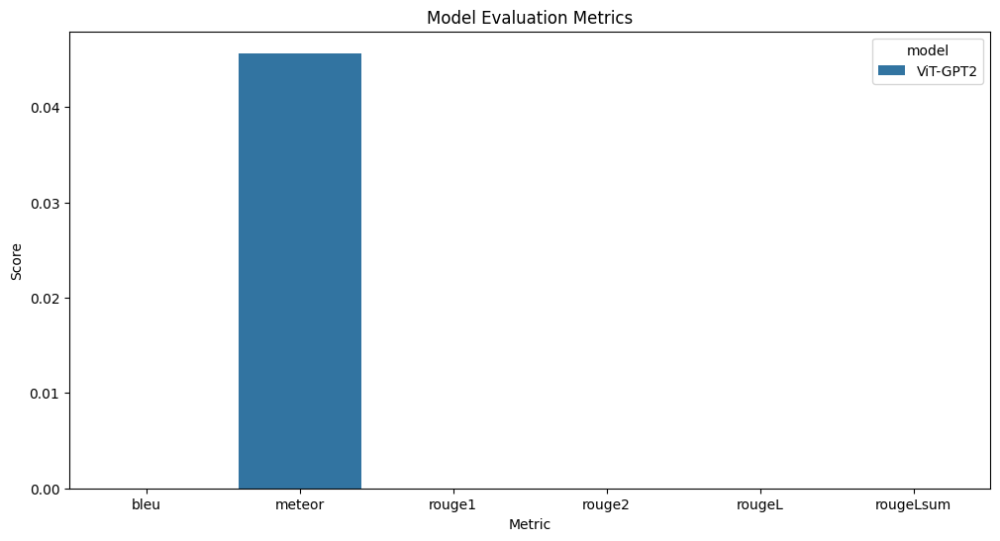

In [ ]:
!pip install matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from transformers import VisionEncoderDecoderModel, AutoTokenizer, AutoFeatureExtractor
from datasets import load_metric, load_dataset
from PIL import Image
import io
import pandas as pd
import numpy as np

# Define metrics
bleu_metric = load_metric("bleu")
rouge_metric = load_metric("rouge")
meteor_metric = load_metric("meteor")

# Load the dataset
dataset = load_dataset("indrad123/flickr30k-google-translate-id")["test"]

# Prepare the dataset and take a random sample of 100 images
data = pd.DataFrame({
    "image": dataset["image"],
    "caption": dataset["original_alt_text_id"]
}).sample(n=100, random_state=42).reset_index(drop=True)

# Define the custom dataset
class CustomImageCaptionDataset(Dataset):
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_bytes = self.data.iloc[idx]['image']['bytes']
        captions_list = self.data.iloc[idx]['caption']
        return img_bytes, captions_list

# Initialize datasets
dataset = CustomImageCaptionDataset(data)

# Create data loader
data_loader = DataLoader(dataset, batch_size=8, shuffle=False, pin_memory=True)

def postprocess_text(preds, labels):
    preds = [pred.strip() for pred in preds]
    labels = [label.strip() for label in labels]

    preds = ["\n".join(nltk.sent_tokenize(pred)) for pred in preds]
    labels = ["\n".join(nltk.sent_tokenize(label)) for label in labels]

    return preds, labels

def compute_metrics(predictions, references):
    # Compute BLEU
    bleu_result = bleu_metric.compute(predictions=[pred.split() for pred in predictions], references=[[label.split()] for label in references])
    bleu_score = bleu_result["bleu"]

    # Compute ROUGE
    rouge_result = rouge_metric.compute(predictions=predictions, references=references)
    rouge_score = {key: value.mid.fmeasure * 100 for key, value in rouge_result.items()}

    # Compute METEOR
    meteor_result = meteor_metric.compute(predictions=predictions, references=references)
    meteor_score = meteor_result["meteor"]

    result = {
        "bleu": bleu_score,
        "meteor": meteor_score,
    }
    result.update(rouge_score)
    return result

# Load the model, tokenizer, and feature extractor
#output_dir = "/content/drive/MyDrive/VitImageCaptioning/model"
#model = VisionEncoderDecoderModel.from_pretrained(output_dir)
#tokenizer = AutoTokenizer.from_pretrained(output_dir)
#feature_extractor = AutoFeatureExtractor.from_pretrained(output_dir)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Function to evaluate a model
def evaluate_model(model, data_loader):
    predictions = []
    references = []

    for img_bytes, captions_list in data_loader:
        for img_bytes in img_bytes:
            image = Image.open(io.BytesIO(img_bytes)).convert('RGB')
            pixel_values = feature_extractor(images=image, return_tensors="pt").pixel_values.to(device)

            model.eval()
            with torch.no_grad():
                output_ids = model.generate(pixel_values)

            caption = tokenizer.decode(output_ids[0], skip_special_tokens=True)
            predictions.append(caption)
            references.append(captions_list[0])  # Assuming the first caption is the reference

    predictions, references = postprocess_text(predictions, references)
    return compute_metrics(predictions, references)

# Evaluate the model and store the results
results = []

print("Evaluating Model")
metrics = evaluate_model(model, data_loader)
results.append({"model": "ViT-GPT2", **metrics})
print("Model Metrics:", metrics)

# Convert results to DataFrame
df_results = pd.DataFrame(results)
print(df_results)

# Plot the results
def plot_metrics(df):
    df_melt = df.melt(id_vars="model", var_name="metric", value_name="value")
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df_melt, x="metric", y="value", hue="model")
    plt.title("Model Evaluation Metrics")
    plt.ylabel("Score")
    plt.xlabel("Metric")
    plt.show()

plot_metrics(df_results)


In [ ]:
from transformers import VisionEncoderDecoderModel, AutoTokenizer, AutoFeatureExtractor
from PIL import Image
import torch
import json
import io

# Load the model, tokenizer, and feature extractor
output_dir = "/content/drive/MyDrive/VitImageCaptioning/model"
model = VisionEncoderDecoderModel.from_pretrained(output_dir)
tokenizer = AutoTokenizer.from_pretrained(output_dir)
feature_extractor = AutoFeatureExtractor.from_pretrained(output_dir)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Ensure pad_token is set correctly
tokenizer.pad_token = tokenizer.eos_token
model.config.pad_token_id = tokenizer.pad_token_id


/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


# Evaluation

In [2]:
!pip install datasets
!pip install evaluate
!pip install nltk
!pip install rouge_metric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.1/542.1 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.7 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.7/151.7 kB 4.0 MB/s eta 0

In [4]:
!pip install googletrans==3.1.0a0

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 9.6 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16353 sha256=23b6c2311cfe3bb4a69ea53f3206c7f97f08fb8ae0e95cd87fdf448f6050890e
  Stored in directory: /root/.cache/pip/wheels/50/5d/3c/8477d0af4ca2b8b1308812c09f1930863caeebc762fe265a95
Successfully built googletrans
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling ch

In [3]:
!pip install rouge_score

  Preparing metadata (setup.py) ... done
  Created wheel for rouge_score: filename=rouge_score-0.1.2-py3-none-any.whl size=24933 sha256=4ec08d49f025781a75ac18e76bbac2d522eb29f362f39cbe6b040ee631934727
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge_score


# Evaluation

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning:

The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.

Generating Captions: 100%|██████████| 100/100 [01:05<00:00,  1.52it/s]


   Metric     Score
0    BLEU  0.007753
1  METEOR  0.081282
2   ROUGE  0.200042


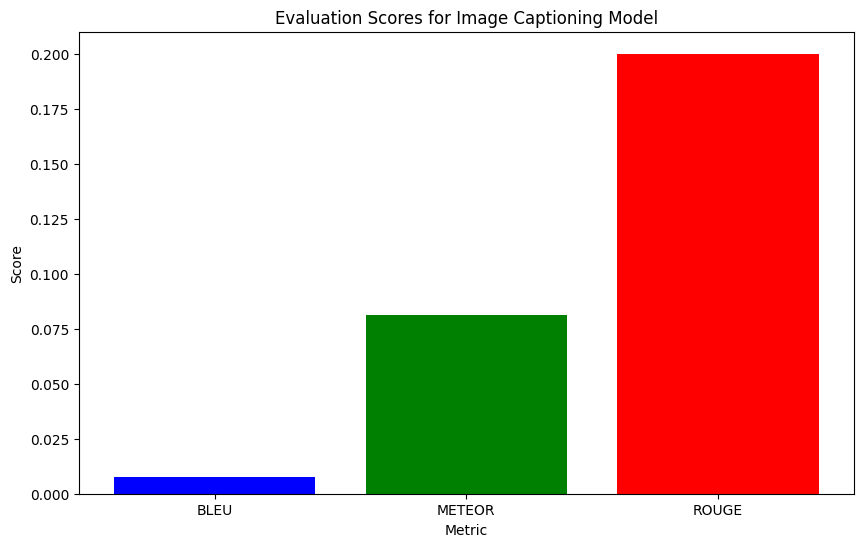

In [8]:
import torch
from datasets import load_dataset
from transformers import VisionEncoderDecoderModel, AutoTokenizer, AutoFeatureExtractor
from PIL import Image
import base64
import io
import matplotlib.pyplot as plt
import evaluate
import pandas as pd
from tqdm import tqdm
import numpy as np
import nltk
from googletrans import Translator
import plotly.graph_objects as go
import rouge_metric

# Ensure the NLTK punkt tokenizer is downloaded
nltk.download('punkt')

# Load the dataset
dataset = load_dataset("indrad123/flickr30k-google-translate-id")

# Prepare the dataset
data = pd.DataFrame({
    "image": dataset["test"]["image"],
    "caption": dataset["test"]["alt_text_id"]
}).sample(n=10000, random_state=42)  # Select 100 random samples

# Load evaluation metrics
bleu_metric = evaluate.load('bleu')
rouge_metric = evaluate.load('rouge')
meteor_metric = evaluate.load('meteor')

# Load the image captioning model and tokenizer
model_name = "nlpconnect/vit-gpt2-image-captioning"
model = VisionEncoderDecoderModel.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)
feature_extractor = AutoFeatureExtractor.from_pretrained(model_name)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Function to decode a base64 image
def decode_image(image_base64):
    image_bytes = base64.b64decode(image_base64)
    image = Image.open(io.BytesIO(image_bytes)).convert('RGB')
    return image

# Function to preprocess the image
def preprocess_image(image, feature_extractor):
    pixel_values = feature_extractor(images=image, return_tensors="pt").pixel_values
    return pixel_values

# Function to generate captions from images
def generate_caption(image_bytes):
    try:
        image = Image.open(io.BytesIO(image_bytes)).convert('RGB')
        pixel_values = preprocess_image(image, feature_extractor).to(device)

        model.eval()
        with torch.no_grad():
            output_ids = model.generate(pixel_values, max_length=64, num_beams=4, eos_token_id=tokenizer.eos_token_id)
            caption = tokenizer.decode(output_ids[0], skip_special_tokens=True)

        return caption
    except Exception as e:
        return f"Error: {str(e)}"

# Function to translate text using Google Translate
def translate_text(text, src_lang='en', tgt_lang='id'):
    translator = Translator()
    try:
        translated = translator.translate(text, src=src_lang, dest=tgt_lang).text
        return translated
    except Exception as e:
        return f"Error: {str(e)}"

# Prepare the dataset for evaluation
test_data = dataset['test'].shuffle(seed=42).select(range(100))  # Select 100 random samples

# Generate captions and evaluate
generated_captions = []
reference_captions = []

for record in tqdm(test_data, desc="Generating Captions"):
    image_bytes = record['image']['bytes']
    reference_caption = record['alt_text_id']

    generated_caption_en = generate_caption(image_bytes)
    generated_caption_id = translate_text(generated_caption_en)

    generated_captions.append(generated_caption_id)
    reference_captions.append(reference_caption)

# Post-process text
def postprocess_text(preds, labels):
    preds = [pred.strip() for pred in preds]
    labels = [label.strip() for label in labels]
    return preds, labels

generated_captions, reference_captions = postprocess_text(generated_captions, reference_captions)

# Compute BLEU score
bleu_score = bleu_metric.compute(predictions=generated_captions, references=[[ref] for ref in reference_captions])['bleu']

# Compute ROUGE score
rouge_score = rouge_metric.compute(predictions=generated_captions, references=reference_captions)

# Compute METEOR score
meteor_score = meteor_metric.compute(predictions=generated_captions, references=reference_captions)['meteor']

# Extract the ROUGE-L F1 score directly if available
rouge_l_f1 = rouge_score['rougeL']

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    "Metric": ["BLEU", "METEOR", "ROUGE"],
    "Score": [bleu_score, meteor_score, rouge_l_f1]
})

# Print the results
print(results_df)

# Plot the evaluation metrics
plt.figure(figsize=(10, 6))
plt.bar(results_df['Metric'], results_df['Score'], color=['blue', 'green', 'red'])
plt.xlabel('Metric')
plt.ylabel('Score')
plt.title('Evaluation Scores for Image Captioning Model')
plt.show()

# Display the results as a table using plotly
fig = go.Figure(data=[go.Table(
    header=dict(values=list(results_df.columns),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[results_df.Metric, results_df.Score],
               fill_color='lavender',
               align='left'))
])

fig.update_layout(title="Evaluation Scores for Image Captioning Model")
fig.show()


In [9]:
results_df

,Metric,Score
0,BLEU,0.007753
1,METEOR,0.081282
2,ROUGE,0.200042


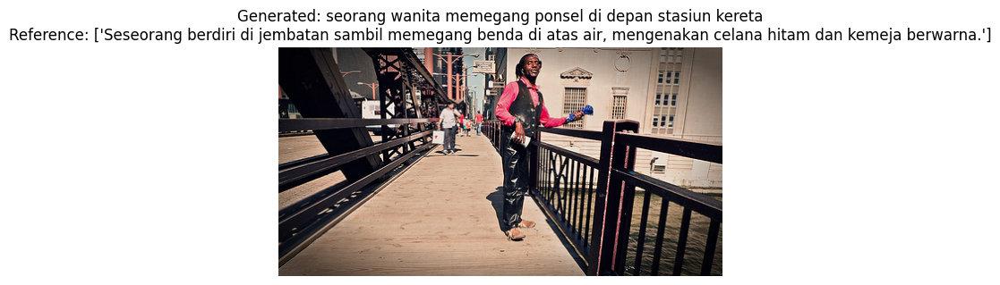

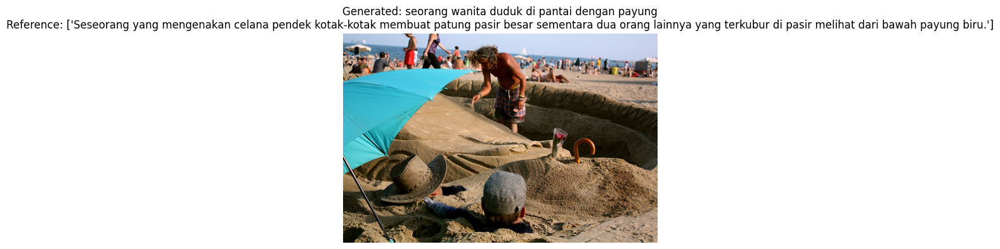

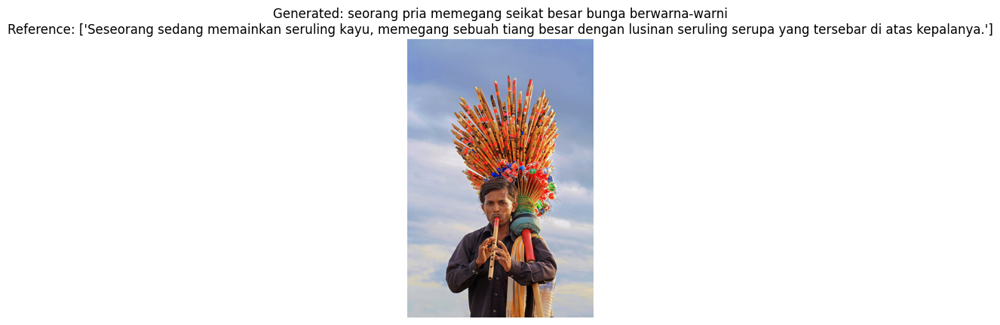

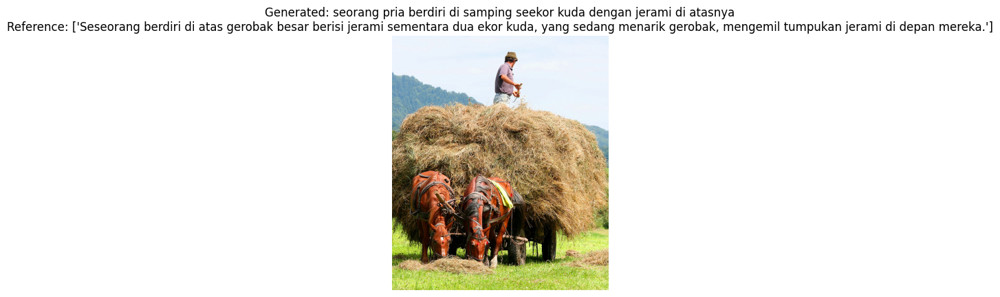

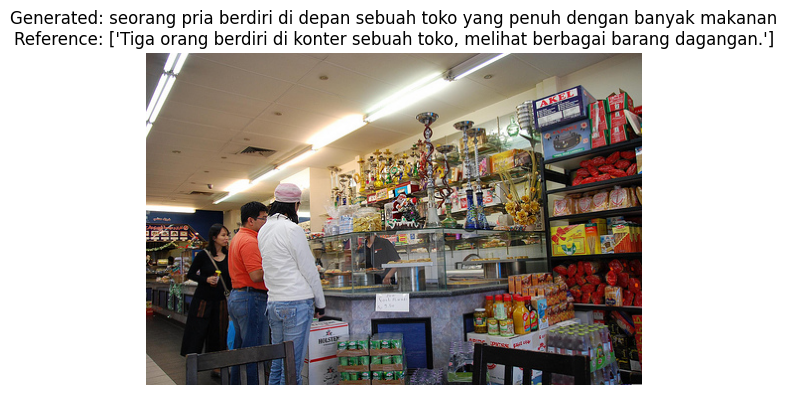

In [10]:
# Prepare the dataset and select 5 random samples
data = pd.DataFrame({
    "image": dataset["test"]["image"],
    "caption": dataset["test"]["alt_text_id"]
}).sample(n=5, random_state=42)  # Select 5 random samples

# Generate captions and display results
for index, record in data.iterrows():
    image_bytes = record['image']['bytes']
    reference_caption = record['caption']

    generated_caption_en = generate_caption(image_bytes)
    generated_caption_id = translate_text(generated_caption_en)

    # Display the image
    image = Image.open(io.BytesIO(image_bytes))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Generated: {generated_caption_id}\nReference: {reference_caption}")
    plt.show()

# New Evaluation

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of GPT2LMHeadModel were not initialized from the model checkpoint at gpt2 and are newly initialized: ['h.0.crossattention.c_attn.bias', 'h.0.crossattention.c_attn.weight', 'h.0.crossattention.c_proj.bias', 'h.0.crossattention.c_proj.weight', 'h.0.crossattention.q_attn.bias', 'h.0.crossattention.q_attn.weight', 'h.0.ln_cross_attn.bias', 'h.0.ln_cross_attn.weigh

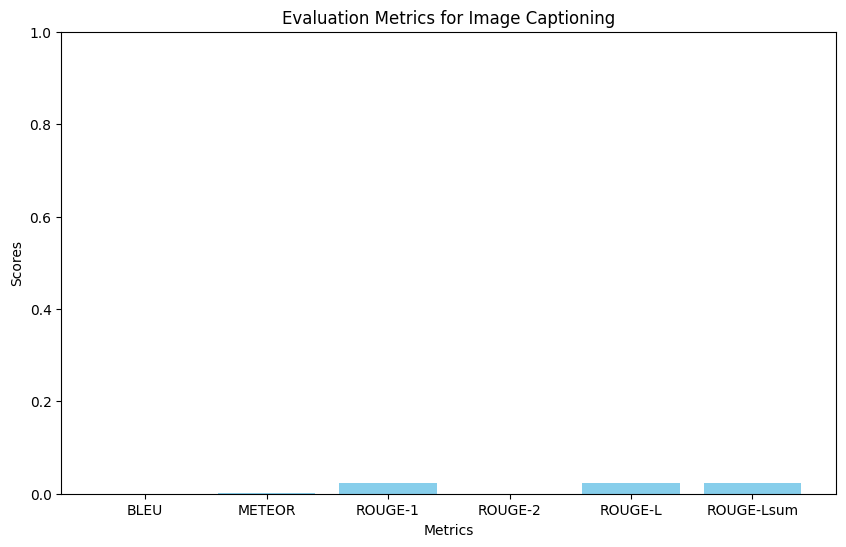

{'bleu': 0.0, 'meteor': 0.0009702600335711201, 'rouge1': 0.022727272727272728, 'rouge2': 0.0, 'rougeL': 0.022727272727272728, 'rougeLsum': 0.022727272727272728}
Generated Caption: "I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say that I'm not going to say


In [1]:
import os
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
from datasets import load_dataset
from PIL import Image
from torchvision import transforms
import io
from transformers import VisionEncoderDecoderModel, AutoFeatureExtractor, AutoTokenizer
import nltk
import numpy as np
from datasets import load_metric
import matplotlib.pyplot as plt

# Download NLTK data if not present
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')

# Load dataset
dataset = load_dataset("indrad123/flickr30k-google-translate-id")

# Prepare the dataset
data = pd.DataFrame({
    "image": dataset["test"]["image"],
    "caption": dataset["test"]["alt_text_id"]
})

# Define a custom dataset
class CustomImageCaptionDataset(Dataset):
    def __init__(self, data, img_transform=None):
        self.data = data
        self.img_transform = img_transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_bytes = self.data.iloc[idx]['image']['bytes']
        captions_list = self.data.iloc[idx]['caption']

        image = Image.open(io.BytesIO(img_bytes)).convert('RGB')
        if self.img_transform:
            image = self.img_transform(image)

        # Ensure the caption is in a list format
        if not isinstance(captions_list, list):
            captions_list = [captions_list]

        return image, captions_list

# Define image transformations
img_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Initialize dataset
dataset = CustomImageCaptionDataset(data, img_transform)

# Create data loader
data_loader = DataLoader(dataset, batch_size=8, shuffle=False, pin_memory=True)

# Define model names
image_encoder_model = "google/vit-base-patch16-224-in21k"
text_decoder_model = "gpt2"

# Load the Vision-Encoder-Decoder model
model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(image_encoder_model, text_decoder_model)

# Initialize the feature extractor and tokenizer
feature_extractor = AutoFeatureExtractor.from_pretrained(image_encoder_model)
feature_extractor.do_rescale = False  # Prevent rescaling if images are already rescaled
tokenizer = AutoTokenizer.from_pretrained(text_decoder_model)

# Configure the tokenizer and model
tokenizer.pad_token = tokenizer.eos_token
model.config.eos_token_id = tokenizer.eos_token_id
model.config.decoder_start_token_id = tokenizer.bos_token_id
model.config.pad_token_id = tokenizer.pad_token_id

# Define metrics
bleu = load_metric("bleu")
rouge = load_metric("rouge")
meteor = load_metric("meteor")

def postprocess_text(preds, labels):
    preds = [pred.strip() for pred in preds]
    labels = [label.strip() for label in labels]

    preds = ["\n".join(nltk.sent_tokenize(pred)) for pred in preds]
    labels = ["\n".join(nltk.sent_tokenize(label)) for label in labels]

    return preds, labels

def compute_metrics(preds, labels):
    decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)
    decoded_preds, decoded_labels = postprocess_text(decoded_preds, decoded_labels)

    # Compute BLEU
    bleu_result = bleu.compute(predictions=[pred.split() for pred in decoded_preds], references=[[label.split()] for label in decoded_labels])
    bleu_score = bleu_result["bleu"]

    # Compute ROUGE
    rouge_result = rouge.compute(predictions=decoded_preds, references=decoded_labels)
    rouge_score = {key: value.mid.fmeasure * 100 for key, value in rouge_result.items()}

    # Compute METEOR
    meteor_result = meteor.compute(predictions=decoded_preds, references=decoded_labels)
    meteor_score = meteor_result["meteor"]

    result = {
        "bleu": bleu_score,
        "meteor": meteor_score,
    }
    result.update(rouge_score)

    return result

def plot_metrics(metrics):
    scores = {
        "BLEU": metrics["bleu"],
        "METEOR": metrics["meteor"],
        "ROUGE-1": metrics["rouge1"],
        "ROUGE-2": metrics["rouge2"],
        "ROUGE-L": metrics["rougeL"],
        "ROUGE-Lsum": metrics["rougeLsum"]
    }

    names = list(scores.keys())
    values = list(scores.values())

    plt.figure(figsize=(10, 6))
    plt.bar(names, values, color='skyblue')
    plt.xlabel('Metrics')
    plt.ylabel('Scores')
    plt.title('Evaluation Metrics for Image Captioning')
    plt.ylim(0, 1)
    plt.show()

def evaluate_model(model, dataset, feature_extractor, tokenizer, num_samples=100):
    model.eval()
    dataset = CustomImageCaptionDataset(dataset[:num_samples], img_transform)

    data_loader = DataLoader(dataset, batch_size=8, shuffle=False, pin_memory=True)
    all_preds = []
    all_labels = []
    for batch in data_loader:
        images, captions = batch
        pixel_values = feature_extractor(images=list(images), return_tensors="pt").pixel_values
        pixel_values = pixel_values.to(model.device)

        with torch.no_grad():
            generated_ids = model.generate(pixel_values, num_beams=4, max_length=64, pad_token_id=tokenizer.pad_token_id)

        # Flatten the list of captions and convert to a list of strings
        labels = [caption for sublist in captions for caption in sublist]
        labels = tokenizer(labels, padding="max_length", max_length=64, truncation=True, return_tensors="pt").input_ids
        all_preds.extend(generated_ids.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    metrics = compute_metrics(all_preds, all_labels)
    plot_metrics(metrics)
    return metrics

# Perform evaluation on 100 samples
metrics = evaluate_model(model, data, feature_extractor, tokenizer, num_samples=100)
print(metrics)

# Sample result generation
def generate_caption(image_bytes):
    model.eval()
    image = Image.open(io.BytesIO(image_bytes)).convert('RGB')
    pixel_values = feature_extractor(images=image, return_tensors="pt").pixel_values
    pixel_values = pixel_values.to(model.device)

    # Generate caption
    generated_ids = model.generate(pixel_values, num_beams=4, max_length=64, pad_token_id=tokenizer.pad_token_id)
    generated_caption = tokenizer.decode(generated_ids[0], skip_special_tokens=True)
    return generated_caption

# Example usage
sample_image_bytes = data.iloc[0]['image']['bytes']
sample_caption = generate_caption(sample_image_bytes)
print(f"Generated Caption: {sample_caption}")
